In [24]:
import numpy as np
import matplotlib.pyplot as plt 
import pandas as pd
from sklearn.model_selection import train_test_split

import keras
from keras import backend as K
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.layers.normalization import BatchNormalization
from keras.datasets import boston_housing
from keras.utils.vis_utils import model_to_dot
from keras.callbacks import History 
from keras import initializers
from keras import optimizers

In [2]:
#Load Data
train = pd.read_csv("housing.csv")
train.drop("ID", axis=1, inplace= True,errors= "ignore")
#making validation and testing data
train, test = train_test_split(train, test_size=0.30, random_state=1)
train, val = train_test_split(train, test_size=0.2, random_state=1)
y_train =  train["medv"]
x_train =  train.drop("medv", axis=1, errors= "ignore")
y_test =  test["medv"]
x_test =  test.drop("medv", axis=1, errors= "ignore")
y_val =  val["medv"]
x_val =  val.drop("medv", axis=1, errors= "ignore")

In [3]:
x_val.tail()

,crim,zn,indus,chas,nox,rm,age,dis,rad,tax,ptratio,b,lstat
461,3.69311,0.0,18.10,0,0.713,6.376,88.4,2.5671,24,666,20.2,391.43,14.65
422,12.04820,0.0,18.10,0,0.614,5.648,87.6,1.9512,24,666,20.2,291.55,14.10
335,0.03961,0.0,5.19,0,0.515,6.037,34.5,5.9853,5,224,20.2,396.90,8.01
479,14.33370,0.0,18.10,0,0.614,6.229,88.0,1.9512,24,666,20.2,383.32,13.11
37,0.08014,0.0,5.96,0,0.499,5.850,41.5,3.9342,5,279,19.2,396.90,8.77


In [4]:
x_test = x_test.as_matrix()
x_train = x_train.as_matrix()
y_train = y_train.as_matrix()

D:\anaconda\lib\site-packages\ipykernel_launcher.py:1: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  """Entry point for launching an IPython kernel.
D:\anaconda\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  
D:\anaconda\lib\site-packages\ipykernel_launcher.py:3: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  This is separate from the ipykernel package so we can avoid doing imports until


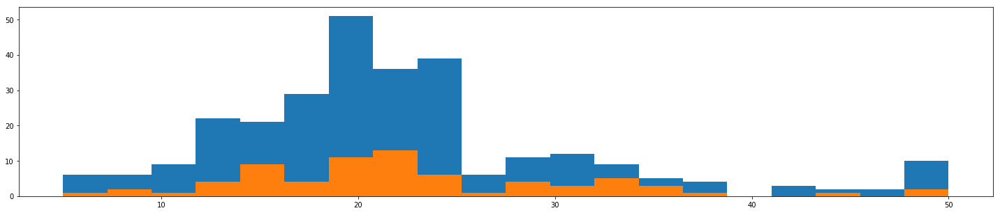

In [5]:
#Check Train/Valid datasets distributions
%matplotlib inline
x = np.arange(0, len(y_train),1)
plt.figure(figsize=(25, 5))
plt.hist(y_train,20)
plt.hist(y_val,20)
plt.show()

In [6]:
#Define RMSE for loss 
def root_mean_squared_error(y_true, y_pred):
        return K.sqrt(K.mean(K.square(y_pred - y_true), axis=-1)) 
    
    
# Get final Loss
def loss_eval(x_train, y_train, x_val, y_val,x_test,y_test, batch_size): 
    score_train = model.evaluate(x_train, y_train, batch_size=batch_size)
    score_valid  = model.evaluate(x_val, y_val, batch_size= batch_size)
    score_test  = model.evaluate(x_test, y_test, batch_size= batch_size)
    return score_train, score_valid,score_test


# Get Loss Timeline
def loss_epoch(history, y_lim_min, y_lim_max):
    hist = list(history.history.values())
    x = np.arange(0, len(hist[0]),1)
    plt.figure(figsize=(20, 5))
    plt.plot(x, hist[0], x, hist[1])
    plt.ylim([y_lim_min,y_lim_max])
    plt.show()



In [7]:
sgd = optimizers.SGD(lr=0.01)

In [8]:
model = Sequential()
model.add(Dense(1, input_dim =(13)))

model.add(Activation("relu"))
optimizer = keras.optimizers.RMSprop(lr=0.01)
model.compile(optimizer=optimizer, loss='mean_squared_error')


## Case 1

In [50]:
model.fit(x_train, y_train, batch_size=30, epochs=2500, verbose=1, validation_data=(x_val, y_val))

Train on 283 samples, validate on 71 samples
Epoch 1/2500
283/283 [==============================] - 1s 2ms/step - loss: 565.1112 - val_loss: 301.2353
Epoch 2/2500
283/283 [==============================] - 0s 116us/step - loss: 173.6863 - val_loss: 266.6863
Epoch 3/2500
283/283 [==============================] - 0s 109us/step - loss: 139.7036 - val_loss: 88.8968
Epoch 4/2500
283/283 [==============================] - 0s 127us/step - loss: 105.8509 - val_loss: 100.4719
Epoch 5/2500
283/283 [==============================] - 0s 116us/step - loss: 110.3829 - val_loss: 70.6353
Epoch 6/2500
283/283 [==============================] - 0s 113us/step - loss: 78.9267 - val_loss: 102.5964
Epoch 7/2500
283/283 [==============================] - 0s 120us/step - loss: 82.7900 - val_loss: 91.4739
Epoch 8/2500
283/283 [==============================] - 0s 120us/step - loss: 77.8585 - val_loss: 58.0629
Epoch 9/2500
283/283 [==============================] - 0s 109us/step - loss: 68.6327 - val_loss: 25

Epoch 154/2500
283/283 [==============================] - 0s 88us/step - loss: 70.7899 - val_loss: 30.6383
Epoch 155/2500
283/283 [==============================] - 0s 92us/step - loss: 46.1155 - val_loss: 32.9103
Epoch 156/2500
283/283 [==============================] - 0s 92us/step - loss: 68.2331 - val_loss: 31.2296
Epoch 157/2500
283/283 [==============================] - 0s 85us/step - loss: 54.7300 - val_loss: 48.6963
Epoch 158/2500
283/283 [==============================] - 0s 85us/step - loss: 74.0278 - val_loss: 26.6155
Epoch 159/2500
283/283 [==============================] - 0s 85us/step - loss: 46.3466 - val_loss: 30.8816
Epoch 160/2500
283/283 [==============================] - 0s 85us/step - loss: 53.4007 - val_loss: 37.3714
Epoch 161/2500
283/283 [==============================] - 0s 81us/step - loss: 53.1417 - val_loss: 29.5217
Epoch 162/2500
283/283 [==============================] - 0s 81us/step - loss: 69.5056 - val_loss: 26.1842
Epoch 163/2500
283/283 [=============

283/283 [==============================] - 0s 92us/step - loss: 60.5568 - val_loss: 24.8288
Epoch 307/2500
283/283 [==============================] - 0s 95us/step - loss: 60.2888 - val_loss: 41.7761
Epoch 308/2500
283/283 [==============================] - 0s 88us/step - loss: 39.6512 - val_loss: 112.4934
Epoch 309/2500
283/283 [==============================] - 0s 81us/step - loss: 62.6693 - val_loss: 26.6247
Epoch 310/2500
283/283 [==============================] - 0s 92us/step - loss: 57.7232 - val_loss: 24.6064
Epoch 311/2500
283/283 [==============================] - 0s 88us/step - loss: 49.5887 - val_loss: 27.6522
Epoch 312/2500
283/283 [==============================] - 0s 88us/step - loss: 66.4417 - val_loss: 88.4806
Epoch 313/2500
283/283 [==============================] - 0s 85us/step - loss: 50.4828 - val_loss: 28.1036
Epoch 314/2500
283/283 [==============================] - 0s 88us/step - loss: 55.2268 - val_loss: 24.4320
Epoch 315/2500
283/283 [===========================

283/283 [==============================] - 0s 109us/step - loss: 57.9450 - val_loss: 36.6876
Epoch 459/2500
283/283 [==============================] - 0s 95us/step - loss: 50.8097 - val_loss: 39.8916
Epoch 460/2500
283/283 [==============================] - 0s 85us/step - loss: 50.8401 - val_loss: 26.3148
Epoch 461/2500
283/283 [==============================] - 0s 88us/step - loss: 54.7958 - val_loss: 21.2869
Epoch 462/2500
283/283 [==============================] - 0s 92us/step - loss: 65.5451 - val_loss: 37.6977
Epoch 463/2500
283/283 [==============================] - 0s 88us/step - loss: 40.3198 - val_loss: 21.6292
Epoch 464/2500
283/283 [==============================] - 0s 81us/step - loss: 47.5959 - val_loss: 20.5298
Epoch 465/2500
283/283 [==============================] - 0s 81us/step - loss: 54.4128 - val_loss: 28.5980
Epoch 466/2500
283/283 [==============================] - 0s 88us/step - loss: 56.2912 - val_loss: 36.7117
Epoch 467/2500
283/283 [===========================

283/283 [==============================] - 0s 109us/step - loss: 52.7887 - val_loss: 33.1639
Epoch 611/2500
283/283 [==============================] - 0s 99us/step - loss: 51.6642 - val_loss: 109.5157
Epoch 612/2500
283/283 [==============================] - 0s 85us/step - loss: 56.9252 - val_loss: 47.8210
Epoch 613/2500
283/283 [==============================] - 0s 92us/step - loss: 56.8520 - val_loss: 69.7378
Epoch 614/2500
283/283 [==============================] - 0s 85us/step - loss: 51.4861 - val_loss: 18.6077
Epoch 615/2500
283/283 [==============================] - 0s 92us/step - loss: 53.6128 - val_loss: 25.4150
Epoch 616/2500
283/283 [==============================] - 0s 88us/step - loss: 59.5150 - val_loss: 21.1185
Epoch 617/2500
283/283 [==============================] - 0s 95us/step - loss: 38.9462 - val_loss: 79.8205
Epoch 618/2500
283/283 [==============================] - 0s 85us/step - loss: 68.8095 - val_loss: 45.7598
Epoch 619/2500
283/283 [==========================

283/283 [==============================] - 0s 85us/step - loss: 48.6402 - val_loss: 50.9451
Epoch 763/2500
283/283 [==============================] - 0s 92us/step - loss: 41.1728 - val_loss: 82.0346
Epoch 764/2500
283/283 [==============================] - 0s 92us/step - loss: 58.7025 - val_loss: 27.3284
Epoch 765/2500
283/283 [==============================] - 0s 88us/step - loss: 55.4399 - val_loss: 47.5684
Epoch 766/2500
283/283 [==============================] - 0s 102us/step - loss: 62.8789 - val_loss: 17.3528
Epoch 767/2500
283/283 [==============================] - 0s 88us/step - loss: 32.5590 - val_loss: 44.1073
Epoch 768/2500
283/283 [==============================] - 0s 81us/step - loss: 58.7311 - val_loss: 17.5662
Epoch 769/2500
283/283 [==============================] - 0s 88us/step - loss: 53.6188 - val_loss: 35.1862
Epoch 770/2500
283/283 [==============================] - 0s 85us/step - loss: 34.5086 - val_loss: 19.4363
Epoch 771/2500
283/283 [===========================

283/283 [==============================] - 0s 85us/step - loss: 60.4478 - val_loss: 45.5564
Epoch 915/2500
283/283 [==============================] - 0s 109us/step - loss: 41.3745 - val_loss: 26.3299
Epoch 916/2500
283/283 [==============================] - 0s 85us/step - loss: 52.6159 - val_loss: 20.2189
Epoch 917/2500
283/283 [==============================] - 0s 92us/step - loss: 53.8646 - val_loss: 60.0428
Epoch 918/2500
283/283 [==============================] - 0s 85us/step - loss: 50.5795 - val_loss: 50.7889
Epoch 919/2500
283/283 [==============================] - 0s 88us/step - loss: 40.3988 - val_loss: 16.8030
Epoch 920/2500
283/283 [==============================] - 0s 85us/step - loss: 58.1354 - val_loss: 33.2219
Epoch 921/2500
283/283 [==============================] - 0s 88us/step - loss: 35.9375 - val_loss: 25.5136
Epoch 922/2500
283/283 [==============================] - 0s 88us/step - loss: 52.7241 - val_loss: 102.5641
Epoch 923/2500
283/283 [==========================

283/283 [==============================] - 0s 92us/step - loss: 60.2109 - val_loss: 34.1752
Epoch 1067/2500
283/283 [==============================] - 0s 113us/step - loss: 52.1083 - val_loss: 18.5665
Epoch 1068/2500
283/283 [==============================] - 0s 85us/step - loss: 33.4598 - val_loss: 48.2014
Epoch 1069/2500
283/283 [==============================] - 0s 88us/step - loss: 61.2384 - val_loss: 16.3026
Epoch 1070/2500
283/283 [==============================] - 0s 88us/step - loss: 48.3746 - val_loss: 103.2421
Epoch 1071/2500
283/283 [==============================] - 0s 92us/step - loss: 57.1511 - val_loss: 26.6007
Epoch 1072/2500
283/283 [==============================] - 0s 88us/step - loss: 37.4440 - val_loss: 32.6590
Epoch 1073/2500
283/283 [==============================] - 0s 92us/step - loss: 52.5999 - val_loss: 43.1743
Epoch 1074/2500
283/283 [==============================] - 0s 88us/step - loss: 49.5722 - val_loss: 81.4914
Epoch 1075/2500
283/283 [=================

Epoch 1142/2500
283/283 [==============================] - 0s 92us/step - loss: 62.5028 - val_loss: 46.5114
Epoch 1143/2500
283/283 [==============================] - 0s 81us/step - loss: 42.4513 - val_loss: 105.6168
Epoch 1144/2500
283/283 [==============================] - 0s 88us/step - loss: 48.2338 - val_loss: 34.5822
Epoch 1145/2500
283/283 [==============================] - 0s 85us/step - loss: 62.0371 - val_loss: 22.7392
Epoch 1146/2500
283/283 [==============================] - 0s 102us/step - loss: 45.7254 - val_loss: 38.5201
Epoch 1147/2500
283/283 [==============================] - 0s 81us/step - loss: 50.3849 - val_loss: 37.9393
Epoch 1148/2500
283/283 [==============================] - 0s 81us/step - loss: 59.2999 - val_loss: 118.0130
Epoch 1149/2500
283/283 [==============================] - 0s 81us/step - loss: 44.1288 - val_loss: 29.9590
Epoch 1150/2500
283/283 [==============================] - 0s 85us/step - loss: 59.8920 - val_loss: 31.8610
Epoch 1151/2500
283/283 [

Epoch 1218/2500
283/283 [==============================] - 0s 81us/step - loss: 62.3057 - val_loss: 39.0753
Epoch 1219/2500
283/283 [==============================] - 0s 85us/step - loss: 41.6340 - val_loss: 46.2687
Epoch 1220/2500
283/283 [==============================] - 0s 81us/step - loss: 31.9777 - val_loss: 26.3120
Epoch 1221/2500
283/283 [==============================] - 0s 81us/step - loss: 67.1331 - val_loss: 65.1076
Epoch 1222/2500
283/283 [==============================] - 0s 88us/step - loss: 51.9594 - val_loss: 22.3035
Epoch 1223/2500
283/283 [==============================] - 0s 85us/step - loss: 55.4989 - val_loss: 30.9479
Epoch 1224/2500
283/283 [==============================] - 0s 85us/step - loss: 43.1199 - val_loss: 34.8342
Epoch 1225/2500
283/283 [==============================] - 0s 88us/step - loss: 58.0634 - val_loss: 23.7035
Epoch 1226/2500
283/283 [==============================] - 0s 99us/step - loss: 36.7411 - val_loss: 47.7168
Epoch 1227/2500
283/283 [===

Epoch 1294/2500
283/283 [==============================] - 0s 95us/step - loss: 45.4422 - val_loss: 38.2764
Epoch 1295/2500
283/283 [==============================] - 0s 81us/step - loss: 44.5173 - val_loss: 91.1940
Epoch 1296/2500
283/283 [==============================] - 0s 88us/step - loss: 57.0479 - val_loss: 17.1717
Epoch 1297/2500
283/283 [==============================] - 0s 81us/step - loss: 56.8171 - val_loss: 24.5436
Epoch 1298/2500
283/283 [==============================] - 0s 81us/step - loss: 31.8852 - val_loss: 75.5180
Epoch 1299/2500
283/283 [==============================] - 0s 78us/step - loss: 52.7534 - val_loss: 61.1630
Epoch 1300/2500
283/283 [==============================] - 0s 102us/step - loss: 36.9306 - val_loss: 44.5621
Epoch 1301/2500
283/283 [==============================] - 0s 81us/step - loss: 72.4115 - val_loss: 21.8547
Epoch 1302/2500
283/283 [==============================] - 0s 85us/step - loss: 34.3655 - val_loss: 117.2098
Epoch 1303/2500
283/283 [=

Epoch 1370/2500
283/283 [==============================] - 0s 88us/step - loss: 46.7349 - val_loss: 127.1548
Epoch 1371/2500
283/283 [==============================] - 0s 92us/step - loss: 55.5450 - val_loss: 17.7084
Epoch 1372/2500
283/283 [==============================] - 0s 85us/step - loss: 46.9790 - val_loss: 15.9779
Epoch 1373/2500
283/283 [==============================] - 0s 95us/step - loss: 44.3604 - val_loss: 28.4104
Epoch 1374/2500
283/283 [==============================] - 0s 88us/step - loss: 51.0774 - val_loss: 70.8586
Epoch 1375/2500
283/283 [==============================] - 0s 85us/step - loss: 50.3579 - val_loss: 17.9861
Epoch 1376/2500
283/283 [==============================] - 0s 92us/step - loss: 57.9031 - val_loss: 22.7045
Epoch 1377/2500
283/283 [==============================] - 0s 99us/step - loss: 47.8129 - val_loss: 50.1902
Epoch 1378/2500
283/283 [==============================] - 0s 81us/step - loss: 57.0348 - val_loss: 91.7447
Epoch 1379/2500
283/283 [==

Epoch 1521/2500
283/283 [==============================] - 0s 99us/step - loss: 48.8790 - val_loss: 44.9727
Epoch 1522/2500
283/283 [==============================] - 0s 85us/step - loss: 61.1872 - val_loss: 67.8210
Epoch 1523/2500
283/283 [==============================] - 0s 81us/step - loss: 45.3237 - val_loss: 113.8942
Epoch 1524/2500
283/283 [==============================] - 0s 85us/step - loss: 44.3476 - val_loss: 54.5406
Epoch 1525/2500
283/283 [==============================] - 0s 88us/step - loss: 56.4434 - val_loss: 41.1740
Epoch 1526/2500
283/283 [==============================] - 0s 85us/step - loss: 58.9870 - val_loss: 25.7075
Epoch 1527/2500
283/283 [==============================] - 0s 85us/step - loss: 35.4936 - val_loss: 16.4620
Epoch 1528/2500
283/283 [==============================] - 0s 88us/step - loss: 61.0166 - val_loss: 34.7214
Epoch 1529/2500
283/283 [==============================] - 0s 88us/step - loss: 54.0526 - val_loss: 113.8550
Epoch 1530/2500
283/283 [=

Epoch 1597/2500
283/283 [==============================] - 0s 88us/step - loss: 48.8821 - val_loss: 38.1951
Epoch 1598/2500
283/283 [==============================] - 0s 92us/step - loss: 44.0807 - val_loss: 69.9592
Epoch 1599/2500
283/283 [==============================] - 0s 88us/step - loss: 57.2698 - val_loss: 83.0106
Epoch 1600/2500
283/283 [==============================] - 0s 81us/step - loss: 55.3565 - val_loss: 57.0915
Epoch 1601/2500
283/283 [==============================] - 0s 85us/step - loss: 43.7672 - val_loss: 17.9643
Epoch 1602/2500
283/283 [==============================] - 0s 85us/step - loss: 44.2365 - val_loss: 48.8037
Epoch 1603/2500
283/283 [==============================] - 0s 85us/step - loss: 49.5227 - val_loss: 46.0604
Epoch 1604/2500
283/283 [==============================] - 0s 81us/step - loss: 53.4540 - val_loss: 84.4098
Epoch 1605/2500
283/283 [==============================] - 0s 88us/step - loss: 39.5369 - val_loss: 72.5009
Epoch 1606/2500
283/283 [===

Epoch 1673/2500
283/283 [==============================] - 0s 99us/step - loss: 56.1554 - val_loss: 29.5470
Epoch 1674/2500
283/283 [==============================] - 0s 85us/step - loss: 40.3609 - val_loss: 181.4889
Epoch 1675/2500
283/283 [==============================] - 0s 85us/step - loss: 51.0948 - val_loss: 32.4468
Epoch 1676/2500
283/283 [==============================] - 0s 81us/step - loss: 57.2125 - val_loss: 16.0801
Epoch 1677/2500
283/283 [==============================] - 0s 88us/step - loss: 46.0319 - val_loss: 23.3889
Epoch 1678/2500
283/283 [==============================] - 0s 81us/step - loss: 59.7709 - val_loss: 19.3950
Epoch 1679/2500
283/283 [==============================] - 0s 88us/step - loss: 55.5036 - val_loss: 38.0340
Epoch 1680/2500
283/283 [==============================] - 0s 81us/step - loss: 46.4498 - val_loss: 28.6340
Epoch 1681/2500
283/283 [==============================] - 0s 85us/step - loss: 49.8994 - val_loss: 19.1062
Epoch 1682/2500
283/283 [==

Epoch 1749/2500
283/283 [==============================] - 0s 88us/step - loss: 31.0703 - val_loss: 16.4544
Epoch 1750/2500
283/283 [==============================] - 0s 102us/step - loss: 56.7751 - val_loss: 33.0855
Epoch 1751/2500
283/283 [==============================] - 0s 92us/step - loss: 41.5103 - val_loss: 94.3251
Epoch 1752/2500
283/283 [==============================] - 0s 88us/step - loss: 50.7397 - val_loss: 16.6141
Epoch 1753/2500
283/283 [==============================] - 0s 95us/step - loss: 35.4676 - val_loss: 49.6988
Epoch 1754/2500
283/283 [==============================] - 0s 88us/step - loss: 54.0127 - val_loss: 91.5787
Epoch 1755/2500
283/283 [==============================] - 0s 85us/step - loss: 48.4877 - val_loss: 17.5329
Epoch 1756/2500
283/283 [==============================] - 0s 88us/step - loss: 54.7679 - val_loss: 26.5001
Epoch 1757/2500
283/283 [==============================] - 0s 88us/step - loss: 32.6347 - val_loss: 54.1687
Epoch 1758/2500
283/283 [==

Epoch 1900/2500
283/283 [==============================] - 0s 92us/step - loss: 44.5620 - val_loss: 20.9374
Epoch 1901/2500
283/283 [==============================] - 0s 81us/step - loss: 59.8543 - val_loss: 17.5569
Epoch 1902/2500
283/283 [==============================] - 0s 85us/step - loss: 37.2334 - val_loss: 42.2141
Epoch 1903/2500
283/283 [==============================] - 0s 88us/step - loss: 58.1912 - val_loss: 27.1319
Epoch 1904/2500
283/283 [==============================] - 0s 85us/step - loss: 45.5289 - val_loss: 36.7909
Epoch 1905/2500
283/283 [==============================] - 0s 88us/step - loss: 56.7215 - val_loss: 33.7268
Epoch 1906/2500
283/283 [==============================] - 0s 85us/step - loss: 51.3464 - val_loss: 107.2525
Epoch 1907/2500
283/283 [==============================] - 0s 85us/step - loss: 43.1975 - val_loss: 25.8019
Epoch 1908/2500
283/283 [==============================] - 0s 102us/step - loss: 63.0798 - val_loss: 29.0451
Epoch 1909/2500
283/283 [=

Epoch 1976/2500
283/283 [==============================] - 0s 95us/step - loss: 60.8241 - val_loss: 33.3277
Epoch 1977/2500
283/283 [==============================] - 0s 99us/step - loss: 43.3956 - val_loss: 69.3726
Epoch 1978/2500
283/283 [==============================] - 0s 88us/step - loss: 52.8810 - val_loss: 16.0190
Epoch 1979/2500
283/283 [==============================] - 0s 88us/step - loss: 50.4016 - val_loss: 54.0455
Epoch 1980/2500
283/283 [==============================] - 0s 85us/step - loss: 58.4894 - val_loss: 16.7988
Epoch 1981/2500
283/283 [==============================] - 0s 88us/step - loss: 39.9551 - val_loss: 58.0662
Epoch 1982/2500
283/283 [==============================] - 0s 92us/step - loss: 54.8826 - val_loss: 69.5786
Epoch 1983/2500
283/283 [==============================] - 0s 92us/step - loss: 50.0057 - val_loss: 83.8716
Epoch 1984/2500
283/283 [==============================] - 0s 95us/step - loss: 44.0743 - val_loss: 199.0001
Epoch 1985/2500
283/283 [==

Epoch 2052/2500
283/283 [==============================] - 0s 85us/step - loss: 38.0804 - val_loss: 16.2984
Epoch 2053/2500
283/283 [==============================] - 0s 95us/step - loss: 60.5996 - val_loss: 18.1303
Epoch 2054/2500
283/283 [==============================] - 0s 92us/step - loss: 30.7707 - val_loss: 16.8452
Epoch 2055/2500
283/283 [==============================] - 0s 88us/step - loss: 59.1008 - val_loss: 36.5428
Epoch 2056/2500
283/283 [==============================] - 0s 85us/step - loss: 60.7522 - val_loss: 17.0799
Epoch 2057/2500
283/283 [==============================] - 0s 88us/step - loss: 44.1283 - val_loss: 16.4018
Epoch 2058/2500
283/283 [==============================] - 0s 85us/step - loss: 51.5935 - val_loss: 32.2508
Epoch 2059/2500
283/283 [==============================] - 0s 92us/step - loss: 47.6815 - val_loss: 81.4113
Epoch 2060/2500
283/283 [==============================] - 0s 88us/step - loss: 54.1637 - val_loss: 30.9034
Epoch 2061/2500
283/283 [===

Epoch 2128/2500
283/283 [==============================] - 0s 95us/step - loss: 46.7691 - val_loss: 38.5973
Epoch 2129/2500
283/283 [==============================] - 0s 88us/step - loss: 55.1405 - val_loss: 22.9752
Epoch 2130/2500
283/283 [==============================] - 0s 95us/step - loss: 37.0735 - val_loss: 37.7196
Epoch 2131/2500
283/283 [==============================] - 0s 88us/step - loss: 65.9865 - val_loss: 23.7513
Epoch 2132/2500
283/283 [==============================] - 0s 92us/step - loss: 41.5568 - val_loss: 58.7641
Epoch 2133/2500
283/283 [==============================] - 0s 85us/step - loss: 64.3342 - val_loss: 20.1682
Epoch 2134/2500
283/283 [==============================] - 0s 92us/step - loss: 35.3480 - val_loss: 17.0881
Epoch 2135/2500
283/283 [==============================] - 0s 92us/step - loss: 67.1880 - val_loss: 17.6217
Epoch 2136/2500
283/283 [==============================] - 0s 88us/step - loss: 51.7009 - val_loss: 61.9375
Epoch 2137/2500
283/283 [===

Epoch 2279/2500
283/283 [==============================] - 0s 92us/step - loss: 50.3328 - val_loss: 26.8133
Epoch 2280/2500
283/283 [==============================] - 0s 95us/step - loss: 48.2379 - val_loss: 82.2162
Epoch 2281/2500
283/283 [==============================] - 0s 88us/step - loss: 36.7888 - val_loss: 71.4477
Epoch 2282/2500
283/283 [==============================] - 0s 92us/step - loss: 69.6503 - val_loss: 60.8832
Epoch 2283/2500
283/283 [==============================] - 0s 85us/step - loss: 43.0260 - val_loss: 41.1116
Epoch 2284/2500
283/283 [==============================] - 0s 92us/step - loss: 39.6783 - val_loss: 61.1740
Epoch 2285/2500
283/283 [==============================] - 0s 88us/step - loss: 64.0362 - val_loss: 71.6906
Epoch 2286/2500
283/283 [==============================] - 0s 92us/step - loss: 48.5304 - val_loss: 30.8843
Epoch 2287/2500
283/283 [==============================] - 0s 85us/step - loss: 42.1202 - val_loss: 95.1505
Epoch 2288/2500
283/283 [===

Epoch 2355/2500
283/283 [==============================] - 0s 88us/step - loss: 42.7265 - val_loss: 26.4685
Epoch 2356/2500
283/283 [==============================] - 0s 85us/step - loss: 53.1748 - val_loss: 125.7507
Epoch 2357/2500
283/283 [==============================] - 0s 88us/step - loss: 52.4238 - val_loss: 36.9049
Epoch 2358/2500
283/283 [==============================] - 0s 92us/step - loss: 45.9559 - val_loss: 19.6772
Epoch 2359/2500
283/283 [==============================] - 0s 85us/step - loss: 68.2553 - val_loss: 19.4491
Epoch 2360/2500
283/283 [==============================] - 0s 78us/step - loss: 29.6908 - val_loss: 19.4160
Epoch 2361/2500
283/283 [==============================] - 0s 85us/step - loss: 61.7697 - val_loss: 24.8015
Epoch 2362/2500
283/283 [==============================] - 0s 81us/step - loss: 33.6491 - val_loss: 44.1671
Epoch 2363/2500
283/283 [==============================] - 0s 88us/step - loss: 64.7029 - val_loss: 26.0972
Epoch 2364/2500
283/283 [==

In [58]:
score_train, score_valid,score_test = loss_eval(x_train, y_train, x_val, y_val,x_test,y_test, 128)
print(score_train, score_valid,score_test)

152/152 [==============================] - 0s 26us/step
33.935012069270805 22.93968391418457 24.092736695942126


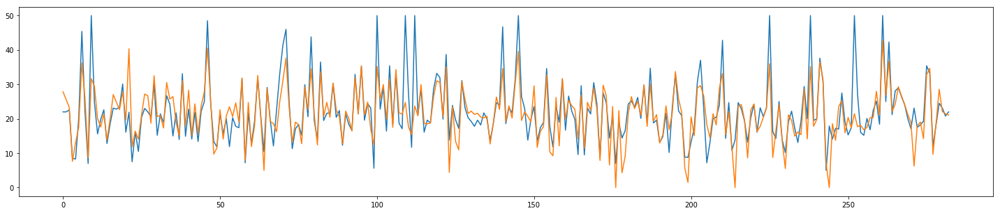

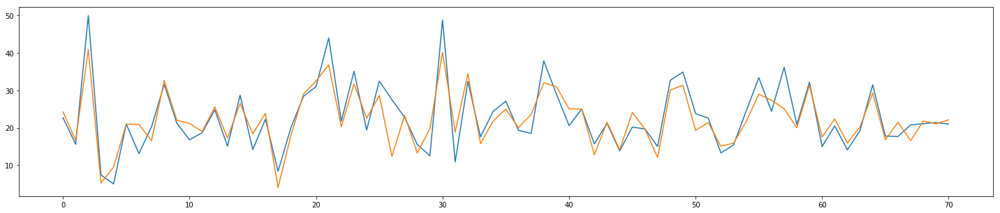

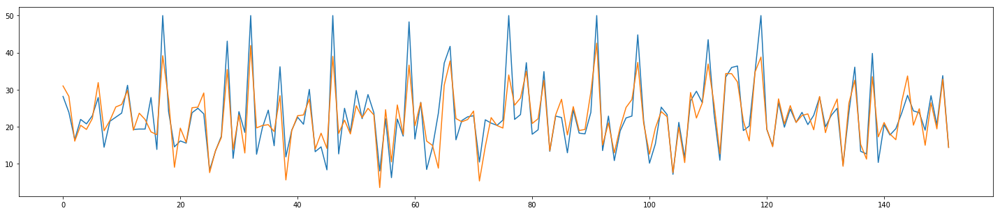

In [82]:

x = np.arange(0, len(y_train),1)
y_pred = model.predict(x_train)
plt.figure(figsize=(25, 5))
plt.plot(x, y_train, x , y_pred)

x = np.arange(0, len(y_val),1)
y_pred = model.predict(x_val)
plt.figure(figsize=(25, 5))
plt.plot(x, y_val, x , y_pred)

x = np.arange(0, len(y_test),1)
y_pred = model.predict(x_test)
plt.figure(figsize=(25, 5))
plt.plot(x, y_test, x , y_pred)

### Error of traindata = 33.93%, validation data =22.94% , testing data = 24.09%, for LR= 0.01,Epochs=2500

In [60]:
for layer in model.layers:
    weights = layer.get_weights() # list of numpy arrays
    print(weights)

[array([[-1.0607112e-01],
       [ 7.2029568e-02],
       [ 1.7550508e-02],
       [ 2.1583304e+00],
       [-3.7940409e-02],
       [ 5.0033379e+00],
       [-4.9050311e-03],
       [-8.5463125e-01],
       [ 1.8973956e-01],
       [-8.4999856e-03],
       [-4.0372029e-01],
       [ 1.8993352e-02],
       [-5.3516155e-01]], dtype=float32), array([5.2751017], dtype=float32)]
[]


## Case 2

In [102]:
model = Sequential()
model.add(Dense(1, input_dim =(13)))
model.add(Activation("relu"))
optimizer = keras.optimizers.RMSprop(lr=0.001)
model.compile(optimizer=optimizer, loss='mean_squared_error')

model.fit(x_train, y_train, batch_size=30, epochs=5000, verbose=1, validation_data=(x_val, y_val))

Train on 283 samples, validate on 71 samples
Epoch 1/5000
283/283 [==============================] - 1s 2ms/step - loss: 24007.1491 - val_loss: 22607.9034
Epoch 2/5000
283/283 [==============================] - 0s 136us/step - loss: 20801.6285 - val_loss: 19907.8803
Epoch 3/5000
283/283 [==============================] - 0s 109us/step - loss: 18419.3040 - val_loss: 17636.2366
Epoch 4/5000
283/283 [==============================] - 0s 113us/step - loss: 16362.4000 - val_loss: 15619.9959
Epoch 5/5000
283/283 [==============================] - 0s 120us/step - loss: 14485.4016 - val_loss: 13764.4276
Epoch 6/5000
283/283 [==============================] - 0s 106us/step - loss: 12765.8398 - val_loss: 12102.4219
Epoch 7/5000
283/283 [==============================] - 0s 120us/step - loss: 11211.9208 - val_loss: 10582.9401
Epoch 8/5000
283/283 [==============================] - 0s 141us/step - loss: 9780.8959 - val_loss: 9186.3789
Epoch 9/5000
283/283 [==============================] - 0s 102u

Epoch 76/5000
283/283 [==============================] - 0s 106us/step - loss: 294.7694 - val_loss: 329.9175
Epoch 77/5000
283/283 [==============================] - 0s 92us/step - loss: 293.4091 - val_loss: 331.8188
Epoch 78/5000
283/283 [==============================] - 0s 88us/step - loss: 290.8784 - val_loss: 330.2857
Epoch 79/5000
283/283 [==============================] - 0s 116us/step - loss: 288.9848 - val_loss: 324.0346
Epoch 80/5000
283/283 [==============================] - 0s 81us/step - loss: 288.1737 - val_loss: 323.5704
Epoch 81/5000
283/283 [==============================] - 0s 88us/step - loss: 285.4286 - val_loss: 326.5504
Epoch 82/5000
283/283 [==============================] - 0s 85us/step - loss: 285.9758 - val_loss: 322.2285
Epoch 83/5000
283/283 [==============================] - 0s 88us/step - loss: 282.4878 - val_loss: 317.5169
Epoch 84/5000
283/283 [==============================] - 0s 88us/step - loss: 281.0486 - val_loss: 318.7460
Epoch 85/5000
283/283 [===

283/283 [==============================] - 0s 113us/step - loss: 67.6339 - val_loss: 74.6856
Epoch 228/5000
283/283 [==============================] - 0s 88us/step - loss: 68.2066 - val_loss: 74.4799
Epoch 229/5000
283/283 [==============================] - 0s 92us/step - loss: 67.3262 - val_loss: 75.1272
Epoch 230/5000
283/283 [==============================] - 0s 92us/step - loss: 66.9012 - val_loss: 72.4103
Epoch 231/5000
283/283 [==============================] - 0s 92us/step - loss: 67.0232 - val_loss: 72.0078
Epoch 232/5000
283/283 [==============================] - 0s 99us/step - loss: 66.2704 - val_loss: 80.9694
Epoch 233/5000
283/283 [==============================] - 0s 92us/step - loss: 67.0355 - val_loss: 71.3405
Epoch 234/5000
283/283 [==============================] - 0s 95us/step - loss: 66.3473 - val_loss: 70.3277
Epoch 235/5000
283/283 [==============================] - 0s 88us/step - loss: 65.7374 - val_loss: 70.6677
Epoch 236/5000
283/283 [===========================

283/283 [==============================] - 0s 148us/step - loss: 53.1170 - val_loss: 38.1851
Epoch 380/5000
283/283 [==============================] - 0s 113us/step - loss: 53.7400 - val_loss: 38.7034
Epoch 381/5000
283/283 [==============================] - 0s 81us/step - loss: 53.7713 - val_loss: 37.6896
Epoch 382/5000
283/283 [==============================] - 0s 59us/step - loss: 53.2605 - val_loss: 37.5580
Epoch 383/5000
283/283 [==============================] - 0s 55us/step - loss: 54.3150 - val_loss: 37.6164
Epoch 384/5000
283/283 [==============================] - 0s 110us/step - loss: 53.1940 - val_loss: 37.9504
Epoch 385/5000
283/283 [==============================] - 0s 48us/step - loss: 53.6408 - val_loss: 38.5436
Epoch 386/5000
283/283 [==============================] - 0s 110us/step - loss: 52.8280 - val_loss: 38.1264
Epoch 387/5000
283/283 [==============================] - 0s 83us/step - loss: 53.9501 - val_loss: 37.2958
Epoch 388/5000
283/283 [========================

283/283 [==============================] - 0s 81us/step - loss: 49.1944 - val_loss: 34.5620
Epoch 532/5000
283/283 [==============================] - 0s 78us/step - loss: 48.8007 - val_loss: 35.9845
Epoch 533/5000
283/283 [==============================] - 0s 78us/step - loss: 48.6745 - val_loss: 32.7543
Epoch 534/5000
283/283 [==============================] - 0s 78us/step - loss: 48.8031 - val_loss: 32.6170
Epoch 535/5000
283/283 [==============================] - 0s 74us/step - loss: 49.8984 - val_loss: 35.2032
Epoch 536/5000
283/283 [==============================] - 0s 78us/step - loss: 48.4339 - val_loss: 36.3588
Epoch 537/5000
283/283 [==============================] - 0s 74us/step - loss: 48.5478 - val_loss: 32.4430
Epoch 538/5000
283/283 [==============================] - 0s 74us/step - loss: 48.9281 - val_loss: 37.0800
Epoch 539/5000
283/283 [==============================] - 0s 78us/step - loss: 48.9314 - val_loss: 32.5724
Epoch 540/5000
283/283 [============================

283/283 [==============================] - 0s 99us/step - loss: 43.6399 - val_loss: 30.7240
Epoch 684/5000
283/283 [==============================] - 0s 99us/step - loss: 43.5590 - val_loss: 35.5095
Epoch 685/5000
283/283 [==============================] - 0s 78us/step - loss: 43.4353 - val_loss: 31.3207
Epoch 686/5000
283/283 [==============================] - 0s 88us/step - loss: 43.0208 - val_loss: 32.7813
Epoch 687/5000
283/283 [==============================] - 0s 78us/step - loss: 42.6971 - val_loss: 31.2887
Epoch 688/5000
283/283 [==============================] - 0s 99us/step - loss: 43.0758 - val_loss: 31.4086
Epoch 689/5000
283/283 [==============================] - 0s 78us/step - loss: 43.3721 - val_loss: 35.0650
Epoch 690/5000
283/283 [==============================] - 0s 74us/step - loss: 42.9115 - val_loss: 31.1591
Epoch 691/5000
283/283 [==============================] - 0s 81us/step - loss: 42.7695 - val_loss: 37.4613
Epoch 692/5000
283/283 [============================

283/283 [==============================] - 0s 78us/step - loss: 37.6527 - val_loss: 27.5259
Epoch 836/5000
283/283 [==============================] - 0s 78us/step - loss: 37.9829 - val_loss: 27.9803
Epoch 837/5000
283/283 [==============================] - 0s 78us/step - loss: 38.8125 - val_loss: 28.7825
Epoch 838/5000
283/283 [==============================] - 0s 78us/step - loss: 38.5552 - val_loss: 27.5372
Epoch 839/5000
283/283 [==============================] - 0s 78us/step - loss: 38.0868 - val_loss: 27.4199
Epoch 840/5000
283/283 [==============================] - 0s 81us/step - loss: 37.9772 - val_loss: 29.8061
Epoch 841/5000
283/283 [==============================] - 0s 78us/step - loss: 38.4838 - val_loss: 30.8163
Epoch 842/5000
283/283 [==============================] - 0s 78us/step - loss: 38.3900 - val_loss: 27.9479
Epoch 843/5000
283/283 [==============================] - 0s 78us/step - loss: 37.0000 - val_loss: 37.5505
Epoch 844/5000
283/283 [============================

283/283 [==============================] - 0s 81us/step - loss: 35.6833 - val_loss: 24.7938
Epoch 988/5000
283/283 [==============================] - 0s 74us/step - loss: 35.9428 - val_loss: 25.5549
Epoch 989/5000
283/283 [==============================] - 0s 78us/step - loss: 35.7744 - val_loss: 25.7282
Epoch 990/5000
283/283 [==============================] - 0s 74us/step - loss: 35.2023 - val_loss: 25.6904
Epoch 991/5000
283/283 [==============================] - 0s 74us/step - loss: 35.5276 - val_loss: 25.9700
Epoch 992/5000
283/283 [==============================] - 0s 74us/step - loss: 35.9132 - val_loss: 28.0422
Epoch 993/5000
283/283 [==============================] - 0s 74us/step - loss: 34.9197 - val_loss: 25.5366
Epoch 994/5000
283/283 [==============================] - 0s 74us/step - loss: 35.5062 - val_loss: 25.1091
Epoch 995/5000
283/283 [==============================] - 0s 92us/step - loss: 35.7649 - val_loss: 26.9620
Epoch 996/5000
283/283 [============================

283/283 [==============================] - 0s 74us/step - loss: 35.1631 - val_loss: 26.1984
Epoch 1064/5000
283/283 [==============================] - 0s 74us/step - loss: 34.5963 - val_loss: 25.7561
Epoch 1065/5000
283/283 [==============================] - 0s 78us/step - loss: 34.9764 - val_loss: 25.6467
Epoch 1066/5000
283/283 [==============================] - 0s 78us/step - loss: 35.5093 - val_loss: 26.2299
Epoch 1067/5000
283/283 [==============================] - 0s 78us/step - loss: 35.1146 - val_loss: 23.7142
Epoch 1068/5000
283/283 [==============================] - 0s 74us/step - loss: 34.4769 - val_loss: 24.3079
Epoch 1069/5000
283/283 [==============================] - 0s 88us/step - loss: 35.2976 - val_loss: 25.0246
Epoch 1070/5000
283/283 [==============================] - 0s 78us/step - loss: 34.6539 - val_loss: 24.6254
Epoch 1071/5000
283/283 [==============================] - 0s 70us/step - loss: 35.3825 - val_loss: 25.0600
Epoch 1072/5000
283/283 [===================

Epoch 1139/5000
283/283 [==============================] - 0s 74us/step - loss: 34.1537 - val_loss: 28.6446
Epoch 1140/5000
283/283 [==============================] - 0s 74us/step - loss: 34.4066 - val_loss: 23.7185
Epoch 1141/5000
283/283 [==============================] - 0s 88us/step - loss: 33.7822 - val_loss: 25.1153
Epoch 1142/5000
283/283 [==============================] - 0s 81us/step - loss: 34.5386 - val_loss: 23.2217
Epoch 1143/5000
283/283 [==============================] - 0s 81us/step - loss: 34.3823 - val_loss: 24.8351
Epoch 1144/5000
283/283 [==============================] - 0s 74us/step - loss: 34.1574 - val_loss: 23.6285
Epoch 1145/5000
283/283 [==============================] - 0s 74us/step - loss: 34.8747 - val_loss: 25.5353
Epoch 1146/5000
283/283 [==============================] - 0s 74us/step - loss: 34.3861 - val_loss: 24.2059
Epoch 1147/5000
283/283 [==============================] - 0s 78us/step - loss: 34.5201 - val_loss: 23.7803
Epoch 1148/5000
283/283 [===

Epoch 1215/5000
283/283 [==============================] - 0s 167us/step - loss: 34.8245 - val_loss: 23.0812
Epoch 1216/5000
283/283 [==============================] - 0s 271us/step - loss: 33.5692 - val_loss: 24.6973
Epoch 1217/5000
283/283 [==============================] - 0s 166us/step - loss: 33.9034 - val_loss: 22.4718
Epoch 1218/5000
283/283 [==============================] - 0s 81us/step - loss: 33.7339 - val_loss: 22.3967
Epoch 1219/5000
283/283 [==============================] - 0s 78us/step - loss: 33.5108 - val_loss: 23.0239
Epoch 1220/5000
283/283 [==============================] - 0s 78us/step - loss: 34.2969 - val_loss: 22.2154
Epoch 1221/5000
283/283 [==============================] - 0s 78us/step - loss: 33.1500 - val_loss: 23.6647
Epoch 1222/5000
283/283 [==============================] - 0s 78us/step - loss: 34.3250 - val_loss: 22.5902
Epoch 1223/5000
283/283 [==============================] - 0s 78us/step - loss: 33.2283 - val_loss: 28.8507
Epoch 1224/5000
283/283 [

Epoch 1291/5000
283/283 [==============================] - 0s 120us/step - loss: 33.2825 - val_loss: 21.8557
Epoch 1292/5000
283/283 [==============================] - 0s 88us/step - loss: 33.2901 - val_loss: 23.2842
Epoch 1293/5000
283/283 [==============================] - 0s 85us/step - loss: 33.5093 - val_loss: 26.0347
Epoch 1294/5000
283/283 [==============================] - 0s 81us/step - loss: 33.1408 - val_loss: 21.8249
Epoch 1295/5000
283/283 [==============================] - 0s 78us/step - loss: 33.1092 - val_loss: 23.6935
Epoch 1296/5000
283/283 [==============================] - 0s 85us/step - loss: 33.6465 - val_loss: 22.2158
Epoch 1297/5000
283/283 [==============================] - 0s 81us/step - loss: 32.9015 - val_loss: 21.8519
Epoch 1298/5000
283/283 [==============================] - 0s 85us/step - loss: 33.0547 - val_loss: 28.8318
Epoch 1299/5000
283/283 [==============================] - 0s 81us/step - loss: 33.7851 - val_loss: 25.2783
Epoch 1300/5000
283/283 [==

Epoch 1367/5000
283/283 [==============================] - 0s 74us/step - loss: 32.5956 - val_loss: 21.4841
Epoch 1368/5000
283/283 [==============================] - 0s 78us/step - loss: 33.1682 - val_loss: 21.6010
Epoch 1369/5000
283/283 [==============================] - 0s 78us/step - loss: 32.9742 - val_loss: 22.8847
Epoch 1370/5000
283/283 [==============================] - 0s 78us/step - loss: 32.6523 - val_loss: 21.2483
Epoch 1371/5000
283/283 [==============================] - 0s 74us/step - loss: 33.4738 - val_loss: 23.2426
Epoch 1372/5000
283/283 [==============================] - 0s 78us/step - loss: 33.5632 - val_loss: 25.6613
Epoch 1373/5000
283/283 [==============================] - 0s 74us/step - loss: 33.0889 - val_loss: 21.3847
Epoch 1374/5000
283/283 [==============================] - 0s 74us/step - loss: 32.3001 - val_loss: 21.0777
Epoch 1375/5000
283/283 [==============================] - 0s 78us/step - loss: 31.9567 - val_loss: 21.5732
Epoch 1376/5000
283/283 [===

Epoch 1443/5000
283/283 [==============================] - 0s 92us/step - loss: 32.8247 - val_loss: 22.5874
Epoch 1444/5000
283/283 [==============================] - 0s 81us/step - loss: 32.6619 - val_loss: 21.2745
Epoch 1445/5000
283/283 [==============================] - 0s 88us/step - loss: 32.2745 - val_loss: 21.4962
Epoch 1446/5000
283/283 [==============================] - 0s 85us/step - loss: 32.3760 - val_loss: 20.8277
Epoch 1447/5000
283/283 [==============================] - 0s 78us/step - loss: 32.4675 - val_loss: 20.9593
Epoch 1448/5000
283/283 [==============================] - 0s 81us/step - loss: 32.5409 - val_loss: 21.3830
Epoch 1449/5000
283/283 [==============================] - 0s 81us/step - loss: 32.2369 - val_loss: 21.2140
Epoch 1450/5000
283/283 [==============================] - 0s 78us/step - loss: 32.2322 - val_loss: 26.0634
Epoch 1451/5000
283/283 [==============================] - 0s 74us/step - loss: 32.9795 - val_loss: 20.9478
Epoch 1452/5000
283/283 [===

283/283 [==============================] - 0s 127us/step - loss: 32.8210 - val_loss: 20.1685
Epoch 1594/5000
283/283 [==============================] - 0s 99us/step - loss: 32.0521 - val_loss: 22.8684
Epoch 1595/5000
283/283 [==============================] - 0s 113us/step - loss: 32.3517 - val_loss: 20.5417
Epoch 1596/5000
283/283 [==============================] - 0s 130us/step - loss: 31.2966 - val_loss: 21.3947
Epoch 1597/5000
283/283 [==============================] - 0s 95us/step - loss: 32.5663 - val_loss: 20.1039
Epoch 1598/5000
283/283 [==============================] - 0s 95us/step - loss: 32.3312 - val_loss: 20.1115
Epoch 1599/5000
283/283 [==============================] - 0s 99us/step - loss: 31.8051 - val_loss: 20.4152
Epoch 1600/5000
283/283 [==============================] - 0s 92us/step - loss: 31.4332 - val_loss: 20.2542
Epoch 1601/5000
283/283 [==============================] - 0s 102us/step - loss: 32.3753 - val_loss: 20.3124
Epoch 1602/5000
283/283 [===============

Epoch 1669/5000
283/283 [==============================] - 0s 85us/step - loss: 32.0086 - val_loss: 20.2311
Epoch 1670/5000
283/283 [==============================] - 0s 95us/step - loss: 31.5168 - val_loss: 20.0049
Epoch 1671/5000
283/283 [==============================] - 0s 95us/step - loss: 31.7522 - val_loss: 20.6510
Epoch 1672/5000
283/283 [==============================] - 0s 95us/step - loss: 31.9516 - val_loss: 19.9332
Epoch 1673/5000
283/283 [==============================] - 0s 99us/step - loss: 31.5050 - val_loss: 19.8692
Epoch 1674/5000
283/283 [==============================] - 0s 95us/step - loss: 30.6369 - val_loss: 20.7338
Epoch 1675/5000
283/283 [==============================] - 0s 95us/step - loss: 31.6428 - val_loss: 19.9793
Epoch 1676/5000
283/283 [==============================] - 0s 99us/step - loss: 31.8502 - val_loss: 20.2992
Epoch 1677/5000
283/283 [==============================] - 0s 92us/step - loss: 30.8460 - val_loss: 19.9409
Epoch 1678/5000
283/283 [===

Epoch 1745/5000
283/283 [==============================] - 0s 74us/step - loss: 31.4553 - val_loss: 20.0760
Epoch 1746/5000
283/283 [==============================] - 0s 74us/step - loss: 30.6598 - val_loss: 30.8281
Epoch 1747/5000
283/283 [==============================] - 0s 74us/step - loss: 32.9027 - val_loss: 19.4783
Epoch 1748/5000
283/283 [==============================] - 0s 78us/step - loss: 31.1852 - val_loss: 24.1594
Epoch 1749/5000
283/283 [==============================] - 0s 78us/step - loss: 32.3587 - val_loss: 20.5671
Epoch 1750/5000
283/283 [==============================] - 0s 74us/step - loss: 31.3628 - val_loss: 19.5712
Epoch 1751/5000
283/283 [==============================] - 0s 78us/step - loss: 30.6663 - val_loss: 23.6637
Epoch 1752/5000
283/283 [==============================] - 0s 74us/step - loss: 31.8344 - val_loss: 19.3684
Epoch 1753/5000
283/283 [==============================] - 0s 74us/step - loss: 31.2975 - val_loss: 19.4288
Epoch 1754/5000
283/283 [===

Epoch 1821/5000
283/283 [==============================] - 0s 78us/step - loss: 30.9163 - val_loss: 23.5652
Epoch 1822/5000
283/283 [==============================] - 0s 81us/step - loss: 32.5539 - val_loss: 19.0969
Epoch 1823/5000
283/283 [==============================] - 0s 78us/step - loss: 30.9491 - val_loss: 20.8562
Epoch 1824/5000
283/283 [==============================] - 0s 81us/step - loss: 31.6006 - val_loss: 20.0104
Epoch 1825/5000
283/283 [==============================] - 0s 81us/step - loss: 31.1214 - val_loss: 20.1952
Epoch 1826/5000
283/283 [==============================] - 0s 81us/step - loss: 31.7017 - val_loss: 19.0118
Epoch 1827/5000
283/283 [==============================] - 0s 74us/step - loss: 31.4622 - val_loss: 19.0215
Epoch 1828/5000
283/283 [==============================] - 0s 74us/step - loss: 30.9349 - val_loss: 20.5444
Epoch 1829/5000
283/283 [==============================] - 0s 78us/step - loss: 30.9985 - val_loss: 19.1595
Epoch 1830/5000
283/283 [===

Epoch 1897/5000
283/283 [==============================] - 0s 85us/step - loss: 30.8374 - val_loss: 18.9829
Epoch 1898/5000
283/283 [==============================] - 0s 74us/step - loss: 30.5329 - val_loss: 18.7553
Epoch 1899/5000
283/283 [==============================] - 0s 74us/step - loss: 30.8315 - val_loss: 19.0613
Epoch 1900/5000
283/283 [==============================] - 0s 78us/step - loss: 31.1921 - val_loss: 21.8932
Epoch 1901/5000
283/283 [==============================] - 0s 78us/step - loss: 31.2405 - val_loss: 18.9498
Epoch 1902/5000
283/283 [==============================] - 0s 74us/step - loss: 30.2759 - val_loss: 25.5645
Epoch 1903/5000
283/283 [==============================] - 0s 74us/step - loss: 31.0463 - val_loss: 19.1601
Epoch 1904/5000
283/283 [==============================] - 0s 78us/step - loss: 30.9722 - val_loss: 19.3624
Epoch 1905/5000
283/283 [==============================] - 0s 78us/step - loss: 31.9388 - val_loss: 19.2343
Epoch 1906/5000
283/283 [===

Epoch 1973/5000
283/283 [==============================] - 0s 102us/step - loss: 30.8509 - val_loss: 19.0145
Epoch 1974/5000
283/283 [==============================] - 0s 99us/step - loss: 30.6570 - val_loss: 18.6649
Epoch 1975/5000
283/283 [==============================] - 0s 95us/step - loss: 31.5462 - val_loss: 18.6185
Epoch 1976/5000
283/283 [==============================] - 0s 81us/step - loss: 31.7868 - val_loss: 19.3256
Epoch 1977/5000
283/283 [==============================] - 0s 85us/step - loss: 30.7484 - val_loss: 18.8078
Epoch 1978/5000
283/283 [==============================] - 0s 78us/step - loss: 30.6492 - val_loss: 18.6685
Epoch 1979/5000
283/283 [==============================] - 0s 78us/step - loss: 30.9462 - val_loss: 19.3005
Epoch 1980/5000
283/283 [==============================] - 0s 74us/step - loss: 30.7631 - val_loss: 18.6129
Epoch 1981/5000
283/283 [==============================] - 0s 78us/step - loss: 30.1983 - val_loss: 19.9365
Epoch 1982/5000
283/283 [==

Epoch 2049/5000
283/283 [==============================] - 0s 81us/step - loss: 31.2084 - val_loss: 19.6858
Epoch 2050/5000
283/283 [==============================] - 0s 78us/step - loss: 30.6012 - val_loss: 18.5517
Epoch 2051/5000
283/283 [==============================] - 0s 78us/step - loss: 30.5597 - val_loss: 18.6545
Epoch 2052/5000
283/283 [==============================] - 0s 78us/step - loss: 30.2704 - val_loss: 26.1386
Epoch 2053/5000
283/283 [==============================] - 0s 78us/step - loss: 31.3341 - val_loss: 18.6951
Epoch 2054/5000
283/283 [==============================] - 0s 78us/step - loss: 30.5263 - val_loss: 18.2294
Epoch 2055/5000
283/283 [==============================] - 0s 95us/step - loss: 31.3075 - val_loss: 18.3161
Epoch 2056/5000
283/283 [==============================] - 0s 95us/step - loss: 30.2024 - val_loss: 20.2837
Epoch 2057/5000
283/283 [==============================] - 0s 106us/step - loss: 30.5121 - val_loss: 18.5151
Epoch 2058/5000
283/283 [==

Epoch 2125/5000
283/283 [==============================] - 0s 81us/step - loss: 30.8823 - val_loss: 18.5829
Epoch 2126/5000
283/283 [==============================] - 0s 74us/step - loss: 30.0895 - val_loss: 18.3761
Epoch 2127/5000
283/283 [==============================] - 0s 78us/step - loss: 29.5827 - val_loss: 18.2610
Epoch 2128/5000
283/283 [==============================] - 0s 78us/step - loss: 30.8155 - val_loss: 18.8501
Epoch 2129/5000
283/283 [==============================] - 0s 88us/step - loss: 30.4321 - val_loss: 18.9853
Epoch 2130/5000
283/283 [==============================] - 0s 81us/step - loss: 31.4301 - val_loss: 19.6791
Epoch 2131/5000
283/283 [==============================] - 0s 74us/step - loss: 30.9724 - val_loss: 18.7932
Epoch 2132/5000
283/283 [==============================] - 0s 81us/step - loss: 30.1806 - val_loss: 19.1408
Epoch 2133/5000
283/283 [==============================] - 0s 85us/step - loss: 30.4722 - val_loss: 20.3646
Epoch 2134/5000
283/283 [===

Epoch 2201/5000
283/283 [==============================] - 0s 81us/step - loss: 30.3416 - val_loss: 18.4668
Epoch 2202/5000
283/283 [==============================] - 0s 81us/step - loss: 30.6090 - val_loss: 18.8487
Epoch 2203/5000
283/283 [==============================] - 0s 85us/step - loss: 30.6650 - val_loss: 18.1567
Epoch 2204/5000
283/283 [==============================] - 0s 95us/step - loss: 30.5759 - val_loss: 18.3411
Epoch 2205/5000
283/283 [==============================] - 0s 81us/step - loss: 30.8964 - val_loss: 18.1532
Epoch 2206/5000
283/283 [==============================] - 0s 88us/step - loss: 30.4505 - val_loss: 22.3465
Epoch 2207/5000
283/283 [==============================] - 0s 78us/step - loss: 30.7565 - val_loss: 18.6586
Epoch 2208/5000
283/283 [==============================] - 0s 81us/step - loss: 30.6142 - val_loss: 19.2413
Epoch 2209/5000
283/283 [==============================] - 0s 78us/step - loss: 31.1853 - val_loss: 18.6301
Epoch 2210/5000
283/283 [===

Epoch 2277/5000
283/283 [==============================] - 0s 81us/step - loss: 30.1026 - val_loss: 18.7535
Epoch 2278/5000
283/283 [==============================] - 0s 102us/step - loss: 30.0467 - val_loss: 24.0112
Epoch 2279/5000
283/283 [==============================] - 0s 85us/step - loss: 30.2424 - val_loss: 18.4007
Epoch 2280/5000
283/283 [==============================] - 0s 88us/step - loss: 29.1303 - val_loss: 23.7949
Epoch 2281/5000
283/283 [==============================] - 0s 88us/step - loss: 30.4075 - val_loss: 17.8603
Epoch 2282/5000
283/283 [==============================] - 0s 92us/step - loss: 30.4812 - val_loss: 18.0864
Epoch 2283/5000
283/283 [==============================] - 0s 88us/step - loss: 30.7682 - val_loss: 20.1467
Epoch 2284/5000
283/283 [==============================] - 0s 95us/step - loss: 30.9098 - val_loss: 17.7830
Epoch 2285/5000
283/283 [==============================] - 0s 92us/step - loss: 30.5562 - val_loss: 17.8709
Epoch 2286/5000
283/283 [==

Epoch 2353/5000
283/283 [==============================] - 0s 95us/step - loss: 29.9944 - val_loss: 18.9043
Epoch 2354/5000
283/283 [==============================] - 0s 85us/step - loss: 30.3720 - val_loss: 19.4982
Epoch 2355/5000
283/283 [==============================] - 0s 85us/step - loss: 30.1820 - val_loss: 18.0137
Epoch 2356/5000
283/283 [==============================] - 0s 85us/step - loss: 29.9237 - val_loss: 19.3700
Epoch 2357/5000
283/283 [==============================] - 0s 88us/step - loss: 30.1331 - val_loss: 21.3022
Epoch 2358/5000
283/283 [==============================] - 0s 78us/step - loss: 31.3217 - val_loss: 17.7926
Epoch 2359/5000
283/283 [==============================] - 0s 85us/step - loss: 30.1352 - val_loss: 19.4531
Epoch 2360/5000
283/283 [==============================] - 0s 85us/step - loss: 30.5603 - val_loss: 18.4281
Epoch 2361/5000
283/283 [==============================] - 0s 106us/step - loss: 31.0187 - val_loss: 18.2385
Epoch 2362/5000
283/283 [==

Epoch 2429/5000
283/283 [==============================] - 0s 90us/step - loss: 30.0663 - val_loss: 17.8582
Epoch 2430/5000
283/283 [==============================] - 0s 78us/step - loss: 30.1003 - val_loss: 17.6256
Epoch 2431/5000
283/283 [==============================] - 0s 85us/step - loss: 29.7658 - val_loss: 18.2848
Epoch 2432/5000
283/283 [==============================] - 0s 60us/step - loss: 30.3295 - val_loss: 17.7412
Epoch 2433/5000
283/283 [==============================] - 0s 55us/step - loss: 30.1537 - val_loss: 17.7927
Epoch 2434/5000
283/283 [==============================] - 0s 110us/step - loss: 30.5762 - val_loss: 18.4855
Epoch 2435/5000
283/283 [==============================] - 0s 55us/step - loss: 30.1803 - val_loss: 18.0836
Epoch 2436/5000
283/283 [==============================] - 0s 110us/step - loss: 29.9796 - val_loss: 17.7764
Epoch 2437/5000
283/283 [==============================] - 0s 88us/step - loss: 29.9659 - val_loss: 19.3077
Epoch 2438/5000
283/283 [=

Epoch 2505/5000
283/283 [==============================] - 0s 74us/step - loss: 29.7367 - val_loss: 17.9783
Epoch 2506/5000
283/283 [==============================] - 0s 77us/step - loss: 29.7042 - val_loss: 17.5634
Epoch 2507/5000
283/283 [==============================] - 0s 74us/step - loss: 29.8472 - val_loss: 20.4190
Epoch 2508/5000
283/283 [==============================] - 0s 74us/step - loss: 30.5152 - val_loss: 17.5247
Epoch 2509/5000
283/283 [==============================] - 0s 74us/step - loss: 30.2015 - val_loss: 18.6326
Epoch 2510/5000
283/283 [==============================] - 0s 78us/step - loss: 30.7375 - val_loss: 19.3311
Epoch 2511/5000
283/283 [==============================] - 0s 78us/step - loss: 29.9250 - val_loss: 17.9686
Epoch 2512/5000
283/283 [==============================] - 0s 78us/step - loss: 30.8980 - val_loss: 17.6760
Epoch 2513/5000
283/283 [==============================] - 0s 78us/step - loss: 29.7266 - val_loss: 17.5045
Epoch 2514/5000
283/283 [===

Epoch 2581/5000
283/283 [==============================] - 0s 74us/step - loss: 30.0846 - val_loss: 17.4946
Epoch 2582/5000
283/283 [==============================] - 0s 74us/step - loss: 30.2648 - val_loss: 18.5632
Epoch 2583/5000
283/283 [==============================] - 0s 81us/step - loss: 30.6289 - val_loss: 17.7928
Epoch 2584/5000
283/283 [==============================] - 0s 81us/step - loss: 30.1051 - val_loss: 17.6105
Epoch 2585/5000
283/283 [==============================] - 0s 78us/step - loss: 29.4841 - val_loss: 18.0437
Epoch 2586/5000
283/283 [==============================] - 0s 78us/step - loss: 30.1338 - val_loss: 18.4058
Epoch 2587/5000
283/283 [==============================] - 0s 85us/step - loss: 29.8124 - val_loss: 18.8542
Epoch 2588/5000
283/283 [==============================] - 0s 78us/step - loss: 30.3162 - val_loss: 17.6997
Epoch 2589/5000
283/283 [==============================] - 0s 74us/step - loss: 30.1484 - val_loss: 23.2556
Epoch 2590/5000
283/283 [===

Epoch 2657/5000
283/283 [==============================] - 0s 95us/step - loss: 30.0197 - val_loss: 18.9115
Epoch 2658/5000
283/283 [==============================] - 0s 88us/step - loss: 29.6807 - val_loss: 18.6476
Epoch 2659/5000
283/283 [==============================] - 0s 88us/step - loss: 29.7779 - val_loss: 19.7737
Epoch 2660/5000
283/283 [==============================] - 0s 102us/step - loss: 30.0730 - val_loss: 20.8145
Epoch 2661/5000
283/283 [==============================] - 0s 95us/step - loss: 30.2383 - val_loss: 17.4437
Epoch 2662/5000
283/283 [==============================] - 0s 99us/step - loss: 30.6486 - val_loss: 17.4308
Epoch 2663/5000
283/283 [==============================] - 0s 99us/step - loss: 29.5844 - val_loss: 17.9389
Epoch 2664/5000
283/283 [==============================] - 0s 102us/step - loss: 30.2973 - val_loss: 19.0043
Epoch 2665/5000
283/283 [==============================] - 0s 95us/step - loss: 29.9810 - val_loss: 18.2824
Epoch 2666/5000
283/283 [=

Epoch 2733/5000
283/283 [==============================] - 0s 78us/step - loss: 30.1999 - val_loss: 17.5162
Epoch 2734/5000
283/283 [==============================] - 0s 78us/step - loss: 29.6461 - val_loss: 25.2201
Epoch 2735/5000
283/283 [==============================] - 0s 78us/step - loss: 30.7466 - val_loss: 18.2314
Epoch 2736/5000
283/283 [==============================] - 0s 81us/step - loss: 30.0940 - val_loss: 17.2498
Epoch 2737/5000
283/283 [==============================] - 0s 78us/step - loss: 29.3634 - val_loss: 19.8924
Epoch 2738/5000
283/283 [==============================] - 0s 78us/step - loss: 30.5073 - val_loss: 17.1590
Epoch 2739/5000
283/283 [==============================] - 0s 78us/step - loss: 30.1037 - val_loss: 17.4016
Epoch 2740/5000
283/283 [==============================] - 0s 74us/step - loss: 29.9189 - val_loss: 17.8295
Epoch 2741/5000
283/283 [==============================] - 0s 99us/step - loss: 29.6872 - val_loss: 19.7729
Epoch 2742/5000
283/283 [===

Epoch 2809/5000
283/283 [==============================] - 0s 74us/step - loss: 29.3849 - val_loss: 17.4236
Epoch 2810/5000
283/283 [==============================] - 0s 74us/step - loss: 30.2321 - val_loss: 17.0609
Epoch 2811/5000
283/283 [==============================] - 0s 74us/step - loss: 29.8196 - val_loss: 20.5429
Epoch 2812/5000
283/283 [==============================] - 0s 74us/step - loss: 29.9162 - val_loss: 17.4636
Epoch 2813/5000
283/283 [==============================] - 0s 74us/step - loss: 30.2331 - val_loss: 17.5921
Epoch 2814/5000
283/283 [==============================] - 0s 78us/step - loss: 29.6966 - val_loss: 22.8233
Epoch 2815/5000
283/283 [==============================] - 0s 78us/step - loss: 29.9962 - val_loss: 20.2002
Epoch 2816/5000
283/283 [==============================] - 0s 95us/step - loss: 30.3610 - val_loss: 19.1159
Epoch 2817/5000
283/283 [==============================] - 0s 102us/step - loss: 30.5181 - val_loss: 17.2835
Epoch 2818/5000
283/283 [==

Epoch 2960/5000
283/283 [==============================] - 0s 88us/step - loss: 30.6530 - val_loss: 19.2743
Epoch 2961/5000
283/283 [==============================] - 0s 85us/step - loss: 29.3771 - val_loss: 18.1514
Epoch 2962/5000
283/283 [==============================] - 0s 85us/step - loss: 29.7804 - val_loss: 20.6466
Epoch 2963/5000
283/283 [==============================] - 0s 74us/step - loss: 29.7999 - val_loss: 17.4570
Epoch 2964/5000
283/283 [==============================] - 0s 81us/step - loss: 29.6842 - val_loss: 18.8323
Epoch 2965/5000
283/283 [==============================] - 0s 85us/step - loss: 29.8588 - val_loss: 20.8148
Epoch 2966/5000
283/283 [==============================] - 0s 81us/step - loss: 29.8442 - val_loss: 17.2880
Epoch 2967/5000
283/283 [==============================] - 0s 106us/step - loss: 29.7780 - val_loss: 17.7918
Epoch 2968/5000
283/283 [==============================] - 0s 85us/step - loss: 29.8293 - val_loss: 17.1988
Epoch 2969/5000
283/283 [==

Epoch 3111/5000
283/283 [==============================] - 0s 78us/step - loss: 29.7329 - val_loss: 17.2515
Epoch 3112/5000
283/283 [==============================] - 0s 81us/step - loss: 29.8107 - val_loss: 17.9792
Epoch 3113/5000
283/283 [==============================] - 0s 81us/step - loss: 29.8434 - val_loss: 18.1021
Epoch 3114/5000
283/283 [==============================] - 0s 78us/step - loss: 29.5681 - val_loss: 16.8609
Epoch 3115/5000
283/283 [==============================] - 0s 78us/step - loss: 30.1456 - val_loss: 16.8689
Epoch 3116/5000
283/283 [==============================] - 0s 78us/step - loss: 29.6312 - val_loss: 17.0798
Epoch 3117/5000
283/283 [==============================] - 0s 78us/step - loss: 30.1053 - val_loss: 18.4967
Epoch 3118/5000
283/283 [==============================] - 0s 74us/step - loss: 30.6049 - val_loss: 17.2213
Epoch 3119/5000
283/283 [==============================] - 0s 81us/step - loss: 29.3752 - val_loss: 19.0819
Epoch 3120/5000
283/283 [===

Epoch 3187/5000
283/283 [==============================] - 0s 106us/step - loss: 29.4088 - val_loss: 27.0318
Epoch 3188/5000
283/283 [==============================] - 0s 99us/step - loss: 30.1351 - val_loss: 18.2786
Epoch 3189/5000
283/283 [==============================] - 0s 102us/step - loss: 29.7267 - val_loss: 17.5202
Epoch 3190/5000
283/283 [==============================] - 0s 106us/step - loss: 29.6391 - val_loss: 23.5550
Epoch 3191/5000
283/283 [==============================] - 0s 102us/step - loss: 29.8098 - val_loss: 17.8794
Epoch 3192/5000
283/283 [==============================] - 0s 102us/step - loss: 29.5510 - val_loss: 20.6482
Epoch 3193/5000
283/283 [==============================] - 0s 99us/step - loss: 29.4879 - val_loss: 18.6624
Epoch 3194/5000
283/283 [==============================] - 0s 106us/step - loss: 29.5372 - val_loss: 17.0763
Epoch 3195/5000
283/283 [==============================] - 0s 99us/step - loss: 29.3438 - val_loss: 16.8268
Epoch 3196/5000
283/28

Epoch 3338/5000
283/283 [==============================] - 0s 81us/step - loss: 29.8333 - val_loss: 17.5751
Epoch 3339/5000
283/283 [==============================] - 0s 81us/step - loss: 29.2839 - val_loss: 16.9779
Epoch 3340/5000
283/283 [==============================] - 0s 78us/step - loss: 29.4814 - val_loss: 17.0317
Epoch 3341/5000
283/283 [==============================] - 0s 78us/step - loss: 29.9614 - val_loss: 17.0166
Epoch 3342/5000
283/283 [==============================] - 0s 78us/step - loss: 30.1392 - val_loss: 16.8838
Epoch 3343/5000
283/283 [==============================] - 0s 78us/step - loss: 29.7739 - val_loss: 16.8280
Epoch 3344/5000
283/283 [==============================] - 0s 78us/step - loss: 29.6625 - val_loss: 17.1253
Epoch 3345/5000
283/283 [==============================] - 0s 78us/step - loss: 30.0397 - val_loss: 16.9013
Epoch 3346/5000
283/283 [==============================] - 0s 78us/step - loss: 30.1382 - val_loss: 16.9747
Epoch 3347/5000
283/283 [===

Epoch 3414/5000
283/283 [==============================] - 0s 78us/step - loss: 29.5877 - val_loss: 17.0984
Epoch 3415/5000
283/283 [==============================] - 0s 78us/step - loss: 29.8238 - val_loss: 16.8958
Epoch 3416/5000
283/283 [==============================] - 0s 78us/step - loss: 29.7153 - val_loss: 17.3198
Epoch 3417/5000
283/283 [==============================] - 0s 78us/step - loss: 28.9366 - val_loss: 18.1119
Epoch 3418/5000
283/283 [==============================] - 0s 78us/step - loss: 30.0763 - val_loss: 17.2612
Epoch 3419/5000
283/283 [==============================] - 0s 81us/step - loss: 29.6995 - val_loss: 16.6591
Epoch 3420/5000
283/283 [==============================] - 0s 78us/step - loss: 30.2037 - val_loss: 16.7555
Epoch 3421/5000
283/283 [==============================] - 0s 81us/step - loss: 29.3209 - val_loss: 17.0305
Epoch 3422/5000
283/283 [==============================] - 0s 81us/step - loss: 29.3971 - val_loss: 17.2203
Epoch 3423/5000
283/283 [===

Epoch 3490/5000
283/283 [==============================] - 0s 92us/step - loss: 29.4996 - val_loss: 20.5840
Epoch 3491/5000
283/283 [==============================] - 0s 74us/step - loss: 29.7262 - val_loss: 17.6113
Epoch 3492/5000
283/283 [==============================] - 0s 78us/step - loss: 29.6301 - val_loss: 17.0721
Epoch 3493/5000
283/283 [==============================] - 0s 78us/step - loss: 29.0612 - val_loss: 16.7129
Epoch 3494/5000
283/283 [==============================] - 0s 78us/step - loss: 29.7183 - val_loss: 16.8237
Epoch 3495/5000
283/283 [==============================] - 0s 78us/step - loss: 29.1096 - val_loss: 22.4380
Epoch 3496/5000
283/283 [==============================] - 0s 74us/step - loss: 29.7872 - val_loss: 16.6763
Epoch 3497/5000
283/283 [==============================] - 0s 81us/step - loss: 29.5952 - val_loss: 16.8087
Epoch 3498/5000
283/283 [==============================] - 0s 78us/step - loss: 29.4687 - val_loss: 16.9361
Epoch 3499/5000
283/283 [===

Epoch 3566/5000
283/283 [==============================] - 0s 81us/step - loss: 29.4050 - val_loss: 18.1834
Epoch 3567/5000
283/283 [==============================] - 0s 85us/step - loss: 29.6495 - val_loss: 17.2208
Epoch 3568/5000
283/283 [==============================] - 0s 78us/step - loss: 29.5550 - val_loss: 18.0833
Epoch 3569/5000
283/283 [==============================] - 0s 74us/step - loss: 29.9787 - val_loss: 16.8088
Epoch 3570/5000
283/283 [==============================] - 0s 74us/step - loss: 29.5771 - val_loss: 17.4012
Epoch 3571/5000
283/283 [==============================] - 0s 78us/step - loss: 29.8568 - val_loss: 16.8392
Epoch 3572/5000
283/283 [==============================] - 0s 78us/step - loss: 29.2632 - val_loss: 16.8023
Epoch 3573/5000
283/283 [==============================] - 0s 74us/step - loss: 29.3883 - val_loss: 17.1130
Epoch 3574/5000
283/283 [==============================] - 0s 74us/step - loss: 29.3406 - val_loss: 18.2887
Epoch 3575/5000
283/283 [===

Epoch 3642/5000
283/283 [==============================] - 0s 78us/step - loss: 29.2152 - val_loss: 16.5880
Epoch 3643/5000
283/283 [==============================] - 0s 78us/step - loss: 29.8289 - val_loss: 16.8498
Epoch 3644/5000
283/283 [==============================] - 0s 81us/step - loss: 29.1505 - val_loss: 16.8473
Epoch 3645/5000
283/283 [==============================] - 0s 78us/step - loss: 29.5085 - val_loss: 18.3699
Epoch 3646/5000
283/283 [==============================] - 0s 78us/step - loss: 29.6202 - val_loss: 17.6475
Epoch 3647/5000
283/283 [==============================] - 0s 74us/step - loss: 29.8427 - val_loss: 17.7382
Epoch 3648/5000
283/283 [==============================] - 0s 78us/step - loss: 29.7403 - val_loss: 17.6211
Epoch 3649/5000
283/283 [==============================] - 0s 78us/step - loss: 29.9294 - val_loss: 16.8277
Epoch 3650/5000
283/283 [==============================] - 0s 74us/step - loss: 30.1112 - val_loss: 16.6975
Epoch 3651/5000
283/283 [===

Epoch 3718/5000
283/283 [==============================] - 0s 78us/step - loss: 29.6786 - val_loss: 16.8141
Epoch 3719/5000
283/283 [==============================] - 0s 78us/step - loss: 29.2361 - val_loss: 17.9271
Epoch 3720/5000
283/283 [==============================] - 0s 74us/step - loss: 29.7984 - val_loss: 16.5863
Epoch 3721/5000
283/283 [==============================] - 0s 78us/step - loss: 29.3411 - val_loss: 16.6807
Epoch 3722/5000
283/283 [==============================] - 0s 78us/step - loss: 29.1595 - val_loss: 18.3854
Epoch 3723/5000
283/283 [==============================] - 0s 78us/step - loss: 30.7066 - val_loss: 17.2811
Epoch 3724/5000
283/283 [==============================] - 0s 78us/step - loss: 29.3525 - val_loss: 17.8929
Epoch 3725/5000
283/283 [==============================] - 0s 74us/step - loss: 30.2529 - val_loss: 16.6026
Epoch 3726/5000
283/283 [==============================] - 0s 74us/step - loss: 29.1229 - val_loss: 16.6710
Epoch 3727/5000
283/283 [===

Epoch 3869/5000
283/283 [==============================] - 0s 85us/step - loss: 29.4124 - val_loss: 16.6548
Epoch 3870/5000
283/283 [==============================] - 0s 85us/step - loss: 29.6254 - val_loss: 17.2810
Epoch 3871/5000
283/283 [==============================] - 0s 81us/step - loss: 29.1715 - val_loss: 18.2847
Epoch 3872/5000
283/283 [==============================] - 0s 81us/step - loss: 29.5103 - val_loss: 18.6193
Epoch 3873/5000
283/283 [==============================] - 0s 81us/step - loss: 30.4325 - val_loss: 16.5511
Epoch 3874/5000
283/283 [==============================] - 0s 95us/step - loss: 29.6959 - val_loss: 17.4338
Epoch 3875/5000
283/283 [==============================] - 0s 95us/step - loss: 29.7651 - val_loss: 18.1141
Epoch 3876/5000
283/283 [==============================] - 0s 85us/step - loss: 29.0558 - val_loss: 17.3285
Epoch 3877/5000
283/283 [==============================] - 0s 85us/step - loss: 29.1350 - val_loss: 16.7776
Epoch 3878/5000
283/283 [===

Epoch 4020/5000
283/283 [==============================] - 0s 81us/step - loss: 29.4769 - val_loss: 17.3868
Epoch 4021/5000
283/283 [==============================] - 0s 81us/step - loss: 30.3970 - val_loss: 16.4057
Epoch 4022/5000
283/283 [==============================] - 0s 81us/step - loss: 29.3073 - val_loss: 16.7180
Epoch 4023/5000
283/283 [==============================] - 0s 78us/step - loss: 29.3249 - val_loss: 16.7758
Epoch 4024/5000
283/283 [==============================] - 0s 92us/step - loss: 29.6292 - val_loss: 16.5606
Epoch 4025/5000
283/283 [==============================] - 0s 78us/step - loss: 29.4538 - val_loss: 16.5816
Epoch 4026/5000
283/283 [==============================] - 0s 78us/step - loss: 29.7992 - val_loss: 16.5668
Epoch 4027/5000
283/283 [==============================] - 0s 81us/step - loss: 29.2976 - val_loss: 16.9642
Epoch 4028/5000
283/283 [==============================] - 0s 116us/step - loss: 29.6758 - val_loss: 16.4416
Epoch 4029/5000
283/283 [==

Epoch 4096/5000
283/283 [==============================] - 0s 81us/step - loss: 30.2212 - val_loss: 16.5681
Epoch 4097/5000
283/283 [==============================] - 0s 78us/step - loss: 29.2857 - val_loss: 17.6789
Epoch 4098/5000
283/283 [==============================] - 0s 78us/step - loss: 29.0536 - val_loss: 21.7387
Epoch 4099/5000
283/283 [==============================] - 0s 88us/step - loss: 29.4433 - val_loss: 16.8227
Epoch 4100/5000
283/283 [==============================] - 0s 81us/step - loss: 29.6239 - val_loss: 16.7801
Epoch 4101/5000
283/283 [==============================] - 0s 81us/step - loss: 28.6375 - val_loss: 19.5193
Epoch 4102/5000
283/283 [==============================] - 0s 78us/step - loss: 29.6097 - val_loss: 16.8214
Epoch 4103/5000
283/283 [==============================] - 0s 81us/step - loss: 29.6328 - val_loss: 19.1684
Epoch 4104/5000
283/283 [==============================] - 0s 81us/step - loss: 29.9792 - val_loss: 16.7016
Epoch 4105/5000
283/283 [===

Epoch 4172/5000
283/283 [==============================] - 0s 81us/step - loss: 29.1166 - val_loss: 16.7839
Epoch 4173/5000
283/283 [==============================] - 0s 85us/step - loss: 29.4185 - val_loss: 17.5738
Epoch 4174/5000
283/283 [==============================] - 0s 85us/step - loss: 30.0696 - val_loss: 18.3326
Epoch 4175/5000
283/283 [==============================] - 0s 78us/step - loss: 29.5457 - val_loss: 20.8469
Epoch 4176/5000
283/283 [==============================] - 0s 85us/step - loss: 29.3040 - val_loss: 17.6777
Epoch 4177/5000
283/283 [==============================] - 0s 81us/step - loss: 29.7532 - val_loss: 17.2490
Epoch 4178/5000
283/283 [==============================] - 0s 85us/step - loss: 29.1794 - val_loss: 16.5626
Epoch 4179/5000
283/283 [==============================] - 0s 81us/step - loss: 29.5006 - val_loss: 17.7658
Epoch 4180/5000
283/283 [==============================] - 0s 88us/step - loss: 29.4759 - val_loss: 21.3216
Epoch 4181/5000
283/283 [===

Epoch 4323/5000
283/283 [==============================] - 0s 81us/step - loss: 29.2955 - val_loss: 17.0328
Epoch 4324/5000
283/283 [==============================] - 0s 92us/step - loss: 29.5463 - val_loss: 17.4287
Epoch 4325/5000
283/283 [==============================] - 0s 92us/step - loss: 29.3308 - val_loss: 17.1447
Epoch 4326/5000
283/283 [==============================] - ETA: 0s - loss: 39.27 - 0s 99us/step - loss: 29.3552 - val_loss: 17.0466
Epoch 4327/5000
283/283 [==============================] - 0s 85us/step - loss: 29.2938 - val_loss: 17.5979
Epoch 4328/5000
283/283 [==============================] - 0s 81us/step - loss: 29.4582 - val_loss: 16.7367
Epoch 4329/5000
283/283 [==============================] - 0s 81us/step - loss: 29.9237 - val_loss: 18.7028
Epoch 4330/5000
283/283 [==============================] - 0s 81us/step - loss: 29.9297 - val_loss: 16.4801
Epoch 4331/5000
283/283 [==============================] - 0s 78us/step - loss: 28.8186 - val_loss: 16.4629
Epoc

Epoch 4474/5000
283/283 [==============================] - 0s 92us/step - loss: 29.0301 - val_loss: 17.4118
Epoch 4475/5000
283/283 [==============================] - 0s 88us/step - loss: 30.2032 - val_loss: 18.8814
Epoch 4476/5000
283/283 [==============================] - 0s 99us/step - loss: 29.0752 - val_loss: 16.5749
Epoch 4477/5000
283/283 [==============================] - 0s 92us/step - loss: 29.7750 - val_loss: 16.4315
Epoch 4478/5000
283/283 [==============================] - 0s 85us/step - loss: 29.0755 - val_loss: 17.7442
Epoch 4479/5000
283/283 [==============================] - 0s 85us/step - loss: 29.7587 - val_loss: 20.9209
Epoch 4480/5000
283/283 [==============================] - 0s 78us/step - loss: 29.3081 - val_loss: 16.6453
Epoch 4481/5000
283/283 [==============================] - 0s 85us/step - loss: 29.8192 - val_loss: 16.7454
Epoch 4482/5000
283/283 [==============================] - 0s 74us/step - loss: 29.6133 - val_loss: 18.1866
Epoch 4483/5000
283/283 [===

Epoch 4550/5000
283/283 [==============================] - 0s 85us/step - loss: 29.6956 - val_loss: 16.4094
Epoch 4551/5000
283/283 [==============================] - 0s 81us/step - loss: 29.1293 - val_loss: 17.9512
Epoch 4552/5000
283/283 [==============================] - 0s 88us/step - loss: 30.0503 - val_loss: 20.0484
Epoch 4553/5000
283/283 [==============================] - 0s 95us/step - loss: 30.0084 - val_loss: 17.2730
Epoch 4554/5000
283/283 [==============================] - 0s 92us/step - loss: 29.2112 - val_loss: 16.8629
Epoch 4555/5000
283/283 [==============================] - 0s 95us/step - loss: 29.1305 - val_loss: 16.4668
Epoch 4556/5000
283/283 [==============================] - 0s 88us/step - loss: 29.1723 - val_loss: 16.4346
Epoch 4557/5000
283/283 [==============================] - 0s 81us/step - loss: 29.4270 - val_loss: 16.4094
Epoch 4558/5000
283/283 [==============================] - 0s 88us/step - loss: 28.7031 - val_loss: 16.3384
Epoch 4559/5000
283/283 [===

Epoch 4626/5000
283/283 [==============================] - 0s 99us/step - loss: 28.8752 - val_loss: 16.3369
Epoch 4627/5000
283/283 [==============================] - 0s 85us/step - loss: 29.2008 - val_loss: 16.8736
Epoch 4628/5000
283/283 [==============================] - 0s 102us/step - loss: 29.3411 - val_loss: 16.9213
Epoch 4629/5000
283/283 [==============================] - 0s 85us/step - loss: 29.6486 - val_loss: 16.7954
Epoch 4630/5000
283/283 [==============================] - 0s 92us/step - loss: 29.2007 - val_loss: 20.8270
Epoch 4631/5000
283/283 [==============================] - 0s 92us/step - loss: 28.3647 - val_loss: 17.2081
Epoch 4632/5000
283/283 [==============================] - 0s 99us/step - loss: 29.4484 - val_loss: 16.4207
Epoch 4633/5000
283/283 [==============================] - 0s 85us/step - loss: 29.9647 - val_loss: 16.5751
Epoch 4634/5000
283/283 [==============================] - 0s 95us/step - loss: 29.0574 - val_loss: 16.4713
Epoch 4635/5000
283/283 [==

Epoch 4777/5000
283/283 [==============================] - 0s 92us/step - loss: 29.3685 - val_loss: 16.9245
Epoch 4778/5000
283/283 [==============================] - 0s 102us/step - loss: 29.5636 - val_loss: 21.0652
Epoch 4779/5000
283/283 [==============================] - 0s 95us/step - loss: 30.3688 - val_loss: 16.9273
Epoch 4780/5000
283/283 [==============================] - 0s 99us/step - loss: 29.4239 - val_loss: 17.8910
Epoch 4781/5000
283/283 [==============================] - 0s 106us/step - loss: 29.3338 - val_loss: 16.9188
Epoch 4782/5000
283/283 [==============================] - 0s 95us/step - loss: 29.1010 - val_loss: 17.4474
Epoch 4783/5000
283/283 [==============================] - 0s 85us/step - loss: 29.9224 - val_loss: 16.7145
Epoch 4784/5000
283/283 [==============================] - 0s 92us/step - loss: 29.0033 - val_loss: 16.4062
Epoch 4785/5000
283/283 [==============================] - 0s 92us/step - loss: 28.4316 - val_loss: 22.4384
Epoch 4786/5000
283/283 [=

Epoch 4853/5000
283/283 [==============================] - 0s 109us/step - loss: 29.6778 - val_loss: 16.7345
Epoch 4854/5000
283/283 [==============================] - 0s 95us/step - loss: 29.5377 - val_loss: 16.6083
Epoch 4855/5000
283/283 [==============================] - 0s 91us/step - loss: 29.3512 - val_loss: 17.2059
Epoch 4856/5000
283/283 [==============================] - 0s 106us/step - loss: 30.1088 - val_loss: 19.1985
Epoch 4857/5000
283/283 [==============================] - 0s 102us/step - loss: 29.4445 - val_loss: 16.5345
Epoch 4858/5000
283/283 [==============================] - 0s 88us/step - loss: 28.8588 - val_loss: 20.9460
Epoch 4859/5000
283/283 [==============================] - 0s 95us/step - loss: 29.5223 - val_loss: 16.5454
Epoch 4860/5000
283/283 [==============================] - 0s 92us/step - loss: 29.6401 - val_loss: 21.8845
Epoch 4861/5000
283/283 [==============================] - 0s 85us/step - loss: 29.5773 - val_loss: 16.8443
Epoch 4862/5000
283/283 [

In [103]:
score_train, score_valid,score_test = loss_eval(x_train, y_train, x_val, y_val,x_test,y_test, 128)
print(score_train, score_valid,score_test)

152/152 [==============================] - 0s 26us/step
28.896713667960555 17.170671463012695 18.515741850200452


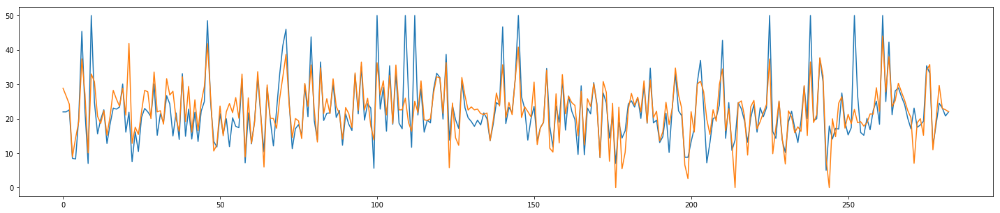

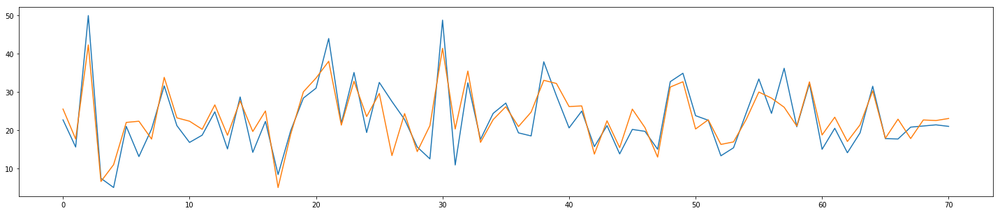

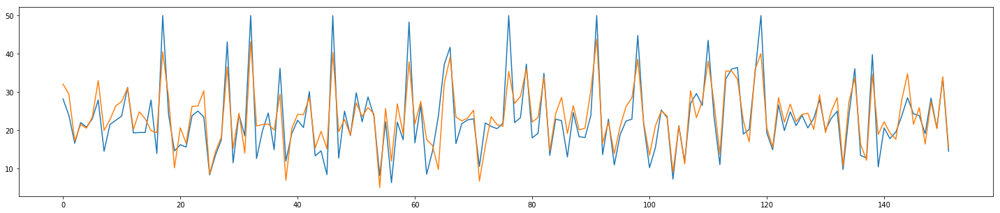

In [104]:
x = np.arange(0, len(y_train),1)
y_pred = model.predict(x_train)
plt.figure(figsize=(25, 5))
plt.plot(x, y_train, x , y_pred)

x = np.arange(0, len(y_val),1)
y_pred = model.predict(x_val)
plt.figure(figsize=(25, 5))
plt.plot(x, y_val, x , y_pred)

x = np.arange(0, len(y_test),1)
y_pred = model.predict(x_test)
plt.figure(figsize=(25, 5))
plt.plot(x, y_test, x , y_pred)

### Error of traindata = 28.8%, validation data =17.17% , testing data = 18.5%, for  LR =0.001,Epochs=5000

## Case 3

In [11]:
model = Sequential()
model.add(Dense(1, input_dim =(13)))
model.add(Activation("relu"))
optimizer = keras.optimizers.RMSprop(lr=0.0001)
model.compile(optimizer=optimizer, loss='mean_squared_error')

model.fit(x_train, y_train, batch_size=30, epochs=5000, verbose=1, validation_data=(x_val, y_val))

Train on 283 samples, validate on 71 samples
Epoch 1/5000
283/283 [==============================] - 0s 612us/step - loss: 54169.5365 - val_loss: 56529.1045
Epoch 2/5000
283/283 [==============================] - 0s 116us/step - loss: 53601.2469 - val_loss: 56031.4954
Epoch 3/5000
283/283 [==============================] - 0s 113us/step - loss: 53143.5069 - val_loss: 55575.1840
Epoch 4/5000
283/283 [==============================] - 0s 113us/step - loss: 52711.9839 - val_loss: 55128.5028
Epoch 5/5000
283/283 [==============================] - 0s 109us/step - loss: 52288.0579 - val_loss: 54689.1533
Epoch 6/5000
283/283 [==============================] - 0s 113us/step - loss: 51869.0717 - val_loss: 54249.3638
Epoch 7/5000
283/283 [==============================] - 0s 123us/step - loss: 51450.7724 - val_loss: 53818.0372
Epoch 8/5000
283/283 [==============================] - 0s 109us/step - loss: 51038.0991 - val_loss: 53382.2452
Epoch 9/5000
283/283 [==============================] - 0s 

283/283 [==============================] - 0s 92us/step - loss: 27745.6665 - val_loss: 29094.3975
Epoch 74/5000
283/283 [==============================] - 0s 88us/step - loss: 27444.5230 - val_loss: 28780.1240
Epoch 75/5000
283/283 [==============================] - 0s 88us/step - loss: 27145.9298 - val_loss: 28465.8867
Epoch 76/5000
283/283 [==============================] - 0s 81us/step - loss: 26845.9066 - val_loss: 28152.9039
Epoch 77/5000
283/283 [==============================] - 0s 88us/step - loss: 26549.1687 - val_loss: 27845.9669
Epoch 78/5000
283/283 [==============================] - 0s 92us/step - loss: 26255.4958 - val_loss: 27536.8655
Epoch 79/5000
283/283 [==============================] - 0s 88us/step - loss: 25959.6920 - val_loss: 27224.7158
Epoch 80/5000
283/283 [==============================] - 0s 85us/step - loss: 25664.8727 - val_loss: 26920.5138
Epoch 81/5000
283/283 [==============================] - 0s 85us/step - loss: 25373.9212 - val_loss: 26617.0171
Epoch 

283/283 [==============================] - 0s 81us/step - loss: 10292.2697 - val_loss: 10854.9838
Epoch 146/5000
283/283 [==============================] - 0s 92us/step - loss: 10114.8004 - val_loss: 10664.1605
Epoch 147/5000
283/283 [==============================] - 0s 85us/step - loss: 9935.5219 - val_loss: 10475.6418
Epoch 148/5000
283/283 [==============================] - 0s 77us/step - loss: 9757.8788 - val_loss: 10291.8486
Epoch 149/5000
283/283 [==============================] - 0s 85us/step - loss: 9582.6934 - val_loss: 10107.6551
Epoch 150/5000
283/283 [==============================] - 0s 88us/step - loss: 9409.1580 - val_loss: 9926.3229
Epoch 151/5000
283/283 [==============================] - 0s 88us/step - loss: 9237.4084 - val_loss: 9744.6658
Epoch 152/5000
283/283 [==============================] - 0s 85us/step - loss: 9065.8816 - val_loss: 9564.0138
Epoch 153/5000
283/283 [==============================] - 0s 85us/step - loss: 8895.0315 - val_loss: 9386.7007
Epoch 154

Epoch 219/5000
283/283 [==============================] - 0s 99us/step - loss: 1462.0179 - val_loss: 1561.1057
Epoch 220/5000
283/283 [==============================] - 0s 106us/step - loss: 1403.9262 - val_loss: 1501.9568
Epoch 221/5000
283/283 [==============================] - 0s 85us/step - loss: 1349.1348 - val_loss: 1442.3973
Epoch 222/5000
283/283 [==============================] - 0s 92us/step - loss: 1294.2419 - val_loss: 1382.5877
Epoch 223/5000
283/283 [==============================] - 0s 95us/step - loss: 1240.9199 - val_loss: 1328.4313
Epoch 224/5000
283/283 [==============================] - 0s 81us/step - loss: 1190.5893 - val_loss: 1275.2834
Epoch 225/5000
283/283 [==============================] - 0s 95us/step - loss: 1141.6558 - val_loss: 1222.7522
Epoch 226/5000
283/283 [==============================] - 0s 78us/step - loss: 1093.5655 - val_loss: 1171.7758
Epoch 227/5000
283/283 [==============================] - 0s 92us/step - loss: 1046.8111 - val_loss: 1121.4171


Epoch 294/5000
283/283 [==============================] - 0s 85us/step - loss: 255.8520 - val_loss: 281.6051
Epoch 295/5000
283/283 [==============================] - 0s 85us/step - loss: 255.5536 - val_loss: 281.0617
Epoch 296/5000
283/283 [==============================] - 0s 81us/step - loss: 255.2112 - val_loss: 280.6535
Epoch 297/5000
283/283 [==============================] - 0s 81us/step - loss: 254.7524 - val_loss: 280.0225
Epoch 298/5000
283/283 [==============================] - 0s 85us/step - loss: 254.5204 - val_loss: 279.3447
Epoch 299/5000
283/283 [==============================] - 0s 85us/step - loss: 254.0321 - val_loss: 278.8405
Epoch 300/5000
283/283 [==============================] - 0s 88us/step - loss: 253.6971 - val_loss: 278.3399
Epoch 301/5000
283/283 [==============================] - 0s 92us/step - loss: 253.3429 - val_loss: 277.9170
Epoch 302/5000
283/283 [==============================] - 0s 88us/step - loss: 252.8757 - val_loss: 277.2161
Epoch 303/5000
283/

283/283 [==============================] - 0s 123us/step - loss: 228.2866 - val_loss: 248.0306
Epoch 370/5000
283/283 [==============================] - 0s 95us/step - loss: 227.8167 - val_loss: 247.5344
Epoch 371/5000
283/283 [==============================] - 0s 102us/step - loss: 227.3845 - val_loss: 246.9037
Epoch 372/5000
283/283 [==============================] - 0s 85us/step - loss: 226.9863 - val_loss: 246.2830
Epoch 373/5000
283/283 [==============================] - 0s 95us/step - loss: 226.5019 - val_loss: 245.8255
Epoch 374/5000
283/283 [==============================] - 0s 88us/step - loss: 226.3828 - val_loss: 245.3982
Epoch 375/5000
283/283 [==============================] - 0s 92us/step - loss: 225.8007 - val_loss: 244.9249
Epoch 376/5000
283/283 [==============================] - 0s 92us/step - loss: 225.5127 - val_loss: 244.5095
Epoch 377/5000
283/283 [==============================] - 0s 88us/step - loss: 224.9464 - val_loss: 244.0993
Epoch 378/5000
283/283 [========

283/283 [==============================] - 0s 92us/step - loss: 200.4302 - val_loss: 214.9962
Epoch 445/5000
283/283 [==============================] - 0s 81us/step - loss: 200.0635 - val_loss: 214.6350
Epoch 446/5000
283/283 [==============================] - 0s 88us/step - loss: 199.7272 - val_loss: 214.3371
Epoch 447/5000
283/283 [==============================] - 0s 85us/step - loss: 199.5837 - val_loss: 214.0316
Epoch 448/5000
283/283 [==============================] - 0s 85us/step - loss: 199.1415 - val_loss: 213.6413
Epoch 449/5000
283/283 [==============================] - 0s 85us/step - loss: 198.6550 - val_loss: 213.1434
Epoch 450/5000
283/283 [==============================] - 0s 81us/step - loss: 198.3442 - val_loss: 212.6537
Epoch 451/5000
283/283 [==============================] - 0s 78us/step - loss: 198.0912 - val_loss: 212.3819
Epoch 452/5000
283/283 [==============================] - 0s 85us/step - loss: 197.6858 - val_loss: 211.7315
Epoch 453/5000
283/283 [==========

283/283 [==============================] - 0s 85us/step - loss: 176.2657 - val_loss: 185.4935
Epoch 520/5000
283/283 [==============================] - 0s 88us/step - loss: 175.9428 - val_loss: 185.1969
Epoch 521/5000
283/283 [==============================] - 0s 106us/step - loss: 175.6186 - val_loss: 184.8652
Epoch 522/5000
283/283 [==============================] - 0s 78us/step - loss: 175.2486 - val_loss: 184.4113
Epoch 523/5000
283/283 [==============================] - 0s 92us/step - loss: 175.2098 - val_loss: 184.0196
Epoch 524/5000
283/283 [==============================] - 0s 81us/step - loss: 174.6906 - val_loss: 183.6413
Epoch 525/5000
283/283 [==============================] - 0s 85us/step - loss: 174.3545 - val_loss: 183.3217
Epoch 526/5000
283/283 [==============================] - 0s 78us/step - loss: 174.2162 - val_loss: 183.0681
Epoch 527/5000
283/283 [==============================] - 0s 85us/step - loss: 173.6710 - val_loss: 182.6069
Epoch 528/5000
283/283 [=========

283/283 [==============================] - 0s 127us/step - loss: 153.7000 - val_loss: 157.9269
Epoch 595/5000
283/283 [==============================] - 0s 88us/step - loss: 153.5080 - val_loss: 157.5826
Epoch 596/5000
283/283 [==============================] - 0s 85us/step - loss: 153.2104 - val_loss: 157.2918
Epoch 597/5000
283/283 [==============================] - 0s 88us/step - loss: 152.9197 - val_loss: 156.9584
Epoch 598/5000
283/283 [==============================] - 0s 81us/step - loss: 152.5518 - val_loss: 156.6568
Epoch 599/5000
283/283 [==============================] - 0s 81us/step - loss: 152.2168 - val_loss: 156.0651
Epoch 600/5000
283/283 [==============================] - 0s 78us/step - loss: 151.8932 - val_loss: 155.5434
Epoch 601/5000
283/283 [==============================] - 0s 99us/step - loss: 151.5782 - val_loss: 155.0688
Epoch 602/5000
283/283 [==============================] - 0s 85us/step - loss: 151.4001 - val_loss: 154.8342
Epoch 603/5000
283/283 [=========

283/283 [==============================] - 0s 81us/step - loss: 133.0334 - val_loss: 132.3928
Epoch 670/5000
283/283 [==============================] - 0s 88us/step - loss: 132.6850 - val_loss: 131.9802
Epoch 671/5000
283/283 [==============================] - 0s 81us/step - loss: 132.4082 - val_loss: 131.7270
Epoch 672/5000
283/283 [==============================] - 0s 85us/step - loss: 132.2550 - val_loss: 131.5437
Epoch 673/5000
283/283 [==============================] - 0s 85us/step - loss: 131.9553 - val_loss: 131.1116
Epoch 674/5000
283/283 [==============================] - 0s 95us/step - loss: 131.7375 - val_loss: 130.8648
Epoch 675/5000
283/283 [==============================] - 0s 95us/step - loss: 131.4617 - val_loss: 130.5299
Epoch 676/5000
283/283 [==============================] - 0s 81us/step - loss: 131.4049 - val_loss: 130.2187
Epoch 677/5000
283/283 [==============================] - 0s 78us/step - loss: 131.0382 - val_loss: 129.9797
Epoch 678/5000
283/283 [==========

283/283 [==============================] - 0s 88us/step - loss: 115.5456 - val_loss: 111.1355
Epoch 745/5000
283/283 [==============================] - 0s 92us/step - loss: 115.2754 - val_loss: 110.8669
Epoch 746/5000
283/283 [==============================] - 0s 85us/step - loss: 115.2515 - val_loss: 110.6178
Epoch 747/5000
283/283 [==============================] - 0s 85us/step - loss: 114.8719 - val_loss: 110.3082
Epoch 748/5000
283/283 [==============================] - 0s 88us/step - loss: 114.6942 - val_loss: 110.1264
Epoch 749/5000
283/283 [==============================] - 0s 88us/step - loss: 114.4883 - val_loss: 109.8183
Epoch 750/5000
283/283 [==============================] - 0s 85us/step - loss: 114.2374 - val_loss: 109.6321
Epoch 751/5000
283/283 [==============================] - 0s 85us/step - loss: 114.1090 - val_loss: 109.3406
Epoch 752/5000
283/283 [==============================] - 0s 88us/step - loss: 113.7380 - val_loss: 109.1356
Epoch 753/5000
283/283 [==========

283/283 [==============================] - 0s 88us/step - loss: 100.8161 - val_loss: 93.1184
Epoch 820/5000
283/283 [==============================] - 0s 88us/step - loss: 100.6568 - val_loss: 92.9492
Epoch 821/5000
283/283 [==============================] - 0s 99us/step - loss: 100.4655 - val_loss: 92.8188
Epoch 822/5000
283/283 [==============================] - 0s 81us/step - loss: 100.4131 - val_loss: 92.6206
Epoch 823/5000
283/283 [==============================] - 0s 106us/step - loss: 100.1641 - val_loss: 92.3989
Epoch 824/5000
283/283 [==============================] - 0s 116us/step - loss: 100.0392 - val_loss: 92.3143
Epoch 825/5000
283/283 [==============================] - 0s 106us/step - loss: 99.8514 - val_loss: 91.9244
Epoch 826/5000
283/283 [==============================] - 0s 106us/step - loss: 99.5839 - val_loss: 91.7371
Epoch 827/5000
283/283 [==============================] - 0s 95us/step - loss: 99.4638 - val_loss: 91.4421
Epoch 828/5000
283/283 [==================

283/283 [==============================] - 0s 85us/step - loss: 89.1545 - val_loss: 78.6169
Epoch 896/5000
283/283 [==============================] - 0s 85us/step - loss: 89.0184 - val_loss: 78.3561
Epoch 897/5000
283/283 [==============================] - 0s 85us/step - loss: 88.8949 - val_loss: 78.3247
Epoch 898/5000
283/283 [==============================] - 0s 92us/step - loss: 88.8316 - val_loss: 78.0553
Epoch 899/5000
283/283 [==============================] - 0s 88us/step - loss: 88.6551 - val_loss: 77.8565
Epoch 900/5000
283/283 [==============================] - 0s 81us/step - loss: 88.5278 - val_loss: 77.7094
Epoch 901/5000
283/283 [==============================] - 0s 81us/step - loss: 88.3597 - val_loss: 77.6042
Epoch 902/5000
283/283 [==============================] - 0s 92us/step - loss: 88.2264 - val_loss: 77.4276
Epoch 903/5000
283/283 [==============================] - 0s 85us/step - loss: 88.0901 - val_loss: 77.1913
Epoch 904/5000
283/283 [============================

283/283 [==============================] - 0s 88us/step - loss: 80.2625 - val_loss: 67.2641
Epoch 972/5000
283/283 [==============================] - 0s 88us/step - loss: 80.1966 - val_loss: 67.1585
Epoch 973/5000
283/283 [==============================] - 0s 85us/step - loss: 80.1090 - val_loss: 66.9940
Epoch 974/5000
283/283 [==============================] - 0s 85us/step - loss: 79.9632 - val_loss: 66.8154
Epoch 975/5000
283/283 [==============================] - 0s 81us/step - loss: 79.9199 - val_loss: 66.6589
Epoch 976/5000
283/283 [==============================] - 0s 88us/step - loss: 79.7292 - val_loss: 66.5531
Epoch 977/5000
283/283 [==============================] - 0s 81us/step - loss: 79.6411 - val_loss: 66.4022
Epoch 978/5000
283/283 [==============================] - 0s 85us/step - loss: 79.6608 - val_loss: 66.3104
Epoch 979/5000
283/283 [==============================] - 0s 88us/step - loss: 79.4074 - val_loss: 66.2128
Epoch 980/5000
283/283 [============================

283/283 [==============================] - 0s 88us/step - loss: 73.5862 - val_loss: 58.6745
Epoch 1048/5000
283/283 [==============================] - 0s 78us/step - loss: 73.5873 - val_loss: 58.4319
Epoch 1049/5000
283/283 [==============================] - 0s 88us/step - loss: 73.4317 - val_loss: 58.2777
Epoch 1050/5000
283/283 [==============================] - 0s 85us/step - loss: 73.4189 - val_loss: 58.2390
Epoch 1051/5000
283/283 [==============================] - 0s 85us/step - loss: 73.3112 - val_loss: 58.1873
Epoch 1052/5000
283/283 [==============================] - 0s 85us/step - loss: 73.2605 - val_loss: 58.0701
Epoch 1053/5000
283/283 [==============================] - 0s 88us/step - loss: 73.0952 - val_loss: 57.9317
Epoch 1054/5000
283/283 [==============================] - 0s 88us/step - loss: 73.1491 - val_loss: 57.8107
Epoch 1055/5000
283/283 [==============================] - 0s 88us/step - loss: 72.9782 - val_loss: 57.7320
Epoch 1056/5000
283/283 [===================

Epoch 1123/5000
283/283 [==============================] - 0s 95us/step - loss: 68.7570 - val_loss: 52.0243
Epoch 1124/5000
283/283 [==============================] - 0s 85us/step - loss: 68.7146 - val_loss: 51.9545
Epoch 1125/5000
283/283 [==============================] - 0s 92us/step - loss: 68.6618 - val_loss: 51.8701
Epoch 1126/5000
283/283 [==============================] - 0s 99us/step - loss: 68.5290 - val_loss: 51.7967
Epoch 1127/5000
283/283 [==============================] - 0s 99us/step - loss: 68.5712 - val_loss: 51.7085
Epoch 1128/5000
283/283 [==============================] - 0s 88us/step - loss: 68.4538 - val_loss: 51.6480
Epoch 1129/5000
283/283 [==============================] - 0s 92us/step - loss: 68.4711 - val_loss: 51.5614
Epoch 1130/5000
283/283 [==============================] - 0s 88us/step - loss: 68.3265 - val_loss: 51.4867
Epoch 1131/5000
283/283 [==============================] - 0s 88us/step - loss: 68.3070 - val_loss: 51.4185
Epoch 1132/5000
283/283 [===

283/283 [==============================] - 0s 95us/step - loss: 65.2278 - val_loss: 47.2428
Epoch 1199/5000
283/283 [==============================] - 0s 88us/step - loss: 65.2233 - val_loss: 47.1765
Epoch 1200/5000
283/283 [==============================] - 0s 99us/step - loss: 65.0974 - val_loss: 47.1644
Epoch 1201/5000
283/283 [==============================] - 0s 99us/step - loss: 65.0399 - val_loss: 47.1067
Epoch 1202/5000
283/283 [==============================] - 0s 85us/step - loss: 65.0424 - val_loss: 47.0706
Epoch 1203/5000
283/283 [==============================] - 0s 95us/step - loss: 65.0335 - val_loss: 47.0220
Epoch 1204/5000
283/283 [==============================] - 0s 88us/step - loss: 64.9525 - val_loss: 46.9850
Epoch 1205/5000
283/283 [==============================] - 0s 88us/step - loss: 64.9113 - val_loss: 46.9571
Epoch 1206/5000
283/283 [==============================] - 0s 85us/step - loss: 64.8848 - val_loss: 46.9061
Epoch 1207/5000
283/283 [===================

Epoch 1274/5000
283/283 [==============================] - 0s 92us/step - loss: 62.4664 - val_loss: 44.5962
Epoch 1275/5000
283/283 [==============================] - 0s 81us/step - loss: 62.5159 - val_loss: 44.5757
Epoch 1276/5000
283/283 [==============================] - 0s 81us/step - loss: 62.4225 - val_loss: 44.5040
Epoch 1277/5000
283/283 [==============================] - 0s 81us/step - loss: 62.4549 - val_loss: 44.5411
Epoch 1278/5000
283/283 [==============================] - 0s 88us/step - loss: 62.4415 - val_loss: 44.4454
Epoch 1279/5000
283/283 [==============================] - 0s 134us/step - loss: 62.4028 - val_loss: 44.3844
Epoch 1280/5000
283/283 [==============================] - 0s 85us/step - loss: 62.3392 - val_loss: 44.3664
Epoch 1281/5000
283/283 [==============================] - 0s 99us/step - loss: 62.3173 - val_loss: 44.3771
Epoch 1282/5000
283/283 [==============================] - 0s 85us/step - loss: 62.2844 - val_loss: 44.3028
Epoch 1283/5000
283/283 [==

283/283 [==============================] - 0s 92us/step - loss: 60.6744 - val_loss: 42.3179
Epoch 1350/5000
283/283 [==============================] - 0s 92us/step - loss: 60.6194 - val_loss: 42.2610
Epoch 1351/5000
283/283 [==============================] - 0s 85us/step - loss: 60.6135 - val_loss: 42.1904
Epoch 1352/5000
283/283 [==============================] - 0s 88us/step - loss: 60.5643 - val_loss: 42.1738
Epoch 1353/5000
283/283 [==============================] - 0s 95us/step - loss: 60.5183 - val_loss: 42.1577
Epoch 1354/5000
283/283 [==============================] - 0s 81us/step - loss: 60.5788 - val_loss: 42.1402
Epoch 1355/5000
283/283 [==============================] - 0s 85us/step - loss: 60.4944 - val_loss: 42.1821
Epoch 1356/5000
283/283 [==============================] - 0s 85us/step - loss: 60.4985 - val_loss: 42.1050
Epoch 1357/5000
283/283 [==============================] - 0s 106us/step - loss: 60.5032 - val_loss: 42.0752
Epoch 1358/5000
283/283 [==================

Epoch 1425/5000
283/283 [==============================] - 0s 85us/step - loss: 59.2575 - val_loss: 40.4708
Epoch 1426/5000
283/283 [==============================] - 0s 88us/step - loss: 59.2675 - val_loss: 40.4820
Epoch 1427/5000
283/283 [==============================] - 0s 88us/step - loss: 59.2245 - val_loss: 40.4366
Epoch 1428/5000
283/283 [==============================] - 0s 85us/step - loss: 59.2220 - val_loss: 40.4192
Epoch 1429/5000
283/283 [==============================] - 0s 81us/step - loss: 59.2021 - val_loss: 40.4269
Epoch 1430/5000
283/283 [==============================] - 0s 99us/step - loss: 59.1558 - val_loss: 40.4051
Epoch 1431/5000
283/283 [==============================] - 0s 85us/step - loss: 59.0962 - val_loss: 40.3144
Epoch 1432/5000
283/283 [==============================] - 0s 85us/step - loss: 59.1862 - val_loss: 40.3054
Epoch 1433/5000
283/283 [==============================] - 0s 81us/step - loss: 59.1593 - val_loss: 40.3039
Epoch 1434/5000
283/283 [===

283/283 [==============================] - 0s 78us/step - loss: 57.7162 - val_loss: 40.7498
Epoch 1501/5000
283/283 [==============================] - 0s 88us/step - loss: 57.6526 - val_loss: 40.7293
Epoch 1502/5000
283/283 [==============================] - 0s 88us/step - loss: 57.7560 - val_loss: 40.8323
Epoch 1503/5000
283/283 [==============================] - 0s 78us/step - loss: 57.6580 - val_loss: 40.7327
Epoch 1504/5000
283/283 [==============================] - 0s 74us/step - loss: 57.7534 - val_loss: 40.6470
Epoch 1505/5000
283/283 [==============================] - 0s 78us/step - loss: 57.5862 - val_loss: 40.6161
Epoch 1506/5000
283/283 [==============================] - 0s 74us/step - loss: 57.5854 - val_loss: 40.6740
Epoch 1507/5000
283/283 [==============================] - 0s 106us/step - loss: 57.6174 - val_loss: 40.5964
Epoch 1508/5000
283/283 [==============================] - 0s 81us/step - loss: 57.5808 - val_loss: 40.6929
Epoch 1509/5000
283/283 [==================

Epoch 1576/5000
283/283 [==============================] - 0s 116us/step - loss: 56.6058 - val_loss: 40.5077
Epoch 1577/5000
283/283 [==============================] - 0s 95us/step - loss: 56.5174 - val_loss: 40.5261
Epoch 1578/5000
283/283 [==============================] - 0s 78us/step - loss: 56.4916 - val_loss: 40.4716
Epoch 1579/5000
283/283 [==============================] - 0s 99us/step - loss: 56.5547 - val_loss: 40.3378
Epoch 1580/5000
283/283 [==============================] - 0s 120us/step - loss: 56.5182 - val_loss: 40.2837
Epoch 1581/5000
283/283 [==============================] - 0s 187us/step - loss: 56.5009 - val_loss: 40.2478
Epoch 1582/5000
283/283 [==============================] - 0s 130us/step - loss: 56.5129 - val_loss: 40.3082
Epoch 1583/5000
283/283 [==============================] - 0s 113us/step - loss: 56.4990 - val_loss: 40.4357
Epoch 1584/5000
283/283 [==============================] - 0s 92us/step - loss: 56.4588 - val_loss: 40.3207
Epoch 1585/5000
283/283

283/283 [==============================] - 0s 88us/step - loss: 55.5484 - val_loss: 40.0597
Epoch 1652/5000
283/283 [==============================] - 0s 134us/step - loss: 55.5588 - val_loss: 40.2183
Epoch 1653/5000
283/283 [==============================] - 0s 169us/step - loss: 55.5719 - val_loss: 39.9669
Epoch 1654/5000
283/283 [==============================] - 0s 102us/step - loss: 55.5513 - val_loss: 39.8503
Epoch 1655/5000
283/283 [==============================] - 0s 127us/step - loss: 55.5113 - val_loss: 39.8338
Epoch 1656/5000
283/283 [==============================] - 0s 102us/step - loss: 55.5283 - val_loss: 39.9989
Epoch 1657/5000
283/283 [==============================] - 0s 120us/step - loss: 55.5998 - val_loss: 39.9857
Epoch 1658/5000
283/283 [==============================] - 0s 123us/step - loss: 55.4553 - val_loss: 39.7989
Epoch 1659/5000
283/283 [==============================] - 0s 134us/step - loss: 55.4977 - val_loss: 39.7176
Epoch 1660/5000
283/283 [===========

283/283 [==============================] - 0s 134us/step - loss: 54.7673 - val_loss: 39.0624
Epoch 1727/5000
283/283 [==============================] - ETA: 0s - loss: 53.67 - 0s 127us/step - loss: 54.7139 - val_loss: 39.0221
Epoch 1728/5000
283/283 [==============================] - 0s 95us/step - loss: 54.8113 - val_loss: 38.9444
Epoch 1729/5000
283/283 [==============================] - 0s 194us/step - loss: 54.7966 - val_loss: 38.7754
Epoch 1730/5000
283/283 [==============================] - 0s 116us/step - loss: 54.6845 - val_loss: 38.8521
Epoch 1731/5000
283/283 [==============================] - 0s 95us/step - loss: 54.6905 - val_loss: 38.7603
Epoch 1732/5000
283/283 [==============================] - 0s 113us/step - loss: 54.6880 - val_loss: 38.9187
Epoch 1733/5000
283/283 [==============================] - 0s 85us/step - loss: 54.7145 - val_loss: 38.9180
Epoch 1734/5000
283/283 [==============================] - 0s 92us/step - loss: 54.7262 - val_loss: 38.7960
Epoch 1735/5000

283/283 [==============================] - 0s 95us/step - loss: 54.0929 - val_loss: 38.1390
Epoch 1802/5000
283/283 [==============================] - 0s 88us/step - loss: 54.0962 - val_loss: 38.2979
Epoch 1803/5000
283/283 [==============================] - 0s 99us/step - loss: 54.0897 - val_loss: 38.2891
Epoch 1804/5000
283/283 [==============================] - 0s 106us/step - loss: 54.1281 - val_loss: 38.3336
Epoch 1805/5000
283/283 [==============================] - 0s 109us/step - loss: 54.1114 - val_loss: 38.1830
Epoch 1806/5000
283/283 [==============================] - 0s 99us/step - loss: 54.0748 - val_loss: 38.0942
Epoch 1807/5000
283/283 [==============================] - 0s 92us/step - loss: 54.0056 - val_loss: 38.3179
Epoch 1808/5000
283/283 [==============================] - 0s 109us/step - loss: 53.9880 - val_loss: 38.3846
Epoch 1809/5000
283/283 [==============================] - 0s 109us/step - loss: 54.0346 - val_loss: 38.5585
Epoch 1810/5000
283/283 [===============

Epoch 1877/5000
283/283 [==============================] - 0s 77us/step - loss: 53.4890 - val_loss: 37.4861
Epoch 1878/5000
283/283 [==============================] - 0s 77us/step - loss: 53.4191 - val_loss: 37.6844
Epoch 1879/5000
283/283 [==============================] - 0s 81us/step - loss: 53.4624 - val_loss: 37.8413
Epoch 1880/5000
283/283 [==============================] - 0s 106us/step - loss: 53.4389 - val_loss: 37.5021
Epoch 1881/5000
283/283 [==============================] - 0s 113us/step - loss: 53.4895 - val_loss: 37.4953
Epoch 1882/5000
283/283 [==============================] - 0s 99us/step - loss: 53.4429 - val_loss: 37.6558
Epoch 1883/5000
283/283 [==============================] - 0s 88us/step - loss: 53.4640 - val_loss: 37.5078
Epoch 1884/5000
283/283 [==============================] - 0s 81us/step - loss: 53.4539 - val_loss: 37.6505
Epoch 1885/5000
283/283 [==============================] - 0s 77us/step - loss: 53.3807 - val_loss: 37.6567
Epoch 1886/5000
283/283 [=

Epoch 1953/5000
283/283 [==============================] - 0s 74us/step - loss: 53.0178 - val_loss: 37.0294
Epoch 1954/5000
283/283 [==============================] - 0s 81us/step - loss: 52.9382 - val_loss: 36.9434
Epoch 1955/5000
283/283 [==============================] - 0s 81us/step - loss: 52.8912 - val_loss: 36.7151
Epoch 1956/5000
283/283 [==============================] - 0s 81us/step - loss: 53.0299 - val_loss: 36.7978
Epoch 1957/5000
283/283 [==============================] - 0s 88us/step - loss: 52.8766 - val_loss: 37.0434
Epoch 1958/5000
283/283 [==============================] - 0s 85us/step - loss: 52.9768 - val_loss: 36.8658
Epoch 1959/5000
283/283 [==============================] - 0s 88us/step - loss: 52.9436 - val_loss: 36.8658
Epoch 1960/5000
283/283 [==============================] - 0s 81us/step - loss: 52.9095 - val_loss: 36.9737
Epoch 1961/5000
283/283 [==============================] - 0s 92us/step - loss: 52.9037 - val_loss: 37.1688
Epoch 1962/5000
283/283 [===

Epoch 2029/5000
283/283 [==============================] - 0s 81us/step - loss: 52.4862 - val_loss: 36.3495
Epoch 2030/5000
283/283 [==============================] - 0s 78us/step - loss: 52.4457 - val_loss: 36.5859
Epoch 2031/5000
283/283 [==============================] - 0s 81us/step - loss: 52.4571 - val_loss: 36.6204
Epoch 2032/5000
283/283 [==============================] - 0s 78us/step - loss: 52.4879 - val_loss: 36.4739
Epoch 2033/5000
283/283 [==============================] - 0s 74us/step - loss: 52.4260 - val_loss: 36.8467
Epoch 2034/5000
283/283 [==============================] - 0s 81us/step - loss: 52.4990 - val_loss: 36.8431
Epoch 2035/5000
283/283 [==============================] - 0s 81us/step - loss: 52.4512 - val_loss: 36.5413
Epoch 2036/5000
283/283 [==============================] - 0s 106us/step - loss: 52.4379 - val_loss: 36.7081
Epoch 2037/5000
283/283 [==============================] - 0s 81us/step - loss: 52.4354 - val_loss: 36.6408
Epoch 2038/5000
283/283 [==

283/283 [==============================] - 0s 116us/step - loss: 52.0590 - val_loss: 35.7094
Epoch 2105/5000
283/283 [==============================] - 0s 321us/step - loss: 52.0879 - val_loss: 35.8740
Epoch 2106/5000
283/283 [==============================] - 0s 106us/step - loss: 52.0174 - val_loss: 35.8364
Epoch 2107/5000
283/283 [==============================] - 0s 120us/step - loss: 52.0629 - val_loss: 35.6917
Epoch 2108/5000
283/283 [==============================] - 0s 102us/step - loss: 52.1029 - val_loss: 35.6449
Epoch 2109/5000
283/283 [==============================] - 0s 113us/step - loss: 52.0875 - val_loss: 35.7327
Epoch 2110/5000
283/283 [==============================] - 0s 109us/step - loss: 52.0202 - val_loss: 35.7659
Epoch 2111/5000
283/283 [==============================] - 0s 106us/step - loss: 52.0549 - val_loss: 35.9554
Epoch 2112/5000
283/283 [==============================] - 0s 109us/step - loss: 51.9675 - val_loss: 36.0207
Epoch 2113/5000
283/283 [==========

283/283 [==============================] - 0s 102us/step - loss: 51.6391 - val_loss: 35.4147
Epoch 2180/5000
283/283 [==============================] - 0s 92us/step - loss: 51.7595 - val_loss: 35.5240
Epoch 2181/5000
283/283 [==============================] - 0s 102us/step - loss: 51.6322 - val_loss: 35.7051
Epoch 2182/5000
283/283 [==============================] - 0s 109us/step - loss: 51.6613 - val_loss: 35.6169
Epoch 2183/5000
283/283 [==============================] - 0s 123us/step - loss: 51.6747 - val_loss: 35.6353
Epoch 2184/5000
283/283 [==============================] - 0s 85us/step - loss: 51.6809 - val_loss: 35.5620
Epoch 2185/5000
283/283 [==============================] - 0s 85us/step - loss: 51.6855 - val_loss: 35.6789
Epoch 2186/5000
283/283 [==============================] - 0s 85us/step - loss: 51.7373 - val_loss: 35.4333
Epoch 2187/5000
283/283 [==============================] - 0s 78us/step - loss: 51.6555 - val_loss: 35.4559
Epoch 2188/5000
283/283 [===============

283/283 [==============================] - 0s 95us/step - loss: 51.3093 - val_loss: 34.9527
Epoch 2255/5000
283/283 [==============================] - 0s 95us/step - loss: 51.3088 - val_loss: 35.1669
Epoch 2256/5000
283/283 [==============================] - 0s 81us/step - loss: 51.3657 - val_loss: 35.3377
Epoch 2257/5000
283/283 [==============================] - 0s 106us/step - loss: 51.2544 - val_loss: 35.3583
Epoch 2258/5000
283/283 [==============================] - 0s 95us/step - loss: 51.3072 - val_loss: 35.0722
Epoch 2259/5000
283/283 [==============================] - 0s 92us/step - loss: 51.2457 - val_loss: 34.9931
Epoch 2260/5000
283/283 [==============================] - 0s 99us/step - loss: 51.3684 - val_loss: 35.2045
Epoch 2261/5000
283/283 [==============================] - 0s 102us/step - loss: 51.2607 - val_loss: 35.1475
Epoch 2262/5000
283/283 [==============================] - 0s 92us/step - loss: 51.3162 - val_loss: 35.0798
Epoch 2263/5000
283/283 [=================

283/283 [==============================] - 0s 85us/step - loss: 50.9913 - val_loss: 34.7961
Epoch 2330/5000
283/283 [==============================] - 0s 95us/step - loss: 50.9532 - val_loss: 34.6802
Epoch 2331/5000
283/283 [==============================] - 0s 95us/step - loss: 50.9848 - val_loss: 34.7309
Epoch 2332/5000
283/283 [==============================] - 0s 88us/step - loss: 50.9999 - val_loss: 34.8606
Epoch 2333/5000
283/283 [==============================] - 0s 88us/step - loss: 50.9792 - val_loss: 34.6561
Epoch 2334/5000
283/283 [==============================] - 0s 78us/step - loss: 50.9546 - val_loss: 34.6577
Epoch 2335/5000
283/283 [==============================] - 0s 106us/step - loss: 50.9331 - val_loss: 34.5901
Epoch 2336/5000
283/283 [==============================] - 0s 81us/step - loss: 51.0264 - val_loss: 34.5223
Epoch 2337/5000
283/283 [==============================] - 0s 88us/step - loss: 50.9196 - val_loss: 34.5105
Epoch 2338/5000
283/283 [==================

Epoch 2405/5000
283/283 [==============================] - 0s 88us/step - loss: 50.6406 - val_loss: 34.9838
Epoch 2406/5000
283/283 [==============================] - 0s 88us/step - loss: 50.6822 - val_loss: 35.1565
Epoch 2407/5000
283/283 [==============================] - 0s 92us/step - loss: 50.6604 - val_loss: 35.2771
Epoch 2408/5000
283/283 [==============================] - 0s 81us/step - loss: 50.7282 - val_loss: 34.8054
Epoch 2409/5000
283/283 [==============================] - 0s 85us/step - loss: 50.6341 - val_loss: 34.8324
Epoch 2410/5000
283/283 [==============================] - 0s 88us/step - loss: 50.6434 - val_loss: 34.9881
Epoch 2411/5000
283/283 [==============================] - 0s 311us/step - loss: 50.6067 - val_loss: 34.8083
Epoch 2412/5000
283/283 [==============================] - 0s 254us/step - loss: 50.6071 - val_loss: 34.8873
Epoch 2413/5000
283/283 [==============================] - 0s 95us/step - loss: 50.7493 - val_loss: 34.8206
Epoch 2414/5000
283/283 [=

283/283 [==============================] - 0s 88us/step - loss: 50.3480 - val_loss: 34.4036
Epoch 2481/5000
283/283 [==============================] - 0s 78us/step - loss: 50.3866 - val_loss: 34.1940
Epoch 2482/5000
283/283 [==============================] - 0s 92us/step - loss: 50.3557 - val_loss: 33.9968
Epoch 2483/5000
283/283 [==============================] - 0s 85us/step - loss: 50.4042 - val_loss: 33.9997
Epoch 2484/5000
283/283 [==============================] - 0s 102us/step - loss: 50.3186 - val_loss: 34.0545
Epoch 2485/5000
283/283 [==============================] - 0s 92us/step - loss: 50.3391 - val_loss: 34.0423
Epoch 2486/5000
283/283 [==============================] - 0s 85us/step - loss: 50.2977 - val_loss: 34.3968
Epoch 2487/5000
283/283 [==============================] - 0s 81us/step - loss: 50.3090 - val_loss: 34.4507
Epoch 2488/5000
283/283 [==============================] - 0s 88us/step - loss: 50.3220 - val_loss: 34.4327
Epoch 2489/5000
283/283 [==================

283/283 [==============================] - 0s 85us/step - loss: 50.0384 - val_loss: 33.8217
Epoch 2556/5000
283/283 [==============================] - 0s 116us/step - loss: 50.0458 - val_loss: 33.9799
Epoch 2557/5000
283/283 [==============================] - 0s 102us/step - loss: 50.0505 - val_loss: 33.9064
Epoch 2558/5000
283/283 [==============================] - 0s 115us/step - loss: 50.1315 - val_loss: 33.9148
Epoch 2559/5000
283/283 [==============================] - 0s 92us/step - loss: 50.0498 - val_loss: 33.8805
Epoch 2560/5000
283/283 [==============================] - 0s 92us/step - loss: 50.0271 - val_loss: 33.8056
Epoch 2561/5000
283/283 [==============================] - 0s 105us/step - loss: 50.0713 - val_loss: 33.7286
Epoch 2562/5000
283/283 [==============================] - 0s 109us/step - loss: 50.0690 - val_loss: 33.8199
Epoch 2563/5000
283/283 [==============================] - 0s 109us/step - loss: 50.0396 - val_loss: 33.8060
Epoch 2564/5000
283/283 [=============

283/283 [==============================] - 0s 95us/step - loss: 49.7621 - val_loss: 33.5178
Epoch 2631/5000
283/283 [==============================] - 0s 102us/step - loss: 49.7802 - val_loss: 33.4708
Epoch 2632/5000
283/283 [==============================] - 0s 285us/step - loss: 49.9339 - val_loss: 33.5246
Epoch 2633/5000
283/283 [==============================] - 0s 292us/step - loss: 49.7491 - val_loss: 33.5819
Epoch 2634/5000
283/283 [==============================] - 0s 95us/step - loss: 49.8236 - val_loss: 33.5505
Epoch 2635/5000
283/283 [==============================] - 0s 74us/step - loss: 49.7947 - val_loss: 33.6140
Epoch 2636/5000
283/283 [==============================] - 0s 106us/step - loss: 49.7417 - val_loss: 33.4758
Epoch 2637/5000
283/283 [==============================] - 0s 95us/step - loss: 49.7614 - val_loss: 33.6415
Epoch 2638/5000
283/283 [==============================] - 0s 155us/step - loss: 49.8006 - val_loss: 33.4725
Epoch 2639/5000
283/283 [==============

283/283 [==============================] - 0s 102us/step - loss: 49.5532 - val_loss: 33.1198
Epoch 2706/5000
283/283 [==============================] - 0s 93us/step - loss: 49.5389 - val_loss: 33.2807
Epoch 2707/5000
283/283 [==============================] - 0s 85us/step - loss: 49.5121 - val_loss: 33.3676
Epoch 2708/5000
283/283 [==============================] - 0s 88us/step - loss: 49.5429 - val_loss: 33.5261
Epoch 2709/5000
283/283 [==============================] - 0s 88us/step - loss: 49.4819 - val_loss: 33.3287
Epoch 2710/5000
283/283 [==============================] - 0s 102us/step - loss: 49.4693 - val_loss: 33.4133
Epoch 2711/5000
283/283 [==============================] - 0s 92us/step - loss: 49.5438 - val_loss: 33.5589
Epoch 2712/5000
283/283 [==============================] - 0s 85us/step - loss: 49.4905 - val_loss: 33.3336
Epoch 2713/5000
283/283 [==============================] - 0s 95us/step - loss: 49.5439 - val_loss: 33.1738
Epoch 2714/5000
283/283 [=================

Epoch 2781/5000
283/283 [==============================] - 0s 106us/step - loss: 49.2384 - val_loss: 32.7646
Epoch 2782/5000
283/283 [==============================] - 0s 88us/step - loss: 49.2929 - val_loss: 32.6722
Epoch 2783/5000
283/283 [==============================] - 0s 90us/step - loss: 49.2695 - val_loss: 32.6420
Epoch 2784/5000
283/283 [==============================] - 0s 81us/step - loss: 49.3096 - val_loss: 32.6026
Epoch 2785/5000
283/283 [==============================] - 0s 85us/step - loss: 49.2991 - val_loss: 32.7185
Epoch 2786/5000
283/283 [==============================] - 0s 81us/step - loss: 49.2620 - val_loss: 32.7641
Epoch 2787/5000
283/283 [==============================] - 0s 104us/step - loss: 49.2668 - val_loss: 32.7808
Epoch 2788/5000
283/283 [==============================] - 0s 74us/step - loss: 49.3278 - val_loss: 32.9527
Epoch 2789/5000
283/283 [==============================] - 0s 78us/step - loss: 49.3180 - val_loss: 32.9698
Epoch 2790/5000
283/283 [=

283/283 [==============================] - 0s 85us/step - loss: 49.0484 - val_loss: 32.9841
Epoch 2857/5000
283/283 [==============================] - 0s 95us/step - loss: 48.9777 - val_loss: 32.9312
Epoch 2858/5000
283/283 [==============================] - 0s 81us/step - loss: 49.0619 - val_loss: 32.6773
Epoch 2859/5000
283/283 [==============================] - 0s 99us/step - loss: 49.0688 - val_loss: 32.7096
Epoch 2860/5000
283/283 [==============================] - 0s 92us/step - loss: 49.0215 - val_loss: 32.7799
Epoch 2861/5000
283/283 [==============================] - 0s 92us/step - loss: 48.9550 - val_loss: 32.6076
Epoch 2862/5000
283/283 [==============================] - 0s 113us/step - loss: 48.9859 - val_loss: 32.5254
Epoch 2863/5000
283/283 [==============================] - 0s 102us/step - loss: 48.9426 - val_loss: 32.7690
Epoch 2864/5000
283/283 [==============================] - 0s 95us/step - loss: 49.0460 - val_loss: 32.9094
Epoch 2865/5000
283/283 [=================

Epoch 2932/5000
283/283 [==============================] - 0s 88us/step - loss: 48.7325 - val_loss: 32.5673
Epoch 2933/5000
283/283 [==============================] - 0s 92us/step - loss: 48.7549 - val_loss: 32.4806
Epoch 2934/5000
283/283 [==============================] - 0s 88us/step - loss: 48.7498 - val_loss: 32.4147
Epoch 2935/5000
283/283 [==============================] - 0s 95us/step - loss: 48.7968 - val_loss: 32.4042
Epoch 2936/5000
283/283 [==============================] - 0s 88us/step - loss: 48.8185 - val_loss: 32.4702
Epoch 2937/5000
283/283 [==============================] - 0s 92us/step - loss: 48.7554 - val_loss: 32.4102
Epoch 2938/5000
283/283 [==============================] - 0s 141us/step - loss: 48.7896 - val_loss: 32.5153
Epoch 2939/5000
283/283 [==============================] - 0s 106us/step - loss: 48.7496 - val_loss: 32.6151
Epoch 2940/5000
283/283 [==============================] - 0s 95us/step - loss: 48.7629 - val_loss: 32.4705
Epoch 2941/5000
283/283 [=

283/283 [==============================] - 0s 88us/step - loss: 48.5754 - val_loss: 32.2796
Epoch 3008/5000
283/283 [==============================] - 0s 226us/step - loss: 48.5146 - val_loss: 32.3753
Epoch 3009/5000
283/283 [==============================] - 0s 307us/step - loss: 48.5793 - val_loss: 32.3770
Epoch 3010/5000
283/283 [==============================] - 0s 116us/step - loss: 48.5932 - val_loss: 32.4538
Epoch 3011/5000
283/283 [==============================] - 0s 85us/step - loss: 48.5020 - val_loss: 32.5281
Epoch 3012/5000
283/283 [==============================] - 0s 85us/step - loss: 48.5576 - val_loss: 32.5794
Epoch 3013/5000
283/283 [==============================] - 0s 115us/step - loss: 48.4813 - val_loss: 32.4731
Epoch 3014/5000
283/283 [==============================] - 0s 91us/step - loss: 48.5204 - val_loss: 32.4656
Epoch 3015/5000
283/283 [==============================] - 0s 85us/step - loss: 48.4726 - val_loss: 32.4321
Epoch 3016/5000
283/283 [===============

Epoch 3083/5000
283/283 [==============================] - 0s 95us/step - loss: 48.2323 - val_loss: 32.4856
Epoch 3084/5000
283/283 [==============================] - 0s 120us/step - loss: 48.2125 - val_loss: 32.8335
Epoch 3085/5000
283/283 [==============================] - 0s 275us/step - loss: 48.1878 - val_loss: 32.8065
Epoch 3086/5000
283/283 [==============================] - 0s 222us/step - loss: 48.2129 - val_loss: 32.7787
Epoch 3087/5000
283/283 [==============================] - 0s 95us/step - loss: 48.2680 - val_loss: 32.6184
Epoch 3088/5000
283/283 [==============================] - 0s 85us/step - loss: 48.2097 - val_loss: 32.7032
Epoch 3089/5000
283/283 [==============================] - 0s 78us/step - loss: 48.2106 - val_loss: 32.7775
Epoch 3090/5000
283/283 [==============================] - 0s 81us/step - loss: 48.2446 - val_loss: 32.5365
Epoch 3091/5000
283/283 [==============================] - 0s 81us/step - loss: 48.1507 - val_loss: 32.6108
Epoch 3092/5000
283/283 [

283/283 [==============================] - 0s 95us/step - loss: 47.8424 - val_loss: 32.4518
Epoch 3159/5000
283/283 [==============================] - 0s 79us/step - loss: 47.9211 - val_loss: 32.6859
Epoch 3160/5000
283/283 [==============================] - 0s 88us/step - loss: 47.8507 - val_loss: 32.8138
Epoch 3161/5000
283/283 [==============================] - 0s 78us/step - loss: 47.8451 - val_loss: 32.7918
Epoch 3162/5000
283/283 [==============================] - 0s 88us/step - loss: 47.9171 - val_loss: 32.7117
Epoch 3163/5000
283/283 [==============================] - 0s 78us/step - loss: 47.8884 - val_loss: 32.5894
Epoch 3164/5000
283/283 [==============================] - 0s 201us/step - loss: 47.7832 - val_loss: 32.5910
Epoch 3165/5000
283/283 [==============================] - 0s 243us/step - loss: 47.8333 - val_loss: 32.7146
Epoch 3166/5000
283/283 [==============================] - 0s 205us/step - loss: 47.8066 - val_loss: 32.6873
Epoch 3167/5000
283/283 [================

Epoch 3234/5000
283/283 [==============================] - 0s 85us/step - loss: 46.9987 - val_loss: 34.8764
Epoch 3235/5000
283/283 [==============================] - 0s 88us/step - loss: 46.9381 - val_loss: 34.6522
Epoch 3236/5000
283/283 [==============================] - 0s 85us/step - loss: 46.9088 - val_loss: 34.5755
Epoch 3237/5000
283/283 [==============================] - 0s 88us/step - loss: 46.8814 - val_loss: 34.8728
Epoch 3238/5000
283/283 [==============================] - 0s 106us/step - loss: 46.9163 - val_loss: 34.8916
Epoch 3239/5000
283/283 [==============================] - 0s 88us/step - loss: 46.8617 - val_loss: 35.1179
Epoch 3240/5000
283/283 [==============================] - 0s 113us/step - loss: 46.8333 - val_loss: 34.8017
Epoch 3241/5000
283/283 [==============================] - 0s 106us/step - loss: 46.8847 - val_loss: 34.8646
Epoch 3242/5000
283/283 [==============================] - 0s 120us/step - loss: 46.8743 - val_loss: 34.8368
Epoch 3243/5000
283/283 

283/283 [==============================] - 0s 106us/step - loss: 46.1523 - val_loss: 35.1747
Epoch 3310/5000
283/283 [==============================] - 0s 99us/step - loss: 46.1479 - val_loss: 35.1400
Epoch 3311/5000
283/283 [==============================] - 0s 88us/step - loss: 46.1715 - val_loss: 35.1758
Epoch 3312/5000
283/283 [==============================] - 0s 95us/step - loss: 46.1367 - val_loss: 35.3358
Epoch 3313/5000
283/283 [==============================] - 0s 85us/step - loss: 46.2265 - val_loss: 34.9772
Epoch 3314/5000
283/283 [==============================] - 0s 88us/step - loss: 46.1108 - val_loss: 35.0885
Epoch 3315/5000
283/283 [==============================] - 0s 85us/step - loss: 46.0894 - val_loss: 34.8425
Epoch 3316/5000
283/283 [==============================] - 0s 99us/step - loss: 46.1172 - val_loss: 34.6754
Epoch 3317/5000
283/283 [==============================] - 0s 78us/step - loss: 46.1524 - val_loss: 34.9533
Epoch 3318/5000
283/283 [==================

Epoch 3385/5000
283/283 [==============================] - 0s 85us/step - loss: 45.6810 - val_loss: 34.4407
Epoch 3386/5000
283/283 [==============================] - 0s 94us/step - loss: 45.6034 - val_loss: 34.3910
Epoch 3387/5000
283/283 [==============================] - 0s 99us/step - loss: 45.6178 - val_loss: 34.3121
Epoch 3388/5000
283/283 [==============================] - 0s 85us/step - loss: 45.7398 - val_loss: 34.3724
Epoch 3389/5000
283/283 [==============================] - 0s 99us/step - loss: 45.6224 - val_loss: 34.5512
Epoch 3390/5000
283/283 [==============================] - 0s 84us/step - loss: 45.5269 - val_loss: 34.6546
Epoch 3391/5000
283/283 [==============================] - 0s 95us/step - loss: 45.5928 - val_loss: 34.2809
Epoch 3392/5000
283/283 [==============================] - 0s 78us/step - loss: 45.5427 - val_loss: 34.6934
Epoch 3393/5000
283/283 [==============================] - 0s 88us/step - loss: 45.5602 - val_loss: 34.8536
Epoch 3394/5000
283/283 [===

283/283 [==============================] - 0s 78us/step - loss: 45.1437 - val_loss: 34.3221
Epoch 3461/5000
283/283 [==============================] - 0s 88us/step - loss: 45.1365 - val_loss: 34.2536
Epoch 3462/5000
283/283 [==============================] - 0s 81us/step - loss: 45.1098 - val_loss: 34.1239
Epoch 3463/5000
283/283 [==============================] - 0s 95us/step - loss: 45.1684 - val_loss: 34.3926
Epoch 3464/5000
283/283 [==============================] - 0s 88us/step - loss: 45.0865 - val_loss: 34.1891
Epoch 3465/5000
283/283 [==============================] - 0s 99us/step - loss: 45.0838 - val_loss: 34.1245
Epoch 3466/5000
283/283 [==============================] - 0s 99us/step - loss: 45.0461 - val_loss: 33.9944
Epoch 3467/5000
283/283 [==============================] - 0s 78us/step - loss: 45.1217 - val_loss: 34.2415
Epoch 3468/5000
283/283 [==============================] - 0s 88us/step - loss: 45.0540 - val_loss: 34.4376
Epoch 3469/5000
283/283 [===================

Epoch 3536/5000
283/283 [==============================] - 0s 81us/step - loss: 44.7178 - val_loss: 33.7059
Epoch 3537/5000
283/283 [==============================] - 0s 102us/step - loss: 44.6689 - val_loss: 33.4493
Epoch 3538/5000
283/283 [==============================] - 0s 109us/step - loss: 44.6832 - val_loss: 33.7819
Epoch 3539/5000
283/283 [==============================] - 0s 83us/step - loss: 44.6074 - val_loss: 33.4257
Epoch 3540/5000
283/283 [==============================] - 0s 78us/step - loss: 44.6196 - val_loss: 33.8492
Epoch 3541/5000
283/283 [==============================] - 0s 113us/step - loss: 44.7106 - val_loss: 33.7504
Epoch 3542/5000
283/283 [==============================] - 0s 78us/step - loss: 44.7039 - val_loss: 33.5224
Epoch 3543/5000
283/283 [==============================] - 0s 74us/step - loss: 44.6649 - val_loss: 33.5282
Epoch 3544/5000
283/283 [==============================] - 0s 78us/step - loss: 44.6390 - val_loss: 33.3707
Epoch 3545/5000
283/283 [

283/283 [==============================] - 0s 78us/step - loss: 44.1547 - val_loss: 33.9996
Epoch 3612/5000
283/283 [==============================] - 0s 81us/step - loss: 44.2413 - val_loss: 33.8160
Epoch 3613/5000
283/283 [==============================] - 0s 85us/step - loss: 44.1650 - val_loss: 33.7539
Epoch 3614/5000
283/283 [==============================] - 0s 78us/step - loss: 44.1331 - val_loss: 33.8640
Epoch 3615/5000
283/283 [==============================] - 0s 85us/step - loss: 44.1824 - val_loss: 33.6923
Epoch 3616/5000
283/283 [==============================] - 0s 78us/step - loss: 44.1175 - val_loss: 33.6085
Epoch 3617/5000
283/283 [==============================] - 0s 85us/step - loss: 44.1387 - val_loss: 33.5145
Epoch 3618/5000
283/283 [==============================] - 0s 78us/step - loss: 44.2252 - val_loss: 33.6215
Epoch 3619/5000
283/283 [==============================] - 0s 81us/step - loss: 44.1031 - val_loss: 34.0839
Epoch 3620/5000
283/283 [===================

Epoch 3687/5000
283/283 [==============================] - 0s 81us/step - loss: 43.7302 - val_loss: 34.3397
Epoch 3688/5000
283/283 [==============================] - 0s 191us/step - loss: 43.6772 - val_loss: 34.0096
Epoch 3689/5000
283/283 [==============================] - 0s 246us/step - loss: 43.7144 - val_loss: 34.0249
Epoch 3690/5000
283/283 [==============================] - 0s 162us/step - loss: 43.6883 - val_loss: 34.0142
Epoch 3691/5000
283/283 [==============================] - 0s 81us/step - loss: 43.6791 - val_loss: 33.7261
Epoch 3692/5000
283/283 [==============================] - 0s 88us/step - loss: 43.6378 - val_loss: 34.2316
Epoch 3693/5000
283/283 [==============================] - 0s 78us/step - loss: 43.8506 - val_loss: 34.1757
Epoch 3694/5000
283/283 [==============================] - 0s 78us/step - loss: 43.6803 - val_loss: 34.0562
Epoch 3695/5000
283/283 [==============================] - 0s 88us/step - loss: 43.6487 - val_loss: 33.9846
Epoch 3696/5000
283/283 [

283/283 [==============================] - 0s 81us/step - loss: 43.2970 - val_loss: 33.6514
Epoch 3763/5000
283/283 [==============================] - 0s 273us/step - loss: 43.3344 - val_loss: 33.7972
Epoch 3764/5000
283/283 [==============================] - 0s 237us/step - loss: 43.2824 - val_loss: 33.6533
Epoch 3765/5000
283/283 [==============================] - 0s 94us/step - loss: 43.2606 - val_loss: 33.7775
Epoch 3766/5000
283/283 [==============================] - 0s 90us/step - loss: 43.2194 - val_loss: 33.6498
Epoch 3767/5000
283/283 [==============================] - 0s 88us/step - loss: 43.2093 - val_loss: 33.3869
Epoch 3768/5000
283/283 [==============================] - 0s 92us/step - loss: 43.2180 - val_loss: 33.3200
Epoch 3769/5000
283/283 [==============================] - 0s 109us/step - loss: 43.2964 - val_loss: 33.2147
Epoch 3770/5000
283/283 [==============================] - 0s 91us/step - loss: 43.2500 - val_loss: 33.3262
Epoch 3771/5000
283/283 [================

Epoch 3838/5000
283/283 [==============================] - 0s 85us/step - loss: 42.9009 - val_loss: 32.9496
Epoch 3839/5000
283/283 [==============================] - 0s 95us/step - loss: 42.8323 - val_loss: 32.9840
Epoch 3840/5000
283/283 [==============================] - 0s 106us/step - loss: 42.8351 - val_loss: 33.2761
Epoch 3841/5000
283/283 [==============================] - 0s 109us/step - loss: 42.8684 - val_loss: 33.2575
Epoch 3842/5000
283/283 [==============================] - 0s 102us/step - loss: 42.8384 - val_loss: 33.1025
Epoch 3843/5000
283/283 [==============================] - 0s 261us/step - loss: 42.8069 - val_loss: 32.8797
Epoch 3844/5000
283/283 [==============================] - 0s 257us/step - loss: 42.8102 - val_loss: 32.7255
Epoch 3845/5000
283/283 [==============================] - 0s 102us/step - loss: 42.7795 - val_loss: 32.6061
Epoch 3846/5000
283/283 [==============================] - 0s 95us/step - loss: 42.9178 - val_loss: 32.6991
Epoch 3847/5000
283/28

283/283 [==============================] - 0s 102us/step - loss: 42.4144 - val_loss: 33.3825
Epoch 3914/5000
283/283 [==============================] - 0s 81us/step - loss: 42.4307 - val_loss: 32.9315
Epoch 3915/5000
283/283 [==============================] - 0s 88us/step - loss: 42.3833 - val_loss: 32.8237
Epoch 3916/5000
283/283 [==============================] - 0s 85us/step - loss: 42.4324 - val_loss: 33.0805
Epoch 3917/5000
283/283 [==============================] - 0s 88us/step - loss: 42.4136 - val_loss: 33.2664
Epoch 3918/5000
283/283 [==============================] - 0s 81us/step - loss: 42.3954 - val_loss: 33.2661
Epoch 3919/5000
283/283 [==============================] - 0s 99us/step - loss: 42.3692 - val_loss: 32.8787
Epoch 3920/5000
283/283 [==============================] - 0s 88us/step - loss: 42.3634 - val_loss: 33.4182
Epoch 3921/5000
283/283 [==============================] - 0s 87us/step - loss: 42.3357 - val_loss: 32.9917
Epoch 3922/5000
283/283 [==================

Epoch 3989/5000
283/283 [==============================] - 0s 115us/step - loss: 42.0244 - val_loss: 32.7269
Epoch 3990/5000
283/283 [==============================] - 0s 113us/step - loss: 42.0142 - val_loss: 32.8404
Epoch 3991/5000
283/283 [==============================] - 0s 95us/step - loss: 42.0371 - val_loss: 32.8062
Epoch 3992/5000
283/283 [==============================] - 0s 90us/step - loss: 42.0118 - val_loss: 32.4516
Epoch 3993/5000
283/283 [==============================] - 0s 88us/step - loss: 42.0861 - val_loss: 32.4384
Epoch 3994/5000
283/283 [==============================] - 0s 116us/step - loss: 41.9777 - val_loss: 32.6167
Epoch 3995/5000
283/283 [==============================] - 0s 85us/step - loss: 42.0418 - val_loss: 32.7079
Epoch 3996/5000
283/283 [==============================] - 0s 88us/step - loss: 41.9864 - val_loss: 32.8197
Epoch 3997/5000
283/283 [==============================] - 0s 88us/step - loss: 41.9715 - val_loss: 32.8449
Epoch 3998/5000
283/283 [

283/283 [==============================] - 0s 99us/step - loss: 41.6762 - val_loss: 31.9733
Epoch 4065/5000
283/283 [==============================] - 0s 106us/step - loss: 41.7106 - val_loss: 32.1437
Epoch 4066/5000
283/283 [==============================] - 0s 85us/step - loss: 41.7041 - val_loss: 32.0760
Epoch 4067/5000
283/283 [==============================] - 0s 88us/step - loss: 41.6710 - val_loss: 32.3070
Epoch 4068/5000
283/283 [==============================] - 0s 85us/step - loss: 41.6760 - val_loss: 32.1043
Epoch 4069/5000
283/283 [==============================] - 0s 106us/step - loss: 41.6026 - val_loss: 32.2571
Epoch 4070/5000
283/283 [==============================] - 0s 99us/step - loss: 41.7182 - val_loss: 32.0854
Epoch 4071/5000
283/283 [==============================] - 0s 106us/step - loss: 41.6173 - val_loss: 32.3145
Epoch 4072/5000
283/283 [==============================] - 0s 123us/step - loss: 41.6284 - val_loss: 32.1810
Epoch 4073/5000
283/283 [===============

Epoch 4140/5000
283/283 [==============================] - 0s 95us/step - loss: 41.3834 - val_loss: 31.8611
Epoch 4141/5000
283/283 [==============================] - 0s 95us/step - loss: 41.3135 - val_loss: 31.6898
Epoch 4142/5000
283/283 [==============================] - 0s 109us/step - loss: 41.3196 - val_loss: 31.5899
Epoch 4143/5000
283/283 [==============================] - 0s 95us/step - loss: 41.3278 - val_loss: 31.9452
Epoch 4144/5000
283/283 [==============================] - 0s 95us/step - loss: 41.3346 - val_loss: 31.6741
Epoch 4145/5000
283/283 [==============================] - 0s 88us/step - loss: 41.3320 - val_loss: 31.8209
Epoch 4146/5000
283/283 [==============================] - 0s 88us/step - loss: 41.2662 - val_loss: 32.0158
Epoch 4147/5000
283/283 [==============================] - 0s 81us/step - loss: 41.2818 - val_loss: 31.7847
Epoch 4148/5000
283/283 [==============================] - 0s 102us/step - loss: 41.3148 - val_loss: 31.8039
Epoch 4149/5000
283/283 [=

Epoch 4216/5000
283/283 [==============================] - 0s 92us/step - loss: 41.1145 - val_loss: 31.4057
Epoch 4217/5000
283/283 [==============================] - 0s 109us/step - loss: 40.9961 - val_loss: 31.4991
Epoch 4218/5000
283/283 [==============================] - 0s 95us/step - loss: 41.1430 - val_loss: 31.3289
Epoch 4219/5000
283/283 [==============================] - 0s 101us/step - loss: 41.0393 - val_loss: 31.3979
Epoch 4220/5000
283/283 [==============================] - 0s 92us/step - loss: 40.9982 - val_loss: 31.1816
Epoch 4221/5000
283/283 [==============================] - 0s 78us/step - loss: 41.0202 - val_loss: 31.3203
Epoch 4222/5000
283/283 [==============================] - 0s 85us/step - loss: 40.9593 - val_loss: 31.6637
Epoch 4223/5000
283/283 [==============================] - 0s 222us/step - loss: 41.0511 - val_loss: 31.3325
Epoch 4224/5000
283/283 [==============================] - 0s 300us/step - loss: 40.9627 - val_loss: 31.5009
Epoch 4225/5000
283/283 

283/283 [==============================] - 0s 99us/step - loss: 40.7277 - val_loss: 31.0154
Epoch 4292/5000
283/283 [==============================] - 0s 95us/step - loss: 40.7344 - val_loss: 31.0281
Epoch 4293/5000
283/283 [==============================] - 0s 95us/step - loss: 40.7294 - val_loss: 31.0071
Epoch 4294/5000
283/283 [==============================] - 0s 109us/step - loss: 40.7685 - val_loss: 30.9709
Epoch 4295/5000
283/283 [==============================] - 0s 102us/step - loss: 40.7836 - val_loss: 31.0454
Epoch 4296/5000
283/283 [==============================] - 0s 95us/step - loss: 40.7233 - val_loss: 31.0697
Epoch 4297/5000
283/283 [==============================] - 0s 81us/step - loss: 40.7215 - val_loss: 31.2012
Epoch 4298/5000
283/283 [==============================] - 0s 78us/step - loss: 40.7226 - val_loss: 31.0147
Epoch 4299/5000
283/283 [==============================] - 0s 92us/step - loss: 40.6932 - val_loss: 31.1013
Epoch 4300/5000
283/283 [=================

Epoch 4367/5000
283/283 [==============================] - 0s 99us/step - loss: 40.4504 - val_loss: 31.0636
Epoch 4368/5000
283/283 [==============================] - 0s 95us/step - loss: 40.4314 - val_loss: 31.0878
Epoch 4369/5000
283/283 [==============================] - 0s 106us/step - loss: 40.4742 - val_loss: 30.8863
Epoch 4370/5000
283/283 [==============================] - 0s 92us/step - loss: 40.4115 - val_loss: 31.2307
Epoch 4371/5000
283/283 [==============================] - 0s 92us/step - loss: 40.4321 - val_loss: 31.0455
Epoch 4372/5000
283/283 [==============================] - 0s 95us/step - loss: 40.4335 - val_loss: 30.7780
Epoch 4373/5000
283/283 [==============================] - 0s 78us/step - loss: 40.4072 - val_loss: 30.9118
Epoch 4374/5000
283/283 [==============================] - 0s 88us/step - loss: 40.4807 - val_loss: 30.6929
Epoch 4375/5000
283/283 [==============================] - 0s 85us/step - loss: 40.4449 - val_loss: 30.8158
Epoch 4376/5000
283/283 [==

Epoch 4443/5000
283/283 [==============================] - 0s 90us/step - loss: 40.1897 - val_loss: 30.5288
Epoch 4444/5000
283/283 [==============================] - 0s 99us/step - loss: 40.2287 - val_loss: 30.6948
Epoch 4445/5000
283/283 [==============================] - 0s 102us/step - loss: 40.1440 - val_loss: 30.8656
Epoch 4446/5000
283/283 [==============================] - 0s 116us/step - loss: 40.2039 - val_loss: 30.7298
Epoch 4447/5000
283/283 [==============================] - 0s 98us/step - loss: 40.1142 - val_loss: 30.5416
Epoch 4448/5000
283/283 [==============================] - 0s 81us/step - loss: 40.1465 - val_loss: 30.7389
Epoch 4449/5000
283/283 [==============================] - 0s 88us/step - loss: 40.1249 - val_loss: 30.6087
Epoch 4450/5000
283/283 [==============================] - 0s 85us/step - loss: 40.1275 - val_loss: 30.6604
Epoch 4451/5000
283/283 [==============================] - 0s 99us/step - loss: 40.1102 - val_loss: 30.6690
Epoch 4452/5000
283/283 [=

Epoch 4519/5000
283/283 [==============================] - 0s 92us/step - loss: 39.9467 - val_loss: 30.2175
Epoch 4520/5000
283/283 [==============================] - 0s 88us/step - loss: 39.9327 - val_loss: 30.3584
Epoch 4521/5000
283/283 [==============================] - 0s 99us/step - loss: 39.9738 - val_loss: 30.4839
Epoch 4522/5000
283/283 [==============================] - 0s 106us/step - loss: 39.9273 - val_loss: 30.3304
Epoch 4523/5000
283/283 [==============================] - 0s 106us/step - loss: 39.9656 - val_loss: 30.2804
Epoch 4524/5000
283/283 [==============================] - 0s 102us/step - loss: 39.9719 - val_loss: 30.2871
Epoch 4525/5000
283/283 [==============================] - 0s 88us/step - loss: 39.9103 - val_loss: 30.2159
Epoch 4526/5000
283/283 [==============================] - 0s 85us/step - loss: 39.9589 - val_loss: 30.0910
Epoch 4527/5000
283/283 [==============================] - 0s 78us/step - loss: 39.8847 - val_loss: 30.1714
Epoch 4528/5000
283/283 [

Epoch 4595/5000
283/283 [==============================] - 0s 78us/step - loss: 39.7345 - val_loss: 30.1687
Epoch 4596/5000
283/283 [==============================] - 0s 81us/step - loss: 39.6836 - val_loss: 30.3123
Epoch 4597/5000
283/283 [==============================] - 0s 81us/step - loss: 39.7003 - val_loss: 30.3400
Epoch 4598/5000
283/283 [==============================] - 0s 78us/step - loss: 39.6647 - val_loss: 30.0684
Epoch 4599/5000
283/283 [==============================] - 0s 85us/step - loss: 39.6598 - val_loss: 29.9590
Epoch 4600/5000
283/283 [==============================] - 0s 81us/step - loss: 39.6393 - val_loss: 30.0433
Epoch 4601/5000
283/283 [==============================] - 0s 95us/step - loss: 39.6598 - val_loss: 30.3006
Epoch 4602/5000
283/283 [==============================] - 0s 92us/step - loss: 39.6679 - val_loss: 30.2632
Epoch 4603/5000
283/283 [==============================] - 0s 106us/step - loss: 39.6058 - val_loss: 30.5070
Epoch 4604/5000
283/283 [==

Epoch 4671/5000
283/283 [==============================] - 0s 81us/step - loss: 39.4667 - val_loss: 30.0770
Epoch 4672/5000
283/283 [==============================] - 0s 81us/step - loss: 39.4776 - val_loss: 29.9505
Epoch 4673/5000
283/283 [==============================] - 0s 78us/step - loss: 39.4053 - val_loss: 29.9618
Epoch 4674/5000
283/283 [==============================] - 0s 78us/step - loss: 39.4517 - val_loss: 30.0257
Epoch 4675/5000
283/283 [==============================] - 0s 81us/step - loss: 39.4426 - val_loss: 30.2017
Epoch 4676/5000
283/283 [==============================] - 0s 78us/step - loss: 39.4223 - val_loss: 30.3347
Epoch 4677/5000
283/283 [==============================] - 0s 88us/step - loss: 39.4561 - val_loss: 30.4480
Epoch 4678/5000
283/283 [==============================] - 0s 95us/step - loss: 39.4685 - val_loss: 30.2474
Epoch 4679/5000
283/283 [==============================] - 0s 91us/step - loss: 39.5149 - val_loss: 30.2690
Epoch 4680/5000
283/283 [===

Epoch 4747/5000
283/283 [==============================] - 0s 81us/step - loss: 39.2148 - val_loss: 29.8109
Epoch 4748/5000
283/283 [==============================] - 0s 86us/step - loss: 39.2722 - val_loss: 29.9047
Epoch 4749/5000
283/283 [==============================] - 0s 81us/step - loss: 39.1878 - val_loss: 29.7282
Epoch 4750/5000
283/283 [==============================] - 0s 85us/step - loss: 39.2744 - val_loss: 29.6073
Epoch 4751/5000
283/283 [==============================] - 0s 78us/step - loss: 39.2375 - val_loss: 29.9376
Epoch 4752/5000
283/283 [==============================] - 0s 78us/step - loss: 39.2208 - val_loss: 29.9274
Epoch 4753/5000
283/283 [==============================] - 0s 88us/step - loss: 39.1899 - val_loss: 29.5470
Epoch 4754/5000
283/283 [==============================] - 0s 81us/step - loss: 39.2251 - val_loss: 29.7476
Epoch 4755/5000
283/283 [==============================] - 0s 81us/step - loss: 39.1814 - val_loss: 29.6919
Epoch 4756/5000
283/283 [===

Epoch 4823/5000
283/283 [==============================] - 0s 88us/step - loss: 39.0018 - val_loss: 29.5460
Epoch 4824/5000
283/283 [==============================] - 0s 78us/step - loss: 39.0660 - val_loss: 29.4371
Epoch 4825/5000
283/283 [==============================] - 0s 85us/step - loss: 39.0842 - val_loss: 29.4719
Epoch 4826/5000
283/283 [==============================] - 0s 78us/step - loss: 39.0288 - val_loss: 29.4924
Epoch 4827/5000
283/283 [==============================] - 0s 81us/step - loss: 39.0015 - val_loss: 29.2936
Epoch 4828/5000
283/283 [==============================] - 0s 92us/step - loss: 39.0434 - val_loss: 29.2992
Epoch 4829/5000
283/283 [==============================] - 0s 78us/step - loss: 39.0272 - val_loss: 29.2567
Epoch 4830/5000
283/283 [==============================] - 0s 85us/step - loss: 38.9695 - val_loss: 29.4442
Epoch 4831/5000
283/283 [==============================] - 0s 85us/step - loss: 39.0219 - val_loss: 29.2371
Epoch 4832/5000
283/283 [===

283/283 [==============================] - 0s 95us/step - loss: 38.8859 - val_loss: 29.1390
Epoch 4899/5000
283/283 [==============================] - 0s 85us/step - loss: 38.9008 - val_loss: 29.1425
Epoch 4900/5000
283/283 [==============================] - 0s 81us/step - loss: 38.8458 - val_loss: 29.2184
Epoch 4901/5000
283/283 [==============================] - 0s 85us/step - loss: 38.8317 - val_loss: 29.5377
Epoch 4902/5000
283/283 [==============================] - 0s 85us/step - loss: 38.8286 - val_loss: 29.6721
Epoch 4903/5000
283/283 [==============================] - 0s 88us/step - loss: 38.8933 - val_loss: 29.6203
Epoch 4904/5000
283/283 [==============================] - 0s 81us/step - loss: 38.8538 - val_loss: 29.6152
Epoch 4905/5000
283/283 [==============================] - 0s 86us/step - loss: 38.8136 - val_loss: 29.8716
Epoch 4906/5000
283/283 [==============================] - 0s 78us/step - loss: 38.8642 - val_loss: 29.6403
Epoch 4907/5000
283/283 [===================

Epoch 4974/5000
283/283 [==============================] - 0s 91us/step - loss: 38.6317 - val_loss: 29.2935
Epoch 4975/5000
283/283 [==============================] - 0s 88us/step - loss: 38.6326 - val_loss: 29.3715
Epoch 4976/5000
283/283 [==============================] - 0s 78us/step - loss: 38.6551 - val_loss: 29.3274
Epoch 4977/5000
283/283 [==============================] - 0s 88us/step - loss: 38.6747 - val_loss: 29.3951
Epoch 4978/5000
283/283 [==============================] - 0s 78us/step - loss: 38.6950 - val_loss: 29.0849
Epoch 4979/5000
283/283 [==============================] - 0s 85us/step - loss: 38.5845 - val_loss: 29.2834
Epoch 4980/5000
283/283 [==============================] - 0s 78us/step - loss: 38.6633 - val_loss: 29.0683
Epoch 4981/5000
283/283 [==============================] - 0s 78us/step - loss: 38.6683 - val_loss: 28.9407
Epoch 4982/5000
283/283 [==============================] - 0s 81us/step - loss: 38.6737 - val_loss: 29.3017
Epoch 4983/5000
283/283 [===

In [12]:
score_train, score_valid,score_test = loss_eval(x_train, y_train, x_val, y_val,x_test,y_test, 128)
print(score_train, score_valid,score_test)

152/152 [==============================] - 0s 59us/step
38.531477466488894 28.898168563842773 37.92270329124049


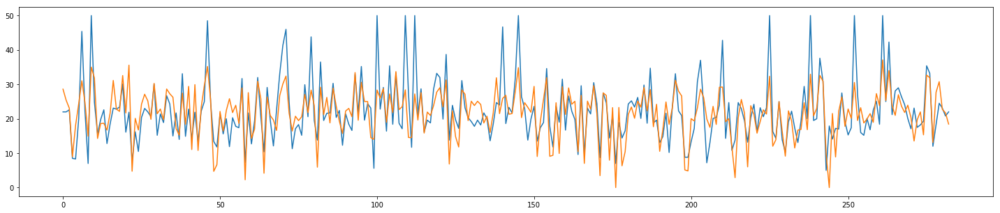

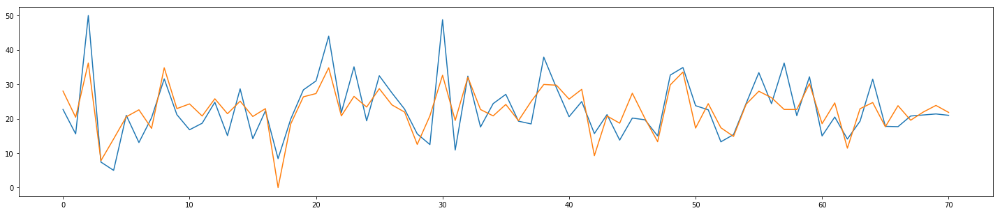

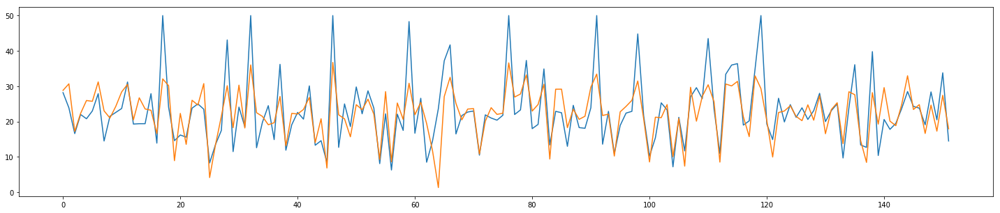

In [13]:
x = np.arange(0, len(y_train),1)
y_pred = model.predict(x_train)
plt.figure(figsize=(25, 5))
plt.plot(x, y_train, x , y_pred)

x = np.arange(0, len(y_val),1)
y_pred = model.predict(x_val)
plt.figure(figsize=(25, 5))
plt.plot(x, y_val, x , y_pred)

x = np.arange(0, len(y_test),1)
y_pred = model.predict(x_test)
plt.figure(figsize=(25, 5))
plt.plot(x, y_test, x , y_pred)

### Error of traindata = 38.5%, validation data =28.89% , testing data = 37.92%, for LR =0.001,Epochs=5000

## Case 4

In [16]:
model = Sequential()
model.add(Dense(1, input_dim =(13)))
sgd = optimizers.SGD(lr=1)
model.add(Activation("relu"))
optimizer = keras.optimizers.RMSprop(lr=0.001)
model.compile(optimizer=optimizer, loss='mean_squared_error')

model.fit(x_train, y_train, batch_size=30, epochs=20000, verbose=1, validation_data=(x_val, y_val))

Train on 283 samples, validate on 71 samples
Epoch 1/20000
283/283 [==============================] - 1s 2ms/step - loss: 1744.1604 - val_loss: 1751.3724
Epoch 2/20000
283/283 [==============================] - 0s 123us/step - loss: 1315.0446 - val_loss: 1383.4708
Epoch 3/20000
283/283 [==============================] - 0s 134us/step - loss: 1048.7056 - val_loss: 1134.9158
Epoch 4/20000
283/283 [==============================] - 0s 137us/step - loss: 868.0714 - val_loss: 931.1199
Epoch 5/20000
283/283 [==============================] - 0s 120us/step - loss: 726.5116 - val_loss: 798.6777
Epoch 6/20000
283/283 [==============================] - 0s 252us/step - loss: 636.8852 - val_loss: 694.0865
Epoch 7/20000
283/283 [==============================] - 0s 317us/step - loss: 572.0851 - val_loss: 625.9943
Epoch 8/20000
283/283 [==============================] - 0s 152us/step - loss: 527.0356 - val_loss: 566.6735
Epoch 9/20000
283/283 [==============================] - 0s 88us/step - loss: 5

283/283 [==============================] - 0s 102us/step - loss: 356.8920 - val_loss: 380.2696
Epoch 76/20000
283/283 [==============================] - 0s 99us/step - loss: 354.9209 - val_loss: 367.8745
Epoch 77/20000
283/283 [==============================] - 0s 95us/step - loss: 353.5077 - val_loss: 366.3983
Epoch 78/20000
283/283 [==============================] - 0s 106us/step - loss: 351.2374 - val_loss: 366.2617
Epoch 79/20000
283/283 [==============================] - 0s 296us/step - loss: 348.2299 - val_loss: 373.8181
Epoch 80/20000
283/283 [==============================] - 0s 285us/step - loss: 347.0974 - val_loss: 372.4412
Epoch 81/20000
283/283 [==============================] - 0s 106us/step - loss: 345.5076 - val_loss: 372.7447
Epoch 82/20000
283/283 [==============================] - 0s 113us/step - loss: 343.2671 - val_loss: 364.5045
Epoch 83/20000
283/283 [==============================] - 0s 92us/step - loss: 341.2796 - val_loss: 367.0151
Epoch 84/20000
283/283 [====

283/283 [==============================] - 0s 78us/step - loss: 249.3028 - val_loss: 259.3518
Epoch 150/20000
283/283 [==============================] - 0s 92us/step - loss: 248.2366 - val_loss: 258.0153
Epoch 151/20000
283/283 [==============================] - 0s 88us/step - loss: 247.9744 - val_loss: 258.3767
Epoch 152/20000
283/283 [==============================] - 0s 85us/step - loss: 245.8414 - val_loss: 255.9669
Epoch 153/20000
283/283 [==============================] - 0s 81us/step - loss: 244.6332 - val_loss: 255.5533
Epoch 154/20000
283/283 [==============================] - 0s 85us/step - loss: 243.2284 - val_loss: 251.2184
Epoch 155/20000
283/283 [==============================] - 0s 141us/step - loss: 241.1557 - val_loss: 252.1947
Epoch 156/20000
283/283 [==============================] - 0s 234us/step - loss: 240.7583 - val_loss: 249.9937
Epoch 157/20000
283/283 [==============================] - 0s 207us/step - loss: 239.4356 - val_loss: 247.0718
Epoch 158/20000
283/283

283/283 [==============================] - 0s 88us/step - loss: 103.4779 - val_loss: 165.3124
Epoch 224/20000
283/283 [==============================] - 0s 106us/step - loss: 101.5931 - val_loss: 166.2723
Epoch 225/20000
283/283 [==============================] - 0s 300us/step - loss: 102.0289 - val_loss: 167.1783
Epoch 226/20000
283/283 [==============================] - 0s 130us/step - loss: 100.6849 - val_loss: 162.9188
Epoch 227/20000
283/283 [==============================] - 0s 116us/step - loss: 100.8770 - val_loss: 159.1638
Epoch 228/20000
283/283 [==============================] - 0s 290us/step - loss: 100.0941 - val_loss: 161.6524
Epoch 229/20000
283/283 [==============================] - 0s 337us/step - loss: 99.0018 - val_loss: 155.9031
Epoch 230/20000
283/283 [==============================] - 0s 102us/step - loss: 98.6913 - val_loss: 156.8438
Epoch 231/20000
283/283 [==============================] - 0s 99us/step - loss: 98.8464 - val_loss: 154.1056
Epoch 232/20000
283/28

283/283 [==============================] - 0s 95us/step - loss: 73.1303 - val_loss: 97.0466
Epoch 299/20000
283/283 [==============================] - 0s 88us/step - loss: 73.9540 - val_loss: 93.2995
Epoch 300/20000
283/283 [==============================] - 0s 148us/step - loss: 73.1334 - val_loss: 91.6947
Epoch 301/20000
283/283 [==============================] - 0s 92us/step - loss: 73.2752 - val_loss: 97.8135
Epoch 302/20000
283/283 [==============================] - 0s 85us/step - loss: 71.7918 - val_loss: 89.5835
Epoch 303/20000
283/283 [==============================] - 0s 113us/step - loss: 71.8470 - val_loss: 88.7950
Epoch 304/20000
283/283 [==============================] - 0s 120us/step - loss: 72.3421 - val_loss: 92.6818
Epoch 305/20000
283/283 [==============================] - 0s 211us/step - loss: 72.6136 - val_loss: 87.4544
Epoch 306/20000
283/283 [==============================] - 0s 270us/step - loss: 71.2638 - val_loss: 91.8780
Epoch 307/20000
283/283 [==============

Epoch 374/20000
283/283 [==============================] - 0s 92us/step - loss: 60.7547 - val_loss: 54.6727
Epoch 375/20000
283/283 [==============================] - 0s 95us/step - loss: 60.1701 - val_loss: 59.4867
Epoch 376/20000
283/283 [==============================] - 0s 85us/step - loss: 60.0816 - val_loss: 53.8919
Epoch 377/20000
283/283 [==============================] - 0s 88us/step - loss: 60.3632 - val_loss: 58.4634
Epoch 378/20000
283/283 [==============================] - 0s 85us/step - loss: 60.2938 - val_loss: 62.3817
Epoch 379/20000
283/283 [==============================] - 0s 92us/step - loss: 60.7234 - val_loss: 53.0518
Epoch 380/20000
283/283 [==============================] - 0s 88us/step - loss: 60.3206 - val_loss: 58.1165
Epoch 381/20000
283/283 [==============================] - 0s 92us/step - loss: 60.3121 - val_loss: 55.7484
Epoch 382/20000
283/283 [==============================] - 0s 223us/step - loss: 59.1076 - val_loss: 59.6883
Epoch 383/20000
283/283 [==

283/283 [==============================] - 0s 85us/step - loss: 55.3460 - val_loss: 39.1278
Epoch 450/20000
283/283 [==============================] - 0s 106us/step - loss: 56.4388 - val_loss: 39.7766
Epoch 451/20000
283/283 [==============================] - 0s 106us/step - loss: 54.8421 - val_loss: 36.6463
Epoch 452/20000
283/283 [==============================] - 0s 99us/step - loss: 54.7865 - val_loss: 39.7020
Epoch 453/20000
283/283 [==============================] - 0s 85us/step - loss: 55.0812 - val_loss: 36.2645
Epoch 454/20000
283/283 [==============================] - 0s 106us/step - loss: 55.0897 - val_loss: 36.1124
Epoch 455/20000
283/283 [==============================] - 0s 95us/step - loss: 54.9256 - val_loss: 36.8333
Epoch 456/20000
283/283 [==============================] - 0s 182us/step - loss: 54.7643 - val_loss: 36.1510
Epoch 457/20000
283/283 [==============================] - 0s 287us/step - loss: 54.5937 - val_loss: 46.0152
Epoch 458/20000
283/283 [==============

Epoch 525/20000
283/283 [==============================] - 0s 85us/step - loss: 53.6552 - val_loss: 30.7404
Epoch 526/20000
283/283 [==============================] - 0s 102us/step - loss: 53.1881 - val_loss: 30.9136
Epoch 527/20000
283/283 [==============================] - 0s 88us/step - loss: 53.3301 - val_loss: 30.5905
Epoch 528/20000
283/283 [==============================] - 0s 81us/step - loss: 53.2687 - val_loss: 30.6860
Epoch 529/20000
283/283 [==============================] - 0s 120us/step - loss: 53.5362 - val_loss: 30.6050
Epoch 530/20000
283/283 [==============================] - 0s 92us/step - loss: 52.8947 - val_loss: 36.8481
Epoch 531/20000
283/283 [==============================] - 0s 106us/step - loss: 53.6194 - val_loss: 34.6475
Epoch 532/20000
283/283 [==============================] - 0s 278us/step - loss: 53.4573 - val_loss: 38.4322
Epoch 533/20000
283/283 [==============================] - 0s 247us/step - loss: 53.5031 - val_loss: 30.9403
Epoch 534/20000
283/283

283/283 [==============================] - 0s 88us/step - loss: 52.1788 - val_loss: 29.5547
Epoch 601/20000
283/283 [==============================] - 0s 99us/step - loss: 53.3116 - val_loss: 30.1015
Epoch 602/20000
283/283 [==============================] - 0s 95us/step - loss: 52.7733 - val_loss: 29.6590
Epoch 603/20000
283/283 [==============================] - 0s 120us/step - loss: 52.0061 - val_loss: 30.5704
Epoch 604/20000
283/283 [==============================] - 0s 85us/step - loss: 52.9339 - val_loss: 34.9947
Epoch 605/20000
283/283 [==============================] - 0s 92us/step - loss: 52.4214 - val_loss: 29.7379
Epoch 606/20000
283/283 [==============================] - 0s 95us/step - loss: 52.0963 - val_loss: 33.8208
Epoch 607/20000
283/283 [==============================] - 0s 99us/step - loss: 53.1235 - val_loss: 31.5292
Epoch 608/20000
283/283 [==============================] - 0s 287us/step - loss: 52.4518 - val_loss: 32.2679
Epoch 609/20000
283/283 [=================

283/283 [==============================] - 0s 85us/step - loss: 52.0938 - val_loss: 30.6791
Epoch 676/20000
283/283 [==============================] - 0s 102us/step - loss: 52.2777 - val_loss: 29.3146
Epoch 677/20000
283/283 [==============================] - 0s 81us/step - loss: 52.3563 - val_loss: 29.1127
Epoch 678/20000
283/283 [==============================] - 0s 187us/step - loss: 52.1185 - val_loss: 29.0567
Epoch 679/20000
283/283 [==============================] - 0s 328us/step - loss: 51.5581 - val_loss: 29.1877
Epoch 680/20000
283/283 [==============================] - 0s 116us/step - loss: 51.8263 - val_loss: 29.4421
Epoch 681/20000
283/283 [==============================] - 0s 88us/step - loss: 51.7012 - val_loss: 29.2477
Epoch 682/20000
283/283 [==============================] - 0s 85us/step - loss: 52.8474 - val_loss: 30.6798
Epoch 683/20000
283/283 [==============================] - 0s 92us/step - loss: 52.0569 - val_loss: 29.0810
Epoch 684/20000
283/283 [===============

Epoch 751/20000
283/283 [==============================] - 0s 99us/step - loss: 51.4866 - val_loss: 29.5831
Epoch 752/20000
283/283 [==============================] - 0s 92us/step - loss: 51.7252 - val_loss: 29.2047
Epoch 753/20000
283/283 [==============================] - 0s 88us/step - loss: 51.5035 - val_loss: 30.8239
Epoch 754/20000
283/283 [==============================] - 0s 88us/step - loss: 50.6388 - val_loss: 29.4481
Epoch 755/20000
283/283 [==============================] - 0s 88us/step - loss: 51.6699 - val_loss: 33.7872
Epoch 756/20000
283/283 [==============================] - 0s 92us/step - loss: 51.9458 - val_loss: 33.6321
Epoch 757/20000
283/283 [==============================] - 0s 258us/step - loss: 52.4292 - val_loss: 30.7172
Epoch 758/20000
283/283 [==============================] - 0s 268us/step - loss: 51.4196 - val_loss: 29.8698
Epoch 759/20000
283/283 [==============================] - 0s 81us/step - loss: 51.1459 - val_loss: 29.3396
Epoch 760/20000
283/283 [=

Epoch 827/20000
283/283 [==============================] - 0s 88us/step - loss: 50.3744 - val_loss: 30.3604
Epoch 828/20000
283/283 [==============================] - 0s 123us/step - loss: 51.3862 - val_loss: 29.8917
Epoch 829/20000
283/283 [==============================] - 0s 81us/step - loss: 50.8071 - val_loss: 29.8605
Epoch 830/20000
283/283 [==============================] - 0s 85us/step - loss: 51.0894 - val_loss: 32.2693
Epoch 831/20000
283/283 [==============================] - 0s 92us/step - loss: 51.0874 - val_loss: 29.5341
Epoch 832/20000
283/283 [==============================] - 0s 81us/step - loss: 50.8263 - val_loss: 31.1588
Epoch 833/20000
283/283 [==============================] - 0s 85us/step - loss: 51.0581 - val_loss: 29.5817
Epoch 834/20000
283/283 [==============================] - 0s 88us/step - loss: 51.4234 - val_loss: 29.1627
Epoch 835/20000
283/283 [==============================] - 0s 99us/step - loss: 51.0910 - val_loss: 29.6617
Epoch 836/20000
283/283 [==

283/283 [==============================] - 0s 85us/step - loss: 50.5786 - val_loss: 30.2023
Epoch 903/20000
283/283 [==============================] - 0s 92us/step - loss: 51.4688 - val_loss: 29.3043
Epoch 904/20000
283/283 [==============================] - 0s 81us/step - loss: 50.2985 - val_loss: 33.7942
Epoch 905/20000
283/283 [==============================] - 0s 92us/step - loss: 50.8915 - val_loss: 29.4026
Epoch 906/20000
283/283 [==============================] - 0s 88us/step - loss: 50.0426 - val_loss: 29.3876
Epoch 907/20000
283/283 [==============================] - 0s 85us/step - loss: 51.0446 - val_loss: 30.8907
Epoch 908/20000
283/283 [==============================] - 0s 88us/step - loss: 50.7520 - val_loss: 31.3658
Epoch 909/20000
283/283 [==============================] - 0s 92us/step - loss: 50.7329 - val_loss: 32.6905
Epoch 910/20000
283/283 [==============================] - 0s 92us/step - loss: 50.7130 - val_loss: 29.2892
Epoch 911/20000
283/283 [===================

Epoch 978/20000
283/283 [==============================] - 0s 88us/step - loss: 50.0794 - val_loss: 30.8608
Epoch 979/20000
283/283 [==============================] - 0s 88us/step - loss: 50.0439 - val_loss: 34.1602
Epoch 980/20000
283/283 [==============================] - 0s 97us/step - loss: 50.6900 - val_loss: 32.6179
Epoch 981/20000
283/283 [==============================] - 0s 106us/step - loss: 50.9872 - val_loss: 29.1409
Epoch 982/20000
283/283 [==============================] - 0s 92us/step - loss: 50.1723 - val_loss: 29.0345
Epoch 983/20000
283/283 [==============================] - 0s 94us/step - loss: 50.1327 - val_loss: 29.0338
Epoch 984/20000
283/283 [==============================] - 0s 85us/step - loss: 50.7624 - val_loss: 29.1882
Epoch 985/20000
283/283 [==============================] - 0s 85us/step - loss: 50.0902 - val_loss: 29.7530
Epoch 986/20000
283/283 [==============================] - 0s 88us/step - loss: 50.6943 - val_loss: 29.5898
Epoch 987/20000
283/283 [==

283/283 [==============================] - 0s 113us/step - loss: 50.1120 - val_loss: 28.6398
Epoch 1054/20000
283/283 [==============================] - 0s 102us/step - loss: 50.6950 - val_loss: 28.9943
Epoch 1055/20000
283/283 [==============================] - 0s 113us/step - loss: 49.6940 - val_loss: 28.7842
Epoch 1056/20000
283/283 [==============================] - 0s 99us/step - loss: 49.4899 - val_loss: 30.0811
Epoch 1057/20000
283/283 [==============================] - 0s 88us/step - loss: 49.9667 - val_loss: 29.4666
Epoch 1058/20000
283/283 [==============================] - 0s 95us/step - loss: 49.6973 - val_loss: 28.9214
Epoch 1059/20000
283/283 [==============================] - 0s 123us/step - loss: 50.6164 - val_loss: 29.2352
Epoch 1060/20000
283/283 [==============================] - 0s 106us/step - loss: 49.7552 - val_loss: 31.8737
Epoch 1061/20000
283/283 [==============================] - 0s 137us/step - loss: 50.3014 - val_loss: 28.7245
Epoch 1062/20000
283/283 [====

283/283 [==============================] - 0s 85us/step - loss: 49.5383 - val_loss: 28.9247
Epoch 1129/20000
283/283 [==============================] - 0s 106us/step - loss: 49.6505 - val_loss: 28.7963
Epoch 1130/20000
283/283 [==============================] - 0s 102us/step - loss: 49.7576 - val_loss: 28.7457
Epoch 1131/20000
283/283 [==============================] - 0s 85us/step - loss: 49.5820 - val_loss: 29.4929
Epoch 1132/20000
283/283 [==============================] - 0s 102us/step - loss: 49.7154 - val_loss: 31.2678
Epoch 1133/20000
283/283 [==============================] - 0s 102us/step - loss: 49.5133 - val_loss: 30.3737
Epoch 1134/20000
283/283 [==============================] - 0s 88us/step - loss: 49.9842 - val_loss: 30.1177
Epoch 1135/20000
283/283 [==============================] - 0s 85us/step - loss: 50.2897 - val_loss: 28.8473
Epoch 1136/20000
283/283 [==============================] - 0s 95us/step - loss: 50.0845 - val_loss: 28.8639
Epoch 1137/20000
283/283 [======

283/283 [==============================] - 0s 81us/step - loss: 48.9741 - val_loss: 29.1055
Epoch 1204/20000
283/283 [==============================] - 0s 88us/step - loss: 49.7901 - val_loss: 29.2848
Epoch 1205/20000
283/283 [==============================] - 0s 92us/step - loss: 49.2095 - val_loss: 29.4717
Epoch 1206/20000
283/283 [==============================] - 0s 85us/step - loss: 48.9924 - val_loss: 29.7704
Epoch 1207/20000
283/283 [==============================] - 0s 85us/step - loss: 49.6583 - val_loss: 28.8238
Epoch 1208/20000
283/283 [==============================] - 0s 85us/step - loss: 49.1056 - val_loss: 29.1036
Epoch 1209/20000
283/283 [==============================] - 0s 85us/step - loss: 49.0367 - val_loss: 35.4875
Epoch 1210/20000
283/283 [==============================] - 0s 88us/step - loss: 49.9614 - val_loss: 29.0516
Epoch 1211/20000
283/283 [==============================] - 0s 85us/step - loss: 48.7543 - val_loss: 28.8469
Epoch 1212/20000
283/283 [==========

283/283 [==============================] - 0s 88us/step - loss: 47.0128 - val_loss: 30.9636
Epoch 1279/20000
283/283 [==============================] - 0s 77us/step - loss: 47.6850 - val_loss: 34.8747
Epoch 1280/20000
283/283 [==============================] - 0s 85us/step - loss: 47.6574 - val_loss: 32.2861
Epoch 1281/20000
283/283 [==============================] - 0s 88us/step - loss: 47.0424 - val_loss: 32.9169
Epoch 1282/20000
283/283 [==============================] - 0s 92us/step - loss: 47.6030 - val_loss: 34.7290
Epoch 1283/20000
283/283 [==============================] - 0s 85us/step - loss: 47.2984 - val_loss: 31.6874
Epoch 1284/20000
283/283 [==============================] - 0s 85us/step - loss: 47.7825 - val_loss: 32.2843
Epoch 1285/20000
283/283 [==============================] - 0s 88us/step - loss: 46.8404 - val_loss: 33.0168
Epoch 1286/20000
283/283 [==============================] - 0s 95us/step - loss: 46.8223 - val_loss: 35.9023
Epoch 1287/20000
283/283 [==========

283/283 [==============================] - 0s 95us/step - loss: 44.5374 - val_loss: 38.3930
Epoch 1354/20000
283/283 [==============================] - 0s 109us/step - loss: 45.0462 - val_loss: 34.2288
Epoch 1355/20000
283/283 [==============================] - 0s 106us/step - loss: 44.9391 - val_loss: 35.9912
Epoch 1356/20000
283/283 [==============================] - 0s 92us/step - loss: 44.7884 - val_loss: 35.4457
Epoch 1357/20000
283/283 [==============================] - 0s 88us/step - loss: 44.3715 - val_loss: 34.7004
Epoch 1358/20000
283/283 [==============================] - 0s 92us/step - loss: 44.0588 - val_loss: 37.9182
Epoch 1359/20000
283/283 [==============================] - 0s 85us/step - loss: 44.1782 - val_loss: 35.9552
Epoch 1360/20000
283/283 [==============================] - 0s 106us/step - loss: 44.4133 - val_loss: 35.3358
Epoch 1361/20000
283/283 [==============================] - 0s 127us/step - loss: 43.8338 - val_loss: 33.9478
Epoch 1362/20000
283/283 [======

283/283 [==============================] - 0s 95us/step - loss: 39.8091 - val_loss: 34.0988
Epoch 1429/20000
283/283 [==============================] - 0s 95us/step - loss: 39.9188 - val_loss: 34.9047
Epoch 1430/20000
283/283 [==============================] - 0s 94us/step - loss: 40.5263 - val_loss: 32.3241
Epoch 1431/20000
283/283 [==============================] - 0s 116us/step - loss: 39.5474 - val_loss: 32.3606
Epoch 1432/20000
283/283 [==============================] - 0s 92us/step - loss: 40.3219 - val_loss: 31.5994
Epoch 1433/20000
283/283 [==============================] - 0s 95us/step - loss: 39.3539 - val_loss: 39.3336
Epoch 1434/20000
283/283 [==============================] - 0s 92us/step - loss: 39.7994 - val_loss: 37.4126
Epoch 1435/20000
283/283 [==============================] - 0s 88us/step - loss: 39.6551 - val_loss: 32.7310
Epoch 1436/20000
283/283 [==============================] - 0s 92us/step - loss: 39.8984 - val_loss: 32.6144
Epoch 1437/20000
283/283 [=========

283/283 [==============================] - 0s 85us/step - loss: 37.4610 - val_loss: 30.9106
Epoch 1504/20000
283/283 [==============================] - 0s 81us/step - loss: 37.6234 - val_loss: 33.6778
Epoch 1505/20000
283/283 [==============================] - 0s 92us/step - loss: 37.1535 - val_loss: 28.6729
Epoch 1506/20000
283/283 [==============================] - 0s 106us/step - loss: 37.0360 - val_loss: 32.4819
Epoch 1507/20000
283/283 [==============================] - 0s 85us/step - loss: 37.8934 - val_loss: 27.8426
Epoch 1508/20000
283/283 [==============================] - 0s 102us/step - loss: 37.6329 - val_loss: 29.5698
Epoch 1509/20000
283/283 [==============================] - 0s 99us/step - loss: 37.8535 - val_loss: 27.9960
Epoch 1510/20000
283/283 [==============================] - 0s 85us/step - loss: 38.1352 - val_loss: 29.1814
Epoch 1511/20000
283/283 [==============================] - 0s 88us/step - loss: 37.0021 - val_loss: 28.2958
Epoch 1512/20000
283/283 [========

283/283 [==============================] - 0s 100us/step - loss: 35.4517 - val_loss: 27.8086
Epoch 1579/20000
283/283 [==============================] - 0s 74us/step - loss: 35.9327 - val_loss: 26.5862
Epoch 1580/20000
283/283 [==============================] - 0s 78us/step - loss: 35.8672 - val_loss: 26.3647
Epoch 1581/20000
283/283 [==============================] - 0s 74us/step - loss: 35.9722 - val_loss: 28.3110
Epoch 1582/20000
283/283 [==============================] - 0s 141us/step - loss: 35.7979 - val_loss: 29.9406
Epoch 1583/20000
283/283 [==============================] - 0s 222us/step - loss: 35.4106 - val_loss: 25.9675
Epoch 1584/20000
283/283 [==============================] - 0s 356us/step - loss: 36.1252 - val_loss: 31.1248
Epoch 1585/20000
283/283 [==============================] - 0s 162us/step - loss: 35.7598 - val_loss: 32.1798
Epoch 1586/20000
283/283 [==============================] - 0s 113us/step - loss: 36.7327 - val_loss: 26.0795
Epoch 1587/20000
283/283 [====

Epoch 1653/20000
283/283 [==============================] - 0s 95us/step - loss: 34.9344 - val_loss: 25.9250
Epoch 1654/20000
283/283 [==============================] - 0s 92us/step - loss: 34.8009 - val_loss: 24.9778
Epoch 1655/20000
283/283 [==============================] - 0s 92us/step - loss: 35.4117 - val_loss: 26.6734
Epoch 1656/20000
283/283 [==============================] - 0s 88us/step - loss: 34.7349 - val_loss: 24.4452
Epoch 1657/20000
283/283 [==============================] - 0s 92us/step - loss: 35.1079 - val_loss: 27.0497
Epoch 1658/20000
283/283 [==============================] - 0s 85us/step - loss: 34.6208 - val_loss: 24.4252
Epoch 1659/20000
283/283 [==============================] - 0s 88us/step - loss: 34.9397 - val_loss: 24.6986
Epoch 1660/20000
283/283 [==============================] - 0s 99us/step - loss: 34.3998 - val_loss: 34.1151
Epoch 1661/20000
283/283 [==============================] - 0s 95us/step - loss: 35.7991 - val_loss: 25.7758
Epoch 1662/20000
28

Epoch 1728/20000
283/283 [==============================] - 0s 86us/step - loss: 34.8419 - val_loss: 23.6139
Epoch 1729/20000
283/283 [==============================] - 0s 85us/step - loss: 33.8722 - val_loss: 23.5152
Epoch 1730/20000
283/283 [==============================] - 0s 88us/step - loss: 33.6705 - val_loss: 26.3782
Epoch 1731/20000
283/283 [==============================] - 0s 85us/step - loss: 33.5025 - val_loss: 23.4790
Epoch 1732/20000
283/283 [==============================] - 0s 117us/step - loss: 34.2632 - val_loss: 23.1897
Epoch 1733/20000
283/283 [==============================] - 0s 141us/step - loss: 33.5775 - val_loss: 23.1336
Epoch 1734/20000
283/283 [==============================] - 0s 141us/step - loss: 33.6365 - val_loss: 23.4173
Epoch 1735/20000
283/283 [==============================] - 0s 113us/step - loss: 33.5109 - val_loss: 28.9463
Epoch 1736/20000
283/283 [==============================] - 0s 106us/step - loss: 34.3194 - val_loss: 24.0846
Epoch 1737/200

Epoch 1803/20000
283/283 [==============================] - 0s 99us/step - loss: 32.6416 - val_loss: 22.9913
Epoch 1804/20000
283/283 [==============================] - 0s 99us/step - loss: 33.7307 - val_loss: 22.7541
Epoch 1805/20000
283/283 [==============================] - 0s 81us/step - loss: 33.1690 - val_loss: 25.2996
Epoch 1806/20000
283/283 [==============================] - 0s 88us/step - loss: 33.0251 - val_loss: 27.2138
Epoch 1807/20000
283/283 [==============================] - 0s 99us/step - loss: 33.5079 - val_loss: 22.0708
Epoch 1808/20000
283/283 [==============================] - 0s 92us/step - loss: 33.9431 - val_loss: 24.1046
Epoch 1809/20000
283/283 [==============================] - 0s 92us/step - loss: 33.7934 - val_loss: 22.3770
Epoch 1810/20000
283/283 [==============================] - 0s 85us/step - loss: 33.3014 - val_loss: 22.4233
Epoch 1811/20000
283/283 [==============================] - 0s 109us/step - loss: 33.9308 - val_loss: 22.5063
Epoch 1812/20000
2

283/283 [==============================] - 0s 260us/step - loss: 32.9544 - val_loss: 25.7343
Epoch 1879/20000
283/283 [==============================] - 0s 243us/step - loss: 33.0749 - val_loss: 24.6461
Epoch 1880/20000
283/283 [==============================] - 0s 109us/step - loss: 33.5752 - val_loss: 21.8080
Epoch 1881/20000
283/283 [==============================] - 0s 88us/step - loss: 32.9020 - val_loss: 21.8012
Epoch 1882/20000
283/283 [==============================] - 0s 141us/step - loss: 32.3232 - val_loss: 28.5007
Epoch 1883/20000
283/283 [==============================] - 0s 148us/step - loss: 33.5365 - val_loss: 22.4956
Epoch 1884/20000
283/283 [==============================] - 0s 85us/step - loss: 33.1839 - val_loss: 21.7994
Epoch 1885/20000
283/283 [==============================] - 0s 81us/step - loss: 32.4298 - val_loss: 22.7171
Epoch 1886/20000
283/283 [==============================] - 0s 81us/step - loss: 32.6488 - val_loss: 26.1388
Epoch 1887/20000
283/283 [=====

283/283 [==============================] - 0s 95us/step - loss: 33.0355 - val_loss: 23.6941
Epoch 1954/20000
283/283 [==============================] - 0s 95us/step - loss: 32.2254 - val_loss: 21.6174
Epoch 1955/20000
283/283 [==============================] - 0s 143us/step - loss: 32.6480 - val_loss: 22.3866
Epoch 1956/20000
283/283 [==============================] - 0s 243us/step - loss: 32.3350 - val_loss: 23.8843
Epoch 1957/20000
283/283 [==============================] - 0s 183us/step - loss: 32.6597 - val_loss: 21.1792
Epoch 1958/20000
283/283 [==============================] - 0s 92us/step - loss: 32.7223 - val_loss: 21.2770
Epoch 1959/20000
283/283 [==============================] - 0s 81us/step - loss: 32.5013 - val_loss: 21.9905
Epoch 1960/20000
283/283 [==============================] - 0s 120us/step - loss: 32.1706 - val_loss: 21.3284
Epoch 1961/20000
283/283 [==============================] - 0s 88us/step - loss: 32.3627 - val_loss: 22.3585
Epoch 1962/20000
283/283 [======

283/283 [==============================] - 0s 78us/step - loss: 32.2795 - val_loss: 20.9004
Epoch 2029/20000
283/283 [==============================] - 0s 86us/step - loss: 32.0672 - val_loss: 21.1037
Epoch 2030/20000
283/283 [==============================] - 0s 81us/step - loss: 31.8754 - val_loss: 20.5921
Epoch 2031/20000
283/283 [==============================] - 0s 81us/step - loss: 32.7295 - val_loss: 20.6933
Epoch 2032/20000
283/283 [==============================] - 0s 106us/step - loss: 32.1551 - val_loss: 20.7570
Epoch 2033/20000
283/283 [==============================] - 0s 77us/step - loss: 31.7928 - val_loss: 26.1314
Epoch 2034/20000
283/283 [==============================] - 0s 109us/step - loss: 32.4431 - val_loss: 20.6079
Epoch 2035/20000
283/283 [==============================] - 0s 285us/step - loss: 32.1891 - val_loss: 22.8211
Epoch 2036/20000
283/283 [==============================] - 0s 173us/step - loss: 31.7169 - val_loss: 20.7040
Epoch 2037/20000
283/283 [======

283/283 [==============================] - 0s 81us/step - loss: 32.6740 - val_loss: 20.1777
Epoch 2104/20000
283/283 [==============================] - 0s 81us/step - loss: 32.4286 - val_loss: 22.2219
Epoch 2105/20000
283/283 [==============================] - 0s 78us/step - loss: 32.1420 - val_loss: 21.3951
Epoch 2106/20000
283/283 [==============================] - 0s 99us/step - loss: 32.2720 - val_loss: 20.2457
Epoch 2107/20000
283/283 [==============================] - 0s 102us/step - loss: 31.6025 - val_loss: 19.9987
Epoch 2108/20000
283/283 [==============================] - 0s 88us/step - loss: 32.0386 - val_loss: 20.4754
Epoch 2109/20000
283/283 [==============================] - 0s 81us/step - loss: 32.1904 - val_loss: 20.1732
Epoch 2110/20000
283/283 [==============================] - 0s 74us/step - loss: 31.7513 - val_loss: 23.3394
Epoch 2111/20000
283/283 [==============================] - 0s 78us/step - loss: 31.7111 - val_loss: 20.3623
Epoch 2112/20000
283/283 [=========

283/283 [==============================] - 0s 92us/step - loss: 31.7286 - val_loss: 20.5315
Epoch 2179/20000
283/283 [==============================] - 0s 95us/step - loss: 31.6787 - val_loss: 20.4530
Epoch 2180/20000
283/283 [==============================] - 0s 92us/step - loss: 31.2719 - val_loss: 19.7866
Epoch 2181/20000
283/283 [==============================] - 0s 92us/step - loss: 31.6339 - val_loss: 19.8655
Epoch 2182/20000
283/283 [==============================] - 0s 81us/step - loss: 31.8667 - val_loss: 20.1112
Epoch 2183/20000
283/283 [==============================] - 0s 81us/step - loss: 32.1381 - val_loss: 19.7218
Epoch 2184/20000
283/283 [==============================] - 0s 85us/step - loss: 31.3329 - val_loss: 21.5363
Epoch 2185/20000
283/283 [==============================] - 0s 88us/step - loss: 32.4673 - val_loss: 21.2076
Epoch 2186/20000
283/283 [==============================] - 0s 80us/step - loss: 31.6999 - val_loss: 21.4849
Epoch 2187/20000
283/283 [==========

283/283 [==============================] - 0s 85us/step - loss: 31.7312 - val_loss: 22.6143
Epoch 2254/20000
283/283 [==============================] - 0s 85us/step - loss: 31.2658 - val_loss: 27.0258
Epoch 2255/20000
283/283 [==============================] - 0s 81us/step - loss: 32.0964 - val_loss: 19.5508
Epoch 2256/20000
283/283 [==============================] - 0s 85us/step - loss: 31.5466 - val_loss: 21.3217
Epoch 2257/20000
283/283 [==============================] - 0s 85us/step - loss: 31.5025 - val_loss: 19.5374
Epoch 2258/20000
283/283 [==============================] - 0s 85us/step - loss: 30.6897 - val_loss: 21.6682
Epoch 2259/20000
283/283 [==============================] - 0s 85us/step - loss: 31.7230 - val_loss: 19.7849
Epoch 2260/20000
283/283 [==============================] - 0s 85us/step - loss: 31.8099 - val_loss: 19.6316
Epoch 2261/20000
283/283 [==============================] - 0s 92us/step - loss: 31.3408 - val_loss: 19.4890
Epoch 2262/20000
283/283 [==========

283/283 [==============================] - 0s 102us/step - loss: 31.6712 - val_loss: 20.6829
Epoch 2329/20000
283/283 [==============================] - 0s 92us/step - loss: 31.2322 - val_loss: 19.2193
Epoch 2330/20000
283/283 [==============================] - 0s 88us/step - loss: 31.2322 - val_loss: 21.1448
Epoch 2331/20000
283/283 [==============================] - 0s 85us/step - loss: 30.7357 - val_loss: 19.4936
Epoch 2332/20000
283/283 [==============================] - 0s 85us/step - loss: 31.3472 - val_loss: 20.1560
Epoch 2333/20000
283/283 [==============================] - 0s 102us/step - loss: 31.0004 - val_loss: 20.9674
Epoch 2334/20000
283/283 [==============================] - 0s 95us/step - loss: 31.3340 - val_loss: 19.4066
Epoch 2335/20000
283/283 [==============================] - 0s 88us/step - loss: 30.9052 - val_loss: 26.8012
Epoch 2336/20000
283/283 [==============================] - 0s 85us/step - loss: 32.1637 - val_loss: 19.2882
Epoch 2337/20000
283/283 [========

Epoch 2403/20000
283/283 [==============================] - 0s 106us/step - loss: 31.1641 - val_loss: 18.8023
Epoch 2404/20000
283/283 [==============================] - 0s 99us/step - loss: 30.9344 - val_loss: 18.6157
Epoch 2405/20000
283/283 [==============================] - 0s 83us/step - loss: 30.7044 - val_loss: 20.5213
Epoch 2406/20000
283/283 [==============================] - 0s 141us/step - loss: 31.6929 - val_loss: 20.0565
Epoch 2407/20000
283/283 [==============================] - 0s 88us/step - loss: 30.9696 - val_loss: 25.2199
Epoch 2408/20000
283/283 [==============================] - 0s 102us/step - loss: 31.5637 - val_loss: 18.9007
Epoch 2409/20000
283/283 [==============================] - 0s 102us/step - loss: 30.7012 - val_loss: 19.4536
Epoch 2410/20000
283/283 [==============================] - 0s 85us/step - loss: 30.3533 - val_loss: 19.0328
Epoch 2411/20000
283/283 [==============================] - 0s 102us/step - loss: 30.7597 - val_loss: 19.8842
Epoch 2412/200

283/283 [==============================] - 0s 102us/step - loss: 30.9280 - val_loss: 18.7553
Epoch 2478/20000
283/283 [==============================] - 0s 116us/step - loss: 30.7675 - val_loss: 18.6243
Epoch 2479/20000
283/283 [==============================] - 0s 92us/step - loss: 30.1999 - val_loss: 19.9662
Epoch 2480/20000
283/283 [==============================] - 0s 102us/step - loss: 31.2173 - val_loss: 18.9698
Epoch 2481/20000
283/283 [==============================] - 0s 95us/step - loss: 31.0343 - val_loss: 19.6368
Epoch 2482/20000
283/283 [==============================] - 0s 95us/step - loss: 30.8574 - val_loss: 18.7809
Epoch 2483/20000
283/283 [==============================] - 0s 99us/step - loss: 30.9768 - val_loss: 18.6607
Epoch 2484/20000
283/283 [==============================] - 0s 123us/step - loss: 29.9840 - val_loss: 29.1858
Epoch 2485/20000
283/283 [==============================] - 0s 113us/step - loss: 31.8195 - val_loss: 18.9133
Epoch 2486/20000
283/283 [=====

Epoch 2552/20000
283/283 [==============================] - 0s 106us/step - loss: 30.6907 - val_loss: 18.7371
Epoch 2553/20000
283/283 [==============================] - 0s 113us/step - loss: 31.0392 - val_loss: 22.9607
Epoch 2554/20000
283/283 [==============================] - 0s 159us/step - loss: 31.0256 - val_loss: 18.9204
Epoch 2555/20000
283/283 [==============================] - 0s 222us/step - loss: 30.9155 - val_loss: 18.8732
Epoch 2556/20000
283/283 [==============================] - 0s 278us/step - loss: 30.1773 - val_loss: 21.4450
Epoch 2557/20000
283/283 [==============================] - 0s 182us/step - loss: 31.3047 - val_loss: 18.7411
Epoch 2558/20000
283/283 [==============================] - 0s 99us/step - loss: 30.6106 - val_loss: 19.2862
Epoch 2559/20000
283/283 [==============================] - 0s 106us/step - loss: 31.1639 - val_loss: 20.8539
Epoch 2560/20000
283/283 [==============================] - 0s 102us/step - loss: 30.2461 - val_loss: 19.9636
Epoch 2561/

283/283 [==============================] - 0s 285us/step - loss: 31.0207 - val_loss: 18.7555
Epoch 2627/20000
283/283 [==============================] - 0s 218us/step - loss: 30.4528 - val_loss: 18.6228
Epoch 2628/20000
283/283 [==============================] - 0s 102us/step - loss: 30.3131 - val_loss: 18.4844
Epoch 2629/20000
283/283 [==============================] - 0s 101us/step - loss: 30.7390 - val_loss: 18.5470
Epoch 2630/20000
283/283 [==============================] - 0s 102us/step - loss: 30.4750 - val_loss: 18.5280
Epoch 2631/20000
283/283 [==============================] - 0s 109us/step - loss: 30.9939 - val_loss: 18.4860
Epoch 2632/20000
283/283 [==============================] - 0s 109us/step - loss: 30.0948 - val_loss: 20.3652
Epoch 2633/20000
283/283 [==============================] - 0s 106us/step - loss: 30.7613 - val_loss: 18.2798
Epoch 2634/20000
283/283 [==============================] - 0s 99us/step - loss: 30.8979 - val_loss: 17.9761
Epoch 2635/20000
283/283 [==

Epoch 2701/20000
283/283 [==============================] - 0s 113us/step - loss: 30.6851 - val_loss: 21.6688
Epoch 2702/20000
283/283 [==============================] - 0s 109us/step - loss: 31.1183 - val_loss: 18.4315
Epoch 2703/20000
283/283 [==============================] - 0s 106us/step - loss: 30.9401 - val_loss: 20.1015
Epoch 2704/20000
283/283 [==============================] - 0s 109us/step - loss: 30.0251 - val_loss: 18.3240
Epoch 2705/20000
283/283 [==============================] - 0s 102us/step - loss: 29.9028 - val_loss: 19.3800
Epoch 2706/20000
283/283 [==============================] - 0s 99us/step - loss: 30.0804 - val_loss: 22.2178
Epoch 2707/20000
283/283 [==============================] - 0s 109us/step - loss: 30.4355 - val_loss: 26.4044
Epoch 2708/20000
283/283 [==============================] - 0s 102us/step - loss: 31.0560 - val_loss: 20.3797
Epoch 2709/20000
283/283 [==============================] - 0s 102us/step - loss: 30.9856 - val_loss: 19.1632
Epoch 2710/

283/283 [==============================] - 0s 99us/step - loss: 30.2793 - val_loss: 17.9009
Epoch 2776/20000
283/283 [==============================] - 0s 148us/step - loss: 30.3486 - val_loss: 18.8627
Epoch 2777/20000
283/283 [==============================] - 0s 92us/step - loss: 30.2592 - val_loss: 17.7954
Epoch 2778/20000
283/283 [==============================] - 0s 92us/step - loss: 30.6317 - val_loss: 17.7631
Epoch 2779/20000
283/283 [==============================] - 0s 92us/step - loss: 31.0915 - val_loss: 18.1465
Epoch 2780/20000
283/283 [==============================] - 0s 88us/step - loss: 30.2888 - val_loss: 18.0629
Epoch 2781/20000
283/283 [==============================] - 0s 102us/step - loss: 30.2401 - val_loss: 19.6026
Epoch 2782/20000
283/283 [==============================] - 0s 95us/step - loss: 31.2526 - val_loss: 18.7213
Epoch 2783/20000
283/283 [==============================] - 0s 92us/step - loss: 30.7028 - val_loss: 18.5931
Epoch 2784/20000
283/283 [========

283/283 [==============================] - 0s 85us/step - loss: 30.5836 - val_loss: 20.3681
Epoch 2851/20000
283/283 [==============================] - 0s 102us/step - loss: 30.0844 - val_loss: 24.1524
Epoch 2852/20000
283/283 [==============================] - 0s 109us/step - loss: 30.9402 - val_loss: 18.9923
Epoch 2853/20000
283/283 [==============================] - 0s 102us/step - loss: 30.3474 - val_loss: 18.1400
Epoch 2854/20000
283/283 [==============================] - 0s 99us/step - loss: 30.8307 - val_loss: 20.2148
Epoch 2855/20000
283/283 [==============================] - 0s 102us/step - loss: 30.5651 - val_loss: 17.8288
Epoch 2856/20000
283/283 [==============================] - 0s 106us/step - loss: 30.0820 - val_loss: 19.0459
Epoch 2857/20000
283/283 [==============================] - 0s 102us/step - loss: 30.0542 - val_loss: 18.2733
Epoch 2858/20000
283/283 [==============================] - 0s 106us/step - loss: 30.4036 - val_loss: 18.8221
Epoch 2859/20000
283/283 [===

283/283 [==============================] - 0s 85us/step - loss: 30.0810 - val_loss: 17.8501
Epoch 2925/20000
283/283 [==============================] - 0s 111us/step - loss: 30.7773 - val_loss: 17.5901
Epoch 2926/20000
283/283 [==============================] - 0s 106us/step - loss: 30.0987 - val_loss: 17.5003
Epoch 2927/20000
283/283 [==============================] - 0s 95us/step - loss: 30.3131 - val_loss: 17.8979
Epoch 2928/20000
283/283 [==============================] - 0s 88us/step - loss: 30.5437 - val_loss: 20.9291
Epoch 2929/20000
283/283 [==============================] - 0s 99us/step - loss: 30.3258 - val_loss: 17.7069
Epoch 2930/20000
283/283 [==============================] - 0s 113us/step - loss: 29.6603 - val_loss: 17.6671
Epoch 2931/20000
283/283 [==============================] - 0s 95us/step - loss: 30.2315 - val_loss: 17.7479
Epoch 2932/20000
283/283 [==============================] - 0s 90us/step - loss: 30.3552 - val_loss: 17.7588
Epoch 2933/20000
283/283 [=======

283/283 [==============================] - 0s 92us/step - loss: 29.9242 - val_loss: 18.3436
Epoch 3000/20000
283/283 [==============================] - 0s 81us/step - loss: 30.3486 - val_loss: 17.5551
Epoch 3001/20000
283/283 [==============================] - 0s 92us/step - loss: 30.5711 - val_loss: 17.7998
Epoch 3002/20000
283/283 [==============================] - 0s 85us/step - loss: 30.1700 - val_loss: 18.6754
Epoch 3003/20000
283/283 [==============================] - 0s 85us/step - loss: 30.5637 - val_loss: 17.6862
Epoch 3004/20000
283/283 [==============================] - 0s 85us/step - loss: 30.3608 - val_loss: 17.4401
Epoch 3005/20000
283/283 [==============================] - 0s 92us/step - loss: 30.1136 - val_loss: 17.7423
Epoch 3006/20000
283/283 [==============================] - 0s 95us/step - loss: 30.7585 - val_loss: 18.3948
Epoch 3007/20000
283/283 [==============================] - 0s 88us/step - loss: 30.1758 - val_loss: 18.1441
Epoch 3008/20000
283/283 [==========

283/283 [==============================] - 0s 120us/step - loss: 30.3073 - val_loss: 17.5818
Epoch 3075/20000
283/283 [==============================] - 0s 152us/step - loss: 29.6030 - val_loss: 18.7663
Epoch 3076/20000
283/283 [==============================] - 0s 99us/step - loss: 29.9356 - val_loss: 17.6737
Epoch 3077/20000
283/283 [==============================] - 0s 88us/step - loss: 30.4910 - val_loss: 17.5667
Epoch 3078/20000
283/283 [==============================] - 0s 88us/step - loss: 30.5963 - val_loss: 17.7963
Epoch 3079/20000
283/283 [==============================] - 0s 95us/step - loss: 30.2323 - val_loss: 17.5615
Epoch 3080/20000
283/283 [==============================] - 0s 88us/step - loss: 30.4010 - val_loss: 17.5972
Epoch 3081/20000
283/283 [==============================] - 0s 102us/step - loss: 29.8928 - val_loss: 19.6878
Epoch 3082/20000
283/283 [==============================] - 0s 88us/step - loss: 30.1470 - val_loss: 17.6196
Epoch 3083/20000
283/283 [=======

283/283 [==============================] - 0s 81us/step - loss: 29.9398 - val_loss: 17.1972
Epoch 3150/20000
283/283 [==============================] - 0s 88us/step - loss: 29.9279 - val_loss: 17.4632
Epoch 3151/20000
283/283 [==============================] - 0s 85us/step - loss: 30.0944 - val_loss: 17.7375
Epoch 3152/20000
283/283 [==============================] - 0s 85us/step - loss: 29.4074 - val_loss: 17.5603
Epoch 3153/20000
283/283 [==============================] - 0s 85us/step - loss: 29.7194 - val_loss: 17.4672
Epoch 3154/20000
283/283 [==============================] - 0s 85us/step - loss: 29.7117 - val_loss: 22.8431
Epoch 3155/20000
283/283 [==============================] - 0s 85us/step - loss: 30.0014 - val_loss: 18.9619
Epoch 3156/20000
283/283 [==============================] - 0s 85us/step - loss: 31.1079 - val_loss: 17.1766
Epoch 3157/20000
283/283 [==============================] - 0s 81us/step - loss: 30.3056 - val_loss: 18.3873
Epoch 3158/20000
283/283 [==========

283/283 [==============================] - 0s 109us/step - loss: 29.9468 - val_loss: 19.7788
Epoch 3225/20000
283/283 [==============================] - 0s 102us/step - loss: 30.0732 - val_loss: 18.4560
Epoch 3226/20000
283/283 [==============================] - 0s 92us/step - loss: 29.7689 - val_loss: 18.0003
Epoch 3227/20000
283/283 [==============================] - 0s 83us/step - loss: 29.8560 - val_loss: 19.4044
Epoch 3228/20000
283/283 [==============================] - 0s 95us/step - loss: 30.4390 - val_loss: 17.4448
Epoch 3229/20000
283/283 [==============================] - 0s 85us/step - loss: 30.3609 - val_loss: 17.6044
Epoch 3230/20000
283/283 [==============================] - 0s 85us/step - loss: 30.1559 - val_loss: 17.2415
Epoch 3231/20000
283/283 [==============================] - 0s 87us/step - loss: 29.4336 - val_loss: 17.5881
Epoch 3232/20000
283/283 [==============================] - 0s 88us/step - loss: 29.1066 - val_loss: 20.0669
Epoch 3233/20000
283/283 [========

283/283 [==============================] - 0s 95us/step - loss: 29.9697 - val_loss: 18.5777
Epoch 3300/20000
283/283 [==============================] - 0s 102us/step - loss: 29.8612 - val_loss: 18.5602
Epoch 3301/20000
283/283 [==============================] - 0s 88us/step - loss: 30.0429 - val_loss: 17.1417
Epoch 3302/20000
283/283 [==============================] - 0s 81us/step - loss: 29.7373 - val_loss: 24.1739
Epoch 3303/20000
283/283 [==============================] - 0s 88us/step - loss: 29.5430 - val_loss: 17.6667
Epoch 3304/20000
283/283 [==============================] - 0s 85us/step - loss: 29.9998 - val_loss: 17.2924
Epoch 3305/20000
283/283 [==============================] - 0s 113us/step - loss: 29.2837 - val_loss: 17.5129
Epoch 3306/20000
283/283 [==============================] - 0s 123us/step - loss: 30.0613 - val_loss: 17.4231
Epoch 3307/20000
283/283 [==============================] - 0s 92us/step - loss: 29.5157 - val_loss: 26.4132
Epoch 3308/20000
283/283 [=======

283/283 [==============================] - 0s 88us/step - loss: 30.5429 - val_loss: 20.0561
Epoch 3375/20000
283/283 [==============================] - 0s 85us/step - loss: 30.2105 - val_loss: 17.4791
Epoch 3376/20000
283/283 [==============================] - 0s 120us/step - loss: 29.7207 - val_loss: 17.3958
Epoch 3377/20000
283/283 [==============================] - 0s 99us/step - loss: 30.1861 - val_loss: 17.7756
Epoch 3378/20000
283/283 [==============================] - 0s 113us/step - loss: 29.5767 - val_loss: 17.7057
Epoch 3379/20000
283/283 [==============================] - 0s 104us/step - loss: 30.0462 - val_loss: 17.0661
Epoch 3380/20000
283/283 [==============================] - 0s 99us/step - loss: 29.6738 - val_loss: 18.2057
Epoch 3381/20000
283/283 [==============================] - 0s 106us/step - loss: 30.1612 - val_loss: 22.5385
Epoch 3382/20000
283/283 [==============================] - 0s 106us/step - loss: 29.7476 - val_loss: 17.8616
Epoch 3383/20000
283/283 [=====

Epoch 3449/20000
283/283 [==============================] - 0s 85us/step - loss: 30.1704 - val_loss: 17.6883
Epoch 3450/20000
283/283 [==============================] - 0s 81us/step - loss: 29.7508 - val_loss: 17.2123
Epoch 3451/20000
283/283 [==============================] - 0s 85us/step - loss: 29.3413 - val_loss: 22.0184
Epoch 3452/20000
283/283 [==============================] - 0s 85us/step - loss: 30.7685 - val_loss: 18.0632
Epoch 3453/20000
283/283 [==============================] - 0s 85us/step - loss: 30.1653 - val_loss: 17.2465
Epoch 3454/20000
283/283 [==============================] - 0s 88us/step - loss: 29.4186 - val_loss: 18.1613
Epoch 3455/20000
283/283 [==============================] - 0s 99us/step - loss: 30.2494 - val_loss: 17.1833
Epoch 3456/20000
283/283 [==============================] - 0s 88us/step - loss: 30.0641 - val_loss: 19.3935
Epoch 3457/20000
283/283 [==============================] - 0s 85us/step - loss: 29.8931 - val_loss: 20.1646
Epoch 3458/20000
28

Epoch 3524/20000
283/283 [==============================] - 0s 94us/step - loss: 30.2211 - val_loss: 16.9536
Epoch 3525/20000
283/283 [==============================] - 0s 99us/step - loss: 29.4905 - val_loss: 17.9276
Epoch 3526/20000
283/283 [==============================] - 0s 99us/step - loss: 29.6019 - val_loss: 17.1811
Epoch 3527/20000
283/283 [==============================] - 0s 109us/step - loss: 29.4650 - val_loss: 21.3937
Epoch 3528/20000
283/283 [==============================] - 0s 102us/step - loss: 29.9764 - val_loss: 21.2044
Epoch 3529/20000
283/283 [==============================] - 0s 95us/step - loss: 29.4633 - val_loss: 17.1188
Epoch 3530/20000
283/283 [==============================] - 0s 92us/step - loss: 28.9724 - val_loss: 26.6192
Epoch 3531/20000
283/283 [==============================] - 0s 90us/step - loss: 30.3652 - val_loss: 17.2388
Epoch 3532/20000
283/283 [==============================] - 0s 88us/step - loss: 29.5367 - val_loss: 17.8333
Epoch 3533/20000


283/283 [==============================] - 0s 116us/step - loss: 29.7605 - val_loss: 17.0517
Epoch 3599/20000
283/283 [==============================] - 0s 113us/step - loss: 29.4692 - val_loss: 18.5194
Epoch 3600/20000
283/283 [==============================] - 0s 95us/step - loss: 30.4778 - val_loss: 17.1835
Epoch 3601/20000
283/283 [==============================] - 0s 130us/step - loss: 30.0781 - val_loss: 17.0294
Epoch 3602/20000
283/283 [==============================] - 0s 99us/step - loss: 29.9333 - val_loss: 17.3833
Epoch 3603/20000
283/283 [==============================] - 0s 92us/step - loss: 29.2976 - val_loss: 18.1167
Epoch 3604/20000
283/283 [==============================] - 0s 85us/step - loss: 29.4876 - val_loss: 17.5886
Epoch 3605/20000
283/283 [==============================] - 0s 95us/step - loss: 30.6752 - val_loss: 17.4516
Epoch 3606/20000
283/283 [==============================] - 0s 106us/step - loss: 29.7977 - val_loss: 17.0595
Epoch 3607/20000
283/283 [======

283/283 [==============================] - 0s 155us/step - loss: 29.1234 - val_loss: 17.4359
Epoch 3674/20000
283/283 [==============================] - 0s 106us/step - loss: 29.3851 - val_loss: 18.2999
Epoch 3675/20000
283/283 [==============================] - 0s 92us/step - loss: 29.4072 - val_loss: 26.7652
Epoch 3676/20000
283/283 [==============================] - 0s 92us/step - loss: 29.5140 - val_loss: 18.0385
Epoch 3677/20000
283/283 [==============================] - 0s 88us/step - loss: 31.1333 - val_loss: 17.4598
Epoch 3678/20000
283/283 [==============================] - 0s 88us/step - loss: 29.7499 - val_loss: 17.2351
Epoch 3679/20000
283/283 [==============================] - 0s 88us/step - loss: 29.0158 - val_loss: 16.9094
Epoch 3680/20000
283/283 [==============================] - 0s 88us/step - loss: 29.8836 - val_loss: 16.8991
Epoch 3681/20000
283/283 [==============================] - 0s 92us/step - loss: 30.3692 - val_loss: 16.9189
Epoch 3682/20000
283/283 [========

Epoch 3748/20000
283/283 [==============================] - 0s 102us/step - loss: 28.5024 - val_loss: 23.8508
Epoch 3749/20000
283/283 [==============================] - 0s 88us/step - loss: 30.7170 - val_loss: 17.6595
Epoch 3750/20000
283/283 [==============================] - 0s 88us/step - loss: 30.2006 - val_loss: 17.1514
Epoch 3751/20000
283/283 [==============================] - 0s 85us/step - loss: 29.8871 - val_loss: 17.3916
Epoch 3752/20000
283/283 [==============================] - 0s 92us/step - loss: 30.3053 - val_loss: 17.0283
Epoch 3753/20000
283/283 [==============================] - 0s 92us/step - loss: 29.3445 - val_loss: 17.9205
Epoch 3754/20000
283/283 [==============================] - 0s 99us/step - loss: 29.8434 - val_loss: 17.5221
Epoch 3755/20000
283/283 [==============================] - 0s 99us/step - loss: 29.8664 - val_loss: 20.1162
Epoch 3756/20000
283/283 [==============================] - 0s 113us/step - loss: 29.3056 - val_loss: 18.7991
Epoch 3757/20000


283/283 [==============================] - 0s 116us/step - loss: 29.2820 - val_loss: 17.8884
Epoch 3823/20000
283/283 [==============================] - 0s 123us/step - loss: 30.6751 - val_loss: 18.3949
Epoch 3824/20000
283/283 [==============================] - 0s 106us/step - loss: 28.5718 - val_loss: 17.7630
Epoch 3825/20000
283/283 [==============================] - 0s 106us/step - loss: 29.3975 - val_loss: 16.7593
Epoch 3826/20000
283/283 [==============================] - 0s 109us/step - loss: 29.2357 - val_loss: 17.9019
Epoch 3827/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1613 - val_loss: 24.0102
Epoch 3828/20000
283/283 [==============================] - 0s 116us/step - loss: 30.2416 - val_loss: 19.4435
Epoch 3829/20000
283/283 [==============================] - 0s 113us/step - loss: 30.1458 - val_loss: 16.9051
Epoch 3830/20000
283/283 [==============================] - 0s 116us/step - loss: 29.7520 - val_loss: 16.9296
Epoch 3831/20000
283/283 [=

283/283 [==============================] - 0s 99us/step - loss: 29.4026 - val_loss: 18.0744
Epoch 3897/20000
283/283 [==============================] - 0s 130us/step - loss: 30.1166 - val_loss: 17.6814
Epoch 3898/20000
283/283 [==============================] - 0s 106us/step - loss: 29.4460 - val_loss: 18.2331
Epoch 3899/20000
283/283 [==============================] - 0s 95us/step - loss: 29.3310 - val_loss: 16.8428
Epoch 3900/20000
283/283 [==============================] - 0s 101us/step - loss: 29.7018 - val_loss: 16.7950
Epoch 3901/20000
283/283 [==============================] - 0s 257us/step - loss: 29.2392 - val_loss: 17.5579
Epoch 3902/20000
283/283 [==============================] - 0s 269us/step - loss: 30.1753 - val_loss: 16.8011
Epoch 3903/20000
283/283 [==============================] - 0s 111us/step - loss: 29.1039 - val_loss: 16.7232
Epoch 3904/20000
283/283 [==============================] - 0s 95us/step - loss: 29.5250 - val_loss: 17.5398
Epoch 3905/20000
283/283 [====

Epoch 3971/20000
283/283 [==============================] - 0s 159us/step - loss: 29.3762 - val_loss: 20.4363
Epoch 3972/20000
283/283 [==============================] - 0s 289us/step - loss: 29.3612 - val_loss: 17.7143
Epoch 3973/20000
283/283 [==============================] - 0s 204us/step - loss: 29.3394 - val_loss: 20.4586
Epoch 3974/20000
283/283 [==============================] - 0s 99us/step - loss: 29.8946 - val_loss: 17.0222
Epoch 3975/20000
283/283 [==============================] - 0s 99us/step - loss: 30.2338 - val_loss: 17.2688
Epoch 3976/20000
283/283 [==============================] - 0s 99us/step - loss: 29.5231 - val_loss: 20.4400
Epoch 3977/20000
283/283 [==============================] - 0s 95us/step - loss: 29.1538 - val_loss: 16.7406
Epoch 3978/20000
283/283 [==============================] - 0s 116us/step - loss: 30.1204 - val_loss: 16.6615
Epoch 3979/20000
283/283 [==============================] - 0s 130us/step - loss: 29.3079 - val_loss: 16.6417
Epoch 3980/200

283/283 [==============================] - 0s 99us/step - loss: 29.3201 - val_loss: 16.9881
Epoch 4046/20000
283/283 [==============================] - 0s 123us/step - loss: 29.7190 - val_loss: 16.5790
Epoch 4047/20000
283/283 [==============================] - 0s 106us/step - loss: 29.7862 - val_loss: 19.2574
Epoch 4048/20000
283/283 [==============================] - 0s 106us/step - loss: 29.6423 - val_loss: 16.8659
Epoch 4049/20000
283/283 [==============================] - 0s 102us/step - loss: 29.7622 - val_loss: 16.6621
Epoch 4050/20000
283/283 [==============================] - 0s 105us/step - loss: 29.6499 - val_loss: 16.7746
Epoch 4051/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1647 - val_loss: 17.1160
Epoch 4052/20000
283/283 [==============================] - 0s 109us/step - loss: 28.6810 - val_loss: 17.4731
Epoch 4053/20000
283/283 [==============================] - 0s 109us/step - loss: 30.2030 - val_loss: 26.6659
Epoch 4054/20000
283/283 [==

Epoch 4120/20000
283/283 [==============================] - 0s 116us/step - loss: 29.8147 - val_loss: 16.9420
Epoch 4121/20000
283/283 [==============================] - 0s 102us/step - loss: 30.2000 - val_loss: 16.8107
Epoch 4122/20000
283/283 [==============================] - 0s 106us/step - loss: 29.3292 - val_loss: 17.4740
Epoch 4123/20000
283/283 [==============================] - 0s 102us/step - loss: 29.0046 - val_loss: 20.0569
Epoch 4124/20000
283/283 [==============================] - 0s 99us/step - loss: 29.6756 - val_loss: 16.7073
Epoch 4125/20000
283/283 [==============================] - 0s 102us/step - loss: 30.5712 - val_loss: 17.5962
Epoch 4126/20000
283/283 [==============================] - 0s 102us/step - loss: 29.1124 - val_loss: 20.1114
Epoch 4127/20000
283/283 [==============================] - 0s 95us/step - loss: 29.5900 - val_loss: 17.9656
Epoch 4128/20000
283/283 [==============================] - 0s 95us/step - loss: 29.8626 - val_loss: 16.6597
Epoch 4129/20

283/283 [==============================] - 0s 199us/step - loss: 29.2368 - val_loss: 17.8281
Epoch 4195/20000
283/283 [==============================] - 0s 173us/step - loss: 29.4526 - val_loss: 17.5384
Epoch 4196/20000
283/283 [==============================] - 0s 196us/step - loss: 30.1098 - val_loss: 16.6447
Epoch 4197/20000
283/283 [==============================] - 0s 162us/step - loss: 29.4248 - val_loss: 16.8726
Epoch 4198/20000
283/283 [==============================] - 0s 162us/step - loss: 29.4703 - val_loss: 17.5625
Epoch 4199/20000
283/283 [==============================] - 0s 148us/step - loss: 30.1138 - val_loss: 18.2580
Epoch 4200/20000
283/283 [==============================] - 0s 155us/step - loss: 29.7006 - val_loss: 16.7380
Epoch 4201/20000
283/283 [==============================] - 0s 102us/step - loss: 29.3736 - val_loss: 17.3394
Epoch 4202/20000
283/283 [==============================] - 0s 106us/step - loss: 29.3772 - val_loss: 21.4993
Epoch 4203/20000
283/283 [=

Epoch 4269/20000
283/283 [==============================] - 0s 95us/step - loss: 29.7170 - val_loss: 16.5390
Epoch 4270/20000
283/283 [==============================] - 0s 109us/step - loss: 29.1490 - val_loss: 16.5637
Epoch 4271/20000
283/283 [==============================] - 0s 115us/step - loss: 29.8313 - val_loss: 18.4367
Epoch 4272/20000
283/283 [==============================] - 0s 131us/step - loss: 29.7040 - val_loss: 16.6591
Epoch 4273/20000
283/283 [==============================] - 0s 123us/step - loss: 29.0855 - val_loss: 17.3179
Epoch 4274/20000
283/283 [==============================] - 0s 109us/step - loss: 29.6523 - val_loss: 17.9509
Epoch 4275/20000
283/283 [==============================] - 0s 88us/step - loss: 29.6097 - val_loss: 17.8537
Epoch 4276/20000
283/283 [==============================] - 0s 95us/step - loss: 29.3651 - val_loss: 16.6477
Epoch 4277/20000
283/283 [==============================] - 0s 90us/step - loss: 30.2356 - val_loss: 17.4086
Epoch 4278/200

Epoch 4344/20000
283/283 [==============================] - 0s 99us/step - loss: 29.4428 - val_loss: 17.5764
Epoch 4345/20000
283/283 [==============================] - 0s 95us/step - loss: 30.3574 - val_loss: 16.6222
Epoch 4346/20000
283/283 [==============================] - 0s 95us/step - loss: 29.4071 - val_loss: 16.9380
Epoch 4347/20000
283/283 [==============================] - 0s 141us/step - loss: 29.1311 - val_loss: 17.5351
Epoch 4348/20000
283/283 [==============================] - 0s 92us/step - loss: 29.1360 - val_loss: 22.7902
Epoch 4349/20000
283/283 [==============================] - 0s 92us/step - loss: 29.1966 - val_loss: 17.9694
Epoch 4350/20000
283/283 [==============================] - 0s 99us/step - loss: 29.3370 - val_loss: 16.6570
Epoch 4351/20000
283/283 [==============================] - 0s 95us/step - loss: 29.6261 - val_loss: 17.2554
Epoch 4352/20000
283/283 [==============================] - 0s 88us/step - loss: 29.2983 - val_loss: 16.6876
Epoch 4353/20000
2

Epoch 4419/20000
283/283 [==============================] - 0s 137us/step - loss: 29.6808 - val_loss: 17.4238
Epoch 4420/20000
283/283 [==============================] - 0s 109us/step - loss: 29.6771 - val_loss: 19.4381
Epoch 4421/20000
283/283 [==============================] - 0s 102us/step - loss: 29.8795 - val_loss: 18.0040
Epoch 4422/20000
283/283 [==============================] - 0s 99us/step - loss: 29.7593 - val_loss: 17.6784
Epoch 4423/20000
283/283 [==============================] - 0s 95us/step - loss: 29.9879 - val_loss: 16.7016
Epoch 4424/20000
283/283 [==============================] - 0s 116us/step - loss: 29.4569 - val_loss: 17.1237
Epoch 4425/20000
283/283 [==============================] - 0s 247us/step - loss: 29.5290 - val_loss: 17.1205
Epoch 4426/20000
283/283 [==============================] - 0s 235us/step - loss: 29.2180 - val_loss: 17.0755
Epoch 4427/20000
283/283 [==============================] - 0s 127us/step - loss: 29.4799 - val_loss: 16.4848
Epoch 4428/2

Epoch 4494/20000
283/283 [==============================] - 0s 106us/step - loss: 29.5504 - val_loss: 16.6582
Epoch 4495/20000
283/283 [==============================] - 0s 114us/step - loss: 29.5537 - val_loss: 16.7095
Epoch 4496/20000
283/283 [==============================] - 0s 263us/step - loss: 29.5855 - val_loss: 16.6249
Epoch 4497/20000
283/283 [==============================] - 0s 218us/step - loss: 29.6738 - val_loss: 17.4835
Epoch 4498/20000
283/283 [==============================] - 0s 139us/step - loss: 29.7765 - val_loss: 16.6359
Epoch 4499/20000
283/283 [==============================] - 0s 92us/step - loss: 29.2458 - val_loss: 17.3690
Epoch 4500/20000
283/283 [==============================] - 0s 92us/step - loss: 29.9518 - val_loss: 16.6644
Epoch 4501/20000
283/283 [==============================] - 0s 92us/step - loss: 29.0293 - val_loss: 16.9447
Epoch 4502/20000
283/283 [==============================] - 0s 85us/step - loss: 29.8818 - val_loss: 18.0167
Epoch 4503/200

Epoch 4569/20000
283/283 [==============================] - 0s 264us/step - loss: 29.5565 - val_loss: 16.8334
Epoch 4570/20000
283/283 [==============================] - 0s 307us/step - loss: 29.7140 - val_loss: 16.9147
Epoch 4571/20000
283/283 [==============================] - 0s 109us/step - loss: 30.1396 - val_loss: 16.7725
Epoch 4572/20000
283/283 [==============================] - 0s 95us/step - loss: 29.4093 - val_loss: 17.4275
Epoch 4573/20000
283/283 [==============================] - 0s 92us/step - loss: 29.6525 - val_loss: 16.8793
Epoch 4574/20000
283/283 [==============================] - 0s 95us/step - loss: 28.8157 - val_loss: 17.3412
Epoch 4575/20000
283/283 [==============================] - 0s 137us/step - loss: 29.0915 - val_loss: 16.6540
Epoch 4576/20000
283/283 [==============================] - 0s 113us/step - loss: 29.5489 - val_loss: 17.3135
Epoch 4577/20000
283/283 [==============================] - 0s 92us/step - loss: 29.5580 - val_loss: 16.6341
Epoch 4578/200

Epoch 4644/20000
283/283 [==============================] - 0s 94us/step - loss: 28.9883 - val_loss: 16.6341
Epoch 4645/20000
283/283 [==============================] - 0s 92us/step - loss: 29.5779 - val_loss: 18.9357
Epoch 4646/20000
283/283 [==============================] - 0s 102us/step - loss: 29.3620 - val_loss: 19.1083
Epoch 4647/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0841 - val_loss: 17.0545
Epoch 4648/20000
283/283 [==============================] - 0s 88us/step - loss: 29.4043 - val_loss: 20.9809
Epoch 4649/20000
283/283 [==============================] - 0s 95us/step - loss: 29.6271 - val_loss: 16.5299
Epoch 4650/20000
283/283 [==============================] - 0s 92us/step - loss: 29.5906 - val_loss: 16.9424
Epoch 4651/20000
283/283 [==============================] - 0s 88us/step - loss: 28.8361 - val_loss: 19.1182
Epoch 4652/20000
283/283 [==============================] - 0s 92us/step - loss: 29.4712 - val_loss: 16.6747
Epoch 4653/20000
2

283/283 [==============================] - 0s 92us/step - loss: 29.4898 - val_loss: 18.0916
Epoch 4720/20000
283/283 [==============================] - 0s 99us/step - loss: 29.6421 - val_loss: 17.2416
Epoch 4721/20000
283/283 [==============================] - 0s 130us/step - loss: 29.2840 - val_loss: 17.3326
Epoch 4722/20000
283/283 [==============================] - 0s 95us/step - loss: 29.1034 - val_loss: 17.5359
Epoch 4723/20000
283/283 [==============================] - 0s 95us/step - loss: 29.3948 - val_loss: 16.5135
Epoch 4724/20000
283/283 [==============================] - 0s 92us/step - loss: 29.7365 - val_loss: 16.5469
Epoch 4725/20000
283/283 [==============================] - 0s 102us/step - loss: 29.5607 - val_loss: 16.7253
Epoch 4726/20000
283/283 [==============================] - 0s 92us/step - loss: 29.2854 - val_loss: 19.5410
Epoch 4727/20000
283/283 [==============================] - 0s 99us/step - loss: 29.5261 - val_loss: 17.6559
Epoch 4728/20000
283/283 [========

283/283 [==============================] - 0s 102us/step - loss: 29.6865 - val_loss: 16.6417
Epoch 4795/20000
283/283 [==============================] - 0s 92us/step - loss: 29.0111 - val_loss: 17.4058
Epoch 4796/20000
283/283 [==============================] - 0s 88us/step - loss: 29.9037 - val_loss: 17.1853
Epoch 4797/20000
283/283 [==============================] - 0s 95us/step - loss: 29.8630 - val_loss: 17.4277
Epoch 4798/20000
283/283 [==============================] - 0s 92us/step - loss: 29.0767 - val_loss: 18.1822
Epoch 4799/20000
283/283 [==============================] - 0s 88us/step - loss: 29.5500 - val_loss: 16.4644
Epoch 4800/20000
283/283 [==============================] - 0s 102us/step - loss: 29.3875 - val_loss: 16.5504
Epoch 4801/20000
283/283 [==============================] - 0s 94us/step - loss: 28.7958 - val_loss: 23.2625
Epoch 4802/20000
283/283 [==============================] - 0s 88us/step - loss: 30.1409 - val_loss: 17.6958
Epoch 4803/20000
283/283 [========

283/283 [==============================] - 0s 99us/step - loss: 29.6172 - val_loss: 16.5925
Epoch 4870/20000
283/283 [==============================] - 0s 89us/step - loss: 29.3580 - val_loss: 19.0862
Epoch 4871/20000
283/283 [==============================] - 0s 106us/step - loss: 29.9305 - val_loss: 18.0555
Epoch 4872/20000
283/283 [==============================] - 0s 113us/step - loss: 29.3431 - val_loss: 19.0002
Epoch 4873/20000
283/283 [==============================] - 0s 106us/step - loss: 29.2606 - val_loss: 18.0946
Epoch 4874/20000
283/283 [==============================] - 0s 92us/step - loss: 29.8615 - val_loss: 17.1691
Epoch 4875/20000
283/283 [==============================] - 0s 99us/step - loss: 29.7462 - val_loss: 16.4241
Epoch 4876/20000
283/283 [==============================] - 0s 92us/step - loss: 28.8582 - val_loss: 16.3854
Epoch 4877/20000
283/283 [==============================] - 0s 85us/step - loss: 29.6703 - val_loss: 18.4743
Epoch 4878/20000
283/283 [=======

Epoch 4944/20000
283/283 [==============================] - 0s 113us/step - loss: 29.4047 - val_loss: 16.3584
Epoch 4945/20000
283/283 [==============================] - 0s 137us/step - loss: 29.6823 - val_loss: 16.4628
Epoch 4946/20000
283/283 [==============================] - 0s 144us/step - loss: 29.7629 - val_loss: 16.8193
Epoch 4947/20000
283/283 [==============================] - 0s 123us/step - loss: 29.7702 - val_loss: 16.4660
Epoch 4948/20000
283/283 [==============================] - 0s 127us/step - loss: 29.3082 - val_loss: 16.6658
Epoch 4949/20000
283/283 [==============================] - 0s 113us/step - loss: 29.4622 - val_loss: 18.8924
Epoch 4950/20000
283/283 [==============================] - 0s 116us/step - loss: 29.2212 - val_loss: 16.4626
Epoch 4951/20000
283/283 [==============================] - 0s 113us/step - loss: 28.9540 - val_loss: 16.4029
Epoch 4952/20000
283/283 [==============================] - 0s 116us/step - loss: 29.5362 - val_loss: 17.0832
Epoch 4953

283/283 [==============================] - 0s 116us/step - loss: 29.6670 - val_loss: 16.5415
Epoch 5019/20000
283/283 [==============================] - 0s 183us/step - loss: 28.2598 - val_loss: 21.6339
Epoch 5020/20000
283/283 [==============================] - 0s 226us/step - loss: 29.5363 - val_loss: 18.9598
Epoch 5021/20000
283/283 [==============================] - 0s 120us/step - loss: 29.4377 - val_loss: 17.2395
Epoch 5022/20000
283/283 [==============================] - 0s 92us/step - loss: 29.2441 - val_loss: 16.4824
Epoch 5023/20000
283/283 [==============================] - 0s 113us/step - loss: 29.2376 - val_loss: 16.5675
Epoch 5024/20000
283/283 [==============================] - 0s 92us/step - loss: 29.2171 - val_loss: 23.4153
Epoch 5025/20000
283/283 [==============================] - 0s 92us/step - loss: 29.8960 - val_loss: 20.2705
Epoch 5026/20000
283/283 [==============================] - 0s 92us/step - loss: 29.2860 - val_loss: 18.3301
Epoch 5027/20000
283/283 [=====

Epoch 5093/20000
283/283 [==============================] - 0s 141us/step - loss: 29.4183 - val_loss: 23.5921
Epoch 5094/20000
283/283 [==============================] - 0s 127us/step - loss: 29.4938 - val_loss: 18.8178
Epoch 5095/20000
283/283 [==============================] - 0s 173us/step - loss: 29.4584 - val_loss: 18.0215
Epoch 5096/20000
283/283 [==============================] - 0s 162us/step - loss: 29.6433 - val_loss: 16.5837
Epoch 5097/20000
283/283 [==============================] - 0s 141us/step - loss: 29.4632 - val_loss: 21.3432
Epoch 5098/20000
283/283 [==============================] - 0s 123us/step - loss: 29.1589 - val_loss: 20.7786
Epoch 5099/20000
283/283 [==============================] - 0s 106us/step - loss: 30.1379 - val_loss: 16.9127
Epoch 5100/20000
283/283 [==============================] - 0s 102us/step - loss: 29.8561 - val_loss: 17.5501
Epoch 5101/20000
283/283 [==============================] - 0s 123us/step - loss: 29.3485 - val_loss: 16.5735
Epoch 5102

283/283 [==============================] - 0s 95us/step - loss: 29.1230 - val_loss: 20.5077
Epoch 5168/20000
283/283 [==============================] - 0s 102us/step - loss: 29.6454 - val_loss: 19.4051
Epoch 5169/20000
283/283 [==============================] - 0s 95us/step - loss: 29.7598 - val_loss: 19.8524
Epoch 5170/20000
283/283 [==============================] - 0s 95us/step - loss: 29.8469 - val_loss: 18.5414
Epoch 5171/20000
283/283 [==============================] - 0s 99us/step - loss: 29.3422 - val_loss: 18.4901
Epoch 5172/20000
283/283 [==============================] - 0s 109us/step - loss: 29.0126 - val_loss: 17.7416
Epoch 5173/20000
283/283 [==============================] - 0s 99us/step - loss: 29.5148 - val_loss: 17.0165
Epoch 5174/20000
283/283 [==============================] - 0s 271us/step - loss: 28.8309 - val_loss: 16.8756
Epoch 5175/20000
283/283 [==============================] - 0s 233us/step - loss: 29.4657 - val_loss: 23.8382
Epoch 5176/20000
283/283 [======

Epoch 5242/20000
283/283 [==============================] - 0s 92us/step - loss: 29.0325 - val_loss: 16.3969
Epoch 5243/20000
283/283 [==============================] - 0s 92us/step - loss: 29.4471 - val_loss: 18.4150
Epoch 5244/20000
283/283 [==============================] - 0s 92us/step - loss: 28.9172 - val_loss: 16.3558
Epoch 5245/20000
283/283 [==============================] - 0s 208us/step - loss: 29.5534 - val_loss: 16.5165
Epoch 5246/20000
283/283 [==============================] - 0s 285us/step - loss: 29.2402 - val_loss: 16.3793
Epoch 5247/20000
283/283 [==============================] - 0s 127us/step - loss: 29.4678 - val_loss: 18.8231
Epoch 5248/20000
283/283 [==============================] - 0s 95us/step - loss: 28.8215 - val_loss: 16.7822
Epoch 5249/20000
283/283 [==============================] - 0s 92us/step - loss: 28.5549 - val_loss: 16.5156
Epoch 5250/20000
283/283 [==============================] - 0s 88us/step - loss: 29.3952 - val_loss: 16.4716
Epoch 5251/20000

Epoch 5317/20000
283/283 [==============================] - 0s 92us/step - loss: 29.4510 - val_loss: 16.6981
Epoch 5318/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0954 - val_loss: 17.1666
Epoch 5319/20000
283/283 [==============================] - 0s 109us/step - loss: 29.7228 - val_loss: 17.5278
Epoch 5320/20000
283/283 [==============================] - 0s 233us/step - loss: 29.4945 - val_loss: 17.1337
Epoch 5321/20000
283/283 [==============================] - 0s 307us/step - loss: 28.8291 - val_loss: 18.3705
Epoch 5322/20000
283/283 [==============================] - 0s 127us/step - loss: 28.9903 - val_loss: 20.5376
Epoch 5323/20000
283/283 [==============================] - 0s 102us/step - loss: 29.7590 - val_loss: 16.7493
Epoch 5324/20000
283/283 [==============================] - 0s 95us/step - loss: 29.1261 - val_loss: 16.4613
Epoch 5325/20000
283/283 [==============================] - 0s 92us/step - loss: 28.9817 - val_loss: 16.8339
Epoch 5326/200

Epoch 5392/20000
283/283 [==============================] - 0s 238us/step - loss: 29.8027 - val_loss: 16.3002
Epoch 5393/20000
283/283 [==============================] - 0s 264us/step - loss: 29.1825 - val_loss: 16.7008
Epoch 5394/20000
283/283 [==============================] - 0s 102us/step - loss: 29.5509 - val_loss: 17.3648
Epoch 5395/20000
283/283 [==============================] - 0s 106us/step - loss: 29.3758 - val_loss: 16.3756
Epoch 5396/20000
283/283 [==============================] - 0s 106us/step - loss: 29.9663 - val_loss: 16.3023
Epoch 5397/20000
283/283 [==============================] - 0s 102us/step - loss: 30.4484 - val_loss: 16.6490
Epoch 5398/20000
283/283 [==============================] - 0s 101us/step - loss: 28.8460 - val_loss: 16.5103
Epoch 5399/20000
283/283 [==============================] - 0s 95us/step - loss: 29.2792 - val_loss: 16.3437
Epoch 5400/20000
283/283 [==============================] - 0s 88us/step - loss: 28.6053 - val_loss: 16.7387
Epoch 5401/2

Epoch 5467/20000
283/283 [==============================] - 0s 109us/step - loss: 29.4215 - val_loss: 17.8551
Epoch 5468/20000
283/283 [==============================] - 0s 106us/step - loss: 29.2524 - val_loss: 19.4422
Epoch 5469/20000
283/283 [==============================] - 0s 95us/step - loss: 29.8879 - val_loss: 17.2476
Epoch 5470/20000
283/283 [==============================] - 0s 95us/step - loss: 29.1565 - val_loss: 19.6631
Epoch 5471/20000
283/283 [==============================] - 0s 102us/step - loss: 30.1971 - val_loss: 16.6467
Epoch 5472/20000
283/283 [==============================] - 0s 106us/step - loss: 29.3367 - val_loss: 17.5556
Epoch 5473/20000
283/283 [==============================] - 0s 95us/step - loss: 29.9120 - val_loss: 17.2299
Epoch 5474/20000
283/283 [==============================] - 0s 123us/step - loss: 29.1505 - val_loss: 16.7776
Epoch 5475/20000
283/283 [==============================] - 0s 102us/step - loss: 29.0767 - val_loss: 16.3397
Epoch 5476/20

Epoch 5542/20000
283/283 [==============================] - 0s 109us/step - loss: 29.4223 - val_loss: 20.1919
Epoch 5543/20000
283/283 [==============================] - 0s 95us/step - loss: 29.3945 - val_loss: 17.4771
Epoch 5544/20000
283/283 [==============================] - 0s 111us/step - loss: 29.3312 - val_loss: 16.8042
Epoch 5545/20000
283/283 [==============================] - 0s 113us/step - loss: 29.3780 - val_loss: 16.4523
Epoch 5546/20000
283/283 [==============================] - 0s 113us/step - loss: 29.1848 - val_loss: 17.7946
Epoch 5547/20000
283/283 [==============================] - 0s 113us/step - loss: 29.4039 - val_loss: 19.1712
Epoch 5548/20000
283/283 [==============================] - 0s 102us/step - loss: 29.0840 - val_loss: 21.9124
Epoch 5549/20000
283/283 [==============================] - 0s 92us/step - loss: 29.8336 - val_loss: 17.3662
Epoch 5550/20000
283/283 [==============================] - 0s 92us/step - loss: 28.8649 - val_loss: 17.7099
Epoch 5551/20

283/283 [==============================] - 0s 130us/step - loss: 29.4883 - val_loss: 16.3721
Epoch 5617/20000
283/283 [==============================] - 0s 127us/step - loss: 29.3089 - val_loss: 16.4371
Epoch 5618/20000
283/283 [==============================] - 0s 113us/step - loss: 29.0781 - val_loss: 16.7214
Epoch 5619/20000
283/283 [==============================] - 0s 109us/step - loss: 28.7769 - val_loss: 16.4733
Epoch 5620/20000
283/283 [==============================] - 0s 102us/step - loss: 29.3235 - val_loss: 16.9628
Epoch 5621/20000
283/283 [==============================] - 0s 102us/step - loss: 29.5004 - val_loss: 18.9400
Epoch 5622/20000
283/283 [==============================] - 0s 113us/step - loss: 29.9567 - val_loss: 16.2929
Epoch 5623/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0289 - val_loss: 21.0031
Epoch 5624/20000
283/283 [==============================] - 0s 92us/step - loss: 29.4635 - val_loss: 18.1461
Epoch 5625/20000
283/283 [===

283/283 [==============================] - 0s 113us/step - loss: 29.3303 - val_loss: 16.2567
Epoch 5691/20000
283/283 [==============================] - 0s 123us/step - loss: 29.7647 - val_loss: 19.3375
Epoch 5692/20000
283/283 [==============================] - 0s 106us/step - loss: 29.3491 - val_loss: 16.2934
Epoch 5693/20000
283/283 [==============================] - 0s 102us/step - loss: 29.0287 - val_loss: 17.5760
Epoch 5694/20000
283/283 [==============================] - 0s 116us/step - loss: 29.6500 - val_loss: 17.1052
Epoch 5695/20000
283/283 [==============================] - 0s 109us/step - loss: 28.9030 - val_loss: 17.1040
Epoch 5696/20000
283/283 [==============================] - 0s 218us/step - loss: 29.4125 - val_loss: 17.0635
Epoch 5697/20000
283/283 [==============================] - 0s 295us/step - loss: 29.6698 - val_loss: 16.6204
Epoch 5698/20000
283/283 [==============================] - 0s 250us/step - loss: 29.1633 - val_loss: 17.2446
Epoch 5699/20000
283/283 [=

283/283 [==============================] - 0s 123us/step - loss: 29.0640 - val_loss: 16.5638
Epoch 5765/20000
283/283 [==============================] - 0s 120us/step - loss: 29.2075 - val_loss: 16.9123
Epoch 5766/20000
283/283 [==============================] - 0s 116us/step - loss: 29.2464 - val_loss: 17.1193
Epoch 5767/20000
283/283 [==============================] - 0s 92us/step - loss: 29.4448 - val_loss: 20.3355
Epoch 5768/20000
283/283 [==============================] - 0s 102us/step - loss: 29.3890 - val_loss: 18.0217
Epoch 5769/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0752 - val_loss: 16.7833
Epoch 5770/20000
283/283 [==============================] - 0s 92us/step - loss: 28.9822 - val_loss: 16.2066
Epoch 5771/20000
283/283 [==============================] - 0s 95us/step - loss: 29.2429 - val_loss: 16.1659
Epoch 5772/20000
283/283 [==============================] - 0s 99us/step - loss: 28.9855 - val_loss: 25.1140
Epoch 5773/20000
283/283 [======

Epoch 5839/20000
283/283 [==============================] - 0s 99us/step - loss: 29.4851 - val_loss: 17.9548
Epoch 5840/20000
283/283 [==============================] - 0s 120us/step - loss: 29.1464 - val_loss: 16.5409
Epoch 5841/20000
283/283 [==============================] - 0s 102us/step - loss: 29.1963 - val_loss: 16.3711
Epoch 5842/20000
283/283 [==============================] - 0s 95us/step - loss: 29.0346 - val_loss: 16.3455
Epoch 5843/20000
283/283 [==============================] - 0s 92us/step - loss: 29.5209 - val_loss: 16.2386
Epoch 5844/20000
283/283 [==============================] - 0s 95us/step - loss: 28.8967 - val_loss: 21.8797
Epoch 5845/20000
283/283 [==============================] - 0s 99us/step - loss: 29.6091 - val_loss: 16.5538
Epoch 5846/20000
283/283 [==============================] - 0s 95us/step - loss: 30.2349 - val_loss: 16.6739
Epoch 5847/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8802 - val_loss: 17.1377
Epoch 5848/20000


Epoch 5914/20000
283/283 [==============================] - 0s 95us/step - loss: 28.9813 - val_loss: 17.6764
Epoch 5915/20000
283/283 [==============================] - 0s 92us/step - loss: 29.7729 - val_loss: 16.7987
Epoch 5916/20000
283/283 [==============================] - 0s 95us/step - loss: 29.9521 - val_loss: 16.4156
Epoch 5917/20000
283/283 [==============================] - 0s 95us/step - loss: 29.0059 - val_loss: 18.7412
Epoch 5918/20000
283/283 [==============================] - 0s 95us/step - loss: 29.5422 - val_loss: 16.3525
Epoch 5919/20000
283/283 [==============================] - 0s 99us/step - loss: 29.4781 - val_loss: 17.6338
Epoch 5920/20000
283/283 [==============================] - 0s 88us/step - loss: 29.0772 - val_loss: 16.6274
Epoch 5921/20000
283/283 [==============================] - 0s 90us/step - loss: 29.2875 - val_loss: 16.2623
Epoch 5922/20000
283/283 [==============================] - 0s 95us/step - loss: 28.4833 - val_loss: 16.3341
Epoch 5923/20000
28

Epoch 5989/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1710 - val_loss: 16.7121
Epoch 5990/20000
283/283 [==============================] - 0s 95us/step - loss: 29.6082 - val_loss: 16.4732
Epoch 5991/20000
283/283 [==============================] - 0s 92us/step - loss: 29.2676 - val_loss: 17.4861
Epoch 5992/20000
283/283 [==============================] - 0s 92us/step - loss: 28.6528 - val_loss: 16.3294
Epoch 5993/20000
283/283 [==============================] - 0s 92us/step - loss: 29.2710 - val_loss: 16.5757
Epoch 5994/20000
283/283 [==============================] - 0s 102us/step - loss: 29.2562 - val_loss: 17.6203
Epoch 5995/20000
283/283 [==============================] - 0s 99us/step - loss: 30.3286 - val_loss: 17.7898
Epoch 5996/20000
283/283 [==============================] - 0s 95us/step - loss: 29.2662 - val_loss: 16.3826
Epoch 5997/20000
283/283 [==============================] - 0s 92us/step - loss: 29.0669 - val_loss: 17.8210
Epoch 5998/20000


Epoch 6064/20000
283/283 [==============================] - 0s 95us/step - loss: 28.8576 - val_loss: 16.5980
Epoch 6065/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0139 - val_loss: 18.9489
Epoch 6066/20000
283/283 [==============================] - 0s 116us/step - loss: 29.5469 - val_loss: 16.5034
Epoch 6067/20000
283/283 [==============================] - 0s 109us/step - loss: 29.5161 - val_loss: 16.9493
Epoch 6068/20000
283/283 [==============================] - 0s 106us/step - loss: 29.3104 - val_loss: 18.4101
Epoch 6069/20000
283/283 [==============================] - 0s 88us/step - loss: 30.0016 - val_loss: 16.4548
Epoch 6070/20000
283/283 [==============================] - 0s 99us/step - loss: 29.8208 - val_loss: 16.3831
Epoch 6071/20000
283/283 [==============================] - 0s 99us/step - loss: 28.9589 - val_loss: 16.2914
Epoch 6072/20000
283/283 [==============================] - 0s 95us/step - loss: 29.9225 - val_loss: 17.7342
Epoch 6073/20000

Epoch 6139/20000
283/283 [==============================] - 0s 99us/step - loss: 30.2695 - val_loss: 16.6751
Epoch 6140/20000
283/283 [==============================] - 0s 99us/step - loss: 29.2333 - val_loss: 16.9712
Epoch 6141/20000
283/283 [==============================] - 0s 99us/step - loss: 29.6560 - val_loss: 16.3265
Epoch 6142/20000
283/283 [==============================] - 0s 88us/step - loss: 29.6023 - val_loss: 16.5798
Epoch 6143/20000
283/283 [==============================] - 0s 120us/step - loss: 29.3626 - val_loss: 17.0430
Epoch 6144/20000
283/283 [==============================] - 0s 120us/step - loss: 29.1355 - val_loss: 19.0795
Epoch 6145/20000
283/283 [==============================] - 0s 109us/step - loss: 29.6881 - val_loss: 16.4118
Epoch 6146/20000
283/283 [==============================] - 0s 102us/step - loss: 28.9871 - val_loss: 16.8753
Epoch 6147/20000
283/283 [==============================] - 0s 95us/step - loss: 29.1333 - val_loss: 16.7115
Epoch 6148/2000

Epoch 6214/20000
283/283 [==============================] - 0s 106us/step - loss: 29.0437 - val_loss: 16.2769
Epoch 6215/20000
283/283 [==============================] - 0s 109us/step - loss: 29.9415 - val_loss: 16.3481
Epoch 6216/20000
283/283 [==============================] - 0s 109us/step - loss: 29.4424 - val_loss: 17.5294
Epoch 6217/20000
283/283 [==============================] - 0s 92us/step - loss: 29.0104 - val_loss: 16.3392
Epoch 6218/20000
283/283 [==============================] - 0s 99us/step - loss: 28.1202 - val_loss: 19.0201
Epoch 6219/20000
283/283 [==============================] - 0s 102us/step - loss: 28.9117 - val_loss: 16.4564
Epoch 6220/20000
283/283 [==============================] - 0s 99us/step - loss: 29.1594 - val_loss: 17.2505
Epoch 6221/20000
283/283 [==============================] - 0s 106us/step - loss: 29.8368 - val_loss: 16.7475
Epoch 6222/20000
283/283 [==============================] - 0s 275us/step - loss: 29.1448 - val_loss: 16.8995
Epoch 6223/20

Epoch 6289/20000
283/283 [==============================] - 0s 92us/step - loss: 30.4221 - val_loss: 16.4035
Epoch 6290/20000
283/283 [==============================] - 0s 95us/step - loss: 28.6642 - val_loss: 21.5603
Epoch 6291/20000
283/283 [==============================] - 0s 95us/step - loss: 29.9943 - val_loss: 16.4896
Epoch 6292/20000
283/283 [==============================] - 0s 88us/step - loss: 29.0316 - val_loss: 16.8156
Epoch 6293/20000
283/283 [==============================] - 0s 95us/step - loss: 29.5216 - val_loss: 16.8933
Epoch 6294/20000
283/283 [==============================] - 0s 92us/step - loss: 29.2067 - val_loss: 16.6460
Epoch 6295/20000
283/283 [==============================] - 0s 296us/step - loss: 28.8488 - val_loss: 16.3451
Epoch 6296/20000
283/283 [==============================] - 0s 236us/step - loss: 29.0065 - val_loss: 16.4232
Epoch 6297/20000
283/283 [==============================] - 0s 109us/step - loss: 29.0615 - val_loss: 16.6663
Epoch 6298/20000

Epoch 6364/20000
283/283 [==============================] - 0s 102us/step - loss: 29.3902 - val_loss: 17.7294
Epoch 6365/20000
283/283 [==============================] - 0s 108us/step - loss: 29.3914 - val_loss: 17.9067
Epoch 6366/20000
283/283 [==============================] - 0s 95us/step - loss: 28.9310 - val_loss: 16.3499
Epoch 6367/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0739 - val_loss: 17.6443
Epoch 6368/20000
283/283 [==============================] - 0s 99us/step - loss: 29.1799 - val_loss: 16.2724
Epoch 6369/20000
283/283 [==============================] - 0s 287us/step - loss: 28.8710 - val_loss: 16.4918
Epoch 6370/20000
283/283 [==============================] - 0s 243us/step - loss: 28.9225 - val_loss: 16.9338
Epoch 6371/20000
283/283 [==============================] - 0s 95us/step - loss: 29.2383 - val_loss: 16.3222
Epoch 6372/20000
283/283 [==============================] - 0s 127us/step - loss: 29.2262 - val_loss: 16.9700
Epoch 6373/200

Epoch 6439/20000
283/283 [==============================] - 0s 127us/step - loss: 28.8558 - val_loss: 18.6230
Epoch 6440/20000
283/283 [==============================] - 0s 88us/step - loss: 29.5671 - val_loss: 17.6862
Epoch 6441/20000
283/283 [==============================] - 0s 92us/step - loss: 29.2492 - val_loss: 19.0246
Epoch 6442/20000
283/283 [==============================] - 0s 123us/step - loss: 29.2612 - val_loss: 18.3216
Epoch 6443/20000
283/283 [==============================] - 0s 152us/step - loss: 29.1835 - val_loss: 17.3591
Epoch 6444/20000
283/283 [==============================] - 0s 287us/step - loss: 29.2770 - val_loss: 18.9716
Epoch 6445/20000
283/283 [==============================] - 0s 246us/step - loss: 30.0965 - val_loss: 17.4061
Epoch 6446/20000
283/283 [==============================] - 0s 109us/step - loss: 28.9715 - val_loss: 16.6152
Epoch 6447/20000
283/283 [==============================] - 0s 92us/step - loss: 28.8684 - val_loss: 16.4657
Epoch 6448/20

283/283 [==============================] - 0s 152us/step - loss: 28.9482 - val_loss: 16.9931
Epoch 6514/20000
283/283 [==============================] - 0s 130us/step - loss: 29.4896 - val_loss: 16.8493
Epoch 6515/20000
283/283 [==============================] - 0s 113us/step - loss: 29.5789 - val_loss: 16.2222
Epoch 6516/20000
283/283 [==============================] - 0s 120us/step - loss: 28.8640 - val_loss: 18.8921
Epoch 6517/20000
283/283 [==============================] - 0s 113us/step - loss: 29.4053 - val_loss: 20.3219
Epoch 6518/20000
283/283 [==============================] - 0s 123us/step - loss: 29.6065 - val_loss: 16.3285
Epoch 6519/20000
283/283 [==============================] - 0s 116us/step - loss: 28.8225 - val_loss: 16.5828
Epoch 6520/20000
283/283 [==============================] - 0s 127us/step - loss: 28.7097 - val_loss: 22.0267
Epoch 6521/20000
283/283 [==============================] - 0s 159us/step - loss: 30.4572 - val_loss: 16.3755
Epoch 6522/20000
283/283 [=

283/283 [==============================] - 0s 92us/step - loss: 29.1944 - val_loss: 16.2218
Epoch 6589/20000
283/283 [==============================] - 0s 101us/step - loss: 29.3580 - val_loss: 16.3513
Epoch 6590/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8349 - val_loss: 18.9554
Epoch 6591/20000
283/283 [==============================] - 0s 92us/step - loss: 29.7624 - val_loss: 16.5030
Epoch 6592/20000
283/283 [==============================] - 0s 95us/step - loss: 28.6835 - val_loss: 17.9831
Epoch 6593/20000
283/283 [==============================] - 0s 97us/step - loss: 29.9016 - val_loss: 16.4231
Epoch 6594/20000
283/283 [==============================] - 0s 95us/step - loss: 29.4343 - val_loss: 17.8578
Epoch 6595/20000
283/283 [==============================] - 0s 95us/step - loss: 29.0668 - val_loss: 16.6257
Epoch 6596/20000
283/283 [==============================] - 0s 95us/step - loss: 29.6431 - val_loss: 16.4755
Epoch 6597/20000
283/283 [=========

283/283 [==============================] - 0s 99us/step - loss: 29.5871 - val_loss: 16.4416
Epoch 6664/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0848 - val_loss: 16.5537
Epoch 6665/20000
283/283 [==============================] - 0s 95us/step - loss: 29.0248 - val_loss: 16.5568
Epoch 6666/20000
283/283 [==============================] - 0s 95us/step - loss: 30.0160 - val_loss: 16.2374
Epoch 6667/20000
283/283 [==============================] - 0s 113us/step - loss: 29.4673 - val_loss: 17.9127
Epoch 6668/20000
283/283 [==============================] - 0s 113us/step - loss: 29.2498 - val_loss: 22.3296
Epoch 6669/20000
283/283 [==============================] - 0s 95us/step - loss: 29.4979 - val_loss: 16.4039
Epoch 6670/20000
283/283 [==============================] - 0s 92us/step - loss: 29.4245 - val_loss: 16.6928
Epoch 6671/20000
283/283 [==============================] - 0s 92us/step - loss: 29.9279 - val_loss: 16.8105
Epoch 6672/20000
283/283 [========

Epoch 6738/20000
283/283 [==============================] - 0s 120us/step - loss: 29.0264 - val_loss: 17.2974
Epoch 6739/20000
283/283 [==============================] - 0s 106us/step - loss: 29.4226 - val_loss: 16.5203
Epoch 6740/20000
283/283 [==============================] - 0s 95us/step - loss: 29.5151 - val_loss: 17.5166
Epoch 6741/20000
283/283 [==============================] - 0s 90us/step - loss: 29.3276 - val_loss: 16.4225
Epoch 6742/20000
283/283 [==============================] - 0s 95us/step - loss: 29.3549 - val_loss: 18.2844
Epoch 6743/20000
283/283 [==============================] - 0s 102us/step - loss: 29.2210 - val_loss: 16.3826
Epoch 6744/20000
283/283 [==============================] - 0s 95us/step - loss: 28.8507 - val_loss: 16.9983
Epoch 6745/20000
283/283 [==============================] - 0s 106us/step - loss: 28.9596 - val_loss: 17.6236
Epoch 6746/20000
283/283 [==============================] - 0s 99us/step - loss: 29.2211 - val_loss: 17.3020
Epoch 6747/2000

283/283 [==============================] - 0s 116us/step - loss: 29.3623 - val_loss: 16.6428
Epoch 6813/20000
283/283 [==============================] - 0s 123us/step - loss: 29.4272 - val_loss: 16.4261
Epoch 6814/20000
283/283 [==============================] - 0s 134us/step - loss: 29.0692 - val_loss: 16.4055
Epoch 6815/20000
283/283 [==============================] - 0s 120us/step - loss: 29.1517 - val_loss: 18.3596
Epoch 6816/20000
283/283 [==============================] - 0s 130us/step - loss: 28.9359 - val_loss: 16.9356
Epoch 6817/20000
283/283 [==============================] - 0s 137us/step - loss: 29.0291 - val_loss: 16.7688
Epoch 6818/20000
283/283 [==============================] - 0s 120us/step - loss: 30.0210 - val_loss: 16.4317
Epoch 6819/20000
283/283 [==============================] - 0s 127us/step - loss: 28.6168 - val_loss: 16.8114
Epoch 6820/20000
283/283 [==============================] - 0s 116us/step - loss: 28.8835 - val_loss: 17.1637
Epoch 6821/20000
283/283 [=

Epoch 6887/20000
283/283 [==============================] - 0s 159us/step - loss: 29.2259 - val_loss: 16.3948
Epoch 6888/20000
283/283 [==============================] - 0s 152us/step - loss: 29.5756 - val_loss: 16.7215
Epoch 6889/20000
283/283 [==============================] - 0s 460us/step - loss: 28.8849 - val_loss: 16.9600
Epoch 6890/20000
283/283 [==============================] - 0s 285us/step - loss: 29.4209 - val_loss: 19.2303
Epoch 6891/20000
283/283 [==============================] - 0s 134us/step - loss: 29.3457 - val_loss: 16.3400
Epoch 6892/20000
283/283 [==============================] - 0s 155us/step - loss: 29.2245 - val_loss: 16.5189
Epoch 6893/20000
283/283 [==============================] - 0s 116us/step - loss: 29.0313 - val_loss: 16.7313
Epoch 6894/20000
283/283 [==============================] - 0s 120us/step - loss: 28.9219 - val_loss: 16.4825
Epoch 6895/20000
283/283 [==============================] - 0s 123us/step - loss: 30.0483 - val_loss: 16.9897
Epoch 6896

283/283 [==============================] - 0s 108us/step - loss: 29.2393 - val_loss: 17.0147
Epoch 6962/20000
283/283 [==============================] - 0s 88us/step - loss: 28.4721 - val_loss: 25.2829
Epoch 6963/20000
283/283 [==============================] - 0s 99us/step - loss: 29.6926 - val_loss: 16.4797
Epoch 6964/20000
283/283 [==============================] - 0s 92us/step - loss: 28.4927 - val_loss: 18.7223
Epoch 6965/20000
283/283 [==============================] - 0s 92us/step - loss: 29.7108 - val_loss: 17.3533
Epoch 6966/20000
283/283 [==============================] - 0s 102us/step - loss: 29.0617 - val_loss: 16.2498
Epoch 6967/20000
283/283 [==============================] - 0s 102us/step - loss: 29.8073 - val_loss: 16.2821
Epoch 6968/20000
283/283 [==============================] - 0s 92us/step - loss: 28.9189 - val_loss: 17.0875
Epoch 6969/20000
283/283 [==============================] - 0s 109us/step - loss: 28.7181 - val_loss: 16.6895
Epoch 6970/20000
283/283 [======

Epoch 7036/20000
283/283 [==============================] - 0s 97us/step - loss: 29.2397 - val_loss: 16.2275
Epoch 7037/20000
283/283 [==============================] - 0s 106us/step - loss: 28.6004 - val_loss: 22.1050
Epoch 7038/20000
283/283 [==============================] - 0s 92us/step - loss: 30.2424 - val_loss: 16.3500
Epoch 7039/20000
283/283 [==============================] - 0s 95us/step - loss: 28.8645 - val_loss: 21.0195
Epoch 7040/20000
283/283 [==============================] - 0s 99us/step - loss: 28.9679 - val_loss: 17.8791
Epoch 7041/20000
283/283 [==============================] - 0s 102us/step - loss: 29.7590 - val_loss: 16.3297
Epoch 7042/20000
283/283 [==============================] - 0s 99us/step - loss: 29.3618 - val_loss: 16.5788
Epoch 7043/20000
283/283 [==============================] - 0s 92us/step - loss: 29.6444 - val_loss: 18.0884
Epoch 7044/20000
283/283 [==============================] - 0s 95us/step - loss: 29.2456 - val_loss: 16.2643
Epoch 7045/20000


Epoch 7111/20000
283/283 [==============================] - 0s 92us/step - loss: 29.0449 - val_loss: 16.4451
Epoch 7112/20000
283/283 [==============================] - 0s 92us/step - loss: 29.3492 - val_loss: 16.7278
Epoch 7113/20000
283/283 [==============================] - 0s 92us/step - loss: 29.4415 - val_loss: 16.2195
Epoch 7114/20000
283/283 [==============================] - 0s 95us/step - loss: 29.1622 - val_loss: 16.2289
Epoch 7115/20000
283/283 [==============================] - 0s 92us/step - loss: 29.0848 - val_loss: 16.2973
Epoch 7116/20000
283/283 [==============================] - 0s 88us/step - loss: 28.8260 - val_loss: 16.3475
Epoch 7117/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0444 - val_loss: 17.0155
Epoch 7118/20000
283/283 [==============================] - 0s 94us/step - loss: 29.0414 - val_loss: 19.7701
Epoch 7119/20000
283/283 [==============================] - 0s 99us/step - loss: 29.6271 - val_loss: 16.4093
Epoch 7120/20000
28

Epoch 7186/20000
283/283 [==============================] - 0s 92us/step - loss: 29.0970 - val_loss: 16.4137
Epoch 7187/20000
283/283 [==============================] - 0s 134us/step - loss: 28.8297 - val_loss: 21.0402
Epoch 7188/20000
283/283 [==============================] - 0s 120us/step - loss: 29.0264 - val_loss: 16.6262
Epoch 7189/20000
283/283 [==============================] - 0s 204us/step - loss: 29.7897 - val_loss: 17.0346
Epoch 7190/20000
283/283 [==============================] - 0s 176us/step - loss: 29.0579 - val_loss: 16.2852
Epoch 7191/20000
283/283 [==============================] - 0s 123us/step - loss: 29.0554 - val_loss: 16.3787
Epoch 7192/20000
283/283 [==============================] - 0s 102us/step - loss: 28.8010 - val_loss: 19.8188
Epoch 7193/20000
283/283 [==============================] - 0s 88us/step - loss: 29.0312 - val_loss: 16.6163
Epoch 7194/20000
283/283 [==============================] - 0s 92us/step - loss: 29.1123 - val_loss: 16.2779
Epoch 7195/20

Epoch 7261/20000
283/283 [==============================] - 0s 106us/step - loss: 29.4604 - val_loss: 18.5680
Epoch 7262/20000
283/283 [==============================] - 0s 102us/step - loss: 28.8774 - val_loss: 16.6865
Epoch 7263/20000
283/283 [==============================] - 0s 319us/step - loss: 29.4201 - val_loss: 16.2882
Epoch 7264/20000
283/283 [==============================] - ETA: 0s - loss: 46.59 - 0s 135us/step - loss: 28.6028 - val_loss: 16.2792
Epoch 7265/20000
283/283 [==============================] - 0s 127us/step - loss: 29.1364 - val_loss: 16.2293
Epoch 7266/20000
283/283 [==============================] - 0s 123us/step - loss: 29.2883 - val_loss: 18.9067
Epoch 7267/20000
283/283 [==============================] - 0s 123us/step - loss: 28.9342 - val_loss: 17.8558
Epoch 7268/20000
283/283 [==============================] - 0s 145us/step - loss: 28.9203 - val_loss: 16.3762
Epoch 7269/20000
283/283 [==============================] - 0s 194us/step - loss: 28.9341 - val_

283/283 [==============================] - 0s 144us/step - loss: 30.5657 - val_loss: 16.7579
Epoch 7336/20000
283/283 [==============================] - 0s 148us/step - loss: 29.2902 - val_loss: 16.6982
Epoch 7337/20000
283/283 [==============================] - 0s 116us/step - loss: 28.5015 - val_loss: 24.5114
Epoch 7338/20000
283/283 [==============================] - 0s 109us/step - loss: 29.0873 - val_loss: 18.7077
Epoch 7339/20000
283/283 [==============================] - 0s 285us/step - loss: 29.8174 - val_loss: 16.4761
Epoch 7340/20000
283/283 [==============================] - 0s 268us/step - loss: 29.5566 - val_loss: 20.9953
Epoch 7341/20000
283/283 [==============================] - 0s 106us/step - loss: 28.7917 - val_loss: 16.5980
Epoch 7342/20000
283/283 [==============================] - 0s 99us/step - loss: 29.2091 - val_loss: 16.9954
Epoch 7343/20000
283/283 [==============================] - 0s 95us/step - loss: 28.7968 - val_loss: 17.0875
Epoch 7344/20000
283/283 [===

283/283 [==============================] - 0s 174us/step - loss: 29.1352 - val_loss: 16.2665
Epoch 7411/20000
283/283 [==============================] - 0s 271us/step - loss: 28.9873 - val_loss: 16.2743
Epoch 7412/20000
283/283 [==============================] - 0s 190us/step - loss: 28.7576 - val_loss: 18.5737
Epoch 7413/20000
283/283 [==============================] - 0s 99us/step - loss: 30.5470 - val_loss: 16.8033
Epoch 7414/20000
283/283 [==============================] - 0s 92us/step - loss: 28.8840 - val_loss: 16.7575
Epoch 7415/20000
283/283 [==============================] - 0s 99us/step - loss: 29.4212 - val_loss: 16.4784
Epoch 7416/20000
283/283 [==============================] - 0s 102us/step - loss: 28.7748 - val_loss: 18.5913
Epoch 7417/20000
283/283 [==============================] - 0s 116us/step - loss: 28.6905 - val_loss: 17.9984
Epoch 7418/20000
283/283 [==============================] - 0s 92us/step - loss: 28.7623 - val_loss: 17.7769
Epoch 7419/20000
283/283 [=====

Epoch 7485/20000
283/283 [==============================] - 0s 95us/step - loss: 28.3650 - val_loss: 17.2345
Epoch 7486/20000
283/283 [==============================] - 0s 102us/step - loss: 29.7818 - val_loss: 16.2800
Epoch 7487/20000
283/283 [==============================] - 0s 106us/step - loss: 28.9050 - val_loss: 21.2934
Epoch 7488/20000
283/283 [==============================] - 0s 102us/step - loss: 29.4426 - val_loss: 19.3861
Epoch 7489/20000
283/283 [==============================] - 0s 95us/step - loss: 28.8155 - val_loss: 16.5289
Epoch 7490/20000
283/283 [==============================] - 0s 101us/step - loss: 30.0414 - val_loss: 17.0177
Epoch 7491/20000
283/283 [==============================] - 0s 95us/step - loss: 28.7002 - val_loss: 16.4747
Epoch 7492/20000
283/283 [==============================] - 0s 88us/step - loss: 29.1968 - val_loss: 17.0983
Epoch 7493/20000
283/283 [==============================] - 0s 95us/step - loss: 30.0130 - val_loss: 16.9585
Epoch 7494/2000

Epoch 7560/20000
283/283 [==============================] - 0s 102us/step - loss: 28.9356 - val_loss: 16.3210
Epoch 7561/20000
283/283 [==============================] - 0s 92us/step - loss: 29.8268 - val_loss: 16.2123
Epoch 7562/20000
283/283 [==============================] - 0s 99us/step - loss: 28.7430 - val_loss: 16.4065
Epoch 7563/20000
283/283 [==============================] - 0s 102us/step - loss: 28.9877 - val_loss: 18.5531
Epoch 7564/20000
283/283 [==============================] - 0s 95us/step - loss: 28.8467 - val_loss: 16.6213
Epoch 7565/20000
283/283 [==============================] - 0s 88us/step - loss: 29.7477 - val_loss: 16.4326
Epoch 7566/20000
283/283 [==============================] - 0s 92us/step - loss: 28.8126 - val_loss: 16.4080
Epoch 7567/20000
283/283 [==============================] - 0s 95us/step - loss: 28.8190 - val_loss: 16.3676
Epoch 7568/20000
283/283 [==============================] - 0s 106us/step - loss: 29.4151 - val_loss: 17.2718
Epoch 7569/20000

283/283 [==============================] - 0s 109us/step - loss: 30.0100 - val_loss: 16.4348
Epoch 7635/20000
283/283 [==============================] - 0s 106us/step - loss: 29.2151 - val_loss: 18.0277
Epoch 7636/20000
283/283 [==============================] - 0s 106us/step - loss: 29.4207 - val_loss: 16.7219
Epoch 7637/20000
283/283 [==============================] - 0s 102us/step - loss: 28.9346 - val_loss: 17.8926
Epoch 7638/20000
283/283 [==============================] - 0s 102us/step - loss: 29.1812 - val_loss: 18.6820
Epoch 7639/20000
283/283 [==============================] - 0s 95us/step - loss: 29.1190 - val_loss: 19.7479
Epoch 7640/20000
283/283 [==============================] - 0s 95us/step - loss: 29.3298 - val_loss: 19.7412
Epoch 7641/20000
283/283 [==============================] - 0s 106us/step - loss: 29.5449 - val_loss: 18.0309
Epoch 7642/20000
283/283 [==============================] - 0s 95us/step - loss: 29.3654 - val_loss: 16.8176
Epoch 7643/20000
283/283 [====

Epoch 7709/20000
283/283 [==============================] - 0s 116us/step - loss: 29.1305 - val_loss: 16.6263
Epoch 7710/20000
283/283 [==============================] - 0s 120us/step - loss: 29.3614 - val_loss: 16.2837
Epoch 7711/20000
283/283 [==============================] - 0s 106us/step - loss: 29.2021 - val_loss: 16.3432
Epoch 7712/20000
283/283 [==============================] - 0s 106us/step - loss: 29.2400 - val_loss: 16.3449
Epoch 7713/20000
283/283 [==============================] - 0s 102us/step - loss: 29.1638 - val_loss: 16.5062
Epoch 7714/20000
283/283 [==============================] - 0s 113us/step - loss: 28.7821 - val_loss: 16.7107
Epoch 7715/20000
283/283 [==============================] - 0s 102us/step - loss: 29.3166 - val_loss: 16.1804
Epoch 7716/20000
283/283 [==============================] - 0s 99us/step - loss: 29.5804 - val_loss: 17.4399
Epoch 7717/20000
283/283 [==============================] - 0s 99us/step - loss: 28.5499 - val_loss: 17.3587
Epoch 7718/2

283/283 [==============================] - 0s 139us/step - loss: 28.7690 - val_loss: 22.1513
Epoch 7784/20000
283/283 [==============================] - 0s 99us/step - loss: 29.7339 - val_loss: 16.4352
Epoch 7785/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0454 - val_loss: 16.6334
Epoch 7786/20000
283/283 [==============================] - 0s 102us/step - loss: 29.3800 - val_loss: 19.1416
Epoch 7787/20000
283/283 [==============================] - 0s 109us/step - loss: 29.3884 - val_loss: 17.0190
Epoch 7788/20000
283/283 [==============================] - 0s 120us/step - loss: 29.1094 - val_loss: 16.4786
Epoch 7789/20000
283/283 [==============================] - 0s 113us/step - loss: 29.4979 - val_loss: 18.8472
Epoch 7790/20000
283/283 [==============================] - 0s 95us/step - loss: 29.5882 - val_loss: 16.3395
Epoch 7791/20000
283/283 [==============================] - 0s 99us/step - loss: 29.2930 - val_loss: 16.9937
Epoch 7792/20000
283/283 [=====

Epoch 7858/20000
283/283 [==============================] - 0s 99us/step - loss: 30.1103 - val_loss: 17.1747
Epoch 7859/20000
283/283 [==============================] - 0s 99us/step - loss: 29.3731 - val_loss: 16.5984
Epoch 7860/20000
283/283 [==============================] - 0s 113us/step - loss: 28.5869 - val_loss: 16.7310
Epoch 7861/20000
283/283 [==============================] - 0s 102us/step - loss: 29.4212 - val_loss: 16.4748
Epoch 7862/20000
283/283 [==============================] - 0s 99us/step - loss: 29.6013 - val_loss: 16.2247
Epoch 7863/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8934 - val_loss: 16.3186
Epoch 7864/20000
283/283 [==============================] - 0s 106us/step - loss: 28.8829 - val_loss: 16.3496
Epoch 7865/20000
283/283 [==============================] - 0s 109us/step - loss: 29.3044 - val_loss: 17.4137
Epoch 7866/20000
283/283 [==============================] - 0s 127us/step - loss: 29.1573 - val_loss: 16.2804
Epoch 7867/200

Epoch 7933/20000
283/283 [==============================] - 0s 116us/step - loss: 28.9694 - val_loss: 23.2779
Epoch 7934/20000
283/283 [==============================] - 0s 123us/step - loss: 29.2331 - val_loss: 16.6933
Epoch 7935/20000
283/283 [==============================] - 0s 116us/step - loss: 28.9339 - val_loss: 16.6336
Epoch 7936/20000
283/283 [==============================] - 0s 372us/step - loss: 29.0362 - val_loss: 16.4498
Epoch 7937/20000
283/283 [==============================] - 0s 275us/step - loss: 28.7253 - val_loss: 16.5528
Epoch 7938/20000
283/283 [==============================] - 0s 280us/step - loss: 28.6810 - val_loss: 16.3355
Epoch 7939/20000
283/283 [==============================] - 0s 134us/step - loss: 28.9898 - val_loss: 16.2673
Epoch 7940/20000
283/283 [==============================] - 0s 109us/step - loss: 28.7181 - val_loss: 17.1818
Epoch 7941/20000
283/283 [==============================] - 0s 148us/step - loss: 29.9263 - val_loss: 16.9864
Epoch 7942

283/283 [==============================] - 0s 285us/step - loss: 29.2697 - val_loss: 19.7764
Epoch 8008/20000
283/283 [==============================] - 0s 137us/step - loss: 29.1386 - val_loss: 16.7659
Epoch 8009/20000
283/283 [==============================] - 0s 106us/step - loss: 28.7929 - val_loss: 17.9929
Epoch 8010/20000
283/283 [==============================] - 0s 116us/step - loss: 29.2499 - val_loss: 17.3933
Epoch 8011/20000
283/283 [==============================] - 0s 116us/step - loss: 29.3089 - val_loss: 16.7072
Epoch 8012/20000
283/283 [==============================] - 0s 113us/step - loss: 29.1646 - val_loss: 16.6748
Epoch 8013/20000
283/283 [==============================] - 0s 102us/step - loss: 29.6687 - val_loss: 17.1366
Epoch 8014/20000
283/283 [==============================] - 0s 95us/step - loss: 28.7401 - val_loss: 16.9526
Epoch 8015/20000
283/283 [==============================] - 0s 95us/step - loss: 29.5406 - val_loss: 16.7164
Epoch 8016/20000
283/283 [===

283/283 [==============================] - 0s 95us/step - loss: 29.3252 - val_loss: 16.2942
Epoch 8082/20000
283/283 [==============================] - 0s 106us/step - loss: 28.7090 - val_loss: 16.4513
Epoch 8083/20000
283/283 [==============================] - 0s 99us/step - loss: 29.1633 - val_loss: 17.3987
Epoch 8084/20000
283/283 [==============================] - 0s 95us/step - loss: 29.2798 - val_loss: 16.2158
Epoch 8085/20000
283/283 [==============================] - 0s 95us/step - loss: 29.3032 - val_loss: 19.1553
Epoch 8086/20000
283/283 [==============================] - 0s 99us/step - loss: 29.3056 - val_loss: 16.3481
Epoch 8087/20000
283/283 [==============================] - 0s 99us/step - loss: 30.0985 - val_loss: 17.1583
Epoch 8088/20000
283/283 [==============================] - 0s 95us/step - loss: 29.4658 - val_loss: 16.6691
Epoch 8089/20000
283/283 [==============================] - 0s 95us/step - loss: 29.1042 - val_loss: 17.7982
Epoch 8090/20000
283/283 [=========

Epoch 8156/20000
283/283 [==============================] - 0s 102us/step - loss: 28.3204 - val_loss: 16.2208
Epoch 8157/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0995 - val_loss: 16.5440
Epoch 8158/20000
283/283 [==============================] - 0s 99us/step - loss: 28.7082 - val_loss: 16.8895
Epoch 8159/20000
283/283 [==============================] - 0s 95us/step - loss: 29.3886 - val_loss: 17.9901
Epoch 8160/20000
283/283 [==============================] - 0s 105us/step - loss: 28.7697 - val_loss: 19.1946
Epoch 8161/20000
283/283 [==============================] - 0s 116us/step - loss: 29.4552 - val_loss: 16.7841
Epoch 8162/20000
283/283 [==============================] - 0s 102us/step - loss: 29.5070 - val_loss: 16.6177
Epoch 8163/20000
283/283 [==============================] - 0s 95us/step - loss: 29.3214 - val_loss: 16.4299
Epoch 8164/20000
283/283 [==============================] - 0s 95us/step - loss: 28.7290 - val_loss: 22.9825
Epoch 8165/2000

283/283 [==============================] - 0s 130us/step - loss: 29.4412 - val_loss: 16.4432
Epoch 8231/20000
283/283 [==============================] - 0s 137us/step - loss: 29.4643 - val_loss: 16.3643
Epoch 8232/20000
283/283 [==============================] - 0s 123us/step - loss: 29.1243 - val_loss: 19.7985
Epoch 8233/20000
283/283 [==============================] - 0s 109us/step - loss: 29.9161 - val_loss: 16.2274
Epoch 8234/20000
283/283 [==============================] - 0s 106us/step - loss: 28.7016 - val_loss: 18.0652
Epoch 8235/20000
283/283 [==============================] - 0s 106us/step - loss: 29.8669 - val_loss: 16.1540
Epoch 8236/20000
283/283 [==============================] - 0s 106us/step - loss: 28.8543 - val_loss: 16.3661
Epoch 8237/20000
283/283 [==============================] - 0s 130us/step - loss: 28.9387 - val_loss: 16.2526
Epoch 8238/20000
283/283 [==============================] - 0s 109us/step - loss: 30.2051 - val_loss: 17.5446
Epoch 8239/20000
283/283 [=

283/283 [==============================] - 0s 127us/step - loss: 28.8425 - val_loss: 16.5130
Epoch 8305/20000
283/283 [==============================] - 0s 116us/step - loss: 29.5925 - val_loss: 17.3717
Epoch 8306/20000
283/283 [==============================] - 0s 106us/step - loss: 29.6747 - val_loss: 16.9820
Epoch 8307/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1974 - val_loss: 17.0359
Epoch 8308/20000
283/283 [==============================] - 0s 120us/step - loss: 29.5379 - val_loss: 16.3816
Epoch 8309/20000
283/283 [==============================] - 0s 116us/step - loss: 28.6574 - val_loss: 16.1448
Epoch 8310/20000
283/283 [==============================] - 0s 217us/step - loss: 28.4403 - val_loss: 16.1954
Epoch 8311/20000
283/283 [==============================] - 0s 293us/step - loss: 29.3878 - val_loss: 16.2191
Epoch 8312/20000
283/283 [==============================] - 0s 211us/step - loss: 29.8037 - val_loss: 17.4175
Epoch 8313/20000
283/283 [=

283/283 [==============================] - 0s 113us/step - loss: 29.4431 - val_loss: 16.2661
Epoch 8379/20000
283/283 [==============================] - 0s 134us/step - loss: 29.5301 - val_loss: 16.6813
Epoch 8380/20000
283/283 [==============================] - 0s 130us/step - loss: 29.0753 - val_loss: 16.5271
Epoch 8381/20000
283/283 [==============================] - 0s 109us/step - loss: 28.9775 - val_loss: 18.0130
Epoch 8382/20000
283/283 [==============================] - 0s 123us/step - loss: 29.5934 - val_loss: 16.2679
Epoch 8383/20000
283/283 [==============================] - 0s 109us/step - loss: 28.4437 - val_loss: 19.7372
Epoch 8384/20000
283/283 [==============================] - 0s 109us/step - loss: 29.5558 - val_loss: 16.2911
Epoch 8385/20000
283/283 [==============================] - 0s 102us/step - loss: 29.4684 - val_loss: 16.3575
Epoch 8386/20000
283/283 [==============================] - 0s 109us/step - loss: 29.4878 - val_loss: 16.3084
Epoch 8387/20000
283/283 [=

283/283 [==============================] - 0s 106us/step - loss: 29.5100 - val_loss: 17.6785
Epoch 8453/20000
283/283 [==============================] - 0s 109us/step - loss: 29.1474 - val_loss: 16.5116
Epoch 8454/20000
283/283 [==============================] - 0s 109us/step - loss: 29.0675 - val_loss: 16.4913
Epoch 8455/20000
283/283 [==============================] - 0s 130us/step - loss: 29.0949 - val_loss: 18.0544
Epoch 8456/20000
283/283 [==============================] - 0s 233us/step - loss: 29.3957 - val_loss: 16.2434
Epoch 8457/20000
283/283 [==============================] - 0s 233us/step - loss: 29.5172 - val_loss: 17.3238
Epoch 8458/20000
283/283 [==============================] - 0s 216us/step - loss: 28.9988 - val_loss: 20.7127
Epoch 8459/20000
283/283 [==============================] - 0s 102us/step - loss: 29.8033 - val_loss: 16.6329
Epoch 8460/20000
283/283 [==============================] - 0s 106us/step - loss: 29.3546 - val_loss: 16.5087
Epoch 8461/20000
283/283 [=

283/283 [==============================] - 0s 116us/step - loss: 29.3257 - val_loss: 16.2972
Epoch 8527/20000
283/283 [==============================] - 0s 113us/step - loss: 28.7106 - val_loss: 18.8778
Epoch 8528/20000
283/283 [==============================] - 0s 116us/step - loss: 29.5244 - val_loss: 16.9046
Epoch 8529/20000
283/283 [==============================] - 0s 116us/step - loss: 28.7150 - val_loss: 23.0907
Epoch 8530/20000
283/283 [==============================] - 0s 109us/step - loss: 30.1102 - val_loss: 16.2297
Epoch 8531/20000
283/283 [==============================] - 0s 113us/step - loss: 28.8783 - val_loss: 16.3192
Epoch 8532/20000
283/283 [==============================] - 0s 109us/step - loss: 29.0292 - val_loss: 19.4828
Epoch 8533/20000
283/283 [==============================] - 0s 120us/step - loss: 29.3325 - val_loss: 17.5555
Epoch 8534/20000
283/283 [==============================] - 0s 118us/step - loss: 29.5784 - val_loss: 16.2950
Epoch 8535/20000
283/283 [=

283/283 [==============================] - 0s 127us/step - loss: 28.6183 - val_loss: 23.9510
Epoch 8601/20000
283/283 [==============================] - 0s 134us/step - loss: 29.6206 - val_loss: 18.1542
Epoch 8602/20000
283/283 [==============================] - 0s 152us/step - loss: 28.6332 - val_loss: 17.2515
Epoch 8603/20000
283/283 [==============================] - 0s 120us/step - loss: 29.1023 - val_loss: 16.8363
Epoch 8604/20000
283/283 [==============================] - 0s 120us/step - loss: 28.9346 - val_loss: 17.0383
Epoch 8605/20000
283/283 [==============================] - 0s 130us/step - loss: 28.8396 - val_loss: 17.8996
Epoch 8606/20000
283/283 [==============================] - 0s 169us/step - loss: 29.7618 - val_loss: 19.3054
Epoch 8607/20000
283/283 [==============================] - 0s 144us/step - loss: 28.8454 - val_loss: 16.7279
Epoch 8608/20000
283/283 [==============================] - 0s 183us/step - loss: 29.0928 - val_loss: 16.2673
Epoch 8609/20000
283/283 [=

283/283 [==============================] - 0s 116us/step - loss: 29.3732 - val_loss: 16.9747
Epoch 8675/20000
283/283 [==============================] - 0s 113us/step - loss: 28.8323 - val_loss: 17.6128
Epoch 8676/20000
283/283 [==============================] - 0s 111us/step - loss: 28.8479 - val_loss: 16.4973
Epoch 8677/20000
283/283 [==============================] - 0s 113us/step - loss: 29.0443 - val_loss: 16.8096
Epoch 8678/20000
283/283 [==============================] - 0s 109us/step - loss: 28.9144 - val_loss: 16.3187
Epoch 8679/20000
283/283 [==============================] - 0s 109us/step - loss: 29.1228 - val_loss: 16.4418
Epoch 8680/20000
283/283 [==============================] - 0s 113us/step - loss: 29.7245 - val_loss: 17.2963
Epoch 8681/20000
283/283 [==============================] - 0s 109us/step - loss: 29.6252 - val_loss: 16.2535
Epoch 8682/20000
283/283 [==============================] - 0s 130us/step - loss: 29.4404 - val_loss: 16.4327
Epoch 8683/20000
283/283 [=

283/283 [==============================] - 0s 120us/step - loss: 29.2117 - val_loss: 17.1155
Epoch 8749/20000
283/283 [==============================] - 0s 123us/step - loss: 29.1884 - val_loss: 20.9392
Epoch 8750/20000
283/283 [==============================] - 0s 127us/step - loss: 30.2431 - val_loss: 17.8670
Epoch 8751/20000
283/283 [==============================] - 0s 123us/step - loss: 30.0223 - val_loss: 16.3270
Epoch 8752/20000
283/283 [==============================] - 0s 120us/step - loss: 28.6028 - val_loss: 18.2838
Epoch 8753/20000
283/283 [==============================] - 0s 115us/step - loss: 29.5000 - val_loss: 16.4260
Epoch 8754/20000
283/283 [==============================] - 0s 120us/step - loss: 29.7530 - val_loss: 16.3231
Epoch 8755/20000
283/283 [==============================] - 0s 109us/step - loss: 28.6221 - val_loss: 16.3572
Epoch 8756/20000
283/283 [==============================] - 0s 106us/step - loss: 28.9615 - val_loss: 16.8525
Epoch 8757/20000
283/283 [=

283/283 [==============================] - 0s 127us/step - loss: 28.6139 - val_loss: 16.3018
Epoch 8823/20000
283/283 [==============================] - 0s 222us/step - loss: 29.9480 - val_loss: 17.1160
Epoch 8824/20000
283/283 [==============================] - 0s 283us/step - loss: 28.5782 - val_loss: 16.6108
Epoch 8825/20000
283/283 [==============================] - 0s 213us/step - loss: 29.2371 - val_loss: 16.5816
Epoch 8826/20000
283/283 [==============================] - 0s 116us/step - loss: 28.7574 - val_loss: 16.4130
Epoch 8827/20000
283/283 [==============================] - 0s 120us/step - loss: 29.1177 - val_loss: 16.3677
Epoch 8828/20000
283/283 [==============================] - 0s 132us/step - loss: 29.2831 - val_loss: 16.2186
Epoch 8829/20000
283/283 [==============================] - 0s 113us/step - loss: 28.9486 - val_loss: 16.5439
Epoch 8830/20000
283/283 [==============================] - 0s 113us/step - loss: 29.1122 - val_loss: 16.2536
Epoch 8831/20000
283/283 [=

283/283 [==============================] - 0s 130us/step - loss: 29.7817 - val_loss: 16.1798
Epoch 8897/20000
283/283 [==============================] - 0s 152us/step - loss: 29.3625 - val_loss: 17.2743
Epoch 8898/20000
283/283 [==============================] - 0s 155us/step - loss: 29.1727 - val_loss: 17.1257
Epoch 8899/20000
283/283 [==============================] - 0s 144us/step - loss: 29.0196 - val_loss: 16.6363
Epoch 8900/20000
283/283 [==============================] - 0s 148us/step - loss: 29.5526 - val_loss: 16.6582
Epoch 8901/20000
283/283 [==============================] - 0s 183us/step - loss: 29.5838 - val_loss: 16.3958
Epoch 8902/20000
283/283 [==============================] - 0s 130us/step - loss: 28.9299 - val_loss: 16.1545
Epoch 8903/20000
283/283 [==============================] - 0s 120us/step - loss: 28.9135 - val_loss: 16.3574
Epoch 8904/20000
283/283 [==============================] - 0s 113us/step - loss: 29.1233 - val_loss: 16.6787
Epoch 8905/20000
283/283 [=

283/283 [==============================] - 0s 127us/step - loss: 29.4842 - val_loss: 18.2257
Epoch 8971/20000
283/283 [==============================] - 0s 123us/step - loss: 30.0805 - val_loss: 16.2472
Epoch 8972/20000
283/283 [==============================] - 0s 123us/step - loss: 29.3450 - val_loss: 17.1360
Epoch 8973/20000
283/283 [==============================] - 0s 113us/step - loss: 28.9401 - val_loss: 16.4123
Epoch 8974/20000
283/283 [==============================] - 0s 116us/step - loss: 28.8634 - val_loss: 16.5114
Epoch 8975/20000
283/283 [==============================] - 0s 116us/step - loss: 28.6896 - val_loss: 16.9251
Epoch 8976/20000
283/283 [==============================] - 0s 130us/step - loss: 29.3691 - val_loss: 19.5087
Epoch 8977/20000
283/283 [==============================] - 0s 130us/step - loss: 28.2989 - val_loss: 27.1076
Epoch 8978/20000
283/283 [==============================] - 0s 106us/step - loss: 29.9734 - val_loss: 16.5198
Epoch 8979/20000
283/283 [=

283/283 [==============================] - 0s 120us/step - loss: 29.2694 - val_loss: 16.9330
Epoch 9045/20000
283/283 [==============================] - 0s 123us/step - loss: 28.8763 - val_loss: 18.7049
Epoch 9046/20000
283/283 [==============================] - 0s 127us/step - loss: 29.3644 - val_loss: 16.3602
Epoch 9047/20000
283/283 [==============================] - 0s 120us/step - loss: 28.7249 - val_loss: 18.8751
Epoch 9048/20000
283/283 [==============================] - 0s 120us/step - loss: 30.0388 - val_loss: 16.2815
Epoch 9049/20000
283/283 [==============================] - 0s 109us/step - loss: 28.5469 - val_loss: 16.6855
Epoch 9050/20000
283/283 [==============================] - 0s 109us/step - loss: 29.3073 - val_loss: 19.8635
Epoch 9051/20000
283/283 [==============================] - 0s 106us/step - loss: 28.8351 - val_loss: 16.5612
Epoch 9052/20000
283/283 [==============================] - 0s 106us/step - loss: 29.3205 - val_loss: 16.5696
Epoch 9053/20000
283/283 [=

283/283 [==============================] - 0s 127us/step - loss: 28.9345 - val_loss: 18.0978
Epoch 9119/20000
283/283 [==============================] - 0s 123us/step - loss: 29.1280 - val_loss: 17.0582
Epoch 9120/20000
283/283 [==============================] - 0s 130us/step - loss: 28.7908 - val_loss: 16.3849
Epoch 9121/20000
283/283 [==============================] - 0s 116us/step - loss: 28.5816 - val_loss: 17.5385
Epoch 9122/20000
283/283 [==============================] - 0s 115us/step - loss: 29.0369 - val_loss: 16.3748
Epoch 9123/20000
283/283 [==============================] - 0s 113us/step - loss: 29.2406 - val_loss: 16.1565
Epoch 9124/20000
283/283 [==============================] - 0s 109us/step - loss: 29.5167 - val_loss: 16.2093
Epoch 9125/20000
283/283 [==============================] - 0s 113us/step - loss: 28.9162 - val_loss: 16.2527
Epoch 9126/20000
283/283 [==============================] - 0s 102us/step - loss: 28.9201 - val_loss: 17.8874
Epoch 9127/20000
283/283 [=

283/283 [==============================] - 0s 254us/step - loss: 29.4997 - val_loss: 16.2221
Epoch 9193/20000
283/283 [==============================] - 0s 264us/step - loss: 28.8591 - val_loss: 16.8466
Epoch 9194/20000
283/283 [==============================] - 0s 162us/step - loss: 29.5990 - val_loss: 16.1237
Epoch 9195/20000
283/283 [==============================] - 0s 120us/step - loss: 29.0505 - val_loss: 16.2245
Epoch 9196/20000
283/283 [==============================] - 0s 116us/step - loss: 29.0009 - val_loss: 16.4196
Epoch 9197/20000
283/283 [==============================] - 0s 159us/step - loss: 29.3195 - val_loss: 17.1342
Epoch 9198/20000
283/283 [==============================] - 0s 120us/step - loss: 29.5276 - val_loss: 16.4344
Epoch 9199/20000
283/283 [==============================] - 0s 120us/step - loss: 28.6856 - val_loss: 18.0152
Epoch 9200/20000
283/283 [==============================] - 0s 123us/step - loss: 27.9107 - val_loss: 16.2555
Epoch 9201/20000
283/283 [=

283/283 [==============================] - 0s 155us/step - loss: 29.1322 - val_loss: 16.6983
Epoch 9267/20000
283/283 [==============================] - 0s 152us/step - loss: 29.3581 - val_loss: 16.1502
Epoch 9268/20000
283/283 [==============================] - 0s 148us/step - loss: 29.3498 - val_loss: 16.9120
Epoch 9269/20000
283/283 [==============================] - 0s 282us/step - loss: 28.8139 - val_loss: 16.1530
Epoch 9270/20000
283/283 [==============================] - 0s 254us/step - loss: 29.3677 - val_loss: 18.5455
Epoch 9271/20000
283/283 [==============================] - 0s 190us/step - loss: 29.4144 - val_loss: 19.5736
Epoch 9272/20000
283/283 [==============================] - 0s 134us/step - loss: 28.5020 - val_loss: 17.3150
Epoch 9273/20000
283/283 [==============================] - 0s 113us/step - loss: 29.6877 - val_loss: 16.4716
Epoch 9274/20000
283/283 [==============================] - 0s 109us/step - loss: 28.8667 - val_loss: 16.7061
Epoch 9275/20000
283/283 [=

Epoch 9341/20000
283/283 [==============================] - 0s 101us/step - loss: 28.8108 - val_loss: 16.5066
Epoch 9342/20000
283/283 [==============================] - 0s 92us/step - loss: 29.1239 - val_loss: 17.5981
Epoch 9343/20000
283/283 [==============================] - 0s 95us/step - loss: 28.6610 - val_loss: 17.2800
Epoch 9344/20000
283/283 [==============================] - 0s 92us/step - loss: 29.5009 - val_loss: 18.1992
Epoch 9345/20000
283/283 [==============================] - 0s 97us/step - loss: 29.3570 - val_loss: 16.2985
Epoch 9346/20000
283/283 [==============================] - 0s 95us/step - loss: 29.4029 - val_loss: 16.2453
Epoch 9347/20000
283/283 [==============================] - ETA: 0s - loss: 38.61 - 0s 92us/step - loss: 28.6107 - val_loss: 16.6922
Epoch 9348/20000
283/283 [==============================] - 0s 93us/step - loss: 29.1085 - val_loss: 16.1665
Epoch 9349/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0965 - val_loss: 17

283/283 [==============================] - 0s 109us/step - loss: 29.2829 - val_loss: 17.1285
Epoch 9416/20000
283/283 [==============================] - 0s 113us/step - loss: 28.5597 - val_loss: 16.4768
Epoch 9417/20000
283/283 [==============================] - 0s 106us/step - loss: 28.6562 - val_loss: 16.2609
Epoch 9418/20000
283/283 [==============================] - 0s 102us/step - loss: 28.5883 - val_loss: 17.1544
Epoch 9419/20000
283/283 [==============================] - 0s 95us/step - loss: 29.3142 - val_loss: 17.3626
Epoch 9420/20000
283/283 [==============================] - 0s 92us/step - loss: 29.4750 - val_loss: 16.2831
Epoch 9421/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1647 - val_loss: 16.8585
Epoch 9422/20000
283/283 [==============================] - 0s 113us/step - loss: 29.4838 - val_loss: 17.8857
Epoch 9423/20000
283/283 [==============================] - 0s 130us/step - loss: 28.9831 - val_loss: 16.7479
Epoch 9424/20000
283/283 [===

Epoch 9490/20000
283/283 [==============================] - 0s 102us/step - loss: 28.8598 - val_loss: 17.2301
Epoch 9491/20000
283/283 [==============================] - 0s 102us/step - loss: 28.9222 - val_loss: 16.7832
Epoch 9492/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1863 - val_loss: 16.3511
Epoch 9493/20000
283/283 [==============================] - 0s 99us/step - loss: 30.3466 - val_loss: 16.5285
Epoch 9494/20000
283/283 [==============================] - 0s 94us/step - loss: 29.6608 - val_loss: 16.5914
Epoch 9495/20000
283/283 [==============================] - 0s 102us/step - loss: 28.6364 - val_loss: 16.2244
Epoch 9496/20000
283/283 [==============================] - 0s 102us/step - loss: 28.7778 - val_loss: 17.8911
Epoch 9497/20000
283/283 [==============================] - 0s 95us/step - loss: 30.0967 - val_loss: 16.2121
Epoch 9498/20000
283/283 [==============================] - 0s 95us/step - loss: 29.2806 - val_loss: 16.6956
Epoch 9499/200

Epoch 9565/20000
283/283 [==============================] - 0s 116us/step - loss: 28.7665 - val_loss: 17.2438
Epoch 9566/20000
283/283 [==============================] - 0s 109us/step - loss: 28.5428 - val_loss: 18.5067
Epoch 9567/20000
283/283 [==============================] - 0s 99us/step - loss: 29.3717 - val_loss: 16.3579
Epoch 9568/20000
283/283 [==============================] - 0s 95us/step - loss: 29.3068 - val_loss: 17.2416
Epoch 9569/20000
283/283 [==============================] - 0s 102us/step - loss: 29.1305 - val_loss: 16.1565
Epoch 9570/20000
283/283 [==============================] - 0s 109us/step - loss: 29.3018 - val_loss: 19.8874
Epoch 9571/20000
283/283 [==============================] - 0s 111us/step - loss: 29.8247 - val_loss: 16.2542
Epoch 9572/20000
283/283 [==============================] - 0s 141us/step - loss: 28.6378 - val_loss: 17.1395
Epoch 9573/20000
283/283 [==============================] - 0s 95us/step - loss: 29.1660 - val_loss: 16.3573
Epoch 9574/20

Epoch 9640/20000
283/283 [==============================] - 0s 123us/step - loss: 28.9398 - val_loss: 17.2481
Epoch 9641/20000
283/283 [==============================] - 0s 99us/step - loss: 29.4945 - val_loss: 16.2035
Epoch 9642/20000
283/283 [==============================] - 0s 94us/step - loss: 29.2627 - val_loss: 16.3310
Epoch 9643/20000
283/283 [==============================] - 0s 95us/step - loss: 28.8842 - val_loss: 19.2429
Epoch 9644/20000
283/283 [==============================] - 0s 113us/step - loss: 28.8162 - val_loss: 16.9742
Epoch 9645/20000
283/283 [==============================] - 0s 113us/step - loss: 29.2134 - val_loss: 16.3374
Epoch 9646/20000
283/283 [==============================] - 0s 116us/step - loss: 28.5949 - val_loss: 19.9511
Epoch 9647/20000
283/283 [==============================] - 0s 99us/step - loss: 29.7119 - val_loss: 16.5760
Epoch 9648/20000
283/283 [==============================] - 0s 102us/step - loss: 29.3397 - val_loss: 16.3844
Epoch 9649/200

Epoch 9715/20000
283/283 [==============================] - 0s 102us/step - loss: 29.3347 - val_loss: 16.2256
Epoch 9716/20000
283/283 [==============================] - 0s 109us/step - loss: 28.4165 - val_loss: 16.3235
Epoch 9717/20000
283/283 [==============================] - 0s 95us/step - loss: 29.0769 - val_loss: 16.3003
Epoch 9718/20000
283/283 [==============================] - 0s 92us/step - loss: 28.4362 - val_loss: 18.8387
Epoch 9719/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0832 - val_loss: 16.5705
Epoch 9720/20000
283/283 [==============================] - 0s 99us/step - loss: 29.4065 - val_loss: 20.2392
Epoch 9721/20000
283/283 [==============================] - 0s 99us/step - loss: 29.5085 - val_loss: 16.2174
Epoch 9722/20000
283/283 [==============================] - 0s 102us/step - loss: 28.9701 - val_loss: 19.5562
Epoch 9723/20000
283/283 [==============================] - 0s 268us/step - loss: 29.8083 - val_loss: 17.7999
Epoch 9724/2000

Epoch 9790/20000
283/283 [==============================] - 0s 106us/step - loss: 28.4580 - val_loss: 16.7850
Epoch 9791/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1127 - val_loss: 22.1760
Epoch 9792/20000
283/283 [==============================] - 0s 99us/step - loss: 29.4235 - val_loss: 16.2688
Epoch 9793/20000
283/283 [==============================] - 0s 95us/step - loss: 29.1088 - val_loss: 16.1158
Epoch 9794/20000
283/283 [==============================] - 0s 113us/step - loss: 29.1048 - val_loss: 16.3673
Epoch 9795/20000
283/283 [==============================] - 0s 106us/step - loss: 28.7306 - val_loss: 18.0396
Epoch 9796/20000
283/283 [==============================] - 0s 251us/step - loss: 28.9054 - val_loss: 16.4342
Epoch 9797/20000
283/283 [==============================] - 0s 278us/step - loss: 29.0040 - val_loss: 16.3430
Epoch 9798/20000
283/283 [==============================] - 0s 115us/step - loss: 28.5016 - val_loss: 17.0019
Epoch 9799/2

283/283 [==============================] - 0s 268us/step - loss: 29.8859 - val_loss: 18.3227
Epoch 9865/20000
283/283 [==============================] - 0s 109us/step - loss: 29.1327 - val_loss: 17.1917
Epoch 9866/20000
283/283 [==============================] - 0s 123us/step - loss: 29.0386 - val_loss: 16.1686
Epoch 9867/20000
283/283 [==============================] - 0s 134us/step - loss: 29.1377 - val_loss: 16.7743
Epoch 9868/20000
283/283 [==============================] - 0s 116us/step - loss: 29.0685 - val_loss: 16.2954
Epoch 9869/20000
283/283 [==============================] - 0s 120us/step - loss: 28.5991 - val_loss: 16.2383
Epoch 9870/20000
283/283 [==============================] - 0s 127us/step - loss: 28.1649 - val_loss: 16.1804
Epoch 9871/20000
283/283 [==============================] - 0s 113us/step - loss: 29.2822 - val_loss: 16.2639
Epoch 9872/20000
283/283 [==============================] - 0s 123us/step - loss: 28.8612 - val_loss: 17.9719
Epoch 9873/20000
283/283 [=

Epoch 9939/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1118 - val_loss: 17.0021
Epoch 9940/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0136 - val_loss: 17.9192
Epoch 9941/20000
283/283 [==============================] - 0s 95us/step - loss: 29.1003 - val_loss: 16.3176
Epoch 9942/20000
283/283 [==============================] - 0s 100us/step - loss: 28.3736 - val_loss: 18.5270
Epoch 9943/20000
283/283 [==============================] - 0s 99us/step - loss: 28.6896 - val_loss: 16.2525
Epoch 9944/20000
283/283 [==============================] - 0s 95us/step - loss: 29.1953 - val_loss: 17.0630
Epoch 9945/20000
283/283 [==============================] - 0s 99us/step - loss: 28.7146 - val_loss: 19.6961
Epoch 9946/20000
283/283 [==============================] - 0s 99us/step - loss: 29.4357 - val_loss: 16.6892
Epoch 9947/20000
283/283 [==============================] - 0s 106us/step - loss: 29.3311 - val_loss: 18.9083
Epoch 9948/20000

283/283 [==============================] - 0s 106us/step - loss: 29.0892 - val_loss: 16.2191
Epoch 10014/20000
283/283 [==============================] - 0s 106us/step - loss: 28.9372 - val_loss: 16.3598
Epoch 10015/20000
283/283 [==============================] - 0s 106us/step - loss: 29.0151 - val_loss: 16.4105
Epoch 10016/20000
283/283 [==============================] - 0s 141us/step - loss: 29.4289 - val_loss: 19.7713
Epoch 10017/20000
283/283 [==============================] - 0s 134us/step - loss: 29.0320 - val_loss: 18.1252
Epoch 10018/20000
283/283 [==============================] - 0s 116us/step - loss: 29.7622 - val_loss: 16.6584
Epoch 10019/20000
283/283 [==============================] - 0s 106us/step - loss: 28.7852 - val_loss: 16.5004
Epoch 10020/20000
283/283 [==============================] - 0s 95us/step - loss: 28.9306 - val_loss: 18.0318
Epoch 10021/20000
283/283 [==============================] - 0s 109us/step - loss: 29.0266 - val_loss: 17.0393
Epoch 10022/20000
28

283/283 [==============================] - 0s 109us/step - loss: 28.8691 - val_loss: 17.4199
Epoch 10088/20000
283/283 [==============================] - 0s 109us/step - loss: 28.4956 - val_loss: 17.3526
Epoch 10089/20000
283/283 [==============================] - 0s 109us/step - loss: 29.7233 - val_loss: 22.2537
Epoch 10090/20000
283/283 [==============================] - 0s 102us/step - loss: 29.2585 - val_loss: 19.7620
Epoch 10091/20000
283/283 [==============================] - 0s 106us/step - loss: 29.3483 - val_loss: 18.3315
Epoch 10092/20000
283/283 [==============================] - 0s 95us/step - loss: 28.9345 - val_loss: 18.3076
Epoch 10093/20000
283/283 [==============================] - 0s 106us/step - loss: 29.4346 - val_loss: 17.8544
Epoch 10094/20000
283/283 [==============================] - 0s 127us/step - loss: 28.5012 - val_loss: 16.2001
Epoch 10095/20000
283/283 [==============================] - 0s 123us/step - loss: 28.7555 - val_loss: 19.9190
Epoch 10096/20000
28

283/283 [==============================] - 0s 106us/step - loss: 28.6193 - val_loss: 16.3046
Epoch 10162/20000
283/283 [==============================] - 0s 113us/step - loss: 28.7371 - val_loss: 16.6774
Epoch 10163/20000
283/283 [==============================] - 0s 109us/step - loss: 29.7530 - val_loss: 17.0044
Epoch 10164/20000
283/283 [==============================] - 0s 130us/step - loss: 28.9413 - val_loss: 22.1362
Epoch 10165/20000
283/283 [==============================] - 0s 102us/step - loss: 29.2218 - val_loss: 17.1903
Epoch 10166/20000
283/283 [==============================] - 0s 92us/step - loss: 29.6796 - val_loss: 16.4001
Epoch 10167/20000
283/283 [==============================] - 0s 92us/step - loss: 29.0515 - val_loss: 16.3398
Epoch 10168/20000
283/283 [==============================] - 0s 116us/step - loss: 29.1544 - val_loss: 17.3778
Epoch 10169/20000
283/283 [==============================] - 0s 123us/step - loss: 28.5771 - val_loss: 16.3616
Epoch 10170/20000
283

283/283 [==============================] - 0s 106us/step - loss: 29.0362 - val_loss: 16.2721
Epoch 10236/20000
283/283 [==============================] - 0s 113us/step - loss: 29.6701 - val_loss: 16.2780
Epoch 10237/20000
283/283 [==============================] - 0s 134us/step - loss: 28.7065 - val_loss: 16.3034
Epoch 10238/20000
283/283 [==============================] - 0s 99us/step - loss: 28.9456 - val_loss: 17.7143
Epoch 10239/20000
283/283 [==============================] - 0s 99us/step - loss: 29.4885 - val_loss: 16.1490
Epoch 10240/20000
283/283 [==============================] - 0s 92us/step - loss: 28.3317 - val_loss: 16.8227
Epoch 10241/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8418 - val_loss: 16.7172
Epoch 10242/20000
283/283 [==============================] - 0s 102us/step - loss: 28.5744 - val_loss: 17.1892
Epoch 10243/20000
283/283 [==============================] - 0s 99us/step - loss: 28.9593 - val_loss: 16.5557
Epoch 10244/20000
283/28

283/283 [==============================] - 0s 106us/step - loss: 28.9837 - val_loss: 16.2447
Epoch 10310/20000
283/283 [==============================] - 0s 102us/step - loss: 29.5454 - val_loss: 16.9577
Epoch 10311/20000
283/283 [==============================] - 0s 109us/step - loss: 29.3379 - val_loss: 16.5513
Epoch 10312/20000
283/283 [==============================] - 0s 106us/step - loss: 28.8496 - val_loss: 16.1204
Epoch 10313/20000
283/283 [==============================] - 0s 188us/step - loss: 29.1087 - val_loss: 16.1652
Epoch 10314/20000
283/283 [==============================] - 0s 246us/step - loss: 28.7349 - val_loss: 17.6142
Epoch 10315/20000
283/283 [==============================] - 0s 226us/step - loss: 28.3367 - val_loss: 16.1122
Epoch 10316/20000
283/283 [==============================] - 0s 113us/step - loss: 28.9426 - val_loss: 17.0775
Epoch 10317/20000
283/283 [==============================] - 0s 106us/step - loss: 28.7574 - val_loss: 16.3035
Epoch 10318/20000
2

283/283 [==============================] - 0s 111us/step - loss: 28.6266 - val_loss: 16.0779
Epoch 10384/20000
283/283 [==============================] - 0s 345us/step - loss: 29.1298 - val_loss: 16.5810
Epoch 10385/20000
283/283 [==============================] - 0s 215us/step - loss: 29.6477 - val_loss: 16.9986
Epoch 10386/20000
283/283 [==============================] - 0s 92us/step - loss: 29.5312 - val_loss: 19.3496
Epoch 10387/20000
283/283 [==============================] - 0s 92us/step - loss: 29.2835 - val_loss: 17.6544
Epoch 10388/20000
283/283 [==============================] - 0s 92us/step - loss: 28.4369 - val_loss: 16.2024
Epoch 10389/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8779 - val_loss: 16.9258
Epoch 10390/20000
283/283 [==============================] - 0s 95us/step - loss: 29.5061 - val_loss: 16.3245
Epoch 10391/20000
283/283 [==============================] - 0s 88us/step - loss: 28.5803 - val_loss: 16.5528
Epoch 10392/20000
283/283

283/283 [==============================] - 0s 109us/step - loss: 28.6804 - val_loss: 16.0699
Epoch 10458/20000
283/283 [==============================] - 0s 102us/step - loss: 28.9939 - val_loss: 16.2319
Epoch 10459/20000
283/283 [==============================] - 0s 102us/step - loss: 28.9668 - val_loss: 16.5460
Epoch 10460/20000
283/283 [==============================] - 0s 95us/step - loss: 28.8434 - val_loss: 16.9190
Epoch 10461/20000
283/283 [==============================] - 0s 92us/step - loss: 28.8772 - val_loss: 18.1407
Epoch 10462/20000
283/283 [==============================] - 0s 102us/step - loss: 28.7470 - val_loss: 16.2544
Epoch 10463/20000
283/283 [==============================] - 0s 96us/step - loss: 29.1657 - val_loss: 16.9719
Epoch 10464/20000
283/283 [==============================] - 0s 92us/step - loss: 29.7583 - val_loss: 16.1080
Epoch 10465/20000
283/283 [==============================] - 0s 99us/step - loss: 28.6463 - val_loss: 16.2208
Epoch 10466/20000
283/28

283/283 [==============================] - 0s 127us/step - loss: 29.0555 - val_loss: 24.3382
Epoch 10532/20000
283/283 [==============================] - 0s 123us/step - loss: 29.4423 - val_loss: 17.3556
Epoch 10533/20000
283/283 [==============================] - 0s 120us/step - loss: 29.4826 - val_loss: 16.1828
Epoch 10534/20000
283/283 [==============================] - 0s 120us/step - loss: 28.9230 - val_loss: 19.5743
Epoch 10535/20000
283/283 [==============================] - 0s 127us/step - loss: 29.1099 - val_loss: 16.2068
Epoch 10536/20000
283/283 [==============================] - 0s 187us/step - loss: 29.6859 - val_loss: 16.2058
Epoch 10537/20000
283/283 [==============================] - 0s 123us/step - loss: 29.6012 - val_loss: 16.1738
Epoch 10538/20000
283/283 [==============================] - 0s 127us/step - loss: 28.8335 - val_loss: 16.2014
Epoch 10539/20000
283/283 [==============================] - 0s 120us/step - loss: 28.8578 - val_loss: 16.1681
Epoch 10540/20000
2

283/283 [==============================] - 0s 99us/step - loss: 29.0355 - val_loss: 16.0593
Epoch 10606/20000
283/283 [==============================] - 0s 95us/step - loss: 29.0840 - val_loss: 17.4735
Epoch 10607/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0867 - val_loss: 16.3640
Epoch 10608/20000
283/283 [==============================] - 0s 95us/step - loss: 28.6797 - val_loss: 16.2854
Epoch 10609/20000
283/283 [==============================] - 0s 95us/step - loss: 28.9319 - val_loss: 19.6599
Epoch 10610/20000
283/283 [==============================] - 0s 102us/step - loss: 28.6391 - val_loss: 17.1601
Epoch 10611/20000
283/283 [==============================] - 0s 99us/step - loss: 29.6818 - val_loss: 16.2329
Epoch 10612/20000
283/283 [==============================] - 0s 95us/step - loss: 28.6779 - val_loss: 16.6456
Epoch 10613/20000
283/283 [==============================] - 0s 95us/step - loss: 28.8854 - val_loss: 16.2520
Epoch 10614/20000
283/283 [

283/283 [==============================] - 0s 106us/step - loss: 29.0470 - val_loss: 16.2881
Epoch 10680/20000
283/283 [==============================] - 0s 99us/step - loss: 29.2075 - val_loss: 16.7042
Epoch 10681/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0008 - val_loss: 20.4419
Epoch 10682/20000
283/283 [==============================] - 0s 99us/step - loss: 28.6476 - val_loss: 18.0839
Epoch 10683/20000
283/283 [==============================] - 0s 99us/step - loss: 28.9899 - val_loss: 16.0501
Epoch 10684/20000
283/283 [==============================] - 0s 88us/step - loss: 29.5874 - val_loss: 16.1382
Epoch 10685/20000
283/283 [==============================] - 0s 95us/step - loss: 28.9599 - val_loss: 17.5068
Epoch 10686/20000
283/283 [==============================] - 0s 113us/step - loss: 28.8361 - val_loss: 16.5349
Epoch 10687/20000
283/283 [==============================] - 0s 139us/step - loss: 29.1105 - val_loss: 16.2198
Epoch 10688/20000
283/283

283/283 [==============================] - 0s 116us/step - loss: 29.4107 - val_loss: 16.1917
Epoch 10754/20000
283/283 [==============================] - 0s 118us/step - loss: 28.6170 - val_loss: 16.3478
Epoch 10755/20000
283/283 [==============================] - 0s 134us/step - loss: 28.8830 - val_loss: 19.5477
Epoch 10756/20000
283/283 [==============================] - 0s 155us/step - loss: 29.2246 - val_loss: 23.8817
Epoch 10757/20000
283/283 [==============================] - 0s 151us/step - loss: 29.4056 - val_loss: 17.2976
Epoch 10758/20000
283/283 [==============================] - 0s 144us/step - loss: 29.1214 - val_loss: 16.9161
Epoch 10759/20000
283/283 [==============================] - 0s 129us/step - loss: 28.9606 - val_loss: 18.1372
Epoch 10760/20000
283/283 [==============================] - 0s 130us/step - loss: 29.0614 - val_loss: 16.6508
Epoch 10761/20000
283/283 [==============================] - 0s 127us/step - loss: 28.9220 - val_loss: 16.2532
Epoch 10762/20000
2

283/283 [==============================] - 0s 99us/step - loss: 29.0559 - val_loss: 16.1829
Epoch 10828/20000
283/283 [==============================] - 0s 106us/step - loss: 28.5008 - val_loss: 20.7203
Epoch 10829/20000
283/283 [==============================] - 0s 106us/step - loss: 29.2072 - val_loss: 19.2824
Epoch 10830/20000
283/283 [==============================] - 0s 183us/step - loss: 28.6003 - val_loss: 16.5760
Epoch 10831/20000
283/283 [==============================] - 0s 251us/step - loss: 28.5977 - val_loss: 16.8437
Epoch 10832/20000
283/283 [==============================] - 0s 235us/step - loss: 29.1556 - val_loss: 16.3989
Epoch 10833/20000
283/283 [==============================] - 0s 106us/step - loss: 28.8059 - val_loss: 16.5274
Epoch 10834/20000
283/283 [==============================] - 0s 92us/step - loss: 28.8686 - val_loss: 16.5426
Epoch 10835/20000
283/283 [==============================] - 0s 88us/step - loss: 28.7948 - val_loss: 20.9942
Epoch 10836/20000
283/

283/283 [==============================] - 0s 102us/step - loss: 28.4074 - val_loss: 16.2958
Epoch 10902/20000
283/283 [==============================] - 0s 106us/step - loss: 29.3907 - val_loss: 16.6999
Epoch 10903/20000
283/283 [==============================] - 0s 261us/step - loss: 29.5451 - val_loss: 18.1493
Epoch 10904/20000
283/283 [==============================] - 0s 282us/step - loss: 29.1951 - val_loss: 16.4255
Epoch 10905/20000
283/283 [==============================] - 0s 116us/step - loss: 29.1927 - val_loss: 17.3889
Epoch 10906/20000
283/283 [==============================] - 0s 99us/step - loss: 28.6148 - val_loss: 16.5089
Epoch 10907/20000
283/283 [==============================] - 0s 95us/step - loss: 28.5934 - val_loss: 20.0168
Epoch 10908/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8292 - val_loss: 23.9171
Epoch 10909/20000
283/283 [==============================] - 0s 95us/step - loss: 29.5068 - val_loss: 16.3955
Epoch 10910/20000
283/2

283/283 [==============================] - 0s 144us/step - loss: 28.5769 - val_loss: 17.6811
Epoch 10976/20000
283/283 [==============================] - 0s 116us/step - loss: 28.9103 - val_loss: 16.6976
Epoch 10977/20000
283/283 [==============================] - 0s 127us/step - loss: 29.4896 - val_loss: 19.3794
Epoch 10978/20000
283/283 [==============================] - 0s 130us/step - loss: 29.5254 - val_loss: 16.8618
Epoch 10979/20000
283/283 [==============================] - 0s 162us/step - loss: 28.6722 - val_loss: 16.3055
Epoch 10980/20000
283/283 [==============================] - 0s 136us/step - loss: 28.2744 - val_loss: 19.2621
Epoch 10981/20000
283/283 [==============================] - 0s 130us/step - loss: 29.4967 - val_loss: 16.3384
Epoch 10982/20000
283/283 [==============================] - 0s 113us/step - loss: 28.8604 - val_loss: 16.1584
Epoch 10983/20000
283/283 [==============================] - 0s 120us/step - loss: 28.9803 - val_loss: 16.5718
Epoch 10984/20000
2

283/283 [==============================] - 0s 102us/step - loss: 29.1355 - val_loss: 17.3801
Epoch 11050/20000
283/283 [==============================] - 0s 102us/step - loss: 29.0762 - val_loss: 17.9104
Epoch 11051/20000
283/283 [==============================] - 0s 102us/step - loss: 29.1127 - val_loss: 17.2954
Epoch 11052/20000
283/283 [==============================] - 0s 95us/step - loss: 28.9014 - val_loss: 19.6932
Epoch 11053/20000
283/283 [==============================] - 0s 102us/step - loss: 29.0704 - val_loss: 16.5990
Epoch 11054/20000
283/283 [==============================] - 0s 95us/step - loss: 28.7034 - val_loss: 17.8810
Epoch 11055/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0331 - val_loss: 18.8298
Epoch 11056/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0640 - val_loss: 16.2832
Epoch 11057/20000
283/283 [==============================] - 0s 109us/step - loss: 28.8669 - val_loss: 20.3993
Epoch 11058/20000
283/2

283/283 [==============================] - 0s 109us/step - loss: 29.2039 - val_loss: 17.5311
Epoch 11124/20000
283/283 [==============================] - 0s 106us/step - loss: 28.9858 - val_loss: 16.6813
Epoch 11125/20000
283/283 [==============================] - 0s 102us/step - loss: 29.3160 - val_loss: 16.1372
Epoch 11126/20000
283/283 [==============================] - 0s 95us/step - loss: 28.4748 - val_loss: 18.5781
Epoch 11127/20000
283/283 [==============================] - 0s 92us/step - loss: 28.4356 - val_loss: 16.3126
Epoch 11128/20000
283/283 [==============================] - 0s 109us/step - loss: 28.4896 - val_loss: 23.6745
Epoch 11129/20000
283/283 [==============================] - 0s 102us/step - loss: 29.9884 - val_loss: 17.3817
Epoch 11130/20000
283/283 [==============================] - 0s 144us/step - loss: 29.2291 - val_loss: 17.0118
Epoch 11131/20000
283/283 [==============================] - 0s 99us/step - loss: 28.5476 - val_loss: 16.5011
Epoch 11132/20000
283/

283/283 [==============================] - 0s 106us/step - loss: 29.1860 - val_loss: 18.7221
Epoch 11198/20000
283/283 [==============================] - 0s 102us/step - loss: 29.2166 - val_loss: 16.3428
Epoch 11199/20000
283/283 [==============================] - 0s 106us/step - loss: 28.5697 - val_loss: 16.5122
Epoch 11200/20000
283/283 [==============================] - 0s 95us/step - loss: 28.3493 - val_loss: 16.5361
Epoch 11201/20000
283/283 [==============================] - 0s 102us/step - loss: 28.7395 - val_loss: 19.2778
Epoch 11202/20000
283/283 [==============================] - 0s 99us/step - loss: 29.3070 - val_loss: 18.2114
Epoch 11203/20000
283/283 [==============================] - 0s 95us/step - loss: 29.0656 - val_loss: 17.0316
Epoch 11204/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8839 - val_loss: 16.9253
Epoch 11205/20000
283/283 [==============================] - 0s 106us/step - loss: 28.9511 - val_loss: 17.6730
Epoch 11206/20000
283/2

283/283 [==============================] - 0s 95us/step - loss: 28.5594 - val_loss: 16.4927
Epoch 11272/20000
283/283 [==============================] - 0s 92us/step - loss: 28.8714 - val_loss: 16.3372
Epoch 11273/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1193 - val_loss: 16.3433
Epoch 11274/20000
283/283 [==============================] - 0s 99us/step - loss: 29.1924 - val_loss: 20.4732
Epoch 11275/20000
283/283 [==============================] - 0s 137us/step - loss: 29.1964 - val_loss: 16.1725
Epoch 11276/20000
283/283 [==============================] - 0s 95us/step - loss: 28.9149 - val_loss: 16.3275
Epoch 11277/20000
283/283 [==============================] - 0s 92us/step - loss: 28.7118 - val_loss: 16.1880
Epoch 11278/20000
283/283 [==============================] - 0s 95us/step - loss: 28.3784 - val_loss: 16.8142
Epoch 11279/20000
283/283 [==============================] - 0s 99us/step - loss: 29.3928 - val_loss: 17.0027
Epoch 11280/20000
283/283 

283/283 [==============================] - 0s 102us/step - loss: 28.7732 - val_loss: 16.2334
Epoch 11346/20000
283/283 [==============================] - 0s 106us/step - loss: 29.0190 - val_loss: 16.2307
Epoch 11347/20000
283/283 [==============================] - 0s 113us/step - loss: 29.0446 - val_loss: 17.4961
Epoch 11348/20000
283/283 [==============================] - 0s 105us/step - loss: 29.9241 - val_loss: 16.2673
Epoch 11349/20000
283/283 [==============================] - 0s 148us/step - loss: 28.6490 - val_loss: 16.1799
Epoch 11350/20000
283/283 [==============================] - 0s 285us/step - loss: 28.9563 - val_loss: 16.2363
Epoch 11351/20000
283/283 [==============================] - 0s 229us/step - loss: 29.4604 - val_loss: 16.2465
Epoch 11352/20000
283/283 [==============================] - 0s 99us/step - loss: 28.6582 - val_loss: 16.1358
Epoch 11353/20000
283/283 [==============================] - 0s 88us/step - loss: 28.9690 - val_loss: 17.5266
Epoch 11354/20000
283

283/283 [==============================] - 0s 158us/step - loss: 28.7113 - val_loss: 17.7333
Epoch 11420/20000
283/283 [==============================] - 0s 99us/step - loss: 29.1880 - val_loss: 16.6290
Epoch 11421/20000
283/283 [==============================] - 0s 95us/step - loss: 28.8466 - val_loss: 19.2986
Epoch 11422/20000
283/283 [==============================] - 0s 88us/step - loss: 28.5948 - val_loss: 16.6732
Epoch 11423/20000
283/283 [==============================] - 0s 102us/step - loss: 29.3462 - val_loss: 16.2681
Epoch 11424/20000
283/283 [==============================] - 0s 123us/step - loss: 28.9440 - val_loss: 16.6636
Epoch 11425/20000
283/283 [==============================] - 0s 92us/step - loss: 28.8092 - val_loss: 16.7952
Epoch 11426/20000
283/283 [==============================] - 0s 88us/step - loss: 28.6727 - val_loss: 17.5549
Epoch 11427/20000
283/283 [==============================] - 0s 95us/step - loss: 28.8886 - val_loss: 16.8078
Epoch 11428/20000
283/283

283/283 [==============================] - 0s 109us/step - loss: 28.4143 - val_loss: 17.6315
Epoch 11494/20000
283/283 [==============================] - 0s 116us/step - loss: 28.6030 - val_loss: 20.6682
Epoch 11495/20000
283/283 [==============================] - 0s 113us/step - loss: 29.1100 - val_loss: 16.2019
Epoch 11496/20000
283/283 [==============================] - 0s 116us/step - loss: 29.9283 - val_loss: 19.9947
Epoch 11497/20000
283/283 [==============================] - 0s 116us/step - loss: 29.0086 - val_loss: 16.2696
Epoch 11498/20000
283/283 [==============================] - 0s 95us/step - loss: 29.2732 - val_loss: 16.2751
Epoch 11499/20000
283/283 [==============================] - 0s 99us/step - loss: 29.4755 - val_loss: 17.1655
Epoch 11500/20000
283/283 [==============================] - 0s 120us/step - loss: 29.7120 - val_loss: 17.5709
Epoch 11501/20000
283/283 [==============================] - 0s 113us/step - loss: 28.7188 - val_loss: 19.5848
Epoch 11502/20000
283

283/283 [==============================] - 0s 106us/step - loss: 28.9295 - val_loss: 19.4563
Epoch 11568/20000
283/283 [==============================] - 0s 109us/step - loss: 29.1145 - val_loss: 21.6461
Epoch 11569/20000
283/283 [==============================] - 0s 106us/step - loss: 28.9310 - val_loss: 16.7093
Epoch 11570/20000
283/283 [==============================] - 0s 102us/step - loss: 29.1458 - val_loss: 17.6242
Epoch 11571/20000
283/283 [==============================] - 0s 95us/step - loss: 29.1460 - val_loss: 16.5066
Epoch 11572/20000
283/283 [==============================] - 0s 92us/step - loss: 28.8341 - val_loss: 17.8512
Epoch 11573/20000
283/283 [==============================] - 0s 99us/step - loss: 29.9484 - val_loss: 17.8007
Epoch 11574/20000
283/283 [==============================] - 0s 190us/step - loss: 28.6107 - val_loss: 17.2958
Epoch 11575/20000
283/283 [==============================] - 0s 323us/step - loss: 28.4861 - val_loss: 20.2469
Epoch 11576/20000
283/

283/283 [==============================] - 0s 181us/step - loss: 28.9850 - val_loss: 17.8964
Epoch 11642/20000
283/283 [==============================] - 0s 320us/step - loss: 29.1574 - val_loss: 16.4451
Epoch 11643/20000
283/283 [==============================] - 0s 166us/step - loss: 28.7611 - val_loss: 19.2418
Epoch 11644/20000
283/283 [==============================] - 0s 92us/step - loss: 29.0735 - val_loss: 16.2572
Epoch 11645/20000
283/283 [==============================] - 0s 102us/step - loss: 28.5214 - val_loss: 17.2838
Epoch 11646/20000
283/283 [==============================] - 0s 99us/step - loss: 28.9204 - val_loss: 17.3030
Epoch 11647/20000
283/283 [==============================] - 0s 99us/step - loss: 28.5469 - val_loss: 16.9775
Epoch 11648/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8232 - val_loss: 16.3513
Epoch 11649/20000
283/283 [==============================] - 0s 120us/step - loss: 28.8911 - val_loss: 16.2224
Epoch 11650/20000
283/2

283/283 [==============================] - 0s 261us/step - loss: 29.1007 - val_loss: 16.7862
Epoch 11716/20000
283/283 [==============================] - 0s 247us/step - loss: 29.5312 - val_loss: 16.4971
Epoch 11717/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0662 - val_loss: 16.1179
Epoch 11718/20000
283/283 [==============================] - 0s 92us/step - loss: 29.2882 - val_loss: 16.1926
Epoch 11719/20000
283/283 [==============================] - 0s 99us/step - loss: 28.3475 - val_loss: 16.8034
Epoch 11720/20000
283/283 [==============================] - 0s 88us/step - loss: 29.2514 - val_loss: 16.5183
Epoch 11721/20000
283/283 [==============================] - 0s 99us/step - loss: 28.4425 - val_loss: 18.4547
Epoch 11722/20000
283/283 [==============================] - 0s 92us/step - loss: 29.6442 - val_loss: 16.2349
Epoch 11723/20000
283/283 [==============================] - 0s 95us/step - loss: 29.1161 - val_loss: 16.5368
Epoch 11724/20000
283/283 

Epoch 11789/20000
283/283 [==============================] - 0s 104us/step - loss: 29.1940 - val_loss: 16.2706
Epoch 11790/20000
283/283 [==============================] - 0s 102us/step - loss: 29.1128 - val_loss: 16.2484
Epoch 11791/20000
283/283 [==============================] - 0s 95us/step - loss: 28.7839 - val_loss: 16.0992
Epoch 11792/20000
283/283 [==============================] - 0s 99us/step - loss: 28.5904 - val_loss: 17.3862
Epoch 11793/20000
283/283 [==============================] - 0s 148us/step - loss: 28.8018 - val_loss: 16.2926
Epoch 11794/20000
283/283 [==============================] - 0s 106us/step - loss: 29.3861 - val_loss: 16.4487
Epoch 11795/20000
283/283 [==============================] - 0s 102us/step - loss: 28.6524 - val_loss: 17.7441
Epoch 11796/20000
283/283 [==============================] - 0s 99us/step - loss: 29.8485 - val_loss: 16.1477
Epoch 11797/20000
283/283 [==============================] - 0s 92us/step - loss: 28.5353 - val_loss: 17.2646
Epoch

283/283 [==============================] - 0s 102us/step - loss: 28.7321 - val_loss: 16.3429
Epoch 11864/20000
283/283 [==============================] - 0s 99us/step - loss: 29.5571 - val_loss: 16.2187
Epoch 11865/20000
283/283 [==============================] - 0s 102us/step - loss: 28.6653 - val_loss: 16.9423
Epoch 11866/20000
283/283 [==============================] - 0s 106us/step - loss: 28.8496 - val_loss: 16.1668
Epoch 11867/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8701 - val_loss: 17.7390
Epoch 11868/20000
283/283 [==============================] - 0s 92us/step - loss: 28.5740 - val_loss: 16.8977
Epoch 11869/20000
283/283 [==============================] - 0s 113us/step - loss: 28.6204 - val_loss: 21.1226
Epoch 11870/20000
283/283 [==============================] - 0s 113us/step - loss: 29.4078 - val_loss: 17.5638
Epoch 11871/20000
283/283 [==============================] - 0s 95us/step - loss: 28.7838 - val_loss: 16.3788
Epoch 11872/20000
283/2

283/283 [==============================] - 0s 102us/step - loss: 28.5183 - val_loss: 17.1244
Epoch 11938/20000
283/283 [==============================] - 0s 296us/step - loss: 28.6854 - val_loss: 16.1212
Epoch 11939/20000
283/283 [==============================] - 0s 120us/step - loss: 28.7601 - val_loss: 16.1954
Epoch 11940/20000
283/283 [==============================] - 0s 113us/step - loss: 28.7591 - val_loss: 17.9570
Epoch 11941/20000
283/283 [==============================] - 0s 106us/step - loss: 29.0374 - val_loss: 18.2894
Epoch 11942/20000
283/283 [==============================] - 0s 99us/step - loss: 29.1371 - val_loss: 16.4668
Epoch 11943/20000
283/283 [==============================] - 0s 106us/step - loss: 28.5510 - val_loss: 16.7146
Epoch 11944/20000
283/283 [==============================] - 0s 113us/step - loss: 29.4120 - val_loss: 16.1901
Epoch 11945/20000
283/283 [==============================] - 0s 120us/step - loss: 29.0982 - val_loss: 16.2688
Epoch 11946/20000
28

283/283 [==============================] - 0s 99us/step - loss: 28.8580 - val_loss: 16.3660
Epoch 12012/20000
283/283 [==============================] - 0s 109us/step - loss: 28.8018 - val_loss: 16.3053
Epoch 12013/20000
283/283 [==============================] - 0s 106us/step - loss: 28.7726 - val_loss: 16.3169
Epoch 12014/20000
283/283 [==============================] - 0s 102us/step - loss: 28.6516 - val_loss: 16.3808
Epoch 12015/20000
283/283 [==============================] - 0s 99us/step - loss: 28.9534 - val_loss: 16.5933
Epoch 12016/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8124 - val_loss: 16.2652
Epoch 12017/20000
283/283 [==============================] - 0s 92us/step - loss: 28.6886 - val_loss: 16.9867
Epoch 12018/20000
283/283 [==============================] - 0s 109us/step - loss: 29.9998 - val_loss: 16.4489
Epoch 12019/20000
283/283 [==============================] - 0s 102us/step - loss: 28.9951 - val_loss: 16.2450
Epoch 12020/20000
283/2

283/283 [==============================] - 0s 108us/step - loss: 28.7386 - val_loss: 17.4720
Epoch 12086/20000
283/283 [==============================] - 0s 99us/step - loss: 28.3300 - val_loss: 16.1589
Epoch 12087/20000
283/283 [==============================] - 0s 102us/step - loss: 29.6144 - val_loss: 16.1927
Epoch 12088/20000
283/283 [==============================] - 0s 104us/step - loss: 28.4927 - val_loss: 16.2128
Epoch 12089/20000
283/283 [==============================] - 0s 95us/step - loss: 28.7993 - val_loss: 20.9407
Epoch 12090/20000
283/283 [==============================] - 0s 109us/step - loss: 28.8818 - val_loss: 16.2724
Epoch 12091/20000
283/283 [==============================] - 0s 102us/step - loss: 28.6584 - val_loss: 16.6552
Epoch 12092/20000
283/283 [==============================] - 0s 88us/step - loss: 28.7264 - val_loss: 16.5853
Epoch 12093/20000
283/283 [==============================] - 0s 95us/step - loss: 28.9541 - val_loss: 18.6555
Epoch 12094/20000
283/2

283/283 [==============================] - 0s 102us/step - loss: 29.6331 - val_loss: 16.0760
Epoch 12160/20000
283/283 [==============================] - 0s 109us/step - loss: 28.5297 - val_loss: 16.1211
Epoch 12161/20000
283/283 [==============================] - 0s 109us/step - loss: 27.5585 - val_loss: 30.4056
Epoch 12162/20000
283/283 [==============================] - 0s 152us/step - loss: 29.9964 - val_loss: 16.1631
Epoch 12163/20000
283/283 [==============================] - 0s 95us/step - loss: 28.9261 - val_loss: 20.6877
Epoch 12164/20000
283/283 [==============================] - 0s 95us/step - loss: 28.7095 - val_loss: 16.3113
Epoch 12165/20000
283/283 [==============================] - 0s 102us/step - loss: 28.5747 - val_loss: 16.2986
Epoch 12166/20000
283/283 [==============================] - 0s 95us/step - loss: 29.4286 - val_loss: 16.1623
Epoch 12167/20000
283/283 [==============================] - 0s 95us/step - loss: 28.5932 - val_loss: 16.7069
Epoch 12168/20000
283/2

283/283 [==============================] - 0s 106us/step - loss: 29.3139 - val_loss: 16.1382
Epoch 12234/20000
283/283 [==============================] - 0s 100us/step - loss: 28.9315 - val_loss: 16.8756
Epoch 12235/20000
283/283 [==============================] - 0s 109us/step - loss: 29.3931 - val_loss: 17.6474
Epoch 12236/20000
283/283 [==============================] - 0s 113us/step - loss: 29.0140 - val_loss: 16.3343
Epoch 12237/20000
283/283 [==============================] - 0s 100us/step - loss: 28.4256 - val_loss: 16.7441
Epoch 12238/20000
283/283 [==============================] - 0s 99us/step - loss: 29.1034 - val_loss: 18.1259
Epoch 12239/20000
283/283 [==============================] - 0s 102us/step - loss: 28.7742 - val_loss: 20.7358
Epoch 12240/20000
283/283 [==============================] - 0s 93us/step - loss: 29.4037 - val_loss: 16.2664
Epoch 12241/20000
283/283 [==============================] - 0s 95us/step - loss: 27.9085 - val_loss: 23.2371
Epoch 12242/20000
283/

283/283 [==============================] - 0s 106us/step - loss: 28.9618 - val_loss: 16.3082
Epoch 12308/20000
283/283 [==============================] - 0s 102us/step - loss: 29.0741 - val_loss: 19.9716
Epoch 12309/20000
283/283 [==============================] - 0s 102us/step - loss: 27.8615 - val_loss: 16.2397
Epoch 12310/20000
283/283 [==============================] - 0s 116us/step - loss: 28.9779 - val_loss: 17.1972
Epoch 12311/20000
283/283 [==============================] - 0s 92us/step - loss: 28.4772 - val_loss: 17.9366
Epoch 12312/20000
283/283 [==============================] - 0s 102us/step - loss: 29.1944 - val_loss: 19.0870
Epoch 12313/20000
283/283 [==============================] - 0s 109us/step - loss: 28.9331 - val_loss: 16.1798
Epoch 12314/20000
283/283 [==============================] - 0s 95us/step - loss: 28.7913 - val_loss: 16.4460
Epoch 12315/20000
283/283 [==============================] - 0s 120us/step - loss: 29.3144 - val_loss: 17.3427
Epoch 12316/20000
283

283/283 [==============================] - 0s 99us/step - loss: 29.3440 - val_loss: 16.1461
Epoch 12382/20000
283/283 [==============================] - 0s 109us/step - loss: 28.5486 - val_loss: 16.8264
Epoch 12383/20000
283/283 [==============================] - 0s 102us/step - loss: 28.7274 - val_loss: 16.7890
Epoch 12384/20000
283/283 [==============================] - 0s 99us/step - loss: 28.7568 - val_loss: 17.2792
Epoch 12385/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8215 - val_loss: 16.2448
Epoch 12386/20000
283/283 [==============================] - 0s 102us/step - loss: 28.6137 - val_loss: 23.5602
Epoch 12387/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0076 - val_loss: 21.1636
Epoch 12388/20000
283/283 [==============================] - 0s 95us/step - loss: 29.3403 - val_loss: 20.0085
Epoch 12389/20000
283/283 [==============================] - 0s 149us/step - loss: 28.8336 - val_loss: 16.4782
Epoch 12390/20000
283/28

283/283 [==============================] - 0s 102us/step - loss: 28.9502 - val_loss: 20.5475
Epoch 12456/20000
283/283 [==============================] - 0s 109us/step - loss: 29.9996 - val_loss: 21.2072
Epoch 12457/20000
283/283 [==============================] - 0s 113us/step - loss: 29.0414 - val_loss: 16.3627
Epoch 12458/20000
283/283 [==============================] - 0s 120us/step - loss: 28.5750 - val_loss: 16.9631
Epoch 12459/20000
283/283 [==============================] - 0s 102us/step - loss: 29.1176 - val_loss: 20.4846
Epoch 12460/20000
283/283 [==============================] - 0s 102us/step - loss: 29.7736 - val_loss: 16.7743
Epoch 12461/20000
283/283 [==============================] - 0s 233us/step - loss: 29.7642 - val_loss: 16.9178
Epoch 12462/20000
283/283 [==============================] - 0s 304us/step - loss: 29.1624 - val_loss: 16.5014
Epoch 12463/20000
283/283 [==============================] - 0s 123us/step - loss: 29.2836 - val_loss: 16.1451
Epoch 12464/20000
2

283/283 [==============================] - 0s 102us/step - loss: 29.5661 - val_loss: 16.2377
Epoch 12530/20000
283/283 [==============================] - 0s 109us/step - loss: 28.4629 - val_loss: 17.3602
Epoch 12531/20000
283/283 [==============================] - 0s 243us/step - loss: 29.1404 - val_loss: 17.3875
Epoch 12532/20000
283/283 [==============================] - 0s 286us/step - loss: 29.0084 - val_loss: 16.0506
Epoch 12533/20000
283/283 [==============================] - 0s 138us/step - loss: 28.4341 - val_loss: 19.0346
Epoch 12534/20000
283/283 [==============================] - 0s 97us/step - loss: 29.6860 - val_loss: 16.2244
Epoch 12535/20000
283/283 [==============================] - 0s 127us/step - loss: 28.7064 - val_loss: 16.2659
Epoch 12536/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0383 - val_loss: 16.1015
Epoch 12537/20000
283/283 [==============================] - 0s 116us/step - loss: 28.3192 - val_loss: 17.2633
Epoch 12538/20000
283

283/283 [==============================] - 0s 102us/step - loss: 27.8796 - val_loss: 21.1332
Epoch 12604/20000
283/283 [==============================] - 0s 99us/step - loss: 29.9898 - val_loss: 16.8108
Epoch 12605/20000
283/283 [==============================] - 0s 92us/step - loss: 28.9782 - val_loss: 17.2606
Epoch 12606/20000
283/283 [==============================] - 0s 109us/step - loss: 29.4741 - val_loss: 16.1120
Epoch 12607/20000
283/283 [==============================] - 0s 102us/step - loss: 29.4730 - val_loss: 16.6195
Epoch 12608/20000
283/283 [==============================] - 0s 99us/step - loss: 28.7417 - val_loss: 16.1698
Epoch 12609/20000
283/283 [==============================] - 0s 113us/step - loss: 28.6235 - val_loss: 16.3286
Epoch 12610/20000
283/283 [==============================] - 0s 106us/step - loss: 28.6329 - val_loss: 19.3796
Epoch 12611/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8503 - val_loss: 17.0158
Epoch 12612/20000
283/2

283/283 [==============================] - 0s 120us/step - loss: 29.1776 - val_loss: 16.6294
Epoch 12678/20000
283/283 [==============================] - 0s 109us/step - loss: 28.0294 - val_loss: 16.1699
Epoch 12679/20000
283/283 [==============================] - 0s 109us/step - loss: 28.9157 - val_loss: 16.1220
Epoch 12680/20000
283/283 [==============================] - 0s 130us/step - loss: 29.2749 - val_loss: 17.0916
Epoch 12681/20000
283/283 [==============================] - 0s 106us/step - loss: 28.9312 - val_loss: 16.6155
Epoch 12682/20000
283/283 [==============================] - 0s 102us/step - loss: 29.4149 - val_loss: 16.3697
Epoch 12683/20000
283/283 [==============================] - 0s 95us/step - loss: 29.0315 - val_loss: 16.3224
Epoch 12684/20000
283/283 [==============================] - 0s 109us/step - loss: 28.5835 - val_loss: 17.9244
Epoch 12685/20000
283/283 [==============================] - 0s 102us/step - loss: 29.3655 - val_loss: 17.1112
Epoch 12686/20000
28

283/283 [==============================] - 0s 99us/step - loss: 28.8356 - val_loss: 16.5389
Epoch 12752/20000
283/283 [==============================] - 0s 102us/step - loss: 28.7519 - val_loss: 16.2401
Epoch 12753/20000
283/283 [==============================] - 0s 102us/step - loss: 28.5834 - val_loss: 16.0640
Epoch 12754/20000
283/283 [==============================] - 0s 102us/step - loss: 27.9017 - val_loss: 19.1826
Epoch 12755/20000
283/283 [==============================] - 0s 95us/step - loss: 29.7296 - val_loss: 16.4155
Epoch 12756/20000
283/283 [==============================] - 0s 95us/step - loss: 29.0028 - val_loss: 19.1385
Epoch 12757/20000
283/283 [==============================] - 0s 95us/step - loss: 28.7602 - val_loss: 16.3737
Epoch 12758/20000
283/283 [==============================] - 0s 88us/step - loss: 28.5215 - val_loss: 16.5260
Epoch 12759/20000
283/283 [==============================] - 0s 95us/step - loss: 29.2702 - val_loss: 18.4711
Epoch 12760/20000
283/283

283/283 [==============================] - 0s 116us/step - loss: 28.7950 - val_loss: 16.0643
Epoch 12826/20000
283/283 [==============================] - 0s 116us/step - loss: 28.3726 - val_loss: 23.7016
Epoch 12827/20000
283/283 [==============================] - 0s 106us/step - loss: 29.0415 - val_loss: 20.9686
Epoch 12828/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8363 - val_loss: 16.0652
Epoch 12829/20000
283/283 [==============================] - 0s 92us/step - loss: 28.3075 - val_loss: 16.1314
Epoch 12830/20000
283/283 [==============================] - 0s 95us/step - loss: 28.9165 - val_loss: 16.3759
Epoch 12831/20000
283/283 [==============================] - 0s 99us/step - loss: 28.5161 - val_loss: 18.3040
Epoch 12832/20000
283/283 [==============================] - 0s 116us/step - loss: 28.6242 - val_loss: 16.4521
Epoch 12833/20000
283/283 [==============================] - 0s 106us/step - loss: 28.7187 - val_loss: 18.6101
Epoch 12834/20000
283/2

283/283 [==============================] - 0s 99us/step - loss: 28.5522 - val_loss: 16.1570
Epoch 12900/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0977 - val_loss: 16.8258
Epoch 12901/20000
283/283 [==============================] - 0s 113us/step - loss: 28.6814 - val_loss: 16.9126
Epoch 12902/20000
283/283 [==============================] - 0s 102us/step - loss: 29.3187 - val_loss: 17.8973
Epoch 12903/20000
283/283 [==============================] - 0s 92us/step - loss: 28.7691 - val_loss: 16.1583
Epoch 12904/20000
283/283 [==============================] - 0s 95us/step - loss: 29.0675 - val_loss: 17.0321
Epoch 12905/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8530 - val_loss: 19.4151
Epoch 12906/20000
283/283 [==============================] - 0s 88us/step - loss: 29.3759 - val_loss: 17.7674
Epoch 12907/20000
283/283 [==============================] - 0s 99us/step - loss: 29.5007 - val_loss: 16.1457
Epoch 12908/20000
283/283 

283/283 [==============================] - 0s 106us/step - loss: 28.5837 - val_loss: 17.2650
Epoch 12974/20000
283/283 [==============================] - 0s 106us/step - loss: 28.8423 - val_loss: 17.9851
Epoch 12975/20000
283/283 [==============================] - 0s 99us/step - loss: 29.6202 - val_loss: 16.2302
Epoch 12976/20000
283/283 [==============================] - 0s 106us/step - loss: 28.5806 - val_loss: 16.3612
Epoch 12977/20000
283/283 [==============================] - 0s 95us/step - loss: 28.8293 - val_loss: 16.2742
Epoch 12978/20000
283/283 [==============================] - 0s 99us/step - loss: 28.7732 - val_loss: 16.2472
Epoch 12979/20000
283/283 [==============================] - 0s 102us/step - loss: 28.2541 - val_loss: 16.2559
Epoch 12980/20000
283/283 [==============================] - 0s 113us/step - loss: 28.9710 - val_loss: 19.7323
Epoch 12981/20000
283/283 [==============================] - 0s 109us/step - loss: 28.8152 - val_loss: 16.2670
Epoch 12982/20000
283/

283/283 [==============================] - 0s 106us/step - loss: 28.8753 - val_loss: 17.0977
Epoch 13048/20000
283/283 [==============================] - 0s 102us/step - loss: 28.3060 - val_loss: 17.3327
Epoch 13049/20000
283/283 [==============================] - 0s 109us/step - loss: 29.4838 - val_loss: 16.9766
Epoch 13050/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8119 - val_loss: 18.2384
Epoch 13051/20000
283/283 [==============================] - 0s 101us/step - loss: 28.7258 - val_loss: 17.4531
Epoch 13052/20000
283/283 [==============================] - 0s 92us/step - loss: 29.2326 - val_loss: 16.2150
Epoch 13053/20000
283/283 [==============================] - 0s 134us/step - loss: 28.9105 - val_loss: 16.0268
Epoch 13054/20000
283/283 [==============================] - 0s 106us/step - loss: 28.7548 - val_loss: 16.1909
Epoch 13055/20000
283/283 [==============================] - 0s 95us/step - loss: 28.5135 - val_loss: 16.1922
Epoch 13056/20000
283/

Epoch 13121/20000
283/283 [==============================] - 0s 102us/step - loss: 28.6105 - val_loss: 22.1972
Epoch 13122/20000
283/283 [==============================] - 0s 106us/step - loss: 28.4592 - val_loss: 16.7615
Epoch 13123/20000
283/283 [==============================] - 0s 106us/step - loss: 28.1800 - val_loss: 16.2666
Epoch 13124/20000
283/283 [==============================] - 0s 95us/step - loss: 28.5679 - val_loss: 17.0572
Epoch 13125/20000
283/283 [==============================] - 0s 95us/step - loss: 28.0243 - val_loss: 17.0626
Epoch 13126/20000
283/283 [==============================] - 0s 106us/step - loss: 28.9302 - val_loss: 16.4016
Epoch 13127/20000
283/283 [==============================] - 0s 106us/step - loss: 28.6493 - val_loss: 18.2143
Epoch 13128/20000
283/283 [==============================] - 0s 92us/step - loss: 29.5445 - val_loss: 16.2671
Epoch 13129/20000
283/283 [==============================] - 0s 92us/step - loss: 28.7258 - val_loss: 18.8182
Epoch

283/283 [==============================] - 0s 102us/step - loss: 29.5536 - val_loss: 16.1776
Epoch 13196/20000
283/283 [==============================] - 0s 99us/step - loss: 28.4859 - val_loss: 16.0343
Epoch 13197/20000
283/283 [==============================] - 0s 99us/step - loss: 28.9684 - val_loss: 16.2351
Epoch 13198/20000
283/283 [==============================] - 0s 92us/step - loss: 28.7564 - val_loss: 17.6349
Epoch 13199/20000
283/283 [==============================] - 0s 99us/step - loss: 28.5986 - val_loss: 18.0472
Epoch 13200/20000
283/283 [==============================] - 0s 92us/step - loss: 28.2337 - val_loss: 17.7182
Epoch 13201/20000
283/283 [==============================] - 0s 98us/step - loss: 28.7279 - val_loss: 16.4842
Epoch 13202/20000
283/283 [==============================] - 0s 137us/step - loss: 27.7504 - val_loss: 25.0821
Epoch 13203/20000
283/283 [==============================] - 0s 130us/step - loss: 29.4970 - val_loss: 16.2565
Epoch 13204/20000
283/283

283/283 [==============================] - 0s 123us/step - loss: 28.7267 - val_loss: 16.2387
Epoch 13270/20000
283/283 [==============================] - 0s 130us/step - loss: 28.6516 - val_loss: 19.1284
Epoch 13271/20000
283/283 [==============================] - 0s 231us/step - loss: 28.5874 - val_loss: 16.4698
Epoch 13272/20000
283/283 [==============================] - 0s 266us/step - loss: 28.9784 - val_loss: 19.6196
Epoch 13273/20000
283/283 [==============================] - 0s 166us/step - loss: 28.6904 - val_loss: 16.6513
Epoch 13274/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8966 - val_loss: 16.1436
Epoch 13275/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1310 - val_loss: 16.2299
Epoch 13276/20000
283/283 [==============================] - 0s 120us/step - loss: 28.8687 - val_loss: 16.1648
Epoch 13277/20000
283/283 [==============================] - 0s 106us/step - loss: 28.9379 - val_loss: 16.1291
Epoch 13278/20000
28

283/283 [==============================] - 0s 310us/step - loss: 29.2012 - val_loss: 16.1504
Epoch 13344/20000
283/283 [==============================] - 0s 218us/step - loss: 28.5586 - val_loss: 16.0500
Epoch 13345/20000
283/283 [==============================] - 0s 94us/step - loss: 28.4011 - val_loss: 16.2327
Epoch 13346/20000
283/283 [==============================] - 0s 99us/step - loss: 28.7500 - val_loss: 17.8443
Epoch 13347/20000
283/283 [==============================] - 0s 92us/step - loss: 29.0483 - val_loss: 18.8301
Epoch 13348/20000
283/283 [==============================] - 0s 106us/step - loss: 29.2586 - val_loss: 17.5494
Epoch 13349/20000
283/283 [==============================] - 0s 109us/step - loss: 29.6500 - val_loss: 16.3434
Epoch 13350/20000
283/283 [==============================] - 0s 102us/step - loss: 28.8785 - val_loss: 16.7856
Epoch 13351/20000
283/283 [==============================] - 0s 109us/step - loss: 28.4266 - val_loss: 18.9956
Epoch 13352/20000
283/

283/283 [==============================] - 0s 102us/step - loss: 28.9929 - val_loss: 16.9444
Epoch 13418/20000
283/283 [==============================] - 0s 102us/step - loss: 28.9672 - val_loss: 16.8052
Epoch 13419/20000
283/283 [==============================] - 0s 102us/step - loss: 28.7963 - val_loss: 17.9322
Epoch 13420/20000
283/283 [==============================] - 0s 102us/step - loss: 28.6731 - val_loss: 16.5554
Epoch 13421/20000
283/283 [==============================] - 0s 99us/step - loss: 28.9097 - val_loss: 18.1715
Epoch 13422/20000
283/283 [==============================] - 0s 95us/step - loss: 28.8731 - val_loss: 16.8447
Epoch 13423/20000
283/283 [==============================] - 0s 92us/step - loss: 28.6423 - val_loss: 18.3858
Epoch 13424/20000
283/283 [==============================] - 0s 102us/step - loss: 29.3956 - val_loss: 17.2225
Epoch 13425/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0422 - val_loss: 16.2466
Epoch 13426/20000
283/2

283/283 [==============================] - 0s 120us/step - loss: 28.9976 - val_loss: 16.1153
Epoch 13492/20000
283/283 [==============================] - 0s 152us/step - loss: 28.7816 - val_loss: 16.8232
Epoch 13493/20000
283/283 [==============================] - 0s 112us/step - loss: 28.4277 - val_loss: 16.3356
Epoch 13494/20000
283/283 [==============================] - 0s 99us/step - loss: 28.2124 - val_loss: 16.3688
Epoch 13495/20000
283/283 [==============================] - 0s 123us/step - loss: 29.2751 - val_loss: 16.5278
Epoch 13496/20000
283/283 [==============================] - 0s 123us/step - loss: 28.7192 - val_loss: 16.1171
Epoch 13497/20000
283/283 [==============================] - 0s 123us/step - loss: 28.9070 - val_loss: 17.4755
Epoch 13498/20000
283/283 [==============================] - 0s 120us/step - loss: 28.7072 - val_loss: 16.3614
Epoch 13499/20000
283/283 [==============================] - 0s 115us/step - loss: 28.6454 - val_loss: 18.0132
Epoch 13500/20000
28

283/283 [==============================] - 0s 123us/step - loss: 28.6255 - val_loss: 16.1150
Epoch 13566/20000
283/283 [==============================] - 0s 123us/step - loss: 29.1918 - val_loss: 16.1107
Epoch 13567/20000
283/283 [==============================] - 0s 137us/step - loss: 29.0871 - val_loss: 17.9916
Epoch 13568/20000
283/283 [==============================] - 0s 148us/step - loss: 28.6068 - val_loss: 18.5636
Epoch 13569/20000
283/283 [==============================] - 0s 116us/step - loss: 28.7398 - val_loss: 20.1109
Epoch 13570/20000
283/283 [==============================] - 0s 116us/step - loss: 29.0927 - val_loss: 17.2470
Epoch 13571/20000
283/283 [==============================] - 0s 294us/step - loss: 28.7911 - val_loss: 16.5724
Epoch 13572/20000
283/283 [==============================] - 0s 285us/step - loss: 28.8171 - val_loss: 16.2144
Epoch 13573/20000
283/283 [==============================] - 0s 134us/step - loss: 28.6280 - val_loss: 17.0463
Epoch 13574/20000
2

283/283 [==============================] - 0s 120us/step - loss: 29.0477 - val_loss: 20.7352
Epoch 13640/20000
283/283 [==============================] - 0s 130us/step - loss: 28.9805 - val_loss: 18.2235
Epoch 13641/20000
283/283 [==============================] - 0s 137us/step - loss: 28.5975 - val_loss: 16.9106
Epoch 13642/20000
283/283 [==============================] - 0s 120us/step - loss: 29.0624 - val_loss: 17.9315
Epoch 13643/20000
283/283 [==============================] - 0s 113us/step - loss: 28.6455 - val_loss: 21.2506
Epoch 13644/20000
283/283 [==============================] - 0s 123us/step - loss: 29.3738 - val_loss: 17.0832
Epoch 13645/20000
283/283 [==============================] - 0s 113us/step - loss: 29.0169 - val_loss: 16.4184
Epoch 13646/20000
283/283 [==============================] - 0s 120us/step - loss: 28.4017 - val_loss: 16.1184
Epoch 13647/20000
283/283 [==============================] - 0s 144us/step - loss: 29.6476 - val_loss: 16.0902
Epoch 13648/20000
2

283/283 [==============================] - 0s 113us/step - loss: 28.6080 - val_loss: 22.5108
Epoch 13714/20000
283/283 [==============================] - 0s 123us/step - loss: 28.7020 - val_loss: 19.4228
Epoch 13715/20000
283/283 [==============================] - 0s 116us/step - loss: 30.0653 - val_loss: 16.4455
Epoch 13716/20000
283/283 [==============================] - 0s 109us/step - loss: 28.6901 - val_loss: 16.6882
Epoch 13717/20000
283/283 [==============================] - 0s 109us/step - loss: 28.7890 - val_loss: 16.1114
Epoch 13718/20000
283/283 [==============================] - 0s 102us/step - loss: 29.1295 - val_loss: 16.1545
Epoch 13719/20000
283/283 [==============================] - 0s 116us/step - loss: 28.4965 - val_loss: 16.1684
Epoch 13720/20000
283/283 [==============================] - 0s 105us/step - loss: 29.4779 - val_loss: 17.5032
Epoch 13721/20000
283/283 [==============================] - 0s 109us/step - loss: 28.9864 - val_loss: 18.5807
Epoch 13722/20000
2

283/283 [==============================] - 0s 106us/step - loss: 28.6105 - val_loss: 18.0060
Epoch 13788/20000
283/283 [==============================] - 0s 99us/step - loss: 28.5562 - val_loss: 16.2520
Epoch 13789/20000
283/283 [==============================] - 0s 102us/step - loss: 28.7330 - val_loss: 18.5752
Epoch 13790/20000
283/283 [==============================] - 0s 102us/step - loss: 29.5643 - val_loss: 16.5910
Epoch 13791/20000
283/283 [==============================] - 0s 102us/step - loss: 29.0000 - val_loss: 16.0597
Epoch 13792/20000
283/283 [==============================] - 0s 123us/step - loss: 28.8486 - val_loss: 16.4390
Epoch 13793/20000
283/283 [==============================] - 0s 123us/step - loss: 29.0489 - val_loss: 17.6136
Epoch 13794/20000
283/283 [==============================] - 0s 269us/step - loss: 28.9890 - val_loss: 16.0304
Epoch 13795/20000
283/283 [==============================] - 0s 253us/step - loss: 28.9263 - val_loss: 16.3477
Epoch 13796/20000
28

283/283 [==============================] - 0s 137us/step - loss: 29.4981 - val_loss: 16.2682
Epoch 13862/20000
283/283 [==============================] - 0s 95us/step - loss: 28.6777 - val_loss: 17.2653
Epoch 13863/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8997 - val_loss: 16.3825
Epoch 13864/20000
283/283 [==============================] - 0s 102us/step - loss: 28.9499 - val_loss: 16.0686
Epoch 13865/20000
283/283 [==============================] - 0s 95us/step - loss: 28.4114 - val_loss: 16.6010
Epoch 13866/20000
283/283 [==============================] - 0s 106us/step - loss: 28.9292 - val_loss: 16.1310
Epoch 13867/20000
283/283 [==============================] - 0s 95us/step - loss: 28.9365 - val_loss: 21.5621
Epoch 13868/20000
283/283 [==============================] - 0s 109us/step - loss: 28.7720 - val_loss: 16.1668
Epoch 13869/20000
283/283 [==============================] - 0s 113us/step - loss: 28.6643 - val_loss: 18.4229
Epoch 13870/20000
283/2

283/283 [==============================] - 0s 108us/step - loss: 28.9360 - val_loss: 16.8685
Epoch 13936/20000
283/283 [==============================] - 0s 109us/step - loss: 28.7401 - val_loss: 16.0919
Epoch 13937/20000
283/283 [==============================] - 0s 109us/step - loss: 29.1998 - val_loss: 16.1189
Epoch 13938/20000
283/283 [==============================] - 0s 120us/step - loss: 28.7802 - val_loss: 17.8767
Epoch 13939/20000
283/283 [==============================] - 0s 109us/step - loss: 29.1267 - val_loss: 17.0490
Epoch 13940/20000
283/283 [==============================] - 0s 95us/step - loss: 29.1583 - val_loss: 16.8476
Epoch 13941/20000
283/283 [==============================] - 0s 102us/step - loss: 29.1067 - val_loss: 16.8431
Epoch 13942/20000
283/283 [==============================] - 0s 102us/step - loss: 29.0909 - val_loss: 16.8877
Epoch 13943/20000
283/283 [==============================] - 0s 92us/step - loss: 28.8288 - val_loss: 16.1452
Epoch 13944/20000
283

283/283 [==============================] - 0s 102us/step - loss: 29.2513 - val_loss: 16.1886
Epoch 14010/20000
283/283 [==============================] - 0s 109us/step - loss: 28.6429 - val_loss: 16.1687
Epoch 14011/20000
283/283 [==============================] - 0s 116us/step - loss: 29.4107 - val_loss: 17.3713
Epoch 14012/20000
283/283 [==============================] - 0s 134us/step - loss: 28.3932 - val_loss: 16.3347
Epoch 14013/20000
283/283 [==============================] - 0s 120us/step - loss: 28.7506 - val_loss: 18.3045
Epoch 14014/20000
283/283 [==============================] - 0s 115us/step - loss: 28.6343 - val_loss: 20.7004
Epoch 14015/20000
283/283 [==============================] - 0s 99us/step - loss: 29.7407 - val_loss: 17.4852
Epoch 14016/20000
283/283 [==============================] - 0s 106us/step - loss: 29.0223 - val_loss: 16.1155
Epoch 14017/20000
283/283 [==============================] - 0s 106us/step - loss: 28.3112 - val_loss: 16.1827
Epoch 14018/20000
28

283/283 [==============================] - 0s 106us/step - loss: 28.8447 - val_loss: 17.6969
Epoch 14084/20000
283/283 [==============================] - 0s 109us/step - loss: 28.8609 - val_loss: 16.5252
Epoch 14085/20000
283/283 [==============================] - 0s 106us/step - loss: 28.6284 - val_loss: 16.5548
Epoch 14086/20000
283/283 [==============================] - 0s 307us/step - loss: 29.0404 - val_loss: 16.0903
Epoch 14087/20000
283/283 [==============================] - 0s 257us/step - loss: 29.2259 - val_loss: 16.1924
Epoch 14088/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1424 - val_loss: 16.4105
Epoch 14089/20000
283/283 [==============================] - 0s 109us/step - loss: 28.7849 - val_loss: 16.9692
Epoch 14090/20000
283/283 [==============================] - 0s 116us/step - loss: 28.6861 - val_loss: 16.2276
Epoch 14091/20000
283/283 [==============================] - 0s 106us/step - loss: 28.9834 - val_loss: 19.0388
Epoch 14092/20000
2

283/283 [==============================] - 0s 123us/step - loss: 29.5370 - val_loss: 16.3883
Epoch 14158/20000
283/283 [==============================] - 0s 113us/step - loss: 29.5762 - val_loss: 18.9366
Epoch 14159/20000
283/283 [==============================] - 0s 116us/step - loss: 28.7255 - val_loss: 16.2868
Epoch 14160/20000
283/283 [==============================] - 0s 113us/step - loss: 28.9573 - val_loss: 16.8314
Epoch 14161/20000
283/283 [==============================] - 0s 109us/step - loss: 28.6569 - val_loss: 16.0195
Epoch 14162/20000
283/283 [==============================] - 0s 106us/step - loss: 28.6793 - val_loss: 21.8434
Epoch 14163/20000
283/283 [==============================] - 0s 99us/step - loss: 28.9379 - val_loss: 20.9450
Epoch 14164/20000
283/283 [==============================] - 0s 95us/step - loss: 28.6179 - val_loss: 18.2056
Epoch 14165/20000
283/283 [==============================] - 0s 106us/step - loss: 28.9116 - val_loss: 16.2016
Epoch 14166/20000
283

283/283 [==============================] - 0s 106us/step - loss: 29.2115 - val_loss: 16.1246
Epoch 14232/20000
283/283 [==============================] - 0s 99us/step - loss: 28.7048 - val_loss: 18.2028
Epoch 14233/20000
283/283 [==============================] - 0s 109us/step - loss: 28.9078 - val_loss: 23.9509
Epoch 14234/20000
283/283 [==============================] - 0s 120us/step - loss: 28.9943 - val_loss: 16.2018
Epoch 14235/20000
283/283 [==============================] - 0s 109us/step - loss: 29.1991 - val_loss: 17.6314
Epoch 14236/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8420 - val_loss: 16.1109
Epoch 14237/20000
283/283 [==============================] - 0s 102us/step - loss: 28.6662 - val_loss: 20.4355
Epoch 14238/20000
283/283 [==============================] - 0s 106us/step - loss: 29.0037 - val_loss: 18.1952
Epoch 14239/20000
283/283 [==============================] - 0s 102us/step - loss: 28.9792 - val_loss: 16.1029
Epoch 14240/20000
283

283/283 [==============================] - 0s 102us/step - loss: 28.4341 - val_loss: 18.1670
Epoch 14306/20000
283/283 [==============================] - 0s 102us/step - loss: 29.5967 - val_loss: 16.1385
Epoch 14307/20000
283/283 [==============================] - 0s 113us/step - loss: 29.2133 - val_loss: 16.8520
Epoch 14308/20000
283/283 [==============================] - 0s 109us/step - loss: 29.3302 - val_loss: 16.4204
Epoch 14309/20000
283/283 [==============================] - 0s 109us/step - loss: 28.3461 - val_loss: 16.2394
Epoch 14310/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1583 - val_loss: 16.2053
Epoch 14311/20000
283/283 [==============================] - 0s 109us/step - loss: 28.4895 - val_loss: 17.0710
Epoch 14312/20000
283/283 [==============================] - 0s 95us/step - loss: 28.3211 - val_loss: 17.1318
Epoch 14313/20000
283/283 [==============================] - 0s 95us/step - loss: 29.7247 - val_loss: 18.1962
Epoch 14314/20000
283

283/283 [==============================] - 0s 102us/step - loss: 28.5284 - val_loss: 17.6612
Epoch 14380/20000
283/283 [==============================] - 0s 102us/step - loss: 29.3949 - val_loss: 18.3395
Epoch 14381/20000
283/283 [==============================] - 0s 109us/step - loss: 28.9438 - val_loss: 17.2836
Epoch 14382/20000
283/283 [==============================] - 0s 109us/step - loss: 28.4444 - val_loss: 16.9479
Epoch 14383/20000
283/283 [==============================] - 0s 92us/step - loss: 28.6143 - val_loss: 16.1520
Epoch 14384/20000
283/283 [==============================] - 0s 243us/step - loss: 28.9196 - val_loss: 16.1398
Epoch 14385/20000
283/283 [==============================] - 0s 240us/step - loss: 28.8738 - val_loss: 16.1694
Epoch 14386/20000
283/283 [==============================] - 0s 264us/step - loss: 29.1112 - val_loss: 15.9740
Epoch 14387/20000
283/283 [==============================] - 0s 120us/step - loss: 29.0626 - val_loss: 16.4910
Epoch 14388/20000
28

283/283 [==============================] - 0s 109us/step - loss: 29.4186 - val_loss: 16.4287
Epoch 14454/20000
283/283 [==============================] - 0s 106us/step - loss: 29.4056 - val_loss: 17.3106
Epoch 14455/20000
283/283 [==============================] - 0s 102us/step - loss: 28.4409 - val_loss: 16.3295
Epoch 14456/20000
283/283 [==============================] - 0s 123us/step - loss: 29.0374 - val_loss: 16.3278
Epoch 14457/20000
283/283 [==============================] - 0s 126us/step - loss: 28.9263 - val_loss: 16.1083
Epoch 14458/20000
283/283 [==============================] - 0s 99us/step - loss: 28.3602 - val_loss: 16.8583
Epoch 14459/20000
283/283 [==============================] - 0s 99us/step - loss: 28.6264 - val_loss: 15.9763
Epoch 14460/20000
283/283 [==============================] - 0s 102us/step - loss: 28.3974 - val_loss: 16.1552
Epoch 14461/20000
283/283 [==============================] - 0s 109us/step - loss: 28.8729 - val_loss: 17.3005
Epoch 14462/20000
283

283/283 [==============================] - 0s 120us/step - loss: 28.4190 - val_loss: 21.0757
Epoch 14528/20000
283/283 [==============================] - 0s 113us/step - loss: 29.9477 - val_loss: 16.5618
Epoch 14529/20000
283/283 [==============================] - 0s 99us/step - loss: 28.3925 - val_loss: 16.1836
Epoch 14530/20000
283/283 [==============================] - 0s 95us/step - loss: 28.7898 - val_loss: 16.1910
Epoch 14531/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1302 - val_loss: 16.2281
Epoch 14532/20000
283/283 [==============================] - 0s 99us/step - loss: 28.5538 - val_loss: 16.3287
Epoch 14533/20000
283/283 [==============================] - 0s 99us/step - loss: 28.3345 - val_loss: 18.8554
Epoch 14534/20000
283/283 [==============================] - 0s 113us/step - loss: 28.7079 - val_loss: 17.5792
Epoch 14535/20000
283/283 [==============================] - 0s 120us/step - loss: 29.3037 - val_loss: 15.9998
Epoch 14536/20000
283/2

283/283 [==============================] - 0s 102us/step - loss: 28.5150 - val_loss: 20.6339
Epoch 14602/20000
283/283 [==============================] - 0s 152us/step - loss: 28.6658 - val_loss: 16.4429
Epoch 14603/20000
283/283 [==============================] - 0s 116us/step - loss: 28.6707 - val_loss: 16.3452
Epoch 14604/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0975 - val_loss: 16.1078
Epoch 14605/20000
283/283 [==============================] - 0s 95us/step - loss: 28.2473 - val_loss: 16.6772
Epoch 14606/20000
283/283 [==============================] - 0s 88us/step - loss: 28.9273 - val_loss: 16.1413
Epoch 14607/20000
283/283 [==============================] - 0s 105us/step - loss: 29.1374 - val_loss: 17.3736
Epoch 14608/20000
283/283 [==============================] - 0s 234us/step - loss: 27.4345 - val_loss: 16.3378
Epoch 14609/20000
283/283 [==============================] - 0s 281us/step - loss: 28.6966 - val_loss: 16.5351
Epoch 14610/20000
283/

283/283 [==============================] - 0s 106us/step - loss: 29.1043 - val_loss: 16.2986
Epoch 14676/20000
283/283 [==============================] - 0s 102us/step - loss: 28.8489 - val_loss: 19.2457
Epoch 14677/20000
283/283 [==============================] - 0s 124us/step - loss: 29.1608 - val_loss: 16.0579
Epoch 14678/20000
283/283 [==============================] - 0s 325us/step - loss: 29.1034 - val_loss: 17.0908
Epoch 14679/20000
283/283 [==============================] - 0s 222us/step - loss: 28.7453 - val_loss: 16.5959
Epoch 14680/20000
283/283 [==============================] - 0s 92us/step - loss: 29.3480 - val_loss: 16.0499
Epoch 14681/20000
283/283 [==============================] - 0s 113us/step - loss: 28.4701 - val_loss: 16.5309
Epoch 14682/20000
283/283 [==============================] - 0s 102us/step - loss: 28.8787 - val_loss: 16.0636
Epoch 14683/20000
283/283 [==============================] - 0s 95us/step - loss: 28.5289 - val_loss: 16.4705
Epoch 14684/20000
283

283/283 [==============================] - 0s 109us/step - loss: 28.5398 - val_loss: 17.9924
Epoch 14750/20000
283/283 [==============================] - 0s 106us/step - loss: 29.4428 - val_loss: 16.9331
Epoch 14751/20000
283/283 [==============================] - 0s 120us/step - loss: 28.6727 - val_loss: 16.1651
Epoch 14752/20000
283/283 [==============================] - 0s 123us/step - loss: 29.1602 - val_loss: 16.0382
Epoch 14753/20000
283/283 [==============================] - 0s 95us/step - loss: 28.8279 - val_loss: 16.0815
Epoch 14754/20000
283/283 [==============================] - 0s 109us/step - loss: 28.4297 - val_loss: 16.6215
Epoch 14755/20000
283/283 [==============================] - 0s 99us/step - loss: 28.5262 - val_loss: 19.5891
Epoch 14756/20000
283/283 [==============================] - 0s 102us/step - loss: 28.7018 - val_loss: 16.3925
Epoch 14757/20000
283/283 [==============================] - 0s 99us/step - loss: 28.2000 - val_loss: 16.1594
Epoch 14758/20000
283/

283/283 [==============================] - 0s 106us/step - loss: 28.3072 - val_loss: 23.2184
Epoch 14824/20000
283/283 [==============================] - 0s 102us/step - loss: 29.6097 - val_loss: 16.3493
Epoch 14825/20000
283/283 [==============================] - 0s 109us/step - loss: 28.7782 - val_loss: 16.4496
Epoch 14826/20000
283/283 [==============================] - 0s 102us/step - loss: 28.7101 - val_loss: 16.7638
Epoch 14827/20000
283/283 [==============================] - 0s 94us/step - loss: 28.5514 - val_loss: 16.5880
Epoch 14828/20000
283/283 [==============================] - 0s 113us/step - loss: 28.3585 - val_loss: 16.3595
Epoch 14829/20000
283/283 [==============================] - 0s 109us/step - loss: 28.8135 - val_loss: 16.8891
Epoch 14830/20000
283/283 [==============================] - 0s 130us/step - loss: 28.6222 - val_loss: 16.1043
Epoch 14831/20000
283/283 [==============================] - 0s 106us/step - loss: 28.3525 - val_loss: 16.1489
Epoch 14832/20000
28

283/283 [==============================] - 0s 99us/step - loss: 29.0266 - val_loss: 16.2135
Epoch 14898/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1399 - val_loss: 19.8417
Epoch 14899/20000
283/283 [==============================] - 0s 99us/step - loss: 29.1204 - val_loss: 16.4791
Epoch 14900/20000
283/283 [==============================] - 0s 106us/step - loss: 28.2278 - val_loss: 16.4106
Epoch 14901/20000
283/283 [==============================] - 0s 102us/step - loss: 28.5144 - val_loss: 21.0334
Epoch 14902/20000
283/283 [==============================] - 0s 102us/step - loss: 28.6088 - val_loss: 16.3880
Epoch 14903/20000
283/283 [==============================] - 0s 95us/step - loss: 28.8005 - val_loss: 16.4964
Epoch 14904/20000
283/283 [==============================] - 0s 92us/step - loss: 29.1619 - val_loss: 19.5244
Epoch 14905/20000
283/283 [==============================] - 0s 102us/step - loss: 29.3426 - val_loss: 16.4155
Epoch 14906/20000
283/2

283/283 [==============================] - 0s 109us/step - loss: 29.6684 - val_loss: 16.1121
Epoch 14972/20000
283/283 [==============================] - 0s 106us/step - loss: 28.8076 - val_loss: 16.4783
Epoch 14973/20000
283/283 [==============================] - 0s 113us/step - loss: 28.6897 - val_loss: 17.7489
Epoch 14974/20000
283/283 [==============================] - 0s 106us/step - loss: 28.5268 - val_loss: 18.6723
Epoch 14975/20000
283/283 [==============================] - 0s 99us/step - loss: 29.4027 - val_loss: 16.5061
Epoch 14976/20000
283/283 [==============================] - 0s 95us/step - loss: 28.4978 - val_loss: 16.0352
Epoch 14977/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1172 - val_loss: 17.3858
Epoch 14978/20000
283/283 [==============================] - 0s 106us/step - loss: 29.2037 - val_loss: 18.7088
Epoch 14979/20000
283/283 [==============================] - 0s 116us/step - loss: 28.7607 - val_loss: 16.2265
Epoch 14980/20000
283

283/283 [==============================] - 0s 102us/step - loss: 28.3536 - val_loss: 18.2476
Epoch 15046/20000
283/283 [==============================] - 0s 102us/step - loss: 29.4825 - val_loss: 17.5370
Epoch 15047/20000
283/283 [==============================] - 0s 113us/step - loss: 28.7641 - val_loss: 15.9293
Epoch 15048/20000
283/283 [==============================] - 0s 152us/step - loss: 28.2387 - val_loss: 16.2957
Epoch 15049/20000
283/283 [==============================] - 0s 144us/step - loss: 29.0766 - val_loss: 16.4759
Epoch 15050/20000
283/283 [==============================] - 0s 144us/step - loss: 28.7194 - val_loss: 16.4854
Epoch 15051/20000
283/283 [==============================] - 0s 134us/step - loss: 28.4558 - val_loss: 16.3510
Epoch 15052/20000
283/283 [==============================] - 0s 134us/step - loss: 28.8819 - val_loss: 16.5064
Epoch 15053/20000
283/283 [==============================] - 0s 130us/step - loss: 28.8791 - val_loss: 16.0125
Epoch 15054/20000
2

Epoch 15119/20000
283/283 [==============================] - 0s 134us/step - loss: 29.0147 - val_loss: 16.4028
Epoch 15120/20000
283/283 [==============================] - 0s 123us/step - loss: 28.7569 - val_loss: 16.6059
Epoch 15121/20000
283/283 [==============================] - 0s 243us/step - loss: 29.5111 - val_loss: 16.1681
Epoch 15122/20000
283/283 [==============================] - 0s 306us/step - loss: 28.5090 - val_loss: 17.2600
Epoch 15123/20000
283/283 [==============================] - 0s 215us/step - loss: 28.5366 - val_loss: 16.5881
Epoch 15124/20000
283/283 [==============================] - 0s 141us/step - loss: 29.0055 - val_loss: 15.9703
Epoch 15125/20000
283/283 [==============================] - 0s 119us/step - loss: 28.4230 - val_loss: 16.8887
Epoch 15126/20000
283/283 [==============================] - 0s 99us/step - loss: 29.1206 - val_loss: 16.0605
Epoch 15127/20000
283/283 [==============================] - 0s 109us/step - loss: 28.4582 - val_loss: 18.3957
Ep

Epoch 15193/20000
283/283 [==============================] - 0s 95us/step - loss: 29.2843 - val_loss: 16.0683
Epoch 15194/20000
283/283 [==============================] - 0s 106us/step - loss: 28.9564 - val_loss: 16.8147
Epoch 15195/20000
283/283 [==============================] - 0s 102us/step - loss: 29.1445 - val_loss: 18.5506
Epoch 15196/20000
283/283 [==============================] - 0s 106us/step - loss: 28.3827 - val_loss: 16.6074
Epoch 15197/20000
283/283 [==============================] - 0s 109us/step - loss: 28.7132 - val_loss: 16.6028
Epoch 15198/20000
283/283 [==============================] - 0s 109us/step - loss: 28.5861 - val_loss: 17.5919
Epoch 15199/20000
283/283 [==============================] - 0s 102us/step - loss: 28.4818 - val_loss: 16.4148
Epoch 15200/20000
283/283 [==============================] - 0s 102us/step - loss: 28.5360 - val_loss: 17.4474
Epoch 15201/20000
283/283 [==============================] - 0s 102us/step - loss: 28.9362 - val_loss: 16.1923
Ep

283/283 [==============================] - 0s 106us/step - loss: 28.7659 - val_loss: 16.0895
Epoch 15268/20000
283/283 [==============================] - 0s 102us/step - loss: 28.2219 - val_loss: 16.2004
Epoch 15269/20000
283/283 [==============================] - 0s 102us/step - loss: 28.5900 - val_loss: 16.2404
Epoch 15270/20000
283/283 [==============================] - 0s 102us/step - loss: 28.5786 - val_loss: 22.0131
Epoch 15271/20000
283/283 [==============================] - 0s 106us/step - loss: 29.8230 - val_loss: 17.5130
Epoch 15272/20000
283/283 [==============================] - 0s 97us/step - loss: 28.7028 - val_loss: 16.7571
Epoch 15273/20000
283/283 [==============================] - 0s 102us/step - loss: 28.0838 - val_loss: 16.6560
Epoch 15274/20000
283/283 [==============================] - 0s 88us/step - loss: 29.0389 - val_loss: 16.5796
Epoch 15275/20000
283/283 [==============================] - 0s 106us/step - loss: 28.9135 - val_loss: 16.2785
Epoch 15276/20000
283

283/283 [==============================] - 0s 102us/step - loss: 27.9101 - val_loss: 16.2518
Epoch 15342/20000
283/283 [==============================] - 0s 99us/step - loss: 29.1638 - val_loss: 16.4778
Epoch 15343/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8576 - val_loss: 15.9884
Epoch 15344/20000
283/283 [==============================] - 0s 99us/step - loss: 28.7142 - val_loss: 16.2046
Epoch 15345/20000
283/283 [==============================] - 0s 95us/step - loss: 29.1958 - val_loss: 16.1191
Epoch 15346/20000
283/283 [==============================] - 0s 99us/step - loss: 28.2196 - val_loss: 16.0303
Epoch 15347/20000
283/283 [==============================] - 0s 95us/step - loss: 28.1884 - val_loss: 16.4029
Epoch 15348/20000
283/283 [==============================] - 0s 92us/step - loss: 29.1644 - val_loss: 16.2840
Epoch 15349/20000
283/283 [==============================] - 0s 113us/step - loss: 28.2110 - val_loss: 16.1033
Epoch 15350/20000
283/283 

283/283 [==============================] - 0s 99us/step - loss: 28.2203 - val_loss: 16.0120
Epoch 15416/20000
283/283 [==============================] - 0s 106us/step - loss: 28.5633 - val_loss: 16.5699
Epoch 15417/20000
283/283 [==============================] - 0s 118us/step - loss: 29.1084 - val_loss: 17.2731
Epoch 15418/20000
283/283 [==============================] - 0s 106us/step - loss: 28.7850 - val_loss: 16.1511
Epoch 15419/20000
283/283 [==============================] - 0s 134us/step - loss: 28.9448 - val_loss: 16.2802
Epoch 15420/20000
283/283 [==============================] - 0s 113us/step - loss: 28.5035 - val_loss: 17.2292
Epoch 15421/20000
283/283 [==============================] - 0s 95us/step - loss: 28.4849 - val_loss: 19.0517
Epoch 15422/20000
283/283 [==============================] - 0s 109us/step - loss: 29.0712 - val_loss: 16.1308
Epoch 15423/20000
283/283 [==============================] - 0s 106us/step - loss: 28.9437 - val_loss: 16.1645
Epoch 15424/20000
283

283/283 [==============================] - 0s 108us/step - loss: 28.5021 - val_loss: 17.0011
Epoch 15490/20000
283/283 [==============================] - 0s 99us/step - loss: 28.2174 - val_loss: 16.6727
Epoch 15491/20000
283/283 [==============================] - 0s 99us/step - loss: 29.0499 - val_loss: 19.7011
Epoch 15492/20000
283/283 [==============================] - 0s 99us/step - loss: 29.3671 - val_loss: 16.1110
Epoch 15493/20000
283/283 [==============================] - 0s 100us/step - loss: 28.6451 - val_loss: 16.0292
Epoch 15494/20000
283/283 [==============================] - 0s 99us/step - loss: 28.0168 - val_loss: 16.0539
Epoch 15495/20000
283/283 [==============================] - 0s 99us/step - loss: 28.6371 - val_loss: 15.9982
Epoch 15496/20000
283/283 [==============================] - 0s 95us/step - loss: 28.5745 - val_loss: 17.9246
Epoch 15497/20000
283/283 [==============================] - 0s 95us/step - loss: 28.3157 - val_loss: 15.9746
Epoch 15498/20000
283/283 

283/283 [==============================] - 0s 113us/step - loss: 28.4753 - val_loss: 16.4178
Epoch 15564/20000
283/283 [==============================] - 0s 109us/step - loss: 29.1540 - val_loss: 17.7301
Epoch 15565/20000
283/283 [==============================] - 0s 110us/step - loss: 28.8446 - val_loss: 16.5905
Epoch 15566/20000
283/283 [==============================] - 0s 109us/step - loss: 28.6229 - val_loss: 16.2662
Epoch 15567/20000
283/283 [==============================] - 0s 109us/step - loss: 29.1452 - val_loss: 16.6958
Epoch 15568/20000
283/283 [==============================] - 0s 115us/step - loss: 28.2685 - val_loss: 16.0293
Epoch 15569/20000
283/283 [==============================] - 0s 130us/step - loss: 28.8262 - val_loss: 16.8649
Epoch 15570/20000
283/283 [==============================] - 0s 123us/step - loss: 29.4274 - val_loss: 17.0379
Epoch 15571/20000
283/283 [==============================] - 0s 201us/step - loss: 28.5666 - val_loss: 16.0338
Epoch 15572/20000
2

283/283 [==============================] - 0s 109us/step - loss: 29.1875 - val_loss: 16.2536
Epoch 15638/20000
283/283 [==============================] - 0s 106us/step - loss: 28.7417 - val_loss: 18.2472
Epoch 15639/20000
283/283 [==============================] - 0s 106us/step - loss: 28.7120 - val_loss: 16.0218
Epoch 15640/20000
283/283 [==============================] - 0s 130us/step - loss: 29.2085 - val_loss: 16.0798
Epoch 15641/20000
283/283 [==============================] - 0s 152us/step - loss: 28.8315 - val_loss: 16.0081
Epoch 15642/20000
283/283 [==============================] - 0s 113us/step - loss: 29.0091 - val_loss: 16.0795
Epoch 15643/20000
283/283 [==============================] - 0s 113us/step - loss: 28.2804 - val_loss: 20.5363
Epoch 15644/20000
283/283 [==============================] - 0s 120us/step - loss: 29.4851 - val_loss: 16.3520
Epoch 15645/20000
283/283 [==============================] - 0s 120us/step - loss: 28.3894 - val_loss: 16.0745
Epoch 15646/20000
2

Epoch 15711/20000
283/283 [==============================] - 0s 120us/step - loss: 29.1418 - val_loss: 16.3434
Epoch 15712/20000
283/283 [==============================] - 0s 141us/step - loss: 28.5102 - val_loss: 15.9220
Epoch 15713/20000
283/283 [==============================] - 0s 137us/step - loss: 28.4675 - val_loss: 18.0509
Epoch 15714/20000
283/283 [==============================] - 0s 144us/step - loss: 28.7713 - val_loss: 16.0204
Epoch 15715/20000
283/283 [==============================] - 0s 127us/step - loss: 28.3638 - val_loss: 18.9712
Epoch 15716/20000
283/283 [==============================] - 0s 116us/step - loss: 29.5896 - val_loss: 17.0589
Epoch 15717/20000
283/283 [==============================] - 0s 289us/step - loss: 28.4413 - val_loss: 21.0326
Epoch 15718/20000
283/283 [==============================] - 0s 333us/step - loss: 29.4080 - val_loss: 16.6416
Epoch 15719/20000
283/283 [==============================] - 0s 164us/step - loss: 28.5724 - val_loss: 16.2353
E

Epoch 15785/20000
283/283 [==============================] - 0s 288us/step - loss: 28.7863 - val_loss: 16.4230
Epoch 15786/20000
283/283 [==============================] - 0s 152us/step - loss: 29.2698 - val_loss: 16.8501
Epoch 15787/20000
283/283 [==============================] - 0s 144us/step - loss: 29.2842 - val_loss: 16.1976
Epoch 15788/20000
283/283 [==============================] - 0s 123us/step - loss: 28.8065 - val_loss: 18.7428
Epoch 15789/20000
283/283 [==============================] - 0s 109us/step - loss: 28.2971 - val_loss: 19.4236
Epoch 15790/20000
283/283 [==============================] - 0s 99us/step - loss: 29.1057 - val_loss: 16.1435
Epoch 15791/20000
283/283 [==============================] - 0s 92us/step - loss: 28.4245 - val_loss: 16.5938
Epoch 15792/20000
283/283 [==============================] - 0s 102us/step - loss: 28.4141 - val_loss: 16.7067
Epoch 15793/20000
283/283 [==============================] - 0s 116us/step - loss: 28.7774 - val_loss: 16.0430
Epo

283/283 [==============================] - 0s 106us/step - loss: 28.8196 - val_loss: 16.1508
Epoch 15859/20000
283/283 [==============================] - 0s 115us/step - loss: 28.4797 - val_loss: 15.9962
Epoch 15860/20000
283/283 [==============================] - 0s 102us/step - loss: 28.5968 - val_loss: 17.7677
Epoch 15861/20000
283/283 [==============================] - 0s 109us/step - loss: 28.4471 - val_loss: 17.7505
Epoch 15862/20000
283/283 [==============================] - 0s 102us/step - loss: 28.2024 - val_loss: 16.0266
Epoch 15863/20000
283/283 [==============================] - 0s 102us/step - loss: 28.3008 - val_loss: 16.8755
Epoch 15864/20000
283/283 [==============================] - 0s 113us/step - loss: 28.1078 - val_loss: 20.1337
Epoch 15865/20000
283/283 [==============================] - 0s 105us/step - loss: 29.0664 - val_loss: 17.3767
Epoch 15866/20000
283/283 [==============================] - 0s 106us/step - loss: 28.8751 - val_loss: 16.2202
Epoch 15867/20000
2

283/283 [==============================] - 0s 144us/step - loss: 28.6983 - val_loss: 16.3068
Epoch 15933/20000
283/283 [==============================] - 0s 130us/step - loss: 28.3822 - val_loss: 22.5725
Epoch 15934/20000
283/283 [==============================] - 0s 113us/step - loss: 29.1433 - val_loss: 16.1846
Epoch 15935/20000
283/283 [==============================] - 0s 106us/step - loss: 28.7964 - val_loss: 16.9025
Epoch 15936/20000
283/283 [==============================] - 0s 345us/step - loss: 28.5243 - val_loss: 16.8813
Epoch 15937/20000
283/283 [==============================] - 0s 120us/step - loss: 28.6492 - val_loss: 16.0512
Epoch 15938/20000
283/283 [==============================] - 0s 141us/step - loss: 28.5277 - val_loss: 16.3551
Epoch 15939/20000
283/283 [==============================] - 0s 127us/step - loss: 29.0190 - val_loss: 18.5271
Epoch 15940/20000
283/283 [==============================] - 0s 120us/step - loss: 28.2972 - val_loss: 18.4477
Epoch 15941/20000
2

Epoch 16006/20000
283/283 [==============================] - 0s 109us/step - loss: 28.6724 - val_loss: 16.6627
Epoch 16007/20000
283/283 [==============================] - 0s 102us/step - loss: 28.8787 - val_loss: 16.5114
Epoch 16008/20000
283/283 [==============================] - 0s 109us/step - loss: 29.2019 - val_loss: 16.0391
Epoch 16009/20000
283/283 [==============================] - 0s 123us/step - loss: 28.5357 - val_loss: 16.0622
Epoch 16010/20000
283/283 [==============================] - 0s 102us/step - loss: 29.1691 - val_loss: 16.7003
Epoch 16011/20000
283/283 [==============================] - 0s 99us/step - loss: 28.9888 - val_loss: 16.7405
Epoch 16012/20000
283/283 [==============================] - 0s 99us/step - loss: 28.7771 - val_loss: 15.9747
Epoch 16013/20000
283/283 [==============================] - 0s 99us/step - loss: 29.1584 - val_loss: 18.3831
Epoch 16014/20000
283/283 [==============================] - 0s 99us/step - loss: 28.9384 - val_loss: 16.6145
Epoch

Epoch 16080/20000
283/283 [==============================] - 0s 123us/step - loss: 28.8727 - val_loss: 16.2012
Epoch 16081/20000
283/283 [==============================] - 0s 123us/step - loss: 28.5841 - val_loss: 16.3957
Epoch 16082/20000
283/283 [==============================] - 0s 120us/step - loss: 28.9678 - val_loss: 16.7919
Epoch 16083/20000
283/283 [==============================] - 0s 134us/step - loss: 28.4616 - val_loss: 16.0396
Epoch 16084/20000
283/283 [==============================] - 0s 123us/step - loss: 27.9027 - val_loss: 16.1311
Epoch 16085/20000
283/283 [==============================] - 0s 127us/step - loss: 29.0805 - val_loss: 22.0598
Epoch 16086/20000
283/283 [==============================] - 0s 109us/step - loss: 28.9741 - val_loss: 15.9444
Epoch 16087/20000
283/283 [==============================] - 0s 123us/step - loss: 28.6949 - val_loss: 16.2918
Epoch 16088/20000
283/283 [==============================] - 0s 120us/step - loss: 28.8360 - val_loss: 17.1644
E

Epoch 16154/20000
283/283 [==============================] - 0s 102us/step - loss: 29.0753 - val_loss: 16.4656
Epoch 16155/20000
283/283 [==============================] - 0s 102us/step - loss: 29.1310 - val_loss: 16.0795
Epoch 16156/20000
283/283 [==============================] - 0s 120us/step - loss: 28.8627 - val_loss: 16.2350
Epoch 16157/20000
283/283 [==============================] - 0s 134us/step - loss: 28.9085 - val_loss: 16.0500
Epoch 16158/20000
283/283 [==============================] - 0s 166us/step - loss: 28.7291 - val_loss: 15.9729
Epoch 16159/20000
283/283 [==============================] - 0s 136us/step - loss: 29.0725 - val_loss: 16.1452
Epoch 16160/20000
283/283 [==============================] - 0s 148us/step - loss: 28.7106 - val_loss: 15.9277
Epoch 16161/20000
283/283 [==============================] - 0s 141us/step - loss: 28.9936 - val_loss: 16.5161
Epoch 16162/20000
283/283 [==============================] - 0s 113us/step - loss: 28.4120 - val_loss: 16.1425
E

Epoch 16228/20000
283/283 [==============================] - 0s 99us/step - loss: 28.2773 - val_loss: 15.9097
Epoch 16229/20000
283/283 [==============================] - 0s 106us/step - loss: 28.7669 - val_loss: 18.9078
Epoch 16230/20000
283/283 [==============================] - 0s 102us/step - loss: 28.7122 - val_loss: 17.1677
Epoch 16231/20000
283/283 [==============================] - 0s 102us/step - loss: 27.8165 - val_loss: 24.8988
Epoch 16232/20000
283/283 [==============================] - 0s 95us/step - loss: 27.8968 - val_loss: 16.0908
Epoch 16233/20000
283/283 [==============================] - 0s 263us/step - loss: 28.3009 - val_loss: 18.7258
Epoch 16234/20000
283/283 [==============================] - 0s 280us/step - loss: 29.3562 - val_loss: 18.4450
Epoch 16235/20000
283/283 [==============================] - 0s 148us/step - loss: 29.0380 - val_loss: 16.4965
Epoch 16236/20000
283/283 [==============================] - 0s 102us/step - loss: 28.3641 - val_loss: 17.7003
Epo

Epoch 16302/20000
283/283 [==============================] - 0s 92us/step - loss: 29.0136 - val_loss: 16.1656
Epoch 16303/20000
283/283 [==============================] - 0s 109us/step - loss: 28.3869 - val_loss: 16.0715
Epoch 16304/20000
283/283 [==============================] - 0s 103us/step - loss: 28.9737 - val_loss: 16.9982
Epoch 16305/20000
283/283 [==============================] - 0s 116us/step - loss: 29.0883 - val_loss: 15.9996
Epoch 16306/20000
283/283 [==============================] - 0s 116us/step - loss: 28.7822 - val_loss: 16.9195
Epoch 16307/20000
283/283 [==============================] - 0s 106us/step - loss: 28.6688 - val_loss: 17.2240
Epoch 16308/20000
283/283 [==============================] - 0s 102us/step - loss: 29.0124 - val_loss: 16.0755
Epoch 16309/20000
283/283 [==============================] - 0s 95us/step - loss: 28.9913 - val_loss: 16.4766
Epoch 16310/20000
283/283 [==============================] - 0s 102us/step - loss: 29.0419 - val_loss: 19.2576
Epo

283/283 [==============================] - 0s 102us/step - loss: 28.6977 - val_loss: 21.4410
Epoch 16377/20000
283/283 [==============================] - 0s 99us/step - loss: 29.1906 - val_loss: 16.8316
Epoch 16378/20000
283/283 [==============================] - 0s 102us/step - loss: 28.6911 - val_loss: 16.0474
Epoch 16379/20000
283/283 [==============================] - 0s 104us/step - loss: 28.3073 - val_loss: 16.4915
Epoch 16380/20000
283/283 [==============================] - 0s 99us/step - loss: 28.5346 - val_loss: 16.3421
Epoch 16381/20000
283/283 [==============================] - 0s 88us/step - loss: 28.8822 - val_loss: 16.1724
Epoch 16382/20000
283/283 [==============================] - 0s 106us/step - loss: 28.5806 - val_loss: 16.6980
Epoch 16383/20000
283/283 [==============================] - 0s 109us/step - loss: 29.3178 - val_loss: 16.1259
Epoch 16384/20000
283/283 [==============================] - 0s 109us/step - loss: 28.1741 - val_loss: 19.2197
Epoch 16385/20000
283/

283/283 [==============================] - 0s 127us/step - loss: 28.5080 - val_loss: 16.2188
Epoch 16451/20000
283/283 [==============================] - 0s 120us/step - loss: 28.7881 - val_loss: 17.4176
Epoch 16452/20000
283/283 [==============================] - 0s 148us/step - loss: 28.9472 - val_loss: 16.5284
Epoch 16453/20000
283/283 [==============================] - 0s 144us/step - loss: 28.6985 - val_loss: 16.6728
Epoch 16454/20000
283/283 [==============================] - 0s 130us/step - loss: 28.4523 - val_loss: 18.1685
Epoch 16455/20000
283/283 [==============================] - 0s 127us/step - loss: 29.1916 - val_loss: 17.5340
Epoch 16456/20000
283/283 [==============================] - 0s 116us/step - loss: 29.1295 - val_loss: 18.6068
Epoch 16457/20000
283/283 [==============================] - 0s 123us/step - loss: 29.4226 - val_loss: 16.3923
Epoch 16458/20000
283/283 [==============================] - 0s 130us/step - loss: 28.5593 - val_loss: 16.4614
Epoch 16459/20000
2

283/283 [==============================] - 0s 108us/step - loss: 29.2345 - val_loss: 16.7129
Epoch 16525/20000
283/283 [==============================] - 0s 102us/step - loss: 28.4993 - val_loss: 16.2088
Epoch 16526/20000
283/283 [==============================] - 0s 106us/step - loss: 28.8751 - val_loss: 16.7776
Epoch 16527/20000
283/283 [==============================] - 0s 97us/step - loss: 28.4424 - val_loss: 16.9204
Epoch 16528/20000
283/283 [==============================] - 0s 92us/step - loss: 28.3839 - val_loss: 16.1636
Epoch 16529/20000
283/283 [==============================] - 0s 99us/step - loss: 28.2239 - val_loss: 20.2484
Epoch 16530/20000
283/283 [==============================] - 0s 99us/step - loss: 29.3458 - val_loss: 16.9607
Epoch 16531/20000
283/283 [==============================] - 0s 95us/step - loss: 28.6136 - val_loss: 16.6609
Epoch 16532/20000
283/283 [==============================] - 0s 102us/step - loss: 29.2815 - val_loss: 18.1156
Epoch 16533/20000
283/28

283/283 [==============================] - 0s 109us/step - loss: 28.5420 - val_loss: 17.9062
Epoch 16599/20000
283/283 [==============================] - 0s 109us/step - loss: 29.5310 - val_loss: 16.1667
Epoch 16600/20000
283/283 [==============================] - 0s 310us/step - loss: 28.5282 - val_loss: 16.1674
Epoch 16601/20000
283/283 [==============================] - 0s 321us/step - loss: 28.2473 - val_loss: 16.3105
Epoch 16602/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1371 - val_loss: 17.4755
Epoch 16603/20000
283/283 [==============================] - 0s 102us/step - loss: 28.5654 - val_loss: 17.0498
Epoch 16604/20000
283/283 [==============================] - 0s 109us/step - loss: 29.2249 - val_loss: 16.1103
Epoch 16605/20000
283/283 [==============================] - 0s 99us/step - loss: 28.5006 - val_loss: 16.8273
Epoch 16606/20000
283/283 [==============================] - 0s 113us/step - loss: 29.0781 - val_loss: 16.8616
Epoch 16607/20000
28

283/283 [==============================] - 0s 106us/step - loss: 28.3299 - val_loss: 15.9802
Epoch 16673/20000
283/283 [==============================] - 0s 99us/step - loss: 28.7243 - val_loss: 18.3032
Epoch 16674/20000
283/283 [==============================] - 0s 95us/step - loss: 29.3512 - val_loss: 17.1216
Epoch 16675/20000
283/283 [==============================] - 0s 141us/step - loss: 28.5145 - val_loss: 15.9890
Epoch 16676/20000
283/283 [==============================] - 0s 141us/step - loss: 28.5608 - val_loss: 16.8605
Epoch 16677/20000
283/283 [==============================] - 0s 120us/step - loss: 29.0344 - val_loss: 16.0355
Epoch 16678/20000
283/283 [==============================] - 0s 113us/step - loss: 28.8740 - val_loss: 19.4087
Epoch 16679/20000
283/283 [==============================] - 0s 109us/step - loss: 28.7192 - val_loss: 16.2640
Epoch 16680/20000
283/283 [==============================] - 0s 109us/step - loss: 28.7607 - val_loss: 17.3258
Epoch 16681/20000
283

283/283 [==============================] - 0s 130us/step - loss: 29.1115 - val_loss: 16.0210
Epoch 16747/20000
283/283 [==============================] - 0s 120us/step - loss: 27.6298 - val_loss: 26.4880
Epoch 16748/20000
283/283 [==============================] - 0s 109us/step - loss: 28.8504 - val_loss: 17.5136
Epoch 16749/20000
283/283 [==============================] - 0s 99us/step - loss: 28.7769 - val_loss: 17.5493
Epoch 16750/20000
283/283 [==============================] - 0s 102us/step - loss: 29.4354 - val_loss: 16.0595
Epoch 16751/20000
283/283 [==============================] - 0s 92us/step - loss: 28.1855 - val_loss: 16.1047
Epoch 16752/20000
283/283 [==============================] - 0s 99us/step - loss: 29.3710 - val_loss: 16.0392
Epoch 16753/20000
283/283 [==============================] - 0s 95us/step - loss: 28.9412 - val_loss: 15.9889
Epoch 16754/20000
283/283 [==============================] - 0s 102us/step - loss: 28.4301 - val_loss: 16.1426
Epoch 16755/20000
283/2

283/283 [==============================] - 0s 106us/step - loss: 28.8933 - val_loss: 16.3728
Epoch 16821/20000
283/283 [==============================] - 0s 102us/step - loss: 28.7457 - val_loss: 18.2753
Epoch 16822/20000
283/283 [==============================] - 0s 134us/step - loss: 28.5454 - val_loss: 16.6183
Epoch 16823/20000
283/283 [==============================] - 0s 113us/step - loss: 28.1162 - val_loss: 16.2403
Epoch 16824/20000
283/283 [==============================] - 0s 112us/step - loss: 28.2506 - val_loss: 16.1008
Epoch 16825/20000
283/283 [==============================] - 0s 109us/step - loss: 28.1681 - val_loss: 17.4140
Epoch 16826/20000
283/283 [==============================] - 0s 102us/step - loss: 28.3364 - val_loss: 16.8794
Epoch 16827/20000
283/283 [==============================] - 0s 112us/step - loss: 28.9514 - val_loss: 17.0392
Epoch 16828/20000
283/283 [==============================] - 0s 95us/step - loss: 29.0784 - val_loss: 16.0290
Epoch 16829/20000
28

283/283 [==============================] - 0s 99us/step - loss: 28.8026 - val_loss: 16.0674
Epoch 16895/20000
283/283 [==============================] - 0s 102us/step - loss: 28.9178 - val_loss: 16.9146
Epoch 16896/20000
283/283 [==============================] - 0s 102us/step - loss: 29.2535 - val_loss: 16.0990
Epoch 16897/20000
283/283 [==============================] - 0s 106us/step - loss: 28.8709 - val_loss: 21.1845
Epoch 16898/20000
283/283 [==============================] - 0s 102us/step - loss: 28.9843 - val_loss: 17.9281
Epoch 16899/20000
283/283 [==============================] - 0s 99us/step - loss: 28.6930 - val_loss: 17.5818
Epoch 16900/20000
283/283 [==============================] - 0s 113us/step - loss: 28.2958 - val_loss: 17.7368
Epoch 16901/20000
283/283 [==============================] - 0s 106us/step - loss: 28.8479 - val_loss: 16.1266
Epoch 16902/20000
283/283 [==============================] - 0s 99us/step - loss: 28.7045 - val_loss: 16.8042
Epoch 16903/20000
283/

283/283 [==============================] - 0s 102us/step - loss: 28.8519 - val_loss: 16.2705
Epoch 16969/20000
283/283 [==============================] - 0s 99us/step - loss: 28.5425 - val_loss: 16.0315
Epoch 16970/20000
283/283 [==============================] - 0s 102us/step - loss: 29.0504 - val_loss: 16.3842
Epoch 16971/20000
283/283 [==============================] - 0s 106us/step - loss: 28.5894 - val_loss: 17.4154
Epoch 16972/20000
283/283 [==============================] - 0s 109us/step - loss: 28.0212 - val_loss: 16.7503
Epoch 16973/20000
283/283 [==============================] - 0s 139us/step - loss: 28.8073 - val_loss: 22.5755
Epoch 16974/20000
283/283 [==============================] - 0s 106us/step - loss: 29.0935 - val_loss: 16.5472
Epoch 16975/20000
283/283 [==============================] - 0s 113us/step - loss: 28.8053 - val_loss: 16.1336
Epoch 16976/20000
283/283 [==============================] - 0s 102us/step - loss: 28.7999 - val_loss: 17.2925
Epoch 16977/20000
28

283/283 [==============================] - 0s 102us/step - loss: 28.2120 - val_loss: 16.8752
Epoch 17043/20000
283/283 [==============================] - 0s 99us/step - loss: 28.6496 - val_loss: 16.0974
Epoch 17044/20000
283/283 [==============================] - 0s 113us/step - loss: 28.5538 - val_loss: 16.6468
Epoch 17045/20000
283/283 [==============================] - 0s 106us/step - loss: 28.5280 - val_loss: 16.1353
Epoch 17046/20000
283/283 [==============================] - 0s 99us/step - loss: 28.2353 - val_loss: 16.1264
Epoch 17047/20000
283/283 [==============================] - 0s 102us/step - loss: 28.6193 - val_loss: 19.4959
Epoch 17048/20000
283/283 [==============================] - 0s 102us/step - loss: 28.7762 - val_loss: 17.1895
Epoch 17049/20000
283/283 [==============================] - 0s 95us/step - loss: 29.0021 - val_loss: 17.3583
Epoch 17050/20000
283/283 [==============================] - 0s 92us/step - loss: 28.3485 - val_loss: 16.9634
Epoch 17051/20000
283/2

283/283 [==============================] - 0s 106us/step - loss: 28.3185 - val_loss: 16.2222
Epoch 17117/20000
283/283 [==============================] - 0s 113us/step - loss: 28.1145 - val_loss: 16.2467
Epoch 17118/20000
283/283 [==============================] - 0s 141us/step - loss: 29.0906 - val_loss: 18.5220
Epoch 17119/20000
283/283 [==============================] - 0s 102us/step - loss: 29.0218 - val_loss: 16.0484
Epoch 17120/20000
283/283 [==============================] - 0s 105us/step - loss: 28.7746 - val_loss: 15.9451
Epoch 17121/20000
283/283 [==============================] - 0s 102us/step - loss: 28.4773 - val_loss: 16.2163
Epoch 17122/20000
283/283 [==============================] - 0s 201us/step - loss: 28.2259 - val_loss: 17.4772
Epoch 17123/20000
283/283 [==============================] - 0s 342us/step - loss: 28.5018 - val_loss: 16.3819
Epoch 17124/20000
283/283 [==============================] - 0s 144us/step - loss: 28.4596 - val_loss: 20.5605
Epoch 17125/20000
2

283/283 [==============================] - 0s 95us/step - loss: 28.8994 - val_loss: 16.1850
Epoch 17191/20000
283/283 [==============================] - 0s 102us/step - loss: 28.4267 - val_loss: 16.9135
Epoch 17192/20000
283/283 [==============================] - 0s 106us/step - loss: 28.6575 - val_loss: 16.4752
Epoch 17193/20000
283/283 [==============================] - 0s 180us/step - loss: 28.2336 - val_loss: 17.5645
Epoch 17194/20000
283/283 [==============================] - 0s 268us/step - loss: 28.1023 - val_loss: 16.2705
Epoch 17195/20000
283/283 [==============================] - 0s 173us/step - loss: 28.7076 - val_loss: 18.0086
Epoch 17196/20000
283/283 [==============================] - 0s 99us/step - loss: 28.6675 - val_loss: 16.2998
Epoch 17197/20000
283/283 [==============================] - 0s 99us/step - loss: 28.7839 - val_loss: 16.4167
Epoch 17198/20000
283/283 [==============================] - 0s 85us/step - loss: 28.4503 - val_loss: 16.4319
Epoch 17199/20000
283/2

283/283 [==============================] - 0s 278us/step - loss: 29.0057 - val_loss: 19.9490
Epoch 17265/20000
283/283 [==============================] - 0s 145us/step - loss: 28.5526 - val_loss: 16.0560
Epoch 17266/20000
283/283 [==============================] - 0s 92us/step - loss: 28.7133 - val_loss: 17.6418
Epoch 17267/20000
283/283 [==============================] - 0s 116us/step - loss: 28.7610 - val_loss: 17.4626
Epoch 17268/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8817 - val_loss: 16.7788
Epoch 17269/20000
283/283 [==============================] - 0s 95us/step - loss: 28.3152 - val_loss: 16.7252
Epoch 17270/20000
283/283 [==============================] - 0s 95us/step - loss: 29.1614 - val_loss: 17.9195
Epoch 17271/20000
283/283 [==============================] - 0s 95us/step - loss: 28.7948 - val_loss: 16.1380
Epoch 17272/20000
283/283 [==============================] - 0s 97us/step - loss: 28.3906 - val_loss: 16.0886
Epoch 17273/20000
283/283

283/283 [==============================] - 0s 116us/step - loss: 28.4173 - val_loss: 22.4275
Epoch 17339/20000
283/283 [==============================] - 0s 113us/step - loss: 28.2286 - val_loss: 16.3577
Epoch 17340/20000
283/283 [==============================] - 0s 120us/step - loss: 28.7662 - val_loss: 16.0506
Epoch 17341/20000
283/283 [==============================] - 0s 109us/step - loss: 28.5294 - val_loss: 18.3261
Epoch 17342/20000
283/283 [==============================] - 0s 113us/step - loss: 28.7953 - val_loss: 16.8099
Epoch 17343/20000
283/283 [==============================] - 0s 113us/step - loss: 28.8749 - val_loss: 17.2313
Epoch 17344/20000
283/283 [==============================] - 0s 109us/step - loss: 28.3882 - val_loss: 16.4715
Epoch 17345/20000
283/283 [==============================] - 0s 113us/step - loss: 28.5366 - val_loss: 16.3992
Epoch 17346/20000
283/283 [==============================] - 0s 108us/step - loss: 29.7644 - val_loss: 16.0642
Epoch 17347/20000
2

283/283 [==============================] - 0s 113us/step - loss: 28.7959 - val_loss: 19.4054
Epoch 17413/20000
283/283 [==============================] - 0s 99us/step - loss: 28.3337 - val_loss: 16.5894
Epoch 17414/20000
283/283 [==============================] - 0s 99us/step - loss: 28.6228 - val_loss: 16.2284
Epoch 17415/20000
283/283 [==============================] - 0s 102us/step - loss: 28.5555 - val_loss: 16.5700
Epoch 17416/20000
283/283 [==============================] - 0s 102us/step - loss: 28.2340 - val_loss: 15.9660
Epoch 17417/20000
283/283 [==============================] - 0s 113us/step - loss: 28.7617 - val_loss: 16.1991
Epoch 17418/20000
283/283 [==============================] - 0s 106us/step - loss: 28.9362 - val_loss: 16.0189
Epoch 17419/20000
283/283 [==============================] - 0s 106us/step - loss: 28.6024 - val_loss: 16.1278
Epoch 17420/20000
283/283 [==============================] - 0s 95us/step - loss: 28.4950 - val_loss: 16.1764
Epoch 17421/20000
283/

283/283 [==============================] - 0s 123us/step - loss: 28.6868 - val_loss: 15.9929
Epoch 17487/20000
283/283 [==============================] - 0s 113us/step - loss: 28.6748 - val_loss: 16.9904
Epoch 17488/20000
283/283 [==============================] - 0s 120us/step - loss: 28.5252 - val_loss: 17.7078
Epoch 17489/20000
283/283 [==============================] - 0s 102us/step - loss: 29.0364 - val_loss: 17.4067
Epoch 17490/20000
283/283 [==============================] - 0s 94us/step - loss: 28.2157 - val_loss: 17.7351
Epoch 17491/20000
283/283 [==============================] - 0s 259us/step - loss: 28.6967 - val_loss: 19.4215
Epoch 17492/20000
283/283 [==============================] - 0s 240us/step - loss: 28.7694 - val_loss: 16.0696
Epoch 17493/20000
283/283 [==============================] - 0s 152us/step - loss: 28.3638 - val_loss: 17.3955
Epoch 17494/20000
283/283 [==============================] - 0s 95us/step - loss: 28.6579 - val_loss: 16.8404
Epoch 17495/20000
283

283/283 [==============================] - 0s 186us/step - loss: 28.8084 - val_loss: 16.1439
Epoch 17561/20000
283/283 [==============================] - 0s 291us/step - loss: 28.6877 - val_loss: 16.6858
Epoch 17562/20000
283/283 [==============================] - 0s 250us/step - loss: 28.5617 - val_loss: 16.4255
Epoch 17563/20000
283/283 [==============================] - 0s 120us/step - loss: 28.5784 - val_loss: 16.2458
Epoch 17564/20000
283/283 [==============================] - 0s 123us/step - loss: 28.6153 - val_loss: 16.0940
Epoch 17565/20000
283/283 [==============================] - 0s 125us/step - loss: 28.9835 - val_loss: 16.0617
Epoch 17566/20000
283/283 [==============================] - 0s 120us/step - loss: 28.2299 - val_loss: 16.3584
Epoch 17567/20000
283/283 [==============================] - 0s 116us/step - loss: 28.3875 - val_loss: 16.6037
Epoch 17568/20000
283/283 [==============================] - 0s 123us/step - loss: 29.2942 - val_loss: 16.1382
Epoch 17569/20000
2

Epoch 17634/20000
283/283 [==============================] - 0s 109us/step - loss: 28.3523 - val_loss: 16.0119
Epoch 17635/20000
283/283 [==============================] - 0s 95us/step - loss: 28.7279 - val_loss: 16.0807
Epoch 17636/20000
283/283 [==============================] - 0s 120us/step - loss: 28.2847 - val_loss: 16.0652
Epoch 17637/20000
283/283 [==============================] - 0s 102us/step - loss: 28.7160 - val_loss: 16.1694
Epoch 17638/20000
283/283 [==============================] - 0s 95us/step - loss: 28.2989 - val_loss: 16.0481
Epoch 17639/20000
283/283 [==============================] - 0s 106us/step - loss: 28.9892 - val_loss: 19.6860
Epoch 17640/20000
283/283 [==============================] - 0s 102us/step - loss: 28.5204 - val_loss: 18.1138
Epoch 17641/20000
283/283 [==============================] - 0s 95us/step - loss: 28.7438 - val_loss: 16.6354
Epoch 17642/20000
283/283 [==============================] - 0s 95us/step - loss: 28.5113 - val_loss: 16.0175
Epoch

Epoch 17708/20000
283/283 [==============================] - 0s 109us/step - loss: 29.0461 - val_loss: 16.8812
Epoch 17709/20000
283/283 [==============================] - 0s 104us/step - loss: 28.6920 - val_loss: 16.3668
Epoch 17710/20000
283/283 [==============================] - 0s 113us/step - loss: 28.5559 - val_loss: 17.1282
Epoch 17711/20000
283/283 [==============================] - 0s 106us/step - loss: 29.0598 - val_loss: 16.1637
Epoch 17712/20000
283/283 [==============================] - 0s 106us/step - loss: 28.6408 - val_loss: 16.9221
Epoch 17713/20000
283/283 [==============================] - 0s 99us/step - loss: 28.7349 - val_loss: 16.3752
Epoch 17714/20000
283/283 [==============================] - 0s 127us/step - loss: 28.5823 - val_loss: 15.9723
Epoch 17715/20000
283/283 [==============================] - 0s 123us/step - loss: 27.9926 - val_loss: 16.2716
Epoch 17716/20000
283/283 [==============================] - 0s 116us/step - loss: 29.2820 - val_loss: 16.4163
Ep

Epoch 17782/20000
283/283 [==============================] - 0s 120us/step - loss: 29.0581 - val_loss: 16.4019
Epoch 17783/20000
283/283 [==============================] - 0s 102us/step - loss: 28.7878 - val_loss: 16.3504
Epoch 17784/20000
283/283 [==============================] - 0s 102us/step - loss: 28.7937 - val_loss: 19.5342
Epoch 17785/20000
283/283 [==============================] - 0s 106us/step - loss: 28.3970 - val_loss: 16.0905
Epoch 17786/20000
283/283 [==============================] - 0s 286us/step - loss: 29.0585 - val_loss: 16.1634
Epoch 17787/20000
283/283 [==============================] - 0s 236us/step - loss: 28.6381 - val_loss: 16.6780
Epoch 17788/20000
283/283 [==============================] - 0s 123us/step - loss: 29.1481 - val_loss: 16.5917
Epoch 17789/20000
283/283 [==============================] - 0s 106us/step - loss: 29.7561 - val_loss: 16.8884
Epoch 17790/20000
283/283 [==============================] - 0s 102us/step - loss: 28.3622 - val_loss: 18.5727
E

Epoch 17856/20000
283/283 [==============================] - 0s 102us/step - loss: 28.6285 - val_loss: 17.1642
Epoch 17857/20000
283/283 [==============================] - 0s 106us/step - loss: 28.5800 - val_loss: 16.1626
Epoch 17858/20000
283/283 [==============================] - 0s 120us/step - loss: 29.1083 - val_loss: 15.9960
Epoch 17859/20000
283/283 [==============================] - 0s 106us/step - loss: 28.9691 - val_loss: 15.9761
Epoch 17860/20000
283/283 [==============================] - 0s 106us/step - loss: 28.1275 - val_loss: 19.1168
Epoch 17861/20000
283/283 [==============================] - 0s 109us/step - loss: 29.3300 - val_loss: 15.9388
Epoch 17862/20000
283/283 [==============================] - 0s 109us/step - loss: 28.1851 - val_loss: 16.8102
Epoch 17863/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1233 - val_loss: 19.2176
Epoch 17864/20000
283/283 [==============================] - 0s 99us/step - loss: 28.5040 - val_loss: 15.9760
Ep

Epoch 17930/20000
283/283 [==============================] - 0s 102us/step - loss: 28.8986 - val_loss: 16.7817
Epoch 17931/20000
283/283 [==============================] - 0s 104us/step - loss: 28.6724 - val_loss: 15.9555
Epoch 17932/20000
283/283 [==============================] - 0s 102us/step - loss: 28.8203 - val_loss: 16.4176
Epoch 17933/20000
283/283 [==============================] - 0s 106us/step - loss: 28.7609 - val_loss: 15.9305
Epoch 17934/20000
283/283 [==============================] - 0s 116us/step - loss: 28.6737 - val_loss: 20.3411
Epoch 17935/20000
283/283 [==============================] - 0s 113us/step - loss: 28.6356 - val_loss: 16.9430
Epoch 17936/20000
283/283 [==============================] - 0s 127us/step - loss: 28.8900 - val_loss: 18.7941
Epoch 17937/20000
283/283 [==============================] - 0s 127us/step - loss: 28.1095 - val_loss: 16.0398
Epoch 17938/20000
283/283 [==============================] - 0s 123us/step - loss: 28.6107 - val_loss: 17.1739
E

Epoch 18004/20000
283/283 [==============================] - 0s 120us/step - loss: 29.1021 - val_loss: 16.2005
Epoch 18005/20000
283/283 [==============================] - 0s 113us/step - loss: 28.5660 - val_loss: 16.4397
Epoch 18006/20000
283/283 [==============================] - 0s 137us/step - loss: 27.9543 - val_loss: 16.1916
Epoch 18007/20000
283/283 [==============================] - 0s 127us/step - loss: 28.8901 - val_loss: 16.2318
Epoch 18008/20000
283/283 [==============================] - 0s 113us/step - loss: 29.1930 - val_loss: 17.1953
Epoch 18009/20000
283/283 [==============================] - 0s 130us/step - loss: 28.8457 - val_loss: 17.6819
Epoch 18010/20000
283/283 [==============================] - 0s 116us/step - loss: 28.6291 - val_loss: 16.4527
Epoch 18011/20000
283/283 [==============================] - 0s 113us/step - loss: 28.5670 - val_loss: 16.4571
Epoch 18012/20000
283/283 [==============================] - 0s 116us/step - loss: 28.3595 - val_loss: 16.3929
E

283/283 [==============================] - 0s 106us/step - loss: 28.9295 - val_loss: 19.5940
Epoch 18078/20000
283/283 [==============================] - 0s 106us/step - loss: 29.2921 - val_loss: 16.2383
Epoch 18079/20000
283/283 [==============================] - 0s 152us/step - loss: 28.5380 - val_loss: 16.2692
Epoch 18080/20000
283/283 [==============================] - 0s 303us/step - loss: 28.2042 - val_loss: 17.3279
Epoch 18081/20000
283/283 [==============================] - 0s 222us/step - loss: 28.4968 - val_loss: 16.0264
Epoch 18082/20000
283/283 [==============================] - 0s 99us/step - loss: 29.3783 - val_loss: 15.9677
Epoch 18083/20000
283/283 [==============================] - 0s 95us/step - loss: 28.5566 - val_loss: 15.9871
Epoch 18084/20000
283/283 [==============================] - 0s 109us/step - loss: 28.6394 - val_loss: 16.0085
Epoch 18085/20000
283/283 [==============================] - 0s 116us/step - loss: 28.5302 - val_loss: 16.2881
Epoch 18086/20000
283

Epoch 18151/20000
283/283 [==============================] - 0s 106us/step - loss: 28.5253 - val_loss: 16.4873
Epoch 18152/20000
283/283 [==============================] - 0s 106us/step - loss: 28.0822 - val_loss: 21.5431
Epoch 18153/20000
283/283 [==============================] - 0s 106us/step - loss: 29.3498 - val_loss: 17.2426
Epoch 18154/20000
283/283 [==============================] - 0s 112us/step - loss: 29.0272 - val_loss: 16.2725
Epoch 18155/20000
283/283 [==============================] - 0s 113us/step - loss: 28.3664 - val_loss: 16.0083
Epoch 18156/20000
283/283 [==============================] - 0s 106us/step - loss: 28.4102 - val_loss: 16.5854
Epoch 18157/20000
283/283 [==============================] - 0s 106us/step - loss: 29.2943 - val_loss: 17.6868
Epoch 18158/20000
283/283 [==============================] - 0s 99us/step - loss: 28.5058 - val_loss: 16.0274
Epoch 18159/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1605 - val_loss: 17.4638
Ep

Epoch 18225/20000
283/283 [==============================] - 0s 102us/step - loss: 28.8027 - val_loss: 15.9598
Epoch 18226/20000
283/283 [==============================] - 0s 106us/step - loss: 28.5625 - val_loss: 16.3625
Epoch 18227/20000
283/283 [==============================] - 0s 113us/step - loss: 28.4703 - val_loss: 16.0026
Epoch 18228/20000
283/283 [==============================] - 0s 95us/step - loss: 28.3505 - val_loss: 16.6690
Epoch 18229/20000
283/283 [==============================] - 0s 127us/step - loss: 29.0218 - val_loss: 16.8691
Epoch 18230/20000
283/283 [==============================] - 0s 106us/step - loss: 28.6621 - val_loss: 17.0854
Epoch 18231/20000
283/283 [==============================] - 0s 95us/step - loss: 28.5069 - val_loss: 15.9506
Epoch 18232/20000
283/283 [==============================] - 0s 102us/step - loss: 28.6666 - val_loss: 16.0408
Epoch 18233/20000
283/283 [==============================] - 0s 130us/step - loss: 28.6335 - val_loss: 15.9741
Epo

Epoch 18299/20000
283/283 [==============================] - 0s 99us/step - loss: 28.6411 - val_loss: 16.0130
Epoch 18300/20000
283/283 [==============================] - 0s 113us/step - loss: 28.7673 - val_loss: 16.7146
Epoch 18301/20000
283/283 [==============================] - 0s 127us/step - loss: 28.3873 - val_loss: 16.0626
Epoch 18302/20000
283/283 [==============================] - 0s 109us/step - loss: 28.4678 - val_loss: 15.9656
Epoch 18303/20000
283/283 [==============================] - 0s 99us/step - loss: 28.5260 - val_loss: 16.5663
Epoch 18304/20000
283/283 [==============================] - 0s 113us/step - loss: 28.2438 - val_loss: 16.6224
Epoch 18305/20000
283/283 [==============================] - 0s 106us/step - loss: 28.4994 - val_loss: 17.6906
Epoch 18306/20000
283/283 [==============================] - 0s 102us/step - loss: 27.7892 - val_loss: 26.9794
Epoch 18307/20000
283/283 [==============================] - 0s 109us/step - loss: 28.7170 - val_loss: 20.2327
Epo

Epoch 18373/20000
283/283 [==============================] - 0s 127us/step - loss: 28.7112 - val_loss: 16.2772
Epoch 18374/20000
283/283 [==============================] - 0s 120us/step - loss: 28.5812 - val_loss: 17.5698
Epoch 18375/20000
283/283 [==============================] - 0s 131us/step - loss: 29.1886 - val_loss: 16.0471
Epoch 18376/20000
283/283 [==============================] - 0s 278us/step - loss: 28.4211 - val_loss: 15.9536
Epoch 18377/20000
283/283 [==============================] - 0s 282us/step - loss: 28.4562 - val_loss: 16.5987
Epoch 18378/20000
283/283 [==============================] - 0s 159us/step - loss: 28.5035 - val_loss: 17.4631
Epoch 18379/20000
283/283 [==============================] - 0s 113us/step - loss: 29.9755 - val_loss: 16.2537
Epoch 18380/20000
283/283 [==============================] - 0s 120us/step - loss: 28.8248 - val_loss: 15.8605
Epoch 18381/20000
283/283 [==============================] - 0s 119us/step - loss: 28.4914 - val_loss: 16.3057
E

Epoch 18447/20000
283/283 [==============================] - 0s 130us/step - loss: 28.4640 - val_loss: 17.4260
Epoch 18448/20000
283/283 [==============================] - 0s 116us/step - loss: 28.6331 - val_loss: 16.2324
Epoch 18449/20000
283/283 [==============================] - 0s 167us/step - loss: 28.4246 - val_loss: 16.3442
Epoch 18450/20000
283/283 [==============================] - 0s 127us/step - loss: 28.7233 - val_loss: 17.2275
Epoch 18451/20000
283/283 [==============================] - 0s 109us/step - loss: 28.5398 - val_loss: 16.0210
Epoch 18452/20000
283/283 [==============================] - 0s 109us/step - loss: 28.3102 - val_loss: 16.1166
Epoch 18453/20000
283/283 [==============================] - 0s 113us/step - loss: 28.2226 - val_loss: 15.9421
Epoch 18454/20000
283/283 [==============================] - 0s 109us/step - loss: 28.2756 - val_loss: 17.1547
Epoch 18455/20000
283/283 [==============================] - 0s 109us/step - loss: 29.3280 - val_loss: 16.2399
E

283/283 [==============================] - 0s 109us/step - loss: 28.7004 - val_loss: 19.3945
Epoch 18521/20000
283/283 [==============================] - 0s 106us/step - loss: 28.8641 - val_loss: 19.2402
Epoch 18522/20000
283/283 [==============================] - 0s 109us/step - loss: 28.5796 - val_loss: 16.2118
Epoch 18523/20000
283/283 [==============================] - 0s 120us/step - loss: 28.5927 - val_loss: 16.0481
Epoch 18524/20000
283/283 [==============================] - 0s 123us/step - loss: 28.5549 - val_loss: 16.2592
Epoch 18525/20000
283/283 [==============================] - 0s 109us/step - loss: 28.0384 - val_loss: 16.5451
Epoch 18526/20000
283/283 [==============================] - 0s 113us/step - loss: 28.5788 - val_loss: 16.7819
Epoch 18527/20000
283/283 [==============================] - 0s 106us/step - loss: 28.7518 - val_loss: 16.0211
Epoch 18528/20000
283/283 [==============================] - 0s 99us/step - loss: 27.9647 - val_loss: 16.0229
Epoch 18529/20000
28

283/283 [==============================] - 0s 123us/step - loss: 28.4601 - val_loss: 18.7358
Epoch 18595/20000
283/283 [==============================] - 0s 108us/step - loss: 28.6897 - val_loss: 16.4390
Epoch 18596/20000
283/283 [==============================] - 0s 109us/step - loss: 27.9899 - val_loss: 20.3544
Epoch 18597/20000
283/283 [==============================] - 0s 116us/step - loss: 29.0456 - val_loss: 15.9409
Epoch 18598/20000
283/283 [==============================] - 0s 116us/step - loss: 28.7343 - val_loss: 16.0413
Epoch 18599/20000
283/283 [==============================] - 0s 109us/step - loss: 29.5807 - val_loss: 15.9465
Epoch 18600/20000
283/283 [==============================] - 0s 209us/step - loss: 28.3668 - val_loss: 17.3191
Epoch 18601/20000
283/283 [==============================] - 0s 289us/step - loss: 28.6617 - val_loss: 16.2075
Epoch 18602/20000
283/283 [==============================] - 0s 169us/step - loss: 28.7485 - val_loss: 16.0250
Epoch 18603/20000
2

Epoch 18668/20000
283/283 [==============================] - 0s 145us/step - loss: 28.0761 - val_loss: 16.2205
Epoch 18669/20000
283/283 [==============================] - 0s 109us/step - loss: 28.8316 - val_loss: 16.5109
Epoch 18670/20000
283/283 [==============================] - 0s 116us/step - loss: 28.6853 - val_loss: 18.4801
Epoch 18671/20000
283/283 [==============================] - 0s 120us/step - loss: 29.0798 - val_loss: 16.1280
Epoch 18672/20000
283/283 [==============================] - 0s 109us/step - loss: 28.6491 - val_loss: 16.4510
Epoch 18673/20000
283/283 [==============================] - 0s 116us/step - loss: 28.1968 - val_loss: 18.9963
Epoch 18674/20000
283/283 [==============================] - 0s 113us/step - loss: 28.2818 - val_loss: 16.2679
Epoch 18675/20000
283/283 [==============================] - 0s 109us/step - loss: 28.6330 - val_loss: 17.7875
Epoch 18676/20000
283/283 [==============================] - 0s 113us/step - loss: 28.4482 - val_loss: 16.8292
E

Epoch 18742/20000
283/283 [==============================] - 0s 102us/step - loss: 28.4316 - val_loss: 16.6618
Epoch 18743/20000
283/283 [==============================] - 0s 102us/step - loss: 28.4605 - val_loss: 16.5405
Epoch 18744/20000
283/283 [==============================] - 0s 113us/step - loss: 28.1865 - val_loss: 16.3904
Epoch 18745/20000
283/283 [==============================] - 0s 127us/step - loss: 29.0383 - val_loss: 18.5840
Epoch 18746/20000
283/283 [==============================] - 0s 127us/step - loss: 29.0580 - val_loss: 16.2945
Epoch 18747/20000
283/283 [==============================] - 0s 109us/step - loss: 28.4064 - val_loss: 19.4441
Epoch 18748/20000
283/283 [==============================] - 0s 109us/step - loss: 29.4497 - val_loss: 16.1540
Epoch 18749/20000
283/283 [==============================] - 0s 113us/step - loss: 29.4260 - val_loss: 16.0803
Epoch 18750/20000
283/283 [==============================] - 0s 109us/step - loss: 28.2434 - val_loss: 16.1310
E

Epoch 18816/20000
283/283 [==============================] - 0s 102us/step - loss: 28.6486 - val_loss: 19.9981
Epoch 18817/20000
283/283 [==============================] - 0s 106us/step - loss: 28.4766 - val_loss: 16.5951
Epoch 18818/20000
283/283 [==============================] - 0s 116us/step - loss: 28.9224 - val_loss: 15.8899
Epoch 18819/20000
283/283 [==============================] - 0s 113us/step - loss: 28.6497 - val_loss: 16.3968
Epoch 18820/20000
283/283 [==============================] - 0s 113us/step - loss: 28.3602 - val_loss: 16.0525
Epoch 18821/20000
283/283 [==============================] - 0s 95us/step - loss: 28.6343 - val_loss: 16.2927
Epoch 18822/20000
283/283 [==============================] - 0s 95us/step - loss: 28.9625 - val_loss: 16.1644
Epoch 18823/20000
283/283 [==============================] - 0s 102us/step - loss: 28.1779 - val_loss: 16.8340
Epoch 18824/20000
283/283 [==============================] - 0s 99us/step - loss: 28.8447 - val_loss: 16.2064
Epoc

Epoch 18890/20000
283/283 [==============================] - 0s 109us/step - loss: 29.0485 - val_loss: 17.4885
Epoch 18891/20000
283/283 [==============================] - 0s 248us/step - loss: 28.9071 - val_loss: 17.7463
Epoch 18892/20000
283/283 [==============================] - 0s 343us/step - loss: 28.4433 - val_loss: 20.8435
Epoch 18893/20000
283/283 [==============================] - 0s 141us/step - loss: 29.5985 - val_loss: 16.0753
Epoch 18894/20000
283/283 [==============================] - 0s 102us/step - loss: 28.0804 - val_loss: 16.7431
Epoch 18895/20000
283/283 [==============================] - 0s 116us/step - loss: 28.7171 - val_loss: 17.1836
Epoch 18896/20000
283/283 [==============================] - 0s 116us/step - loss: 28.2810 - val_loss: 15.9925
Epoch 18897/20000
283/283 [==============================] - 0s 116us/step - loss: 28.7132 - val_loss: 17.7324
Epoch 18898/20000
283/283 [==============================] - 0s 120us/step - loss: 28.2761 - val_loss: 21.6774
E

Epoch 18964/20000
283/283 [==============================] - 0s 116us/step - loss: 28.9000 - val_loss: 16.8601
Epoch 18965/20000
283/283 [==============================] - 0s 113us/step - loss: 28.6607 - val_loss: 16.0961
Epoch 18966/20000
283/283 [==============================] - 0s 113us/step - loss: 28.6486 - val_loss: 16.4288
Epoch 18967/20000
283/283 [==============================] - 0s 116us/step - loss: 28.6635 - val_loss: 17.4200
Epoch 18968/20000
283/283 [==============================] - 0s 109us/step - loss: 28.5433 - val_loss: 15.9197
Epoch 18969/20000
283/283 [==============================] - 0s 116us/step - loss: 29.0416 - val_loss: 18.3267
Epoch 18970/20000
283/283 [==============================] - 0s 122us/step - loss: 28.5895 - val_loss: 16.5667
Epoch 18971/20000
283/283 [==============================] - 0s 123us/step - loss: 28.3356 - val_loss: 15.9560
Epoch 18972/20000
283/283 [==============================] - 0s 141us/step - loss: 28.0743 - val_loss: 15.9244
E

Epoch 19038/20000
283/283 [==============================] - 0s 120us/step - loss: 28.8955 - val_loss: 17.3845
Epoch 19039/20000
283/283 [==============================] - 0s 106us/step - loss: 28.5869 - val_loss: 17.2575
Epoch 19040/20000
283/283 [==============================] - 0s 113us/step - loss: 28.4704 - val_loss: 16.6112
Epoch 19041/20000
283/283 [==============================] - 0s 116us/step - loss: 28.9533 - val_loss: 17.9126
Epoch 19042/20000
283/283 [==============================] - 0s 120us/step - loss: 28.3977 - val_loss: 16.0223
Epoch 19043/20000
283/283 [==============================] - 0s 120us/step - loss: 28.2920 - val_loss: 18.6429
Epoch 19044/20000
283/283 [==============================] - 0s 109us/step - loss: 28.5525 - val_loss: 17.1615
Epoch 19045/20000
283/283 [==============================] - 0s 317us/step - loss: 28.3584 - val_loss: 15.9863
Epoch 19046/20000
283/283 [==============================] - 0s 269us/step - loss: 29.3346 - val_loss: 16.0893
E

Epoch 19112/20000
283/283 [==============================] - 0s 105us/step - loss: 28.2838 - val_loss: 17.1545
Epoch 19113/20000
283/283 [==============================] - 0s 120us/step - loss: 28.3390 - val_loss: 16.8065
Epoch 19114/20000
283/283 [==============================] - 0s 113us/step - loss: 28.8028 - val_loss: 16.4127
Epoch 19115/20000
283/283 [==============================] - 0s 116us/step - loss: 28.2513 - val_loss: 17.0554
Epoch 19116/20000
283/283 [==============================] - 0s 106us/step - loss: 28.6287 - val_loss: 16.8258
Epoch 19117/20000
283/283 [==============================] - 0s 113us/step - loss: 29.0909 - val_loss: 16.3545
Epoch 19118/20000
283/283 [==============================] - 0s 106us/step - loss: 29.0523 - val_loss: 16.0545
Epoch 19119/20000
283/283 [==============================] - 0s 113us/step - loss: 28.6914 - val_loss: 16.0907
Epoch 19120/20000
283/283 [==============================] - 0s 120us/step - loss: 28.8394 - val_loss: 16.2492
E

Epoch 19186/20000
283/283 [==============================] - 0s 155us/step - loss: 28.1345 - val_loss: 17.9115
Epoch 19187/20000
283/283 [==============================] - 0s 116us/step - loss: 28.1398 - val_loss: 16.4068
Epoch 19188/20000
283/283 [==============================] - 0s 116us/step - loss: 28.8379 - val_loss: 15.9183
Epoch 19189/20000
283/283 [==============================] - 0s 120us/step - loss: 28.4573 - val_loss: 15.9412
Epoch 19190/20000
283/283 [==============================] - 0s 116us/step - loss: 28.1147 - val_loss: 22.4031
Epoch 19191/20000
283/283 [==============================] - 0s 130us/step - loss: 29.5525 - val_loss: 16.0736
Epoch 19192/20000
283/283 [==============================] - 0s 120us/step - loss: 28.5331 - val_loss: 20.8432
Epoch 19193/20000
283/283 [==============================] - 0s 113us/step - loss: 28.5068 - val_loss: 17.9909
Epoch 19194/20000
283/283 [==============================] - 0s 116us/step - loss: 28.7460 - val_loss: 16.3356
E

283/283 [==============================] - 0s 113us/step - loss: 29.1866 - val_loss: 17.5958
Epoch 19260/20000
283/283 [==============================] - 0s 109us/step - loss: 28.5341 - val_loss: 16.1882
Epoch 19261/20000
283/283 [==============================] - 0s 113us/step - loss: 28.1716 - val_loss: 15.9066
Epoch 19262/20000
283/283 [==============================] - 0s 127us/step - loss: 28.3874 - val_loss: 15.9015
Epoch 19263/20000
283/283 [==============================] - 0s 134us/step - loss: 28.9823 - val_loss: 15.9428
Epoch 19264/20000
283/283 [==============================] - 0s 113us/step - loss: 28.9374 - val_loss: 15.9748
Epoch 19265/20000
283/283 [==============================] - 0s 211us/step - loss: 28.2781 - val_loss: 17.3104
Epoch 19266/20000
283/283 [==============================] - 0s 315us/step - loss: 29.2252 - val_loss: 16.0836
Epoch 19267/20000
283/283 [==============================] - 0s 190us/step - loss: 28.1533 - val_loss: 19.8735
Epoch 19268/20000
2

Epoch 19333/20000
283/283 [==============================] - 0s 120us/step - loss: 28.5103 - val_loss: 17.5850
Epoch 19334/20000
283/283 [==============================] - 0s 137us/step - loss: 28.3802 - val_loss: 16.0038
Epoch 19335/20000
283/283 [==============================] - 0s 130us/step - loss: 28.3785 - val_loss: 16.6145
Epoch 19336/20000
283/283 [==============================] - 0s 120us/step - loss: 28.3864 - val_loss: 17.4669
Epoch 19337/20000
283/283 [==============================] - 0s 116us/step - loss: 28.8795 - val_loss: 18.5602
Epoch 19338/20000
283/283 [==============================] - 0s 127us/step - loss: 28.8398 - val_loss: 16.2224
Epoch 19339/20000
283/283 [==============================] - 0s 190us/step - loss: 28.7325 - val_loss: 17.8582
Epoch 19340/20000
283/283 [==============================] - 0s 159us/step - loss: 28.6968 - val_loss: 16.0592
Epoch 19341/20000
283/283 [==============================] - 0s 141us/step - loss: 28.1250 - val_loss: 20.5494
E

Epoch 19407/20000
283/283 [==============================] - 0s 106us/step - loss: 28.7060 - val_loss: 17.4917
Epoch 19408/20000
283/283 [==============================] - 0s 116us/step - loss: 28.7860 - val_loss: 16.2723
Epoch 19409/20000
283/283 [==============================] - 0s 113us/step - loss: 28.2923 - val_loss: 16.3712
Epoch 19410/20000
283/283 [==============================] - 0s 111us/step - loss: 28.5988 - val_loss: 15.9547
Epoch 19411/20000
283/283 [==============================] - 0s 113us/step - loss: 28.9642 - val_loss: 15.9827
Epoch 19412/20000
283/283 [==============================] - 0s 127us/step - loss: 28.5110 - val_loss: 17.6248
Epoch 19413/20000
283/283 [==============================] - 0s 106us/step - loss: 29.0165 - val_loss: 15.9564
Epoch 19414/20000
283/283 [==============================] - 0s 113us/step - loss: 28.4310 - val_loss: 16.9476
Epoch 19415/20000
283/283 [==============================] - 0s 116us/step - loss: 28.6115 - val_loss: 17.7942
E

Epoch 19481/20000
283/283 [==============================] - 0s 109us/step - loss: 29.1228 - val_loss: 15.9653
Epoch 19482/20000
283/283 [==============================] - 0s 113us/step - loss: 28.1383 - val_loss: 18.8641
Epoch 19483/20000
283/283 [==============================] - 0s 109us/step - loss: 28.8387 - val_loss: 17.3911
Epoch 19484/20000
283/283 [==============================] - 0s 107us/step - loss: 29.3107 - val_loss: 17.6939
Epoch 19485/20000
283/283 [==============================] - 0s 155us/step - loss: 28.1187 - val_loss: 15.9539
Epoch 19486/20000
283/283 [==============================] - 0s 162us/step - loss: 28.5929 - val_loss: 16.0738
Epoch 19487/20000
283/283 [==============================] - 0s 226us/step - loss: 29.0680 - val_loss: 16.2563
Epoch 19488/20000
283/283 [==============================] - 0s 275us/step - loss: 28.5295 - val_loss: 16.3598
Epoch 19489/20000
283/283 [==============================] - 0s 144us/step - loss: 28.6450 - val_loss: 16.5825
E

Epoch 19555/20000
283/283 [==============================] - 0s 106us/step - loss: 28.4842 - val_loss: 17.8465
Epoch 19556/20000
283/283 [==============================] - 0s 113us/step - loss: 28.7743 - val_loss: 17.6282
Epoch 19557/20000
283/283 [==============================] - 0s 102us/step - loss: 28.4519 - val_loss: 16.7422
Epoch 19558/20000
283/283 [==============================] - 0s 120us/step - loss: 29.0534 - val_loss: 16.4947
Epoch 19559/20000
283/283 [==============================] - 0s 116us/step - loss: 28.7245 - val_loss: 16.2464
Epoch 19560/20000
283/283 [==============================] - 0s 120us/step - loss: 28.2953 - val_loss: 18.0719
Epoch 19561/20000
283/283 [==============================] - 0s 106us/step - loss: 28.2702 - val_loss: 16.1199
Epoch 19562/20000
283/283 [==============================] - 0s 109us/step - loss: 28.7098 - val_loss: 16.6024
Epoch 19563/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1739 - val_loss: 20.7497
E

Epoch 19629/20000
283/283 [==============================] - 0s 109us/step - loss: 28.3953 - val_loss: 16.4423
Epoch 19630/20000
283/283 [==============================] - 0s 120us/step - loss: 28.1694 - val_loss: 19.4905
Epoch 19631/20000
283/283 [==============================] - 0s 113us/step - loss: 28.8060 - val_loss: 20.9242
Epoch 19632/20000
283/283 [==============================] - 0s 113us/step - loss: 28.2124 - val_loss: 16.6021
Epoch 19633/20000
283/283 [==============================] - 0s 120us/step - loss: 28.4039 - val_loss: 16.1043
Epoch 19634/20000
283/283 [==============================] - 0s 106us/step - loss: 28.7765 - val_loss: 16.2995
Epoch 19635/20000
283/283 [==============================] - 0s 109us/step - loss: 28.5869 - val_loss: 16.1819
Epoch 19636/20000
283/283 [==============================] - 0s 116us/step - loss: 28.2772 - val_loss: 17.0094
Epoch 19637/20000
283/283 [==============================] - 0s 113us/step - loss: 28.7697 - val_loss: 16.3173
E

Epoch 19703/20000
283/283 [==============================] - 0s 127us/step - loss: 28.3940 - val_loss: 17.3281
Epoch 19704/20000
283/283 [==============================] - 0s 123us/step - loss: 29.2608 - val_loss: 16.1220
Epoch 19705/20000
283/283 [==============================] - 0s 131us/step - loss: 28.1513 - val_loss: 16.7637
Epoch 19706/20000
283/283 [==============================] - 0s 127us/step - loss: 28.1951 - val_loss: 16.5388
Epoch 19707/20000
283/283 [==============================] - 0s 122us/step - loss: 29.2412 - val_loss: 16.6317
Epoch 19708/20000
283/283 [==============================] - 0s 194us/step - loss: 27.9918 - val_loss: 17.0091
Epoch 19709/20000
283/283 [==============================] - 0s 301us/step - loss: 28.9036 - val_loss: 18.7602
Epoch 19710/20000
283/283 [==============================] - 0s 218us/step - loss: 28.8038 - val_loss: 16.6521
Epoch 19711/20000
283/283 [==============================] - 0s 116us/step - loss: 28.2266 - val_loss: 15.9812
E

Epoch 19777/20000
283/283 [==============================] - 0s 109us/step - loss: 28.3972 - val_loss: 16.2307
Epoch 19778/20000
283/283 [==============================] - 0s 113us/step - loss: 28.9448 - val_loss: 16.0828
Epoch 19779/20000
283/283 [==============================] - 0s 113us/step - loss: 28.3557 - val_loss: 16.1507
Epoch 19780/20000
283/283 [==============================] - 0s 109us/step - loss: 28.1613 - val_loss: 16.0209
Epoch 19781/20000
283/283 [==============================] - 0s 130us/step - loss: 28.4791 - val_loss: 16.1905
Epoch 19782/20000
283/283 [==============================] - 0s 106us/step - loss: 28.4471 - val_loss: 17.0333
Epoch 19783/20000
283/283 [==============================] - 0s 109us/step - loss: 28.2282 - val_loss: 16.3751
Epoch 19784/20000
283/283 [==============================] - 0s 111us/step - loss: 28.6299 - val_loss: 15.9505
Epoch 19785/20000
283/283 [==============================] - 0s 113us/step - loss: 28.6425 - val_loss: 16.0534
E

Epoch 19851/20000
283/283 [==============================] - 0s 102us/step - loss: 28.0601 - val_loss: 17.4367
Epoch 19852/20000
283/283 [==============================] - 0s 113us/step - loss: 28.1685 - val_loss: 16.4645
Epoch 19853/20000
283/283 [==============================] - 0s 109us/step - loss: 27.7977 - val_loss: 22.0095
Epoch 19854/20000
283/283 [==============================] - 0s 109us/step - loss: 30.1088 - val_loss: 15.9867
Epoch 19855/20000
283/283 [==============================] - 0s 109us/step - loss: 28.0561 - val_loss: 17.0534
Epoch 19856/20000
283/283 [==============================] - 0s 109us/step - loss: 28.8773 - val_loss: 15.9025
Epoch 19857/20000
283/283 [==============================] - 0s 106us/step - loss: 28.3448 - val_loss: 16.8675
Epoch 19858/20000
283/283 [==============================] - 0s 116us/step - loss: 29.0381 - val_loss: 15.9982
Epoch 19859/20000
283/283 [==============================] - 0s 109us/step - loss: 28.8739 - val_loss: 16.2032
E

Epoch 19925/20000
283/283 [==============================] - 0s 109us/step - loss: 28.6290 - val_loss: 18.2009
Epoch 19926/20000
283/283 [==============================] - 0s 109us/step - loss: 28.7418 - val_loss: 16.0402
Epoch 19927/20000
283/283 [==============================] - 0s 106us/step - loss: 28.4476 - val_loss: 18.0074
Epoch 19928/20000
283/283 [==============================] - 0s 119us/step - loss: 29.0896 - val_loss: 16.7447
Epoch 19929/20000
283/283 [==============================] - 0s 109us/step - loss: 28.0019 - val_loss: 16.1509
Epoch 19930/20000
283/283 [==============================] - 0s 106us/step - loss: 29.1602 - val_loss: 18.3201
Epoch 19931/20000
283/283 [==============================] - 0s 119us/step - loss: 28.0144 - val_loss: 15.9286
Epoch 19932/20000
283/283 [==============================] - 0s 116us/step - loss: 28.2852 - val_loss: 15.9871
Epoch 19933/20000
283/283 [==============================] - 0s 123us/step - loss: 28.2986 - val_loss: 16.5532
E

Epoch 19999/20000
283/283 [==============================] - 0s 113us/step - loss: 28.8264 - val_loss: 17.0100
Epoch 20000/20000
283/283 [==============================] - 0s 113us/step - loss: 28.1205 - val_loss: 16.2009


In [17]:
score_train, score_valid,score_test = loss_eval(x_train, y_train, x_val, y_val,x_test,y_test, 128)
print(score_train, score_valid,score_test)

152/152 [==============================] - 0s 26us/step
27.840535854703546 16.200950622558594 17.534404403284977


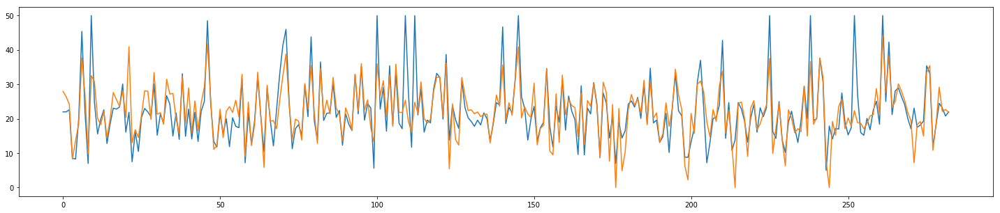

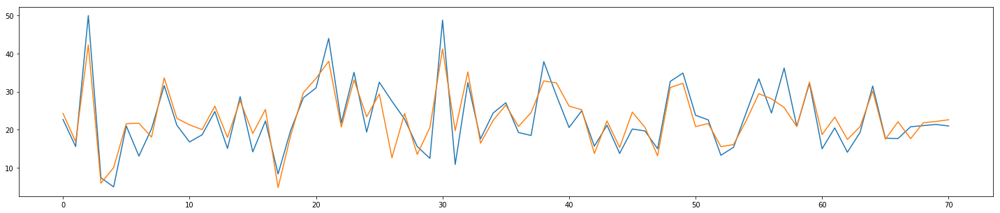

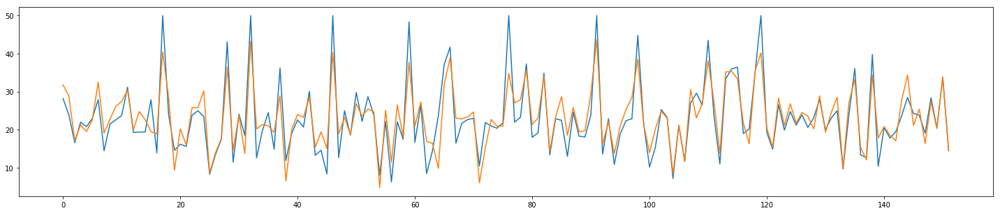

In [18]:
x = np.arange(0, len(y_train),1)
y_pred = model.predict(x_train)
plt.figure(figsize=(25, 5))
plt.plot(x, y_train, x , y_pred)

x = np.arange(0, len(y_val),1)
y_pred = model.predict(x_val)
plt.figure(figsize=(25, 5))
plt.plot(x, y_val, x , y_pred)

x = np.arange(0, len(y_test),1)
y_pred = model.predict(x_test)
plt.figure(figsize=(25, 5))
plt.plot(x, y_test, x , y_pred)

### Error of traindata = 27.8%, validation data =16.2% , testing data = 17.5%, for LR =0.001,Epochs=20000

## case 4

In [21]:
model = Sequential()
model.add(Dense(1, input_dim =(13)))
sgd = optimizers.SGD(lr=10)
model.add(Activation("relu"))
optimizer = keras.optimizers.RMSprop(lr=0.01)
model.compile(optimizer=optimizer, loss='mean_squared_error')

model.fit(x_train, y_train, batch_size=30, epochs=30000, verbose=1, validation_data=(x_val, y_val))

Train on 283 samples, validate on 71 samples
Epoch 1/30000
283/283 [==============================] - 1s 2ms/step - loss: 15861.1031 - val_loss: 6130.0121
Epoch 2/30000
283/283 [==============================] - 0s 118us/step - loss: 4562.4485 - val_loss: 2119.8903
Epoch 3/30000
283/283 [==============================] - 0s 123us/step - loss: 1993.1507 - val_loss: 1023.3553
Epoch 4/30000
283/283 [==============================] - 0s 123us/step - loss: 1227.3359 - val_loss: 848.2456
Epoch 5/30000
283/283 [==============================] - 0s 116us/step - loss: 885.2189 - val_loss: 711.9271
Epoch 6/30000
283/283 [==============================] - 0s 109us/step - loss: 686.4333 - val_loss: 619.0515
Epoch 7/30000
283/283 [==============================] - 0s 113us/step - loss: 596.1961 - val_loss: 598.0719
Epoch 8/30000
283/283 [==============================] - 0s 102us/step - loss: 573.9712 - val_loss: 596.1849
Epoch 9/30000
283/283 [==============================] - 0s 120us/step - loss

283/283 [==============================] - 0s 106us/step - loss: 57.6620 - val_loss: 129.3860
Epoch 77/30000
283/283 [==============================] - 0s 85us/step - loss: 69.6311 - val_loss: 130.4903
Epoch 78/30000
283/283 [==============================] - 0s 102us/step - loss: 62.1056 - val_loss: 43.3461
Epoch 79/30000
283/283 [==============================] - 0s 95us/step - loss: 68.9996 - val_loss: 73.4896
Epoch 80/30000
283/283 [==============================] - 0s 88us/step - loss: 50.4869 - val_loss: 39.7306
Epoch 81/30000
283/283 [==============================] - 0s 95us/step - loss: 84.9061 - val_loss: 35.1012
Epoch 82/30000
283/283 [==============================] - 0s 106us/step - loss: 58.8548 - val_loss: 35.6230
Epoch 83/30000
283/283 [==============================] - 0s 88us/step - loss: 65.8456 - val_loss: 66.8563
Epoch 84/30000
283/283 [==============================] - 0s 95us/step - loss: 60.0112 - val_loss: 35.7336
Epoch 85/30000
283/283 [=======================

Epoch 152/30000
283/283 [==============================] - 0s 106us/step - loss: 75.0854 - val_loss: 28.2481
Epoch 153/30000
283/283 [==============================] - 0s 92us/step - loss: 39.8122 - val_loss: 31.5516
Epoch 154/30000
283/283 [==============================] - 0s 102us/step - loss: 67.0621 - val_loss: 27.6384
Epoch 155/30000
283/283 [==============================] - 0s 116us/step - loss: 54.2414 - val_loss: 47.3226
Epoch 156/30000
283/283 [==============================] - 0s 109us/step - loss: 82.9400 - val_loss: 58.6648
Epoch 157/30000
283/283 [==============================] - 0s 99us/step - loss: 44.0626 - val_loss: 26.9049
Epoch 158/30000
283/283 [==============================] - 0s 95us/step - loss: 67.4269 - val_loss: 26.2814
Epoch 159/30000
283/283 [==============================] - 0s 99us/step - loss: 53.9587 - val_loss: 37.8839
Epoch 160/30000
283/283 [==============================] - 0s 99us/step - loss: 50.1123 - val_loss: 47.0302
Epoch 161/30000
283/283 

283/283 [==============================] - 0s 99us/step - loss: 64.0784 - val_loss: 63.5536
Epoch 228/30000
283/283 [==============================] - 0s 88us/step - loss: 62.0182 - val_loss: 29.8633
Epoch 229/30000
283/283 [==============================] - 0s 95us/step - loss: 45.5563 - val_loss: 30.0023
Epoch 230/30000
283/283 [==============================] - 0s 91us/step - loss: 69.6909 - val_loss: 34.9506
Epoch 231/30000
283/283 [==============================] - 0s 85us/step - loss: 39.3821 - val_loss: 35.2201
Epoch 232/30000
283/283 [==============================] - 0s 88us/step - loss: 61.3787 - val_loss: 28.4156
Epoch 233/30000
283/283 [==============================] - 0s 81us/step - loss: 60.2273 - val_loss: 25.9398
Epoch 234/30000
283/283 [==============================] - 0s 92us/step - loss: 70.4209 - val_loss: 73.3801
Epoch 235/30000
283/283 [==============================] - 0s 85us/step - loss: 38.8593 - val_loss: 48.1567
Epoch 236/30000
283/283 [===================

283/283 [==============================] - 0s 85us/step - loss: 58.9411 - val_loss: 34.4297
Epoch 303/30000
283/283 [==============================] - 0s 99us/step - loss: 51.9193 - val_loss: 27.5727
Epoch 304/30000
283/283 [==============================] - 0s 88us/step - loss: 69.6633 - val_loss: 43.1943
Epoch 305/30000
283/283 [==============================] - 0s 88us/step - loss: 46.2890 - val_loss: 52.6211
Epoch 306/30000
283/283 [==============================] - 0s 109us/step - loss: 53.1803 - val_loss: 79.8806
Epoch 307/30000
283/283 [==============================] - 0s 102us/step - loss: 68.8982 - val_loss: 36.0796
Epoch 308/30000
283/283 [==============================] - 0s 88us/step - loss: 51.6356 - val_loss: 26.5579
Epoch 309/30000
283/283 [==============================] - 0s 102us/step - loss: 48.5290 - val_loss: 78.9927
Epoch 310/30000
283/283 [==============================] - 0s 102us/step - loss: 50.9514 - val_loss: 23.6734
Epoch 311/30000
283/283 [===============

283/283 [==============================] - 0s 85us/step - loss: 55.9469 - val_loss: 30.3126
Epoch 378/30000
283/283 [==============================] - 0s 99us/step - loss: 51.3131 - val_loss: 20.1430
Epoch 379/30000
283/283 [==============================] - 0s 85us/step - loss: 60.8619 - val_loss: 58.7165
Epoch 380/30000
283/283 [==============================] - 0s 115us/step - loss: 39.0309 - val_loss: 25.2147
Epoch 381/30000
283/283 [==============================] - 0s 88us/step - loss: 42.5943 - val_loss: 20.9768
Epoch 382/30000
283/283 [==============================] - 0s 81us/step - loss: 66.2979 - val_loss: 20.6673
Epoch 383/30000
283/283 [==============================] - 0s 106us/step - loss: 50.7798 - val_loss: 26.4164
Epoch 384/30000
283/283 [==============================] - 0s 95us/step - loss: 55.1509 - val_loss: 20.0900
Epoch 385/30000
283/283 [==============================] - 0s 88us/step - loss: 50.1801 - val_loss: 24.0861
Epoch 386/30000
283/283 [=================

Epoch 453/30000
283/283 [==============================] - 0s 99us/step - loss: 64.2641 - val_loss: 41.4325
Epoch 454/30000
283/283 [==============================] - 0s 88us/step - loss: 35.2863 - val_loss: 23.9860
Epoch 455/30000
283/283 [==============================] - 0s 95us/step - loss: 56.9821 - val_loss: 28.6389
Epoch 456/30000
283/283 [==============================] - 0s 87us/step - loss: 47.7167 - val_loss: 46.6409
Epoch 457/30000
283/283 [==============================] - 0s 92us/step - loss: 62.0943 - val_loss: 24.0008
Epoch 458/30000
283/283 [==============================] - 0s 95us/step - loss: 42.4225 - val_loss: 81.2290
Epoch 459/30000
283/283 [==============================] - 0s 81us/step - loss: 61.6582 - val_loss: 53.4880
Epoch 460/30000
283/283 [==============================] - 0s 86us/step - loss: 48.5770 - val_loss: 20.7456
Epoch 461/30000
283/283 [==============================] - 0s 88us/step - loss: 53.5831 - val_loss: 21.0600
Epoch 462/30000
283/283 [===

283/283 [==============================] - 0s 81us/step - loss: 58.3204 - val_loss: 18.9442
Epoch 529/30000
283/283 [==============================] - 0s 99us/step - loss: 54.2894 - val_loss: 22.4506
Epoch 530/30000
283/283 [==============================] - 0s 95us/step - loss: 32.4785 - val_loss: 107.1427
Epoch 531/30000
283/283 [==============================] - 0s 85us/step - loss: 63.1391 - val_loss: 89.4200
Epoch 532/30000
283/283 [==============================] - 0s 88us/step - loss: 35.1167 - val_loss: 38.0011
Epoch 533/30000
283/283 [==============================] - 0s 81us/step - loss: 70.9259 - val_loss: 17.6099
Epoch 534/30000
283/283 [==============================] - 0s 88us/step - loss: 38.3595 - val_loss: 65.9230
Epoch 535/30000
283/283 [==============================] - 0s 88us/step - loss: 50.8377 - val_loss: 26.7389
Epoch 536/30000
283/283 [==============================] - 0s 88us/step - loss: 62.0598 - val_loss: 133.5436
Epoch 537/30000
283/283 [=================

Epoch 604/30000
283/283 [==============================] - 0s 85us/step - loss: 41.4734 - val_loss: 46.3405
Epoch 605/30000
283/283 [==============================] - 0s 95us/step - loss: 52.4127 - val_loss: 89.1913
Epoch 606/30000
283/283 [==============================] - 0s 92us/step - loss: 51.0479 - val_loss: 34.3905
Epoch 607/30000
283/283 [==============================] - 0s 99us/step - loss: 61.4457 - val_loss: 46.8188
Epoch 608/30000
283/283 [==============================] - 0s 92us/step - loss: 38.4287 - val_loss: 18.9713
Epoch 609/30000
283/283 [==============================] - 0s 81us/step - loss: 56.9700 - val_loss: 29.3422
Epoch 610/30000
283/283 [==============================] - 0s 92us/step - loss: 46.5171 - val_loss: 24.2869
Epoch 611/30000
283/283 [==============================] - 0s 88us/step - loss: 49.7848 - val_loss: 17.8937
Epoch 612/30000
283/283 [==============================] - 0s 88us/step - loss: 42.3172 - val_loss: 34.3790
Epoch 613/30000
283/283 [===

283/283 [==============================] - 0s 95us/step - loss: 58.8511 - val_loss: 32.9980
Epoch 680/30000
283/283 [==============================] - 0s 78us/step - loss: 41.4734 - val_loss: 29.9820
Epoch 681/30000
283/283 [==============================] - 0s 92us/step - loss: 52.1421 - val_loss: 30.5722
Epoch 682/30000
283/283 [==============================] - 0s 85us/step - loss: 61.1675 - val_loss: 22.5088
Epoch 683/30000
283/283 [==============================] - 0s 95us/step - loss: 42.8741 - val_loss: 43.6592
Epoch 684/30000
283/283 [==============================] - 0s 85us/step - loss: 56.1364 - val_loss: 56.3198
Epoch 685/30000
283/283 [==============================] - 0s 123us/step - loss: 49.5792 - val_loss: 52.4848
Epoch 686/30000
283/283 [==============================] - 0s 95us/step - loss: 46.6201 - val_loss: 37.9535
Epoch 687/30000
283/283 [==============================] - 0s 92us/step - loss: 66.0865 - val_loss: 17.6002
Epoch 688/30000
283/283 [==================

283/283 [==============================] - 0s 106us/step - loss: 57.0364 - val_loss: 41.2538
Epoch 755/30000
283/283 [==============================] - 0s 109us/step - loss: 40.3424 - val_loss: 25.8230
Epoch 756/30000
283/283 [==============================] - 0s 113us/step - loss: 55.9678 - val_loss: 19.4296
Epoch 757/30000
283/283 [==============================] - 0s 106us/step - loss: 61.6304 - val_loss: 17.0871
Epoch 758/30000
283/283 [==============================] - 0s 88us/step - loss: 36.1869 - val_loss: 46.5727
Epoch 759/30000
283/283 [==============================] - 0s 85us/step - loss: 42.9959 - val_loss: 49.5674
Epoch 760/30000
283/283 [==============================] - 0s 85us/step - loss: 61.4611 - val_loss: 50.8402
Epoch 761/30000
283/283 [==============================] - 0s 85us/step - loss: 55.6931 - val_loss: 27.5551
Epoch 762/30000
283/283 [==============================] - 0s 85us/step - loss: 52.0649 - val_loss: 22.6517
Epoch 763/30000
283/283 [===============

Epoch 830/30000
283/283 [==============================] - 0s 90us/step - loss: 32.3556 - val_loss: 33.4052
Epoch 831/30000
283/283 [==============================] - 0s 85us/step - loss: 63.0399 - val_loss: 35.7901
Epoch 832/30000
283/283 [==============================] - 0s 85us/step - loss: 48.8333 - val_loss: 44.6214
Epoch 833/30000
283/283 [==============================] - 0s 85us/step - loss: 43.3265 - val_loss: 43.7564
Epoch 834/30000
283/283 [==============================] - 0s 85us/step - loss: 42.0960 - val_loss: 16.6555
Epoch 835/30000
283/283 [==============================] - 0s 95us/step - loss: 58.8582 - val_loss: 46.8830
Epoch 836/30000
283/283 [==============================] - 0s 88us/step - loss: 39.0214 - val_loss: 157.7894
Epoch 837/30000
283/283 [==============================] - 0s 81us/step - loss: 58.9409 - val_loss: 25.6473
Epoch 838/30000
283/283 [==============================] - 0s 88us/step - loss: 57.0900 - val_loss: 18.1759
Epoch 839/30000
283/283 [==

283/283 [==============================] - 0s 95us/step - loss: 40.5138 - val_loss: 120.1007
Epoch 906/30000
283/283 [==============================] - 0s 92us/step - loss: 56.5559 - val_loss: 42.5366
Epoch 907/30000
283/283 [==============================] - 0s 85us/step - loss: 54.6416 - val_loss: 16.7876
Epoch 908/30000
283/283 [==============================] - 0s 113us/step - loss: 51.1089 - val_loss: 90.6292
Epoch 909/30000
283/283 [==============================] - 0s 102us/step - loss: 61.7842 - val_loss: 104.2531
Epoch 910/30000
283/283 [==============================] - 0s 130us/step - loss: 46.4151 - val_loss: 18.6198
Epoch 911/30000
283/283 [==============================] - 0s 95us/step - loss: 48.2650 - val_loss: 62.9787
Epoch 912/30000
283/283 [==============================] - 0s 88us/step - loss: 41.2821 - val_loss: 19.7993
Epoch 913/30000
283/283 [==============================] - 0s 109us/step - loss: 60.7830 - val_loss: 16.4085
Epoch 914/30000
283/283 [=============

283/283 [==============================] - 0s 85us/step - loss: 37.8332 - val_loss: 56.9190
Epoch 981/30000
283/283 [==============================] - 0s 95us/step - loss: 55.6493 - val_loss: 22.1000
Epoch 982/30000
283/283 [==============================] - 0s 85us/step - loss: 54.3639 - val_loss: 16.7818
Epoch 983/30000
283/283 [==============================] - 0s 92us/step - loss: 59.6406 - val_loss: 21.2613
Epoch 984/30000
283/283 [==============================] - 0s 88us/step - loss: 42.7256 - val_loss: 28.2115
Epoch 985/30000
283/283 [==============================] - 0s 88us/step - loss: 40.7471 - val_loss: 61.2041
Epoch 986/30000
283/283 [==============================] - 0s 81us/step - loss: 47.9294 - val_loss: 17.9334
Epoch 987/30000
283/283 [==============================] - 0s 92us/step - loss: 69.8163 - val_loss: 19.4588
Epoch 988/30000
283/283 [==============================] - 0s 85us/step - loss: 40.0001 - val_loss: 57.8801
Epoch 989/30000
283/283 [===================

283/283 [==============================] - 0s 88us/step - loss: 51.3623 - val_loss: 38.6299
Epoch 1056/30000
283/283 [==============================] - 0s 85us/step - loss: 32.9716 - val_loss: 57.2789
Epoch 1057/30000
283/283 [==============================] - 0s 88us/step - loss: 59.0812 - val_loss: 45.3552
Epoch 1058/30000
283/283 [==============================] - 0s 88us/step - loss: 45.1995 - val_loss: 50.5222
Epoch 1059/30000
283/283 [==============================] - 0s 81us/step - loss: 48.2503 - val_loss: 29.0409
Epoch 1060/30000
283/283 [==============================] - 0s 92us/step - loss: 68.6420 - val_loss: 16.5590
Epoch 1061/30000
283/283 [==============================] - 0s 85us/step - loss: 51.3733 - val_loss: 41.2171
Epoch 1062/30000
283/283 [==============================] - 0s 88us/step - loss: 37.4651 - val_loss: 20.7073
Epoch 1063/30000
283/283 [==============================] - 0s 85us/step - loss: 50.6746 - val_loss: 27.3228
Epoch 1064/30000
283/283 [==========

283/283 [==============================] - 0s 102us/step - loss: 49.4734 - val_loss: 106.9908
Epoch 1131/30000
283/283 [==============================] - 0s 88us/step - loss: 58.6970 - val_loss: 98.2724
Epoch 1132/30000
283/283 [==============================] - 0s 85us/step - loss: 45.3719 - val_loss: 20.5241
Epoch 1133/30000
283/283 [==============================] - 0s 88us/step - loss: 48.8758 - val_loss: 17.4639
Epoch 1134/30000
283/283 [==============================] - 0s 88us/step - loss: 45.7050 - val_loss: 99.3110
Epoch 1135/30000
283/283 [==============================] - 0s 88us/step - loss: 60.1271 - val_loss: 27.0263
Epoch 1136/30000
283/283 [==============================] - 0s 88us/step - loss: 56.4977 - val_loss: 40.0746
Epoch 1137/30000
283/283 [==============================] - 0s 85us/step - loss: 35.7832 - val_loss: 66.7110
Epoch 1138/30000
283/283 [==============================] - 0s 88us/step - loss: 54.1545 - val_loss: 126.3757
Epoch 1139/30000
283/283 [=======

283/283 [==============================] - 0s 81us/step - loss: 33.7221 - val_loss: 36.1050
Epoch 1206/30000
283/283 [==============================] - 0s 92us/step - loss: 69.0959 - val_loss: 25.3483
Epoch 1207/30000
283/283 [==============================] - 0s 240us/step - loss: 47.8934 - val_loss: 153.9782
Epoch 1208/30000
283/283 [==============================] - 0s 263us/step - loss: 43.3848 - val_loss: 168.4829
Epoch 1209/30000
283/283 [==============================] - 0s 123us/step - loss: 61.8801 - val_loss: 22.0505
Epoch 1210/30000
283/283 [==============================] - 0s 85us/step - loss: 51.8996 - val_loss: 20.9736
Epoch 1211/30000
283/283 [==============================] - 0s 87us/step - loss: 56.3863 - val_loss: 16.4110
Epoch 1212/30000
283/283 [==============================] - 0s 85us/step - loss: 35.6294 - val_loss: 31.9351
Epoch 1213/30000
283/283 [==============================] - 0s 88us/step - loss: 50.8285 - val_loss: 17.1644
Epoch 1214/30000
283/283 [=====

283/283 [==============================] - 0s 88us/step - loss: 45.6993 - val_loss: 31.0930
Epoch 1281/30000
283/283 [==============================] - 0s 95us/step - loss: 76.9708 - val_loss: 17.7475
Epoch 1282/30000
283/283 [==============================] - 0s 99us/step - loss: 36.8468 - val_loss: 87.6903
Epoch 1283/30000
283/283 [==============================] - 0s 106us/step - loss: 45.0818 - val_loss: 91.5406
Epoch 1284/30000
283/283 [==============================] - 0s 82us/step - loss: 59.4340 - val_loss: 16.6119
Epoch 1285/30000
283/283 [==============================] - 0s 88us/step - loss: 49.3603 - val_loss: 53.0837
Epoch 1286/30000
283/283 [==============================] - 0s 85us/step - loss: 50.0121 - val_loss: 36.5207
Epoch 1287/30000
283/283 [==============================] - 0s 99us/step - loss: 38.6759 - val_loss: 22.3378
Epoch 1288/30000
283/283 [==============================] - 0s 229us/step - loss: 69.2647 - val_loss: 19.5340
Epoch 1289/30000
283/283 [========

283/283 [==============================] - 0s 106us/step - loss: 60.5287 - val_loss: 19.8805
Epoch 1356/30000
283/283 [==============================] - 0s 99us/step - loss: 50.9527 - val_loss: 88.5742
Epoch 1357/30000
283/283 [==============================] - 0s 106us/step - loss: 48.1840 - val_loss: 16.3437
Epoch 1358/30000
283/283 [==============================] - 0s 99us/step - loss: 42.0226 - val_loss: 129.2721
Epoch 1359/30000
283/283 [==============================] - 0s 92us/step - loss: 48.2332 - val_loss: 21.3932
Epoch 1360/30000
283/283 [==============================] - 0s 137us/step - loss: 46.9346 - val_loss: 61.1891
Epoch 1361/30000
283/283 [==============================] - 0s 95us/step - loss: 48.9448 - val_loss: 29.5610
Epoch 1362/30000
283/283 [==============================] - 0s 95us/step - loss: 50.6428 - val_loss: 27.6654
Epoch 1363/30000
283/283 [==============================] - 0s 88us/step - loss: 54.9794 - val_loss: 18.3724
Epoch 1364/30000
283/283 [======

283/283 [==============================] - 0s 102us/step - loss: 40.3346 - val_loss: 18.3660
Epoch 1431/30000
283/283 [==============================] - 0s 88us/step - loss: 60.4100 - val_loss: 35.4750
Epoch 1432/30000
283/283 [==============================] - 0s 101us/step - loss: 36.5309 - val_loss: 19.1192
Epoch 1433/30000
283/283 [==============================] - 0s 88us/step - loss: 44.3659 - val_loss: 18.6194
Epoch 1434/30000
283/283 [==============================] - 0s 88us/step - loss: 51.3412 - val_loss: 45.1404
Epoch 1435/30000
283/283 [==============================] - 0s 102us/step - loss: 43.8465 - val_loss: 94.3631
Epoch 1436/30000
283/283 [==============================] - 0s 97us/step - loss: 70.0205 - val_loss: 19.5844
Epoch 1437/30000
283/283 [==============================] - 0s 116us/step - loss: 43.2702 - val_loss: 107.0679
Epoch 1438/30000
283/283 [==============================] - 0s 134us/step - loss: 46.8038 - val_loss: 58.7645
Epoch 1439/30000
283/283 [====

Epoch 1505/30000
283/283 [==============================] - 0s 106us/step - loss: 66.7802 - val_loss: 23.4241
Epoch 1506/30000
283/283 [==============================] - 0s 120us/step - loss: 52.7795 - val_loss: 20.3847
Epoch 1507/30000
283/283 [==============================] - 0s 120us/step - loss: 52.2818 - val_loss: 16.3453
Epoch 1508/30000
283/283 [==============================] - 0s 113us/step - loss: 46.3300 - val_loss: 60.2834
Epoch 1509/30000
283/283 [==============================] - 0s 113us/step - loss: 53.7952 - val_loss: 165.6330
Epoch 1510/30000
283/283 [==============================] - 0s 123us/step - loss: 46.1543 - val_loss: 48.4283
Epoch 1511/30000
283/283 [==============================] - 0s 99us/step - loss: 59.3161 - val_loss: 35.8055
Epoch 1512/30000
283/283 [==============================] - 0s 130us/step - loss: 34.7712 - val_loss: 58.7935
Epoch 1513/30000
283/283 [==============================] - 0s 296us/step - loss: 59.0551 - val_loss: 71.8541
Epoch 1514

Epoch 1580/30000
283/283 [==============================] - 0s 99us/step - loss: 46.6904 - val_loss: 67.2846
Epoch 1581/30000
283/283 [==============================] - 0s 85us/step - loss: 50.3579 - val_loss: 17.5401
Epoch 1582/30000
283/283 [==============================] - 0s 85us/step - loss: 51.6900 - val_loss: 19.6637
Epoch 1583/30000
283/283 [==============================] - 0s 89us/step - loss: 40.6218 - val_loss: 82.4540
Epoch 1584/30000
283/283 [==============================] - 0s 99us/step - loss: 52.1508 - val_loss: 20.6275
Epoch 1585/30000
283/283 [==============================] - 0s 102us/step - loss: 52.7110 - val_loss: 18.0812
Epoch 1586/30000
283/283 [==============================] - 0s 113us/step - loss: 53.8876 - val_loss: 29.7425
Epoch 1587/30000
283/283 [==============================] - 0s 95us/step - loss: 33.3418 - val_loss: 17.8681
Epoch 1588/30000
283/283 [==============================] - 0s 102us/step - loss: 61.4936 - val_loss: 16.0391
Epoch 1589/30000

Epoch 1655/30000
283/283 [==============================] - 0s 99us/step - loss: 69.9441 - val_loss: 25.7483
Epoch 1656/30000
283/283 [==============================] - 0s 106us/step - loss: 37.6650 - val_loss: 175.5344
Epoch 1657/30000
283/283 [==============================] - 0s 81us/step - loss: 50.9209 - val_loss: 65.4566
Epoch 1658/30000
283/283 [==============================] - 0s 92us/step - loss: 52.0789 - val_loss: 20.1989
Epoch 1659/30000
283/283 [==============================] - 0s 85us/step - loss: 51.3740 - val_loss: 17.5981
Epoch 1660/30000
283/283 [==============================] - 0s 106us/step - loss: 58.2850 - val_loss: 52.9264
Epoch 1661/30000
283/283 [==============================] - 0s 88us/step - loss: 49.2333 - val_loss: 21.1867
Epoch 1662/30000
283/283 [==============================] - 0s 81us/step - loss: 45.1490 - val_loss: 95.5538
Epoch 1663/30000
283/283 [==============================] - 0s 92us/step - loss: 58.6783 - val_loss: 45.2276
Epoch 1664/30000

Epoch 1730/30000
283/283 [==============================] - 0s 88us/step - loss: 55.7876 - val_loss: 29.9973
Epoch 1731/30000
283/283 [==============================] - 0s 88us/step - loss: 40.9094 - val_loss: 107.3371
Epoch 1732/30000
283/283 [==============================] - 0s 81us/step - loss: 50.8810 - val_loss: 55.4381
Epoch 1733/30000
283/283 [==============================] - 0s 81us/step - loss: 55.7617 - val_loss: 31.8546
Epoch 1734/30000
283/283 [==============================] - 0s 88us/step - loss: 58.4711 - val_loss: 28.1514
Epoch 1735/30000
283/283 [==============================] - 0s 81us/step - loss: 53.9754 - val_loss: 30.2107
Epoch 1736/30000
283/283 [==============================] - 0s 88us/step - loss: 55.1400 - val_loss: 24.9891
Epoch 1737/30000
283/283 [==============================] - 0s 88us/step - loss: 30.0914 - val_loss: 30.2999
Epoch 1738/30000
283/283 [==============================] - 0s 88us/step - loss: 58.2633 - val_loss: 16.0996
Epoch 1739/30000
2

Epoch 1805/30000
283/283 [==============================] - 0s 99us/step - loss: 34.0007 - val_loss: 16.5823
Epoch 1806/30000
283/283 [==============================] - 0s 137us/step - loss: 66.8978 - val_loss: 17.3164
Epoch 1807/30000
283/283 [==============================] - 0s 116us/step - loss: 35.6481 - val_loss: 70.6486
Epoch 1808/30000
283/283 [==============================] - 0s 85us/step - loss: 50.2814 - val_loss: 18.5765
Epoch 1809/30000
283/283 [==============================] - 0s 81us/step - loss: 52.5499 - val_loss: 19.2076
Epoch 1810/30000
283/283 [==============================] - 0s 81us/step - loss: 48.9005 - val_loss: 23.8587
Epoch 1811/30000
283/283 [==============================] - 0s 81us/step - loss: 42.1573 - val_loss: 20.0492
Epoch 1812/30000
283/283 [==============================] - 0s 85us/step - loss: 60.6788 - val_loss: 23.8546
Epoch 1813/30000
283/283 [==============================] - 0s 88us/step - loss: 46.4663 - val_loss: 34.7920
Epoch 1814/30000


Epoch 1880/30000
283/283 [==============================] - 0s 85us/step - loss: 46.7756 - val_loss: 25.1533
Epoch 1881/30000
283/283 [==============================] - 0s 99us/step - loss: 50.8961 - val_loss: 19.4160
Epoch 1882/30000
283/283 [==============================] - 0s 102us/step - loss: 41.8718 - val_loss: 15.9954
Epoch 1883/30000
283/283 [==============================] - 0s 85us/step - loss: 57.1864 - val_loss: 63.5027
Epoch 1884/30000
283/283 [==============================] - 0s 92us/step - loss: 44.5803 - val_loss: 46.4397
Epoch 1885/30000
283/283 [==============================] - 0s 85us/step - loss: 42.8634 - val_loss: 56.2330
Epoch 1886/30000
283/283 [==============================] - 0s 92us/step - loss: 60.0934 - val_loss: 17.6668
Epoch 1887/30000
283/283 [==============================] - 0s 95us/step - loss: 34.4867 - val_loss: 39.9465
Epoch 1888/30000
283/283 [==============================] - 0s 95us/step - loss: 64.5751 - val_loss: 25.5457
Epoch 1889/30000
2

Epoch 1955/30000
283/283 [==============================] - 0s 94us/step - loss: 50.8058 - val_loss: 18.8662
Epoch 1956/30000
283/283 [==============================] - 0s 88us/step - loss: 44.8187 - val_loss: 24.2818
Epoch 1957/30000
283/283 [==============================] - 0s 95us/step - loss: 68.6754 - val_loss: 22.3119
Epoch 1958/30000
283/283 [==============================] - 0s 85us/step - loss: 29.9554 - val_loss: 17.2429
Epoch 1959/30000
283/283 [==============================] - 0s 99us/step - loss: 58.4824 - val_loss: 21.8575
Epoch 1960/30000
283/283 [==============================] - 0s 85us/step - loss: 58.2960 - val_loss: 27.3179
Epoch 1961/30000
283/283 [==============================] - 0s 85us/step - loss: 45.6695 - val_loss: 24.7929
Epoch 1962/30000
283/283 [==============================] - 0s 88us/step - loss: 46.4526 - val_loss: 36.7096
Epoch 1963/30000
283/283 [==============================] - 0s 88us/step - loss: 53.3466 - val_loss: 57.0894
Epoch 1964/30000
28

Epoch 2030/30000
283/283 [==============================] - 0s 106us/step - loss: 37.9743 - val_loss: 17.3000
Epoch 2031/30000
283/283 [==============================] - 0s 99us/step - loss: 66.0046 - val_loss: 21.8056
Epoch 2032/30000
283/283 [==============================] - 0s 95us/step - loss: 46.0682 - val_loss: 17.0459
Epoch 2033/30000
283/283 [==============================] - 0s 88us/step - loss: 47.0115 - val_loss: 71.0637
Epoch 2034/30000
283/283 [==============================] - 0s 95us/step - loss: 41.4052 - val_loss: 16.7170
Epoch 2035/30000
283/283 [==============================] - 0s 95us/step - loss: 55.3225 - val_loss: 42.2405
Epoch 2036/30000
283/283 [==============================] - 0s 88us/step - loss: 39.0011 - val_loss: 26.1592
Epoch 2037/30000
283/283 [==============================] - 0s 88us/step - loss: 46.5240 - val_loss: 16.1763
Epoch 2038/30000
283/283 [==============================] - 0s 85us/step - loss: 46.8750 - val_loss: 18.3008
Epoch 2039/30000
2

283/283 [==============================] - 0s 109us/step - loss: 60.6142 - val_loss: 17.5533
Epoch 2105/30000
283/283 [==============================] - 0s 92us/step - loss: 36.1925 - val_loss: 16.1681
Epoch 2106/30000
283/283 [==============================] - 0s 95us/step - loss: 64.7574 - val_loss: 65.0845
Epoch 2107/30000
283/283 [==============================] - 0s 99us/step - loss: 52.9306 - val_loss: 16.1512
Epoch 2108/30000
283/283 [==============================] - 0s 85us/step - loss: 35.8083 - val_loss: 38.1741
Epoch 2109/30000
283/283 [==============================] - 0s 92us/step - loss: 68.9414 - val_loss: 26.8511
Epoch 2110/30000
283/283 [==============================] - 0s 109us/step - loss: 31.3715 - val_loss: 20.6583
Epoch 2111/30000
283/283 [==============================] - 0s 95us/step - loss: 67.9766 - val_loss: 50.2323
Epoch 2112/30000
283/283 [==============================] - 0s 92us/step - loss: 42.9290 - val_loss: 35.6697
Epoch 2113/30000
283/283 [========

Epoch 2179/30000
283/283 [==============================] - 0s 95us/step - loss: 63.8342 - val_loss: 18.3353
Epoch 2180/30000
283/283 [==============================] - 0s 92us/step - loss: 39.4660 - val_loss: 38.0008
Epoch 2181/30000
283/283 [==============================] - 0s 95us/step - loss: 58.4484 - val_loss: 73.8987
Epoch 2182/30000
283/283 [==============================] - 0s 109us/step - loss: 56.4450 - val_loss: 37.1293
Epoch 2183/30000
283/283 [==============================] - 0s 145us/step - loss: 48.2836 - val_loss: 31.5940
Epoch 2184/30000
283/283 [==============================] - 0s 102us/step - loss: 49.4230 - val_loss: 16.0219
Epoch 2185/30000
283/283 [==============================] - 0s 116us/step - loss: 53.5258 - val_loss: 17.2641
Epoch 2186/30000
283/283 [==============================] - 0s 99us/step - loss: 50.2807 - val_loss: 50.8585
Epoch 2187/30000
283/283 [==============================] - 0s 270us/step - loss: 41.0918 - val_loss: 16.2581
Epoch 2188/300

Epoch 2254/30000
283/283 [==============================] - 0s 81us/step - loss: 61.9819 - val_loss: 20.4501
Epoch 2255/30000
283/283 [==============================] - 0s 102us/step - loss: 35.2876 - val_loss: 18.4722
Epoch 2256/30000
283/283 [==============================] - 0s 99us/step - loss: 61.1756 - val_loss: 74.3778
Epoch 2257/30000
283/283 [==============================] - 0s 92us/step - loss: 42.9953 - val_loss: 34.0950
Epoch 2258/30000
283/283 [==============================] - 0s 95us/step - loss: 38.6516 - val_loss: 17.4634
Epoch 2259/30000
283/283 [==============================] - 0s 95us/step - loss: 35.3466 - val_loss: 122.7630
Epoch 2260/30000
283/283 [==============================] - 0s 123us/step - loss: 54.1263 - val_loss: 18.2593
Epoch 2261/30000
283/283 [==============================] - 0s 92us/step - loss: 64.0492 - val_loss: 16.7032
Epoch 2262/30000
283/283 [==============================] - 0s 81us/step - loss: 29.5488 - val_loss: 18.6782
Epoch 2263/30000

Epoch 2329/30000
283/283 [==============================] - 0s 120us/step - loss: 56.0853 - val_loss: 15.9125
Epoch 2330/30000
283/283 [==============================] - 0s 113us/step - loss: 47.7033 - val_loss: 21.0057
Epoch 2331/30000
283/283 [==============================] - 0s 116us/step - loss: 52.8153 - val_loss: 54.4185
Epoch 2332/30000
283/283 [==============================] - 0s 116us/step - loss: 39.0798 - val_loss: 97.8877
Epoch 2333/30000
283/283 [==============================] - 0s 113us/step - loss: 54.0296 - val_loss: 15.9002
Epoch 2334/30000
283/283 [==============================] - 0s 102us/step - loss: 29.9207 - val_loss: 110.1543
Epoch 2335/30000
283/283 [==============================] - 0s 92us/step - loss: 61.6879 - val_loss: 56.7625
Epoch 2336/30000
283/283 [==============================] - 0s 92us/step - loss: 41.1488 - val_loss: 101.0837
Epoch 2337/30000
283/283 [==============================] - 0s 92us/step - loss: 57.8862 - val_loss: 15.7959
Epoch 2338/

Epoch 2404/30000
283/283 [==============================] - 0s 102us/step - loss: 65.7483 - val_loss: 17.9452
Epoch 2405/30000
283/283 [==============================] - 0s 95us/step - loss: 51.5361 - val_loss: 46.4031
Epoch 2406/30000
283/283 [==============================] - 0s 88us/step - loss: 37.4297 - val_loss: 38.4537
Epoch 2407/30000
283/283 [==============================] - 0s 101us/step - loss: 60.0484 - val_loss: 24.8574
Epoch 2408/30000
283/283 [==============================] - 0s 106us/step - loss: 50.0506 - val_loss: 17.2426
Epoch 2409/30000
283/283 [==============================] - 0s 81us/step - loss: 42.9310 - val_loss: 69.1372
Epoch 2410/30000
283/283 [==============================] - 0s 88us/step - loss: 47.4205 - val_loss: 74.3608
Epoch 2411/30000
283/283 [==============================] - 0s 102us/step - loss: 52.2292 - val_loss: 127.8529
Epoch 2412/30000
283/283 [==============================] - 0s 296us/step - loss: 34.4920 - val_loss: 44.3772
Epoch 2413/30

Epoch 2479/30000
283/283 [==============================] - 0s 88us/step - loss: 57.3397 - val_loss: 29.4124
Epoch 2480/30000
283/283 [==============================] - 0s 88us/step - loss: 32.2902 - val_loss: 134.5832
Epoch 2481/30000
283/283 [==============================] - 0s 95us/step - loss: 60.5901 - val_loss: 33.6522
Epoch 2482/30000
283/283 [==============================] - 0s 92us/step - loss: 54.2724 - val_loss: 16.6268
Epoch 2483/30000
283/283 [==============================] - 0s 95us/step - loss: 52.1979 - val_loss: 32.1813
Epoch 2484/30000
283/283 [==============================] - 0s 88us/step - loss: 42.1311 - val_loss: 18.2849
Epoch 2485/30000
283/283 [==============================] - 0s 92us/step - loss: 58.1514 - val_loss: 50.3349
Epoch 2486/30000
283/283 [==============================] - 0s 99us/step - loss: 42.1200 - val_loss: 48.7903
Epoch 2487/30000
283/283 [==============================] - 0s 85us/step - loss: 47.0131 - val_loss: 28.0935
Epoch 2488/30000
2

Epoch 2554/30000
283/283 [==============================] - 0s 137us/step - loss: 51.1266 - val_loss: 42.6823
Epoch 2555/30000
283/283 [==============================] - 0s 92us/step - loss: 49.2379 - val_loss: 25.6688
Epoch 2556/30000
283/283 [==============================] - 0s 109us/step - loss: 56.7163 - val_loss: 25.9153
Epoch 2557/30000
283/283 [==============================] - 0s 109us/step - loss: 47.1303 - val_loss: 27.2479
Epoch 2558/30000
283/283 [==============================] - 0s 109us/step - loss: 47.8863 - val_loss: 39.7161
Epoch 2559/30000
283/283 [==============================] - 0s 113us/step - loss: 63.1779 - val_loss: 17.4530
Epoch 2560/30000
283/283 [==============================] - 0s 106us/step - loss: 51.1123 - val_loss: 20.8200
Epoch 2561/30000
283/283 [==============================] - 0s 99us/step - loss: 33.3948 - val_loss: 49.1504
Epoch 2562/30000
283/283 [==============================] - 0s 102us/step - loss: 66.6710 - val_loss: 49.3259
Epoch 2563/3

283/283 [==============================] - 0s 92us/step - loss: 46.8248 - val_loss: 20.9077
Epoch 2629/30000
283/283 [==============================] - 0s 88us/step - loss: 52.2584 - val_loss: 20.7507
Epoch 2630/30000
283/283 [==============================] - 0s 92us/step - loss: 32.4260 - val_loss: 110.7734
Epoch 2631/30000
283/283 [==============================] - 0s 88us/step - loss: 63.7343 - val_loss: 39.5785
Epoch 2632/30000
283/283 [==============================] - 0s 95us/step - loss: 49.8079 - val_loss: 38.5492
Epoch 2633/30000
283/283 [==============================] - 0s 92us/step - loss: 57.7980 - val_loss: 23.1681
Epoch 2634/30000
283/283 [==============================] - 0s 85us/step - loss: 32.5962 - val_loss: 35.0614
Epoch 2635/30000
283/283 [==============================] - 0s 88us/step - loss: 57.7656 - val_loss: 17.0010
Epoch 2636/30000
283/283 [==============================] - 0s 85us/step - loss: 51.0938 - val_loss: 78.9893
Epoch 2637/30000
283/283 [=========

283/283 [==============================] - 0s 88us/step - loss: 34.6414 - val_loss: 132.0520
Epoch 2704/30000
283/283 [==============================] - 0s 88us/step - loss: 55.2062 - val_loss: 25.4152
Epoch 2705/30000
283/283 [==============================] - 0s 81us/step - loss: 39.4163 - val_loss: 26.0025
Epoch 2706/30000
283/283 [==============================] - 0s 81us/step - loss: 40.9791 - val_loss: 15.7283
Epoch 2707/30000
283/283 [==============================] - 0s 99us/step - loss: 66.8619 - val_loss: 36.9635
Epoch 2708/30000
283/283 [==============================] - 0s 85us/step - loss: 35.0817 - val_loss: 128.6706
Epoch 2709/30000
283/283 [==============================] - 0s 92us/step - loss: 62.8838 - val_loss: 28.0846
Epoch 2710/30000
283/283 [==============================] - 0s 85us/step - loss: 45.1093 - val_loss: 52.0934
Epoch 2711/30000
283/283 [==============================] - 0s 92us/step - loss: 48.0501 - val_loss: 31.0820
Epoch 2712/30000
283/283 [========

Epoch 2778/30000
283/283 [==============================] - 0s 102us/step - loss: 58.5782 - val_loss: 17.9906
Epoch 2779/30000
283/283 [==============================] - 0s 88us/step - loss: 54.8750 - val_loss: 48.0910
Epoch 2780/30000
283/283 [==============================] - 0s 130us/step - loss: 50.8575 - val_loss: 55.7648
Epoch 2781/30000
283/283 [==============================] - 0s 92us/step - loss: 41.2047 - val_loss: 58.5924
Epoch 2782/30000
283/283 [==============================] - 0s 85us/step - loss: 35.4066 - val_loss: 51.5850
Epoch 2783/30000
283/283 [==============================] - 0s 92us/step - loss: 68.2520 - val_loss: 17.2699
Epoch 2784/30000
283/283 [==============================] - 0s 92us/step - loss: 30.8675 - val_loss: 20.0655
Epoch 2785/30000
283/283 [==============================] - 0s 92us/step - loss: 70.9739 - val_loss: 38.1225
Epoch 2786/30000
283/283 [==============================] - 0s 85us/step - loss: 37.4194 - val_loss: 79.0617
Epoch 2787/30000


Epoch 2853/30000
283/283 [==============================] - 0s 92us/step - loss: 39.4215 - val_loss: 26.3069
Epoch 2854/30000
283/283 [==============================] - 0s 92us/step - loss: 59.5946 - val_loss: 16.4499
Epoch 2855/30000
283/283 [==============================] - 0s 109us/step - loss: 52.7570 - val_loss: 54.2620
Epoch 2856/30000
283/283 [==============================] - 0s 106us/step - loss: 34.1598 - val_loss: 18.8927
Epoch 2857/30000
283/283 [==============================] - 0s 92us/step - loss: 64.7865 - val_loss: 49.8021
Epoch 2858/30000
283/283 [==============================] - 0s 92us/step - loss: 57.8985 - val_loss: 19.7332
Epoch 2859/30000
283/283 [==============================] - 0s 85us/step - loss: 39.3577 - val_loss: 79.4470
Epoch 2860/30000
283/283 [==============================] - 0s 90us/step - loss: 49.6004 - val_loss: 17.6141
Epoch 2861/30000
283/283 [==============================] - 0s 85us/step - loss: 53.6679 - val_loss: 42.2337
Epoch 2862/30000


Epoch 2928/30000
283/283 [==============================] - 0s 88us/step - loss: 61.9526 - val_loss: 18.4399
Epoch 2929/30000
283/283 [==============================] - 0s 106us/step - loss: 32.4912 - val_loss: 29.7206
Epoch 2930/30000
283/283 [==============================] - 0s 92us/step - loss: 43.9054 - val_loss: 16.0398
Epoch 2931/30000
283/283 [==============================] - 0s 88us/step - loss: 52.9800 - val_loss: 18.0232
Epoch 2932/30000
283/283 [==============================] - 0s 102us/step - loss: 50.2470 - val_loss: 22.2552
Epoch 2933/30000
283/283 [==============================] - 0s 109us/step - loss: 50.5536 - val_loss: 18.0043
Epoch 2934/30000
283/283 [==============================] - 0s 113us/step - loss: 51.3048 - val_loss: 16.4536
Epoch 2935/30000
283/283 [==============================] - 0s 92us/step - loss: 46.8888 - val_loss: 61.0968
Epoch 2936/30000
283/283 [==============================] - 0s 95us/step - loss: 35.7353 - val_loss: 39.3626
Epoch 2937/3000

283/283 [==============================] - 0s 88us/step - loss: 60.8905 - val_loss: 27.8586
Epoch 3003/30000
283/283 [==============================] - 0s 92us/step - loss: 45.8517 - val_loss: 19.5510
Epoch 3004/30000
283/283 [==============================] - 0s 85us/step - loss: 38.9222 - val_loss: 17.1245
Epoch 3005/30000
283/283 [==============================] - 0s 92us/step - loss: 59.0992 - val_loss: 63.0317
Epoch 3006/30000
283/283 [==============================] - 0s 113us/step - loss: 43.7218 - val_loss: 46.3878
Epoch 3007/30000
283/283 [==============================] - 0s 95us/step - loss: 38.6259 - val_loss: 126.2958
Epoch 3008/30000
283/283 [==============================] - 0s 85us/step - loss: 55.3982 - val_loss: 27.4665
Epoch 3009/30000
283/283 [==============================] - 0s 85us/step - loss: 53.5513 - val_loss: 25.3354
Epoch 3010/30000
283/283 [==============================] - 0s 81us/step - loss: 54.7503 - val_loss: 17.7231
Epoch 3011/30000
283/283 [========

283/283 [==============================] - 0s 88us/step - loss: 53.4730 - val_loss: 18.1871
Epoch 3078/30000
283/283 [==============================] - 0s 85us/step - loss: 42.3267 - val_loss: 92.6016
Epoch 3079/30000
283/283 [==============================] - 0s 88us/step - loss: 51.4972 - val_loss: 19.5496
Epoch 3080/30000
283/283 [==============================] - 0s 85us/step - loss: 57.6617 - val_loss: 16.1410
Epoch 3081/30000
283/283 [==============================] - 0s 109us/step - loss: 52.4091 - val_loss: 17.1394
Epoch 3082/30000
283/283 [==============================] - 0s 109us/step - loss: 32.9632 - val_loss: 141.0509
Epoch 3083/30000
283/283 [==============================] - 0s 106us/step - loss: 52.1621 - val_loss: 49.1890
Epoch 3084/30000
283/283 [==============================] - 0s 109us/step - loss: 55.7243 - val_loss: 28.1941
Epoch 3085/30000
283/283 [==============================] - 0s 99us/step - loss: 50.8058 - val_loss: 24.8706
Epoch 3086/30000
283/283 [=====

283/283 [==============================] - 0s 113us/step - loss: 67.3018 - val_loss: 29.6649
Epoch 3153/30000
283/283 [==============================] - 0s 102us/step - loss: 51.8171 - val_loss: 48.9270
Epoch 3154/30000
283/283 [==============================] - 0s 120us/step - loss: 40.3903 - val_loss: 24.5652
Epoch 3155/30000
283/283 [==============================] - 0s 113us/step - loss: 53.3281 - val_loss: 18.3407
Epoch 3156/30000
283/283 [==============================] - 0s 109us/step - loss: 43.7079 - val_loss: 41.7903
Epoch 3157/30000
283/283 [==============================] - 0s 113us/step - loss: 59.9678 - val_loss: 23.5057
Epoch 3158/30000
283/283 [==============================] - 0s 92us/step - loss: 32.3639 - val_loss: 49.9745
Epoch 3159/30000
283/283 [==============================] - 0s 92us/step - loss: 64.0488 - val_loss: 16.1749
Epoch 3160/30000
283/283 [==============================] - 0s 102us/step - loss: 51.0229 - val_loss: 17.8952
Epoch 3161/30000
283/283 [===

Epoch 3227/30000
283/283 [==============================] - 0s 102us/step - loss: 44.7690 - val_loss: 23.5189
Epoch 3228/30000
283/283 [==============================] - 0s 99us/step - loss: 48.4684 - val_loss: 18.0794
Epoch 3229/30000
283/283 [==============================] - 0s 99us/step - loss: 45.8072 - val_loss: 63.6833
Epoch 3230/30000
283/283 [==============================] - 0s 94us/step - loss: 57.7743 - val_loss: 16.4195
Epoch 3231/30000
283/283 [==============================] - 0s 85us/step - loss: 30.1864 - val_loss: 21.2135
Epoch 3232/30000
283/283 [==============================] - 0s 99us/step - loss: 61.0754 - val_loss: 16.3762
Epoch 3233/30000
283/283 [==============================] - 0s 95us/step - loss: 59.6473 - val_loss: 24.9223
Epoch 3234/30000
283/283 [==============================] - 0s 88us/step - loss: 36.3455 - val_loss: 41.6524
Epoch 3235/30000
283/283 [==============================] - 0s 92us/step - loss: 52.6292 - val_loss: 16.1113
Epoch 3236/30000
2

Epoch 3302/30000
283/283 [==============================] - 0s 95us/step - loss: 53.4345 - val_loss: 16.8104
Epoch 3303/30000
283/283 [==============================] - 0s 109us/step - loss: 33.2140 - val_loss: 39.7003
Epoch 3304/30000
283/283 [==============================] - 0s 134us/step - loss: 62.9647 - val_loss: 43.6632
Epoch 3305/30000
283/283 [==============================] - 0s 109us/step - loss: 53.7440 - val_loss: 23.4634
Epoch 3306/30000
283/283 [==============================] - 0s 102us/step - loss: 44.5332 - val_loss: 16.8285
Epoch 3307/30000
283/283 [==============================] - 0s 92us/step - loss: 49.8052 - val_loss: 74.1813
Epoch 3308/30000
283/283 [==============================] - 0s 99us/step - loss: 46.4888 - val_loss: 25.3213
Epoch 3309/30000
283/283 [==============================] - 0s 106us/step - loss: 55.4700 - val_loss: 16.8722
Epoch 3310/30000
283/283 [==============================] - 0s 85us/step - loss: 44.4498 - val_loss: 16.4039
Epoch 3311/300

Epoch 3377/30000
283/283 [==============================] - 0s 120us/step - loss: 46.9539 - val_loss: 23.7350
Epoch 3378/30000
283/283 [==============================] - 0s 102us/step - loss: 44.0555 - val_loss: 26.2327
Epoch 3379/30000
283/283 [==============================] - 0s 92us/step - loss: 33.2748 - val_loss: 17.4633
Epoch 3380/30000
283/283 [==============================] - 0s 92us/step - loss: 60.6949 - val_loss: 34.1011
Epoch 3381/30000
283/283 [==============================] - 0s 92us/step - loss: 52.9178 - val_loss: 103.0535
Epoch 3382/30000
283/283 [==============================] - 0s 88us/step - loss: 45.7144 - val_loss: 34.1137
Epoch 3383/30000
283/283 [==============================] - 0s 85us/step - loss: 43.8556 - val_loss: 54.2300
Epoch 3384/30000
283/283 [==============================] - 0s 92us/step - loss: 54.1019 - val_loss: 15.9868
Epoch 3385/30000
283/283 [==============================] - 0s 92us/step - loss: 31.2060 - val_loss: 29.7818
Epoch 3386/30000

283/283 [==============================] - 0s 95us/step - loss: 29.8514 - val_loss: 37.0446
Epoch 3452/30000
283/283 [==============================] - 0s 85us/step - loss: 54.2929 - val_loss: 28.6161
Epoch 3453/30000
283/283 [==============================] - 0s 92us/step - loss: 50.7197 - val_loss: 50.7470
Epoch 3454/30000
283/283 [==============================] - 0s 85us/step - loss: 51.6127 - val_loss: 21.4844
Epoch 3455/30000
283/283 [==============================] - 0s 92us/step - loss: 52.4601 - val_loss: 51.1986
Epoch 3456/30000
283/283 [==============================] - 0s 85us/step - loss: 44.1457 - val_loss: 123.0819
Epoch 3457/30000
283/283 [==============================] - 0s 92us/step - loss: 62.9308 - val_loss: 17.0070
Epoch 3458/30000
283/283 [==============================] - 0s 85us/step - loss: 52.8041 - val_loss: 23.6187
Epoch 3459/30000
283/283 [==============================] - 0s 92us/step - loss: 48.4832 - val_loss: 35.1456
Epoch 3460/30000
283/283 [=========

283/283 [==============================] - 0s 88us/step - loss: 36.8178 - val_loss: 103.3970
Epoch 3526/30000
283/283 [==============================] - 0s 85us/step - loss: 67.3197 - val_loss: 16.8026
Epoch 3527/30000
283/283 [==============================] - 0s 88us/step - loss: 37.0658 - val_loss: 101.4058
Epoch 3528/30000
283/283 [==============================] - 0s 109us/step - loss: 52.4550 - val_loss: 23.7851
Epoch 3529/30000
283/283 [==============================] - 0s 88us/step - loss: 54.2135 - val_loss: 18.5505
Epoch 3530/30000
283/283 [==============================] - 0s 88us/step - loss: 36.4332 - val_loss: 23.9688
Epoch 3531/30000
283/283 [==============================] - 0s 92us/step - loss: 57.4905 - val_loss: 29.5370
Epoch 3532/30000
283/283 [==============================] - 0s 106us/step - loss: 33.2322 - val_loss: 71.5318
Epoch 3533/30000
283/283 [==============================] - 0s 113us/step - loss: 49.2639 - val_loss: 52.9107
Epoch 3534/30000
283/283 [=====

Epoch 3600/30000
283/283 [==============================] - 0s 97us/step - loss: 43.7987 - val_loss: 44.2287
Epoch 3601/30000
283/283 [==============================] - 0s 95us/step - loss: 53.6684 - val_loss: 17.4215
Epoch 3602/30000
283/283 [==============================] - 0s 85us/step - loss: 39.7430 - val_loss: 19.5001
Epoch 3603/30000
283/283 [==============================] - 0s 99us/step - loss: 54.9209 - val_loss: 79.6357
Epoch 3604/30000
283/283 [==============================] - 0s 91us/step - loss: 44.4878 - val_loss: 29.7575
Epoch 3605/30000
283/283 [==============================] - 0s 99us/step - loss: 54.8101 - val_loss: 19.0953
Epoch 3606/30000
283/283 [==============================] - 0s 95us/step - loss: 36.5444 - val_loss: 183.8586
Epoch 3607/30000
283/283 [==============================] - 0s 85us/step - loss: 65.5637 - val_loss: 16.1562
Epoch 3608/30000
283/283 [==============================] - 0s 99us/step - loss: 37.5882 - val_loss: 45.7229
Epoch 3609/30000
2

Epoch 3675/30000
283/283 [==============================] - 0s 99us/step - loss: 50.8167 - val_loss: 15.9599
Epoch 3676/30000
283/283 [==============================] - 0s 88us/step - loss: 45.9648 - val_loss: 81.8196
Epoch 3677/30000
283/283 [==============================] - 0s 99us/step - loss: 47.7477 - val_loss: 50.7094
Epoch 3678/30000
283/283 [==============================] - 0s 95us/step - loss: 51.0569 - val_loss: 31.7374
Epoch 3679/30000
283/283 [==============================] - 0s 95us/step - loss: 53.1274 - val_loss: 18.4693
Epoch 3680/30000
283/283 [==============================] - 0s 95us/step - loss: 54.9443 - val_loss: 17.3135
Epoch 3681/30000
283/283 [==============================] - 0s 102us/step - loss: 40.6937 - val_loss: 17.4158
Epoch 3682/30000
283/283 [==============================] - 0s 85us/step - loss: 58.0114 - val_loss: 17.2347
Epoch 3683/30000
283/283 [==============================] - 0s 92us/step - loss: 35.9476 - val_loss: 35.1594
Epoch 3684/30000
2

Epoch 3750/30000
283/283 [==============================] - 0s 102us/step - loss: 36.4764 - val_loss: 26.7195
Epoch 3751/30000
283/283 [==============================] - 0s 88us/step - loss: 61.9389 - val_loss: 17.1774
Epoch 3752/30000
283/283 [==============================] - 0s 92us/step - loss: 51.5046 - val_loss: 25.3666
Epoch 3753/30000
283/283 [==============================] - 0s 88us/step - loss: 41.8379 - val_loss: 23.0348
Epoch 3754/30000
283/283 [==============================] - 0s 85us/step - loss: 29.5466 - val_loss: 50.0467
Epoch 3755/30000
283/283 [==============================] - 0s 92us/step - loss: 67.0606 - val_loss: 67.9288
Epoch 3756/30000
283/283 [==============================] - 0s 122us/step - loss: 35.5990 - val_loss: 24.1887
Epoch 3757/30000
283/283 [==============================] - 0s 88us/step - loss: 51.8681 - val_loss: 39.5114
Epoch 3758/30000
283/283 [==============================] - 0s 95us/step - loss: 65.5800 - val_loss: 16.7208
Epoch 3759/30000


Epoch 3825/30000
283/283 [==============================] - 0s 81us/step - loss: 39.7616 - val_loss: 45.1847
Epoch 3826/30000
283/283 [==============================] - 0s 95us/step - loss: 39.6067 - val_loss: 100.7312
Epoch 3827/30000
283/283 [==============================] - 0s 85us/step - loss: 62.4999 - val_loss: 17.8109
Epoch 3828/30000
283/283 [==============================] - 0s 88us/step - loss: 30.2222 - val_loss: 84.4081
Epoch 3829/30000
283/283 [==============================] - 0s 85us/step - loss: 68.1547 - val_loss: 23.2958
Epoch 3830/30000
283/283 [==============================] - 0s 99us/step - loss: 56.7491 - val_loss: 26.2510
Epoch 3831/30000
283/283 [==============================] - 0s 88us/step - loss: 38.0487 - val_loss: 72.7851
Epoch 3832/30000
283/283 [==============================] - 0s 87us/step - loss: 51.1613 - val_loss: 31.6566
Epoch 3833/30000
283/283 [==============================] - 0s 95us/step - loss: 52.1552 - val_loss: 18.6213
Epoch 3834/30000
2

Epoch 3900/30000
283/283 [==============================] - 0s 99us/step - loss: 58.6351 - val_loss: 18.7405
Epoch 3901/30000
283/283 [==============================] - 0s 92us/step - loss: 55.0783 - val_loss: 49.5508
Epoch 3902/30000
283/283 [==============================] - 0s 88us/step - loss: 53.6066 - val_loss: 16.9455
Epoch 3903/30000
283/283 [==============================] - 0s 92us/step - loss: 32.0124 - val_loss: 155.9219
Epoch 3904/30000
283/283 [==============================] - 0s 85us/step - loss: 58.0227 - val_loss: 32.7693
Epoch 3905/30000
283/283 [==============================] - 0s 99us/step - loss: 54.8880 - val_loss: 25.6088
Epoch 3906/30000
283/283 [==============================] - 0s 99us/step - loss: 40.6493 - val_loss: 52.3438
Epoch 3907/30000
283/283 [==============================] - 0s 92us/step - loss: 60.2340 - val_loss: 17.4852
Epoch 3908/30000
283/283 [==============================] - 0s 92us/step - loss: 55.0451 - val_loss: 16.0171
Epoch 3909/30000
2

Epoch 3975/30000
283/283 [==============================] - 0s 95us/step - loss: 46.5877 - val_loss: 20.8451
Epoch 3976/30000
283/283 [==============================] - 0s 102us/step - loss: 55.5126 - val_loss: 115.7838
Epoch 3977/30000
283/283 [==============================] - 0s 92us/step - loss: 42.1911 - val_loss: 23.7585
Epoch 3978/30000
283/283 [==============================] - 0s 106us/step - loss: 63.0508 - val_loss: 33.1728
Epoch 3979/30000
283/283 [==============================] - 0s 95us/step - loss: 43.6687 - val_loss: 38.0932
Epoch 3980/30000
283/283 [==============================] - 0s 90us/step - loss: 34.2988 - val_loss: 60.0337
Epoch 3981/30000
283/283 [==============================] - 0s 81us/step - loss: 60.4498 - val_loss: 91.9318
Epoch 3982/30000
283/283 [==============================] - 0s 95us/step - loss: 46.0868 - val_loss: 35.8754
Epoch 3983/30000
283/283 [==============================] - 0s 81us/step - loss: 46.0390 - val_loss: 158.0607
Epoch 3984/3000

Epoch 4050/30000
283/283 [==============================] - 0s 102us/step - loss: 58.8295 - val_loss: 78.3042
Epoch 4051/30000
283/283 [==============================] - 0s 88us/step - loss: 47.5449 - val_loss: 20.4863
Epoch 4052/30000
283/283 [==============================] - 0s 92us/step - loss: 48.7573 - val_loss: 67.3532
Epoch 4053/30000
283/283 [==============================] - 0s 88us/step - loss: 38.3725 - val_loss: 54.6231
Epoch 4054/30000
283/283 [==============================] - 0s 92us/step - loss: 48.3108 - val_loss: 99.5310
Epoch 4055/30000
283/283 [==============================] - 0s 134us/step - loss: 49.2937 - val_loss: 17.1041
Epoch 4056/30000
283/283 [==============================] - 0s 92us/step - loss: 45.6278 - val_loss: 21.3418
Epoch 4057/30000
283/283 [==============================] - 0s 88us/step - loss: 62.4534 - val_loss: 28.3881
Epoch 4058/30000
283/283 [==============================] - 0s 95us/step - loss: 38.2523 - val_loss: 30.6198
Epoch 4059/30000


Epoch 4125/30000
283/283 [==============================] - 0s 95us/step - loss: 48.0305 - val_loss: 137.6237
Epoch 4126/30000
283/283 [==============================] - 0s 92us/step - loss: 61.4106 - val_loss: 22.9082
Epoch 4127/30000
283/283 [==============================] - 0s 92us/step - loss: 38.9509 - val_loss: 30.5863
Epoch 4128/30000
283/283 [==============================] - 0s 88us/step - loss: 37.7628 - val_loss: 46.4686
Epoch 4129/30000
283/283 [==============================] - 0s 95us/step - loss: 70.9769 - val_loss: 44.0231
Epoch 4130/30000
283/283 [==============================] - 0s 98us/step - loss: 39.1923 - val_loss: 21.3484
Epoch 4131/30000
283/283 [==============================] - 0s 88us/step - loss: 52.0470 - val_loss: 15.6949
Epoch 4132/30000
283/283 [==============================] - 0s 92us/step - loss: 55.4438 - val_loss: 33.6680
Epoch 4133/30000
283/283 [==============================] - 0s 85us/step - loss: 46.1530 - val_loss: 17.3480
Epoch 4134/30000
2

Epoch 4200/30000
283/283 [==============================] - 0s 102us/step - loss: 41.9957 - val_loss: 37.6063
Epoch 4201/30000
283/283 [==============================] - 0s 88us/step - loss: 51.4410 - val_loss: 44.3286
Epoch 4202/30000
283/283 [==============================] - 0s 95us/step - loss: 47.4122 - val_loss: 21.1092
Epoch 4203/30000
283/283 [==============================] - 0s 99us/step - loss: 54.5867 - val_loss: 54.4339
Epoch 4204/30000
283/283 [==============================] - 0s 82us/step - loss: 39.3875 - val_loss: 35.3041
Epoch 4205/30000
283/283 [==============================] - 0s 99us/step - loss: 62.4983 - val_loss: 18.8191
Epoch 4206/30000
283/283 [==============================] - 0s 88us/step - loss: 37.5619 - val_loss: 103.7316
Epoch 4207/30000
283/283 [==============================] - 0s 104us/step - loss: 52.6121 - val_loss: 48.2236
Epoch 4208/30000
283/283 [==============================] - 0s 102us/step - loss: 32.1447 - val_loss: 33.7441
Epoch 4209/3000

Epoch 4275/30000
283/283 [==============================] - 0s 95us/step - loss: 41.9428 - val_loss: 16.5402
Epoch 4276/30000
283/283 [==============================] - 0s 85us/step - loss: 51.7634 - val_loss: 22.5370
Epoch 4277/30000
283/283 [==============================] - 0s 92us/step - loss: 48.7357 - val_loss: 15.9747
Epoch 4278/30000
283/283 [==============================] - 0s 88us/step - loss: 64.6779 - val_loss: 20.0977
Epoch 4279/30000
283/283 [==============================] - 0s 88us/step - loss: 43.5989 - val_loss: 23.6819
Epoch 4280/30000
283/283 [==============================] - 0s 92us/step - loss: 44.2480 - val_loss: 16.7458
Epoch 4281/30000
283/283 [==============================] - 0s 85us/step - loss: 60.4610 - val_loss: 20.1029
Epoch 4282/30000
283/283 [==============================] - 0s 113us/step - loss: 56.9493 - val_loss: 18.4476
Epoch 4283/30000
283/283 [==============================] - 0s 88us/step - loss: 51.8570 - val_loss: 40.5382
Epoch 4284/30000
2

Epoch 4350/30000
283/283 [==============================] - 0s 102us/step - loss: 47.4864 - val_loss: 42.7080
Epoch 4351/30000
283/283 [==============================] - 0s 99us/step - loss: 39.3398 - val_loss: 29.6035
Epoch 4352/30000
283/283 [==============================] - 0s 85us/step - loss: 46.1946 - val_loss: 44.9554
Epoch 4353/30000
283/283 [==============================] - 0s 95us/step - loss: 45.4960 - val_loss: 28.8927
Epoch 4354/30000
283/283 [==============================] - 0s 88us/step - loss: 46.2393 - val_loss: 16.6709
Epoch 4355/30000
283/283 [==============================] - 0s 95us/step - loss: 60.4770 - val_loss: 17.5119
Epoch 4356/30000
283/283 [==============================] - 0s 95us/step - loss: 45.8848 - val_loss: 25.3153
Epoch 4357/30000
283/283 [==============================] - 0s 94us/step - loss: 52.5838 - val_loss: 29.1814
Epoch 4358/30000
283/283 [==============================] - 0s 92us/step - loss: 40.3055 - val_loss: 103.6258
Epoch 4359/30000


283/283 [==============================] - 0s 99us/step - loss: 47.7689 - val_loss: 102.1400
Epoch 4426/30000
283/283 [==============================] - 0s 99us/step - loss: 44.2493 - val_loss: 28.2394
Epoch 4427/30000
283/283 [==============================] - 0s 85us/step - loss: 56.5631 - val_loss: 54.9211
Epoch 4428/30000
283/283 [==============================] - 0s 95us/step - loss: 42.9640 - val_loss: 63.4009
Epoch 4429/30000
283/283 [==============================] - 0s 95us/step - loss: 43.8724 - val_loss: 22.1205
Epoch 4430/30000
283/283 [==============================] - 0s 88us/step - loss: 60.6761 - val_loss: 43.6517
Epoch 4431/30000
283/283 [==============================] - 0s 95us/step - loss: 48.4225 - val_loss: 26.6546
Epoch 4432/30000
283/283 [==============================] - 0s 88us/step - loss: 48.0245 - val_loss: 18.2594
Epoch 4433/30000
283/283 [==============================] - 0s 92us/step - loss: 48.1445 - val_loss: 15.7122
Epoch 4434/30000
283/283 [=========

283/283 [==============================] - 0s 123us/step - loss: 55.0380 - val_loss: 17.2906
Epoch 4501/30000
283/283 [==============================] - 0s 88us/step - loss: 56.4402 - val_loss: 16.5142
Epoch 4502/30000
283/283 [==============================] - 0s 99us/step - loss: 54.7785 - val_loss: 18.6932
Epoch 4503/30000
283/283 [==============================] - 0s 88us/step - loss: 47.8803 - val_loss: 23.2329
Epoch 4504/30000
283/283 [==============================] - 0s 81us/step - loss: 35.0368 - val_loss: 17.5661
Epoch 4505/30000
283/283 [==============================] - 0s 92us/step - loss: 58.6230 - val_loss: 46.5544
Epoch 4506/30000
283/283 [==============================] - 0s 81us/step - loss: 54.1321 - val_loss: 28.9178
Epoch 4507/30000
283/283 [==============================] - 0s 88us/step - loss: 40.2854 - val_loss: 19.9089
Epoch 4508/30000
283/283 [==============================] - 0s 92us/step - loss: 53.0317 - val_loss: 19.8086
Epoch 4509/30000
283/283 [=========

283/283 [==============================] - 0s 261us/step - loss: 41.3602 - val_loss: 21.7422
Epoch 4576/30000
283/283 [==============================] - 0s 289us/step - loss: 66.3333 - val_loss: 16.0426
Epoch 4577/30000
283/283 [==============================] - 0s 95us/step - loss: 51.6058 - val_loss: 86.2176
Epoch 4578/30000
283/283 [==============================] - 0s 99us/step - loss: 40.3086 - val_loss: 67.9545
Epoch 4579/30000
283/283 [==============================] - 0s 109us/step - loss: 57.8263 - val_loss: 51.1901
Epoch 4580/30000
283/283 [==============================] - 0s 102us/step - loss: 44.8129 - val_loss: 125.0197
Epoch 4581/30000
283/283 [==============================] - 0s 155us/step - loss: 65.0472 - val_loss: 21.9435
Epoch 4582/30000
283/283 [==============================] - 0s 134us/step - loss: 32.6037 - val_loss: 65.0267
Epoch 4583/30000
283/283 [==============================] - 0s 113us/step - loss: 70.5948 - val_loss: 18.8115
Epoch 4584/30000
283/283 [==

Epoch 4650/30000
283/283 [==============================] - 0s 106us/step - loss: 42.0254 - val_loss: 29.8713
Epoch 4651/30000
283/283 [==============================] - 0s 99us/step - loss: 36.8004 - val_loss: 52.9358
Epoch 4652/30000
283/283 [==============================] - 0s 95us/step - loss: 63.3141 - val_loss: 15.7041
Epoch 4653/30000
283/283 [==============================] - 0s 104us/step - loss: 37.9742 - val_loss: 45.7940
Epoch 4654/30000
283/283 [==============================] - 0s 102us/step - loss: 44.7278 - val_loss: 16.3548
Epoch 4655/30000
283/283 [==============================] - 0s 92us/step - loss: 57.6823 - val_loss: 76.1082
Epoch 4656/30000
283/283 [==============================] - 0s 92us/step - loss: 53.1448 - val_loss: 24.7271
Epoch 4657/30000
283/283 [==============================] - 0s 106us/step - loss: 46.2327 - val_loss: 28.0379
Epoch 4658/30000
283/283 [==============================] - 0s 102us/step - loss: 57.2847 - val_loss: 26.4379
Epoch 4659/300

283/283 [==============================] - 0s 99us/step - loss: 49.8168 - val_loss: 207.5731
Epoch 4725/30000
283/283 [==============================] - 0s 152us/step - loss: 47.8202 - val_loss: 17.8759
Epoch 4726/30000
283/283 [==============================] - 0s 120us/step - loss: 34.9779 - val_loss: 186.3411
Epoch 4727/30000
283/283 [==============================] - 0s 123us/step - loss: 60.1260 - val_loss: 15.9561
Epoch 4728/30000
283/283 [==============================] - 0s 102us/step - loss: 56.9516 - val_loss: 24.9636
Epoch 4729/30000
283/283 [==============================] - 0s 106us/step - loss: 41.6928 - val_loss: 35.1212
Epoch 4730/30000
283/283 [==============================] - 0s 106us/step - loss: 59.1355 - val_loss: 50.3713
Epoch 4731/30000
283/283 [==============================] - 0s 99us/step - loss: 32.8940 - val_loss: 31.6780
Epoch 4732/30000
283/283 [==============================] - 0s 95us/step - loss: 60.9319 - val_loss: 16.8342
Epoch 4733/30000
283/283 [==

283/283 [==============================] - 0s 109us/step - loss: 57.4873 - val_loss: 31.5553
Epoch 4799/30000
283/283 [==============================] - 0s 113us/step - loss: 52.8859 - val_loss: 77.0634
Epoch 4800/30000
283/283 [==============================] - 0s 111us/step - loss: 42.5296 - val_loss: 15.9002
Epoch 4801/30000
283/283 [==============================] - 0s 116us/step - loss: 39.1604 - val_loss: 19.2639
Epoch 4802/30000
283/283 [==============================] - 0s 106us/step - loss: 47.5285 - val_loss: 27.9696
Epoch 4803/30000
283/283 [==============================] - 0s 102us/step - loss: 62.8767 - val_loss: 33.3774
Epoch 4804/30000
283/283 [==============================] - 0s 106us/step - loss: 30.6173 - val_loss: 64.9153
Epoch 4805/30000
283/283 [==============================] - 0s 113us/step - loss: 65.5498 - val_loss: 21.1582
Epoch 4806/30000
283/283 [==============================] - 0s 106us/step - loss: 58.7920 - val_loss: 19.9504
Epoch 4807/30000
283/283 [=

Epoch 4873/30000
283/283 [==============================] - 0s 113us/step - loss: 45.5004 - val_loss: 24.7139
Epoch 4874/30000
283/283 [==============================] - 0s 116us/step - loss: 44.4975 - val_loss: 26.5995
Epoch 4875/30000
283/283 [==============================] - 0s 98us/step - loss: 47.8674 - val_loss: 32.6540
Epoch 4876/30000
283/283 [==============================] - 0s 102us/step - loss: 47.8215 - val_loss: 20.6964
Epoch 4877/30000
283/283 [==============================] - 0s 130us/step - loss: 52.1214 - val_loss: 57.1763
Epoch 4878/30000
283/283 [==============================] - 0s 102us/step - loss: 52.1507 - val_loss: 18.2745
Epoch 4879/30000
283/283 [==============================] - 0s 102us/step - loss: 32.8442 - val_loss: 116.4367
Epoch 4880/30000
283/283 [==============================] - 0s 92us/step - loss: 60.9527 - val_loss: 101.5414
Epoch 4881/30000
283/283 [==============================] - 0s 173us/step - loss: 37.3403 - val_loss: 17.1288
Epoch 4882

283/283 [==============================] - 0s 102us/step - loss: 41.7940 - val_loss: 37.2198
Epoch 4948/30000
283/283 [==============================] - 0s 113us/step - loss: 62.3898 - val_loss: 16.7493
Epoch 4949/30000
283/283 [==============================] - 0s 102us/step - loss: 49.4619 - val_loss: 16.7616
Epoch 4950/30000
283/283 [==============================] - 0s 102us/step - loss: 45.7522 - val_loss: 18.8928
Epoch 4951/30000
283/283 [==============================] - 0s 116us/step - loss: 46.5337 - val_loss: 165.4364
Epoch 4952/30000
283/283 [==============================] - 0s 113us/step - loss: 50.5262 - val_loss: 87.7230
Epoch 4953/30000
283/283 [==============================] - 0s 102us/step - loss: 53.0629 - val_loss: 20.6830
Epoch 4954/30000
283/283 [==============================] - 0s 106us/step - loss: 54.2654 - val_loss: 28.6267
Epoch 4955/30000
283/283 [==============================] - 0s 106us/step - loss: 47.3736 - val_loss: 30.3221
Epoch 4956/30000
283/283 [

283/283 [==============================] - 0s 99us/step - loss: 54.5341 - val_loss: 30.2155
Epoch 5022/30000
283/283 [==============================] - 0s 95us/step - loss: 34.3432 - val_loss: 31.4252
Epoch 5023/30000
283/283 [==============================] - 0s 102us/step - loss: 61.0344 - val_loss: 25.9416
Epoch 5024/30000
283/283 [==============================] - 0s 99us/step - loss: 51.1535 - val_loss: 15.7525
Epoch 5025/30000
283/283 [==============================] - 0s 88us/step - loss: 54.0746 - val_loss: 30.0466
Epoch 5026/30000
283/283 [==============================] - 0s 99us/step - loss: 46.1844 - val_loss: 57.4351
Epoch 5027/30000
283/283 [==============================] - 0s 95us/step - loss: 49.8466 - val_loss: 47.4515
Epoch 5028/30000
283/283 [==============================] - 0s 92us/step - loss: 38.1489 - val_loss: 15.8643
Epoch 5029/30000
283/283 [==============================] - 0s 99us/step - loss: 58.0873 - val_loss: 94.8162
Epoch 5030/30000
283/283 [=========

283/283 [==============================] - 0s 102us/step - loss: 63.5047 - val_loss: 20.6792
Epoch 5097/30000
283/283 [==============================] - 0s 123us/step - loss: 31.2778 - val_loss: 86.6579
Epoch 5098/30000
283/283 [==============================] - 0s 92us/step - loss: 61.7248 - val_loss: 20.6865
Epoch 5099/30000
283/283 [==============================] - 0s 92us/step - loss: 37.5386 - val_loss: 89.8574
Epoch 5100/30000
283/283 [==============================] - 0s 99us/step - loss: 42.2050 - val_loss: 49.0318
Epoch 5101/30000
283/283 [==============================] - 0s 102us/step - loss: 57.9257 - val_loss: 29.7644
Epoch 5102/30000
283/283 [==============================] - 0s 95us/step - loss: 37.3719 - val_loss: 19.0091
Epoch 5103/30000
283/283 [==============================] - 0s 99us/step - loss: 58.1291 - val_loss: 35.5927
Epoch 5104/30000
283/283 [==============================] - 0s 102us/step - loss: 48.7919 - val_loss: 30.8455
Epoch 5105/30000
283/283 [======

283/283 [==============================] - 0s 106us/step - loss: 42.2920 - val_loss: 16.0384
Epoch 5172/30000
283/283 [==============================] - 0s 95us/step - loss: 48.5632 - val_loss: 24.2226
Epoch 5173/30000
283/283 [==============================] - 0s 102us/step - loss: 57.9488 - val_loss: 24.5041
Epoch 5174/30000
283/283 [==============================] - 0s 99us/step - loss: 38.1490 - val_loss: 59.7623
Epoch 5175/30000
283/283 [==============================] - 0s 102us/step - loss: 50.1134 - val_loss: 72.0017
Epoch 5176/30000
283/283 [==============================] - 0s 95us/step - loss: 35.0094 - val_loss: 27.6213
Epoch 5177/30000
283/283 [==============================] - 0s 95us/step - loss: 59.1960 - val_loss: 20.3991
Epoch 5178/30000
283/283 [==============================] - 0s 99us/step - loss: 45.5532 - val_loss: 59.0838
Epoch 5179/30000
283/283 [==============================] - 0s 95us/step - loss: 42.7886 - val_loss: 180.7575
Epoch 5180/30000
283/283 [======

283/283 [==============================] - 0s 95us/step - loss: 66.5738 - val_loss: 24.7009
Epoch 5247/30000
283/283 [==============================] - 0s 88us/step - loss: 39.8278 - val_loss: 69.0390
Epoch 5248/30000
283/283 [==============================] - 0s 99us/step - loss: 44.5073 - val_loss: 103.1216
Epoch 5249/30000
283/283 [==============================] - 0s 106us/step - loss: 48.1103 - val_loss: 72.5009
Epoch 5250/30000
283/283 [==============================] - 0s 88us/step - loss: 53.9556 - val_loss: 16.4180
Epoch 5251/30000
283/283 [==============================] - 0s 95us/step - loss: 49.8087 - val_loss: 28.4526
Epoch 5252/30000
283/283 [==============================] - 0s 99us/step - loss: 31.7477 - val_loss: 116.1635
Epoch 5253/30000
283/283 [==============================] - 0s 88us/step - loss: 52.6849 - val_loss: 16.5824
Epoch 5254/30000
283/283 [==============================] - 0s 92us/step - loss: 63.9880 - val_loss: 25.9896
Epoch 5255/30000
283/283 [=======

Epoch 5321/30000
283/283 [==============================] - 0s 99us/step - loss: 50.7284 - val_loss: 16.7568
Epoch 5322/30000
283/283 [==============================] - 0s 95us/step - loss: 50.2752 - val_loss: 21.3923
Epoch 5323/30000
283/283 [==============================] - 0s 95us/step - loss: 58.0328 - val_loss: 15.8593
Epoch 5324/30000
283/283 [==============================] - 0s 95us/step - loss: 38.8792 - val_loss: 28.1608
Epoch 5325/30000
283/283 [==============================] - 0s 99us/step - loss: 73.1552 - val_loss: 15.7678
Epoch 5326/30000
283/283 [==============================] - 0s 120us/step - loss: 40.7785 - val_loss: 90.3322
Epoch 5327/30000
283/283 [==============================] - 0s 92us/step - loss: 57.5073 - val_loss: 19.8806
Epoch 5328/30000
283/283 [==============================] - 0s 95us/step - loss: 33.4368 - val_loss: 30.7207
Epoch 5329/30000
283/283 [==============================] - 0s 99us/step - loss: 53.3229 - val_loss: 24.7485
Epoch 5330/30000
2

283/283 [==============================] - 0s 85us/step - loss: 57.8275 - val_loss: 132.8175
Epoch 5396/30000
283/283 [==============================] - 0s 99us/step - loss: 52.6064 - val_loss: 16.3172
Epoch 5397/30000
283/283 [==============================] - 0s 92us/step - loss: 45.4311 - val_loss: 19.0300
Epoch 5398/30000
283/283 [==============================] - 0s 85us/step - loss: 59.4107 - val_loss: 31.9925
Epoch 5399/30000
283/283 [==============================] - 0s 95us/step - loss: 47.9150 - val_loss: 134.3206
Epoch 5400/30000
283/283 [==============================] - 0s 92us/step - loss: 45.5850 - val_loss: 69.5164
Epoch 5401/30000
283/283 [==============================] - 0s 95us/step - loss: 45.9585 - val_loss: 46.4282
Epoch 5402/30000
283/283 [==============================] - 0s 102us/step - loss: 50.2532 - val_loss: 28.0688
Epoch 5403/30000
283/283 [==============================] - 0s 99us/step - loss: 65.8493 - val_loss: 17.1187
Epoch 5404/30000
283/283 [=======

283/283 [==============================] - 0s 85us/step - loss: 51.2675 - val_loss: 32.0107
Epoch 5471/30000
283/283 [==============================] - 0s 99us/step - loss: 54.8713 - val_loss: 53.2107
Epoch 5472/30000
283/283 [==============================] - 0s 88us/step - loss: 39.6513 - val_loss: 37.0175
Epoch 5473/30000
283/283 [==============================] - 0s 95us/step - loss: 45.5097 - val_loss: 25.4848
Epoch 5474/30000
283/283 [==============================] - 0s 85us/step - loss: 50.1496 - val_loss: 21.4239
Epoch 5475/30000
283/283 [==============================] - 0s 99us/step - loss: 45.2311 - val_loss: 25.9791
Epoch 5476/30000
283/283 [==============================] - 0s 106us/step - loss: 38.8629 - val_loss: 23.4819
Epoch 5477/30000
283/283 [==============================] - 0s 88us/step - loss: 54.6222 - val_loss: 34.5226
Epoch 5478/30000
283/283 [==============================] - 0s 88us/step - loss: 53.6331 - val_loss: 84.8098
Epoch 5479/30000
283/283 [=========

283/283 [==============================] - 0s 95us/step - loss: 56.5017 - val_loss: 19.9380
Epoch 5546/30000
283/283 [==============================] - 0s 92us/step - loss: 54.2043 - val_loss: 16.0531
Epoch 5547/30000
283/283 [==============================] - 0s 92us/step - loss: 45.7653 - val_loss: 41.7211
Epoch 5548/30000
283/283 [==============================] - 0s 95us/step - loss: 51.1825 - val_loss: 17.0973
Epoch 5549/30000
283/283 [==============================] - 0s 85us/step - loss: 49.3965 - val_loss: 33.6184
Epoch 5550/30000
283/283 [==============================] - 0s 95us/step - loss: 41.3267 - val_loss: 21.8187
Epoch 5551/30000
283/283 [==============================] - 0s 99us/step - loss: 60.1991 - val_loss: 43.1210
Epoch 5552/30000
283/283 [==============================] - 0s 85us/step - loss: 50.0672 - val_loss: 15.7536
Epoch 5553/30000
283/283 [==============================] - 0s 95us/step - loss: 49.6177 - val_loss: 15.8382
Epoch 5554/30000
283/283 [==========

283/283 [==============================] - 0s 92us/step - loss: 43.5650 - val_loss: 40.6756
Epoch 5621/30000
283/283 [==============================] - 0s 85us/step - loss: 44.2224 - val_loss: 76.5356
Epoch 5622/30000
283/283 [==============================] - 0s 130us/step - loss: 54.8446 - val_loss: 88.2298
Epoch 5623/30000
283/283 [==============================] - 0s 92us/step - loss: 53.6908 - val_loss: 31.7857
Epoch 5624/30000
283/283 [==============================] - 0s 95us/step - loss: 48.5997 - val_loss: 107.9043
Epoch 5625/30000
283/283 [==============================] - 0s 85us/step - loss: 41.2657 - val_loss: 23.0569
Epoch 5626/30000
283/283 [==============================] - 0s 92us/step - loss: 56.0768 - val_loss: 35.6919
Epoch 5627/30000
283/283 [==============================] - 0s 92us/step - loss: 50.4749 - val_loss: 78.7325
Epoch 5628/30000
283/283 [==============================] - 0s 99us/step - loss: 53.4390 - val_loss: 26.8837
Epoch 5629/30000
283/283 [========

283/283 [==============================] - 0s 95us/step - loss: 39.9455 - val_loss: 120.6982
Epoch 5696/30000
283/283 [==============================] - 0s 99us/step - loss: 50.3980 - val_loss: 48.4069
Epoch 5697/30000
283/283 [==============================] - 0s 92us/step - loss: 57.7377 - val_loss: 16.2226
Epoch 5698/30000
283/283 [==============================] - 0s 92us/step - loss: 38.2084 - val_loss: 71.4012
Epoch 5699/30000
283/283 [==============================] - 0s 95us/step - loss: 54.9332 - val_loss: 18.6736
Epoch 5700/30000
283/283 [==============================] - 0s 92us/step - loss: 32.2688 - val_loss: 16.4219
Epoch 5701/30000
283/283 [==============================] - 0s 99us/step - loss: 62.0339 - val_loss: 19.0711
Epoch 5702/30000
283/283 [==============================] - 0s 95us/step - loss: 42.2857 - val_loss: 28.3481
Epoch 5703/30000
283/283 [==============================] - 0s 85us/step - loss: 54.9496 - val_loss: 18.2357
Epoch 5704/30000
283/283 [=========

283/283 [==============================] - 0s 102us/step - loss: 46.7698 - val_loss: 22.4687
Epoch 5771/30000
283/283 [==============================] - 0s 106us/step - loss: 58.1471 - val_loss: 43.8205
Epoch 5772/30000
283/283 [==============================] - 0s 88us/step - loss: 42.4974 - val_loss: 24.1919
Epoch 5773/30000
283/283 [==============================] - 0s 92us/step - loss: 40.8410 - val_loss: 89.4711
Epoch 5774/30000
283/283 [==============================] - 0s 99us/step - loss: 48.5171 - val_loss: 22.0233
Epoch 5775/30000
283/283 [==============================] - 0s 95us/step - loss: 54.9684 - val_loss: 28.6135
Epoch 5776/30000
283/283 [==============================] - 0s 95us/step - loss: 37.0390 - val_loss: 17.0617
Epoch 5777/30000
283/283 [==============================] - 0s 106us/step - loss: 49.7242 - val_loss: 39.1281
Epoch 5778/30000
283/283 [==============================] - 0s 99us/step - loss: 62.2640 - val_loss: 16.7074
Epoch 5779/30000
283/283 [=======

Epoch 5845/30000
283/283 [==============================] - 0s 113us/step - loss: 62.7481 - val_loss: 27.3893
Epoch 5846/30000
283/283 [==============================] - 0s 95us/step - loss: 34.2325 - val_loss: 47.9781
Epoch 5847/30000
283/283 [==============================] - 0s 88us/step - loss: 55.8598 - val_loss: 40.2770
Epoch 5848/30000
283/283 [==============================] - 0s 85us/step - loss: 56.4748 - val_loss: 30.4461
Epoch 5849/30000
283/283 [==============================] - 0s 95us/step - loss: 50.7745 - val_loss: 25.6975
Epoch 5850/30000
283/283 [==============================] - 0s 88us/step - loss: 51.2756 - val_loss: 15.9183
Epoch 5851/30000
283/283 [==============================] - 0s 88us/step - loss: 40.0285 - val_loss: 20.2956
Epoch 5852/30000
283/283 [==============================] - 0s 95us/step - loss: 68.9935 - val_loss: 16.0054
Epoch 5853/30000
283/283 [==============================] - 0s 95us/step - loss: 39.7071 - val_loss: 16.5647
Epoch 5854/30000
2

Epoch 5920/30000
283/283 [==============================] - 0s 99us/step - loss: 62.5252 - val_loss: 26.5133
Epoch 5921/30000
283/283 [==============================] - 0s 92us/step - loss: 40.9037 - val_loss: 20.2240
Epoch 5922/30000
283/283 [==============================] - 0s 88us/step - loss: 51.6950 - val_loss: 39.0624
Epoch 5923/30000
283/283 [==============================] - 0s 99us/step - loss: 45.1232 - val_loss: 32.9521
Epoch 5924/30000
283/283 [==============================] - 0s 95us/step - loss: 37.7766 - val_loss: 47.8215
Epoch 5925/30000
283/283 [==============================] - 0s 113us/step - loss: 59.9662 - val_loss: 18.1451
Epoch 5926/30000
283/283 [==============================] - 0s 92us/step - loss: 37.7597 - val_loss: 28.5748
Epoch 5927/30000
283/283 [==============================] - 0s 99us/step - loss: 61.5559 - val_loss: 104.1664
Epoch 5928/30000
283/283 [==============================] - 0s 99us/step - loss: 46.4492 - val_loss: 58.4046
Epoch 5929/30000


Epoch 5995/30000
283/283 [==============================] - 0s 95us/step - loss: 38.0678 - val_loss: 15.8681
Epoch 5996/30000
283/283 [==============================] - 0s 127us/step - loss: 29.6880 - val_loss: 37.5184
Epoch 5997/30000
283/283 [==============================] - 0s 88us/step - loss: 82.6899 - val_loss: 22.9144
Epoch 5998/30000
283/283 [==============================] - 0s 99us/step - loss: 37.9964 - val_loss: 30.4301
Epoch 5999/30000
283/283 [==============================] - 0s 92us/step - loss: 56.8332 - val_loss: 17.7479
Epoch 6000/30000
283/283 [==============================] - 0s 102us/step - loss: 49.9733 - val_loss: 16.3948
Epoch 6001/30000
283/283 [==============================] - 0s 95us/step - loss: 48.1373 - val_loss: 45.5427
Epoch 6002/30000
283/283 [==============================] - 0s 95us/step - loss: 42.8879 - val_loss: 15.8410
Epoch 6003/30000
283/283 [==============================] - 0s 92us/step - loss: 46.1882 - val_loss: 17.7870
Epoch 6004/30000


Epoch 6070/30000
283/283 [==============================] - 0s 92us/step - loss: 43.5620 - val_loss: 33.3695
Epoch 6071/30000
283/283 [==============================] - 0s 109us/step - loss: 53.0035 - val_loss: 65.3678
Epoch 6072/30000
283/283 [==============================] - 0s 106us/step - loss: 45.2298 - val_loss: 63.3375
Epoch 6073/30000
283/283 [==============================] - 0s 95us/step - loss: 50.1323 - val_loss: 16.5256
Epoch 6074/30000
283/283 [==============================] - 0s 92us/step - loss: 47.6687 - val_loss: 37.1610
Epoch 6075/30000
283/283 [==============================] - 0s 99us/step - loss: 37.8107 - val_loss: 31.9512
Epoch 6076/30000
283/283 [==============================] - 0s 95us/step - loss: 63.3066 - val_loss: 22.8455
Epoch 6077/30000
283/283 [==============================] - 0s 88us/step - loss: 35.3278 - val_loss: 116.3630
Epoch 6078/30000
283/283 [==============================] - 0s 95us/step - loss: 54.1667 - val_loss: 38.3050
Epoch 6079/30000

Epoch 6145/30000
283/283 [==============================] - 0s 92us/step - loss: 74.3784 - val_loss: 19.3433
Epoch 6146/30000
283/283 [==============================] - 0s 99us/step - loss: 37.0189 - val_loss: 21.2142
Epoch 6147/30000
283/283 [==============================] - 0s 99us/step - loss: 45.4214 - val_loss: 86.9104
Epoch 6148/30000
283/283 [==============================] - 0s 92us/step - loss: 48.6117 - val_loss: 65.5971
Epoch 6149/30000
283/283 [==============================] - 0s 102us/step - loss: 65.9427 - val_loss: 26.2129
Epoch 6150/30000
283/283 [==============================] - 0s 99us/step - loss: 35.8673 - val_loss: 15.9496
Epoch 6151/30000
283/283 [==============================] - 0s 92us/step - loss: 57.4490 - val_loss: 72.4176
Epoch 6152/30000
283/283 [==============================] - 0s 95us/step - loss: 45.6370 - val_loss: 16.2303
Epoch 6153/30000
283/283 [==============================] - 0s 95us/step - loss: 59.1448 - val_loss: 55.5569
Epoch 6154/30000
2

283/283 [==============================] - 0s 99us/step - loss: 54.1766 - val_loss: 36.9460
Epoch 6221/30000
283/283 [==============================] - 0s 102us/step - loss: 38.9038 - val_loss: 24.7680
Epoch 6222/30000
283/283 [==============================] - 0s 95us/step - loss: 45.4947 - val_loss: 16.0942
Epoch 6223/30000
283/283 [==============================] - 0s 85us/step - loss: 59.6624 - val_loss: 37.2942
Epoch 6224/30000
283/283 [==============================] - 0s 99us/step - loss: 45.1912 - val_loss: 43.3368
Epoch 6225/30000
283/283 [==============================] - 0s 88us/step - loss: 57.9368 - val_loss: 18.1129
Epoch 6226/30000
283/283 [==============================] - 0s 88us/step - loss: 40.9460 - val_loss: 60.6683
Epoch 6227/30000
283/283 [==============================] - 0s 99us/step - loss: 44.3839 - val_loss: 87.8784
Epoch 6228/30000
283/283 [==============================] - 0s 92us/step - loss: 47.9487 - val_loss: 74.1504
Epoch 6229/30000
283/283 [=========

283/283 [==============================] - 0s 99us/step - loss: 47.3842 - val_loss: 19.6032
Epoch 6296/30000
283/283 [==============================] - 0s 88us/step - loss: 51.0287 - val_loss: 71.9445
Epoch 6297/30000
283/283 [==============================] - 0s 95us/step - loss: 47.2086 - val_loss: 32.9519
Epoch 6298/30000
283/283 [==============================] - 0s 88us/step - loss: 59.9360 - val_loss: 27.4846
Epoch 6299/30000
283/283 [==============================] - 0s 92us/step - loss: 38.9853 - val_loss: 44.3997
Epoch 6300/30000
283/283 [==============================] - 0s 95us/step - loss: 40.8936 - val_loss: 34.0777
Epoch 6301/30000
283/283 [==============================] - 0s 99us/step - loss: 56.0536 - val_loss: 15.6012
Epoch 6302/30000
283/283 [==============================] - 0s 88us/step - loss: 55.9073 - val_loss: 23.3378
Epoch 6303/30000
283/283 [==============================] - 0s 99us/step - loss: 44.0549 - val_loss: 27.2223
Epoch 6304/30000
283/283 [==========

283/283 [==============================] - 0s 99us/step - loss: 57.1048 - val_loss: 16.8019
Epoch 6371/30000
283/283 [==============================] - 0s 95us/step - loss: 41.0286 - val_loss: 50.9503
Epoch 6372/30000
283/283 [==============================] - 0s 99us/step - loss: 50.0917 - val_loss: 32.2996
Epoch 6373/30000
283/283 [==============================] - 0s 95us/step - loss: 47.3971 - val_loss: 21.1887
Epoch 6374/30000
283/283 [==============================] - 0s 95us/step - loss: 52.8932 - val_loss: 61.4327
Epoch 6375/30000
283/283 [==============================] - 0s 88us/step - loss: 53.2641 - val_loss: 22.6806
Epoch 6376/30000
283/283 [==============================] - 0s 95us/step - loss: 50.6698 - val_loss: 17.2037
Epoch 6377/30000
283/283 [==============================] - 0s 99us/step - loss: 43.8263 - val_loss: 16.5911
Epoch 6378/30000
283/283 [==============================] - 0s 88us/step - loss: 51.1883 - val_loss: 17.8253
Epoch 6379/30000
283/283 [==========

283/283 [==============================] - 0s 106us/step - loss: 63.8805 - val_loss: 17.7695
Epoch 6446/30000
283/283 [==============================] - 0s 88us/step - loss: 35.5693 - val_loss: 22.6784
Epoch 6447/30000
283/283 [==============================] - 0s 92us/step - loss: 41.4788 - val_loss: 131.3054
Epoch 6448/30000
283/283 [==============================] - 0s 92us/step - loss: 49.6598 - val_loss: 74.3926
Epoch 6449/30000
283/283 [==============================] - 0s 92us/step - loss: 55.1581 - val_loss: 16.2172
Epoch 6450/30000
283/283 [==============================] - 0s 99us/step - loss: 42.2118 - val_loss: 150.7589
Epoch 6451/30000
283/283 [==============================] - 0s 88us/step - loss: 45.0590 - val_loss: 112.5683
Epoch 6452/30000
283/283 [==============================] - 0s 92us/step - loss: 44.7191 - val_loss: 37.1643
Epoch 6453/30000
283/283 [==============================] - 0s 99us/step - loss: 55.2534 - val_loss: 16.9472
Epoch 6454/30000
283/283 [======

283/283 [==============================] - 0s 95us/step - loss: 44.5014 - val_loss: 16.0680
Epoch 6521/30000
283/283 [==============================] - 0s 92us/step - loss: 60.6082 - val_loss: 19.7088
Epoch 6522/30000
283/283 [==============================] - 0s 99us/step - loss: 42.8074 - val_loss: 52.0522
Epoch 6523/30000
283/283 [==============================] - 0s 106us/step - loss: 39.8895 - val_loss: 37.4977
Epoch 6524/30000
283/283 [==============================] - 0s 92us/step - loss: 51.0982 - val_loss: 37.6800
Epoch 6525/30000
283/283 [==============================] - 0s 92us/step - loss: 52.4735 - val_loss: 22.1720
Epoch 6526/30000
283/283 [==============================] - 0s 95us/step - loss: 57.6605 - val_loss: 17.1830
Epoch 6527/30000
283/283 [==============================] - 0s 120us/step - loss: 46.4243 - val_loss: 18.7254
Epoch 6528/30000
283/283 [==============================] - 0s 88us/step - loss: 52.6230 - val_loss: 113.4514
Epoch 6529/30000
283/283 [=======

283/283 [==============================] - 0s 102us/step - loss: 53.5399 - val_loss: 17.2701
Epoch 6596/30000
283/283 [==============================] - 0s 92us/step - loss: 47.5307 - val_loss: 119.6835
Epoch 6597/30000
283/283 [==============================] - 0s 137us/step - loss: 45.3077 - val_loss: 36.9580
Epoch 6598/30000
283/283 [==============================] - 0s 95us/step - loss: 66.5853 - val_loss: 15.7419
Epoch 6599/30000
283/283 [==============================] - 0s 99us/step - loss: 36.6225 - val_loss: 40.0290
Epoch 6600/30000
283/283 [==============================] - 0s 99us/step - loss: 56.4617 - val_loss: 16.9382
Epoch 6601/30000
283/283 [==============================] - 0s 95us/step - loss: 54.1443 - val_loss: 16.9963
Epoch 6602/30000
283/283 [==============================] - 0s 99us/step - loss: 49.9032 - val_loss: 36.2301
Epoch 6603/30000
283/283 [==============================] - 0s 106us/step - loss: 46.2663 - val_loss: 32.7976
Epoch 6604/30000
283/283 [======

283/283 [==============================] - 0s 109us/step - loss: 47.1674 - val_loss: 56.9838
Epoch 6671/30000
283/283 [==============================] - 0s 102us/step - loss: 53.2860 - val_loss: 54.6046
Epoch 6672/30000
283/283 [==============================] - 0s 95us/step - loss: 39.2903 - val_loss: 23.8346
Epoch 6673/30000
283/283 [==============================] - 0s 95us/step - loss: 50.3041 - val_loss: 50.9242
Epoch 6674/30000
283/283 [==============================] - 0s 99us/step - loss: 40.4008 - val_loss: 51.5556
Epoch 6675/30000
283/283 [==============================] - 0s 99us/step - loss: 63.4496 - val_loss: 15.8224
Epoch 6676/30000
283/283 [==============================] - 0s 113us/step - loss: 41.9922 - val_loss: 22.6383
Epoch 6677/30000
283/283 [==============================] - 0s 95us/step - loss: 47.5198 - val_loss: 19.7678
Epoch 6678/30000
283/283 [==============================] - 0s 88us/step - loss: 51.5256 - val_loss: 103.8536
Epoch 6679/30000
283/283 [======

283/283 [==============================] - 0s 88us/step - loss: 60.5963 - val_loss: 30.1339
Epoch 6746/30000
283/283 [==============================] - 0s 99us/step - loss: 34.6883 - val_loss: 17.4031
Epoch 6747/30000
283/283 [==============================] - 0s 92us/step - loss: 61.4251 - val_loss: 43.4356
Epoch 6748/30000
283/283 [==============================] - 0s 88us/step - loss: 34.4569 - val_loss: 32.3141
Epoch 6749/30000
283/283 [==============================] - 0s 106us/step - loss: 52.9060 - val_loss: 66.5745
Epoch 6750/30000
283/283 [==============================] - 0s 88us/step - loss: 55.3840 - val_loss: 26.3338
Epoch 6751/30000
283/283 [==============================] - 0s 99us/step - loss: 40.0600 - val_loss: 52.8518
Epoch 6752/30000
283/283 [==============================] - 0s 99us/step - loss: 60.5528 - val_loss: 16.9966
Epoch 6753/30000
283/283 [==============================] - 0s 92us/step - loss: 31.7485 - val_loss: 17.9791
Epoch 6754/30000
283/283 [=========

283/283 [==============================] - 0s 92us/step - loss: 62.7023 - val_loss: 43.7065
Epoch 6821/30000
283/283 [==============================] - 0s 109us/step - loss: 44.4639 - val_loss: 17.0194
Epoch 6822/30000
283/283 [==============================] - 0s 109us/step - loss: 64.5327 - val_loss: 51.8477
Epoch 6823/30000
283/283 [==============================] - 0s 106us/step - loss: 35.8873 - val_loss: 16.3303
Epoch 6824/30000
283/283 [==============================] - 0s 183us/step - loss: 38.3196 - val_loss: 30.2181
Epoch 6825/30000
283/283 [==============================] - 0s 271us/step - loss: 59.3430 - val_loss: 15.8977
Epoch 6826/30000
283/283 [==============================] - 0s 144us/step - loss: 42.3210 - val_loss: 23.7472
Epoch 6827/30000
283/283 [==============================] - 0s 95us/step - loss: 56.4971 - val_loss: 35.3973
Epoch 6828/30000
283/283 [==============================] - 0s 95us/step - loss: 47.2864 - val_loss: 15.7831
Epoch 6829/30000
283/283 [====

283/283 [==============================] - 0s 99us/step - loss: 47.6152 - val_loss: 28.5815
Epoch 6896/30000
283/283 [==============================] - 0s 99us/step - loss: 51.5479 - val_loss: 27.6021
Epoch 6897/30000
283/283 [==============================] - 0s 92us/step - loss: 40.1060 - val_loss: 99.1576
Epoch 6898/30000
283/283 [==============================] - 0s 88us/step - loss: 52.0035 - val_loss: 22.4257
Epoch 6899/30000
283/283 [==============================] - 0s 99us/step - loss: 45.3202 - val_loss: 20.2594
Epoch 6900/30000
283/283 [==============================] - 0s 88us/step - loss: 31.5470 - val_loss: 28.4813
Epoch 6901/30000
283/283 [==============================] - 0s 92us/step - loss: 62.5624 - val_loss: 24.2625
Epoch 6902/30000
283/283 [==============================] - 0s 99us/step - loss: 45.1125 - val_loss: 27.6214
Epoch 6903/30000
283/283 [==============================] - 0s 88us/step - loss: 54.4741 - val_loss: 28.9124
Epoch 6904/30000
283/283 [==========

283/283 [==============================] - 0s 92us/step - loss: 36.3085 - val_loss: 17.0587
Epoch 6971/30000
283/283 [==============================] - 0s 102us/step - loss: 64.7671 - val_loss: 56.1672
Epoch 6972/30000
283/283 [==============================] - 0s 102us/step - loss: 42.6660 - val_loss: 89.8846
Epoch 6973/30000
283/283 [==============================] - 0s 95us/step - loss: 44.1307 - val_loss: 56.5097
Epoch 6974/30000
283/283 [==============================] - 0s 92us/step - loss: 42.2457 - val_loss: 17.2234
Epoch 6975/30000
283/283 [==============================] - 0s 95us/step - loss: 63.1081 - val_loss: 44.1105
Epoch 6976/30000
283/283 [==============================] - 0s 88us/step - loss: 34.3859 - val_loss: 40.2261
Epoch 6977/30000
283/283 [==============================] - 0s 99us/step - loss: 47.8336 - val_loss: 24.9891
Epoch 6978/30000
283/283 [==============================] - 0s 99us/step - loss: 61.9310 - val_loss: 46.3588
Epoch 6979/30000
283/283 [========

283/283 [==============================] - 0s 99us/step - loss: 41.0215 - val_loss: 28.4556
Epoch 7046/30000
283/283 [==============================] - 0s 99us/step - loss: 58.5433 - val_loss: 62.1103
Epoch 7047/30000
283/283 [==============================] - 0s 99us/step - loss: 41.8962 - val_loss: 50.1898
Epoch 7048/30000
283/283 [==============================] - 0s 95us/step - loss: 56.8907 - val_loss: 68.1567
Epoch 7049/30000
283/283 [==============================] - 0s 92us/step - loss: 46.2227 - val_loss: 29.3071
Epoch 7050/30000
283/283 [==============================] - 0s 99us/step - loss: 41.2043 - val_loss: 22.0600
Epoch 7051/30000
283/283 [==============================] - 0s 95us/step - loss: 65.3594 - val_loss: 29.0912
Epoch 7052/30000
283/283 [==============================] - 0s 95us/step - loss: 45.0402 - val_loss: 41.3684
Epoch 7053/30000
283/283 [==============================] - 0s 95us/step - loss: 46.4333 - val_loss: 57.4878
Epoch 7054/30000
283/283 [==========

283/283 [==============================] - 0s 92us/step - loss: 54.0264 - val_loss: 42.5712
Epoch 7121/30000
283/283 [==============================] - 0s 102us/step - loss: 37.9554 - val_loss: 110.2061
Epoch 7122/30000
283/283 [==============================] - 0s 99us/step - loss: 36.7264 - val_loss: 31.1091
Epoch 7123/30000
283/283 [==============================] - 0s 88us/step - loss: 68.0443 - val_loss: 20.9149
Epoch 7124/30000
283/283 [==============================] - 0s 99us/step - loss: 43.2218 - val_loss: 21.2898
Epoch 7125/30000
283/283 [==============================] - 0s 92us/step - loss: 74.3864 - val_loss: 19.5360
Epoch 7126/30000
283/283 [==============================] - 0s 120us/step - loss: 35.5893 - val_loss: 17.6375
Epoch 7127/30000
283/283 [==============================] - 0s 95us/step - loss: 55.6827 - val_loss: 35.4085
Epoch 7128/30000
283/283 [==============================] - 0s 88us/step - loss: 41.2666 - val_loss: 53.2245
Epoch 7129/30000
283/283 [=======

283/283 [==============================] - 0s 92us/step - loss: 39.0619 - val_loss: 17.8930
Epoch 7196/30000
283/283 [==============================] - 0s 102us/step - loss: 49.1822 - val_loss: 51.6248
Epoch 7197/30000
283/283 [==============================] - 0s 95us/step - loss: 48.6142 - val_loss: 24.3460
Epoch 7198/30000
283/283 [==============================] - 0s 85us/step - loss: 56.2476 - val_loss: 28.1909
Epoch 7199/30000
283/283 [==============================] - 0s 92us/step - loss: 40.2563 - val_loss: 133.4475
Epoch 7200/30000
283/283 [==============================] - 0s 95us/step - loss: 50.3943 - val_loss: 19.3877
Epoch 7201/30000
283/283 [==============================] - 0s 92us/step - loss: 63.6115 - val_loss: 19.7818
Epoch 7202/30000
283/283 [==============================] - 0s 99us/step - loss: 33.3156 - val_loss: 153.5702
Epoch 7203/30000
283/283 [==============================] - 0s 92us/step - loss: 59.6608 - val_loss: 46.0777
Epoch 7204/30000
283/283 [=======

283/283 [==============================] - 0s 99us/step - loss: 51.2896 - val_loss: 92.1879
Epoch 7271/30000
283/283 [==============================] - 0s 99us/step - loss: 38.4560 - val_loss: 18.7539
Epoch 7272/30000
283/283 [==============================] - 0s 92us/step - loss: 56.0583 - val_loss: 24.5615
Epoch 7273/30000
283/283 [==============================] - 0s 99us/step - loss: 50.9163 - val_loss: 17.3915
Epoch 7274/30000
283/283 [==============================] - 0s 95us/step - loss: 47.8554 - val_loss: 22.3718
Epoch 7275/30000
283/283 [==============================] - 0s 85us/step - loss: 48.4242 - val_loss: 36.9972
Epoch 7276/30000
283/283 [==============================] - 0s 99us/step - loss: 41.9082 - val_loss: 69.1970
Epoch 7277/30000
283/283 [==============================] - 0s 88us/step - loss: 59.5326 - val_loss: 21.2170
Epoch 7278/30000
283/283 [==============================] - 0s 99us/step - loss: 40.4126 - val_loss: 24.9082
Epoch 7279/30000
283/283 [==========

283/283 [==============================] - 0s 88us/step - loss: 47.3001 - val_loss: 41.5474
Epoch 7346/30000
283/283 [==============================] - 0s 106us/step - loss: 52.4565 - val_loss: 33.6374
Epoch 7347/30000
283/283 [==============================] - 0s 88us/step - loss: 41.8805 - val_loss: 16.4227
Epoch 7348/30000
283/283 [==============================] - 0s 85us/step - loss: 49.4523 - val_loss: 25.4146
Epoch 7349/30000
283/283 [==============================] - 0s 99us/step - loss: 45.6942 - val_loss: 18.3294
Epoch 7350/30000
283/283 [==============================] - 0s 92us/step - loss: 52.3730 - val_loss: 21.1048
Epoch 7351/30000
283/283 [==============================] - 0s 88us/step - loss: 51.2861 - val_loss: 130.8562
Epoch 7352/30000
283/283 [==============================] - 0s 99us/step - loss: 51.3306 - val_loss: 25.4374
Epoch 7353/30000
283/283 [==============================] - 0s 88us/step - loss: 32.9223 - val_loss: 50.5896
Epoch 7354/30000
283/283 [========

283/283 [==============================] - 0s 102us/step - loss: 47.8484 - val_loss: 15.6804
Epoch 7421/30000
283/283 [==============================] - 0s 92us/step - loss: 32.9905 - val_loss: 47.5429
Epoch 7422/30000
283/283 [==============================] - 0s 95us/step - loss: 57.7592 - val_loss: 32.8060
Epoch 7423/30000
283/283 [==============================] - 0s 102us/step - loss: 34.6437 - val_loss: 26.7565
Epoch 7424/30000
283/283 [==============================] - 0s 88us/step - loss: 57.7563 - val_loss: 27.1332
Epoch 7425/30000
283/283 [==============================] - 0s 95us/step - loss: 37.5003 - val_loss: 63.8413
Epoch 7426/30000
283/283 [==============================] - 0s 95us/step - loss: 41.8083 - val_loss: 16.0484
Epoch 7427/30000
283/283 [==============================] - 0s 92us/step - loss: 65.9688 - val_loss: 22.7019
Epoch 7428/30000
283/283 [==============================] - 0s 92us/step - loss: 44.7088 - val_loss: 26.7675
Epoch 7429/30000
283/283 [========

283/283 [==============================] - 0s 95us/step - loss: 59.8490 - val_loss: 45.6655
Epoch 7496/30000
283/283 [==============================] - 0s 99us/step - loss: 45.4921 - val_loss: 35.1372
Epoch 7497/30000
283/283 [==============================] - 0s 95us/step - loss: 46.3676 - val_loss: 73.9446
Epoch 7498/30000
283/283 [==============================] - 0s 95us/step - loss: 46.3670 - val_loss: 26.4066
Epoch 7499/30000
283/283 [==============================] - 0s 95us/step - loss: 49.4965 - val_loss: 126.7673
Epoch 7500/30000
283/283 [==============================] - 0s 88us/step - loss: 60.5123 - val_loss: 33.3516
Epoch 7501/30000
283/283 [==============================] - 0s 92us/step - loss: 55.4618 - val_loss: 22.4138
Epoch 7502/30000
283/283 [==============================] - 0s 88us/step - loss: 43.7855 - val_loss: 16.2614
Epoch 7503/30000
283/283 [==============================] - 0s 99us/step - loss: 65.3268 - val_loss: 36.4498
Epoch 7504/30000
283/283 [=========

283/283 [==============================] - 0s 99us/step - loss: 50.0208 - val_loss: 35.7290
Epoch 7571/30000
283/283 [==============================] - 0s 102us/step - loss: 50.9956 - val_loss: 21.0435
Epoch 7572/30000
283/283 [==============================] - 0s 92us/step - loss: 42.8811 - val_loss: 45.2805
Epoch 7573/30000
283/283 [==============================] - 0s 99us/step - loss: 59.8643 - val_loss: 16.1770
Epoch 7574/30000
283/283 [==============================] - 0s 102us/step - loss: 45.7959 - val_loss: 18.3872
Epoch 7575/30000
283/283 [==============================] - 0s 92us/step - loss: 44.2720 - val_loss: 68.7232
Epoch 7576/30000
283/283 [==============================] - 0s 95us/step - loss: 52.1581 - val_loss: 36.4747
Epoch 7577/30000
283/283 [==============================] - 0s 95us/step - loss: 46.7888 - val_loss: 28.1549
Epoch 7578/30000
283/283 [==============================] - 0s 88us/step - loss: 53.6344 - val_loss: 17.6103
Epoch 7579/30000
283/283 [========

283/283 [==============================] - 0s 102us/step - loss: 29.7092 - val_loss: 39.9649
Epoch 7646/30000
283/283 [==============================] - 0s 106us/step - loss: 68.9184 - val_loss: 23.2343
Epoch 7647/30000
283/283 [==============================] - 0s 95us/step - loss: 39.3473 - val_loss: 15.6310
Epoch 7648/30000
283/283 [==============================] - 0s 95us/step - loss: 63.3532 - val_loss: 16.0957
Epoch 7649/30000
283/283 [==============================] - 0s 85us/step - loss: 39.9032 - val_loss: 59.2927
Epoch 7650/30000
283/283 [==============================] - 0s 95us/step - loss: 47.6310 - val_loss: 41.5410
Epoch 7651/30000
283/283 [==============================] - 0s 92us/step - loss: 56.0212 - val_loss: 28.0731
Epoch 7652/30000
283/283 [==============================] - 0s 99us/step - loss: 48.3630 - val_loss: 21.3615
Epoch 7653/30000
283/283 [==============================] - 0s 99us/step - loss: 45.0813 - val_loss: 147.0401
Epoch 7654/30000
283/283 [=======

283/283 [==============================] - 0s 99us/step - loss: 57.6620 - val_loss: 16.6867
Epoch 7721/30000
283/283 [==============================] - 0s 99us/step - loss: 39.2984 - val_loss: 16.7838
Epoch 7722/30000
283/283 [==============================] - 0s 92us/step - loss: 51.2649 - val_loss: 25.2908
Epoch 7723/30000
283/283 [==============================] - 0s 99us/step - loss: 59.1268 - val_loss: 46.1779
Epoch 7724/30000
283/283 [==============================] - 0s 95us/step - loss: 39.4687 - val_loss: 25.5872
Epoch 7725/30000
283/283 [==============================] - 0s 88us/step - loss: 51.3758 - val_loss: 70.4480
Epoch 7726/30000
283/283 [==============================] - 0s 120us/step - loss: 42.3123 - val_loss: 53.0894
Epoch 7727/30000
283/283 [==============================] - 0s 95us/step - loss: 48.5161 - val_loss: 70.6741
Epoch 7728/30000
283/283 [==============================] - 0s 95us/step - loss: 55.3134 - val_loss: 20.9250
Epoch 7729/30000
283/283 [=========

283/283 [==============================] - 0s 99us/step - loss: 66.7320 - val_loss: 17.6845
Epoch 7796/30000
283/283 [==============================] - 0s 95us/step - loss: 39.8194 - val_loss: 21.7672
Epoch 7797/30000
283/283 [==============================] - 0s 95us/step - loss: 38.9056 - val_loss: 34.2176
Epoch 7798/30000
283/283 [==============================] - 0s 123us/step - loss: 52.6734 - val_loss: 17.8456
Epoch 7799/30000
283/283 [==============================] - 0s 92us/step - loss: 62.7529 - val_loss: 16.8819
Epoch 7800/30000
283/283 [==============================] - 0s 85us/step - loss: 46.3154 - val_loss: 26.7099
Epoch 7801/30000
283/283 [==============================] - 0s 95us/step - loss: 42.5112 - val_loss: 24.9374
Epoch 7802/30000
283/283 [==============================] - 0s 92us/step - loss: 56.8987 - val_loss: 72.8146
Epoch 7803/30000
283/283 [==============================] - 0s 88us/step - loss: 44.4930 - val_loss: 25.1960
Epoch 7804/30000
283/283 [=========

283/283 [==============================] - 0s 127us/step - loss: 30.0772 - val_loss: 110.4178
Epoch 7871/30000
283/283 [==============================] - 0s 92us/step - loss: 53.2287 - val_loss: 54.3806
Epoch 7872/30000
283/283 [==============================] - 0s 99us/step - loss: 56.4035 - val_loss: 15.8837
Epoch 7873/30000
283/283 [==============================] - 0s 92us/step - loss: 34.8264 - val_loss: 110.1753
Epoch 7874/30000
283/283 [==============================] - 0s 99us/step - loss: 44.9943 - val_loss: 16.0591
Epoch 7875/30000
283/283 [==============================] - 0s 99us/step - loss: 39.5578 - val_loss: 301.8603
Epoch 7876/30000
283/283 [==============================] - 0s 92us/step - loss: 63.9099 - val_loss: 16.4425
Epoch 7877/30000
283/283 [==============================] - 0s 88us/step - loss: 62.1040 - val_loss: 43.7478
Epoch 7878/30000
283/283 [==============================] - 0s 113us/step - loss: 32.0341 - val_loss: 46.6361
Epoch 7879/30000
283/283 [=====

283/283 [==============================] - 0s 92us/step - loss: 35.5156 - val_loss: 22.8929
Epoch 7946/30000
283/283 [==============================] - 0s 99us/step - loss: 62.3645 - val_loss: 16.3782
Epoch 7947/30000
283/283 [==============================] - 0s 95us/step - loss: 41.2090 - val_loss: 77.0045
Epoch 7948/30000
283/283 [==============================] - 0s 92us/step - loss: 47.4266 - val_loss: 21.8054
Epoch 7949/30000
283/283 [==============================] - 0s 92us/step - loss: 46.9322 - val_loss: 76.8303
Epoch 7950/30000
283/283 [==============================] - 0s 106us/step - loss: 46.4147 - val_loss: 36.4518
Epoch 7951/30000
283/283 [==============================] - 0s 88us/step - loss: 52.7048 - val_loss: 25.2353
Epoch 7952/30000
283/283 [==============================] - 0s 99us/step - loss: 43.8889 - val_loss: 16.6074
Epoch 7953/30000
283/283 [==============================] - 0s 99us/step - loss: 52.5304 - val_loss: 100.4467
Epoch 7954/30000
283/283 [========

283/283 [==============================] - 0s 99us/step - loss: 49.6324 - val_loss: 18.5498
Epoch 8021/30000
283/283 [==============================] - 0s 95us/step - loss: 42.4242 - val_loss: 44.4120
Epoch 8022/30000
283/283 [==============================] - 0s 102us/step - loss: 54.6170 - val_loss: 78.8401
Epoch 8023/30000
283/283 [==============================] - 0s 95us/step - loss: 61.7002 - val_loss: 30.4523
Epoch 8024/30000
283/283 [==============================] - 0s 92us/step - loss: 30.2683 - val_loss: 23.5177
Epoch 8025/30000
283/283 [==============================] - 0s 85us/step - loss: 62.9149 - val_loss: 17.9477
Epoch 8026/30000
283/283 [==============================] - 0s 99us/step - loss: 53.1719 - val_loss: 20.7570
Epoch 8027/30000
283/283 [==============================] - 0s 92us/step - loss: 48.1497 - val_loss: 31.2923
Epoch 8028/30000
283/283 [==============================] - 0s 92us/step - loss: 41.3167 - val_loss: 33.6314
Epoch 8029/30000
283/283 [=========

283/283 [==============================] - 0s 99us/step - loss: 34.1023 - val_loss: 23.5619
Epoch 8096/30000
283/283 [==============================] - 0s 102us/step - loss: 51.3942 - val_loss: 30.1237
Epoch 8097/30000
283/283 [==============================] - 0s 92us/step - loss: 45.8428 - val_loss: 37.3396
Epoch 8098/30000
283/283 [==============================] - 0s 88us/step - loss: 50.5400 - val_loss: 16.0630
Epoch 8099/30000
283/283 [==============================] - 0s 95us/step - loss: 32.9859 - val_loss: 107.1127
Epoch 8100/30000
283/283 [==============================] - 0s 88us/step - loss: 51.5411 - val_loss: 25.0277
Epoch 8101/30000
283/283 [==============================] - 0s 92us/step - loss: 61.2550 - val_loss: 63.8742
Epoch 8102/30000
283/283 [==============================] - 0s 95us/step - loss: 41.7595 - val_loss: 16.1644
Epoch 8103/30000
283/283 [==============================] - 0s 85us/step - loss: 57.1971 - val_loss: 34.5977
Epoch 8104/30000
283/283 [========

283/283 [==============================] - 0s 102us/step - loss: 52.6486 - val_loss: 17.6874
Epoch 8171/30000
283/283 [==============================] - 0s 102us/step - loss: 42.0645 - val_loss: 103.4664
Epoch 8172/30000
283/283 [==============================] - 0s 88us/step - loss: 49.4107 - val_loss: 32.3918
Epoch 8173/30000
283/283 [==============================] - 0s 95us/step - loss: 50.7087 - val_loss: 72.4147
Epoch 8174/30000
283/283 [==============================] - 0s 95us/step - loss: 45.6007 - val_loss: 16.1759
Epoch 8175/30000
283/283 [==============================] - 0s 92us/step - loss: 47.8377 - val_loss: 15.7798
Epoch 8176/30000
283/283 [==============================] - 0s 95us/step - loss: 47.2166 - val_loss: 45.5897
Epoch 8177/30000
283/283 [==============================] - 0s 95us/step - loss: 46.0520 - val_loss: 46.7380
Epoch 8178/30000
283/283 [==============================] - 0s 88us/step - loss: 43.6105 - val_loss: 17.1689
Epoch 8179/30000
283/283 [=======

283/283 [==============================] - 0s 92us/step - loss: 63.6219 - val_loss: 15.6895
Epoch 8246/30000
283/283 [==============================] - 0s 88us/step - loss: 42.0865 - val_loss: 40.8904
Epoch 8247/30000
283/283 [==============================] - 0s 99us/step - loss: 45.4885 - val_loss: 83.2891
Epoch 8248/30000
283/283 [==============================] - 0s 88us/step - loss: 36.3906 - val_loss: 26.1433
Epoch 8249/30000
283/283 [==============================] - 0s 99us/step - loss: 59.8751 - val_loss: 18.9609
Epoch 8250/30000
283/283 [==============================] - 0s 102us/step - loss: 51.6376 - val_loss: 16.2659
Epoch 8251/30000
283/283 [==============================] - 0s 92us/step - loss: 43.2987 - val_loss: 42.3991
Epoch 8252/30000
283/283 [==============================] - 0s 102us/step - loss: 54.7590 - val_loss: 33.7782
Epoch 8253/30000
283/283 [==============================] - 0s 95us/step - loss: 40.5550 - val_loss: 32.8216
Epoch 8254/30000
283/283 [========

283/283 [==============================] - 0s 88us/step - loss: 47.7994 - val_loss: 15.9842
Epoch 8321/30000
283/283 [==============================] - 0s 92us/step - loss: 71.5356 - val_loss: 21.8000
Epoch 8322/30000
283/283 [==============================] - 0s 99us/step - loss: 31.3807 - val_loss: 55.5459
Epoch 8323/30000
283/283 [==============================] - 0s 95us/step - loss: 55.5555 - val_loss: 95.7344
Epoch 8324/30000
283/283 [==============================] - 0s 99us/step - loss: 41.0536 - val_loss: 15.4601
Epoch 8325/30000
283/283 [==============================] - 0s 88us/step - loss: 63.1675 - val_loss: 36.9432
Epoch 8326/30000
283/283 [==============================] - 0s 95us/step - loss: 57.9867 - val_loss: 15.7854
Epoch 8327/30000
283/283 [==============================] - 0s 127us/step - loss: 34.7782 - val_loss: 90.1080
Epoch 8328/30000
283/283 [==============================] - 0s 95us/step - loss: 47.7535 - val_loss: 106.8919
Epoch 8329/30000
283/283 [========

283/283 [==============================] - 0s 85us/step - loss: 56.0949 - val_loss: 22.7376
Epoch 8396/30000
283/283 [==============================] - 0s 106us/step - loss: 48.2477 - val_loss: 22.8720
Epoch 8397/30000
283/283 [==============================] - 0s 99us/step - loss: 51.6500 - val_loss: 113.8195
Epoch 8398/30000
283/283 [==============================] - 0s 85us/step - loss: 44.6909 - val_loss: 76.2767
Epoch 8399/30000
283/283 [==============================] - 0s 134us/step - loss: 43.3851 - val_loss: 16.4200
Epoch 8400/30000
283/283 [==============================] - 0s 109us/step - loss: 51.7735 - val_loss: 29.6003
Epoch 8401/30000
283/283 [==============================] - 0s 92us/step - loss: 38.1020 - val_loss: 68.0256
Epoch 8402/30000
283/283 [==============================] - 0s 102us/step - loss: 41.0532 - val_loss: 33.4038
Epoch 8403/30000
283/283 [==============================] - 0s 99us/step - loss: 60.1634 - val_loss: 50.8570
Epoch 8404/30000
283/283 [=====

283/283 [==============================] - 0s 95us/step - loss: 45.2405 - val_loss: 44.9323
Epoch 8471/30000
283/283 [==============================] - 0s 99us/step - loss: 41.7773 - val_loss: 41.6256
Epoch 8472/30000
283/283 [==============================] - 0s 99us/step - loss: 49.2842 - val_loss: 16.1596
Epoch 8473/30000
283/283 [==============================] - 0s 92us/step - loss: 55.5386 - val_loss: 16.3954
Epoch 8474/30000
283/283 [==============================] - 0s 99us/step - loss: 41.7377 - val_loss: 129.0196
Epoch 8475/30000
283/283 [==============================] - 0s 99us/step - loss: 56.0150 - val_loss: 24.4224
Epoch 8476/30000
283/283 [==============================] - 0s 95us/step - loss: 51.9602 - val_loss: 28.0467
Epoch 8477/30000
283/283 [==============================] - 0s 95us/step - loss: 48.1307 - val_loss: 174.6929
Epoch 8478/30000
283/283 [==============================] - 0s 99us/step - loss: 52.1732 - val_loss: 16.5449
Epoch 8479/30000
283/283 [========

283/283 [==============================] - 0s 95us/step - loss: 48.7872 - val_loss: 64.7704
Epoch 8546/30000
283/283 [==============================] - 0s 102us/step - loss: 38.9537 - val_loss: 17.8812
Epoch 8547/30000
283/283 [==============================] - 0s 95us/step - loss: 66.1196 - val_loss: 35.1452
Epoch 8548/30000
283/283 [==============================] - 0s 102us/step - loss: 33.2569 - val_loss: 65.4877
Epoch 8549/30000
283/283 [==============================] - 0s 99us/step - loss: 62.1794 - val_loss: 25.2044
Epoch 8550/30000
283/283 [==============================] - 0s 102us/step - loss: 43.1753 - val_loss: 47.7968
Epoch 8551/30000
283/283 [==============================] - 0s 88us/step - loss: 48.7900 - val_loss: 22.0942
Epoch 8552/30000
283/283 [==============================] - 0s 95us/step - loss: 40.4553 - val_loss: 30.7694
Epoch 8553/30000
283/283 [==============================] - 0s 95us/step - loss: 61.8618 - val_loss: 16.6793
Epoch 8554/30000
283/283 [=======

283/283 [==============================] - 0s 259us/step - loss: 42.4028 - val_loss: 53.6700
Epoch 8621/30000
283/283 [==============================] - 0s 190us/step - loss: 51.6838 - val_loss: 17.0462
Epoch 8622/30000
283/283 [==============================] - 0s 95us/step - loss: 48.9242 - val_loss: 30.0140
Epoch 8623/30000
283/283 [==============================] - 0s 88us/step - loss: 57.9635 - val_loss: 19.5444
Epoch 8624/30000
283/283 [==============================] - 0s 99us/step - loss: 45.2847 - val_loss: 15.8346
Epoch 8625/30000
283/283 [==============================] - 0s 95us/step - loss: 48.7912 - val_loss: 61.8621
Epoch 8626/30000
283/283 [==============================] - 0s 99us/step - loss: 45.1867 - val_loss: 40.1969
Epoch 8627/30000
283/283 [==============================] - 0s 102us/step - loss: 33.8669 - val_loss: 19.4599
Epoch 8628/30000
283/283 [==============================] - 0s 92us/step - loss: 58.5457 - val_loss: 28.8711
Epoch 8629/30000
283/283 [=======

283/283 [==============================] - 0s 99us/step - loss: 50.1603 - val_loss: 43.1160
Epoch 8696/30000
283/283 [==============================] - 0s 102us/step - loss: 42.6279 - val_loss: 19.0353
Epoch 8697/30000
283/283 [==============================] - 0s 92us/step - loss: 38.5189 - val_loss: 111.0762
Epoch 8698/30000
283/283 [==============================] - 0s 88us/step - loss: 50.2355 - val_loss: 29.8278
Epoch 8699/30000
283/283 [==============================] - 0s 95us/step - loss: 66.4508 - val_loss: 31.9770
Epoch 8700/30000
283/283 [==============================] - 0s 92us/step - loss: 33.7758 - val_loss: 58.5058
Epoch 8701/30000
283/283 [==============================] - 0s 99us/step - loss: 50.5440 - val_loss: 15.9499
Epoch 8702/30000
283/283 [==============================] - 0s 92us/step - loss: 61.1969 - val_loss: 17.0001
Epoch 8703/30000
283/283 [==============================] - 0s 95us/step - loss: 51.6312 - val_loss: 17.4603
Epoch 8704/30000
283/283 [========

283/283 [==============================] - 0s 109us/step - loss: 49.5428 - val_loss: 28.2306
Epoch 8771/30000
283/283 [==============================] - 0s 99us/step - loss: 55.4742 - val_loss: 22.8021
Epoch 8772/30000
283/283 [==============================] - 0s 88us/step - loss: 42.2843 - val_loss: 36.8266
Epoch 8773/30000
283/283 [==============================] - 0s 92us/step - loss: 50.8222 - val_loss: 41.6960
Epoch 8774/30000
283/283 [==============================] - 0s 99us/step - loss: 41.9275 - val_loss: 22.2211
Epoch 8775/30000
283/283 [==============================] - 0s 92us/step - loss: 44.2342 - val_loss: 20.7622
Epoch 8776/30000
283/283 [==============================] - 0s 95us/step - loss: 47.4014 - val_loss: 32.6331
Epoch 8777/30000
283/283 [==============================] - 0s 99us/step - loss: 44.2502 - val_loss: 19.3705
Epoch 8778/30000
283/283 [==============================] - 0s 88us/step - loss: 45.4003 - val_loss: 31.0310
Epoch 8779/30000
283/283 [=========

283/283 [==============================] - 0s 85us/step - loss: 50.2576 - val_loss: 24.5979
Epoch 8846/30000
283/283 [==============================] - 0s 102us/step - loss: 36.9303 - val_loss: 22.8960
Epoch 8847/30000
283/283 [==============================] - 0s 95us/step - loss: 54.1454 - val_loss: 48.1546
Epoch 8848/30000
283/283 [==============================] - 0s 88us/step - loss: 56.6990 - val_loss: 43.7533
Epoch 8849/30000
283/283 [==============================] - 0s 95us/step - loss: 41.6843 - val_loss: 130.2354
Epoch 8850/30000
283/283 [==============================] - 0s 88us/step - loss: 48.2220 - val_loss: 59.9173
Epoch 8851/30000
283/283 [==============================] - 0s 99us/step - loss: 46.7119 - val_loss: 16.3814
Epoch 8852/30000
283/283 [==============================] - 0s 99us/step - loss: 44.5942 - val_loss: 29.2708
Epoch 8853/30000
283/283 [==============================] - 0s 88us/step - loss: 52.4752 - val_loss: 51.4396
Epoch 8854/30000
283/283 [========

283/283 [==============================] - 0s 99us/step - loss: 50.7613 - val_loss: 37.6705
Epoch 8921/30000
283/283 [==============================] - 0s 88us/step - loss: 40.6453 - val_loss: 30.6878
Epoch 8922/30000
283/283 [==============================] - 0s 95us/step - loss: 57.4063 - val_loss: 19.8942
Epoch 8923/30000
283/283 [==============================] - 0s 88us/step - loss: 38.4313 - val_loss: 72.8201
Epoch 8924/30000
283/283 [==============================] - 0s 95us/step - loss: 64.0794 - val_loss: 29.2118
Epoch 8925/30000
283/283 [==============================] - 0s 95us/step - loss: 48.7744 - val_loss: 62.8836
Epoch 8926/30000
283/283 [==============================] - 0s 95us/step - loss: 38.8284 - val_loss: 22.9739
Epoch 8927/30000
283/283 [==============================] - 0s 92us/step - loss: 43.2400 - val_loss: 132.0098
Epoch 8928/30000
283/283 [==============================] - 0s 99us/step - loss: 38.8508 - val_loss: 38.9316
Epoch 8929/30000
283/283 [=========

283/283 [==============================] - 0s 92us/step - loss: 46.5379 - val_loss: 27.0110
Epoch 8996/30000
283/283 [==============================] - 0s 109us/step - loss: 40.8008 - val_loss: 56.1967
Epoch 8997/30000
283/283 [==============================] - 0s 123us/step - loss: 62.9414 - val_loss: 25.7343
Epoch 8998/30000
283/283 [==============================] - 0s 102us/step - loss: 46.8672 - val_loss: 16.3275
Epoch 8999/30000
283/283 [==============================] - 0s 99us/step - loss: 56.8032 - val_loss: 27.4476
Epoch 9000/30000
283/283 [==============================] - 0s 92us/step - loss: 38.3440 - val_loss: 20.0995
Epoch 9001/30000
283/283 [==============================] - 0s 88us/step - loss: 60.2771 - val_loss: 15.5948
Epoch 9002/30000
283/283 [==============================] - 0s 99us/step - loss: 48.7509 - val_loss: 19.2819
Epoch 9003/30000
283/283 [==============================] - 0s 95us/step - loss: 44.1255 - val_loss: 45.4623
Epoch 9004/30000
283/283 [=======

283/283 [==============================] - 0s 102us/step - loss: 40.1617 - val_loss: 61.2772
Epoch 9071/30000
283/283 [==============================] - 0s 88us/step - loss: 52.7620 - val_loss: 41.0550
Epoch 9072/30000
283/283 [==============================] - 0s 99us/step - loss: 49.7708 - val_loss: 35.2985
Epoch 9073/30000
283/283 [==============================] - 0s 99us/step - loss: 54.5451 - val_loss: 20.4895
Epoch 9074/30000
283/283 [==============================] - 0s 85us/step - loss: 46.7912 - val_loss: 26.1568
Epoch 9075/30000
283/283 [==============================] - 0s 95us/step - loss: 67.1614 - val_loss: 16.8230
Epoch 9076/30000
283/283 [==============================] - 0s 92us/step - loss: 36.3889 - val_loss: 22.6395
Epoch 9077/30000
283/283 [==============================] - 0s 88us/step - loss: 36.2892 - val_loss: 67.1808
Epoch 9078/30000
283/283 [==============================] - 0s 95us/step - loss: 66.8416 - val_loss: 39.0534
Epoch 9079/30000
283/283 [=========

283/283 [==============================] - 0s 116us/step - loss: 44.4809 - val_loss: 91.0445
Epoch 9146/30000
283/283 [==============================] - 0s 92us/step - loss: 57.6136 - val_loss: 16.6136
Epoch 9147/30000
283/283 [==============================] - 0s 106us/step - loss: 41.6524 - val_loss: 43.0210
Epoch 9148/30000
283/283 [==============================] - 0s 155us/step - loss: 46.7020 - val_loss: 192.4085
Epoch 9149/30000
283/283 [==============================] - 0s 123us/step - loss: 53.7594 - val_loss: 17.1084
Epoch 9150/30000
283/283 [==============================] - 0s 127us/step - loss: 42.4465 - val_loss: 147.3089
Epoch 9151/30000
283/283 [==============================] - 0s 127us/step - loss: 52.8428 - val_loss: 22.1009
Epoch 9152/30000
283/283 [==============================] - 0s 109us/step - loss: 35.0186 - val_loss: 64.1948
Epoch 9153/30000
283/283 [==============================] - 0s 102us/step - loss: 61.6648 - val_loss: 15.8939
Epoch 9154/30000
283/283 [

283/283 [==============================] - 0s 95us/step - loss: 55.8215 - val_loss: 26.6294
Epoch 9221/30000
283/283 [==============================] - 0s 102us/step - loss: 46.8069 - val_loss: 134.2017
Epoch 9222/30000
283/283 [==============================] - 0s 106us/step - loss: 51.9164 - val_loss: 69.5928
Epoch 9223/30000
283/283 [==============================] - 0s 88us/step - loss: 52.8971 - val_loss: 21.9483
Epoch 9224/30000
283/283 [==============================] - 0s 88us/step - loss: 41.1434 - val_loss: 59.8976
Epoch 9225/30000
283/283 [==============================] - 0s 95us/step - loss: 51.8426 - val_loss: 34.5516
Epoch 9226/30000
283/283 [==============================] - 0s 95us/step - loss: 51.9591 - val_loss: 15.5547
Epoch 9227/30000
283/283 [==============================] - 0s 95us/step - loss: 63.1459 - val_loss: 21.0966
Epoch 9228/30000
283/283 [==============================] - 0s 95us/step - loss: 41.1486 - val_loss: 23.4639
Epoch 9229/30000
283/283 [=======

283/283 [==============================] - 0s 95us/step - loss: 46.4689 - val_loss: 31.9353
Epoch 9296/30000
283/283 [==============================] - 0s 99us/step - loss: 45.2452 - val_loss: 89.9034
Epoch 9297/30000
283/283 [==============================] - 0s 92us/step - loss: 50.9439 - val_loss: 24.7238
Epoch 9298/30000
283/283 [==============================] - 0s 88us/step - loss: 34.8874 - val_loss: 125.8962
Epoch 9299/30000
283/283 [==============================] - 0s 99us/step - loss: 62.8698 - val_loss: 63.0999
Epoch 9300/30000
283/283 [==============================] - 0s 92us/step - loss: 47.9350 - val_loss: 100.5185
Epoch 9301/30000
283/283 [==============================] - 0s 95us/step - loss: 39.9049 - val_loss: 49.3658
Epoch 9302/30000
283/283 [==============================] - 0s 109us/step - loss: 54.7618 - val_loss: 34.6704
Epoch 9303/30000
283/283 [==============================] - 0s 92us/step - loss: 49.5679 - val_loss: 31.6926
Epoch 9304/30000
283/283 [=======

283/283 [==============================] - 0s 92us/step - loss: 43.7465 - val_loss: 55.1339
Epoch 9371/30000
283/283 [==============================] - 0s 102us/step - loss: 62.2399 - val_loss: 16.1308
Epoch 9372/30000
283/283 [==============================] - 0s 102us/step - loss: 35.1887 - val_loss: 21.0158
Epoch 9373/30000
283/283 [==============================] - 0s 88us/step - loss: 56.2233 - val_loss: 104.8772
Epoch 9374/30000
283/283 [==============================] - 0s 95us/step - loss: 52.7893 - val_loss: 46.8460
Epoch 9375/30000
283/283 [==============================] - 0s 88us/step - loss: 33.8430 - val_loss: 55.1103
Epoch 9376/30000
283/283 [==============================] - 0s 95us/step - loss: 51.4995 - val_loss: 18.2378
Epoch 9377/30000
283/283 [==============================] - 0s 99us/step - loss: 49.4153 - val_loss: 42.8129
Epoch 9378/30000
283/283 [==============================] - 0s 88us/step - loss: 50.0183 - val_loss: 15.6960
Epoch 9379/30000
283/283 [=======

283/283 [==============================] - 0s 113us/step - loss: 52.5834 - val_loss: 16.6802
Epoch 9446/30000
283/283 [==============================] - 0s 102us/step - loss: 42.8116 - val_loss: 26.5818
Epoch 9447/30000
283/283 [==============================] - 0s 95us/step - loss: 42.6639 - val_loss: 68.3341
Epoch 9448/30000
283/283 [==============================] - 0s 92us/step - loss: 47.2350 - val_loss: 63.8985
Epoch 9449/30000
283/283 [==============================] - 0s 99us/step - loss: 47.1264 - val_loss: 102.1363
Epoch 9450/30000
283/283 [==============================] - 0s 92us/step - loss: 49.1330 - val_loss: 99.9888
Epoch 9451/30000
283/283 [==============================] - 0s 92us/step - loss: 57.3826 - val_loss: 58.6613
Epoch 9452/30000
283/283 [==============================] - 0s 95us/step - loss: 38.4177 - val_loss: 15.7485
Epoch 9453/30000
283/283 [==============================] - 0s 92us/step - loss: 56.1467 - val_loss: 43.6592
Epoch 9454/30000
283/283 [=======

283/283 [==============================] - 0s 99us/step - loss: 46.1950 - val_loss: 28.8032
Epoch 9521/30000
283/283 [==============================] - 0s 102us/step - loss: 55.6397 - val_loss: 44.8418
Epoch 9522/30000
283/283 [==============================] - 0s 92us/step - loss: 45.8724 - val_loss: 16.7544
Epoch 9523/30000
283/283 [==============================] - 0s 92us/step - loss: 52.8867 - val_loss: 31.6638
Epoch 9524/30000
283/283 [==============================] - 0s 120us/step - loss: 36.4516 - val_loss: 129.4471
Epoch 9525/30000
283/283 [==============================] - 0s 109us/step - loss: 54.1231 - val_loss: 18.0041
Epoch 9526/30000
283/283 [==============================] - 0s 92us/step - loss: 40.5846 - val_loss: 64.2732
Epoch 9527/30000
283/283 [==============================] - 0s 92us/step - loss: 54.5383 - val_loss: 18.6790
Epoch 9528/30000
283/283 [==============================] - 0s 106us/step - loss: 59.4195 - val_loss: 30.5339
Epoch 9529/30000
283/283 [=====

283/283 [==============================] - 0s 102us/step - loss: 45.2933 - val_loss: 16.5447
Epoch 9596/30000
283/283 [==============================] - 0s 120us/step - loss: 54.2939 - val_loss: 24.1918
Epoch 9597/30000
283/283 [==============================] - 0s 92us/step - loss: 52.6134 - val_loss: 26.0385
Epoch 9598/30000
283/283 [==============================] - 0s 95us/step - loss: 46.0085 - val_loss: 110.3339
Epoch 9599/30000
283/283 [==============================] - 0s 92us/step - loss: 43.1848 - val_loss: 49.6850
Epoch 9600/30000
283/283 [==============================] - 0s 95us/step - loss: 65.1183 - val_loss: 15.6959
Epoch 9601/30000
283/283 [==============================] - 0s 102us/step - loss: 45.8841 - val_loss: 16.7583
Epoch 9602/30000
283/283 [==============================] - 0s 106us/step - loss: 48.1514 - val_loss: 24.8732
Epoch 9603/30000
283/283 [==============================] - 0s 99us/step - loss: 46.3090 - val_loss: 84.4283
Epoch 9604/30000
283/283 [=====

283/283 [==============================] - 0s 92us/step - loss: 36.4125 - val_loss: 40.6537
Epoch 9671/30000
283/283 [==============================] - 0s 102us/step - loss: 54.2118 - val_loss: 19.3894
Epoch 9672/30000
283/283 [==============================] - 0s 99us/step - loss: 58.2971 - val_loss: 49.2209
Epoch 9673/30000
283/283 [==============================] - 0s 95us/step - loss: 49.8712 - val_loss: 90.9757
Epoch 9674/30000
283/283 [==============================] - 0s 92us/step - loss: 40.7225 - val_loss: 15.9868
Epoch 9675/30000
283/283 [==============================] - 0s 99us/step - loss: 47.0799 - val_loss: 29.8130
Epoch 9676/30000
283/283 [==============================] - 0s 92us/step - loss: 49.5962 - val_loss: 93.5010
Epoch 9677/30000
283/283 [==============================] - 0s 102us/step - loss: 45.2198 - val_loss: 39.3105
Epoch 9678/30000
283/283 [==============================] - 0s 102us/step - loss: 44.9791 - val_loss: 16.9718
Epoch 9679/30000
283/283 [=======

283/283 [==============================] - 0s 102us/step - loss: 44.4097 - val_loss: 27.7773
Epoch 9746/30000
283/283 [==============================] - 0s 95us/step - loss: 35.8667 - val_loss: 175.6680
Epoch 9747/30000
283/283 [==============================] - 0s 99us/step - loss: 67.7152 - val_loss: 15.9452
Epoch 9748/30000
283/283 [==============================] - 0s 102us/step - loss: 42.2448 - val_loss: 31.8079
Epoch 9749/30000
283/283 [==============================] - 0s 92us/step - loss: 44.9721 - val_loss: 74.0857
Epoch 9750/30000
283/283 [==============================] - 0s 127us/step - loss: 50.1801 - val_loss: 141.5900
Epoch 9751/30000
283/283 [==============================] - 0s 99us/step - loss: 54.2290 - val_loss: 66.9640
Epoch 9752/30000
283/283 [==============================] - 0s 92us/step - loss: 38.7666 - val_loss: 20.7261
Epoch 9753/30000
283/283 [==============================] - 0s 102us/step - loss: 56.1811 - val_loss: 17.6641
Epoch 9754/30000
283/283 [====

283/283 [==============================] - 0s 88us/step - loss: 36.3832 - val_loss: 109.2809
Epoch 9821/30000
283/283 [==============================] - 0s 102us/step - loss: 55.2662 - val_loss: 18.2090
Epoch 9822/30000
283/283 [==============================] - 0s 106us/step - loss: 57.3198 - val_loss: 40.7659
Epoch 9823/30000
283/283 [==============================] - 0s 92us/step - loss: 37.3234 - val_loss: 17.8472
Epoch 9824/30000
283/283 [==============================] - 0s 95us/step - loss: 46.6953 - val_loss: 28.1503
Epoch 9825/30000
283/283 [==============================] - 0s 99us/step - loss: 74.6208 - val_loss: 17.7700
Epoch 9826/30000
283/283 [==============================] - 0s 95us/step - loss: 31.0926 - val_loss: 16.3393
Epoch 9827/30000
283/283 [==============================] - 0s 95us/step - loss: 48.3275 - val_loss: 15.4345
Epoch 9828/30000
283/283 [==============================] - 0s 95us/step - loss: 55.2078 - val_loss: 20.2963
Epoch 9829/30000
283/283 [=======

283/283 [==============================] - 0s 116us/step - loss: 36.7125 - val_loss: 107.9391
Epoch 9896/30000
283/283 [==============================] - 0s 120us/step - loss: 36.9987 - val_loss: 22.8956
Epoch 9897/30000
283/283 [==============================] - 0s 106us/step - loss: 56.9128 - val_loss: 22.0148
Epoch 9898/30000
283/283 [==============================] - 0s 95us/step - loss: 59.5313 - val_loss: 15.8896
Epoch 9899/30000
283/283 [==============================] - 0s 95us/step - loss: 46.9728 - val_loss: 33.6684
Epoch 9900/30000
283/283 [==============================] - 0s 92us/step - loss: 45.4233 - val_loss: 90.7278
Epoch 9901/30000
283/283 [==============================] - 0s 99us/step - loss: 48.0091 - val_loss: 15.2859
Epoch 9902/30000
283/283 [==============================] - 0s 95us/step - loss: 55.9272 - val_loss: 51.3148
Epoch 9903/30000
283/283 [==============================] - 0s 99us/step - loss: 56.7477 - val_loss: 60.0658
Epoch 9904/30000
283/283 [======

283/283 [==============================] - 0s 92us/step - loss: 55.8710 - val_loss: 70.0747
Epoch 9971/30000
283/283 [==============================] - 0s 92us/step - loss: 36.6259 - val_loss: 100.2578
Epoch 9972/30000
283/283 [==============================] - 0s 85us/step - loss: 62.2952 - val_loss: 18.0969
Epoch 9973/30000
283/283 [==============================] - 0s 88us/step - loss: 52.3895 - val_loss: 18.8531
Epoch 9974/30000
283/283 [==============================] - 0s 92us/step - loss: 37.8071 - val_loss: 16.5241
Epoch 9975/30000
283/283 [==============================] - 0s 88us/step - loss: 60.8986 - val_loss: 19.2851
Epoch 9976/30000
283/283 [==============================] - 0s 81us/step - loss: 43.1304 - val_loss: 22.2904
Epoch 9977/30000
283/283 [==============================] - 0s 81us/step - loss: 54.0743 - val_loss: 17.8918
Epoch 9978/30000
283/283 [==============================] - 0s 85us/step - loss: 43.0463 - val_loss: 37.8546
Epoch 9979/30000
283/283 [=========

283/283 [==============================] - 0s 99us/step - loss: 65.1707 - val_loss: 48.4881
Epoch 10045/30000
283/283 [==============================] - 0s 102us/step - loss: 30.9567 - val_loss: 95.2747
Epoch 10046/30000
283/283 [==============================] - 0s 285us/step - loss: 41.5088 - val_loss: 38.1546
Epoch 10047/30000
283/283 [==============================] - 0s 268us/step - loss: 56.7763 - val_loss: 46.7929
Epoch 10048/30000
283/283 [==============================] - 0s 116us/step - loss: 40.9219 - val_loss: 72.8581
Epoch 10049/30000
283/283 [==============================] - 0s 116us/step - loss: 47.2655 - val_loss: 113.9292
Epoch 10050/30000
283/283 [==============================] - 0s 99us/step - loss: 51.3067 - val_loss: 51.9546
Epoch 10051/30000
283/283 [==============================] - 0s 99us/step - loss: 42.1423 - val_loss: 160.8390
Epoch 10052/30000
283/283 [==============================] - 0s 95us/step - loss: 54.3436 - val_loss: 29.4806
Epoch 10053/30000
283

283/283 [==============================] - 0s 102us/step - loss: 44.8831 - val_loss: 45.7352
Epoch 10119/30000
283/283 [==============================] - 0s 113us/step - loss: 55.0799 - val_loss: 72.1609
Epoch 10120/30000
283/283 [==============================] - 0s 95us/step - loss: 47.9550 - val_loss: 24.3626
Epoch 10121/30000
283/283 [==============================] - 0s 92us/step - loss: 44.2211 - val_loss: 109.1036
Epoch 10122/30000
283/283 [==============================] - 0s 99us/step - loss: 46.0774 - val_loss: 88.0507
Epoch 10123/30000
283/283 [==============================] - 0s 88us/step - loss: 51.2140 - val_loss: 27.4983
Epoch 10124/30000
283/283 [==============================] - 0s 109us/step - loss: 44.5018 - val_loss: 15.6188
Epoch 10125/30000
283/283 [==============================] - 0s 99us/step - loss: 62.6314 - val_loss: 60.7528
Epoch 10126/30000
283/283 [==============================] - 0s 92us/step - loss: 54.2743 - val_loss: 27.8253
Epoch 10127/30000
283/28

283/283 [==============================] - 0s 109us/step - loss: 48.5195 - val_loss: 57.8117
Epoch 10193/30000
283/283 [==============================] - 0s 92us/step - loss: 46.6464 - val_loss: 25.9043
Epoch 10194/30000
283/283 [==============================] - 0s 95us/step - loss: 43.9465 - val_loss: 48.4799
Epoch 10195/30000
283/283 [==============================] - 0s 99us/step - loss: 49.4057 - val_loss: 16.1891
Epoch 10196/30000
283/283 [==============================] - 0s 106us/step - loss: 50.2814 - val_loss: 53.2081
Epoch 10197/30000
283/283 [==============================] - 0s 99us/step - loss: 44.8788 - val_loss: 16.8697
Epoch 10198/30000
283/283 [==============================] - 0s 99us/step - loss: 51.4156 - val_loss: 19.7950
Epoch 10199/30000
283/283 [==============================] - 0s 99us/step - loss: 48.5787 - val_loss: 27.3227
Epoch 10200/30000
283/283 [==============================] - 0s 88us/step - loss: 31.7571 - val_loss: 17.9886
Epoch 10201/30000
283/283 

283/283 [==============================] - 0s 102us/step - loss: 41.1695 - val_loss: 16.7881
Epoch 10267/30000
283/283 [==============================] - 0s 102us/step - loss: 56.9726 - val_loss: 15.8402
Epoch 10268/30000
283/283 [==============================] - 0s 99us/step - loss: 32.0982 - val_loss: 88.2349
Epoch 10269/30000
283/283 [==============================] - 0s 95us/step - loss: 49.9794 - val_loss: 18.5616
Epoch 10270/30000
283/283 [==============================] - 0s 102us/step - loss: 54.3067 - val_loss: 15.4246
Epoch 10271/30000
283/283 [==============================] - 0s 88us/step - loss: 55.9603 - val_loss: 46.7095
Epoch 10272/30000
283/283 [==============================] - 0s 106us/step - loss: 39.2008 - val_loss: 25.2051
Epoch 10273/30000
283/283 [==============================] - 0s 99us/step - loss: 72.7510 - val_loss: 31.0962
Epoch 10274/30000
283/283 [==============================] - 0s 88us/step - loss: 40.3357 - val_loss: 26.7006
Epoch 10275/30000
283/28

283/283 [==============================] - 0s 99us/step - loss: 50.1172 - val_loss: 21.9272
Epoch 10341/30000
283/283 [==============================] - 0s 102us/step - loss: 49.1008 - val_loss: 15.5199
Epoch 10342/30000
283/283 [==============================] - 0s 106us/step - loss: 42.5420 - val_loss: 89.9427
Epoch 10343/30000
283/283 [==============================] - 0s 95us/step - loss: 46.9911 - val_loss: 26.7937
Epoch 10344/30000
283/283 [==============================] - 0s 95us/step - loss: 54.7275 - val_loss: 23.0100
Epoch 10345/30000
283/283 [==============================] - 0s 95us/step - loss: 45.6657 - val_loss: 15.6773
Epoch 10346/30000
283/283 [==============================] - 0s 88us/step - loss: 46.4804 - val_loss: 144.7070
Epoch 10347/30000
283/283 [==============================] - 0s 130us/step - loss: 47.7764 - val_loss: 22.2947
Epoch 10348/30000
283/283 [==============================] - 0s 99us/step - loss: 44.2107 - val_loss: 16.1440
Epoch 10349/30000
283/28

283/283 [==============================] - 0s 92us/step - loss: 39.1410 - val_loss: 93.5478
Epoch 10415/30000
283/283 [==============================] - 0s 106us/step - loss: 56.0690 - val_loss: 19.4924
Epoch 10416/30000
283/283 [==============================] - 0s 155us/step - loss: 40.9734 - val_loss: 119.3021
Epoch 10417/30000
283/283 [==============================] - 0s 95us/step - loss: 64.0884 - val_loss: 15.9428
Epoch 10418/30000
283/283 [==============================] - 0s 102us/step - loss: 52.8356 - val_loss: 36.6546
Epoch 10419/30000
283/283 [==============================] - 0s 109us/step - loss: 51.5585 - val_loss: 75.5428
Epoch 10420/30000
283/283 [==============================] - 0s 106us/step - loss: 43.1743 - val_loss: 52.4650
Epoch 10421/30000
283/283 [==============================] - 0s 95us/step - loss: 50.6079 - val_loss: 22.6679
Epoch 10422/30000
283/283 [==============================] - 0s 95us/step - loss: 43.3435 - val_loss: 16.1863
Epoch 10423/30000
283/

283/283 [==============================] - 0s 88us/step - loss: 51.9701 - val_loss: 18.8022
Epoch 10489/30000
283/283 [==============================] - 0s 92us/step - loss: 40.3355 - val_loss: 83.3345
Epoch 10490/30000
283/283 [==============================] - 0s 99us/step - loss: 66.3807 - val_loss: 16.7227
Epoch 10491/30000
283/283 [==============================] - 0s 99us/step - loss: 30.4214 - val_loss: 15.7810
Epoch 10492/30000
283/283 [==============================] - 0s 99us/step - loss: 48.4166 - val_loss: 33.2528
Epoch 10493/30000
283/283 [==============================] - 0s 92us/step - loss: 56.1612 - val_loss: 19.0992
Epoch 10494/30000
283/283 [==============================] - 0s 99us/step - loss: 52.5523 - val_loss: 15.6917
Epoch 10495/30000
283/283 [==============================] - 0s 99us/step - loss: 40.3682 - val_loss: 17.6026
Epoch 10496/30000
283/283 [==============================] - 0s 92us/step - loss: 56.0124 - val_loss: 34.7493
Epoch 10497/30000
283/283 [=

283/283 [==============================] - 0s 99us/step - loss: 48.8454 - val_loss: 113.9285
Epoch 10563/30000
283/283 [==============================] - 0s 92us/step - loss: 44.3305 - val_loss: 74.8757
Epoch 10564/30000
283/283 [==============================] - 0s 102us/step - loss: 45.4383 - val_loss: 180.2330
Epoch 10565/30000
283/283 [==============================] - 0s 106us/step - loss: 53.9573 - val_loss: 19.8225
Epoch 10566/30000
283/283 [==============================] - 0s 88us/step - loss: 50.1776 - val_loss: 37.0517
Epoch 10567/30000
283/283 [==============================] - 0s 88us/step - loss: 59.1251 - val_loss: 53.1055
Epoch 10568/30000
283/283 [==============================] - 0s 95us/step - loss: 57.0018 - val_loss: 117.5699
Epoch 10569/30000
283/283 [==============================] - 0s 88us/step - loss: 37.1430 - val_loss: 18.0843
Epoch 10570/30000
283/283 [==============================] - 0s 99us/step - loss: 47.7561 - val_loss: 54.8498
Epoch 10571/30000
283/2

283/283 [==============================] - 0s 92us/step - loss: 35.9576 - val_loss: 45.3877
Epoch 10637/30000
283/283 [==============================] - 0s 102us/step - loss: 56.4784 - val_loss: 35.5780
Epoch 10638/30000
283/283 [==============================] - 0s 92us/step - loss: 44.9169 - val_loss: 23.8012
Epoch 10639/30000
283/283 [==============================] - 0s 85us/step - loss: 52.8535 - val_loss: 136.0363
Epoch 10640/30000
283/283 [==============================] - 0s 99us/step - loss: 51.1887 - val_loss: 16.5965
Epoch 10641/30000
283/283 [==============================] - 0s 88us/step - loss: 41.6885 - val_loss: 20.5365
Epoch 10642/30000
283/283 [==============================] - 0s 95us/step - loss: 55.8562 - val_loss: 91.5555
Epoch 10643/30000
283/283 [==============================] - 0s 92us/step - loss: 45.5407 - val_loss: 21.1083
Epoch 10644/30000
283/283 [==============================] - 0s 95us/step - loss: 42.2521 - val_loss: 45.2043
Epoch 10645/30000
283/283 

283/283 [==============================] - 0s 109us/step - loss: 41.6382 - val_loss: 26.7960
Epoch 10711/30000
283/283 [==============================] - 0s 102us/step - loss: 56.3865 - val_loss: 19.3500
Epoch 10712/30000
283/283 [==============================] - 0s 102us/step - loss: 41.0976 - val_loss: 75.0405
Epoch 10713/30000
283/283 [==============================] - 0s 109us/step - loss: 54.3006 - val_loss: 19.5777
Epoch 10714/30000
283/283 [==============================] - 0s 95us/step - loss: 55.6434 - val_loss: 17.8966
Epoch 10715/30000
283/283 [==============================] - 0s 113us/step - loss: 42.3000 - val_loss: 74.6575
Epoch 10716/30000
283/283 [==============================] - 0s 127us/step - loss: 38.5239 - val_loss: 86.8655
Epoch 10717/30000
283/283 [==============================] - 0s 92us/step - loss: 52.8845 - val_loss: 26.6468
Epoch 10718/30000
283/283 [==============================] - 0s 99us/step - loss: 58.6049 - val_loss: 16.4304
Epoch 10719/30000
283/

283/283 [==============================] - 0s 92us/step - loss: 39.6731 - val_loss: 140.1191
Epoch 10785/30000
283/283 [==============================] - 0s 106us/step - loss: 41.0435 - val_loss: 112.2277
Epoch 10786/30000
283/283 [==============================] - 0s 95us/step - loss: 58.6968 - val_loss: 15.2497
Epoch 10787/30000
283/283 [==============================] - 0s 92us/step - loss: 41.9321 - val_loss: 16.1830
Epoch 10788/30000
283/283 [==============================] - 0s 92us/step - loss: 53.6771 - val_loss: 38.3308
Epoch 10789/30000
283/283 [==============================] - 0s 95us/step - loss: 36.2188 - val_loss: 41.9474
Epoch 10790/30000
283/283 [==============================] - 0s 88us/step - loss: 64.6646 - val_loss: 71.3698
Epoch 10791/30000
283/283 [==============================] - 0s 95us/step - loss: 46.3418 - val_loss: 93.5760
Epoch 10792/30000
283/283 [==============================] - 0s 102us/step - loss: 41.3911 - val_loss: 15.7228
Epoch 10793/30000
283/28

283/283 [==============================] - 0s 95us/step - loss: 50.4080 - val_loss: 98.5817
Epoch 10859/30000
283/283 [==============================] - 0s 106us/step - loss: 43.8666 - val_loss: 31.9299
Epoch 10860/30000
283/283 [==============================] - 0s 102us/step - loss: 49.4977 - val_loss: 54.8600
Epoch 10861/30000
283/283 [==============================] - 0s 95us/step - loss: 46.2203 - val_loss: 126.0476
Epoch 10862/30000
283/283 [==============================] - 0s 99us/step - loss: 58.5205 - val_loss: 27.6707
Epoch 10863/30000
283/283 [==============================] - 0s 99us/step - loss: 56.0873 - val_loss: 18.0338
Epoch 10864/30000
283/283 [==============================] - 0s 95us/step - loss: 44.6835 - val_loss: 15.6690
Epoch 10865/30000
283/283 [==============================] - 0s 95us/step - loss: 51.0443 - val_loss: 15.7966
Epoch 10866/30000
283/283 [==============================] - 0s 99us/step - loss: 32.3926 - val_loss: 38.3368
Epoch 10867/30000
283/283

283/283 [==============================] - 0s 92us/step - loss: 56.1534 - val_loss: 37.0060
Epoch 10933/30000
283/283 [==============================] - 0s 102us/step - loss: 55.2401 - val_loss: 36.3612
Epoch 10934/30000
283/283 [==============================] - 0s 102us/step - loss: 45.2721 - val_loss: 26.1645
Epoch 10935/30000
283/283 [==============================] - 0s 95us/step - loss: 37.6366 - val_loss: 52.0615
Epoch 10936/30000
283/283 [==============================] - 0s 95us/step - loss: 54.8541 - val_loss: 46.7277
Epoch 10937/30000
283/283 [==============================] - 0s 102us/step - loss: 53.0640 - val_loss: 17.1305
Epoch 10938/30000
283/283 [==============================] - 0s 92us/step - loss: 44.9358 - val_loss: 18.1395
Epoch 10939/30000
283/283 [==============================] - 0s 92us/step - loss: 28.8860 - val_loss: 19.8608
Epoch 10940/30000
283/283 [==============================] - 0s 95us/step - loss: 67.6859 - val_loss: 50.0971
Epoch 10941/30000
283/283

283/283 [==============================] - 0s 102us/step - loss: 50.6332 - val_loss: 15.5540
Epoch 11007/30000
283/283 [==============================] - 0s 99us/step - loss: 32.7765 - val_loss: 121.5902
Epoch 11008/30000
283/283 [==============================] - 0s 95us/step - loss: 50.5335 - val_loss: 109.9472
Epoch 11009/30000
283/283 [==============================] - 0s 99us/step - loss: 54.0584 - val_loss: 31.6998
Epoch 11010/30000
283/283 [==============================] - 0s 95us/step - loss: 54.9361 - val_loss: 22.0952
Epoch 11011/30000
283/283 [==============================] - 0s 92us/step - loss: 52.0293 - val_loss: 16.4817
Epoch 11012/30000
283/283 [==============================] - 0s 102us/step - loss: 45.6408 - val_loss: 53.1035
Epoch 11013/30000
283/283 [==============================] - 0s 102us/step - loss: 40.2349 - val_loss: 105.9981
Epoch 11014/30000
283/283 [==============================] - 0s 88us/step - loss: 51.9464 - val_loss: 105.5846
Epoch 11015/30000
283

283/283 [==============================] - 0s 88us/step - loss: 59.6950 - val_loss: 39.4692
Epoch 11081/30000
283/283 [==============================] - 0s 109us/step - loss: 43.5636 - val_loss: 131.1844
Epoch 11082/30000
283/283 [==============================] - 0s 102us/step - loss: 63.0456 - val_loss: 15.8254
Epoch 11083/30000
283/283 [==============================] - 0s 95us/step - loss: 41.8422 - val_loss: 18.2946
Epoch 11084/30000
283/283 [==============================] - 0s 95us/step - loss: 59.4166 - val_loss: 29.5031
Epoch 11085/30000
283/283 [==============================] - 0s 99us/step - loss: 42.4832 - val_loss: 54.2204
Epoch 11086/30000
283/283 [==============================] - 0s 95us/step - loss: 56.6053 - val_loss: 34.2191
Epoch 11087/30000
283/283 [==============================] - 0s 95us/step - loss: 55.9451 - val_loss: 23.1025
Epoch 11088/30000
283/283 [==============================] - 0s 113us/step - loss: 52.7594 - val_loss: 17.2346
Epoch 11089/30000
283/28

283/283 [==============================] - 0s 95us/step - loss: 33.8376 - val_loss: 26.5740
Epoch 11155/30000
283/283 [==============================] - 0s 95us/step - loss: 65.0526 - val_loss: 20.3736
Epoch 11156/30000
283/283 [==============================] - 0s 95us/step - loss: 50.8247 - val_loss: 31.3875
Epoch 11157/30000
283/283 [==============================] - 0s 106us/step - loss: 45.4992 - val_loss: 17.6808
Epoch 11158/30000
283/283 [==============================] - 0s 102us/step - loss: 39.2462 - val_loss: 42.5140
Epoch 11159/30000
283/283 [==============================] - 0s 92us/step - loss: 48.2661 - val_loss: 18.5756
Epoch 11160/30000
283/283 [==============================] - 0s 95us/step - loss: 47.4542 - val_loss: 27.8995
Epoch 11161/30000
283/283 [==============================] - 0s 102us/step - loss: 56.6774 - val_loss: 32.9524
Epoch 11162/30000
283/283 [==============================] - 0s 95us/step - loss: 42.9680 - val_loss: 66.4095
Epoch 11163/30000
283/283

283/283 [==============================] - 0s 102us/step - loss: 57.9133 - val_loss: 73.0665
Epoch 11229/30000
283/283 [==============================] - 0s 99us/step - loss: 41.0492 - val_loss: 28.2268
Epoch 11230/30000
283/283 [==============================] - 0s 109us/step - loss: 65.9012 - val_loss: 19.4258
Epoch 11231/30000
283/283 [==============================] - 0s 99us/step - loss: 31.1133 - val_loss: 22.4057
Epoch 11232/30000
283/283 [==============================] - 0s 95us/step - loss: 54.6058 - val_loss: 35.5001
Epoch 11233/30000
283/283 [==============================] - 0s 95us/step - loss: 40.2182 - val_loss: 58.0933
Epoch 11234/30000
283/283 [==============================] - 0s 102us/step - loss: 53.7210 - val_loss: 40.4732
Epoch 11235/30000
283/283 [==============================] - 0s 95us/step - loss: 46.3092 - val_loss: 72.0154
Epoch 11236/30000
283/283 [==============================] - 0s 92us/step - loss: 51.3070 - val_loss: 104.2765
Epoch 11237/30000
283/28

283/283 [==============================] - 0s 92us/step - loss: 64.0232 - val_loss: 21.2176
Epoch 11303/30000
283/283 [==============================] - 0s 88us/step - loss: 34.4883 - val_loss: 100.2233
Epoch 11304/30000
283/283 [==============================] - 0s 102us/step - loss: 51.8212 - val_loss: 50.0365
Epoch 11305/30000
283/283 [==============================] - 0s 88us/step - loss: 39.1980 - val_loss: 51.6654
Epoch 11306/30000
283/283 [==============================] - 0s 123us/step - loss: 35.3166 - val_loss: 15.9282
Epoch 11307/30000
283/283 [==============================] - 0s 92us/step - loss: 57.5995 - val_loss: 44.8183
Epoch 11308/30000
283/283 [==============================] - 0s 92us/step - loss: 61.0156 - val_loss: 33.5181
Epoch 11309/30000
283/283 [==============================] - 0s 92us/step - loss: 32.3676 - val_loss: 26.0359
Epoch 11310/30000
283/283 [==============================] - 0s 95us/step - loss: 56.0392 - val_loss: 27.6532
Epoch 11311/30000
283/283

283/283 [==============================] - 0s 92us/step - loss: 50.2952 - val_loss: 19.9249
Epoch 11377/30000
283/283 [==============================] - 0s 130us/step - loss: 63.7311 - val_loss: 47.7242
Epoch 11378/30000
283/283 [==============================] - 0s 99us/step - loss: 33.9308 - val_loss: 112.4793
Epoch 11379/30000
283/283 [==============================] - 0s 102us/step - loss: 48.5487 - val_loss: 15.3369
Epoch 11380/30000
283/283 [==============================] - 0s 99us/step - loss: 48.1270 - val_loss: 34.4465
Epoch 11381/30000
283/283 [==============================] - 0s 88us/step - loss: 68.6820 - val_loss: 36.2228
Epoch 11382/30000
283/283 [==============================] - 0s 102us/step - loss: 30.3714 - val_loss: 155.8003
Epoch 11383/30000
283/283 [==============================] - 0s 102us/step - loss: 54.0527 - val_loss: 17.7773
Epoch 11384/30000
283/283 [==============================] - 0s 88us/step - loss: 49.7917 - val_loss: 42.1130
Epoch 11385/30000
283/

283/283 [==============================] - 0s 106us/step - loss: 56.9963 - val_loss: 21.1052
Epoch 11451/30000
283/283 [==============================] - 0s 102us/step - loss: 54.1468 - val_loss: 33.2206
Epoch 11452/30000
283/283 [==============================] - 0s 95us/step - loss: 41.4787 - val_loss: 142.8445
Epoch 11453/30000
283/283 [==============================] - 0s 92us/step - loss: 43.1524 - val_loss: 70.1147
Epoch 11454/30000
283/283 [==============================] - 0s 99us/step - loss: 56.5490 - val_loss: 15.7460
Epoch 11455/30000
283/283 [==============================] - 0s 92us/step - loss: 37.6747 - val_loss: 18.3691
Epoch 11456/30000
283/283 [==============================] - 0s 92us/step - loss: 39.5454 - val_loss: 111.5578
Epoch 11457/30000
283/283 [==============================] - 0s 95us/step - loss: 66.2213 - val_loss: 84.7382
Epoch 11458/30000
283/283 [==============================] - 0s 95us/step - loss: 43.4902 - val_loss: 16.8336
Epoch 11459/30000
283/28

283/283 [==============================] - 0s 95us/step - loss: 42.3881 - val_loss: 19.5156
Epoch 11525/30000
283/283 [==============================] - 0s 99us/step - loss: 42.9227 - val_loss: 37.5987
Epoch 11526/30000
283/283 [==============================] - 0s 92us/step - loss: 52.5608 - val_loss: 36.8870
Epoch 11527/30000
283/283 [==============================] - 0s 102us/step - loss: 36.7997 - val_loss: 197.5967
Epoch 11528/30000
283/283 [==============================] - 0s 99us/step - loss: 56.7305 - val_loss: 21.8668
Epoch 11529/30000
283/283 [==============================] - 0s 92us/step - loss: 52.3429 - val_loss: 16.0497
Epoch 11530/30000
283/283 [==============================] - 0s 106us/step - loss: 44.5154 - val_loss: 16.7576
Epoch 11531/30000
283/283 [==============================] - 0s 99us/step - loss: 37.1306 - val_loss: 47.2743
Epoch 11532/30000
283/283 [==============================] - 0s 99us/step - loss: 59.1828 - val_loss: 23.5520
Epoch 11533/30000
283/283

283/283 [==============================] - 0s 99us/step - loss: 53.2136 - val_loss: 29.0224
Epoch 11599/30000
283/283 [==============================] - 0s 92us/step - loss: 38.9283 - val_loss: 41.1028
Epoch 11600/30000
283/283 [==============================] - 0s 113us/step - loss: 45.4886 - val_loss: 22.1494
Epoch 11601/30000
283/283 [==============================] - 0s 102us/step - loss: 62.0306 - val_loss: 37.9987
Epoch 11602/30000
283/283 [==============================] - 0s 92us/step - loss: 41.7944 - val_loss: 22.1799
Epoch 11603/30000
283/283 [==============================] - 0s 88us/step - loss: 50.9589 - val_loss: 24.0715
Epoch 11604/30000
283/283 [==============================] - 0s 95us/step - loss: 36.3326 - val_loss: 21.8407
Epoch 11605/30000
283/283 [==============================] - 0s 92us/step - loss: 57.0896 - val_loss: 131.4007
Epoch 11606/30000
283/283 [==============================] - 0s 95us/step - loss: 51.6571 - val_loss: 19.7177
Epoch 11607/30000
283/283

283/283 [==============================] - 0s 106us/step - loss: 41.2938 - val_loss: 41.0330
Epoch 11673/30000
283/283 [==============================] - 0s 99us/step - loss: 64.9041 - val_loss: 32.4833
Epoch 11674/30000
283/283 [==============================] - 0s 99us/step - loss: 40.9907 - val_loss: 57.0998
Epoch 11675/30000
283/283 [==============================] - 0s 99us/step - loss: 52.9639 - val_loss: 34.9383
Epoch 11676/30000
283/283 [==============================] - 0s 109us/step - loss: 31.6665 - val_loss: 55.1652
Epoch 11677/30000
283/283 [==============================] - 0s 99us/step - loss: 56.1817 - val_loss: 22.5550
Epoch 11678/30000
283/283 [==============================] - 0s 102us/step - loss: 42.8593 - val_loss: 68.7868
Epoch 11679/30000
283/283 [==============================] - 0s 95us/step - loss: 44.1937 - val_loss: 21.8638
Epoch 11680/30000
283/283 [==============================] - 0s 92us/step - loss: 55.0681 - val_loss: 18.4949
Epoch 11681/30000
283/283

283/283 [==============================] - 0s 106us/step - loss: 48.9782 - val_loss: 45.1176
Epoch 11747/30000
283/283 [==============================] - 0s 99us/step - loss: 52.2207 - val_loss: 15.6609
Epoch 11748/30000
283/283 [==============================] - 0s 116us/step - loss: 49.6235 - val_loss: 16.2608
Epoch 11749/30000
283/283 [==============================] - 0s 106us/step - loss: 30.3880 - val_loss: 74.2999
Epoch 11750/30000
283/283 [==============================] - 0s 85us/step - loss: 71.3406 - val_loss: 16.5759
Epoch 11751/30000
283/283 [==============================] - 0s 95us/step - loss: 33.4321 - val_loss: 15.7341
Epoch 11752/30000
283/283 [==============================] - 0s 99us/step - loss: 55.3846 - val_loss: 52.2602
Epoch 11753/30000
283/283 [==============================] - 0s 95us/step - loss: 56.4592 - val_loss: 17.0412
Epoch 11754/30000
283/283 [==============================] - 0s 102us/step - loss: 32.6003 - val_loss: 35.3092
Epoch 11755/30000
283/28

283/283 [==============================] - 0s 250us/step - loss: 43.0075 - val_loss: 66.8635
Epoch 11821/30000
283/283 [==============================] - 0s 261us/step - loss: 47.5796 - val_loss: 16.3168
Epoch 11822/30000
283/283 [==============================] - 0s 116us/step - loss: 41.4383 - val_loss: 61.7504
Epoch 11823/30000
283/283 [==============================] - 0s 95us/step - loss: 59.9232 - val_loss: 23.9104
Epoch 11824/30000
283/283 [==============================] - 0s 99us/step - loss: 33.9130 - val_loss: 141.6533
Epoch 11825/30000
283/283 [==============================] - 0s 99us/step - loss: 55.9793 - val_loss: 53.0186
Epoch 11826/30000
283/283 [==============================] - 0s 88us/step - loss: 47.0428 - val_loss: 80.9118
Epoch 11827/30000
283/283 [==============================] - 0s 99us/step - loss: 55.7107 - val_loss: 23.5001
Epoch 11828/30000
283/283 [==============================] - 0s 106us/step - loss: 43.2714 - val_loss: 57.0558
Epoch 11829/30000
283/2

283/283 [==============================] - 0s 106us/step - loss: 46.4522 - val_loss: 58.5724
Epoch 11895/30000
283/283 [==============================] - 0s 102us/step - loss: 37.3276 - val_loss: 21.0110
Epoch 11896/30000
283/283 [==============================] - 0s 102us/step - loss: 58.1938 - val_loss: 32.4375
Epoch 11897/30000
283/283 [==============================] - 0s 99us/step - loss: 45.4510 - val_loss: 55.0228
Epoch 11898/30000
283/283 [==============================] - 0s 95us/step - loss: 34.1817 - val_loss: 15.7147
Epoch 11899/30000
283/283 [==============================] - 0s 92us/step - loss: 63.2551 - val_loss: 18.6938
Epoch 11900/30000
283/283 [==============================] - 0s 106us/step - loss: 50.9933 - val_loss: 15.8344
Epoch 11901/30000
283/283 [==============================] - 0s 106us/step - loss: 41.4227 - val_loss: 116.5976
Epoch 11902/30000
283/283 [==============================] - 0s 106us/step - loss: 54.5932 - val_loss: 47.2912
Epoch 11903/30000
283

283/283 [==============================] - 0s 88us/step - loss: 51.2205 - val_loss: 17.2866
Epoch 11969/30000
283/283 [==============================] - 0s 92us/step - loss: 45.3040 - val_loss: 30.2152
Epoch 11970/30000
283/283 [==============================] - 0s 99us/step - loss: 50.9243 - val_loss: 85.3483
Epoch 11971/30000
283/283 [==============================] - 0s 123us/step - loss: 49.1805 - val_loss: 33.8100
Epoch 11972/30000
283/283 [==============================] - 0s 92us/step - loss: 51.1317 - val_loss: 73.3648
Epoch 11973/30000
283/283 [==============================] - 0s 92us/step - loss: 40.0851 - val_loss: 151.0662
Epoch 11974/30000
283/283 [==============================] - 0s 102us/step - loss: 60.2353 - val_loss: 25.9476
Epoch 11975/30000
283/283 [==============================] - 0s 99us/step - loss: 37.7697 - val_loss: 148.3369
Epoch 11976/30000
283/283 [==============================] - 0s 95us/step - loss: 59.1202 - val_loss: 33.2993
Epoch 11977/30000
283/28

283/283 [==============================] - 0s 134us/step - loss: 61.5388 - val_loss: 19.3428
Epoch 12043/30000
283/283 [==============================] - 0s 102us/step - loss: 33.3177 - val_loss: 97.1417
Epoch 12044/30000
283/283 [==============================] - 0s 113us/step - loss: 58.7565 - val_loss: 54.4004
Epoch 12045/30000
283/283 [==============================] - 0s 95us/step - loss: 48.0479 - val_loss: 19.9684
Epoch 12046/30000
283/283 [==============================] - 0s 92us/step - loss: 54.4931 - val_loss: 34.0142
Epoch 12047/30000
283/283 [==============================] - 0s 99us/step - loss: 46.4474 - val_loss: 112.8371
Epoch 12048/30000
283/283 [==============================] - 0s 95us/step - loss: 55.0178 - val_loss: 15.3346
Epoch 12049/30000
283/283 [==============================] - 0s 95us/step - loss: 55.3679 - val_loss: 19.0202
Epoch 12050/30000
283/283 [==============================] - 0s 109us/step - loss: 32.9970 - val_loss: 36.3290
Epoch 12051/30000
283/2

283/283 [==============================] - 0s 106us/step - loss: 41.5582 - val_loss: 25.8322
Epoch 12117/30000
283/283 [==============================] - 0s 113us/step - loss: 43.0769 - val_loss: 62.9027
Epoch 12118/30000
283/283 [==============================] - 0s 106us/step - loss: 55.6525 - val_loss: 92.5464
Epoch 12119/30000
283/283 [==============================] - 0s 102us/step - loss: 55.1298 - val_loss: 56.8186
Epoch 12120/30000
283/283 [==============================] - 0s 99us/step - loss: 38.7371 - val_loss: 16.0707
Epoch 12121/30000
283/283 [==============================] - 0s 120us/step - loss: 51.7173 - val_loss: 96.4572
Epoch 12122/30000
283/283 [==============================] - 0s 92us/step - loss: 42.7371 - val_loss: 17.5586
Epoch 12123/30000
283/283 [==============================] - 0s 95us/step - loss: 53.7240 - val_loss: 66.1642
Epoch 12124/30000
283/283 [==============================] - 0s 95us/step - loss: 58.6575 - val_loss: 16.0822
Epoch 12125/30000
283/2

283/283 [==============================] - 0s 116us/step - loss: 35.1425 - val_loss: 23.7860
Epoch 12191/30000
283/283 [==============================] - 0s 113us/step - loss: 64.3616 - val_loss: 48.5170
Epoch 12192/30000
283/283 [==============================] - 0s 113us/step - loss: 42.3882 - val_loss: 22.3061
Epoch 12193/30000
283/283 [==============================] - 0s 99us/step - loss: 44.0939 - val_loss: 52.0174
Epoch 12194/30000
283/283 [==============================] - 0s 102us/step - loss: 48.9106 - val_loss: 40.1229
Epoch 12195/30000
283/283 [==============================] - 0s 95us/step - loss: 49.3394 - val_loss: 50.2936
Epoch 12196/30000
283/283 [==============================] - 0s 95us/step - loss: 57.9770 - val_loss: 16.3081
Epoch 12197/30000
283/283 [==============================] - 0s 95us/step - loss: 37.4844 - val_loss: 26.0583
Epoch 12198/30000
283/283 [==============================] - 0s 95us/step - loss: 52.3321 - val_loss: 61.0329
Epoch 12199/30000
283/28

283/283 [==============================] - 0s 99us/step - loss: 53.4730 - val_loss: 26.0392
Epoch 12265/30000
283/283 [==============================] - 0s 109us/step - loss: 36.4569 - val_loss: 72.1282
Epoch 12266/30000
283/283 [==============================] - 0s 109us/step - loss: 60.6062 - val_loss: 84.8528
Epoch 12267/30000
283/283 [==============================] - 0s 102us/step - loss: 40.8510 - val_loss: 27.9188
Epoch 12268/30000
283/283 [==============================] - 0s 102us/step - loss: 42.8320 - val_loss: 33.4177
Epoch 12269/30000
283/283 [==============================] - 0s 99us/step - loss: 56.9021 - val_loss: 19.7746
Epoch 12270/30000
283/283 [==============================] - 0s 92us/step - loss: 36.6624 - val_loss: 25.1324
Epoch 12271/30000
283/283 [==============================] - 0s 99us/step - loss: 48.1730 - val_loss: 16.5747
Epoch 12272/30000
283/283 [==============================] - 0s 88us/step - loss: 68.8211 - val_loss: 15.7991
Epoch 12273/30000
283/28

283/283 [==============================] - 0s 102us/step - loss: 61.6418 - val_loss: 20.0430
Epoch 12339/30000
283/283 [==============================] - 0s 102us/step - loss: 35.0046 - val_loss: 57.4202
Epoch 12340/30000
283/283 [==============================] - 0s 106us/step - loss: 49.5757 - val_loss: 87.0036
Epoch 12341/30000
283/283 [==============================] - 0s 99us/step - loss: 61.2909 - val_loss: 21.1008
Epoch 12342/30000
283/283 [==============================] - 0s 92us/step - loss: 36.0503 - val_loss: 32.9051
Epoch 12343/30000
283/283 [==============================] - 0s 95us/step - loss: 70.3862 - val_loss: 97.9294
Epoch 12344/30000
283/283 [==============================] - 0s 102us/step - loss: 39.1544 - val_loss: 16.6103
Epoch 12345/30000
283/283 [==============================] - 0s 102us/step - loss: 44.7235 - val_loss: 88.3671
Epoch 12346/30000
283/283 [==============================] - 0s 92us/step - loss: 47.3984 - val_loss: 46.0263
Epoch 12347/30000
283/2

283/283 [==============================] - 0s 99us/step - loss: 48.8288 - val_loss: 122.9903
Epoch 12413/30000
283/283 [==============================] - 0s 99us/step - loss: 50.2044 - val_loss: 47.0170
Epoch 12414/30000
283/283 [==============================] - 0s 113us/step - loss: 52.0793 - val_loss: 18.4162
Epoch 12415/30000
283/283 [==============================] - 0s 109us/step - loss: 44.8726 - val_loss: 52.9605
Epoch 12416/30000
283/283 [==============================] - 0s 99us/step - loss: 52.8528 - val_loss: 15.4089
Epoch 12417/30000
283/283 [==============================] - 0s 92us/step - loss: 27.8666 - val_loss: 51.3487
Epoch 12418/30000
283/283 [==============================] - 0s 106us/step - loss: 63.2530 - val_loss: 29.6704
Epoch 12419/30000
283/283 [==============================] - 0s 109us/step - loss: 51.4782 - val_loss: 19.4354
Epoch 12420/30000
283/283 [==============================] - 0s 99us/step - loss: 35.8328 - val_loss: 79.4985
Epoch 12421/30000
283/2

283/283 [==============================] - 0s 106us/step - loss: 64.4108 - val_loss: 19.0830
Epoch 12487/30000
283/283 [==============================] - 0s 113us/step - loss: 31.3871 - val_loss: 54.2043
Epoch 12488/30000
283/283 [==============================] - 0s 127us/step - loss: 56.5150 - val_loss: 15.7881
Epoch 12489/30000
283/283 [==============================] - 0s 92us/step - loss: 49.5661 - val_loss: 46.9249
Epoch 12490/30000
283/283 [==============================] - 0s 95us/step - loss: 49.9275 - val_loss: 39.8376
Epoch 12491/30000
283/283 [==============================] - 0s 109us/step - loss: 57.9068 - val_loss: 16.1064
Epoch 12492/30000
283/283 [==============================] - 0s 85us/step - loss: 42.7302 - val_loss: 19.9804
Epoch 12493/30000
283/283 [==============================] - 0s 102us/step - loss: 38.8024 - val_loss: 15.5831
Epoch 12494/30000
283/283 [==============================] - 0s 95us/step - loss: 63.3331 - val_loss: 15.5246
Epoch 12495/30000
283/2

283/283 [==============================] - 0s 92us/step - loss: 49.0028 - val_loss: 60.6607
Epoch 12561/30000
283/283 [==============================] - 0s 92us/step - loss: 46.7077 - val_loss: 58.9774
Epoch 12562/30000
283/283 [==============================] - 0s 99us/step - loss: 36.8733 - val_loss: 16.8243
Epoch 12563/30000
283/283 [==============================] - 0s 95us/step - loss: 58.6172 - val_loss: 34.6037
Epoch 12564/30000
283/283 [==============================] - 0s 99us/step - loss: 45.9228 - val_loss: 54.3104
Epoch 12565/30000
283/283 [==============================] - 0s 95us/step - loss: 58.5550 - val_loss: 27.8870
Epoch 12566/30000
283/283 [==============================] - 0s 92us/step - loss: 32.1564 - val_loss: 27.1131
Epoch 12567/30000
283/283 [==============================] - 0s 123us/step - loss: 54.1969 - val_loss: 17.0870
Epoch 12568/30000
283/283 [==============================] - 0s 99us/step - loss: 42.7602 - val_loss: 15.6329
Epoch 12569/30000
283/283 [

283/283 [==============================] - 0s 102us/step - loss: 37.3491 - val_loss: 16.0718
Epoch 12635/30000
283/283 [==============================] - 0s 102us/step - loss: 49.7368 - val_loss: 20.7709
Epoch 12636/30000
283/283 [==============================] - 0s 99us/step - loss: 51.3679 - val_loss: 23.1998
Epoch 12637/30000
283/283 [==============================] - 0s 92us/step - loss: 43.2340 - val_loss: 28.5538
Epoch 12638/30000
283/283 [==============================] - 0s 102us/step - loss: 36.8306 - val_loss: 67.0332
Epoch 12639/30000
283/283 [==============================] - 0s 95us/step - loss: 46.1838 - val_loss: 30.8794
Epoch 12640/30000
283/283 [==============================] - 0s 92us/step - loss: 38.3861 - val_loss: 19.3968
Epoch 12641/30000
283/283 [==============================] - 0s 88us/step - loss: 48.8768 - val_loss: 16.8964
Epoch 12642/30000
283/283 [==============================] - 0s 88us/step - loss: 67.3720 - val_loss: 16.0071
Epoch 12643/30000
283/283

283/283 [==============================] - 0s 95us/step - loss: 63.0530 - val_loss: 17.0358
Epoch 12709/30000
283/283 [==============================] - 0s 102us/step - loss: 49.8651 - val_loss: 68.3501
Epoch 12710/30000
283/283 [==============================] - 0s 106us/step - loss: 42.2352 - val_loss: 15.1905
Epoch 12711/30000
283/283 [==============================] - 0s 102us/step - loss: 48.2048 - val_loss: 18.2066
Epoch 12712/30000
283/283 [==============================] - 0s 88us/step - loss: 66.9216 - val_loss: 55.8857
Epoch 12713/30000
283/283 [==============================] - 0s 95us/step - loss: 40.3286 - val_loss: 87.8347
Epoch 12714/30000
283/283 [==============================] - 0s 120us/step - loss: 49.6682 - val_loss: 15.5492
Epoch 12715/30000
283/283 [==============================] - 0s 99us/step - loss: 49.2738 - val_loss: 18.0748
Epoch 12716/30000
283/283 [==============================] - 0s 106us/step - loss: 64.5922 - val_loss: 59.0122
Epoch 12717/30000
283/2

283/283 [==============================] - 0s 102us/step - loss: 60.4188 - val_loss: 41.4380
Epoch 12783/30000
283/283 [==============================] - 0s 95us/step - loss: 39.7639 - val_loss: 37.5168
Epoch 12784/30000
283/283 [==============================] - 0s 106us/step - loss: 34.4343 - val_loss: 51.9057
Epoch 12785/30000
283/283 [==============================] - 0s 95us/step - loss: 58.3212 - val_loss: 15.8415
Epoch 12786/30000
283/283 [==============================] - 0s 95us/step - loss: 42.8712 - val_loss: 72.6900
Epoch 12787/30000
283/283 [==============================] - 0s 92us/step - loss: 48.5710 - val_loss: 18.7168
Epoch 12788/30000
283/283 [==============================] - 0s 102us/step - loss: 64.1352 - val_loss: 105.5951
Epoch 12789/30000
283/283 [==============================] - 0s 99us/step - loss: 45.8834 - val_loss: 33.2970
Epoch 12790/30000
283/283 [==============================] - 0s 92us/step - loss: 50.8271 - val_loss: 118.7501
Epoch 12791/30000
283/2

283/283 [==============================] - 0s 102us/step - loss: 49.3523 - val_loss: 85.2277
Epoch 12857/30000
283/283 [==============================] - 0s 116us/step - loss: 44.8042 - val_loss: 38.1286
Epoch 12858/30000
283/283 [==============================] - 0s 113us/step - loss: 37.3637 - val_loss: 18.9384
Epoch 12859/30000
283/283 [==============================] - 0s 102us/step - loss: 56.5052 - val_loss: 16.3743
Epoch 12860/30000
283/283 [==============================] - 0s 95us/step - loss: 39.3210 - val_loss: 67.9850
Epoch 12861/30000
283/283 [==============================] - 0s 102us/step - loss: 47.8521 - val_loss: 38.4983
Epoch 12862/30000
283/283 [==============================] - 0s 92us/step - loss: 60.5762 - val_loss: 29.7067
Epoch 12863/30000
283/283 [==============================] - 0s 95us/step - loss: 42.2883 - val_loss: 71.4458
Epoch 12864/30000
283/283 [==============================] - 0s 106us/step - loss: 37.1969 - val_loss: 18.7416
Epoch 12865/30000
283/

283/283 [==============================] - 0s 88us/step - loss: 62.3112 - val_loss: 31.7565
Epoch 12931/30000
283/283 [==============================] - 0s 92us/step - loss: 36.8768 - val_loss: 23.5490
Epoch 12932/30000
283/283 [==============================] - 0s 102us/step - loss: 54.9000 - val_loss: 89.2954
Epoch 12933/30000
283/283 [==============================] - 0s 92us/step - loss: 36.3526 - val_loss: 55.0421
Epoch 12934/30000
283/283 [==============================] - 0s 102us/step - loss: 55.4644 - val_loss: 26.8245
Epoch 12935/30000
283/283 [==============================] - 0s 123us/step - loss: 55.6503 - val_loss: 15.9889
Epoch 12936/30000
283/283 [==============================] - 0s 95us/step - loss: 37.2169 - val_loss: 51.2665
Epoch 12937/30000
283/283 [==============================] - 0s 102us/step - loss: 52.8323 - val_loss: 23.3967
Epoch 12938/30000
283/283 [==============================] - 0s 92us/step - loss: 39.5611 - val_loss: 28.2693
Epoch 12939/30000
283/28

283/283 [==============================] - 0s 99us/step - loss: 49.5687 - val_loss: 21.4441
Epoch 13005/30000
283/283 [==============================] - 0s 113us/step - loss: 49.9362 - val_loss: 16.3127
Epoch 13006/30000
283/283 [==============================] - 0s 127us/step - loss: 41.6452 - val_loss: 16.2183
Epoch 13007/30000
283/283 [==============================] - 0s 95us/step - loss: 46.9082 - val_loss: 55.8518
Epoch 13008/30000
283/283 [==============================] - 0s 95us/step - loss: 55.8757 - val_loss: 16.5781
Epoch 13009/30000
283/283 [==============================] - 0s 102us/step - loss: 62.3219 - val_loss: 20.5866
Epoch 13010/30000
283/283 [==============================] - 0s 102us/step - loss: 48.4229 - val_loss: 98.5245
Epoch 13011/30000
283/283 [==============================] - 0s 95us/step - loss: 49.0730 - val_loss: 78.4931
Epoch 13012/30000
283/283 [==============================] - 0s 99us/step - loss: 49.0350 - val_loss: 86.3402
Epoch 13013/30000
283/28

283/283 [==============================] - 0s 99us/step - loss: 48.2440 - val_loss: 21.4846
Epoch 13079/30000
283/283 [==============================] - 0s 102us/step - loss: 60.0631 - val_loss: 23.4093
Epoch 13080/30000
283/283 [==============================] - 0s 113us/step - loss: 36.2193 - val_loss: 42.1316
Epoch 13081/30000
283/283 [==============================] - 0s 99us/step - loss: 41.6175 - val_loss: 19.6098
Epoch 13082/30000
283/283 [==============================] - 0s 92us/step - loss: 61.0651 - val_loss: 51.5193
Epoch 13083/30000
283/283 [==============================] - 0s 95us/step - loss: 34.0218 - val_loss: 20.2898
Epoch 13084/30000
283/283 [==============================] - 0s 88us/step - loss: 53.9920 - val_loss: 36.0129
Epoch 13085/30000
283/283 [==============================] - 0s 95us/step - loss: 43.0291 - val_loss: 32.0205
Epoch 13086/30000
283/283 [==============================] - 0s 92us/step - loss: 40.6401 - val_loss: 27.8396
Epoch 13087/30000
283/283 

283/283 [==============================] - 0s 102us/step - loss: 45.3521 - val_loss: 25.6564
Epoch 13153/30000
283/283 [==============================] - 0s 95us/step - loss: 43.9631 - val_loss: 31.2257
Epoch 13154/30000
283/283 [==============================] - 0s 102us/step - loss: 47.4381 - val_loss: 21.1771
Epoch 13155/30000
283/283 [==============================] - 0s 95us/step - loss: 40.6322 - val_loss: 15.8671
Epoch 13156/30000
283/283 [==============================] - 0s 88us/step - loss: 61.0237 - val_loss: 53.6655
Epoch 13157/30000
283/283 [==============================] - 0s 99us/step - loss: 48.9440 - val_loss: 51.0680
Epoch 13158/30000
283/283 [==============================] - 0s 92us/step - loss: 45.4951 - val_loss: 27.9594
Epoch 13159/30000
283/283 [==============================] - 0s 106us/step - loss: 48.0024 - val_loss: 57.1060
Epoch 13160/30000
283/283 [==============================] - 0s 102us/step - loss: 47.7261 - val_loss: 15.4552
Epoch 13161/30000
283/28

283/283 [==============================] - 0s 95us/step - loss: 49.5351 - val_loss: 19.8863
Epoch 13227/30000
283/283 [==============================] - 0s 106us/step - loss: 35.0801 - val_loss: 24.2684
Epoch 13228/30000
283/283 [==============================] - 0s 99us/step - loss: 46.4763 - val_loss: 38.7972
Epoch 13229/30000
283/283 [==============================] - 0s 99us/step - loss: 55.1760 - val_loss: 92.3592
Epoch 13230/30000
283/283 [==============================] - 0s 99us/step - loss: 39.1427 - val_loss: 24.2682
Epoch 13231/30000
283/283 [==============================] - 0s 92us/step - loss: 60.3183 - val_loss: 15.8404
Epoch 13232/30000
283/283 [==============================] - 0s 88us/step - loss: 37.6237 - val_loss: 36.9492
Epoch 13233/30000
283/283 [==============================] - 0s 95us/step - loss: 47.4207 - val_loss: 113.1597
Epoch 13234/30000
283/283 [==============================] - 0s 92us/step - loss: 58.7470 - val_loss: 22.9734
Epoch 13235/30000
283/283 

283/283 [==============================] - 0s 102us/step - loss: 40.2797 - val_loss: 45.6300
Epoch 13301/30000
283/283 [==============================] - 0s 95us/step - loss: 38.5180 - val_loss: 85.3824
Epoch 13302/30000
283/283 [==============================] - 0s 106us/step - loss: 59.7320 - val_loss: 17.3230
Epoch 13303/30000
283/283 [==============================] - 0s 102us/step - loss: 36.8324 - val_loss: 148.9382
Epoch 13304/30000
283/283 [==============================] - 0s 99us/step - loss: 62.9968 - val_loss: 70.2122
Epoch 13305/30000
283/283 [==============================] - 0s 92us/step - loss: 49.0414 - val_loss: 85.8822
Epoch 13306/30000
283/283 [==============================] - 0s 99us/step - loss: 50.9416 - val_loss: 30.7070
Epoch 13307/30000
283/283 [==============================] - 0s 92us/step - loss: 45.0616 - val_loss: 22.1825
Epoch 13308/30000
283/283 [==============================] - 0s 99us/step - loss: 54.2841 - val_loss: 54.2462
Epoch 13309/30000
283/28

283/283 [==============================] - 0s 99us/step - loss: 36.2519 - val_loss: 65.9295
Epoch 13375/30000
283/283 [==============================] - 0s 113us/step - loss: 49.3760 - val_loss: 154.9008
Epoch 13376/30000
283/283 [==============================] - 0s 102us/step - loss: 59.4607 - val_loss: 25.6741
Epoch 13377/30000
283/283 [==============================] - 0s 99us/step - loss: 47.0240 - val_loss: 51.5919
Epoch 13378/30000
283/283 [==============================] - 0s 92us/step - loss: 35.3595 - val_loss: 18.5573
Epoch 13379/30000
283/283 [==============================] - 0s 102us/step - loss: 61.5439 - val_loss: 34.2956
Epoch 13380/30000
283/283 [==============================] - 0s 99us/step - loss: 40.0886 - val_loss: 42.6252
Epoch 13381/30000
283/283 [==============================] - 0s 92us/step - loss: 51.3638 - val_loss: 43.8928
Epoch 13382/30000
283/283 [==============================] - 0s 144us/step - loss: 36.6179 - val_loss: 35.7640
Epoch 13383/30000
283/2

283/283 [==============================] - 0s 95us/step - loss: 48.6319 - val_loss: 16.7160
Epoch 13449/30000
283/283 [==============================] - 0s 102us/step - loss: 56.1418 - val_loss: 17.1666
Epoch 13450/30000
283/283 [==============================] - 0s 134us/step - loss: 50.1884 - val_loss: 35.7506
Epoch 13451/30000
283/283 [==============================] - 0s 109us/step - loss: 38.8684 - val_loss: 52.5667
Epoch 13452/30000
283/283 [==============================] - 0s 99us/step - loss: 35.9898 - val_loss: 33.4421
Epoch 13453/30000
283/283 [==============================] - 0s 92us/step - loss: 57.0438 - val_loss: 67.6998
Epoch 13454/30000
283/283 [==============================] - 0s 102us/step - loss: 46.6496 - val_loss: 31.6239
Epoch 13455/30000
283/283 [==============================] - 0s 92us/step - loss: 47.9420 - val_loss: 38.7461
Epoch 13456/30000
283/283 [==============================] - 0s 106us/step - loss: 51.4878 - val_loss: 84.0653
Epoch 13457/30000
283/2

283/283 [==============================] - 0s 113us/step - loss: 39.3039 - val_loss: 77.3608
Epoch 13523/30000
283/283 [==============================] - 0s 116us/step - loss: 60.9607 - val_loss: 15.8122
Epoch 13524/30000
283/283 [==============================] - 0s 120us/step - loss: 35.7965 - val_loss: 244.1451
Epoch 13525/30000
283/283 [==============================] - 0s 113us/step - loss: 57.6137 - val_loss: 46.1486
Epoch 13526/30000
283/283 [==============================] - 0s 127us/step - loss: 33.3095 - val_loss: 93.7234
Epoch 13527/30000
283/283 [==============================] - 0s 113us/step - loss: 49.5590 - val_loss: 22.9003
Epoch 13528/30000
283/283 [==============================] - 0s 113us/step - loss: 50.1617 - val_loss: 32.6398
Epoch 13529/30000
283/283 [==============================] - 0s 116us/step - loss: 56.5121 - val_loss: 25.4535
Epoch 13530/30000
283/283 [==============================] - 0s 109us/step - loss: 50.3973 - val_loss: 16.2667
Epoch 13531/30000


283/283 [==============================] - 0s 102us/step - loss: 55.3370 - val_loss: 20.3470
Epoch 13597/30000
283/283 [==============================] - 0s 102us/step - loss: 32.4558 - val_loss: 26.4755
Epoch 13598/30000
283/283 [==============================] - 0s 116us/step - loss: 59.7670 - val_loss: 63.9848
Epoch 13599/30000
283/283 [==============================] - 0s 88us/step - loss: 36.2684 - val_loss: 16.7261
Epoch 13600/30000
283/283 [==============================] - 0s 92us/step - loss: 52.5575 - val_loss: 42.0259
Epoch 13601/30000
283/283 [==============================] - 0s 92us/step - loss: 51.2674 - val_loss: 43.6053
Epoch 13602/30000
283/283 [==============================] - 0s 99us/step - loss: 40.2302 - val_loss: 74.0061
Epoch 13603/30000
283/283 [==============================] - 0s 99us/step - loss: 49.5559 - val_loss: 24.3450
Epoch 13604/30000
283/283 [==============================] - 0s 102us/step - loss: 54.0585 - val_loss: 62.9848
Epoch 13605/30000
283/28

283/283 [==============================] - 0s 99us/step - loss: 50.3501 - val_loss: 117.8758
Epoch 13671/30000
283/283 [==============================] - 0s 106us/step - loss: 46.1794 - val_loss: 36.8017
Epoch 13672/30000
283/283 [==============================] - 0s 102us/step - loss: 51.7021 - val_loss: 21.1769
Epoch 13673/30000
283/283 [==============================] - 0s 92us/step - loss: 40.8149 - val_loss: 22.2211
Epoch 13674/30000
283/283 [==============================] - 0s 95us/step - loss: 51.7734 - val_loss: 20.0391
Epoch 13675/30000
283/283 [==============================] - 0s 92us/step - loss: 29.6765 - val_loss: 37.8810
Epoch 13676/30000
283/283 [==============================] - 0s 99us/step - loss: 58.7393 - val_loss: 16.3678
Epoch 13677/30000
283/283 [==============================] - 0s 99us/step - loss: 33.9085 - val_loss: 136.5823
Epoch 13678/30000
283/283 [==============================] - 0s 88us/step - loss: 54.3601 - val_loss: 24.6322
Epoch 13679/30000
283/28

283/283 [==============================] - 0s 106us/step - loss: 58.2142 - val_loss: 70.3696
Epoch 13745/30000
283/283 [==============================] - 0s 106us/step - loss: 35.3012 - val_loss: 42.1506
Epoch 13746/30000
283/283 [==============================] - 0s 106us/step - loss: 58.4559 - val_loss: 25.6090
Epoch 13747/30000
283/283 [==============================] - 0s 137us/step - loss: 41.7597 - val_loss: 19.8066
Epoch 13748/30000
283/283 [==============================] - 0s 95us/step - loss: 42.2661 - val_loss: 27.4068
Epoch 13749/30000
283/283 [==============================] - 0s 99us/step - loss: 53.0714 - val_loss: 33.8092
Epoch 13750/30000
283/283 [==============================] - 0s 92us/step - loss: 40.6457 - val_loss: 19.7619
Epoch 13751/30000
283/283 [==============================] - 0s 88us/step - loss: 46.9960 - val_loss: 67.7536
Epoch 13752/30000
283/283 [==============================] - 0s 99us/step - loss: 54.5364 - val_loss: 55.7276
Epoch 13753/30000
283/28

283/283 [==============================] - 0s 106us/step - loss: 46.7735 - val_loss: 19.7335
Epoch 13819/30000
283/283 [==============================] - 0s 109us/step - loss: 48.0245 - val_loss: 31.3766
Epoch 13820/30000
283/283 [==============================] - 0s 116us/step - loss: 49.8948 - val_loss: 31.5525
Epoch 13821/30000
283/283 [==============================] - 0s 116us/step - loss: 46.4212 - val_loss: 21.4931
Epoch 13822/30000
283/283 [==============================] - 0s 109us/step - loss: 54.2325 - val_loss: 33.1306
Epoch 13823/30000
283/283 [==============================] - 0s 113us/step - loss: 30.2259 - val_loss: 87.2158
Epoch 13824/30000
283/283 [==============================] - 0s 109us/step - loss: 59.6023 - val_loss: 19.1042
Epoch 13825/30000
283/283 [==============================] - 0s 109us/step - loss: 46.3911 - val_loss: 33.2714
Epoch 13826/30000
283/283 [==============================] - 0s 109us/step - loss: 49.7653 - val_loss: 21.3872
Epoch 13827/30000
2

283/283 [==============================] - 0s 113us/step - loss: 57.5227 - val_loss: 18.5867
Epoch 13893/30000
283/283 [==============================] - 0s 123us/step - loss: 39.8639 - val_loss: 18.3842
Epoch 13894/30000
283/283 [==============================] - 0s 113us/step - loss: 59.1888 - val_loss: 15.4817
Epoch 13895/30000
283/283 [==============================] - 0s 113us/step - loss: 28.9943 - val_loss: 62.8810
Epoch 13896/30000
283/283 [==============================] - 0s 109us/step - loss: 69.8645 - val_loss: 42.9030
Epoch 13897/30000
283/283 [==============================] - 0s 180us/step - loss: 31.0423 - val_loss: 17.3681
Epoch 13898/30000
283/283 [==============================] - 0s 271us/step - loss: 47.5816 - val_loss: 35.9689
Epoch 13899/30000
283/283 [==============================] - 0s 194us/step - loss: 47.8630 - val_loss: 21.3085
Epoch 13900/30000
283/283 [==============================] - 0s 99us/step - loss: 47.1320 - val_loss: 19.6428
Epoch 13901/30000
28

283/283 [==============================] - 0s 120us/step - loss: 38.7712 - val_loss: 29.5096
Epoch 13967/30000
283/283 [==============================] - 0s 106us/step - loss: 54.0378 - val_loss: 57.9688
Epoch 13968/30000
283/283 [==============================] - 0s 106us/step - loss: 36.5119 - val_loss: 45.4720
Epoch 13969/30000
283/283 [==============================] - 0s 113us/step - loss: 63.6080 - val_loss: 16.2398
Epoch 13970/30000
283/283 [==============================] - 0s 95us/step - loss: 40.1264 - val_loss: 21.5290
Epoch 13971/30000
283/283 [==============================] - 0s 95us/step - loss: 51.7957 - val_loss: 31.1982
Epoch 13972/30000
283/283 [==============================] - 0s 144us/step - loss: 39.5254 - val_loss: 19.1250
Epoch 13973/30000
283/283 [==============================] - 0s 106us/step - loss: 50.4621 - val_loss: 41.8787
Epoch 13974/30000
283/283 [==============================] - 0s 102us/step - loss: 44.6195 - val_loss: 94.8643
Epoch 13975/30000
283

283/283 [==============================] - 0s 113us/step - loss: 51.8212 - val_loss: 15.6790
Epoch 14041/30000
283/283 [==============================] - 0s 109us/step - loss: 55.5339 - val_loss: 19.3331
Epoch 14042/30000
283/283 [==============================] - 0s 109us/step - loss: 29.6946 - val_loss: 32.0319
Epoch 14043/30000
283/283 [==============================] - 0s 109us/step - loss: 59.3625 - val_loss: 18.9928
Epoch 14044/30000
283/283 [==============================] - 0s 106us/step - loss: 43.5100 - val_loss: 21.3666
Epoch 14045/30000
283/283 [==============================] - 0s 102us/step - loss: 52.0130 - val_loss: 22.9441
Epoch 14046/30000
283/283 [==============================] - 0s 106us/step - loss: 33.0805 - val_loss: 51.3821
Epoch 14047/30000
283/283 [==============================] - 0s 95us/step - loss: 45.3140 - val_loss: 43.2885
Epoch 14048/30000
283/283 [==============================] - 0s 99us/step - loss: 47.2184 - val_loss: 129.9135
Epoch 14049/30000
28

283/283 [==============================] - 0s 99us/step - loss: 42.5134 - val_loss: 15.2692
Epoch 14115/30000
283/283 [==============================] - 0s 95us/step - loss: 44.6582 - val_loss: 31.6307
Epoch 14116/30000
283/283 [==============================] - 0s 95us/step - loss: 55.1366 - val_loss: 28.1323
Epoch 14117/30000
283/283 [==============================] - 0s 99us/step - loss: 39.3202 - val_loss: 46.5204
Epoch 14118/30000
283/283 [==============================] - 0s 116us/step - loss: 59.5596 - val_loss: 15.2107
Epoch 14119/30000
283/283 [==============================] - 0s 130us/step - loss: 27.9487 - val_loss: 92.9449
Epoch 14120/30000
283/283 [==============================] - 0s 134us/step - loss: 63.4928 - val_loss: 18.0259
Epoch 14121/30000
283/283 [==============================] - 0s 127us/step - loss: 48.7371 - val_loss: 20.2348
Epoch 14122/30000
283/283 [==============================] - 0s 130us/step - loss: 37.4123 - val_loss: 106.2703
Epoch 14123/30000
283/

283/283 [==============================] - 0s 109us/step - loss: 62.2212 - val_loss: 20.9596
Epoch 14189/30000
283/283 [==============================] - 0s 102us/step - loss: 44.4966 - val_loss: 28.2834
Epoch 14190/30000
283/283 [==============================] - 0s 106us/step - loss: 41.1585 - val_loss: 171.8771
Epoch 14191/30000
283/283 [==============================] - 0s 113us/step - loss: 51.2150 - val_loss: 37.5281
Epoch 14192/30000
283/283 [==============================] - 0s 106us/step - loss: 53.1714 - val_loss: 15.6490
Epoch 14193/30000
283/283 [==============================] - 0s 102us/step - loss: 43.0740 - val_loss: 15.8614
Epoch 14194/30000
283/283 [==============================] - 0s 109us/step - loss: 53.1352 - val_loss: 15.6508
Epoch 14195/30000
283/283 [==============================] - 0s 95us/step - loss: 29.3028 - val_loss: 91.6041
Epoch 14196/30000
283/283 [==============================] - 0s 102us/step - loss: 59.1882 - val_loss: 16.0141
Epoch 14197/30000
2

283/283 [==============================] - 0s 109us/step - loss: 60.5719 - val_loss: 17.2120
Epoch 14263/30000
283/283 [==============================] - 0s 109us/step - loss: 51.9686 - val_loss: 16.2051
Epoch 14264/30000
283/283 [==============================] - 0s 116us/step - loss: 43.3561 - val_loss: 34.0018
Epoch 14265/30000
283/283 [==============================] - 0s 113us/step - loss: 57.1318 - val_loss: 52.7784
Epoch 14266/30000
283/283 [==============================] - 0s 113us/step - loss: 45.9090 - val_loss: 123.2703
Epoch 14267/30000
283/283 [==============================] - 0s 116us/step - loss: 53.1837 - val_loss: 19.6336
Epoch 14268/30000
283/283 [==============================] - 0s 113us/step - loss: 42.2820 - val_loss: 62.6021
Epoch 14269/30000
283/283 [==============================] - 0s 116us/step - loss: 35.0410 - val_loss: 84.8462
Epoch 14270/30000
283/283 [==============================] - 0s 113us/step - loss: 61.3803 - val_loss: 42.5633
Epoch 14271/30000


Epoch 14336/30000
283/283 [==============================] - 0s 116us/step - loss: 42.2353 - val_loss: 29.6077
Epoch 14337/30000
283/283 [==============================] - 0s 113us/step - loss: 50.3087 - val_loss: 49.7005
Epoch 14338/30000
283/283 [==============================] - 0s 106us/step - loss: 41.6382 - val_loss: 58.9391
Epoch 14339/30000
283/283 [==============================] - 0s 102us/step - loss: 46.4599 - val_loss: 21.5654
Epoch 14340/30000
283/283 [==============================] - 0s 106us/step - loss: 58.1507 - val_loss: 61.3310
Epoch 14341/30000
283/283 [==============================] - 0s 95us/step - loss: 40.5707 - val_loss: 19.3563
Epoch 14342/30000
283/283 [==============================] - 0s 123us/step - loss: 55.2634 - val_loss: 17.3099
Epoch 14343/30000
283/283 [==============================] - 0s 109us/step - loss: 42.6719 - val_loss: 20.4256
Epoch 14344/30000
283/283 [==============================] - 0s 102us/step - loss: 45.0102 - val_loss: 30.5356
Ep

Epoch 14410/30000
283/283 [==============================] - 0s 106us/step - loss: 34.8760 - val_loss: 104.0952
Epoch 14411/30000
283/283 [==============================] - 0s 113us/step - loss: 50.7055 - val_loss: 17.6660
Epoch 14412/30000
283/283 [==============================] - 0s 113us/step - loss: 54.4315 - val_loss: 20.9571
Epoch 14413/30000
283/283 [==============================] - 0s 113us/step - loss: 28.1094 - val_loss: 64.7584
Epoch 14414/30000
283/283 [==============================] - 0s 109us/step - loss: 51.7946 - val_loss: 18.4953
Epoch 14415/30000
283/283 [==============================] - 0s 106us/step - loss: 60.6597 - val_loss: 20.3705
Epoch 14416/30000
283/283 [==============================] - 0s 102us/step - loss: 28.1413 - val_loss: 46.2638
Epoch 14417/30000
283/283 [==============================] - 0s 95us/step - loss: 53.0784 - val_loss: 60.3770
Epoch 14418/30000
283/283 [==============================] - 0s 116us/step - loss: 46.6447 - val_loss: 19.1937
E

Epoch 14484/30000
283/283 [==============================] - 0s 137us/step - loss: 52.1348 - val_loss: 45.7573
Epoch 14485/30000
283/283 [==============================] - 0s 113us/step - loss: 44.9465 - val_loss: 32.5287
Epoch 14486/30000
283/283 [==============================] - 0s 106us/step - loss: 45.7619 - val_loss: 110.1992
Epoch 14487/30000
283/283 [==============================] - 0s 99us/step - loss: 42.3530 - val_loss: 23.4285
Epoch 14488/30000
283/283 [==============================] - 0s 106us/step - loss: 40.8153 - val_loss: 54.4254
Epoch 14489/30000
283/283 [==============================] - 0s 102us/step - loss: 46.7785 - val_loss: 115.2502
Epoch 14490/30000
283/283 [==============================] - 0s 99us/step - loss: 51.5278 - val_loss: 55.4568
Epoch 14491/30000
283/283 [==============================] - 0s 92us/step - loss: 60.1048 - val_loss: 15.9937
Epoch 14492/30000
283/283 [==============================] - 0s 102us/step - loss: 39.6839 - val_loss: 58.0759
Ep

Epoch 14558/30000
283/283 [==============================] - 0s 109us/step - loss: 53.1869 - val_loss: 17.7200
Epoch 14559/30000
283/283 [==============================] - 0s 109us/step - loss: 44.4509 - val_loss: 19.2455
Epoch 14560/30000
283/283 [==============================] - 0s 102us/step - loss: 44.9374 - val_loss: 21.2387
Epoch 14561/30000
283/283 [==============================] - 0s 92us/step - loss: 60.7924 - val_loss: 28.2407
Epoch 14562/30000
283/283 [==============================] - 0s 106us/step - loss: 35.6283 - val_loss: 34.6364
Epoch 14563/30000
283/283 [==============================] - 0s 102us/step - loss: 43.2927 - val_loss: 25.3647
Epoch 14564/30000
283/283 [==============================] - 0s 102us/step - loss: 58.5161 - val_loss: 40.4224
Epoch 14565/30000
283/283 [==============================] - 0s 95us/step - loss: 36.9481 - val_loss: 15.2904
Epoch 14566/30000
283/283 [==============================] - 0s 99us/step - loss: 41.8016 - val_loss: 52.6158
Epoc

283/283 [==============================] - 0s 106us/step - loss: 57.0079 - val_loss: 25.2405
Epoch 14633/30000
283/283 [==============================] - 0s 99us/step - loss: 36.4096 - val_loss: 106.9681
Epoch 14634/30000
283/283 [==============================] - 0s 102us/step - loss: 51.6283 - val_loss: 46.7330
Epoch 14635/30000
283/283 [==============================] - 0s 106us/step - loss: 54.1111 - val_loss: 18.9093
Epoch 14636/30000
283/283 [==============================] - 0s 99us/step - loss: 46.6918 - val_loss: 16.3013
Epoch 14637/30000
283/283 [==============================] - 0s 102us/step - loss: 48.5462 - val_loss: 27.4721
Epoch 14638/30000
283/283 [==============================] - 0s 88us/step - loss: 40.0251 - val_loss: 36.5648
Epoch 14639/30000
283/283 [==============================] - 0s 92us/step - loss: 48.2039 - val_loss: 135.9510
Epoch 14640/30000
283/283 [==============================] - 0s 95us/step - loss: 45.5610 - val_loss: 16.4466
Epoch 14641/30000
283/

283/283 [==============================] - 0s 102us/step - loss: 63.2879 - val_loss: 22.9086
Epoch 14707/30000
283/283 [==============================] - 0s 102us/step - loss: 48.8126 - val_loss: 56.2620
Epoch 14708/30000
283/283 [==============================] - 0s 109us/step - loss: 56.8928 - val_loss: 25.1539
Epoch 14709/30000
283/283 [==============================] - 0s 95us/step - loss: 46.7764 - val_loss: 51.8147
Epoch 14710/30000
283/283 [==============================] - 0s 102us/step - loss: 32.2292 - val_loss: 16.6147
Epoch 14711/30000
283/283 [==============================] - 0s 99us/step - loss: 62.1942 - val_loss: 28.4228
Epoch 14712/30000
283/283 [==============================] - 0s 95us/step - loss: 39.5358 - val_loss: 55.5765
Epoch 14713/30000
283/283 [==============================] - 0s 102us/step - loss: 48.3299 - val_loss: 51.3442
Epoch 14714/30000
283/283 [==============================] - 0s 102us/step - loss: 55.7067 - val_loss: 43.4383
Epoch 14715/30000
283/

283/283 [==============================] - 0s 106us/step - loss: 47.6333 - val_loss: 15.3773
Epoch 14781/30000
283/283 [==============================] - 0s 102us/step - loss: 56.3441 - val_loss: 56.0336
Epoch 14782/30000
283/283 [==============================] - 0s 120us/step - loss: 46.3714 - val_loss: 40.5164
Epoch 14783/30000
283/283 [==============================] - 0s 102us/step - loss: 58.4510 - val_loss: 49.1226
Epoch 14784/30000
283/283 [==============================] - 0s 99us/step - loss: 38.3870 - val_loss: 23.7979
Epoch 14785/30000
283/283 [==============================] - 0s 102us/step - loss: 53.2789 - val_loss: 65.8250
Epoch 14786/30000
283/283 [==============================] - 0s 106us/step - loss: 42.4015 - val_loss: 62.2726
Epoch 14787/30000
283/283 [==============================] - 0s 88us/step - loss: 55.6638 - val_loss: 15.2773
Epoch 14788/30000
283/283 [==============================] - 0s 95us/step - loss: 52.6007 - val_loss: 16.3124
Epoch 14789/30000
283/

283/283 [==============================] - 0s 102us/step - loss: 56.7716 - val_loss: 15.7080
Epoch 14855/30000
283/283 [==============================] - 0s 109us/step - loss: 63.7190 - val_loss: 25.5078
Epoch 14856/30000
283/283 [==============================] - 0s 102us/step - loss: 35.4843 - val_loss: 33.5452
Epoch 14857/30000
283/283 [==============================] - 0s 106us/step - loss: 53.9112 - val_loss: 34.6637
Epoch 14858/30000
283/283 [==============================] - 0s 99us/step - loss: 30.8965 - val_loss: 64.5377
Epoch 14859/30000
283/283 [==============================] - 0s 99us/step - loss: 53.0250 - val_loss: 60.4533
Epoch 14860/30000
283/283 [==============================] - 0s 88us/step - loss: 50.4820 - val_loss: 60.1374
Epoch 14861/30000
283/283 [==============================] - 0s 99us/step - loss: 40.3995 - val_loss: 17.4816
Epoch 14862/30000
283/283 [==============================] - 0s 92us/step - loss: 52.5921 - val_loss: 62.5789
Epoch 14863/30000
283/28

283/283 [==============================] - 0s 109us/step - loss: 30.2591 - val_loss: 30.2357
Epoch 14929/30000
283/283 [==============================] - 0s 99us/step - loss: 57.6100 - val_loss: 15.6949
Epoch 14930/30000
283/283 [==============================] - 0s 106us/step - loss: 49.5303 - val_loss: 106.8282
Epoch 14931/30000
283/283 [==============================] - 0s 109us/step - loss: 45.3141 - val_loss: 95.7503
Epoch 14932/30000
283/283 [==============================] - 0s 102us/step - loss: 45.2396 - val_loss: 20.6246
Epoch 14933/30000
283/283 [==============================] - 0s 102us/step - loss: 52.4107 - val_loss: 16.7678
Epoch 14934/30000
283/283 [==============================] - 0s 92us/step - loss: 39.3131 - val_loss: 21.8408
Epoch 14935/30000
283/283 [==============================] - 0s 99us/step - loss: 53.7720 - val_loss: 19.5514
Epoch 14936/30000
283/283 [==============================] - 0s 99us/step - loss: 46.4010 - val_loss: 28.6587
Epoch 14937/30000
283/

283/283 [==============================] - 0s 113us/step - loss: 63.5655 - val_loss: 25.7088
Epoch 15003/30000
283/283 [==============================] - 0s 109us/step - loss: 36.6715 - val_loss: 75.3134
Epoch 15004/30000
283/283 [==============================] - 0s 106us/step - loss: 59.9883 - val_loss: 61.7896
Epoch 15005/30000
283/283 [==============================] - 0s 102us/step - loss: 32.7776 - val_loss: 50.5596
Epoch 15006/30000
283/283 [==============================] - 0s 102us/step - loss: 57.6000 - val_loss: 44.5458
Epoch 15007/30000
283/283 [==============================] - 0s 88us/step - loss: 33.0841 - val_loss: 110.2343
Epoch 15008/30000
283/283 [==============================] - 0s 95us/step - loss: 59.5654 - val_loss: 16.4842
Epoch 15009/30000
283/283 [==============================] - 0s 95us/step - loss: 38.1742 - val_loss: 38.9994
Epoch 15010/30000
283/283 [==============================] - 0s 88us/step - loss: 48.6535 - val_loss: 16.4650
Epoch 15011/30000
283/

283/283 [==============================] - 0s 102us/step - loss: 53.3497 - val_loss: 47.1313
Epoch 15077/30000
283/283 [==============================] - 0s 106us/step - loss: 60.6461 - val_loss: 15.2220
Epoch 15078/30000
283/283 [==============================] - 0s 102us/step - loss: 41.4701 - val_loss: 43.4136
Epoch 15079/30000
283/283 [==============================] - 0s 102us/step - loss: 57.4128 - val_loss: 48.7268
Epoch 15080/30000
283/283 [==============================] - 0s 92us/step - loss: 38.7639 - val_loss: 15.8532
Epoch 15081/30000
283/283 [==============================] - 0s 99us/step - loss: 55.3000 - val_loss: 27.5303
Epoch 15082/30000
283/283 [==============================] - 0s 92us/step - loss: 46.3801 - val_loss: 18.0576
Epoch 15083/30000
283/283 [==============================] - 0s 116us/step - loss: 44.7699 - val_loss: 21.2014
Epoch 15084/30000
283/283 [==============================] - 0s 92us/step - loss: 47.5889 - val_loss: 23.6095
Epoch 15085/30000
283/2

283/283 [==============================] - 0s 102us/step - loss: 40.2224 - val_loss: 16.9506
Epoch 15151/30000
283/283 [==============================] - 0s 106us/step - loss: 29.6531 - val_loss: 20.2846
Epoch 15152/30000
283/283 [==============================] - 0s 106us/step - loss: 65.0396 - val_loss: 17.4671
Epoch 15153/30000
283/283 [==============================] - 0s 102us/step - loss: 32.3109 - val_loss: 24.3888
Epoch 15154/30000
283/283 [==============================] - 0s 99us/step - loss: 61.0158 - val_loss: 15.4606
Epoch 15155/30000
283/283 [==============================] - 0s 102us/step - loss: 49.2565 - val_loss: 56.9545
Epoch 15156/30000
283/283 [==============================] - 0s 92us/step - loss: 35.9069 - val_loss: 56.1557
Epoch 15157/30000
283/283 [==============================] - 0s 92us/step - loss: 55.8731 - val_loss: 68.5428
Epoch 15158/30000
283/283 [==============================] - 0s 123us/step - loss: 34.2208 - val_loss: 44.3834
Epoch 15159/30000
283/

283/283 [==============================] - 0s 95us/step - loss: 42.0234 - val_loss: 15.4100
Epoch 15225/30000
283/283 [==============================] - 0s 102us/step - loss: 34.6514 - val_loss: 91.1756
Epoch 15226/30000
283/283 [==============================] - 0s 134us/step - loss: 53.7522 - val_loss: 52.8557
Epoch 15227/30000
283/283 [==============================] - 0s 109us/step - loss: 57.7136 - val_loss: 17.0706
Epoch 15228/30000
283/283 [==============================] - 0s 99us/step - loss: 35.7470 - val_loss: 18.5638
Epoch 15229/30000
283/283 [==============================] - 0s 95us/step - loss: 51.4390 - val_loss: 38.8312
Epoch 15230/30000
283/283 [==============================] - 0s 106us/step - loss: 35.5515 - val_loss: 70.0141
Epoch 15231/30000
283/283 [==============================] - 0s 92us/step - loss: 53.4853 - val_loss: 43.0323
Epoch 15232/30000
283/283 [==============================] - 0s 109us/step - loss: 59.8689 - val_loss: 21.6111
Epoch 15233/30000
283/2

283/283 [==============================] - 0s 123us/step - loss: 60.3267 - val_loss: 16.3390
Epoch 15299/30000
283/283 [==============================] - 0s 127us/step - loss: 46.8690 - val_loss: 71.9017
Epoch 15300/30000
283/283 [==============================] - 0s 127us/step - loss: 37.9904 - val_loss: 70.9231
Epoch 15301/30000
283/283 [==============================] - 0s 116us/step - loss: 53.4947 - val_loss: 22.9011
Epoch 15302/30000
283/283 [==============================] - 0s 113us/step - loss: 43.4883 - val_loss: 68.3338
Epoch 15303/30000
283/283 [==============================] - 0s 113us/step - loss: 35.3974 - val_loss: 19.3014
Epoch 15304/30000
283/283 [==============================] - 0s 113us/step - loss: 52.6992 - val_loss: 30.0508
Epoch 15305/30000
283/283 [==============================] - 0s 120us/step - loss: 47.4384 - val_loss: 62.8622
Epoch 15306/30000
283/283 [==============================] - 0s 113us/step - loss: 38.0941 - val_loss: 64.5032
Epoch 15307/30000
2

Epoch 15372/30000
283/283 [==============================] - 0s 99us/step - loss: 37.5750 - val_loss: 54.3438
Epoch 15373/30000
283/283 [==============================] - 0s 99us/step - loss: 64.7812 - val_loss: 26.7778
Epoch 15374/30000
283/283 [==============================] - 0s 120us/step - loss: 47.4056 - val_loss: 48.3517
Epoch 15375/30000
283/283 [==============================] - 0s 95us/step - loss: 52.7012 - val_loss: 23.9561
Epoch 15376/30000
283/283 [==============================] - 0s 92us/step - loss: 33.6532 - val_loss: 86.7152
Epoch 15377/30000
283/283 [==============================] - 0s 106us/step - loss: 39.9266 - val_loss: 84.1577
Epoch 15378/30000
283/283 [==============================] - 0s 88us/step - loss: 55.5346 - val_loss: 45.9955
Epoch 15379/30000
283/283 [==============================] - 0s 99us/step - loss: 46.3953 - val_loss: 92.1822
Epoch 15380/30000
283/283 [==============================] - 0s 95us/step - loss: 46.3438 - val_loss: 21.0766
Epoch 15

283/283 [==============================] - 0s 99us/step - loss: 51.0199 - val_loss: 31.6029
Epoch 15447/30000
283/283 [==============================] - 0s 109us/step - loss: 61.2591 - val_loss: 21.5944
Epoch 15448/30000
283/283 [==============================] - 0s 102us/step - loss: 33.5659 - val_loss: 22.2076
Epoch 15449/30000
283/283 [==============================] - 0s 102us/step - loss: 59.0464 - val_loss: 15.6864
Epoch 15450/30000
283/283 [==============================] - 0s 95us/step - loss: 48.2893 - val_loss: 41.2201
Epoch 15451/30000
283/283 [==============================] - 0s 113us/step - loss: 62.3903 - val_loss: 16.5105
Epoch 15452/30000
283/283 [==============================] - 0s 102us/step - loss: 30.1309 - val_loss: 39.1015
Epoch 15453/30000
283/283 [==============================] - 0s 102us/step - loss: 51.4219 - val_loss: 46.1286
Epoch 15454/30000
283/283 [==============================] - 0s 113us/step - loss: 58.7428 - val_loss: 15.4163
Epoch 15455/30000
283

283/283 [==============================] - 0s 102us/step - loss: 41.7574 - val_loss: 129.0032
Epoch 15521/30000
283/283 [==============================] - 0s 102us/step - loss: 51.2217 - val_loss: 23.0101
Epoch 15522/30000
283/283 [==============================] - 0s 99us/step - loss: 38.6110 - val_loss: 66.9116
Epoch 15523/30000
283/283 [==============================] - 0s 113us/step - loss: 36.2788 - val_loss: 32.2315
Epoch 15524/30000
283/283 [==============================] - 0s 99us/step - loss: 55.5224 - val_loss: 19.1096
Epoch 15525/30000
283/283 [==============================] - 0s 102us/step - loss: 45.4681 - val_loss: 20.5167
Epoch 15526/30000
283/283 [==============================] - 0s 102us/step - loss: 57.9590 - val_loss: 44.4017
Epoch 15527/30000
283/283 [==============================] - 0s 92us/step - loss: 39.3608 - val_loss: 40.1974
Epoch 15528/30000
283/283 [==============================] - 0s 99us/step - loss: 52.3053 - val_loss: 52.9673
Epoch 15529/30000
283/

283/283 [==============================] - 0s 102us/step - loss: 45.5138 - val_loss: 33.9765
Epoch 15595/30000
283/283 [==============================] - 0s 102us/step - loss: 37.0276 - val_loss: 26.3596
Epoch 15596/30000
283/283 [==============================] - 0s 106us/step - loss: 46.0531 - val_loss: 91.1661
Epoch 15597/30000
283/283 [==============================] - 0s 95us/step - loss: 56.6512 - val_loss: 50.7835
Epoch 15598/30000
283/283 [==============================] - 0s 99us/step - loss: 40.5866 - val_loss: 15.8751
Epoch 15599/30000
283/283 [==============================] - 0s 102us/step - loss: 49.6476 - val_loss: 60.7641
Epoch 15600/30000
283/283 [==============================] - 0s 95us/step - loss: 42.8708 - val_loss: 140.8084
Epoch 15601/30000
283/283 [==============================] - 0s 95us/step - loss: 48.4381 - val_loss: 29.8895
Epoch 15602/30000
283/283 [==============================] - 0s 99us/step - loss: 71.2246 - val_loss: 17.5515
Epoch 15603/30000
283/2

283/283 [==============================] - 0s 102us/step - loss: 37.2938 - val_loss: 55.0750
Epoch 15669/30000
283/283 [==============================] - 0s 106us/step - loss: 42.8213 - val_loss: 157.1055
Epoch 15670/30000
283/283 [==============================] - 0s 102us/step - loss: 66.2162 - val_loss: 34.3718
Epoch 15671/30000
283/283 [==============================] - 0s 99us/step - loss: 53.7424 - val_loss: 28.2198
Epoch 15672/30000
283/283 [==============================] - 0s 95us/step - loss: 29.5057 - val_loss: 85.5942
Epoch 15673/30000
283/283 [==============================] - 0s 99us/step - loss: 46.9400 - val_loss: 15.9608
Epoch 15674/30000
283/283 [==============================] - 0s 113us/step - loss: 56.9582 - val_loss: 18.3316
Epoch 15675/30000
283/283 [==============================] - 0s 106us/step - loss: 34.5722 - val_loss: 16.5195
Epoch 15676/30000
283/283 [==============================] - 0s 99us/step - loss: 61.7809 - val_loss: 25.7790
Epoch 15677/30000
283/

283/283 [==============================] - 0s 99us/step - loss: 48.5565 - val_loss: 25.8691
Epoch 15743/30000
283/283 [==============================] - 0s 102us/step - loss: 51.2800 - val_loss: 22.5032
Epoch 15744/30000
283/283 [==============================] - 0s 109us/step - loss: 37.9232 - val_loss: 30.0521
Epoch 15745/30000
283/283 [==============================] - 0s 106us/step - loss: 60.6280 - val_loss: 17.6298
Epoch 15746/30000
283/283 [==============================] - 0s 120us/step - loss: 49.0716 - val_loss: 76.4787
Epoch 15747/30000
283/283 [==============================] - 0s 95us/step - loss: 41.0449 - val_loss: 18.1611
Epoch 15748/30000
283/283 [==============================] - 0s 99us/step - loss: 44.6108 - val_loss: 16.5823
Epoch 15749/30000
283/283 [==============================] - 0s 95us/step - loss: 61.0107 - val_loss: 40.1022
Epoch 15750/30000
283/283 [==============================] - 0s 169us/step - loss: 53.6267 - val_loss: 44.7504
Epoch 15751/30000
283/2

283/283 [==============================] - 0s 102us/step - loss: 39.4390 - val_loss: 147.1171
Epoch 15817/30000
283/283 [==============================] - 0s 102us/step - loss: 56.2638 - val_loss: 20.4548
Epoch 15818/30000
283/283 [==============================] - 0s 106us/step - loss: 48.2539 - val_loss: 40.8839
Epoch 15819/30000
283/283 [==============================] - 0s 102us/step - loss: 31.9010 - val_loss: 125.1274
Epoch 15820/30000
283/283 [==============================] - 0s 99us/step - loss: 57.9143 - val_loss: 53.5570
Epoch 15821/30000
283/283 [==============================] - 0s 99us/step - loss: 49.1802 - val_loss: 50.2513
Epoch 15822/30000
283/283 [==============================] - 0s 99us/step - loss: 55.7786 - val_loss: 91.4902
Epoch 15823/30000
283/283 [==============================] - 0s 92us/step - loss: 46.6281 - val_loss: 17.6021
Epoch 15824/30000
283/283 [==============================] - 0s 106us/step - loss: 35.3249 - val_loss: 91.8886
Epoch 15825/30000
283

283/283 [==============================] - 0s 106us/step - loss: 37.1987 - val_loss: 26.6136
Epoch 15891/30000
283/283 [==============================] - 0s 102us/step - loss: 63.7960 - val_loss: 46.0976
Epoch 15892/30000
283/283 [==============================] - 0s 109us/step - loss: 38.9090 - val_loss: 15.5106
Epoch 15893/30000
283/283 [==============================] - 0s 109us/step - loss: 51.0030 - val_loss: 98.9283
Epoch 15894/30000
283/283 [==============================] - 0s 102us/step - loss: 58.5803 - val_loss: 15.8260
Epoch 15895/30000
283/283 [==============================] - 0s 99us/step - loss: 31.0360 - val_loss: 16.3583
Epoch 15896/30000
283/283 [==============================] - 0s 102us/step - loss: 60.5221 - val_loss: 27.6359
Epoch 15897/30000
283/283 [==============================] - 0s 106us/step - loss: 36.1028 - val_loss: 49.4450
Epoch 15898/30000
283/283 [==============================] - 0s 106us/step - loss: 50.5533 - val_loss: 25.4747
Epoch 15899/30000
28

283/283 [==============================] - 0s 102us/step - loss: 42.6818 - val_loss: 23.3707
Epoch 15965/30000
283/283 [==============================] - 0s 99us/step - loss: 53.1858 - val_loss: 53.6028
Epoch 15966/30000
283/283 [==============================] - 0s 109us/step - loss: 49.9955 - val_loss: 89.2814
Epoch 15967/30000
283/283 [==============================] - 0s 106us/step - loss: 38.8255 - val_loss: 55.7404
Epoch 15968/30000
283/283 [==============================] - 0s 102us/step - loss: 47.7101 - val_loss: 21.2244
Epoch 15969/30000
283/283 [==============================] - 0s 95us/step - loss: 65.3043 - val_loss: 37.7500
Epoch 15970/30000
283/283 [==============================] - 0s 95us/step - loss: 39.3498 - val_loss: 58.5718
Epoch 15971/30000
283/283 [==============================] - 0s 106us/step - loss: 40.1900 - val_loss: 27.4446
Epoch 15972/30000
283/283 [==============================] - 0s 106us/step - loss: 51.9705 - val_loss: 62.5611
Epoch 15973/30000
283/

283/283 [==============================] - 0s 99us/step - loss: 37.0449 - val_loss: 18.8920
Epoch 16039/30000
283/283 [==============================] - 0s 106us/step - loss: 67.3163 - val_loss: 20.0358
Epoch 16040/30000
283/283 [==============================] - 0s 102us/step - loss: 32.1987 - val_loss: 186.4965
Epoch 16041/30000
283/283 [==============================] - 0s 102us/step - loss: 60.3300 - val_loss: 40.1648
Epoch 16042/30000
283/283 [==============================] - 0s 106us/step - loss: 52.5961 - val_loss: 111.3633
Epoch 16043/30000
283/283 [==============================] - 0s 95us/step - loss: 52.3037 - val_loss: 31.4677
Epoch 16044/30000
283/283 [==============================] - 0s 88us/step - loss: 32.0944 - val_loss: 51.2308
Epoch 16045/30000
283/283 [==============================] - 0s 95us/step - loss: 40.9141 - val_loss: 28.2074
Epoch 16046/30000
283/283 [==============================] - 0s 102us/step - loss: 44.3103 - val_loss: 20.6227
Epoch 16047/30000
283

283/283 [==============================] - 0s 120us/step - loss: 57.2906 - val_loss: 60.4230
Epoch 16113/30000
283/283 [==============================] - 0s 123us/step - loss: 54.6263 - val_loss: 15.0988
Epoch 16114/30000
283/283 [==============================] - 0s 152us/step - loss: 40.1633 - val_loss: 27.7646
Epoch 16115/30000
283/283 [==============================] - 0s 134us/step - loss: 61.3685 - val_loss: 24.8766
Epoch 16116/30000
283/283 [==============================] - 0s 130us/step - loss: 45.0701 - val_loss: 23.2926
Epoch 16117/30000
283/283 [==============================] - 0s 113us/step - loss: 44.0441 - val_loss: 20.5352
Epoch 16118/30000
283/283 [==============================] - 0s 99us/step - loss: 52.0163 - val_loss: 28.4363
Epoch 16119/30000
283/283 [==============================] - 0s 106us/step - loss: 48.3837 - val_loss: 16.2793
Epoch 16120/30000
283/283 [==============================] - 0s 120us/step - loss: 44.3658 - val_loss: 28.1883
Epoch 16121/30000
28

283/283 [==============================] - 0s 102us/step - loss: 55.8086 - val_loss: 18.3736
Epoch 16187/30000
283/283 [==============================] - 0s 99us/step - loss: 43.7212 - val_loss: 33.1769
Epoch 16188/30000
283/283 [==============================] - 0s 106us/step - loss: 52.4930 - val_loss: 17.7774
Epoch 16189/30000
283/283 [==============================] - 0s 102us/step - loss: 43.2273 - val_loss: 25.2929
Epoch 16190/30000
283/283 [==============================] - 0s 102us/step - loss: 55.5407 - val_loss: 36.5868
Epoch 16191/30000
283/283 [==============================] - 0s 106us/step - loss: 36.3258 - val_loss: 19.5677
Epoch 16192/30000
283/283 [==============================] - 0s 102us/step - loss: 54.1125 - val_loss: 60.2881
Epoch 16193/30000
283/283 [==============================] - 0s 99us/step - loss: 47.7629 - val_loss: 31.6795
Epoch 16194/30000
283/283 [==============================] - 0s 95us/step - loss: 43.6811 - val_loss: 42.0127
Epoch 16195/30000
283/

Epoch 16260/30000
283/283 [==============================] - 0s 99us/step - loss: 47.4315 - val_loss: 36.5829
Epoch 16261/30000
283/283 [==============================] - 0s 109us/step - loss: 48.5783 - val_loss: 62.7805
Epoch 16262/30000
283/283 [==============================] - 0s 137us/step - loss: 51.5883 - val_loss: 34.4906
Epoch 16263/30000
283/283 [==============================] - 0s 99us/step - loss: 37.3929 - val_loss: 75.0745
Epoch 16264/30000
283/283 [==============================] - 0s 102us/step - loss: 51.9669 - val_loss: 20.4424
Epoch 16265/30000
283/283 [==============================] - 0s 113us/step - loss: 56.7410 - val_loss: 18.3067
Epoch 16266/30000
283/283 [==============================] - 0s 106us/step - loss: 35.0109 - val_loss: 32.6673
Epoch 16267/30000
283/283 [==============================] - 0s 102us/step - loss: 54.8394 - val_loss: 28.1922
Epoch 16268/30000
283/283 [==============================] - 0s 106us/step - loss: 47.4421 - val_loss: 17.9670
Epo

Epoch 16334/30000
283/283 [==============================] - 0s 106us/step - loss: 60.2952 - val_loss: 21.7583
Epoch 16335/30000
283/283 [==============================] - 0s 102us/step - loss: 32.5773 - val_loss: 160.0958
Epoch 16336/30000
283/283 [==============================] - 0s 102us/step - loss: 55.7763 - val_loss: 72.6023
Epoch 16337/30000
283/283 [==============================] - 0s 102us/step - loss: 44.4543 - val_loss: 25.2668
Epoch 16338/30000
283/283 [==============================] - 0s 116us/step - loss: 55.6028 - val_loss: 84.8614
Epoch 16339/30000
283/283 [==============================] - 0s 95us/step - loss: 40.9806 - val_loss: 28.9343
Epoch 16340/30000
283/283 [==============================] - 0s 92us/step - loss: 50.2395 - val_loss: 28.1403
Epoch 16341/30000
283/283 [==============================] - 0s 102us/step - loss: 44.8116 - val_loss: 29.2605
Epoch 16342/30000
283/283 [==============================] - 0s 95us/step - loss: 58.0235 - val_loss: 78.9747
Epo

283/283 [==============================] - 0s 102us/step - loss: 56.2821 - val_loss: 33.0996
Epoch 16409/30000
283/283 [==============================] - 0s 102us/step - loss: 46.6332 - val_loss: 16.5579
Epoch 16410/30000
283/283 [==============================] - 0s 141us/step - loss: 53.1952 - val_loss: 33.4278
Epoch 16411/30000
283/283 [==============================] - 0s 102us/step - loss: 45.8692 - val_loss: 95.5756
Epoch 16412/30000
283/283 [==============================] - 0s 102us/step - loss: 42.2301 - val_loss: 74.2743
Epoch 16413/30000
283/283 [==============================] - 0s 99us/step - loss: 43.2566 - val_loss: 56.6709
Epoch 16414/30000
283/283 [==============================] - 0s 95us/step - loss: 52.1019 - val_loss: 44.6476
Epoch 16415/30000
283/283 [==============================] - 0s 92us/step - loss: 61.6603 - val_loss: 44.4336
Epoch 16416/30000
283/283 [==============================] - 0s 106us/step - loss: 41.9866 - val_loss: 79.6263
Epoch 16417/30000
283/

283/283 [==============================] - 0s 102us/step - loss: 52.4173 - val_loss: 29.8710
Epoch 16483/30000
283/283 [==============================] - 0s 106us/step - loss: 42.7567 - val_loss: 68.0707
Epoch 16484/30000
283/283 [==============================] - 0s 106us/step - loss: 46.1467 - val_loss: 32.1263
Epoch 16485/30000
283/283 [==============================] - 0s 102us/step - loss: 44.9815 - val_loss: 62.8275
Epoch 16486/30000
283/283 [==============================] - 0s 109us/step - loss: 46.7670 - val_loss: 15.1990
Epoch 16487/30000
283/283 [==============================] - 0s 102us/step - loss: 47.3104 - val_loss: 15.4606
Epoch 16488/30000
283/283 [==============================] - 0s 95us/step - loss: 54.9555 - val_loss: 16.2239
Epoch 16489/30000
283/283 [==============================] - 0s 102us/step - loss: 28.3199 - val_loss: 40.0361
Epoch 16490/30000
283/283 [==============================] - 0s 99us/step - loss: 70.1584 - val_loss: 63.5798
Epoch 16491/30000
283

283/283 [==============================] - 0s 102us/step - loss: 58.4517 - val_loss: 17.6144
Epoch 16557/30000
283/283 [==============================] - 0s 99us/step - loss: 37.5128 - val_loss: 129.1138
Epoch 16558/30000
283/283 [==============================] - 0s 109us/step - loss: 55.5855 - val_loss: 31.0083
Epoch 16559/30000
283/283 [==============================] - 0s 106us/step - loss: 40.4177 - val_loss: 59.5957
Epoch 16560/30000
283/283 [==============================] - 0s 102us/step - loss: 47.2519 - val_loss: 52.7278
Epoch 16561/30000
283/283 [==============================] - 0s 106us/step - loss: 35.0455 - val_loss: 103.1858
Epoch 16562/30000
283/283 [==============================] - 0s 99us/step - loss: 57.8903 - val_loss: 20.7372
Epoch 16563/30000
283/283 [==============================] - 0s 88us/step - loss: 38.9522 - val_loss: 15.1503
Epoch 16564/30000
283/283 [==============================] - 0s 95us/step - loss: 62.7124 - val_loss: 32.3267
Epoch 16565/30000
283

283/283 [==============================] - 0s 109us/step - loss: 47.6607 - val_loss: 47.1683
Epoch 16631/30000
283/283 [==============================] - 0s 99us/step - loss: 47.0295 - val_loss: 26.9539
Epoch 16632/30000
283/283 [==============================] - 0s 113us/step - loss: 32.1023 - val_loss: 20.7029
Epoch 16633/30000
283/283 [==============================] - 0s 102us/step - loss: 51.0227 - val_loss: 31.0468
Epoch 16634/30000
283/283 [==============================] - 0s 99us/step - loss: 50.2644 - val_loss: 47.1516
Epoch 16635/30000
283/283 [==============================] - 0s 92us/step - loss: 54.0089 - val_loss: 28.4990
Epoch 16636/30000
283/283 [==============================] - 0s 88us/step - loss: 44.6527 - val_loss: 142.8629
Epoch 16637/30000
283/283 [==============================] - 0s 102us/step - loss: 43.2846 - val_loss: 80.2167
Epoch 16638/30000
283/283 [==============================] - 0s 88us/step - loss: 47.6946 - val_loss: 31.8414
Epoch 16639/30000
283/2

283/283 [==============================] - 0s 99us/step - loss: 42.2726 - val_loss: 86.0066
Epoch 16705/30000
283/283 [==============================] - 0s 106us/step - loss: 46.6944 - val_loss: 19.2365
Epoch 16706/30000
283/283 [==============================] - 0s 106us/step - loss: 56.8696 - val_loss: 16.1764
Epoch 16707/30000
283/283 [==============================] - 0s 99us/step - loss: 42.8114 - val_loss: 17.0930
Epoch 16708/30000
283/283 [==============================] - 0s 106us/step - loss: 57.8917 - val_loss: 16.1405
Epoch 16709/30000
283/283 [==============================] - 0s 88us/step - loss: 36.3349 - val_loss: 48.9398
Epoch 16710/30000
283/283 [==============================] - 0s 99us/step - loss: 56.6766 - val_loss: 55.0256
Epoch 16711/30000
283/283 [==============================] - 0s 123us/step - loss: 37.9933 - val_loss: 21.8373
Epoch 16712/30000
283/283 [==============================] - 0s 113us/step - loss: 62.8946 - val_loss: 15.2794
Epoch 16713/30000
283/2

283/283 [==============================] - 0s 102us/step - loss: 38.0819 - val_loss: 41.8709
Epoch 16779/30000
283/283 [==============================] - 0s 102us/step - loss: 56.0887 - val_loss: 14.9801
Epoch 16780/30000
283/283 [==============================] - 0s 134us/step - loss: 26.8301 - val_loss: 34.4084
Epoch 16781/30000
283/283 [==============================] - 0s 102us/step - loss: 67.3115 - val_loss: 93.7649
Epoch 16782/30000
283/283 [==============================] - 0s 109us/step - loss: 47.5031 - val_loss: 17.1180
Epoch 16783/30000
283/283 [==============================] - 0s 106us/step - loss: 52.3402 - val_loss: 21.8164
Epoch 16784/30000
283/283 [==============================] - 0s 113us/step - loss: 39.2261 - val_loss: 187.2047
Epoch 16785/30000
283/283 [==============================] - 0s 95us/step - loss: 55.8665 - val_loss: 15.1232
Epoch 16786/30000
283/283 [==============================] - 0s 92us/step - loss: 39.2866 - val_loss: 48.2272
Epoch 16787/30000
28

283/283 [==============================] - 0s 106us/step - loss: 59.3856 - val_loss: 92.9055
Epoch 16853/30000
283/283 [==============================] - 0s 102us/step - loss: 47.2971 - val_loss: 19.8127
Epoch 16854/30000
283/283 [==============================] - 0s 106us/step - loss: 54.3836 - val_loss: 23.5480
Epoch 16855/30000
283/283 [==============================] - 0s 109us/step - loss: 36.8506 - val_loss: 41.9392
Epoch 16856/30000
283/283 [==============================] - 0s 106us/step - loss: 58.2986 - val_loss: 16.5929
Epoch 16857/30000
283/283 [==============================] - 0s 106us/step - loss: 47.0117 - val_loss: 30.9858
Epoch 16858/30000
283/283 [==============================] - 0s 99us/step - loss: 30.8701 - val_loss: 31.2547
Epoch 16859/30000
283/283 [==============================] - 0s 92us/step - loss: 75.0945 - val_loss: 15.8877
Epoch 16860/30000
283/283 [==============================] - 0s 106us/step - loss: 31.6681 - val_loss: 51.6091
Epoch 16861/30000
283

283/283 [==============================] - 0s 99us/step - loss: 36.0852 - val_loss: 76.9394
Epoch 16927/30000
283/283 [==============================] - 0s 102us/step - loss: 56.2209 - val_loss: 15.1677
Epoch 16928/30000
283/283 [==============================] - 0s 109us/step - loss: 51.6325 - val_loss: 31.4012
Epoch 16929/30000
283/283 [==============================] - 0s 99us/step - loss: 54.2787 - val_loss: 82.8668
Epoch 16930/30000
283/283 [==============================] - 0s 106us/step - loss: 64.0947 - val_loss: 29.2316
Epoch 16931/30000
283/283 [==============================] - 0s 95us/step - loss: 39.1506 - val_loss: 16.8985
Epoch 16932/30000
283/283 [==============================] - 0s 99us/step - loss: 50.8777 - val_loss: 31.4682
Epoch 16933/30000
283/283 [==============================] - 0s 99us/step - loss: 40.3741 - val_loss: 49.7516
Epoch 16934/30000
283/283 [==============================] - 0s 95us/step - loss: 41.1093 - val_loss: 193.0312
Epoch 16935/30000
283/28

283/283 [==============================] - 0s 106us/step - loss: 55.7280 - val_loss: 39.2805
Epoch 17001/30000
283/283 [==============================] - 0s 99us/step - loss: 34.4196 - val_loss: 36.6846
Epoch 17002/30000
283/283 [==============================] - 0s 102us/step - loss: 43.7809 - val_loss: 125.1980
Epoch 17003/30000
283/283 [==============================] - 0s 106us/step - loss: 61.0829 - val_loss: 52.3043
Epoch 17004/30000
283/283 [==============================] - 0s 102us/step - loss: 44.5170 - val_loss: 60.6776
Epoch 17005/30000
283/283 [==============================] - 0s 102us/step - loss: 43.7934 - val_loss: 98.1771
Epoch 17006/30000
283/283 [==============================] - 0s 92us/step - loss: 47.8319 - val_loss: 15.5215
Epoch 17007/30000
283/283 [==============================] - 0s 99us/step - loss: 44.9909 - val_loss: 21.7180
Epoch 17008/30000
283/283 [==============================] - 0s 92us/step - loss: 51.9862 - val_loss: 38.9839
Epoch 17009/30000
283/

283/283 [==============================] - 0s 99us/step - loss: 60.9214 - val_loss: 15.6187
Epoch 17075/30000
283/283 [==============================] - 0s 102us/step - loss: 39.8871 - val_loss: 15.4112
Epoch 17076/30000
283/283 [==============================] - 0s 106us/step - loss: 54.7797 - val_loss: 20.7607
Epoch 17077/30000
283/283 [==============================] - 0s 106us/step - loss: 57.6553 - val_loss: 48.2656
Epoch 17078/30000
283/283 [==============================] - 0s 106us/step - loss: 40.0441 - val_loss: 28.4264
Epoch 17079/30000
283/283 [==============================] - 0s 123us/step - loss: 32.4940 - val_loss: 86.7835
Epoch 17080/30000
283/283 [==============================] - 0s 102us/step - loss: 53.8586 - val_loss: 35.1492
Epoch 17081/30000
283/283 [==============================] - 0s 88us/step - loss: 60.7575 - val_loss: 20.2236
Epoch 17082/30000
283/283 [==============================] - 0s 99us/step - loss: 44.0307 - val_loss: 15.5401
Epoch 17083/30000
283/

283/283 [==============================] - 0s 106us/step - loss: 34.7519 - val_loss: 16.3134
Epoch 17149/30000
283/283 [==============================] - 0s 102us/step - loss: 57.9267 - val_loss: 15.9187
Epoch 17150/30000
283/283 [==============================] - 0s 99us/step - loss: 34.9828 - val_loss: 89.3655
Epoch 17151/30000
283/283 [==============================] - 0s 106us/step - loss: 38.8223 - val_loss: 103.9735
Epoch 17152/30000
283/283 [==============================] - 0s 102us/step - loss: 69.3095 - val_loss: 15.4840
Epoch 17153/30000
283/283 [==============================] - 0s 92us/step - loss: 49.2796 - val_loss: 43.8943
Epoch 17154/30000
283/283 [==============================] - 0s 102us/step - loss: 30.9959 - val_loss: 25.6430
Epoch 17155/30000
283/283 [==============================] - 0s 92us/step - loss: 68.1598 - val_loss: 22.1943
Epoch 17156/30000
283/283 [==============================] - 0s 102us/step - loss: 37.0874 - val_loss: 33.1081
Epoch 17157/30000
283

283/283 [==============================] - 0s 106us/step - loss: 59.3895 - val_loss: 15.3277
Epoch 17223/30000
283/283 [==============================] - 0s 106us/step - loss: 50.7658 - val_loss: 22.8665
Epoch 17224/30000
283/283 [==============================] - 0s 113us/step - loss: 41.0541 - val_loss: 100.1332
Epoch 17225/30000
283/283 [==============================] - 0s 102us/step - loss: 48.5146 - val_loss: 18.4195
Epoch 17226/30000
283/283 [==============================] - 0s 106us/step - loss: 42.8644 - val_loss: 17.7001
Epoch 17227/30000
283/283 [==============================] - 0s 95us/step - loss: 52.7992 - val_loss: 63.5055
Epoch 17228/30000
283/283 [==============================] - 0s 109us/step - loss: 36.8983 - val_loss: 36.7013
Epoch 17229/30000
283/283 [==============================] - 0s 102us/step - loss: 49.8862 - val_loss: 30.5384
Epoch 17230/30000
283/283 [==============================] - 0s 102us/step - loss: 51.6468 - val_loss: 16.0239
Epoch 17231/30000
2

283/283 [==============================] - 0s 102us/step - loss: 49.5259 - val_loss: 19.2610
Epoch 17297/30000
283/283 [==============================] - 0s 102us/step - loss: 38.8360 - val_loss: 78.2574
Epoch 17298/30000
283/283 [==============================] - 0s 102us/step - loss: 45.2248 - val_loss: 134.3563
Epoch 17299/30000
283/283 [==============================] - 0s 106us/step - loss: 57.5847 - val_loss: 15.5377
Epoch 17300/30000
283/283 [==============================] - 0s 106us/step - loss: 50.7744 - val_loss: 44.0923
Epoch 17301/30000
283/283 [==============================] - 0s 99us/step - loss: 44.1999 - val_loss: 29.0783
Epoch 17302/30000
283/283 [==============================] - 0s 95us/step - loss: 45.7139 - val_loss: 102.4729
Epoch 17303/30000
283/283 [==============================] - 0s 92us/step - loss: 48.5475 - val_loss: 45.8450
Epoch 17304/30000
283/283 [==============================] - 0s 99us/step - loss: 36.7248 - val_loss: 71.7514
Epoch 17305/30000
283

283/283 [==============================] - 0s 99us/step - loss: 49.4729 - val_loss: 16.4526
Epoch 17371/30000
283/283 [==============================] - 0s 99us/step - loss: 53.7911 - val_loss: 27.2408
Epoch 17372/30000
283/283 [==============================] - 0s 106us/step - loss: 28.9877 - val_loss: 17.1405
Epoch 17373/30000
283/283 [==============================] - 0s 106us/step - loss: 64.1793 - val_loss: 57.1040
Epoch 17374/30000
283/283 [==============================] - 0s 106us/step - loss: 63.9977 - val_loss: 28.1876
Epoch 17375/30000
283/283 [==============================] - 0s 99us/step - loss: 51.7900 - val_loss: 45.9346
Epoch 17376/30000
283/283 [==============================] - 0s 109us/step - loss: 28.1249 - val_loss: 16.3857
Epoch 17377/30000
283/283 [==============================] - 0s 102us/step - loss: 48.6598 - val_loss: 17.0326
Epoch 17378/30000
283/283 [==============================] - 0s 102us/step - loss: 57.1152 - val_loss: 51.9114
Epoch 17379/30000
283/

283/283 [==============================] - 0s 120us/step - loss: 36.1300 - val_loss: 27.9222
Epoch 17445/30000
283/283 [==============================] - 0s 99us/step - loss: 57.1891 - val_loss: 24.0339
Epoch 17446/30000
283/283 [==============================] - 0s 106us/step - loss: 33.3459 - val_loss: 18.3374
Epoch 17447/30000
283/283 [==============================] - 0s 102us/step - loss: 51.3113 - val_loss: 44.3025
Epoch 17448/30000
283/283 [==============================] - 0s 92us/step - loss: 63.5258 - val_loss: 15.3171
Epoch 17449/30000
283/283 [==============================] - 0s 106us/step - loss: 31.5556 - val_loss: 18.7998
Epoch 17450/30000
283/283 [==============================] - 0s 102us/step - loss: 50.6820 - val_loss: 51.6483
Epoch 17451/30000
283/283 [==============================] - 0s 106us/step - loss: 65.6056 - val_loss: 20.2226
Epoch 17452/30000
283/283 [==============================] - 0s 95us/step - loss: 48.5316 - val_loss: 24.4404
Epoch 17453/30000
283/

283/283 [==============================] - 0s 113us/step - loss: 62.0433 - val_loss: 16.1248
Epoch 17519/30000
283/283 [==============================] - 0s 106us/step - loss: 29.9629 - val_loss: 20.8764
Epoch 17520/30000
283/283 [==============================] - 0s 109us/step - loss: 65.8504 - val_loss: 15.9993
Epoch 17521/30000
283/283 [==============================] - 0s 106us/step - loss: 29.9280 - val_loss: 68.8469
Epoch 17522/30000
283/283 [==============================] - 0s 109us/step - loss: 63.8832 - val_loss: 23.4035
Epoch 17523/30000
283/283 [==============================] - 0s 95us/step - loss: 30.7542 - val_loss: 158.4314
Epoch 17524/30000
283/283 [==============================] - 0s 99us/step - loss: 51.2447 - val_loss: 15.6410
Epoch 17525/30000
283/283 [==============================] - 0s 99us/step - loss: 36.3385 - val_loss: 159.4678
Epoch 17526/30000
283/283 [==============================] - 0s 109us/step - loss: 66.8450 - val_loss: 22.0305
Epoch 17527/30000
28

283/283 [==============================] - 0s 99us/step - loss: 41.7366 - val_loss: 23.0000
Epoch 17593/30000
283/283 [==============================] - 0s 106us/step - loss: 59.7667 - val_loss: 15.1058
Epoch 17594/30000
283/283 [==============================] - 0s 102us/step - loss: 36.8845 - val_loss: 19.8808
Epoch 17595/30000
283/283 [==============================] - 0s 102us/step - loss: 60.6297 - val_loss: 21.1566
Epoch 17596/30000
283/283 [==============================] - 0s 102us/step - loss: 35.9493 - val_loss: 20.4238
Epoch 17597/30000
283/283 [==============================] - 0s 102us/step - loss: 69.1967 - val_loss: 39.1090
Epoch 17598/30000
283/283 [==============================] - 0s 92us/step - loss: 32.1260 - val_loss: 49.8191
Epoch 17599/30000
283/283 [==============================] - 0s 88us/step - loss: 50.2679 - val_loss: 58.3102
Epoch 17600/30000
283/283 [==============================] - 0s 99us/step - loss: 51.6036 - val_loss: 27.8917
Epoch 17601/30000
283/2

283/283 [==============================] - 0s 102us/step - loss: 47.9627 - val_loss: 37.0843
Epoch 17667/30000
283/283 [==============================] - 0s 102us/step - loss: 63.0352 - val_loss: 39.4641
Epoch 17668/30000
283/283 [==============================] - 0s 109us/step - loss: 33.5163 - val_loss: 37.3341
Epoch 17669/30000
283/283 [==============================] - 0s 109us/step - loss: 59.9943 - val_loss: 27.6611
Epoch 17670/30000
283/283 [==============================] - 0s 109us/step - loss: 41.0403 - val_loss: 16.7795
Epoch 17671/30000
283/283 [==============================] - 0s 92us/step - loss: 44.2239 - val_loss: 15.0998
Epoch 17672/30000
283/283 [==============================] - 0s 95us/step - loss: 62.8436 - val_loss: 24.0325
Epoch 17673/30000
283/283 [==============================] - 0s 102us/step - loss: 52.3974 - val_loss: 41.0901
Epoch 17674/30000
283/283 [==============================] - 0s 134us/step - loss: 47.8588 - val_loss: 23.9514
Epoch 17675/30000
283

283/283 [==============================] - 0s 102us/step - loss: 48.8965 - val_loss: 22.1469
Epoch 17741/30000
283/283 [==============================] - 0s 134us/step - loss: 31.1037 - val_loss: 16.5550
Epoch 17742/30000
283/283 [==============================] - 0s 106us/step - loss: 55.4670 - val_loss: 88.1798
Epoch 17743/30000
283/283 [==============================] - 0s 106us/step - loss: 41.7998 - val_loss: 148.7376
Epoch 17744/30000
283/283 [==============================] - 0s 99us/step - loss: 53.4522 - val_loss: 39.6389
Epoch 17745/30000
283/283 [==============================] - 0s 127us/step - loss: 51.5965 - val_loss: 25.1761
Epoch 17746/30000
283/283 [==============================] - 0s 99us/step - loss: 42.8553 - val_loss: 77.6086
Epoch 17747/30000
283/283 [==============================] - 0s 102us/step - loss: 49.4355 - val_loss: 15.6717
Epoch 17748/30000
283/283 [==============================] - 0s 109us/step - loss: 50.4443 - val_loss: 89.4601
Epoch 17749/30000
28

283/283 [==============================] - 0s 102us/step - loss: 33.7768 - val_loss: 38.7925
Epoch 17815/30000
283/283 [==============================] - 0s 102us/step - loss: 34.6398 - val_loss: 107.7900
Epoch 17816/30000
283/283 [==============================] - 0s 109us/step - loss: 60.9086 - val_loss: 16.4173
Epoch 17817/30000
283/283 [==============================] - 0s 106us/step - loss: 44.7290 - val_loss: 15.9367
Epoch 17818/30000
283/283 [==============================] - 0s 109us/step - loss: 50.5989 - val_loss: 29.0117
Epoch 17819/30000
283/283 [==============================] - 0s 92us/step - loss: 52.8119 - val_loss: 19.5918
Epoch 17820/30000
283/283 [==============================] - 0s 88us/step - loss: 45.2660 - val_loss: 29.9591
Epoch 17821/30000
283/283 [==============================] - 0s 95us/step - loss: 50.9107 - val_loss: 15.7086
Epoch 17822/30000
283/283 [==============================] - 0s 88us/step - loss: 56.0946 - val_loss: 19.8636
Epoch 17823/30000
283/

283/283 [==============================] - 0s 99us/step - loss: 37.0523 - val_loss: 20.9081
Epoch 17889/30000
283/283 [==============================] - 0s 99us/step - loss: 42.2264 - val_loss: 84.5139
Epoch 17890/30000
283/283 [==============================] - 0s 106us/step - loss: 36.1579 - val_loss: 27.7680
Epoch 17891/30000
283/283 [==============================] - 0s 109us/step - loss: 52.1296 - val_loss: 39.6974
Epoch 17892/30000
283/283 [==============================] - 0s 116us/step - loss: 46.7124 - val_loss: 19.9363
Epoch 17893/30000
283/283 [==============================] - 0s 102us/step - loss: 50.2023 - val_loss: 72.4970
Epoch 17894/30000
283/283 [==============================] - 0s 95us/step - loss: 56.8470 - val_loss: 22.0554
Epoch 17895/30000
283/283 [==============================] - 0s 106us/step - loss: 39.9994 - val_loss: 24.5689
Epoch 17896/30000
283/283 [==============================] - 0s 102us/step - loss: 55.0271 - val_loss: 27.2174
Epoch 17897/30000
283/

283/283 [==============================] - 0s 106us/step - loss: 39.8936 - val_loss: 23.5523
Epoch 17963/30000
283/283 [==============================] - 0s 99us/step - loss: 49.5929 - val_loss: 22.3623
Epoch 17964/30000
283/283 [==============================] - 0s 109us/step - loss: 48.6549 - val_loss: 91.1686
Epoch 17965/30000
283/283 [==============================] - 0s 106us/step - loss: 33.8142 - val_loss: 48.0493
Epoch 17966/30000
283/283 [==============================] - 0s 95us/step - loss: 64.7572 - val_loss: 15.7414
Epoch 17967/30000
283/283 [==============================] - 0s 106us/step - loss: 40.9557 - val_loss: 108.4663
Epoch 17968/30000
283/283 [==============================] - 0s 113us/step - loss: 42.7812 - val_loss: 38.2612
Epoch 17969/30000
283/283 [==============================] - 0s 106us/step - loss: 55.6369 - val_loss: 35.7126
Epoch 17970/30000
283/283 [==============================] - 0s 106us/step - loss: 42.8797 - val_loss: 23.2608
Epoch 17971/30000
28

283/283 [==============================] - 0s 102us/step - loss: 44.6054 - val_loss: 15.8057
Epoch 18037/30000
283/283 [==============================] - 0s 106us/step - loss: 60.5854 - val_loss: 17.0286
Epoch 18038/30000
283/283 [==============================] - 0s 127us/step - loss: 29.0028 - val_loss: 15.1129
Epoch 18039/30000
283/283 [==============================] - 0s 102us/step - loss: 57.7131 - val_loss: 35.7299
Epoch 18040/30000
283/283 [==============================] - 0s 113us/step - loss: 50.4675 - val_loss: 23.3461
Epoch 18041/30000
283/283 [==============================] - 0s 106us/step - loss: 49.8236 - val_loss: 44.2840
Epoch 18042/30000
283/283 [==============================] - 0s 109us/step - loss: 45.7740 - val_loss: 70.6867
Epoch 18043/30000
283/283 [==============================] - 0s 102us/step - loss: 52.6102 - val_loss: 42.3432
Epoch 18044/30000
283/283 [==============================] - 0s 99us/step - loss: 57.6763 - val_loss: 111.6140
Epoch 18045/30000
2

283/283 [==============================] - 0s 106us/step - loss: 59.8770 - val_loss: 15.2644
Epoch 18111/30000
283/283 [==============================] - 0s 99us/step - loss: 27.8980 - val_loss: 16.7577
Epoch 18112/30000
283/283 [==============================] - 0s 109us/step - loss: 73.5120 - val_loss: 15.7926
Epoch 18113/30000
283/283 [==============================] - 0s 109us/step - loss: 46.7602 - val_loss: 15.8857
Epoch 18114/30000
283/283 [==============================] - 0s 99us/step - loss: 40.7526 - val_loss: 82.5255
Epoch 18115/30000
283/283 [==============================] - 0s 99us/step - loss: 48.4134 - val_loss: 18.0919
Epoch 18116/30000
283/283 [==============================] - 0s 106us/step - loss: 66.0291 - val_loss: 15.3773
Epoch 18117/30000
283/283 [==============================] - 0s 99us/step - loss: 29.9903 - val_loss: 20.1884
Epoch 18118/30000
283/283 [==============================] - 0s 95us/step - loss: 64.8221 - val_loss: 29.6395
Epoch 18119/30000
283/28

283/283 [==============================] - 0s 109us/step - loss: 50.0779 - val_loss: 16.3414
Epoch 18185/30000
283/283 [==============================] - 0s 109us/step - loss: 51.6487 - val_loss: 104.9262
Epoch 18186/30000
283/283 [==============================] - 0s 102us/step - loss: 33.0863 - val_loss: 16.3485
Epoch 18187/30000
283/283 [==============================] - 0s 102us/step - loss: 42.4942 - val_loss: 131.3560
Epoch 18188/30000
283/283 [==============================] - 0s 109us/step - loss: 49.6138 - val_loss: 46.6575
Epoch 18189/30000
283/283 [==============================] - 0s 106us/step - loss: 45.1412 - val_loss: 15.3357
Epoch 18190/30000
283/283 [==============================] - 0s 106us/step - loss: 39.7026 - val_loss: 47.3052
Epoch 18191/30000
283/283 [==============================] - 0s 106us/step - loss: 51.6831 - val_loss: 22.9393
Epoch 18192/30000
283/283 [==============================] - 0s 102us/step - loss: 48.4112 - val_loss: 95.3828
Epoch 18193/30000

283/283 [==============================] - 0s 92us/step - loss: 49.1158 - val_loss: 26.0949
Epoch 18259/30000
283/283 [==============================] - 0s 102us/step - loss: 50.0159 - val_loss: 33.3088
Epoch 18260/30000
283/283 [==============================] - 0s 109us/step - loss: 44.2027 - val_loss: 106.1979
Epoch 18261/30000
283/283 [==============================] - 0s 109us/step - loss: 68.6921 - val_loss: 19.5410
Epoch 18262/30000
283/283 [==============================] - 0s 106us/step - loss: 46.1506 - val_loss: 39.7597
Epoch 18263/30000
283/283 [==============================] - 0s 99us/step - loss: 47.9837 - val_loss: 25.0050
Epoch 18264/30000
283/283 [==============================] - 0s 106us/step - loss: 35.7558 - val_loss: 15.0467
Epoch 18265/30000
283/283 [==============================] - 0s 173us/step - loss: 49.8573 - val_loss: 19.6073
Epoch 18266/30000
283/283 [==============================] - 0s 271us/step - loss: 37.4866 - val_loss: 20.4759
Epoch 18267/30000
28

283/283 [==============================] - 0s 102us/step - loss: 34.6340 - val_loss: 23.4815
Epoch 18333/30000
283/283 [==============================] - 0s 109us/step - loss: 48.4104 - val_loss: 53.1782
Epoch 18334/30000
283/283 [==============================] - 0s 95us/step - loss: 47.0418 - val_loss: 41.5135
Epoch 18335/30000
283/283 [==============================] - 0s 106us/step - loss: 34.4284 - val_loss: 37.7620
Epoch 18336/30000
283/283 [==============================] - 0s 92us/step - loss: 57.5406 - val_loss: 96.4089
Epoch 18337/30000
283/283 [==============================] - 0s 102us/step - loss: 56.1773 - val_loss: 61.1106
Epoch 18338/30000
283/283 [==============================] - 0s 99us/step - loss: 35.3826 - val_loss: 33.0884
Epoch 18339/30000
283/283 [==============================] - 0s 116us/step - loss: 48.5628 - val_loss: 74.4782
Epoch 18340/30000
283/283 [==============================] - 0s 92us/step - loss: 40.7316 - val_loss: 17.5853
Epoch 18341/30000
283/2

283/283 [==============================] - 0s 127us/step - loss: 38.6902 - val_loss: 17.8340
Epoch 18407/30000
283/283 [==============================] - 0s 106us/step - loss: 64.4690 - val_loss: 66.5566
Epoch 18408/30000
283/283 [==============================] - 0s 106us/step - loss: 33.4063 - val_loss: 15.3294
Epoch 18409/30000
283/283 [==============================] - 0s 102us/step - loss: 64.8776 - val_loss: 17.1623
Epoch 18410/30000
283/283 [==============================] - 0s 120us/step - loss: 47.5646 - val_loss: 34.4752
Epoch 18411/30000
283/283 [==============================] - 0s 99us/step - loss: 32.5803 - val_loss: 16.7343
Epoch 18412/30000
283/283 [==============================] - 0s 106us/step - loss: 71.7078 - val_loss: 70.3719
Epoch 18413/30000
283/283 [==============================] - 0s 106us/step - loss: 46.5695 - val_loss: 85.9789
Epoch 18414/30000
283/283 [==============================] - 0s 113us/step - loss: 40.2450 - val_loss: 86.5799
Epoch 18415/30000
28

283/283 [==============================] - 0s 102us/step - loss: 64.3610 - val_loss: 15.8988
Epoch 18481/30000
283/283 [==============================] - 0s 106us/step - loss: 31.7955 - val_loss: 18.1829
Epoch 18482/30000
283/283 [==============================] - 0s 106us/step - loss: 54.3826 - val_loss: 23.1827
Epoch 18483/30000
283/283 [==============================] - 0s 106us/step - loss: 53.7411 - val_loss: 22.8650
Epoch 18484/30000
283/283 [==============================] - 0s 99us/step - loss: 29.9256 - val_loss: 86.3513
Epoch 18485/30000
283/283 [==============================] - 0s 152us/step - loss: 77.4349 - val_loss: 17.4398
Epoch 18486/30000
283/283 [==============================] - 0s 102us/step - loss: 30.0982 - val_loss: 22.5263
Epoch 18487/30000
283/283 [==============================] - 0s 95us/step - loss: 55.7711 - val_loss: 34.6412
Epoch 18488/30000
283/283 [==============================] - 0s 99us/step - loss: 58.1177 - val_loss: 45.3126
Epoch 18489/30000
283/

283/283 [==============================] - 0s 99us/step - loss: 60.9066 - val_loss: 15.3792
Epoch 18555/30000
283/283 [==============================] - 0s 102us/step - loss: 38.1275 - val_loss: 16.3562
Epoch 18556/30000
283/283 [==============================] - 0s 95us/step - loss: 47.9554 - val_loss: 17.8180
Epoch 18557/30000
283/283 [==============================] - 0s 113us/step - loss: 47.2333 - val_loss: 25.0582
Epoch 18558/30000
283/283 [==============================] - 0s 99us/step - loss: 40.4846 - val_loss: 15.2210
Epoch 18559/30000
283/283 [==============================] - 0s 109us/step - loss: 60.3115 - val_loss: 47.1859
Epoch 18560/30000
283/283 [==============================] - 0s 113us/step - loss: 43.4702 - val_loss: 15.9678
Epoch 18561/30000
283/283 [==============================] - 0s 106us/step - loss: 40.2940 - val_loss: 81.4735
Epoch 18562/30000
283/283 [==============================] - 0s 102us/step - loss: 49.8640 - val_loss: 81.6855
Epoch 18563/30000
283/

283/283 [==============================] - 0s 102us/step - loss: 35.8346 - val_loss: 146.8576
Epoch 18629/30000
283/283 [==============================] - 0s 99us/step - loss: 57.5969 - val_loss: 16.8287
Epoch 18630/30000
283/283 [==============================] - 0s 99us/step - loss: 41.7030 - val_loss: 52.6711
Epoch 18631/30000
283/283 [==============================] - 0s 106us/step - loss: 50.1876 - val_loss: 48.3831
Epoch 18632/30000
283/283 [==============================] - 0s 102us/step - loss: 41.9405 - val_loss: 30.2711
Epoch 18633/30000
283/283 [==============================] - 0s 99us/step - loss: 55.6253 - val_loss: 16.0691
Epoch 18634/30000
283/283 [==============================] - 0s 92us/step - loss: 34.7485 - val_loss: 49.5601
Epoch 18635/30000
283/283 [==============================] - 0s 102us/step - loss: 51.1874 - val_loss: 28.4461
Epoch 18636/30000
283/283 [==============================] - 0s 134us/step - loss: 50.8216 - val_loss: 16.0470
Epoch 18637/30000
283/

283/283 [==============================] - 0s 123us/step - loss: 58.5637 - val_loss: 22.2250
Epoch 18703/30000
283/283 [==============================] - 0s 102us/step - loss: 39.3033 - val_loss: 16.1788
Epoch 18704/30000
283/283 [==============================] - 0s 102us/step - loss: 61.7307 - val_loss: 16.4903
Epoch 18705/30000
283/283 [==============================] - 0s 106us/step - loss: 30.9412 - val_loss: 18.3254
Epoch 18706/30000
283/283 [==============================] - 0s 106us/step - loss: 60.1887 - val_loss: 15.5112
Epoch 18707/30000
283/283 [==============================] - 0s 109us/step - loss: 52.2007 - val_loss: 71.4642
Epoch 18708/30000
283/283 [==============================] - 0s 106us/step - loss: 41.3684 - val_loss: 15.1084
Epoch 18709/30000
283/283 [==============================] - 0s 102us/step - loss: 45.8733 - val_loss: 17.6276
Epoch 18710/30000
283/283 [==============================] - 0s 92us/step - loss: 60.6969 - val_loss: 21.9728
Epoch 18711/30000
28

283/283 [==============================] - 0s 99us/step - loss: 36.5805 - val_loss: 32.0429
Epoch 18777/30000
283/283 [==============================] - 0s 95us/step - loss: 54.9487 - val_loss: 20.2827
Epoch 18778/30000
283/283 [==============================] - 0s 102us/step - loss: 33.5020 - val_loss: 79.0915
Epoch 18779/30000
283/283 [==============================] - 0s 106us/step - loss: 59.5694 - val_loss: 30.1667
Epoch 18780/30000
283/283 [==============================] - 0s 109us/step - loss: 48.1751 - val_loss: 63.4843
Epoch 18781/30000
283/283 [==============================] - 0s 106us/step - loss: 47.6316 - val_loss: 16.9020
Epoch 18782/30000
283/283 [==============================] - 0s 102us/step - loss: 43.8179 - val_loss: 82.5743
Epoch 18783/30000
283/283 [==============================] - 0s 102us/step - loss: 56.0519 - val_loss: 20.8525
Epoch 18784/30000
283/283 [==============================] - 0s 102us/step - loss: 47.7789 - val_loss: 20.4051
Epoch 18785/30000
283

283/283 [==============================] - 0s 102us/step - loss: 59.3994 - val_loss: 24.2029
Epoch 18851/30000
283/283 [==============================] - 0s 106us/step - loss: 58.5414 - val_loss: 15.2950
Epoch 18852/30000
283/283 [==============================] - 0s 109us/step - loss: 56.8780 - val_loss: 31.8739
Epoch 18853/30000
283/283 [==============================] - 0s 109us/step - loss: 39.2725 - val_loss: 15.4323
Epoch 18854/30000
283/283 [==============================] - 0s 106us/step - loss: 26.6195 - val_loss: 17.7202
Epoch 18855/30000
283/283 [==============================] - 0s 113us/step - loss: 63.6365 - val_loss: 65.0651
Epoch 18856/30000
283/283 [==============================] - 0s 99us/step - loss: 44.4791 - val_loss: 15.7482
Epoch 18857/30000
283/283 [==============================] - 0s 102us/step - loss: 50.5932 - val_loss: 115.5571
Epoch 18858/30000
283/283 [==============================] - 0s 109us/step - loss: 42.5268 - val_loss: 48.6887
Epoch 18859/30000
2

283/283 [==============================] - 0s 109us/step - loss: 52.3342 - val_loss: 74.6580
Epoch 18925/30000
283/283 [==============================] - 0s 106us/step - loss: 63.0725 - val_loss: 31.3105
Epoch 18926/30000
283/283 [==============================] - 0s 109us/step - loss: 32.4413 - val_loss: 61.7461
Epoch 18927/30000
283/283 [==============================] - 0s 102us/step - loss: 40.9378 - val_loss: 37.2403
Epoch 18928/30000
283/283 [==============================] - 0s 106us/step - loss: 68.1858 - val_loss: 38.3654
Epoch 18929/30000
283/283 [==============================] - 0s 99us/step - loss: 36.3006 - val_loss: 16.4353
Epoch 18930/30000
283/283 [==============================] - 0s 102us/step - loss: 62.0982 - val_loss: 23.0014
Epoch 18931/30000
283/283 [==============================] - 0s 109us/step - loss: 33.2987 - val_loss: 40.5694
Epoch 18932/30000
283/283 [==============================] - 0s 127us/step - loss: 68.9094 - val_loss: 15.9151
Epoch 18933/30000
28

283/283 [==============================] - 0s 113us/step - loss: 28.2449 - val_loss: 20.4961
Epoch 18999/30000
283/283 [==============================] - 0s 99us/step - loss: 67.9135 - val_loss: 28.9555
Epoch 19000/30000
283/283 [==============================] - 0s 109us/step - loss: 55.1549 - val_loss: 37.9375
Epoch 19001/30000
283/283 [==============================] - 0s 99us/step - loss: 50.7348 - val_loss: 31.7267
Epoch 19002/30000
283/283 [==============================] - 0s 109us/step - loss: 38.3362 - val_loss: 25.6790
Epoch 19003/30000
283/283 [==============================] - 0s 106us/step - loss: 42.0920 - val_loss: 123.3050
Epoch 19004/30000
283/283 [==============================] - 0s 99us/step - loss: 49.2346 - val_loss: 62.6435
Epoch 19005/30000
283/283 [==============================] - 0s 92us/step - loss: 46.5194 - val_loss: 85.7439
Epoch 19006/30000
283/283 [==============================] - 0s 92us/step - loss: 47.9907 - val_loss: 21.4954
Epoch 19007/30000
283/2

283/283 [==============================] - 0s 106us/step - loss: 30.6179 - val_loss: 27.3359
Epoch 19073/30000
283/283 [==============================] - 0s 106us/step - loss: 62.3764 - val_loss: 20.9990
Epoch 19074/30000
283/283 [==============================] - 0s 102us/step - loss: 56.1395 - val_loss: 20.1305
Epoch 19075/30000
283/283 [==============================] - 0s 106us/step - loss: 40.7923 - val_loss: 26.9655
Epoch 19076/30000
283/283 [==============================] - 0s 102us/step - loss: 41.0840 - val_loss: 53.9469
Epoch 19077/30000
283/283 [==============================] - 0s 102us/step - loss: 49.8177 - val_loss: 15.9668
Epoch 19078/30000
283/283 [==============================] - 0s 99us/step - loss: 63.8804 - val_loss: 68.1787
Epoch 19079/30000
283/283 [==============================] - ETA: 0s - loss: 73.30 - 0s 106us/step - loss: 35.1849 - val_loss: 22.6739
Epoch 19080/30000
283/283 [==============================] - 0s 106us/step - loss: 57.6285 - val_loss: 17.2

Epoch 19146/30000
283/283 [==============================] - 0s 116us/step - loss: 58.9199 - val_loss: 22.6216
Epoch 19147/30000
283/283 [==============================] - 0s 106us/step - loss: 34.0661 - val_loss: 30.4726
Epoch 19148/30000
283/283 [==============================] - 0s 106us/step - loss: 52.5403 - val_loss: 58.2765
Epoch 19149/30000
283/283 [==============================] - 0s 109us/step - loss: 47.5456 - val_loss: 67.5954
Epoch 19150/30000
283/283 [==============================] - 0s 102us/step - loss: 46.6387 - val_loss: 84.6593
Epoch 19151/30000
283/283 [==============================] - 0s 92us/step - loss: 53.9230 - val_loss: 15.9712
Epoch 19152/30000
283/283 [==============================] - 0s 99us/step - loss: 32.3527 - val_loss: 87.9233
Epoch 19153/30000
283/283 [==============================] - 0s 102us/step - loss: 60.4178 - val_loss: 31.2915
Epoch 19154/30000
283/283 [==============================] - 0s 95us/step - loss: 59.3791 - val_loss: 55.2965
Epoc

Epoch 19220/30000
283/283 [==============================] - 0s 99us/step - loss: 53.1030 - val_loss: 17.6935
Epoch 19221/30000
283/283 [==============================] - 0s 109us/step - loss: 49.3276 - val_loss: 37.8571
Epoch 19222/30000
283/283 [==============================] - 0s 106us/step - loss: 54.5492 - val_loss: 36.3156
Epoch 19223/30000
283/283 [==============================] - 0s 106us/step - loss: 46.5885 - val_loss: 17.7368
Epoch 19224/30000
283/283 [==============================] - 0s 106us/step - loss: 31.8538 - val_loss: 91.7214
Epoch 19225/30000
283/283 [==============================] - 0s 130us/step - loss: 51.7454 - val_loss: 16.3186
Epoch 19226/30000
283/283 [==============================] - 0s 109us/step - loss: 62.6178 - val_loss: 35.1912
Epoch 19227/30000
283/283 [==============================] - 0s 106us/step - loss: 31.3907 - val_loss: 33.5774
Epoch 19228/30000
283/283 [==============================] - 0s 102us/step - loss: 54.2172 - val_loss: 27.1724
Ep

Epoch 19294/30000
283/283 [==============================] - 0s 127us/step - loss: 57.4407 - val_loss: 17.6925
Epoch 19295/30000
283/283 [==============================] - 0s 120us/step - loss: 42.7680 - val_loss: 15.7076
Epoch 19296/30000
283/283 [==============================] - 0s 120us/step - loss: 53.0979 - val_loss: 21.1947
Epoch 19297/30000
283/283 [==============================] - 0s 113us/step - loss: 47.5825 - val_loss: 18.2398
Epoch 19298/30000
283/283 [==============================] - 0s 113us/step - loss: 38.9963 - val_loss: 27.5194
Epoch 19299/30000
283/283 [==============================] - 0s 116us/step - loss: 43.7449 - val_loss: 21.4029
Epoch 19300/30000
283/283 [==============================] - 0s 120us/step - loss: 54.8033 - val_loss: 54.5043
Epoch 19301/30000
283/283 [==============================] - 0s 120us/step - loss: 51.8585 - val_loss: 63.9487
Epoch 19302/30000
283/283 [==============================] - 0s 120us/step - loss: 46.7651 - val_loss: 15.0131
E

Epoch 19368/30000
283/283 [==============================] - 0s 99us/step - loss: 44.2235 - val_loss: 28.6727
Epoch 19369/30000
283/283 [==============================] - 0s 102us/step - loss: 50.5750 - val_loss: 37.2361
Epoch 19370/30000
283/283 [==============================] - 0s 102us/step - loss: 46.6621 - val_loss: 33.6252
Epoch 19371/30000
283/283 [==============================] - 0s 109us/step - loss: 38.2087 - val_loss: 19.5927
Epoch 19372/30000
283/283 [==============================] - 0s 106us/step - loss: 60.0553 - val_loss: 19.9925
Epoch 19373/30000
283/283 [==============================] - 0s 102us/step - loss: 50.9627 - val_loss: 17.0444
Epoch 19374/30000
283/283 [==============================] - 0s 106us/step - loss: 43.4557 - val_loss: 91.4661
Epoch 19375/30000
283/283 [==============================] - 0s 109us/step - loss: 39.7855 - val_loss: 83.6201
Epoch 19376/30000
283/283 [==============================] - 0s 113us/step - loss: 49.3909 - val_loss: 29.2450
Ep

283/283 [==============================] - 0s 99us/step - loss: 42.4297 - val_loss: 38.5592
Epoch 19442/30000
283/283 [==============================] - 0s 106us/step - loss: 30.6826 - val_loss: 97.4425
Epoch 19443/30000
283/283 [==============================] - 0s 116us/step - loss: 63.4612 - val_loss: 16.2283
Epoch 19444/30000
283/283 [==============================] - 0s 106us/step - loss: 26.4495 - val_loss: 66.7734
Epoch 19445/30000
283/283 [==============================] - 0s 106us/step - loss: 61.1989 - val_loss: 73.1630
Epoch 19446/30000
283/283 [==============================] - 0s 106us/step - loss: 35.5674 - val_loss: 103.6845
Epoch 19447/30000
283/283 [==============================] - 0s 102us/step - loss: 62.8681 - val_loss: 16.8391
Epoch 19448/30000
283/283 [==============================] - 0s 106us/step - loss: 34.3906 - val_loss: 23.8951
Epoch 19449/30000
283/283 [==============================] - 0s 120us/step - loss: 61.0922 - val_loss: 45.8479
Epoch 19450/30000
2

283/283 [==============================] - 0s 102us/step - loss: 50.6351 - val_loss: 22.2923
Epoch 19516/30000
283/283 [==============================] - 0s 130us/step - loss: 51.7862 - val_loss: 15.8003
Epoch 19517/30000
283/283 [==============================] - 0s 106us/step - loss: 44.6807 - val_loss: 29.7294
Epoch 19518/30000
283/283 [==============================] - 0s 106us/step - loss: 48.0683 - val_loss: 19.1698
Epoch 19519/30000
283/283 [==============================] - 0s 102us/step - loss: 50.6410 - val_loss: 18.9022
Epoch 19520/30000
283/283 [==============================] - 0s 109us/step - loss: 30.6699 - val_loss: 133.7968
Epoch 19521/30000
283/283 [==============================] - 0s 109us/step - loss: 61.7788 - val_loss: 81.9405
Epoch 19522/30000
283/283 [==============================] - 0s 109us/step - loss: 58.2463 - val_loss: 34.3506
Epoch 19523/30000
283/283 [==============================] - 0s 106us/step - loss: 49.2079 - val_loss: 25.4182
Epoch 19524/30000


283/283 [==============================] - 0s 106us/step - loss: 44.2230 - val_loss: 33.9914
Epoch 19590/30000
283/283 [==============================] - 0s 99us/step - loss: 40.6544 - val_loss: 47.6934
Epoch 19591/30000
283/283 [==============================] - 0s 109us/step - loss: 49.0555 - val_loss: 15.5027
Epoch 19592/30000
283/283 [==============================] - 0s 109us/step - loss: 60.0462 - val_loss: 62.6771
Epoch 19593/30000
283/283 [==============================] - 0s 113us/step - loss: 51.5645 - val_loss: 15.6939
Epoch 19594/30000
283/283 [==============================] - 0s 254us/step - loss: 37.2159 - val_loss: 37.5265
Epoch 19595/30000
283/283 [==============================] - 0s 236us/step - loss: 70.4289 - val_loss: 30.6228
Epoch 19596/30000
283/283 [==============================] - 0s 130us/step - loss: 32.5590 - val_loss: 39.5279
Epoch 19597/30000
283/283 [==============================] - 0s 109us/step - loss: 52.1374 - val_loss: 24.3476
Epoch 19598/30000
28

283/283 [==============================] - 0s 106us/step - loss: 43.5231 - val_loss: 39.8430
Epoch 19664/30000
283/283 [==============================] - 0s 102us/step - loss: 49.1792 - val_loss: 42.8763
Epoch 19665/30000
283/283 [==============================] - 0s 106us/step - loss: 44.9061 - val_loss: 128.6053
Epoch 19666/30000
283/283 [==============================] - 0s 102us/step - loss: 52.6874 - val_loss: 31.3376
Epoch 19667/30000
283/283 [==============================] - 0s 102us/step - loss: 50.1978 - val_loss: 24.7631
Epoch 19668/30000
283/283 [==============================] - 0s 99us/step - loss: 35.9451 - val_loss: 67.6546
Epoch 19669/30000
283/283 [==============================] - 0s 92us/step - loss: 58.8765 - val_loss: 32.0753
Epoch 19670/30000
283/283 [==============================] - 0s 102us/step - loss: 52.5772 - val_loss: 17.8553
Epoch 19671/30000
283/283 [==============================] - 0s 92us/step - loss: 36.4023 - val_loss: 17.8752
Epoch 19672/30000
283

283/283 [==============================] - 0s 106us/step - loss: 42.8821 - val_loss: 34.6715
Epoch 19738/30000
283/283 [==============================] - 0s 95us/step - loss: 54.5914 - val_loss: 18.4885
Epoch 19739/30000
283/283 [==============================] - 0s 109us/step - loss: 42.5071 - val_loss: 19.5680
Epoch 19740/30000
283/283 [==============================] - 0s 109us/step - loss: 53.9030 - val_loss: 60.9603
Epoch 19741/30000
283/283 [==============================] - 0s 113us/step - loss: 42.6192 - val_loss: 43.0997
Epoch 19742/30000
283/283 [==============================] - 0s 106us/step - loss: 55.3534 - val_loss: 88.7773
Epoch 19743/30000
283/283 [==============================] - 0s 145us/step - loss: 41.8608 - val_loss: 31.0448
Epoch 19744/30000
283/283 [==============================] - 0s 102us/step - loss: 66.6865 - val_loss: 17.9214
Epoch 19745/30000
283/283 [==============================] - 0s 106us/step - loss: 36.5470 - val_loss: 28.7247
Epoch 19746/30000
28

283/283 [==============================] - 0s 99us/step - loss: 34.4424 - val_loss: 96.6408
Epoch 19812/30000
283/283 [==============================] - 0s 102us/step - loss: 47.0572 - val_loss: 26.2895
Epoch 19813/30000
283/283 [==============================] - 0s 102us/step - loss: 63.2338 - val_loss: 46.1959
Epoch 19814/30000
283/283 [==============================] - 0s 99us/step - loss: 30.3252 - val_loss: 69.9484
Epoch 19815/30000
283/283 [==============================] - 0s 109us/step - loss: 50.0804 - val_loss: 16.2060
Epoch 19816/30000
283/283 [==============================] - 0s 106us/step - loss: 53.6028 - val_loss: 23.2318
Epoch 19817/30000
283/283 [==============================] - 0s 106us/step - loss: 48.3258 - val_loss: 18.6380
Epoch 19818/30000
283/283 [==============================] - 0s 92us/step - loss: 45.5986 - val_loss: 24.6442
Epoch 19819/30000
283/283 [==============================] - 0s 92us/step - loss: 36.6669 - val_loss: 39.4936
Epoch 19820/30000
283/2

283/283 [==============================] - 0s 102us/step - loss: 40.8007 - val_loss: 59.5008
Epoch 19886/30000
283/283 [==============================] - 0s 102us/step - loss: 53.1135 - val_loss: 26.8633
Epoch 19887/30000
283/283 [==============================] - 0s 99us/step - loss: 51.4680 - val_loss: 16.4170
Epoch 19888/30000
283/283 [==============================] - 0s 113us/step - loss: 42.4884 - val_loss: 69.5614
Epoch 19889/30000
283/283 [==============================] - 0s 106us/step - loss: 60.6152 - val_loss: 21.6118
Epoch 19890/30000
283/283 [==============================] - 0s 99us/step - loss: 38.7156 - val_loss: 51.3619
Epoch 19891/30000
283/283 [==============================] - 0s 88us/step - loss: 55.1107 - val_loss: 17.0178
Epoch 19892/30000
283/283 [==============================] - 0s 106us/step - loss: 38.3759 - val_loss: 30.2380
Epoch 19893/30000
283/283 [==============================] - 0s 102us/step - loss: 51.8857 - val_loss: 47.9390
Epoch 19894/30000
283/

283/283 [==============================] - 0s 102us/step - loss: 39.4023 - val_loss: 38.7465
Epoch 19960/30000
283/283 [==============================] - 0s 99us/step - loss: 63.0560 - val_loss: 16.1903
Epoch 19961/30000
283/283 [==============================] - 0s 106us/step - loss: 47.5453 - val_loss: 19.1311
Epoch 19962/30000
283/283 [==============================] - 0s 127us/step - loss: 46.7624 - val_loss: 16.5587
Epoch 19963/30000
283/283 [==============================] - 0s 95us/step - loss: 49.7944 - val_loss: 49.2820
Epoch 19964/30000
283/283 [==============================] - 0s 102us/step - loss: 36.8173 - val_loss: 47.4222
Epoch 19965/30000
283/283 [==============================] - 0s 99us/step - loss: 58.1508 - val_loss: 26.4126
Epoch 19966/30000
283/283 [==============================] - 0s 99us/step - loss: 41.7049 - val_loss: 132.1712
Epoch 19967/30000
283/283 [==============================] - 0s 109us/step - loss: 48.1786 - val_loss: 15.3562
Epoch 19968/30000
283/

283/283 [==============================] - 0s 99us/step - loss: 46.9047 - val_loss: 33.4669
Epoch 20034/30000
283/283 [==============================] - 0s 102us/step - loss: 53.6845 - val_loss: 32.1433
Epoch 20035/30000
283/283 [==============================] - 0s 106us/step - loss: 42.6745 - val_loss: 104.5629
Epoch 20036/30000
283/283 [==============================] - 0s 113us/step - loss: 45.4633 - val_loss: 47.0971
Epoch 20037/30000
283/283 [==============================] - 0s 102us/step - loss: 58.4568 - val_loss: 24.0073
Epoch 20038/30000
283/283 [==============================] - 0s 130us/step - loss: 34.8336 - val_loss: 81.8327
Epoch 20039/30000
283/283 [==============================] - 0s 109us/step - loss: 63.0101 - val_loss: 16.7743
Epoch 20040/30000
283/283 [==============================] - 0s 102us/step - loss: 35.7177 - val_loss: 88.9836
Epoch 20041/30000
283/283 [==============================] - 0s 99us/step - loss: 49.0999 - val_loss: 48.3576
Epoch 20042/30000
28

283/283 [==============================] - 0s 102us/step - loss: 54.1205 - val_loss: 115.3049
Epoch 20108/30000
283/283 [==============================] - 0s 99us/step - loss: 43.5077 - val_loss: 16.5573
Epoch 20109/30000
283/283 [==============================] - 0s 106us/step - loss: 56.0688 - val_loss: 26.4495
Epoch 20110/30000
283/283 [==============================] - 0s 106us/step - loss: 42.5186 - val_loss: 15.8505
Epoch 20111/30000
283/283 [==============================] - 0s 116us/step - loss: 39.7422 - val_loss: 61.8935
Epoch 20112/30000
283/283 [==============================] - 0s 106us/step - loss: 61.9189 - val_loss: 16.3970
Epoch 20113/30000
283/283 [==============================] - 0s 109us/step - loss: 43.0104 - val_loss: 68.2408
Epoch 20114/30000
283/283 [==============================] - 0s 106us/step - loss: 52.0824 - val_loss: 87.3523
Epoch 20115/30000
283/283 [==============================] - 0s 106us/step - loss: 43.5161 - val_loss: 17.0550
Epoch 20116/30000
2

283/283 [==============================] - 0s 106us/step - loss: 67.3186 - val_loss: 27.0797
Epoch 20182/30000
283/283 [==============================] - 0s 99us/step - loss: 47.0626 - val_loss: 102.9160
Epoch 20183/30000
283/283 [==============================] - 0s 109us/step - loss: 41.0488 - val_loss: 16.1836
Epoch 20184/30000
283/283 [==============================] - 0s 106us/step - loss: 34.0352 - val_loss: 180.2755
Epoch 20185/30000
283/283 [==============================] - 0s 106us/step - loss: 57.4084 - val_loss: 15.5620
Epoch 20186/30000
283/283 [==============================] - 0s 102us/step - loss: 46.9821 - val_loss: 15.0437
Epoch 20187/30000
283/283 [==============================] - 0s 106us/step - loss: 33.3993 - val_loss: 27.8252
Epoch 20188/30000
283/283 [==============================] - 0s 102us/step - loss: 50.4824 - val_loss: 22.5233
Epoch 20189/30000
283/283 [==============================] - 0s 109us/step - loss: 45.8258 - val_loss: 28.4363
Epoch 20190/30000


283/283 [==============================] - 0s 99us/step - loss: 50.8806 - val_loss: 18.8236
Epoch 20256/30000
283/283 [==============================] - 0s 99us/step - loss: 42.0680 - val_loss: 51.4929
Epoch 20257/30000
283/283 [==============================] - 0s 99us/step - loss: 36.6665 - val_loss: 17.2144
Epoch 20258/30000
283/283 [==============================] - 0s 215us/step - loss: 60.1227 - val_loss: 22.8242
Epoch 20259/30000
283/283 [==============================] - 0s 275us/step - loss: 39.7151 - val_loss: 29.2362
Epoch 20260/30000
283/283 [==============================] - 0s 155us/step - loss: 30.9254 - val_loss: 72.5523
Epoch 20261/30000
283/283 [==============================] - 0s 106us/step - loss: 76.1203 - val_loss: 15.1357
Epoch 20262/30000
283/283 [==============================] - 0s 106us/step - loss: 36.4260 - val_loss: 18.4750
Epoch 20263/30000
283/283 [==============================] - 0s 102us/step - loss: 43.3390 - val_loss: 49.0531
Epoch 20264/30000
283/

283/283 [==============================] - 0s 99us/step - loss: 47.6525 - val_loss: 32.4480
Epoch 20330/30000
283/283 [==============================] - 0s 102us/step - loss: 41.1551 - val_loss: 35.1232
Epoch 20331/30000
283/283 [==============================] - 0s 120us/step - loss: 45.6299 - val_loss: 48.0551
Epoch 20332/30000
283/283 [==============================] - 0s 113us/step - loss: 54.1333 - val_loss: 29.8478
Epoch 20333/30000
283/283 [==============================] - 0s 109us/step - loss: 57.7694 - val_loss: 49.2633
Epoch 20334/30000
283/283 [==============================] - 0s 109us/step - loss: 35.0346 - val_loss: 48.2861
Epoch 20335/30000
283/283 [==============================] - 0s 106us/step - loss: 53.4821 - val_loss: 28.5692
Epoch 20336/30000
283/283 [==============================] - 0s 109us/step - loss: 58.0365 - val_loss: 15.4567
Epoch 20337/30000
283/283 [==============================] - 0s 109us/step - loss: 37.5805 - val_loss: 104.2751
Epoch 20338/30000
2

283/283 [==============================] - 0s 106us/step - loss: 61.2051 - val_loss: 18.2316
Epoch 20404/30000
283/283 [==============================] - 0s 102us/step - loss: 44.1119 - val_loss: 89.2683
Epoch 20405/30000
283/283 [==============================] - 0s 106us/step - loss: 44.8570 - val_loss: 63.2631
Epoch 20406/30000
283/283 [==============================] - 0s 106us/step - loss: 51.8260 - val_loss: 16.3254
Epoch 20407/30000
283/283 [==============================] - 0s 95us/step - loss: 43.9679 - val_loss: 75.6791
Epoch 20408/30000
283/283 [==============================] - 0s 95us/step - loss: 43.0201 - val_loss: 17.8193
Epoch 20409/30000
283/283 [==============================] - 0s 102us/step - loss: 50.4702 - val_loss: 24.0355
Epoch 20410/30000
283/283 [==============================] - 0s 99us/step - loss: 58.6982 - val_loss: 43.6191
Epoch 20411/30000
283/283 [==============================] - 0s 99us/step - loss: 53.6268 - val_loss: 26.6321
Epoch 20412/30000
283/2

283/283 [==============================] - 0s 99us/step - loss: 58.1025 - val_loss: 46.1559
Epoch 20478/30000
283/283 [==============================] - 0s 106us/step - loss: 38.9779 - val_loss: 35.0686
Epoch 20479/30000
283/283 [==============================] - 0s 106us/step - loss: 55.2831 - val_loss: 39.6327
Epoch 20480/30000
283/283 [==============================] - 0s 99us/step - loss: 48.6083 - val_loss: 122.1934
Epoch 20481/30000
283/283 [==============================] - 0s 106us/step - loss: 43.6007 - val_loss: 15.9886
Epoch 20482/30000
283/283 [==============================] - 0s 109us/step - loss: 57.2802 - val_loss: 15.9468
Epoch 20483/30000
283/283 [==============================] - 0s 95us/step - loss: 48.1757 - val_loss: 17.5655
Epoch 20484/30000
283/283 [==============================] - 0s 106us/step - loss: 37.1791 - val_loss: 49.6191
Epoch 20485/30000
283/283 [==============================] - 0s 106us/step - loss: 46.2223 - val_loss: 65.5983
Epoch 20486/30000
283

283/283 [==============================] - 0s 102us/step - loss: 41.0033 - val_loss: 15.0429
Epoch 20552/30000
283/283 [==============================] - 0s 95us/step - loss: 54.6298 - val_loss: 14.8680
Epoch 20553/30000
283/283 [==============================] - 0s 109us/step - loss: 47.1367 - val_loss: 15.1495
Epoch 20554/30000
283/283 [==============================] - 0s 106us/step - loss: 46.5921 - val_loss: 16.8955
Epoch 20555/30000
283/283 [==============================] - 0s 106us/step - loss: 40.4435 - val_loss: 15.5976
Epoch 20556/30000
283/283 [==============================] - 0s 106us/step - loss: 43.3229 - val_loss: 16.5086
Epoch 20557/30000
283/283 [==============================] - 0s 109us/step - loss: 48.6765 - val_loss: 32.2116
Epoch 20558/30000
283/283 [==============================] - 0s 102us/step - loss: 49.1133 - val_loss: 71.3633
Epoch 20559/30000
283/283 [==============================] - 0s 95us/step - loss: 44.7156 - val_loss: 39.6615
Epoch 20560/30000
283

283/283 [==============================] - 0s 127us/step - loss: 40.6279 - val_loss: 54.5920
Epoch 20626/30000
283/283 [==============================] - 0s 106us/step - loss: 29.4358 - val_loss: 147.0546
Epoch 20627/30000
283/283 [==============================] - 0s 102us/step - loss: 67.5127 - val_loss: 27.6631
Epoch 20628/30000
283/283 [==============================] - 0s 106us/step - loss: 42.8135 - val_loss: 59.8857
Epoch 20629/30000
283/283 [==============================] - 0s 106us/step - loss: 62.6680 - val_loss: 18.9185
Epoch 20630/30000
283/283 [==============================] - 0s 106us/step - loss: 36.5306 - val_loss: 15.5963
Epoch 20631/30000
283/283 [==============================] - 0s 109us/step - loss: 58.7663 - val_loss: 24.7704
Epoch 20632/30000
283/283 [==============================] - 0s 106us/step - loss: 32.8691 - val_loss: 23.0467
Epoch 20633/30000
283/283 [==============================] - 0s 102us/step - loss: 60.3271 - val_loss: 56.7248
Epoch 20634/30000


283/283 [==============================] - 0s 109us/step - loss: 39.2524 - val_loss: 51.7439
Epoch 20700/30000
283/283 [==============================] - 0s 102us/step - loss: 30.7409 - val_loss: 16.0534
Epoch 20701/30000
283/283 [==============================] - 0s 109us/step - loss: 66.1238 - val_loss: 52.4553
Epoch 20702/30000
283/283 [==============================] - 0s 113us/step - loss: 39.4672 - val_loss: 46.1823
Epoch 20703/30000
283/283 [==============================] - 0s 113us/step - loss: 39.9766 - val_loss: 73.8297
Epoch 20704/30000
283/283 [==============================] - 0s 109us/step - loss: 65.9687 - val_loss: 14.9208
Epoch 20705/30000
283/283 [==============================] - 0s 106us/step - loss: 51.7896 - val_loss: 20.8294
Epoch 20706/30000
283/283 [==============================] - 0s 106us/step - loss: 43.5788 - val_loss: 80.6873
Epoch 20707/30000
283/283 [==============================] - 0s 102us/step - loss: 42.6645 - val_loss: 21.9525
Epoch 20708/30000
2

Epoch 20773/30000
283/283 [==============================] - 0s 109us/step - loss: 44.1853 - val_loss: 98.7254
Epoch 20774/30000
283/283 [==============================] - 0s 116us/step - loss: 48.2747 - val_loss: 15.6183
Epoch 20775/30000
283/283 [==============================] - 0s 113us/step - loss: 50.3205 - val_loss: 31.9809
Epoch 20776/30000
283/283 [==============================] - 0s 102us/step - loss: 52.0811 - val_loss: 49.5658
Epoch 20777/30000
283/283 [==============================] - 0s 106us/step - loss: 41.5098 - val_loss: 17.3255
Epoch 20778/30000
283/283 [==============================] - 0s 109us/step - loss: 59.9235 - val_loss: 16.3956
Epoch 20779/30000
283/283 [==============================] - 0s 106us/step - loss: 47.4628 - val_loss: 48.8982
Epoch 20780/30000
283/283 [==============================] - 0s 113us/step - loss: 47.6849 - val_loss: 124.1431
Epoch 20781/30000
283/283 [==============================] - 0s 106us/step - loss: 51.1616 - val_loss: 18.1498


Epoch 20847/30000
283/283 [==============================] - 0s 99us/step - loss: 56.6078 - val_loss: 20.8193
Epoch 20848/30000
283/283 [==============================] - 0s 106us/step - loss: 59.3849 - val_loss: 16.6733
Epoch 20849/30000
283/283 [==============================] - 0s 106us/step - loss: 38.8770 - val_loss: 25.8913
Epoch 20850/30000
283/283 [==============================] - 0s 102us/step - loss: 34.2474 - val_loss: 70.8580
Epoch 20851/30000
283/283 [==============================] - 0s 106us/step - loss: 52.9029 - val_loss: 22.7372
Epoch 20852/30000
283/283 [==============================] - 0s 134us/step - loss: 50.3358 - val_loss: 22.1180
Epoch 20853/30000
283/283 [==============================] - 0s 106us/step - loss: 52.5969 - val_loss: 26.4771
Epoch 20854/30000
283/283 [==============================] - 0s 109us/step - loss: 43.3199 - val_loss: 32.8371
Epoch 20855/30000
283/283 [==============================] - 0s 109us/step - loss: 54.7870 - val_loss: 35.7973
Ep

Epoch 20921/30000
283/283 [==============================] - 0s 102us/step - loss: 47.2599 - val_loss: 17.2171
Epoch 20922/30000
283/283 [==============================] - 0s 106us/step - loss: 49.9396 - val_loss: 18.4834
Epoch 20923/30000
283/283 [==============================] - 0s 106us/step - loss: 40.0382 - val_loss: 74.6387
Epoch 20924/30000
283/283 [==============================] - 0s 106us/step - loss: 61.5325 - val_loss: 15.4193
Epoch 20925/30000
283/283 [==============================] - 0s 102us/step - loss: 54.8702 - val_loss: 36.1880
Epoch 20926/30000
283/283 [==============================] - 0s 102us/step - loss: 36.1121 - val_loss: 94.0127
Epoch 20927/30000
283/283 [==============================] - 0s 88us/step - loss: 56.7270 - val_loss: 33.1342
Epoch 20928/30000
283/283 [==============================] - 0s 99us/step - loss: 35.0447 - val_loss: 60.3039
Epoch 20929/30000
283/283 [==============================] - 0s 102us/step - loss: 44.6910 - val_loss: 22.2553
Epo

Epoch 20995/30000
283/283 [==============================] - 0s 99us/step - loss: 52.3552 - val_loss: 15.2851
Epoch 20996/30000
283/283 [==============================] - 0s 95us/step - loss: 51.7222 - val_loss: 17.1725
Epoch 20997/30000
283/283 [==============================] - 0s 106us/step - loss: 35.6611 - val_loss: 117.3337
Epoch 20998/30000
283/283 [==============================] - 0s 102us/step - loss: 56.4685 - val_loss: 44.9602
Epoch 20999/30000
283/283 [==============================] - 0s 102us/step - loss: 52.1805 - val_loss: 24.1582
Epoch 21000/30000
283/283 [==============================] - 0s 113us/step - loss: 44.4785 - val_loss: 41.2268
Epoch 21001/30000
283/283 [==============================] - 0s 102us/step - loss: 46.3072 - val_loss: 55.7209
Epoch 21002/30000
283/283 [==============================] - 0s 106us/step - loss: 46.0305 - val_loss: 44.3671
Epoch 21003/30000
283/283 [==============================] - 0s 134us/step - loss: 52.4679 - val_loss: 18.7347
Ep

Epoch 21069/30000
283/283 [==============================] - 0s 99us/step - loss: 48.6272 - val_loss: 15.1539
Epoch 21070/30000
283/283 [==============================] - 0s 106us/step - loss: 27.6344 - val_loss: 69.1252
Epoch 21071/30000
283/283 [==============================] - 0s 102us/step - loss: 60.3026 - val_loss: 43.2269
Epoch 21072/30000
283/283 [==============================] - 0s 141us/step - loss: 38.9674 - val_loss: 16.8671
Epoch 21073/30000
283/283 [==============================] - 0s 120us/step - loss: 52.0153 - val_loss: 15.3653
Epoch 21074/30000
283/283 [==============================] - 0s 99us/step - loss: 52.2888 - val_loss: 28.1578
Epoch 21075/30000
283/283 [==============================] - 0s 106us/step - loss: 30.7766 - val_loss: 79.4005
Epoch 21076/30000
283/283 [==============================] - 0s 102us/step - loss: 61.2078 - val_loss: 21.1005
Epoch 21077/30000
283/283 [==============================] - 0s 106us/step - loss: 32.7664 - val_loss: 142.2446
Ep

Epoch 21143/30000
283/283 [==============================] - 0s 95us/step - loss: 44.0147 - val_loss: 23.9469
Epoch 21144/30000
283/283 [==============================] - 0s 106us/step - loss: 64.1992 - val_loss: 60.5568
Epoch 21145/30000
283/283 [==============================] - 0s 127us/step - loss: 45.4455 - val_loss: 15.8972
Epoch 21146/30000
283/283 [==============================] - 0s 109us/step - loss: 59.2110 - val_loss: 14.8377
Epoch 21147/30000
283/283 [==============================] - 0s 106us/step - loss: 41.4243 - val_loss: 71.3356
Epoch 21148/30000
283/283 [==============================] - 0s 102us/step - loss: 59.0975 - val_loss: 21.0115
Epoch 21149/30000
283/283 [==============================] - 0s 113us/step - loss: 29.7013 - val_loss: 56.5582
Epoch 21150/30000
283/283 [==============================] - 0s 106us/step - loss: 55.6481 - val_loss: 14.8848
Epoch 21151/30000
283/283 [==============================] - 0s 102us/step - loss: 30.1203 - val_loss: 113.6807
E

Epoch 21217/30000
283/283 [==============================] - 0s 109us/step - loss: 43.5557 - val_loss: 27.9717
Epoch 21218/30000
283/283 [==============================] - 0s 130us/step - loss: 58.2246 - val_loss: 20.2274
Epoch 21219/30000
283/283 [==============================] - 0s 116us/step - loss: 44.5015 - val_loss: 116.1889
Epoch 21220/30000
283/283 [==============================] - 0s 109us/step - loss: 45.2622 - val_loss: 37.1859
Epoch 21221/30000
283/283 [==============================] - 0s 113us/step - loss: 50.4656 - val_loss: 16.3143
Epoch 21222/30000
283/283 [==============================] - 0s 116us/step - loss: 50.5361 - val_loss: 59.8504
Epoch 21223/30000
283/283 [==============================] - 0s 120us/step - loss: 35.3077 - val_loss: 51.0088
Epoch 21224/30000
283/283 [==============================] - 0s 123us/step - loss: 55.6312 - val_loss: 109.8903
Epoch 21225/30000
283/283 [==============================] - 0s 116us/step - loss: 44.8905 - val_loss: 16.5693

Epoch 21291/30000
283/283 [==============================] - 0s 109us/step - loss: 48.7577 - val_loss: 66.4164
Epoch 21292/30000
283/283 [==============================] - 0s 106us/step - loss: 45.9387 - val_loss: 84.6621
Epoch 21293/30000
283/283 [==============================] - 0s 102us/step - loss: 36.9488 - val_loss: 74.6345
Epoch 21294/30000
283/283 [==============================] - 0s 113us/step - loss: 60.7524 - val_loss: 108.9282
Epoch 21295/30000
283/283 [==============================] - 0s 106us/step - loss: 48.8158 - val_loss: 31.3681
Epoch 21296/30000
283/283 [==============================] - 0s 106us/step - loss: 46.1906 - val_loss: 86.8402
Epoch 21297/30000
283/283 [==============================] - 0s 102us/step - loss: 48.1884 - val_loss: 56.6336
Epoch 21298/30000
283/283 [==============================] - 0s 106us/step - loss: 36.2102 - val_loss: 66.4385
Epoch 21299/30000
283/283 [==============================] - 0s 106us/step - loss: 69.8423 - val_loss: 16.5263


Epoch 21365/30000
283/283 [==============================] - 0s 102us/step - loss: 31.0620 - val_loss: 71.8134
Epoch 21366/30000
283/283 [==============================] - 0s 109us/step - loss: 49.8059 - val_loss: 31.8951
Epoch 21367/30000
283/283 [==============================] - 0s 102us/step - loss: 52.9514 - val_loss: 16.1754
Epoch 21368/30000
283/283 [==============================] - 0s 130us/step - loss: 30.1819 - val_loss: 22.5297
Epoch 21369/30000
283/283 [==============================] - 0s 116us/step - loss: 63.9577 - val_loss: 17.3952
Epoch 21370/30000
283/283 [==============================] - 0s 106us/step - loss: 46.8961 - val_loss: 47.8824
Epoch 21371/30000
283/283 [==============================] - 0s 102us/step - loss: 41.3290 - val_loss: 26.8408
Epoch 21372/30000
283/283 [==============================] - 0s 106us/step - loss: 62.3364 - val_loss: 25.5371
Epoch 21373/30000
283/283 [==============================] - 0s 109us/step - loss: 33.5009 - val_loss: 79.4181
E

Epoch 21439/30000
283/283 [==============================] - 0s 106us/step - loss: 30.5297 - val_loss: 16.1867
Epoch 21440/30000
283/283 [==============================] - 0s 102us/step - loss: 66.5943 - val_loss: 62.5190
Epoch 21441/30000
283/283 [==============================] - 0s 106us/step - loss: 41.6021 - val_loss: 48.9033
Epoch 21442/30000
283/283 [==============================] - 0s 109us/step - loss: 47.8600 - val_loss: 62.6335
Epoch 21443/30000
283/283 [==============================] - 0s 109us/step - loss: 38.7656 - val_loss: 105.2117
Epoch 21444/30000
283/283 [==============================] - 0s 106us/step - loss: 45.0782 - val_loss: 25.3523
Epoch 21445/30000
283/283 [==============================] - 0s 99us/step - loss: 28.6238 - val_loss: 92.2233
Epoch 21446/30000
283/283 [==============================] - 0s 109us/step - loss: 59.8811 - val_loss: 80.1363
Epoch 21447/30000
283/283 [==============================] - 0s 102us/step - loss: 42.5677 - val_loss: 196.0898


Epoch 21513/30000
283/283 [==============================] - 0s 102us/step - loss: 48.3016 - val_loss: 21.2599
Epoch 21514/30000
283/283 [==============================] - 0s 106us/step - loss: 31.4067 - val_loss: 66.0997
Epoch 21515/30000
283/283 [==============================] - 0s 106us/step - loss: 52.3893 - val_loss: 21.8529
Epoch 21516/30000
283/283 [==============================] - 0s 109us/step - loss: 43.1879 - val_loss: 83.8296
Epoch 21517/30000
283/283 [==============================] - 0s 99us/step - loss: 44.3310 - val_loss: 80.0821
Epoch 21518/30000
283/283 [==============================] - 0s 102us/step - loss: 55.3808 - val_loss: 17.6705
Epoch 21519/30000
283/283 [==============================] - 0s 109us/step - loss: 33.4119 - val_loss: 19.3304
Epoch 21520/30000
283/283 [==============================] - 0s 113us/step - loss: 55.6188 - val_loss: 17.3810
Epoch 21521/30000
283/283 [==============================] - 0s 106us/step - loss: 55.6287 - val_loss: 46.7074
Ep

Epoch 21587/30000
283/283 [==============================] - 0s 102us/step - loss: 57.2775 - val_loss: 29.5927
Epoch 21588/30000
283/283 [==============================] - 0s 116us/step - loss: 41.8112 - val_loss: 24.7193
Epoch 21589/30000
283/283 [==============================] - 0s 102us/step - loss: 43.4293 - val_loss: 18.4159
Epoch 21590/30000
283/283 [==============================] - 0s 106us/step - loss: 54.0529 - val_loss: 23.5916
Epoch 21591/30000
283/283 [==============================] - 0s 102us/step - loss: 29.9625 - val_loss: 29.8269
Epoch 21592/30000
283/283 [==============================] - 0s 106us/step - loss: 58.1892 - val_loss: 38.5346
Epoch 21593/30000
283/283 [==============================] - 0s 99us/step - loss: 48.6786 - val_loss: 22.7851
Epoch 21594/30000
283/283 [==============================] - 0s 106us/step - loss: 27.8527 - val_loss: 16.6305
Epoch 21595/30000
283/283 [==============================] - 0s 130us/step - loss: 68.1927 - val_loss: 15.1895
Ep

Epoch 21661/30000
283/283 [==============================] - 0s 134us/step - loss: 58.8272 - val_loss: 15.0866
Epoch 21662/30000
283/283 [==============================] - 0s 92us/step - loss: 40.9958 - val_loss: 44.0557
Epoch 21663/30000
283/283 [==============================] - 0s 99us/step - loss: 57.8979 - val_loss: 19.7629
Epoch 21664/30000
283/283 [==============================] - 0s 106us/step - loss: 34.3301 - val_loss: 32.5563
Epoch 21665/30000
283/283 [==============================] - 0s 109us/step - loss: 52.8351 - val_loss: 18.9528
Epoch 21666/30000
283/283 [==============================] - 0s 102us/step - loss: 44.8673 - val_loss: 16.6848
Epoch 21667/30000
283/283 [==============================] - 0s 99us/step - loss: 50.4912 - val_loss: 15.1043
Epoch 21668/30000
283/283 [==============================] - 0s 116us/step - loss: 56.9530 - val_loss: 34.7507
Epoch 21669/30000
283/283 [==============================] - 0s 102us/step - loss: 43.2525 - val_loss: 77.6751
Epoc

Epoch 21735/30000
283/283 [==============================] - 0s 109us/step - loss: 49.3286 - val_loss: 95.7719
Epoch 21736/30000
283/283 [==============================] - 0s 120us/step - loss: 48.6888 - val_loss: 73.4198
Epoch 21737/30000
283/283 [==============================] - 0s 109us/step - loss: 60.5999 - val_loss: 16.7636
Epoch 21738/30000
283/283 [==============================] - 0s 99us/step - loss: 35.8053 - val_loss: 20.4634
Epoch 21739/30000
283/283 [==============================] - 0s 106us/step - loss: 49.5856 - val_loss: 16.4450
Epoch 21740/30000
283/283 [==============================] - 0s 106us/step - loss: 53.4225 - val_loss: 15.0062
Epoch 21741/30000
283/283 [==============================] - 0s 99us/step - loss: 35.3294 - val_loss: 14.9016
Epoch 21742/30000
283/283 [==============================] - 0s 106us/step - loss: 54.6380 - val_loss: 27.4845
Epoch 21743/30000
283/283 [==============================] - 0s 99us/step - loss: 41.6686 - val_loss: 24.4185
Epoc

Epoch 21809/30000
283/283 [==============================] - 0s 99us/step - loss: 49.1551 - val_loss: 96.1785
Epoch 21810/30000
283/283 [==============================] - 0s 102us/step - loss: 48.5917 - val_loss: 17.6516
Epoch 21811/30000
283/283 [==============================] - 0s 99us/step - loss: 58.6496 - val_loss: 46.3059
Epoch 21812/30000
283/283 [==============================] - 0s 102us/step - loss: 49.6798 - val_loss: 43.5533
Epoch 21813/30000
283/283 [==============================] - 0s 113us/step - loss: 32.6493 - val_loss: 23.8903
Epoch 21814/30000
283/283 [==============================] - 0s 106us/step - loss: 61.3186 - val_loss: 90.1315
Epoch 21815/30000
283/283 [==============================] - 0s 102us/step - loss: 40.0938 - val_loss: 15.5160
Epoch 21816/30000
283/283 [==============================] - 0s 99us/step - loss: 47.4178 - val_loss: 59.9283
Epoch 21817/30000
283/283 [==============================] - 0s 113us/step - loss: 52.9626 - val_loss: 113.8335
Epo

Epoch 21883/30000
283/283 [==============================] - 0s 99us/step - loss: 51.6637 - val_loss: 23.3300
Epoch 21884/30000
283/283 [==============================] - 0s 106us/step - loss: 35.1503 - val_loss: 35.2543
Epoch 21885/30000
283/283 [==============================] - 0s 102us/step - loss: 63.8870 - val_loss: 18.7608
Epoch 21886/30000
283/283 [==============================] - 0s 102us/step - loss: 35.5535 - val_loss: 15.0711
Epoch 21887/30000
283/283 [==============================] - 0s 102us/step - loss: 37.0632 - val_loss: 140.8219
Epoch 21888/30000
283/283 [==============================] - 0s 99us/step - loss: 47.7173 - val_loss: 26.9135
Epoch 21889/30000
283/283 [==============================] - 0s 102us/step - loss: 55.8788 - val_loss: 29.1470
Epoch 21890/30000
283/283 [==============================] - 0s 102us/step - loss: 37.7251 - val_loss: 17.3711
Epoch 21891/30000
283/283 [==============================] - 0s 120us/step - loss: 64.0554 - val_loss: 20.7333
Ep

Epoch 21957/30000
283/283 [==============================] - 0s 106us/step - loss: 65.3638 - val_loss: 24.3829
Epoch 21958/30000
283/283 [==============================] - 0s 99us/step - loss: 48.4175 - val_loss: 25.6054
Epoch 21959/30000
283/283 [==============================] - 0s 109us/step - loss: 53.0991 - val_loss: 14.9131
Epoch 21960/30000
283/283 [==============================] - 0s 109us/step - loss: 36.2131 - val_loss: 26.6815
Epoch 21961/30000
283/283 [==============================] - 0s 95us/step - loss: 36.4893 - val_loss: 162.8582
Epoch 21962/30000
283/283 [==============================] - 0s 106us/step - loss: 46.2445 - val_loss: 127.4654
Epoch 21963/30000
283/283 [==============================] - 0s 113us/step - loss: 46.1901 - val_loss: 22.9480
Epoch 21964/30000
283/283 [==============================] - 0s 106us/step - loss: 49.9736 - val_loss: 44.2560
Epoch 21965/30000
283/283 [==============================] - 0s 123us/step - loss: 52.5339 - val_loss: 33.5474
E

283/283 [==============================] - 0s 95us/step - loss: 51.5355 - val_loss: 113.1154
Epoch 22032/30000
283/283 [==============================] - 0s 99us/step - loss: 42.5772 - val_loss: 38.7864
Epoch 22033/30000
283/283 [==============================] - 0s 106us/step - loss: 47.8271 - val_loss: 69.4071
Epoch 22034/30000
283/283 [==============================] - 0s 99us/step - loss: 42.3428 - val_loss: 21.0285
Epoch 22035/30000
283/283 [==============================] - 0s 102us/step - loss: 49.2532 - val_loss: 18.9065
Epoch 22036/30000
283/283 [==============================] - 0s 102us/step - loss: 56.1644 - val_loss: 24.5134
Epoch 22037/30000
283/283 [==============================] - 0s 109us/step - loss: 33.8315 - val_loss: 18.3772
Epoch 22038/30000
283/283 [==============================] - 0s 102us/step - loss: 61.6297 - val_loss: 15.4246
Epoch 22039/30000
283/283 [==============================] - 0s 113us/step - loss: 39.7605 - val_loss: 20.0335
Epoch 22040/30000
283

283/283 [==============================] - 0s 102us/step - loss: 49.2236 - val_loss: 42.4890
Epoch 22106/30000
283/283 [==============================] - 0s 99us/step - loss: 48.0941 - val_loss: 24.9491
Epoch 22107/30000
283/283 [==============================] - 0s 109us/step - loss: 32.8593 - val_loss: 24.6481
Epoch 22108/30000
283/283 [==============================] - 0s 109us/step - loss: 40.1816 - val_loss: 23.6252
Epoch 22109/30000
283/283 [==============================] - 0s 109us/step - loss: 54.6685 - val_loss: 37.0466
Epoch 22110/30000
283/283 [==============================] - 0s 99us/step - loss: 55.8494 - val_loss: 15.8581
Epoch 22111/30000
283/283 [==============================] - 0s 113us/step - loss: 36.0940 - val_loss: 103.2847
Epoch 22112/30000
283/283 [==============================] - 0s 102us/step - loss: 48.0715 - val_loss: 41.4592
Epoch 22113/30000
283/283 [==============================] - 0s 109us/step - loss: 34.0009 - val_loss: 15.4614
Epoch 22114/30000
28

283/283 [==============================] - 0s 99us/step - loss: 58.5773 - val_loss: 22.0996
Epoch 22180/30000
283/283 [==============================] - 0s 102us/step - loss: 47.2171 - val_loss: 84.6357
Epoch 22181/30000
283/283 [==============================] - 0s 109us/step - loss: 47.1636 - val_loss: 46.5472
Epoch 22182/30000
283/283 [==============================] - 0s 106us/step - loss: 54.9598 - val_loss: 59.5613
Epoch 22183/30000
283/283 [==============================] - 0s 102us/step - loss: 40.7419 - val_loss: 156.9949
Epoch 22184/30000
283/283 [==============================] - 0s 106us/step - loss: 55.7328 - val_loss: 69.9193
Epoch 22185/30000
283/283 [==============================] - 0s 102us/step - loss: 43.0513 - val_loss: 48.7205
Epoch 22186/30000
283/283 [==============================] - 0s 102us/step - loss: 48.4419 - val_loss: 78.6589
Epoch 22187/30000
283/283 [==============================] - 0s 102us/step - loss: 65.0662 - val_loss: 17.2448
Epoch 22188/30000
2

283/283 [==============================] - 0s 99us/step - loss: 33.0501 - val_loss: 128.9934
Epoch 22254/30000
283/283 [==============================] - 0s 102us/step - loss: 62.6023 - val_loss: 67.0910
Epoch 22255/30000
283/283 [==============================] - 0s 102us/step - loss: 33.4985 - val_loss: 15.2172
Epoch 22256/30000
283/283 [==============================] - 0s 95us/step - loss: 61.1692 - val_loss: 102.3953
Epoch 22257/30000
283/283 [==============================] - 0s 106us/step - loss: 38.5546 - val_loss: 45.9535
Epoch 22258/30000
283/283 [==============================] - 0s 113us/step - loss: 52.7753 - val_loss: 67.3162
Epoch 22259/30000
283/283 [==============================] - 0s 106us/step - loss: 44.8208 - val_loss: 41.0331
Epoch 22260/30000
283/283 [==============================] - 0s 106us/step - loss: 39.6563 - val_loss: 62.2213
Epoch 22261/30000
283/283 [==============================] - 0s 106us/step - loss: 54.1790 - val_loss: 15.7003
Epoch 22262/30000
2

283/283 [==============================] - 0s 102us/step - loss: 39.0917 - val_loss: 21.6836
Epoch 22328/30000
283/283 [==============================] - 0s 109us/step - loss: 54.8616 - val_loss: 34.4059
Epoch 22329/30000
283/283 [==============================] - 0s 99us/step - loss: 32.3969 - val_loss: 73.4918
Epoch 22330/30000
283/283 [==============================] - 0s 109us/step - loss: 48.5075 - val_loss: 19.8638
Epoch 22331/30000
283/283 [==============================] - 0s 109us/step - loss: 55.7611 - val_loss: 35.2031
Epoch 22332/30000
283/283 [==============================] - 0s 102us/step - loss: 41.1922 - val_loss: 43.1969
Epoch 22333/30000
283/283 [==============================] - 0s 99us/step - loss: 61.7154 - val_loss: 35.5477
Epoch 22334/30000
283/283 [==============================] - 0s 102us/step - loss: 40.9883 - val_loss: 31.1037
Epoch 22335/30000
283/283 [==============================] - 0s 102us/step - loss: 39.0989 - val_loss: 250.5350
Epoch 22336/30000
28

283/283 [==============================] - 0s 99us/step - loss: 50.1297 - val_loss: 19.7072
Epoch 22402/30000
283/283 [==============================] - 0s 99us/step - loss: 42.0318 - val_loss: 33.0659
Epoch 22403/30000
283/283 [==============================] - 0s 106us/step - loss: 60.9409 - val_loss: 90.4480
Epoch 22404/30000
283/283 [==============================] - 0s 113us/step - loss: 38.2620 - val_loss: 34.3241
Epoch 22405/30000
283/283 [==============================] - 0s 106us/step - loss: 51.1705 - val_loss: 62.6515
Epoch 22406/30000
283/283 [==============================] - 0s 113us/step - loss: 46.3259 - val_loss: 15.5736
Epoch 22407/30000
283/283 [==============================] - 0s 102us/step - loss: 65.5643 - val_loss: 72.9371
Epoch 22408/30000
283/283 [==============================] - 0s 113us/step - loss: 40.0094 - val_loss: 18.8218
Epoch 22409/30000
283/283 [==============================] - 0s 106us/step - loss: 37.1595 - val_loss: 54.0893
Epoch 22410/30000
283

283/283 [==============================] - 0s 116us/step - loss: 44.6792 - val_loss: 21.2773
Epoch 22476/30000
283/283 [==============================] - 0s 99us/step - loss: 43.8627 - val_loss: 55.6504
Epoch 22477/30000
283/283 [==============================] - 0s 106us/step - loss: 46.8371 - val_loss: 34.2259
Epoch 22478/30000
283/283 [==============================] - 0s 99us/step - loss: 33.1072 - val_loss: 121.0386
Epoch 22479/30000
283/283 [==============================] - 0s 102us/step - loss: 50.3304 - val_loss: 119.1994
Epoch 22480/30000
283/283 [==============================] - 0s 102us/step - loss: 44.0914 - val_loss: 15.1657
Epoch 22481/30000
283/283 [==============================] - 0s 99us/step - loss: 54.8933 - val_loss: 26.9524
Epoch 22482/30000
283/283 [==============================] - 0s 137us/step - loss: 41.5343 - val_loss: 32.6936
Epoch 22483/30000
283/283 [==============================] - 0s 109us/step - loss: 50.2310 - val_loss: 69.4511
Epoch 22484/30000
28

283/283 [==============================] - 0s 106us/step - loss: 32.8496 - val_loss: 114.3558
Epoch 22550/30000
283/283 [==============================] - 0s 106us/step - loss: 58.6090 - val_loss: 15.1491
Epoch 22551/30000
283/283 [==============================] - 0s 102us/step - loss: 51.1137 - val_loss: 39.2783
Epoch 22552/30000
283/283 [==============================] - 0s 102us/step - loss: 40.7630 - val_loss: 37.0358
Epoch 22553/30000
283/283 [==============================] - 0s 109us/step - loss: 41.6591 - val_loss: 60.1206
Epoch 22554/30000
283/283 [==============================] - 0s 106us/step - loss: 59.2005 - val_loss: 17.0602
Epoch 22555/30000
283/283 [==============================] - 0s 102us/step - loss: 31.4134 - val_loss: 23.8151
Epoch 22556/30000
283/283 [==============================] - 0s 106us/step - loss: 68.6682 - val_loss: 25.2513
Epoch 22557/30000
283/283 [==============================] - 0s 99us/step - loss: 38.2310 - val_loss: 16.4283
Epoch 22558/30000
2

283/283 [==============================] - 0s 106us/step - loss: 46.6294 - val_loss: 22.3776
Epoch 22624/30000
283/283 [==============================] - 0s 106us/step - loss: 53.2183 - val_loss: 16.1526
Epoch 22625/30000
283/283 [==============================] - 0s 95us/step - loss: 46.6922 - val_loss: 29.1710
Epoch 22626/30000
283/283 [==============================] - 0s 99us/step - loss: 50.5137 - val_loss: 18.2230
Epoch 22627/30000
283/283 [==============================] - 0s 106us/step - loss: 57.0515 - val_loss: 17.1068
Epoch 22628/30000
283/283 [==============================] - 0s 99us/step - loss: 47.4539 - val_loss: 38.0547
Epoch 22629/30000
283/283 [==============================] - 0s 102us/step - loss: 38.7489 - val_loss: 17.2111
Epoch 22630/30000
283/283 [==============================] - 0s 102us/step - loss: 40.8092 - val_loss: 18.7075
Epoch 22631/30000
283/283 [==============================] - 0s 99us/step - loss: 60.4232 - val_loss: 41.3544
Epoch 22632/30000
283/2

283/283 [==============================] - 0s 95us/step - loss: 54.5300 - val_loss: 21.8760
Epoch 22698/30000
283/283 [==============================] - 0s 113us/step - loss: 45.7501 - val_loss: 15.8018
Epoch 22699/30000
283/283 [==============================] - 0s 130us/step - loss: 42.1379 - val_loss: 28.0604
Epoch 22700/30000
283/283 [==============================] - 0s 99us/step - loss: 50.7065 - val_loss: 92.6832
Epoch 22701/30000
283/283 [==============================] - 0s 99us/step - loss: 53.9831 - val_loss: 16.7764
Epoch 22702/30000
283/283 [==============================] - 0s 109us/step - loss: 52.3241 - val_loss: 33.5638
Epoch 22703/30000
283/283 [==============================] - 0s 109us/step - loss: 31.9969 - val_loss: 24.6652
Epoch 22704/30000
283/283 [==============================] - 0s 109us/step - loss: 44.5924 - val_loss: 98.2612
Epoch 22705/30000
283/283 [==============================] - 0s 106us/step - loss: 72.6699 - val_loss: 17.8728
Epoch 22706/30000
283/

283/283 [==============================] - 0s 109us/step - loss: 40.5360 - val_loss: 36.9320
Epoch 22772/30000
283/283 [==============================] - 0s 116us/step - loss: 42.0211 - val_loss: 38.9870
Epoch 22773/30000
283/283 [==============================] - 0s 102us/step - loss: 46.6480 - val_loss: 67.0147
Epoch 22774/30000
283/283 [==============================] - 0s 102us/step - loss: 53.9232 - val_loss: 25.9208
Epoch 22775/30000
283/283 [==============================] - 0s 141us/step - loss: 47.9352 - val_loss: 25.6613
Epoch 22776/30000
283/283 [==============================] - 0s 106us/step - loss: 52.6267 - val_loss: 31.3256
Epoch 22777/30000
283/283 [==============================] - 0s 106us/step - loss: 39.4820 - val_loss: 56.7597
Epoch 22778/30000
283/283 [==============================] - 0s 99us/step - loss: 49.5893 - val_loss: 18.3080
Epoch 22779/30000
283/283 [==============================] - 0s 106us/step - loss: 32.3692 - val_loss: 221.5695
Epoch 22780/30000
2

283/283 [==============================] - 0s 102us/step - loss: 51.0547 - val_loss: 19.0190
Epoch 22846/30000
283/283 [==============================] - 0s 102us/step - loss: 55.3950 - val_loss: 34.1310
Epoch 22847/30000
283/283 [==============================] - 0s 106us/step - loss: 32.6435 - val_loss: 74.6906
Epoch 22848/30000
283/283 [==============================] - 0s 99us/step - loss: 47.7939 - val_loss: 15.9854
Epoch 22849/30000
283/283 [==============================] - 0s 106us/step - loss: 50.3187 - val_loss: 56.4924
Epoch 22850/30000
283/283 [==============================] - 0s 106us/step - loss: 45.9638 - val_loss: 37.3139
Epoch 22851/30000
283/283 [==============================] - 0s 99us/step - loss: 40.5906 - val_loss: 51.9478
Epoch 22852/30000
283/283 [==============================] - 0s 106us/step - loss: 44.3310 - val_loss: 15.4683
Epoch 22853/30000
283/283 [==============================] - 0s 106us/step - loss: 57.7885 - val_loss: 46.6425
Epoch 22854/30000
283

283/283 [==============================] - 0s 102us/step - loss: 63.4535 - val_loss: 90.7176
Epoch 22920/30000
283/283 [==============================] - 0s 99us/step - loss: 44.6394 - val_loss: 21.4605
Epoch 22921/30000
283/283 [==============================] - 0s 109us/step - loss: 43.3485 - val_loss: 29.1365
Epoch 22922/30000
283/283 [==============================] - 0s 95us/step - loss: 32.9819 - val_loss: 76.0313
Epoch 22923/30000
283/283 [==============================] - 0s 130us/step - loss: 53.3830 - val_loss: 19.6954
Epoch 22924/30000
283/283 [==============================] - 0s 106us/step - loss: 59.1901 - val_loss: 51.1368
Epoch 22925/30000
283/283 [==============================] - 0s 102us/step - loss: 40.6517 - val_loss: 59.8293
Epoch 22926/30000
283/283 [==============================] - 0s 99us/step - loss: 51.1042 - val_loss: 36.4374
Epoch 22927/30000
283/283 [==============================] - 0s 106us/step - loss: 36.5856 - val_loss: 56.0297
Epoch 22928/30000
283/

283/283 [==============================] - 0s 99us/step - loss: 56.7109 - val_loss: 28.3269
Epoch 22994/30000
283/283 [==============================] - 0s 95us/step - loss: 42.6399 - val_loss: 41.2579
Epoch 22995/30000
283/283 [==============================] - 0s 106us/step - loss: 40.1013 - val_loss: 50.7125
Epoch 22996/30000
283/283 [==============================] - 0s 106us/step - loss: 55.1637 - val_loss: 15.1043
Epoch 22997/30000
283/283 [==============================] - 0s 102us/step - loss: 46.5104 - val_loss: 18.3700
Epoch 22998/30000
283/283 [==============================] - 0s 109us/step - loss: 38.7841 - val_loss: 20.4311
Epoch 22999/30000
283/283 [==============================] - 0s 99us/step - loss: 46.3746 - val_loss: 15.2086
Epoch 23000/30000
283/283 [==============================] - 0s 95us/step - loss: 64.7738 - val_loss: 23.9069
Epoch 23001/30000
283/283 [==============================] - 0s 99us/step - loss: 29.0281 - val_loss: 20.9453
Epoch 23002/30000
283/28

283/283 [==============================] - 0s 99us/step - loss: 54.3413 - val_loss: 25.8894
Epoch 23068/30000
283/283 [==============================] - 0s 95us/step - loss: 51.0460 - val_loss: 26.5495
Epoch 23069/30000
283/283 [==============================] - 0s 106us/step - loss: 46.2468 - val_loss: 32.5318
Epoch 23070/30000
283/283 [==============================] - 0s 123us/step - loss: 39.5326 - val_loss: 111.1708
Epoch 23071/30000
283/283 [==============================] - 0s 99us/step - loss: 53.0001 - val_loss: 37.2527
Epoch 23072/30000
283/283 [==============================] - 0s 102us/step - loss: 43.6916 - val_loss: 16.1214
Epoch 23073/30000
283/283 [==============================] - 0s 116us/step - loss: 46.6341 - val_loss: 63.0913
Epoch 23074/30000
283/283 [==============================] - 0s 106us/step - loss: 41.7014 - val_loss: 39.6131
Epoch 23075/30000
283/283 [==============================] - 0s 106us/step - loss: 53.7849 - val_loss: 24.1945
Epoch 23076/30000
283

283/283 [==============================] - 0s 106us/step - loss: 32.8875 - val_loss: 24.1914
Epoch 23142/30000
283/283 [==============================] - 0s 102us/step - loss: 68.2731 - val_loss: 15.0155
Epoch 23143/30000
283/283 [==============================] - 0s 106us/step - loss: 40.6435 - val_loss: 64.0246
Epoch 23144/30000
283/283 [==============================] - 0s 102us/step - loss: 41.8398 - val_loss: 27.7738
Epoch 23145/30000
283/283 [==============================] - 0s 102us/step - loss: 28.8626 - val_loss: 66.6642
Epoch 23146/30000
283/283 [==============================] - 0s 106us/step - loss: 52.7267 - val_loss: 39.3441
Epoch 23147/30000
283/283 [==============================] - 0s 102us/step - loss: 45.9155 - val_loss: 46.9978
Epoch 23148/30000
283/283 [==============================] - 0s 99us/step - loss: 50.4249 - val_loss: 20.4964
Epoch 23149/30000
283/283 [==============================] - 0s 109us/step - loss: 46.8276 - val_loss: 18.3345
Epoch 23150/30000
28

283/283 [==============================] - 0s 106us/step - loss: 46.8000 - val_loss: 38.2325
Epoch 23216/30000
283/283 [==============================] - 0s 106us/step - loss: 57.3757 - val_loss: 16.0270
Epoch 23217/30000
283/283 [==============================] - 0s 109us/step - loss: 37.2778 - val_loss: 21.7803
Epoch 23218/30000
283/283 [==============================] - 0s 106us/step - loss: 60.2555 - val_loss: 71.4279
Epoch 23219/30000
283/283 [==============================] - 0s 109us/step - loss: 48.1642 - val_loss: 22.1289
Epoch 23220/30000
283/283 [==============================] - 0s 113us/step - loss: 41.6133 - val_loss: 35.7756
Epoch 23221/30000
283/283 [==============================] - 0s 109us/step - loss: 41.8333 - val_loss: 18.1362
Epoch 23222/30000
283/283 [==============================] - 0s 109us/step - loss: 40.6743 - val_loss: 78.2702
Epoch 23223/30000
283/283 [==============================] - 0s 102us/step - loss: 57.6756 - val_loss: 21.3426
Epoch 23224/30000
2

283/283 [==============================] - 0s 99us/step - loss: 29.2518 - val_loss: 45.8765
Epoch 23290/30000
283/283 [==============================] - 0s 99us/step - loss: 62.1695 - val_loss: 24.1257
Epoch 23291/30000
283/283 [==============================] - 0s 102us/step - loss: 39.2373 - val_loss: 103.9486
Epoch 23292/30000
283/283 [==============================] - 0s 106us/step - loss: 53.1823 - val_loss: 117.1602
Epoch 23293/30000
283/283 [==============================] - 0s 102us/step - loss: 44.3051 - val_loss: 31.8820
Epoch 23294/30000
283/283 [==============================] - 0s 106us/step - loss: 42.6576 - val_loss: 15.7382
Epoch 23295/30000
283/283 [==============================] - 0s 148us/step - loss: 52.7668 - val_loss: 89.2664
Epoch 23296/30000
283/283 [==============================] - 0s 102us/step - loss: 44.0448 - val_loss: 56.9031
Epoch 23297/30000
283/283 [==============================] - 0s 106us/step - loss: 44.2298 - val_loss: 43.6183
Epoch 23298/30000
2

Epoch 23363/30000
283/283 [==============================] - 0s 109us/step - loss: 54.1529 - val_loss: 74.3306
Epoch 23364/30000
283/283 [==============================] - 0s 106us/step - loss: 53.3126 - val_loss: 56.1208
Epoch 23365/30000
283/283 [==============================] - 0s 106us/step - loss: 51.2766 - val_loss: 35.8295
Epoch 23366/30000
283/283 [==============================] - 0s 102us/step - loss: 45.7038 - val_loss: 55.2482
Epoch 23367/30000
283/283 [==============================] - 0s 113us/step - loss: 49.1782 - val_loss: 23.0095
Epoch 23368/30000
283/283 [==============================] - 0s 102us/step - loss: 51.9228 - val_loss: 91.1673
Epoch 23369/30000
283/283 [==============================] - 0s 102us/step - loss: 38.2890 - val_loss: 16.2901
Epoch 23370/30000
283/283 [==============================] - 0s 113us/step - loss: 57.5291 - val_loss: 14.8349
Epoch 23371/30000
283/283 [==============================] - 0s 102us/step - loss: 37.5317 - val_loss: 75.3052
E

Epoch 23437/30000
283/283 [==============================] - 0s 99us/step - loss: 46.3414 - val_loss: 17.3656
Epoch 23438/30000
283/283 [==============================] - 0s 120us/step - loss: 32.7212 - val_loss: 108.7972
Epoch 23439/30000
283/283 [==============================] - 0s 106us/step - loss: 49.7852 - val_loss: 41.6736
Epoch 23440/30000
283/283 [==============================] - 0s 99us/step - loss: 46.1508 - val_loss: 32.2219
Epoch 23441/30000
283/283 [==============================] - 0s 113us/step - loss: 50.8275 - val_loss: 23.4815
Epoch 23442/30000
283/283 [==============================] - 0s 102us/step - loss: 53.5765 - val_loss: 67.9002
Epoch 23443/30000
283/283 [==============================] - 0s 106us/step - loss: 35.4815 - val_loss: 66.6384
Epoch 23444/30000
283/283 [==============================] - 0s 106us/step - loss: 45.4579 - val_loss: 47.3540
Epoch 23445/30000
283/283 [==============================] - 0s 102us/step - loss: 48.1088 - val_loss: 15.1131
Ep

Epoch 23511/30000
283/283 [==============================] - 0s 92us/step - loss: 44.0943 - val_loss: 15.9191
Epoch 23512/30000
283/283 [==============================] - 0s 102us/step - loss: 52.9657 - val_loss: 89.3627
Epoch 23513/30000
283/283 [==============================] - 0s 113us/step - loss: 43.4596 - val_loss: 16.8287
Epoch 23514/30000
283/283 [==============================] - 0s 102us/step - loss: 53.5343 - val_loss: 47.7910
Epoch 23515/30000
283/283 [==============================] - 0s 109us/step - loss: 30.6241 - val_loss: 20.6360
Epoch 23516/30000
283/283 [==============================] - 0s 102us/step - loss: 52.8512 - val_loss: 69.6454
Epoch 23517/30000
283/283 [==============================] - 0s 106us/step - loss: 48.6944 - val_loss: 15.2381
Epoch 23518/30000
283/283 [==============================] - 0s 99us/step - loss: 32.8793 - val_loss: 134.2129
Epoch 23519/30000
283/283 [==============================] - 0s 106us/step - loss: 51.3936 - val_loss: 68.9712
Ep

Epoch 23585/30000
283/283 [==============================] - 0s 99us/step - loss: 33.4346 - val_loss: 115.3007
Epoch 23586/30000
283/283 [==============================] - 0s 99us/step - loss: 56.5171 - val_loss: 15.1328
Epoch 23587/30000
283/283 [==============================] - 0s 109us/step - loss: 41.6518 - val_loss: 59.6266
Epoch 23588/30000
283/283 [==============================] - 0s 134us/step - loss: 60.3108 - val_loss: 25.1042
Epoch 23589/30000
283/283 [==============================] - 0s 99us/step - loss: 37.0672 - val_loss: 60.5351
Epoch 23590/30000
283/283 [==============================] - 0s 109us/step - loss: 63.9294 - val_loss: 17.2191
Epoch 23591/30000
283/283 [==============================] - 0s 102us/step - loss: 42.9838 - val_loss: 14.8895
Epoch 23592/30000
283/283 [==============================] - 0s 106us/step - loss: 54.0757 - val_loss: 66.8390
Epoch 23593/30000
283/283 [==============================] - 0s 106us/step - loss: 36.7360 - val_loss: 30.1184
Epo

Epoch 23659/30000
283/283 [==============================] - 0s 113us/step - loss: 37.5873 - val_loss: 18.2284
Epoch 23660/30000
283/283 [==============================] - 0s 102us/step - loss: 52.3984 - val_loss: 117.4821
Epoch 23661/30000
283/283 [==============================] - 0s 102us/step - loss: 54.1307 - val_loss: 91.0269
Epoch 23662/30000
283/283 [==============================] - 0s 102us/step - loss: 44.5126 - val_loss: 19.3357
Epoch 23663/30000
283/283 [==============================] - 0s 102us/step - loss: 44.4171 - val_loss: 16.5044
Epoch 23664/30000
283/283 [==============================] - 0s 102us/step - loss: 57.0151 - val_loss: 20.8635
Epoch 23665/30000
283/283 [==============================] - 0s 102us/step - loss: 32.5333 - val_loss: 15.0671
Epoch 23666/30000
283/283 [==============================] - 0s 106us/step - loss: 65.9325 - val_loss: 15.2579
Epoch 23667/30000
283/283 [==============================] - 0s 106us/step - loss: 38.8048 - val_loss: 38.8219


Epoch 23733/30000
283/283 [==============================] - 0s 99us/step - loss: 35.4902 - val_loss: 30.5878
Epoch 23734/30000
283/283 [==============================] - 0s 102us/step - loss: 55.9135 - val_loss: 18.3612
Epoch 23735/30000
283/283 [==============================] - 0s 106us/step - loss: 43.6602 - val_loss: 31.1436
Epoch 23736/30000
283/283 [==============================] - 0s 95us/step - loss: 28.5805 - val_loss: 99.3068
Epoch 23737/30000
283/283 [==============================] - 0s 106us/step - loss: 54.6822 - val_loss: 41.0197
Epoch 23738/30000
283/283 [==============================] - 0s 120us/step - loss: 46.7427 - val_loss: 41.5012
Epoch 23739/30000
283/283 [==============================] - 0s 102us/step - loss: 43.8343 - val_loss: 124.8414
Epoch 23740/30000
283/283 [==============================] - 0s 109us/step - loss: 43.2365 - val_loss: 20.6340
Epoch 23741/30000
283/283 [==============================] - 0s 109us/step - loss: 54.6681 - val_loss: 18.0593
Ep

Epoch 23807/30000
283/283 [==============================] - 0s 102us/step - loss: 37.4074 - val_loss: 106.3351
Epoch 23808/30000
283/283 [==============================] - 0s 109us/step - loss: 42.4395 - val_loss: 88.4122
Epoch 23809/30000
283/283 [==============================] - 0s 106us/step - loss: 52.0017 - val_loss: 49.7090
Epoch 23810/30000
283/283 [==============================] - 0s 106us/step - loss: 45.6124 - val_loss: 160.8554
Epoch 23811/30000
283/283 [==============================] - 0s 109us/step - loss: 42.7441 - val_loss: 19.3723
Epoch 23812/30000
283/283 [==============================] - 0s 102us/step - loss: 45.7982 - val_loss: 19.0066
Epoch 23813/30000
283/283 [==============================] - 0s 106us/step - loss: 44.1677 - val_loss: 24.7643
Epoch 23814/30000
283/283 [==============================] - 0s 102us/step - loss: 52.1610 - val_loss: 16.6029
Epoch 23815/30000
283/283 [==============================] - 0s 99us/step - loss: 43.1456 - val_loss: 20.7435


Epoch 23881/30000
283/283 [==============================] - 0s 102us/step - loss: 40.2231 - val_loss: 21.3192
Epoch 23882/30000
283/283 [==============================] - 0s 102us/step - loss: 57.8916 - val_loss: 16.1279
Epoch 23883/30000
283/283 [==============================] - 0s 106us/step - loss: 55.3083 - val_loss: 72.4495
Epoch 23884/30000
283/283 [==============================] - 0s 106us/step - loss: 39.3454 - val_loss: 16.0780
Epoch 23885/30000
283/283 [==============================] - 0s 127us/step - loss: 27.1295 - val_loss: 71.2290
Epoch 23886/30000
283/283 [==============================] - 0s 99us/step - loss: 62.5464 - val_loss: 15.9898
Epoch 23887/30000
283/283 [==============================] - 0s 102us/step - loss: 61.9007 - val_loss: 19.1606
Epoch 23888/30000
283/283 [==============================] - 0s 99us/step - loss: 28.4379 - val_loss: 15.7327
Epoch 23889/30000
283/283 [==============================] - 0s 102us/step - loss: 57.4176 - val_loss: 15.3021
Epo

Epoch 23955/30000
283/283 [==============================] - 0s 102us/step - loss: 51.7330 - val_loss: 26.5161
Epoch 23956/30000
283/283 [==============================] - 0s 99us/step - loss: 49.3315 - val_loss: 15.9455
Epoch 23957/30000
283/283 [==============================] - 0s 99us/step - loss: 56.1509 - val_loss: 16.3165
Epoch 23958/30000
283/283 [==============================] - 0s 106us/step - loss: 31.3447 - val_loss: 31.2175
Epoch 23959/30000
283/283 [==============================] - 0s 102us/step - loss: 45.4176 - val_loss: 15.2220
Epoch 23960/30000
283/283 [==============================] - 0s 99us/step - loss: 53.6513 - val_loss: 21.2514
Epoch 23961/30000
283/283 [==============================] - 0s 102us/step - loss: 50.3193 - val_loss: 33.1449
Epoch 23962/30000
283/283 [==============================] - 0s 102us/step - loss: 41.6819 - val_loss: 15.1662
Epoch 23963/30000
283/283 [==============================] - 0s 99us/step - loss: 60.4960 - val_loss: 19.8303
Epoch

283/283 [==============================] - 0s 109us/step - loss: 56.8417 - val_loss: 32.1963
Epoch 24030/30000
283/283 [==============================] - 0s 95us/step - loss: 58.4855 - val_loss: 15.3855
Epoch 24031/30000
283/283 [==============================] - 0s 102us/step - loss: 48.9377 - val_loss: 15.7343
Epoch 24032/30000
283/283 [==============================] - 0s 102us/step - loss: 33.2365 - val_loss: 134.8588
Epoch 24033/30000
283/283 [==============================] - 0s 106us/step - loss: 59.6450 - val_loss: 33.8755
Epoch 24034/30000
283/283 [==============================] - 0s 102us/step - loss: 44.1551 - val_loss: 22.8337
Epoch 24035/30000
283/283 [==============================] - 0s 109us/step - loss: 33.2615 - val_loss: 46.5118
Epoch 24036/30000
283/283 [==============================] - 0s 113us/step - loss: 53.9424 - val_loss: 18.3363
Epoch 24037/30000
283/283 [==============================] - 0s 106us/step - loss: 35.1835 - val_loss: 186.7952
Epoch 24038/30000


283/283 [==============================] - 0s 99us/step - loss: 31.4859 - val_loss: 38.7576
Epoch 24104/30000
283/283 [==============================] - 0s 102us/step - loss: 64.4804 - val_loss: 19.7092
Epoch 24105/30000
283/283 [==============================] - 0s 99us/step - loss: 52.4941 - val_loss: 16.0980
Epoch 24106/30000
283/283 [==============================] - 0s 113us/step - loss: 27.1864 - val_loss: 16.0141
Epoch 24107/30000
283/283 [==============================] - 0s 102us/step - loss: 69.8075 - val_loss: 26.5470
Epoch 24108/30000
283/283 [==============================] - 0s 127us/step - loss: 50.8267 - val_loss: 16.1006
Epoch 24109/30000
283/283 [==============================] - 0s 99us/step - loss: 38.9770 - val_loss: 30.4431
Epoch 24110/30000
283/283 [==============================] - 0s 102us/step - loss: 46.8694 - val_loss: 17.8978
Epoch 24111/30000
283/283 [==============================] - 0s 109us/step - loss: 39.6754 - val_loss: 41.8305
Epoch 24112/30000
283/

283/283 [==============================] - 0s 106us/step - loss: 36.5675 - val_loss: 19.3714
Epoch 24178/30000
283/283 [==============================] - 0s 102us/step - loss: 63.4725 - val_loss: 16.7706
Epoch 24179/30000
283/283 [==============================] - 0s 134us/step - loss: 53.6488 - val_loss: 25.0018
Epoch 24180/30000
283/283 [==============================] - 0s 106us/step - loss: 31.4101 - val_loss: 19.0746
Epoch 24181/30000
283/283 [==============================] - 0s 102us/step - loss: 53.3368 - val_loss: 17.9143
Epoch 24182/30000
283/283 [==============================] - 0s 106us/step - loss: 33.2877 - val_loss: 26.4997
Epoch 24183/30000
283/283 [==============================] - 0s 109us/step - loss: 56.1176 - val_loss: 18.1026
Epoch 24184/30000
283/283 [==============================] - 0s 109us/step - loss: 38.6704 - val_loss: 67.1931
Epoch 24185/30000
283/283 [==============================] - 0s 102us/step - loss: 36.6030 - val_loss: 15.9701
Epoch 24186/30000
2

283/283 [==============================] - 0s 102us/step - loss: 56.0022 - val_loss: 41.8748
Epoch 24252/30000
283/283 [==============================] - 0s 102us/step - loss: 48.6400 - val_loss: 62.1252
Epoch 24253/30000
283/283 [==============================] - 0s 102us/step - loss: 29.7636 - val_loss: 15.3700
Epoch 24254/30000
283/283 [==============================] - 0s 102us/step - loss: 62.3840 - val_loss: 35.6899
Epoch 24255/30000
283/283 [==============================] - 0s 106us/step - loss: 39.2504 - val_loss: 77.0219
Epoch 24256/30000
283/283 [==============================] - 0s 99us/step - loss: 53.2037 - val_loss: 24.7040
Epoch 24257/30000
283/283 [==============================] - 0s 106us/step - loss: 47.4111 - val_loss: 51.3661
Epoch 24258/30000
283/283 [==============================] - 0s 99us/step - loss: 54.2694 - val_loss: 17.2553
Epoch 24259/30000
283/283 [==============================] - 0s 106us/step - loss: 27.6092 - val_loss: 17.0724
Epoch 24260/30000
283

283/283 [==============================] - 0s 99us/step - loss: 43.9083 - val_loss: 78.2149
Epoch 24326/30000
283/283 [==============================] - 0s 99us/step - loss: 55.2005 - val_loss: 68.3910
Epoch 24327/30000
283/283 [==============================] - 0s 99us/step - loss: 46.7491 - val_loss: 26.0372
Epoch 24328/30000
283/283 [==============================] - 0s 106us/step - loss: 53.8658 - val_loss: 54.2278
Epoch 24329/30000
283/283 [==============================] - 0s 134us/step - loss: 33.4998 - val_loss: 16.3872
Epoch 24330/30000
283/283 [==============================] - 0s 106us/step - loss: 53.9602 - val_loss: 27.3860
Epoch 24331/30000
283/283 [==============================] - 0s 109us/step - loss: 46.6517 - val_loss: 60.4521
Epoch 24332/30000
283/283 [==============================] - 0s 99us/step - loss: 38.3526 - val_loss: 27.5732
Epoch 24333/30000
283/283 [==============================] - 0s 106us/step - loss: 58.8072 - val_loss: 28.1991
Epoch 24334/30000
283/2

283/283 [==============================] - 0s 102us/step - loss: 39.4790 - val_loss: 26.6394
Epoch 24400/30000
283/283 [==============================] - 0s 102us/step - loss: 69.5025 - val_loss: 39.7596
Epoch 24401/30000
283/283 [==============================] - 0s 109us/step - loss: 39.9861 - val_loss: 49.1799
Epoch 24402/30000
283/283 [==============================] - 0s 106us/step - loss: 38.1807 - val_loss: 54.0792
Epoch 24403/30000
283/283 [==============================] - 0s 106us/step - loss: 51.3027 - val_loss: 71.0203
Epoch 24404/30000
283/283 [==============================] - 0s 102us/step - loss: 51.0317 - val_loss: 17.0800
Epoch 24405/30000
283/283 [==============================] - 0s 116us/step - loss: 46.5690 - val_loss: 122.0987
Epoch 24406/30000
283/283 [==============================] - 0s 127us/step - loss: 46.5864 - val_loss: 27.4376
Epoch 24407/30000
283/283 [==============================] - 0s 113us/step - loss: 49.6913 - val_loss: 68.3524
Epoch 24408/30000


Epoch 24473/30000
283/283 [==============================] - 0s 134us/step - loss: 55.3604 - val_loss: 14.9128
Epoch 24474/30000
283/283 [==============================] - 0s 99us/step - loss: 37.5166 - val_loss: 16.4110
Epoch 24475/30000
283/283 [==============================] - 0s 109us/step - loss: 51.8559 - val_loss: 15.6466
Epoch 24476/30000
283/283 [==============================] - 0s 106us/step - loss: 31.3741 - val_loss: 126.3654
Epoch 24477/30000
283/283 [==============================] - 0s 106us/step - loss: 54.6750 - val_loss: 16.0428
Epoch 24478/30000
283/283 [==============================] - 0s 106us/step - loss: 52.2471 - val_loss: 42.0598
Epoch 24479/30000
283/283 [==============================] - 0s 102us/step - loss: 30.9195 - val_loss: 23.8635
Epoch 24480/30000
283/283 [==============================] - 0s 113us/step - loss: 65.7001 - val_loss: 34.0142
Epoch 24481/30000
283/283 [==============================] - 0s 106us/step - loss: 41.8947 - val_loss: 15.7223
E

Epoch 24547/30000
283/283 [==============================] - 0s 120us/step - loss: 44.1988 - val_loss: 20.1804
Epoch 24548/30000
283/283 [==============================] - 0s 95us/step - loss: 41.7472 - val_loss: 45.1341
Epoch 24549/30000
283/283 [==============================] - 0s 99us/step - loss: 51.2329 - val_loss: 26.9494
Epoch 24550/30000
283/283 [==============================] - 0s 109us/step - loss: 40.7640 - val_loss: 87.2332
Epoch 24551/30000
283/283 [==============================] - 0s 102us/step - loss: 51.6921 - val_loss: 30.3488
Epoch 24552/30000
283/283 [==============================] - 0s 102us/step - loss: 48.1957 - val_loss: 21.2196
Epoch 24553/30000
283/283 [==============================] - 0s 99us/step - loss: 43.5721 - val_loss: 22.7729
Epoch 24554/30000
283/283 [==============================] - 0s 106us/step - loss: 46.2034 - val_loss: 69.5148
Epoch 24555/30000
283/283 [==============================] - 0s 109us/step - loss: 34.1140 - val_loss: 19.0629
Epoc

Epoch 24621/30000
283/283 [==============================] - 0s 95us/step - loss: 55.5956 - val_loss: 17.3062
Epoch 24622/30000
283/283 [==============================] - 0s 102us/step - loss: 42.1156 - val_loss: 20.0112
Epoch 24623/30000
283/283 [==============================] - 0s 106us/step - loss: 46.9571 - val_loss: 15.9956
Epoch 24624/30000
283/283 [==============================] - 0s 106us/step - loss: 51.9773 - val_loss: 17.5479
Epoch 24625/30000
283/283 [==============================] - 0s 106us/step - loss: 45.8134 - val_loss: 33.1153
Epoch 24626/30000
283/283 [==============================] - 0s 102us/step - loss: 35.1060 - val_loss: 46.9438
Epoch 24627/30000
283/283 [==============================] - 0s 109us/step - loss: 58.9353 - val_loss: 16.9993
Epoch 24628/30000
283/283 [==============================] - 0s 106us/step - loss: 45.4863 - val_loss: 18.0628
Epoch 24629/30000
283/283 [==============================] - 0s 102us/step - loss: 45.0574 - val_loss: 17.1569
Ep

Epoch 24695/30000
283/283 [==============================] - 0s 99us/step - loss: 58.6065 - val_loss: 50.4224
Epoch 24696/30000
283/283 [==============================] - 0s 106us/step - loss: 36.1459 - val_loss: 76.1258
Epoch 24697/30000
283/283 [==============================] - 0s 106us/step - loss: 52.1413 - val_loss: 39.8714
Epoch 24698/30000
283/283 [==============================] - 0s 102us/step - loss: 47.5366 - val_loss: 41.7081
Epoch 24699/30000
283/283 [==============================] - 0s 116us/step - loss: 55.5301 - val_loss: 66.3799
Epoch 24700/30000
283/283 [==============================] - 0s 123us/step - loss: 46.8468 - val_loss: 76.4362
Epoch 24701/30000
283/283 [==============================] - 0s 102us/step - loss: 33.4154 - val_loss: 19.5046
Epoch 24702/30000
283/283 [==============================] - 0s 102us/step - loss: 54.7018 - val_loss: 23.7404
Epoch 24703/30000
283/283 [==============================] - 0s 102us/step - loss: 49.9038 - val_loss: 25.6189
Ep

Epoch 24769/30000
283/283 [==============================] - 0s 95us/step - loss: 44.4318 - val_loss: 22.2446
Epoch 24770/30000
283/283 [==============================] - 0s 106us/step - loss: 35.0724 - val_loss: 68.3085
Epoch 24771/30000
283/283 [==============================] - 0s 102us/step - loss: 50.8751 - val_loss: 16.9224
Epoch 24772/30000
283/283 [==============================] - 0s 113us/step - loss: 40.8809 - val_loss: 15.0807
Epoch 24773/30000
283/283 [==============================] - 0s 109us/step - loss: 69.7069 - val_loss: 37.3938
Epoch 24774/30000
283/283 [==============================] - 0s 109us/step - loss: 33.5300 - val_loss: 23.0360
Epoch 24775/30000
283/283 [==============================] - 0s 99us/step - loss: 51.6054 - val_loss: 21.4873
Epoch 24776/30000
283/283 [==============================] - 0s 99us/step - loss: 53.5290 - val_loss: 18.1899
Epoch 24777/30000
283/283 [==============================] - 0s 109us/step - loss: 40.0277 - val_loss: 22.3853
Epoc

Epoch 24843/30000
283/283 [==============================] - 0s 95us/step - loss: 37.1625 - val_loss: 67.5297
Epoch 24844/30000
283/283 [==============================] - 0s 106us/step - loss: 54.2909 - val_loss: 26.5349
Epoch 24845/30000
283/283 [==============================] - 0s 99us/step - loss: 51.9003 - val_loss: 21.1721
Epoch 24846/30000
283/283 [==============================] - 0s 106us/step - loss: 40.6581 - val_loss: 60.1870
Epoch 24847/30000
283/283 [==============================] - 0s 109us/step - loss: 52.5237 - val_loss: 30.2075
Epoch 24848/30000
283/283 [==============================] - 0s 106us/step - loss: 46.1056 - val_loss: 115.2988
Epoch 24849/30000
283/283 [==============================] - 0s 102us/step - loss: 44.1505 - val_loss: 27.8487
Epoch 24850/30000
283/283 [==============================] - 0s 102us/step - loss: 53.0351 - val_loss: 23.9668
Epoch 24851/30000
283/283 [==============================] - 0s 106us/step - loss: 57.5643 - val_loss: 16.5804
Ep

Epoch 24917/30000
283/283 [==============================] - 0s 99us/step - loss: 43.8869 - val_loss: 72.3193
Epoch 24918/30000
283/283 [==============================] - 0s 116us/step - loss: 41.4882 - val_loss: 15.5161
Epoch 24919/30000
283/283 [==============================] - 0s 106us/step - loss: 63.5916 - val_loss: 33.1196
Epoch 24920/30000
283/283 [==============================] - 0s 99us/step - loss: 42.0904 - val_loss: 17.7872
Epoch 24921/30000
283/283 [==============================] - 0s 113us/step - loss: 49.1879 - val_loss: 16.2099
Epoch 24922/30000
283/283 [==============================] - 0s 109us/step - loss: 44.7171 - val_loss: 33.2632
Epoch 24923/30000
283/283 [==============================] - 0s 102us/step - loss: 36.2346 - val_loss: 17.0889
Epoch 24924/30000
283/283 [==============================] - 0s 106us/step - loss: 48.0686 - val_loss: 20.6489
Epoch 24925/30000
283/283 [==============================] - 0s 99us/step - loss: 49.0874 - val_loss: 59.4886
Epoc

Epoch 24991/30000
283/283 [==============================] - 0s 99us/step - loss: 29.9964 - val_loss: 171.1572
Epoch 24992/30000
283/283 [==============================] - 0s 102us/step - loss: 50.2172 - val_loss: 30.3832
Epoch 24993/30000
283/283 [==============================] - 0s 102us/step - loss: 56.3372 - val_loss: 23.6712
Epoch 24994/30000
283/283 [==============================] - 0s 134us/step - loss: 49.1603 - val_loss: 31.0558
Epoch 24995/30000
283/283 [==============================] - 0s 102us/step - loss: 34.2744 - val_loss: 16.0463
Epoch 24996/30000
283/283 [==============================] - 0s 109us/step - loss: 45.8714 - val_loss: 49.9725
Epoch 24997/30000
283/283 [==============================] - 0s 106us/step - loss: 50.5523 - val_loss: 15.6474
Epoch 24998/30000
283/283 [==============================] - 0s 106us/step - loss: 43.4784 - val_loss: 60.4863
Epoch 24999/30000
283/283 [==============================] - 0s 106us/step - loss: 49.7561 - val_loss: 16.6863
E

Epoch 25065/30000
283/283 [==============================] - 0s 95us/step - loss: 66.4481 - val_loss: 15.3655
Epoch 25066/30000
283/283 [==============================] - 0s 113us/step - loss: 29.8390 - val_loss: 95.3043
Epoch 25067/30000
283/283 [==============================] - 0s 102us/step - loss: 48.5474 - val_loss: 43.0790
Epoch 25068/30000
283/283 [==============================] - 0s 99us/step - loss: 47.5407 - val_loss: 112.4557
Epoch 25069/30000
283/283 [==============================] - 0s 106us/step - loss: 44.9575 - val_loss: 45.4841
Epoch 25070/30000
283/283 [==============================] - 0s 109us/step - loss: 53.1154 - val_loss: 23.6047
Epoch 25071/30000
283/283 [==============================] - 0s 106us/step - loss: 46.4603 - val_loss: 23.4973
Epoch 25072/30000
283/283 [==============================] - 0s 109us/step - loss: 49.9610 - val_loss: 16.6206
Epoch 25073/30000
283/283 [==============================] - 0s 109us/step - loss: 44.2652 - val_loss: 50.5748
Ep

283/283 [==============================] - 0s 109us/step - loss: 57.5386 - val_loss: 18.5810
Epoch 25140/30000
283/283 [==============================] - 0s 120us/step - loss: 52.0683 - val_loss: 95.1890
Epoch 25141/30000
283/283 [==============================] - 0s 109us/step - loss: 35.0236 - val_loss: 17.3625
Epoch 25142/30000
283/283 [==============================] - 0s 99us/step - loss: 50.6727 - val_loss: 25.4373
Epoch 25143/30000
283/283 [==============================] - 0s 102us/step - loss: 39.8440 - val_loss: 22.4970
Epoch 25144/30000
283/283 [==============================] - 0s 92us/step - loss: 53.8539 - val_loss: 15.2756
Epoch 25145/30000
283/283 [==============================] - 0s 99us/step - loss: 28.6832 - val_loss: 137.0286
Epoch 25146/30000
283/283 [==============================] - 0s 102us/step - loss: 60.2428 - val_loss: 123.4007
Epoch 25147/30000
283/283 [==============================] - 0s 92us/step - loss: 49.3679 - val_loss: 15.0477
Epoch 25148/30000
283

283/283 [==============================] - 0s 92us/step - loss: 56.4098 - val_loss: 15.3175
Epoch 25214/30000
283/283 [==============================] - 0s 92us/step - loss: 42.2782 - val_loss: 32.9120
Epoch 25215/30000
283/283 [==============================] - 0s 99us/step - loss: 31.6041 - val_loss: 30.1895
Epoch 25216/30000
283/283 [==============================] - 0s 92us/step - loss: 59.7892 - val_loss: 56.8849
Epoch 25217/30000
283/283 [==============================] - 0s 95us/step - loss: 41.8383 - val_loss: 29.0398
Epoch 25218/30000
283/283 [==============================] - 0s 95us/step - loss: 46.8653 - val_loss: 17.0923
Epoch 25219/30000
283/283 [==============================] - 0s 95us/step - loss: 53.9534 - val_loss: 15.9222
Epoch 25220/30000
283/283 [==============================] - 0s 99us/step - loss: 30.6375 - val_loss: 39.9680
Epoch 25221/30000
283/283 [==============================] - 0s 95us/step - loss: 60.9350 - val_loss: 41.0284
Epoch 25222/30000
283/283 [=

283/283 [==============================] - 0s 102us/step - loss: 32.9971 - val_loss: 66.2240
Epoch 25288/30000
283/283 [==============================] - 0s 106us/step - loss: 57.8197 - val_loss: 27.9434
Epoch 25289/30000
283/283 [==============================] - 0s 106us/step - loss: 53.3990 - val_loss: 16.7085
Epoch 25290/30000
283/283 [==============================] - 0s 109us/step - loss: 46.6577 - val_loss: 18.9971
Epoch 25291/30000
283/283 [==============================] - 0s 106us/step - loss: 47.0616 - val_loss: 56.1691
Epoch 25292/30000
283/283 [==============================] - 0s 109us/step - loss: 51.3922 - val_loss: 23.1188
Epoch 25293/30000
283/283 [==============================] - 0s 113us/step - loss: 46.0986 - val_loss: 22.1726
Epoch 25294/30000
283/283 [==============================] - 0s 130us/step - loss: 42.3046 - val_loss: 37.2345
Epoch 25295/30000
283/283 [==============================] - 0s 109us/step - loss: 40.9769 - val_loss: 79.0964
Epoch 25296/30000
2

283/283 [==============================] - 0s 92us/step - loss: 60.2804 - val_loss: 15.6391
Epoch 25362/30000
283/283 [==============================] - 0s 95us/step - loss: 54.6686 - val_loss: 15.6280
Epoch 25363/30000
283/283 [==============================] - 0s 102us/step - loss: 36.7397 - val_loss: 82.4139
Epoch 25364/30000
283/283 [==============================] - 0s 109us/step - loss: 40.3537 - val_loss: 19.0415
Epoch 25365/30000
283/283 [==============================] - 0s 99us/step - loss: 40.4138 - val_loss: 62.0381
Epoch 25366/30000
283/283 [==============================] - 0s 106us/step - loss: 43.1293 - val_loss: 62.5880
Epoch 25367/30000
283/283 [==============================] - 0s 95us/step - loss: 53.1457 - val_loss: 58.6961
Epoch 25368/30000
283/283 [==============================] - 0s 88us/step - loss: 56.1896 - val_loss: 15.6926
Epoch 25369/30000
283/283 [==============================] - 0s 99us/step - loss: 50.8208 - val_loss: 25.9137
Epoch 25370/30000
283/283

283/283 [==============================] - 0s 92us/step - loss: 32.1455 - val_loss: 72.6207
Epoch 25436/30000
283/283 [==============================] - 0s 95us/step - loss: 51.9134 - val_loss: 17.6271
Epoch 25437/30000
283/283 [==============================] - 0s 99us/step - loss: 51.3390 - val_loss: 15.5837
Epoch 25438/30000
283/283 [==============================] - 0s 95us/step - loss: 50.0599 - val_loss: 27.7769
Epoch 25439/30000
283/283 [==============================] - 0s 92us/step - loss: 44.6649 - val_loss: 32.3683
Epoch 25440/30000
283/283 [==============================] - 0s 95us/step - loss: 48.5935 - val_loss: 39.7855
Epoch 25441/30000
283/283 [==============================] - 0s 99us/step - loss: 60.7574 - val_loss: 41.3021
Epoch 25442/30000
283/283 [==============================] - 0s 99us/step - loss: 45.0753 - val_loss: 46.4998
Epoch 25443/30000
283/283 [==============================] - 0s 99us/step - loss: 32.3525 - val_loss: 15.6112
Epoch 25444/30000
283/283 [=

283/283 [==============================] - 0s 95us/step - loss: 40.3771 - val_loss: 52.2669
Epoch 25510/30000
283/283 [==============================] - 0s 99us/step - loss: 62.0663 - val_loss: 29.2698
Epoch 25511/30000
283/283 [==============================] - 0s 106us/step - loss: 49.0217 - val_loss: 84.0634
Epoch 25512/30000
283/283 [==============================] - 0s 102us/step - loss: 41.9577 - val_loss: 23.6820
Epoch 25513/30000
283/283 [==============================] - 0s 95us/step - loss: 43.0798 - val_loss: 49.5420
Epoch 25514/30000
283/283 [==============================] - 0s 99us/step - loss: 55.0606 - val_loss: 16.7063
Epoch 25515/30000
283/283 [==============================] - 0s 99us/step - loss: 52.6772 - val_loss: 23.4403
Epoch 25516/30000
283/283 [==============================] - 0s 102us/step - loss: 35.6770 - val_loss: 29.2207
Epoch 25517/30000
283/283 [==============================] - 0s 99us/step - loss: 66.9575 - val_loss: 16.8363
Epoch 25518/30000
283/283

283/283 [==============================] - 0s 92us/step - loss: 55.7188 - val_loss: 46.9490
Epoch 25584/30000
283/283 [==============================] - 0s 95us/step - loss: 30.5366 - val_loss: 38.5388
Epoch 25585/30000
283/283 [==============================] - 0s 95us/step - loss: 51.8145 - val_loss: 41.4585
Epoch 25586/30000
283/283 [==============================] - 0s 95us/step - loss: 51.3364 - val_loss: 41.0779
Epoch 25587/30000
283/283 [==============================] - 0s 106us/step - loss: 36.8859 - val_loss: 72.0088
Epoch 25588/30000
283/283 [==============================] - 0s 99us/step - loss: 46.7264 - val_loss: 21.6477
Epoch 25589/30000
283/283 [==============================] - 0s 106us/step - loss: 67.0837 - val_loss: 23.0821
Epoch 25590/30000
283/283 [==============================] - 0s 99us/step - loss: 37.6479 - val_loss: 20.7031
Epoch 25591/30000
283/283 [==============================] - 0s 106us/step - loss: 46.6518 - val_loss: 15.5323
Epoch 25592/30000
283/283

283/283 [==============================] - 0s 95us/step - loss: 32.9128 - val_loss: 66.3646
Epoch 25658/30000
283/283 [==============================] - 0s 113us/step - loss: 43.2343 - val_loss: 19.7868
Epoch 25659/30000
283/283 [==============================] - 0s 95us/step - loss: 60.3255 - val_loss: 22.2566
Epoch 25660/30000
283/283 [==============================] - 0s 99us/step - loss: 27.6076 - val_loss: 22.1911
Epoch 25661/30000
283/283 [==============================] - 0s 102us/step - loss: 55.1442 - val_loss: 16.6081
Epoch 25662/30000
283/283 [==============================] - 0s 99us/step - loss: 36.8184 - val_loss: 14.9817
Epoch 25663/30000
283/283 [==============================] - 0s 99us/step - loss: 57.1731 - val_loss: 43.6438
Epoch 25664/30000
283/283 [==============================] - 0s 109us/step - loss: 41.8263 - val_loss: 15.4729
Epoch 25665/30000
283/283 [==============================] - 0s 102us/step - loss: 57.6803 - val_loss: 22.1204
Epoch 25666/30000
283/28

283/283 [==============================] - 0s 92us/step - loss: 54.1177 - val_loss: 88.1460
Epoch 25732/30000
283/283 [==============================] - 0s 102us/step - loss: 41.3956 - val_loss: 46.8064
Epoch 25733/30000
283/283 [==============================] - 0s 102us/step - loss: 56.9950 - val_loss: 23.6870
Epoch 25734/30000
283/283 [==============================] - 0s 95us/step - loss: 48.6019 - val_loss: 15.9106
Epoch 25735/30000
283/283 [==============================] - 0s 127us/step - loss: 45.4245 - val_loss: 18.4357
Epoch 25736/30000
283/283 [==============================] - 0s 99us/step - loss: 50.7103 - val_loss: 32.9326
Epoch 25737/30000
283/283 [==============================] - 0s 95us/step - loss: 44.2478 - val_loss: 15.7768
Epoch 25738/30000
283/283 [==============================] - 0s 99us/step - loss: 53.0620 - val_loss: 16.1184
Epoch 25739/30000
283/283 [==============================] - 0s 99us/step - loss: 36.3762 - val_loss: 113.9457
Epoch 25740/30000
283/28

283/283 [==============================] - 0s 130us/step - loss: 37.0750 - val_loss: 15.6477
Epoch 25806/30000
283/283 [==============================] - 0s 95us/step - loss: 58.7064 - val_loss: 15.6161
Epoch 25807/30000
283/283 [==============================] - 0s 99us/step - loss: 29.2247 - val_loss: 20.9390
Epoch 25808/30000
283/283 [==============================] - 0s 102us/step - loss: 67.5400 - val_loss: 15.2180
Epoch 25809/30000
283/283 [==============================] - 0s 106us/step - loss: 35.6822 - val_loss: 98.7209
Epoch 25810/30000
283/283 [==============================] - 0s 99us/step - loss: 39.2110 - val_loss: 195.7982
Epoch 25811/30000
283/283 [==============================] - 0s 99us/step - loss: 68.0597 - val_loss: 15.5037
Epoch 25812/30000
283/283 [==============================] - 0s 92us/step - loss: 30.5400 - val_loss: 46.7666
Epoch 25813/30000
283/283 [==============================] - 0s 95us/step - loss: 67.8831 - val_loss: 36.6547
Epoch 25814/30000
283/28

283/283 [==============================] - 0s 99us/step - loss: 49.1120 - val_loss: 19.6181
Epoch 25880/30000
283/283 [==============================] - 0s 102us/step - loss: 48.2995 - val_loss: 20.4119
Epoch 25881/30000
283/283 [==============================] - 0s 99us/step - loss: 29.1106 - val_loss: 93.5968
Epoch 25882/30000
283/283 [==============================] - 0s 99us/step - loss: 53.5754 - val_loss: 19.4724
Epoch 25883/30000
283/283 [==============================] - 0s 102us/step - loss: 62.1928 - val_loss: 24.8912
Epoch 25884/30000
283/283 [==============================] - 0s 102us/step - loss: 33.8225 - val_loss: 26.4376
Epoch 25885/30000
283/283 [==============================] - 0s 92us/step - loss: 56.6442 - val_loss: 19.7413
Epoch 25886/30000
283/283 [==============================] - 0s 99us/step - loss: 46.7180 - val_loss: 42.7122
Epoch 25887/30000
283/283 [==============================] - 0s 95us/step - loss: 54.0851 - val_loss: 44.2184
Epoch 25888/30000
283/283

283/283 [==============================] - 0s 92us/step - loss: 45.8742 - val_loss: 23.9959
Epoch 25954/30000
283/283 [==============================] - 0s 85us/step - loss: 38.0302 - val_loss: 39.4487
Epoch 25955/30000
283/283 [==============================] - 0s 85us/step - loss: 64.1464 - val_loss: 31.8226
Epoch 25956/30000
283/283 [==============================] - 0s 78us/step - loss: 36.6487 - val_loss: 75.1332
Epoch 25957/30000
283/283 [==============================] - 0s 88us/step - loss: 58.5054 - val_loss: 27.9787
Epoch 25958/30000
283/283 [==============================] - 0s 88us/step - loss: 40.9484 - val_loss: 39.5235
Epoch 25959/30000
283/283 [==============================] - 0s 88us/step - loss: 40.2558 - val_loss: 16.1452
Epoch 25960/30000
283/283 [==============================] - 0s 85us/step - loss: 47.3459 - val_loss: 37.2187
Epoch 25961/30000
283/283 [==============================] - 0s 81us/step - loss: 56.9920 - val_loss: 18.6068
Epoch 25962/30000
283/283 [=

283/283 [==============================] - 0s 92us/step - loss: 52.0582 - val_loss: 48.1051
Epoch 26028/30000
283/283 [==============================] - 0s 99us/step - loss: 44.4024 - val_loss: 15.0229
Epoch 26029/30000
283/283 [==============================] - 0s 102us/step - loss: 44.9334 - val_loss: 21.8963
Epoch 26030/30000
283/283 [==============================] - 0s 99us/step - loss: 58.7415 - val_loss: 15.2757
Epoch 26031/30000
283/283 [==============================] - 0s 102us/step - loss: 38.3756 - val_loss: 23.0520
Epoch 26032/30000
283/283 [==============================] - 0s 99us/step - loss: 38.4269 - val_loss: 61.5222
Epoch 26033/30000
283/283 [==============================] - 0s 99us/step - loss: 45.7201 - val_loss: 15.9442
Epoch 26034/30000
283/283 [==============================] - 0s 102us/step - loss: 39.8342 - val_loss: 63.2617
Epoch 26035/30000
283/283 [==============================] - 0s 95us/step - loss: 51.4127 - val_loss: 35.8482
Epoch 26036/30000
283/283

283/283 [==============================] - 0s 102us/step - loss: 48.6394 - val_loss: 25.2289
Epoch 26102/30000
283/283 [==============================] - 0s 92us/step - loss: 48.6257 - val_loss: 43.9971
Epoch 26103/30000
283/283 [==============================] - 0s 92us/step - loss: 33.5184 - val_loss: 45.3142
Epoch 26104/30000
283/283 [==============================] - 0s 99us/step - loss: 60.0323 - val_loss: 66.6433
Epoch 26105/30000
283/283 [==============================] - 0s 95us/step - loss: 45.9425 - val_loss: 26.0354
Epoch 26106/30000
283/283 [==============================] - 0s 99us/step - loss: 39.9806 - val_loss: 37.8822
Epoch 26107/30000
283/283 [==============================] - 0s 99us/step - loss: 46.3485 - val_loss: 31.6597
Epoch 26108/30000
283/283 [==============================] - 0s 113us/step - loss: 56.9831 - val_loss: 17.4873
Epoch 26109/30000
283/283 [==============================] - 0s 99us/step - loss: 44.5376 - val_loss: 16.5197
Epoch 26110/30000
283/283 

283/283 [==============================] - 0s 102us/step - loss: 55.2409 - val_loss: 47.9868
Epoch 26176/30000
283/283 [==============================] - 0s 102us/step - loss: 36.8344 - val_loss: 91.8145
Epoch 26177/30000
283/283 [==============================] - 0s 106us/step - loss: 56.2404 - val_loss: 15.3657
Epoch 26178/30000
283/283 [==============================] - 0s 102us/step - loss: 51.8571 - val_loss: 14.9913
Epoch 26179/30000
283/283 [==============================] - 0s 99us/step - loss: 34.1569 - val_loss: 33.4436
Epoch 26180/30000
283/283 [==============================] - 0s 99us/step - loss: 57.7439 - val_loss: 18.7035
Epoch 26181/30000
283/283 [==============================] - 0s 123us/step - loss: 42.0762 - val_loss: 91.7021
Epoch 26182/30000
283/283 [==============================] - 0s 92us/step - loss: 43.4437 - val_loss: 33.9059
Epoch 26183/30000
283/283 [==============================] - 0s 95us/step - loss: 50.6402 - val_loss: 20.0446
Epoch 26184/30000
283/2

283/283 [==============================] - 0s 102us/step - loss: 57.6333 - val_loss: 107.7711
Epoch 26250/30000
283/283 [==============================] - 0s 102us/step - loss: 62.5907 - val_loss: 49.7704
Epoch 26251/30000
283/283 [==============================] - 0s 99us/step - loss: 43.9601 - val_loss: 52.4254
Epoch 26252/30000
283/283 [==============================] - 0s 95us/step - loss: 46.2111 - val_loss: 28.5661
Epoch 26253/30000
283/283 [==============================] - 0s 102us/step - loss: 44.4515 - val_loss: 154.7391
Epoch 26254/30000
283/283 [==============================] - 0s 127us/step - loss: 47.8103 - val_loss: 16.2785
Epoch 26255/30000
283/283 [==============================] - 0s 99us/step - loss: 54.2309 - val_loss: 18.0977
Epoch 26256/30000
283/283 [==============================] - 0s 99us/step - loss: 42.1901 - val_loss: 24.9626
Epoch 26257/30000
283/283 [==============================] - 0s 106us/step - loss: 39.3982 - val_loss: 15.1353
Epoch 26258/30000
283

283/283 [==============================] - 0s 120us/step - loss: 40.8501 - val_loss: 66.5934
Epoch 26324/30000
283/283 [==============================] - 0s 92us/step - loss: 62.8381 - val_loss: 20.3508
Epoch 26325/30000
283/283 [==============================] - 0s 102us/step - loss: 30.9475 - val_loss: 16.4596
Epoch 26326/30000
283/283 [==============================] - 0s 99us/step - loss: 54.6317 - val_loss: 35.5803
Epoch 26327/30000
283/283 [==============================] - 0s 95us/step - loss: 44.7133 - val_loss: 28.5750
Epoch 26328/30000
283/283 [==============================] - 0s 106us/step - loss: 47.9147 - val_loss: 22.1982
Epoch 26329/30000
283/283 [==============================] - 0s 113us/step - loss: 47.1385 - val_loss: 17.8177
Epoch 26330/30000
283/283 [==============================] - 0s 99us/step - loss: 44.7674 - val_loss: 15.9665
Epoch 26331/30000
283/283 [==============================] - 0s 102us/step - loss: 49.5838 - val_loss: 16.0013
Epoch 26332/30000
283/2

283/283 [==============================] - 0s 102us/step - loss: 42.5623 - val_loss: 36.0447
Epoch 26398/30000
283/283 [==============================] - 0s 99us/step - loss: 45.0267 - val_loss: 15.5982
Epoch 26399/30000
283/283 [==============================] - 0s 102us/step - loss: 55.0756 - val_loss: 18.8855
Epoch 26400/30000
283/283 [==============================] - 0s 99us/step - loss: 33.5642 - val_loss: 82.0983
Epoch 26401/30000
283/283 [==============================] - 0s 102us/step - loss: 51.6388 - val_loss: 30.0786
Epoch 26402/30000
283/283 [==============================] - 0s 95us/step - loss: 46.2154 - val_loss: 31.2018
Epoch 26403/30000
283/283 [==============================] - 0s 95us/step - loss: 38.9305 - val_loss: 34.6418
Epoch 26404/30000
283/283 [==============================] - 0s 95us/step - loss: 51.3877 - val_loss: 200.7464
Epoch 26405/30000
283/283 [==============================] - 0s 88us/step - loss: 59.8687 - val_loss: 15.1908
Epoch 26406/30000
283/28

283/283 [==============================] - 0s 92us/step - loss: 57.3402 - val_loss: 32.7218
Epoch 26472/30000
283/283 [==============================] - 0s 99us/step - loss: 33.1760 - val_loss: 37.9663
Epoch 26473/30000
283/283 [==============================] - 0s 106us/step - loss: 43.3364 - val_loss: 70.7695
Epoch 26474/30000
283/283 [==============================] - 0s 99us/step - loss: 47.5710 - val_loss: 22.3239
Epoch 26475/30000
283/283 [==============================] - 0s 102us/step - loss: 38.2813 - val_loss: 78.9780
Epoch 26476/30000
283/283 [==============================] - 0s 95us/step - loss: 45.6891 - val_loss: 48.2587
Epoch 26477/30000
283/283 [==============================] - 0s 99us/step - loss: 50.1156 - val_loss: 42.5617
Epoch 26478/30000
283/283 [==============================] - 0s 102us/step - loss: 46.3727 - val_loss: 15.5385
Epoch 26479/30000
283/283 [==============================] - 0s 102us/step - loss: 63.0121 - val_loss: 18.7179
Epoch 26480/30000
283/28

283/283 [==============================] - 0s 95us/step - loss: 33.0052 - val_loss: 15.4202
Epoch 26546/30000
283/283 [==============================] - 0s 99us/step - loss: 52.3183 - val_loss: 71.4919
Epoch 26547/30000
283/283 [==============================] - 0s 95us/step - loss: 37.9099 - val_loss: 19.3525
Epoch 26548/30000
283/283 [==============================] - 0s 99us/step - loss: 56.1368 - val_loss: 71.0168
Epoch 26549/30000
283/283 [==============================] - 0s 99us/step - loss: 36.8529 - val_loss: 27.2596
Epoch 26550/30000
283/283 [==============================] - 0s 99us/step - loss: 49.9935 - val_loss: 150.3888
Epoch 26551/30000
283/283 [==============================] - 0s 113us/step - loss: 57.1185 - val_loss: 34.6916
Epoch 26552/30000
283/283 [==============================] - 0s 99us/step - loss: 37.9872 - val_loss: 84.0640
Epoch 26553/30000
283/283 [==============================] - 0s 95us/step - loss: 53.7233 - val_loss: 16.5607
Epoch 26554/30000
283/283 

283/283 [==============================] - 0s 95us/step - loss: 32.4605 - val_loss: 72.8022
Epoch 26620/30000
283/283 [==============================] - 0s 106us/step - loss: 45.6657 - val_loss: 62.4756
Epoch 26621/30000
283/283 [==============================] - 0s 99us/step - loss: 54.5883 - val_loss: 17.5786
Epoch 26622/30000
283/283 [==============================] - 0s 95us/step - loss: 43.0264 - val_loss: 19.2750
Epoch 26623/30000
283/283 [==============================] - 0s 99us/step - loss: 48.0497 - val_loss: 42.5587
Epoch 26624/30000
283/283 [==============================] - 0s 99us/step - loss: 34.3648 - val_loss: 157.3555
Epoch 26625/30000
283/283 [==============================] - 0s 99us/step - loss: 55.9345 - val_loss: 116.8994
Epoch 26626/30000
283/283 [==============================] - 0s 99us/step - loss: 40.8696 - val_loss: 101.2247
Epoch 26627/30000
283/283 [==============================] - 0s 106us/step - loss: 53.9120 - val_loss: 39.2795
Epoch 26628/30000
283/2

283/283 [==============================] - 0s 99us/step - loss: 47.4010 - val_loss: 100.1796
Epoch 26694/30000
283/283 [==============================] - 0s 106us/step - loss: 55.2713 - val_loss: 18.2043
Epoch 26695/30000
283/283 [==============================] - 0s 99us/step - loss: 27.4483 - val_loss: 63.9524
Epoch 26696/30000
283/283 [==============================] - 0s 102us/step - loss: 51.8977 - val_loss: 22.5905
Epoch 26697/30000
283/283 [==============================] - 0s 95us/step - loss: 43.4563 - val_loss: 18.9125
Epoch 26698/30000
283/283 [==============================] - 0s 99us/step - loss: 52.6389 - val_loss: 43.0574
Epoch 26699/30000
283/283 [==============================] - 0s 106us/step - loss: 47.2671 - val_loss: 25.7049
Epoch 26700/30000
283/283 [==============================] - 0s 106us/step - loss: 40.8601 - val_loss: 14.9815
Epoch 26701/30000
283/283 [==============================] - 0s 123us/step - loss: 56.9565 - val_loss: 40.9954
Epoch 26702/30000
283/

283/283 [==============================] - 0s 99us/step - loss: 53.9148 - val_loss: 18.8126
Epoch 26768/30000
283/283 [==============================] - 0s 95us/step - loss: 52.5370 - val_loss: 56.0965
Epoch 26769/30000
283/283 [==============================] - 0s 127us/step - loss: 34.2225 - val_loss: 17.1756
Epoch 26770/30000
283/283 [==============================] - 0s 99us/step - loss: 61.5605 - val_loss: 26.2209
Epoch 26771/30000
283/283 [==============================] - 0s 102us/step - loss: 54.2521 - val_loss: 47.0977
Epoch 26772/30000
283/283 [==============================] - 0s 102us/step - loss: 29.6229 - val_loss: 47.4035
Epoch 26773/30000
283/283 [==============================] - 0s 106us/step - loss: 62.9177 - val_loss: 30.2454
Epoch 26774/30000
283/283 [==============================] - 0s 99us/step - loss: 46.8136 - val_loss: 96.3651
Epoch 26775/30000
283/283 [==============================] - 0s 102us/step - loss: 52.1940 - val_loss: 120.3415
Epoch 26776/30000
283/

283/283 [==============================] - 0s 99us/step - loss: 30.2679 - val_loss: 15.9023
Epoch 26842/30000
283/283 [==============================] - 0s 95us/step - loss: 43.2507 - val_loss: 17.6196
Epoch 26843/30000
283/283 [==============================] - 0s 99us/step - loss: 50.5299 - val_loss: 26.6278
Epoch 26844/30000
283/283 [==============================] - 0s 102us/step - loss: 46.7282 - val_loss: 41.2898
Epoch 26845/30000
283/283 [==============================] - 0s 106us/step - loss: 43.1138 - val_loss: 70.4048
Epoch 26846/30000
283/283 [==============================] - 0s 102us/step - loss: 54.1154 - val_loss: 121.4020
Epoch 26847/30000
283/283 [==============================] - 0s 95us/step - loss: 49.4835 - val_loss: 55.5956
Epoch 26848/30000
283/283 [==============================] - 0s 95us/step - loss: 40.6991 - val_loss: 52.7725
Epoch 26849/30000
283/283 [==============================] - 0s 99us/step - loss: 66.2545 - val_loss: 29.3724
Epoch 26850/30000
283/28

283/283 [==============================] - 0s 102us/step - loss: 44.1581 - val_loss: 26.6558
Epoch 26916/30000
283/283 [==============================] - 0s 95us/step - loss: 59.8982 - val_loss: 16.8367
Epoch 26917/30000
283/283 [==============================] - 0s 92us/step - loss: 30.3204 - val_loss: 71.3294
Epoch 26918/30000
283/283 [==============================] - 0s 102us/step - loss: 41.8615 - val_loss: 29.4690
Epoch 26919/30000
283/283 [==============================] - 0s 95us/step - loss: 52.0504 - val_loss: 18.1419
Epoch 26920/30000
283/283 [==============================] - 0s 102us/step - loss: 54.9093 - val_loss: 31.5930
Epoch 26921/30000
283/283 [==============================] - 0s 102us/step - loss: 44.7071 - val_loss: 20.8541
Epoch 26922/30000
283/283 [==============================] - 0s 95us/step - loss: 55.4761 - val_loss: 60.9369
Epoch 26923/30000
283/283 [==============================] - 0s 95us/step - loss: 43.6152 - val_loss: 22.3003
Epoch 26924/30000
283/28

283/283 [==============================] - 0s 99us/step - loss: 48.4871 - val_loss: 35.4000
Epoch 26990/30000
283/283 [==============================] - 0s 95us/step - loss: 43.0948 - val_loss: 50.0441
Epoch 26991/30000
283/283 [==============================] - 0s 99us/step - loss: 50.0233 - val_loss: 16.3530
Epoch 26992/30000
283/283 [==============================] - 0s 92us/step - loss: 55.2921 - val_loss: 14.9502
Epoch 26993/30000
283/283 [==============================] - 0s 109us/step - loss: 40.0477 - val_loss: 85.5994
Epoch 26994/30000
283/283 [==============================] - 0s 99us/step - loss: 46.3505 - val_loss: 18.5942
Epoch 26995/30000
283/283 [==============================] - 0s 102us/step - loss: 52.3905 - val_loss: 16.0858
Epoch 26996/30000
283/283 [==============================] - 0s 99us/step - loss: 31.3901 - val_loss: 15.4757
Epoch 26997/30000
283/283 [==============================] - 0s 95us/step - loss: 59.6453 - val_loss: 15.7240
Epoch 26998/30000
283/283 

283/283 [==============================] - 0s 88us/step - loss: 79.5133 - val_loss: 23.5104
Epoch 27064/30000
283/283 [==============================] - 0s 95us/step - loss: 32.5778 - val_loss: 19.5579
Epoch 27065/30000
283/283 [==============================] - 0s 106us/step - loss: 57.0267 - val_loss: 17.1660
Epoch 27066/30000
283/283 [==============================] - 0s 106us/step - loss: 26.7696 - val_loss: 15.3080
Epoch 27067/30000
283/283 [==============================] - 0s 95us/step - loss: 68.7716 - val_loss: 23.6467
Epoch 27068/30000
283/283 [==============================] - 0s 102us/step - loss: 35.5372 - val_loss: 131.0158
Epoch 27069/30000
283/283 [==============================] - 0s 99us/step - loss: 40.5680 - val_loss: 17.7191
Epoch 27070/30000
283/283 [==============================] - 0s 95us/step - loss: 52.0316 - val_loss: 17.5125
Epoch 27071/30000
283/283 [==============================] - 0s 99us/step - loss: 56.4724 - val_loss: 15.2975
Epoch 27072/30000
283/28

283/283 [==============================] - 0s 95us/step - loss: 71.6309 - val_loss: 38.8699
Epoch 27138/30000
283/283 [==============================] - 0s 95us/step - loss: 28.5219 - val_loss: 26.3741
Epoch 27139/30000
283/283 [==============================] - 0s 95us/step - loss: 60.9045 - val_loss: 14.8502
Epoch 27140/30000
283/283 [==============================] - 0s 99us/step - loss: 45.6420 - val_loss: 17.0785
Epoch 27141/30000
283/283 [==============================] - 0s 99us/step - loss: 48.1251 - val_loss: 23.1664
Epoch 27142/30000
283/283 [==============================] - 0s 99us/step - loss: 43.6153 - val_loss: 125.7383
Epoch 27143/30000
283/283 [==============================] - 0s 99us/step - loss: 49.9462 - val_loss: 14.8598
Epoch 27144/30000
283/283 [==============================] - 0s 102us/step - loss: 41.5961 - val_loss: 79.1707
Epoch 27145/30000
283/283 [==============================] - 0s 99us/step - loss: 54.7042 - val_loss: 37.8291
Epoch 27146/30000
283/283 

283/283 [==============================] - 0s 99us/step - loss: 56.4459 - val_loss: 37.0223
Epoch 27212/30000
283/283 [==============================] - 0s 95us/step - loss: 41.8350 - val_loss: 66.6380
Epoch 27213/30000
283/283 [==============================] - 0s 99us/step - loss: 49.4781 - val_loss: 186.4883
Epoch 27214/30000
283/283 [==============================] - 0s 99us/step - loss: 55.3305 - val_loss: 15.2512
Epoch 27215/30000
283/283 [==============================] - 0s 102us/step - loss: 44.1052 - val_loss: 54.9871
Epoch 27216/30000
283/283 [==============================] - 0s 130us/step - loss: 46.4568 - val_loss: 54.3247
Epoch 27217/30000
283/283 [==============================] - 0s 102us/step - loss: 46.0137 - val_loss: 20.9906
Epoch 27218/30000
283/283 [==============================] - 0s 99us/step - loss: 52.8538 - val_loss: 21.5806
Epoch 27219/30000
283/283 [==============================] - 0s 95us/step - loss: 50.9960 - val_loss: 32.5396
Epoch 27220/30000
283/28

283/283 [==============================] - 0s 123us/step - loss: 64.5709 - val_loss: 25.2538
Epoch 27286/30000
283/283 [==============================] - 0s 99us/step - loss: 30.8073 - val_loss: 15.5936
Epoch 27287/30000
283/283 [==============================] - 0s 99us/step - loss: 52.7644 - val_loss: 23.9440
Epoch 27288/30000
283/283 [==============================] - 0s 99us/step - loss: 49.0514 - val_loss: 40.4709
Epoch 27289/30000
283/283 [==============================] - 0s 134us/step - loss: 36.6657 - val_loss: 21.1388
Epoch 27290/30000
283/283 [==============================] - 0s 95us/step - loss: 52.4854 - val_loss: 135.4428
Epoch 27291/30000
283/283 [==============================] - 0s 99us/step - loss: 42.9447 - val_loss: 28.3084
Epoch 27292/30000
283/283 [==============================] - 0s 102us/step - loss: 56.1053 - val_loss: 18.6201
Epoch 27293/30000
283/283 [==============================] - 0s 99us/step - loss: 29.1699 - val_loss: 29.8247
Epoch 27294/30000
283/28

283/283 [==============================] - 0s 102us/step - loss: 39.9247 - val_loss: 38.2784
Epoch 27360/30000
283/283 [==============================] - 0s 99us/step - loss: 43.0780 - val_loss: 24.2861
Epoch 27361/30000
283/283 [==============================] - 0s 95us/step - loss: 50.0251 - val_loss: 19.6659
Epoch 27362/30000
283/283 [==============================] - 0s 85us/step - loss: 46.6740 - val_loss: 27.9196
Epoch 27363/30000
283/283 [==============================] - 0s 95us/step - loss: 60.2496 - val_loss: 33.6798
Epoch 27364/30000
283/283 [==============================] - 0s 95us/step - loss: 38.5857 - val_loss: 55.6512
Epoch 27365/30000
283/283 [==============================] - 0s 85us/step - loss: 51.4008 - val_loss: 39.8645
Epoch 27366/30000
283/283 [==============================] - 0s 92us/step - loss: 44.4320 - val_loss: 51.2454
Epoch 27367/30000
283/283 [==============================] - 0s 106us/step - loss: 46.2419 - val_loss: 20.6264
Epoch 27368/30000
283/283 

283/283 [==============================] - 0s 95us/step - loss: 42.0151 - val_loss: 56.7612
Epoch 27434/30000
283/283 [==============================] - 0s 95us/step - loss: 46.9598 - val_loss: 98.6535
Epoch 27435/30000
283/283 [==============================] - 0s 102us/step - loss: 46.2523 - val_loss: 18.6213
Epoch 27436/30000
283/283 [==============================] - 0s 95us/step - loss: 54.6977 - val_loss: 56.7744
Epoch 27437/30000
283/283 [==============================] - 0s 102us/step - loss: 45.4530 - val_loss: 19.5641
Epoch 27438/30000
283/283 [==============================] - 0s 99us/step - loss: 51.1707 - val_loss: 15.9507
Epoch 27439/30000
283/283 [==============================] - ETA: 0s - loss: 7.703 - 0s 95us/step - loss: 56.8663 - val_loss: 55.3835
Epoch 27440/30000
283/283 [==============================] - 0s 95us/step - loss: 45.0841 - val_loss: 23.2634
Epoch 27441/30000
283/283 [==============================] - 0s 92us/step - loss: 36.4997 - val_loss: 60.2190
Ep

283/283 [==============================] - 0s 92us/step - loss: 40.0253 - val_loss: 15.4369
Epoch 27508/30000
283/283 [==============================] - 0s 95us/step - loss: 43.4050 - val_loss: 67.2723
Epoch 27509/30000
283/283 [==============================] - 0s 95us/step - loss: 40.4674 - val_loss: 44.0006
Epoch 27510/30000
283/283 [==============================] - 0s 95us/step - loss: 54.5628 - val_loss: 16.0263
Epoch 27511/30000
283/283 [==============================] - 0s 99us/step - loss: 37.6286 - val_loss: 176.8910
Epoch 27512/30000
283/283 [==============================] - 0s 95us/step - loss: 43.0044 - val_loss: 15.4510
Epoch 27513/30000
283/283 [==============================] - 0s 99us/step - loss: 38.7687 - val_loss: 39.7575
Epoch 27514/30000
283/283 [==============================] - 0s 99us/step - loss: 47.3263 - val_loss: 81.4009
Epoch 27515/30000
283/283 [==============================] - 0s 95us/step - loss: 49.8154 - val_loss: 21.2218
Epoch 27516/30000
283/283 [

283/283 [==============================] - 0s 88us/step - loss: 37.3616 - val_loss: 18.0442
Epoch 27582/30000
283/283 [==============================] - 0s 95us/step - loss: 55.6050 - val_loss: 32.0941
Epoch 27583/30000
283/283 [==============================] - 0s 99us/step - loss: 56.9130 - val_loss: 15.9030
Epoch 27584/30000
283/283 [==============================] - 0s 99us/step - loss: 26.6879 - val_loss: 39.4605
Epoch 27585/30000
283/283 [==============================] - 0s 106us/step - loss: 69.4440 - val_loss: 57.0081
Epoch 27586/30000
283/283 [==============================] - 0s 95us/step - loss: 49.1397 - val_loss: 16.6322
Epoch 27587/30000
283/283 [==============================] - 0s 95us/step - loss: 53.5818 - val_loss: 23.1023
Epoch 27588/30000
283/283 [==============================] - 0s 95us/step - loss: 38.8820 - val_loss: 71.9025
Epoch 27589/30000
283/283 [==============================] - 0s 102us/step - loss: 57.9784 - val_loss: 18.8389
Epoch 27590/30000
283/283 

283/283 [==============================] - 0s 99us/step - loss: 37.0798 - val_loss: 39.3992
Epoch 27656/30000
283/283 [==============================] - 0s 92us/step - loss: 64.4759 - val_loss: 41.2349
Epoch 27657/30000
283/283 [==============================] - 0s 95us/step - loss: 46.3041 - val_loss: 81.3695
Epoch 27658/30000
283/283 [==============================] - 0s 95us/step - loss: 44.3665 - val_loss: 41.0715
Epoch 27659/30000
283/283 [==============================] - 0s 99us/step - loss: 49.7020 - val_loss: 37.5581
Epoch 27660/30000
283/283 [==============================] - 0s 95us/step - loss: 62.2440 - val_loss: 19.8764
Epoch 27661/30000
283/283 [==============================] - 0s 102us/step - loss: 39.7889 - val_loss: 49.6689
Epoch 27662/30000
283/283 [==============================] - 0s 99us/step - loss: 49.1100 - val_loss: 18.6264
Epoch 27663/30000
283/283 [==============================] - 0s 99us/step - loss: 51.1217 - val_loss: 16.6988
Epoch 27664/30000
283/283 [

283/283 [==============================] - 0s 99us/step - loss: 42.6344 - val_loss: 15.0702
Epoch 27730/30000
283/283 [==============================] - 0s 92us/step - loss: 27.3404 - val_loss: 39.0741
Epoch 27731/30000
283/283 [==============================] - 0s 99us/step - loss: 64.2237 - val_loss: 15.2092
Epoch 27732/30000
283/283 [==============================] - 0s 109us/step - loss: 47.5868 - val_loss: 44.7293
Epoch 27733/30000
283/283 [==============================] - 0s 102us/step - loss: 41.9246 - val_loss: 14.9644
Epoch 27734/30000
283/283 [==============================] - 0s 123us/step - loss: 55.7091 - val_loss: 14.8434
Epoch 27735/30000
283/283 [==============================] - 0s 106us/step - loss: 51.3559 - val_loss: 20.2257
Epoch 27736/30000
283/283 [==============================] - 0s 95us/step - loss: 40.0414 - val_loss: 19.5748
Epoch 27737/30000
283/283 [==============================] - 0s 99us/step - loss: 45.7539 - val_loss: 103.5585
Epoch 27738/30000
283/2

283/283 [==============================] - 0s 106us/step - loss: 44.0938 - val_loss: 61.3263
Epoch 27804/30000
283/283 [==============================] - 0s 123us/step - loss: 39.2366 - val_loss: 16.1455
Epoch 27805/30000
283/283 [==============================] - 0s 99us/step - loss: 56.8365 - val_loss: 17.4863
Epoch 27806/30000
283/283 [==============================] - 0s 95us/step - loss: 42.6262 - val_loss: 75.3225
Epoch 27807/30000
283/283 [==============================] - 0s 102us/step - loss: 65.4660 - val_loss: 43.0838
Epoch 27808/30000
283/283 [==============================] - 0s 99us/step - loss: 33.1966 - val_loss: 105.8260
Epoch 27809/30000
283/283 [==============================] - 0s 95us/step - loss: 65.0321 - val_loss: 15.0498
Epoch 27810/30000
283/283 [==============================] - 0s 102us/step - loss: 47.9237 - val_loss: 26.9252
Epoch 27811/30000
283/283 [==============================] - 0s 106us/step - loss: 46.1393 - val_loss: 107.2425
Epoch 27812/30000
283

283/283 [==============================] - 0s 99us/step - loss: 50.3580 - val_loss: 72.0469
Epoch 27878/30000
283/283 [==============================] - 0s 95us/step - loss: 52.2142 - val_loss: 34.6940
Epoch 27879/30000
283/283 [==============================] - 0s 102us/step - loss: 50.3177 - val_loss: 14.8962
Epoch 27880/30000
283/283 [==============================] - 0s 102us/step - loss: 47.9979 - val_loss: 45.1675
Epoch 27881/30000
283/283 [==============================] - 0s 102us/step - loss: 45.1627 - val_loss: 18.0066
Epoch 27882/30000
283/283 [==============================] - 0s 95us/step - loss: 46.7758 - val_loss: 24.3421
Epoch 27883/30000
283/283 [==============================] - 0s 99us/step - loss: 35.0044 - val_loss: 16.5719
Epoch 27884/30000
283/283 [==============================] - 0s 99us/step - loss: 43.6651 - val_loss: 21.8788
Epoch 27885/30000
283/283 [==============================] - 0s 92us/step - loss: 66.3508 - val_loss: 27.0685
Epoch 27886/30000
283/283

283/283 [==============================] - 0s 95us/step - loss: 53.7661 - val_loss: 27.2050
Epoch 27952/30000
283/283 [==============================] - 0s 99us/step - loss: 37.0738 - val_loss: 105.8953
Epoch 27953/30000
283/283 [==============================] - 0s 95us/step - loss: 64.1299 - val_loss: 24.3074
Epoch 27954/30000
283/283 [==============================] - 0s 102us/step - loss: 46.2807 - val_loss: 15.1380
Epoch 27955/30000
283/283 [==============================] - 0s 95us/step - loss: 54.5923 - val_loss: 16.8885
Epoch 27956/30000
283/283 [==============================] - 0s 99us/step - loss: 41.8494 - val_loss: 69.6932
Epoch 27957/30000
283/283 [==============================] - 0s 99us/step - loss: 45.3006 - val_loss: 43.2537
Epoch 27958/30000
283/283 [==============================] - 0s 99us/step - loss: 36.7274 - val_loss: 24.8113
Epoch 27959/30000
283/283 [==============================] - 0s 99us/step - loss: 63.6592 - val_loss: 17.5121
Epoch 27960/30000
283/283 

283/283 [==============================] - 0s 95us/step - loss: 36.0780 - val_loss: 80.8401
Epoch 28026/30000
283/283 [==============================] - 0s 95us/step - loss: 56.9750 - val_loss: 19.8850
Epoch 28027/30000
283/283 [==============================] - 0s 95us/step - loss: 41.4970 - val_loss: 23.3663
Epoch 28028/30000
283/283 [==============================] - 0s 106us/step - loss: 35.0376 - val_loss: 15.0431
Epoch 28029/30000
283/283 [==============================] - 0s 218us/step - loss: 54.8262 - val_loss: 18.0933
Epoch 28030/30000
283/283 [==============================] - 0s 264us/step - loss: 42.3560 - val_loss: 18.4639
Epoch 28031/30000
283/283 [==============================] - 0s 162us/step - loss: 62.9903 - val_loss: 33.9056
Epoch 28032/30000
283/283 [==============================] - 0s 99us/step - loss: 44.9887 - val_loss: 24.9884
Epoch 28033/30000
283/283 [==============================] - 0s 99us/step - loss: 54.4863 - val_loss: 16.5152
Epoch 28034/30000
283/28

283/283 [==============================] - 0s 102us/step - loss: 47.9729 - val_loss: 15.5731
Epoch 28100/30000
283/283 [==============================] - 0s 95us/step - loss: 54.2877 - val_loss: 15.4030
Epoch 28101/30000
283/283 [==============================] - 0s 95us/step - loss: 45.5718 - val_loss: 35.2876
Epoch 28102/30000
283/283 [==============================] - 0s 99us/step - loss: 45.4272 - val_loss: 93.2403
Epoch 28103/30000
283/283 [==============================] - 0s 92us/step - loss: 38.2236 - val_loss: 22.8246
Epoch 28104/30000
283/283 [==============================] - 0s 99us/step - loss: 64.3017 - val_loss: 16.3809
Epoch 28105/30000
283/283 [==============================] - 0s 92us/step - loss: 37.3907 - val_loss: 17.9950
Epoch 28106/30000
283/283 [==============================] - 0s 99us/step - loss: 51.2695 - val_loss: 23.1928
Epoch 28107/30000
283/283 [==============================] - 0s 99us/step - loss: 39.1926 - val_loss: 57.8523
Epoch 28108/30000
283/283 [

283/283 [==============================] - 0s 95us/step - loss: 35.5299 - val_loss: 26.6291
Epoch 28174/30000
283/283 [==============================] - 0s 99us/step - loss: 59.5918 - val_loss: 73.8884
Epoch 28175/30000
283/283 [==============================] - 0s 92us/step - loss: 46.1728 - val_loss: 44.3083
Epoch 28176/30000
283/283 [==============================] - 0s 95us/step - loss: 40.7940 - val_loss: 44.5675
Epoch 28177/30000
283/283 [==============================] - 0s 92us/step - loss: 43.8207 - val_loss: 17.2433
Epoch 28178/30000
283/283 [==============================] - 0s 116us/step - loss: 56.2115 - val_loss: 44.6875
Epoch 28179/30000
283/283 [==============================] - 0s 95us/step - loss: 30.5397 - val_loss: 15.7774
Epoch 28180/30000
283/283 [==============================] - 0s 130us/step - loss: 55.1342 - val_loss: 15.1033
Epoch 28181/30000
283/283 [==============================] - 0s 99us/step - loss: 45.0162 - val_loss: 28.0774
Epoch 28182/30000
283/283 

283/283 [==============================] - 0s 109us/step - loss: 48.0318 - val_loss: 16.2001
Epoch 28248/30000
283/283 [==============================] - 0s 134us/step - loss: 31.2726 - val_loss: 158.8520
Epoch 28249/30000
283/283 [==============================] - 0s 109us/step - loss: 46.3438 - val_loss: 21.1737
Epoch 28250/30000
283/283 [==============================] - 0s 116us/step - loss: 42.5040 - val_loss: 154.1371
Epoch 28251/30000
283/283 [==============================] - 0s 116us/step - loss: 51.2127 - val_loss: 19.1011
Epoch 28252/30000
283/283 [==============================] - 0s 123us/step - loss: 43.0121 - val_loss: 48.0418
Epoch 28253/30000
283/283 [==============================] - 0s 123us/step - loss: 48.1266 - val_loss: 70.7365
Epoch 28254/30000
283/283 [==============================] - 0s 109us/step - loss: 40.0702 - val_loss: 37.2717
Epoch 28255/30000
283/283 [==============================] - 0s 127us/step - loss: 49.2914 - val_loss: 48.7419
Epoch 28256/30000

283/283 [==============================] - 0s 99us/step - loss: 33.4699 - val_loss: 47.0603
Epoch 28322/30000
283/283 [==============================] - 0s 99us/step - loss: 58.9641 - val_loss: 16.1278
Epoch 28323/30000
283/283 [==============================] - 0s 99us/step - loss: 55.7898 - val_loss: 16.1194
Epoch 28324/30000
283/283 [==============================] - 0s 95us/step - loss: 32.3928 - val_loss: 33.8170
Epoch 28325/30000
283/283 [==============================] - 0s 106us/step - loss: 69.0372 - val_loss: 17.8459
Epoch 28326/30000
283/283 [==============================] - 0s 88us/step - loss: 39.1226 - val_loss: 113.1026
Epoch 28327/30000
283/283 [==============================] - 0s 99us/step - loss: 46.2953 - val_loss: 17.2393
Epoch 28328/30000
283/283 [==============================] - 0s 95us/step - loss: 46.7756 - val_loss: 15.0681
Epoch 28329/30000
283/283 [==============================] - 0s 95us/step - loss: 53.1295 - val_loss: 16.3587
Epoch 28330/30000
283/283 

283/283 [==============================] - 0s 95us/step - loss: 52.4221 - val_loss: 37.6454
Epoch 28396/30000
283/283 [==============================] - 0s 95us/step - loss: 50.0938 - val_loss: 22.9952
Epoch 28397/30000
283/283 [==============================] - 0s 95us/step - loss: 38.7013 - val_loss: 68.8090
Epoch 28398/30000
283/283 [==============================] - 0s 99us/step - loss: 49.0617 - val_loss: 18.7737
Epoch 28399/30000
283/283 [==============================] - 0s 106us/step - loss: 44.2032 - val_loss: 57.6610
Epoch 28400/30000
283/283 [==============================] - 0s 99us/step - loss: 56.4616 - val_loss: 27.3623
Epoch 28401/30000
283/283 [==============================] - 0s 95us/step - loss: 33.4260 - val_loss: 46.9285
Epoch 28402/30000
283/283 [==============================] - 0s 99us/step - loss: 48.3597 - val_loss: 20.3649
Epoch 28403/30000
283/283 [==============================] - 0s 92us/step - loss: 48.7381 - val_loss: 19.7585
Epoch 28404/30000
283/283 [

283/283 [==============================] - 0s 95us/step - loss: 40.0781 - val_loss: 54.0934
Epoch 28470/30000
283/283 [==============================] - 0s 99us/step - loss: 54.3243 - val_loss: 15.8046
Epoch 28471/30000
283/283 [==============================] - 0s 92us/step - loss: 32.5084 - val_loss: 74.2862
Epoch 28472/30000
283/283 [==============================] - 0s 95us/step - loss: 46.6231 - val_loss: 29.0898
Epoch 28473/30000
283/283 [==============================] - 0s 102us/step - loss: 50.2848 - val_loss: 26.7093
Epoch 28474/30000
283/283 [==============================] - 0s 95us/step - loss: 50.4891 - val_loss: 42.2227
Epoch 28475/30000
283/283 [==============================] - 0s 99us/step - loss: 51.3485 - val_loss: 27.6797
Epoch 28476/30000
283/283 [==============================] - 0s 95us/step - loss: 53.6704 - val_loss: 40.0124
Epoch 28477/30000
283/283 [==============================] - 0s 95us/step - loss: 44.5087 - val_loss: 14.6966
Epoch 28478/30000
283/283 [

283/283 [==============================] - 0s 99us/step - loss: 34.2996 - val_loss: 32.8578
Epoch 28544/30000
283/283 [==============================] - 0s 102us/step - loss: 61.4005 - val_loss: 42.0584
Epoch 28545/30000
283/283 [==============================] - 0s 106us/step - loss: 51.7035 - val_loss: 18.2833
Epoch 28546/30000
283/283 [==============================] - 0s 102us/step - loss: 34.2784 - val_loss: 26.4760
Epoch 28547/30000
283/283 [==============================] - 0s 106us/step - loss: 58.2552 - val_loss: 24.3242
Epoch 28548/30000
283/283 [==============================] - 0s 102us/step - loss: 38.2324 - val_loss: 43.8686
Epoch 28549/30000
283/283 [==============================] - 0s 99us/step - loss: 55.6293 - val_loss: 15.4636
Epoch 28550/30000
283/283 [==============================] - 0s 99us/step - loss: 45.1225 - val_loss: 25.4137
Epoch 28551/30000
283/283 [==============================] - 0s 99us/step - loss: 35.6650 - val_loss: 144.5335
Epoch 28552/30000
283/

283/283 [==============================] - 0s 95us/step - loss: 64.1054 - val_loss: 137.8863
Epoch 28618/30000
283/283 [==============================] - 0s 99us/step - loss: 38.2205 - val_loss: 21.8340
Epoch 28619/30000
283/283 [==============================] - 0s 99us/step - loss: 37.8571 - val_loss: 35.0897
Epoch 28620/30000
283/283 [==============================] - 0s 99us/step - loss: 45.3348 - val_loss: 24.7389
Epoch 28621/30000
283/283 [==============================] - 0s 95us/step - loss: 48.0336 - val_loss: 62.3905
Epoch 28622/30000
283/283 [==============================] - 0s 106us/step - loss: 49.4700 - val_loss: 44.2440
Epoch 28623/30000
283/283 [==============================] - 0s 95us/step - loss: 37.3993 - val_loss: 15.9370
Epoch 28624/30000
283/283 [==============================] - 0s 113us/step - loss: 42.8804 - val_loss: 48.2753
Epoch 28625/30000
283/283 [==============================] - 0s 116us/step - loss: 63.0171 - val_loss: 27.5821
Epoch 28626/30000
283/28

283/283 [==============================] - 0s 106us/step - loss: 46.0387 - val_loss: 46.7481
Epoch 28692/30000
283/283 [==============================] - 0s 99us/step - loss: 51.8220 - val_loss: 38.8649
Epoch 28693/30000
283/283 [==============================] - 0s 92us/step - loss: 59.3895 - val_loss: 17.4858
Epoch 28694/30000
283/283 [==============================] - 0s 120us/step - loss: 38.3582 - val_loss: 73.3751
Epoch 28695/30000
283/283 [==============================] - 0s 99us/step - loss: 45.1382 - val_loss: 14.9037
Epoch 28696/30000
283/283 [==============================] - 0s 102us/step - loss: 47.6254 - val_loss: 69.2474
Epoch 28697/30000
283/283 [==============================] - 0s 102us/step - loss: 46.0217 - val_loss: 82.7520
Epoch 28698/30000
283/283 [==============================] - 0s 95us/step - loss: 54.4809 - val_loss: 40.5799
Epoch 28699/30000
283/283 [==============================] - 0s 99us/step - loss: 42.7751 - val_loss: 15.6279
Epoch 28700/30000
283/28

283/283 [==============================] - 0s 99us/step - loss: 46.0672 - val_loss: 46.0540
Epoch 28766/30000
283/283 [==============================] - 0s 102us/step - loss: 57.1505 - val_loss: 15.0394
Epoch 28767/30000
283/283 [==============================] - 0s 120us/step - loss: 40.8335 - val_loss: 18.0734
Epoch 28768/30000
283/283 [==============================] - 0s 109us/step - loss: 59.1177 - val_loss: 19.3148
Epoch 28769/30000
283/283 [==============================] - 0s 113us/step - loss: 39.0298 - val_loss: 73.5908
Epoch 28770/30000
283/283 [==============================] - 0s 113us/step - loss: 48.0675 - val_loss: 137.7831
Epoch 28771/30000
283/283 [==============================] - 0s 102us/step - loss: 58.2377 - val_loss: 27.0782
Epoch 28772/30000
283/283 [==============================] - 0s 120us/step - loss: 36.0007 - val_loss: 45.7081
Epoch 28773/30000
283/283 [==============================] - 0s 113us/step - loss: 63.5419 - val_loss: 16.5966
Epoch 28774/30000
2

283/283 [==============================] - 0s 99us/step - loss: 52.9614 - val_loss: 39.5479
Epoch 28840/30000
283/283 [==============================] - 0s 95us/step - loss: 46.5532 - val_loss: 21.1143
Epoch 28841/30000
283/283 [==============================] - 0s 95us/step - loss: 38.3373 - val_loss: 18.4154
Epoch 28842/30000
283/283 [==============================] - 0s 99us/step - loss: 63.0285 - val_loss: 16.5320
Epoch 28843/30000
283/283 [==============================] - 0s 92us/step - loss: 30.2688 - val_loss: 15.0717
Epoch 28844/30000
283/283 [==============================] - 0s 95us/step - loss: 59.7364 - val_loss: 17.3943
Epoch 28845/30000
283/283 [==============================] - 0s 109us/step - loss: 48.9753 - val_loss: 83.2409
Epoch 28846/30000
283/283 [==============================] - 0s 99us/step - loss: 56.8626 - val_loss: 32.8920
Epoch 28847/30000
283/283 [==============================] - 0s 99us/step - loss: 34.8438 - val_loss: 15.6806
Epoch 28848/30000
283/283 [

283/283 [==============================] - 0s 95us/step - loss: 32.5188 - val_loss: 73.8800
Epoch 28914/30000
283/283 [==============================] - 0s 106us/step - loss: 53.8299 - val_loss: 28.5863
Epoch 28915/30000
283/283 [==============================] - 0s 95us/step - loss: 39.8950 - val_loss: 36.9496
Epoch 28916/30000
283/283 [==============================] - 0s 102us/step - loss: 37.6831 - val_loss: 15.3020
Epoch 28917/30000
283/283 [==============================] - 0s 92us/step - loss: 73.7219 - val_loss: 14.9354
Epoch 28918/30000
283/283 [==============================] - 0s 95us/step - loss: 29.4777 - val_loss: 30.6157
Epoch 28919/30000
283/283 [==============================] - 0s 99us/step - loss: 37.7057 - val_loss: 18.2595
Epoch 28920/30000
283/283 [==============================] - 0s 102us/step - loss: 58.5170 - val_loss: 31.7967
Epoch 28921/30000
283/283 [==============================] - 0s 92us/step - loss: 43.7923 - val_loss: 16.3206
Epoch 28922/30000
283/283

283/283 [==============================] - 0s 95us/step - loss: 33.5547 - val_loss: 173.1627
Epoch 28988/30000
283/283 [==============================] - 0s 95us/step - loss: 53.4548 - val_loss: 14.7933
Epoch 28989/30000
283/283 [==============================] - 0s 95us/step - loss: 51.8232 - val_loss: 29.1580
Epoch 28990/30000
283/283 [==============================] - 0s 99us/step - loss: 52.7797 - val_loss: 42.4822
Epoch 28991/30000
283/283 [==============================] - 0s 99us/step - loss: 40.9241 - val_loss: 128.5904
Epoch 28992/30000
283/283 [==============================] - 0s 102us/step - loss: 46.5564 - val_loss: 69.6769
Epoch 28993/30000
283/283 [==============================] - 0s 95us/step - loss: 53.7149 - val_loss: 16.8847
Epoch 28994/30000
283/283 [==============================] - 0s 92us/step - loss: 48.9899 - val_loss: 87.3821
Epoch 28995/30000
283/283 [==============================] - 0s 95us/step - loss: 50.0538 - val_loss: 34.5043
Epoch 28996/30000
283/283

283/283 [==============================] - 0s 99us/step - loss: 57.1089 - val_loss: 14.9461
Epoch 29062/30000
283/283 [==============================] - 0s 109us/step - loss: 41.8762 - val_loss: 64.0268
Epoch 29063/30000
283/283 [==============================] - 0s 102us/step - loss: 39.0279 - val_loss: 19.2112
Epoch 29064/30000
283/283 [==============================] - 0s 99us/step - loss: 57.3438 - val_loss: 81.7663
Epoch 29065/30000
283/283 [==============================] - 0s 106us/step - loss: 35.8668 - val_loss: 26.3698
Epoch 29066/30000
283/283 [==============================] - 0s 102us/step - loss: 55.9653 - val_loss: 16.2772
Epoch 29067/30000
283/283 [==============================] - 0s 109us/step - loss: 47.4449 - val_loss: 111.6282
Epoch 29068/30000
283/283 [==============================] - 0s 95us/step - loss: 48.3039 - val_loss: 16.4445
Epoch 29069/30000
283/283 [==============================] - 0s 95us/step - loss: 28.3062 - val_loss: 32.1243
Epoch 29070/30000
283/

283/283 [==============================] - 0s 95us/step - loss: 53.2907 - val_loss: 25.0135
Epoch 29136/30000
283/283 [==============================] - 0s 92us/step - loss: 45.9828 - val_loss: 77.5053
Epoch 29137/30000
283/283 [==============================] - 0s 99us/step - loss: 51.7576 - val_loss: 23.6471
Epoch 29138/30000
283/283 [==============================] - 0s 130us/step - loss: 49.0718 - val_loss: 22.9629
Epoch 29139/30000
283/283 [==============================] - 0s 95us/step - loss: 35.7757 - val_loss: 15.7441
Epoch 29140/30000
283/283 [==============================] - 0s 106us/step - loss: 44.8279 - val_loss: 14.7470
Epoch 29141/30000
283/283 [==============================] - 0s 95us/step - loss: 27.4202 - val_loss: 64.0095
Epoch 29142/30000
283/283 [==============================] - 0s 106us/step - loss: 77.7269 - val_loss: 15.5800
Epoch 29143/30000
283/283 [==============================] - 0s 99us/step - loss: 30.2437 - val_loss: 66.2912
Epoch 29144/30000
283/283

283/283 [==============================] - 0s 95us/step - loss: 39.1610 - val_loss: 14.9335
Epoch 29210/30000
283/283 [==============================] - 0s 106us/step - loss: 56.4932 - val_loss: 23.2575
Epoch 29211/30000
283/283 [==============================] - 0s 95us/step - loss: 50.5177 - val_loss: 32.6822
Epoch 29212/30000
283/283 [==============================] - 0s 102us/step - loss: 34.8367 - val_loss: 21.5124
Epoch 29213/30000
283/283 [==============================] - 0s 99us/step - loss: 59.7853 - val_loss: 24.3971
Epoch 29214/30000
283/283 [==============================] - 0s 99us/step - loss: 36.8921 - val_loss: 39.3798
Epoch 29215/30000
283/283 [==============================] - 0s 102us/step - loss: 57.3877 - val_loss: 17.1105
Epoch 29216/30000
283/283 [==============================] - 0s 106us/step - loss: 30.9156 - val_loss: 15.2679
Epoch 29217/30000
283/283 [==============================] - 0s 99us/step - loss: 52.6028 - val_loss: 39.6589
Epoch 29218/30000
283/28

283/283 [==============================] - 0s 130us/step - loss: 41.6571 - val_loss: 25.9257
Epoch 29284/30000
283/283 [==============================] - 0s 116us/step - loss: 45.6648 - val_loss: 25.7627
Epoch 29285/30000
283/283 [==============================] - 0s 120us/step - loss: 49.4392 - val_loss: 40.2105
Epoch 29286/30000
283/283 [==============================] - 0s 106us/step - loss: 40.1491 - val_loss: 17.0750
Epoch 29287/30000
283/283 [==============================] - 0s 113us/step - loss: 34.8625 - val_loss: 182.5673
Epoch 29288/30000
283/283 [==============================] - 0s 120us/step - loss: 53.6452 - val_loss: 17.8330
Epoch 29289/30000
283/283 [==============================] - 0s 102us/step - loss: 51.5677 - val_loss: 26.1031
Epoch 29290/30000
283/283 [==============================] - 0s 99us/step - loss: 27.3316 - val_loss: 19.7346
Epoch 29291/30000
283/283 [==============================] - 0s 95us/step - loss: 57.8696 - val_loss: 47.9198
Epoch 29292/30000
28

283/283 [==============================] - 0s 95us/step - loss: 58.5758 - val_loss: 31.6450
Epoch 29358/30000
283/283 [==============================] - 0s 99us/step - loss: 37.7912 - val_loss: 44.7310
Epoch 29359/30000
283/283 [==============================] - 0s 99us/step - loss: 41.3919 - val_loss: 22.2251
Epoch 29360/30000
283/283 [==============================] - 0s 95us/step - loss: 51.8945 - val_loss: 26.5893
Epoch 29361/30000
283/283 [==============================] - 0s 99us/step - loss: 48.9496 - val_loss: 18.3797
Epoch 29362/30000
283/283 [==============================] - 0s 102us/step - loss: 50.1634 - val_loss: 49.6601
Epoch 29363/30000
283/283 [==============================] - 0s 99us/step - loss: 45.0794 - val_loss: 23.0307
Epoch 29364/30000
283/283 [==============================] - 0s 99us/step - loss: 50.7255 - val_loss: 14.7573
Epoch 29365/30000
283/283 [==============================] - 0s 95us/step - loss: 34.0063 - val_loss: 34.1325
Epoch 29366/30000
283/283 [

283/283 [==============================] - 0s 99us/step - loss: 31.8505 - val_loss: 40.2011
Epoch 29432/30000
283/283 [==============================] - 0s 99us/step - loss: 47.3376 - val_loss: 87.0452
Epoch 29433/30000
283/283 [==============================] - 0s 92us/step - loss: 56.8218 - val_loss: 22.1298
Epoch 29434/30000
283/283 [==============================] - 0s 99us/step - loss: 49.0248 - val_loss: 23.8804
Epoch 29435/30000
283/283 [==============================] - 0s 95us/step - loss: 57.8757 - val_loss: 25.6152
Epoch 29436/30000
283/283 [==============================] - 0s 102us/step - loss: 35.6339 - val_loss: 19.9608
Epoch 29437/30000
283/283 [==============================] - 0s 99us/step - loss: 44.5884 - val_loss: 77.4190
Epoch 29438/30000
283/283 [==============================] - 0s 99us/step - loss: 41.6715 - val_loss: 18.8645
Epoch 29439/30000
283/283 [==============================] - 0s 102us/step - loss: 51.9720 - val_loss: 17.4773
Epoch 29440/30000
283/283 

283/283 [==============================] - 0s 95us/step - loss: 42.1709 - val_loss: 25.2440
Epoch 29506/30000
283/283 [==============================] - 0s 102us/step - loss: 51.4370 - val_loss: 70.4701
Epoch 29507/30000
283/283 [==============================] - 0s 106us/step - loss: 51.2683 - val_loss: 18.3639
Epoch 29508/30000
283/283 [==============================] - 0s 102us/step - loss: 41.8744 - val_loss: 29.1852
Epoch 29509/30000
283/283 [==============================] - 0s 102us/step - loss: 44.9796 - val_loss: 46.1826
Epoch 29510/30000
283/283 [==============================] - 0s 95us/step - loss: 45.3340 - val_loss: 14.9954
Epoch 29511/30000
283/283 [==============================] - 0s 95us/step - loss: 45.1481 - val_loss: 55.4205
Epoch 29512/30000
283/283 [==============================] - 0s 102us/step - loss: 41.9622 - val_loss: 101.9352
Epoch 29513/30000
283/283 [==============================] - 0s 106us/step - loss: 46.2063 - val_loss: 51.8583
Epoch 29514/30000
283

283/283 [==============================] - 0s 95us/step - loss: 55.8947 - val_loss: 40.0411
Epoch 29580/30000
283/283 [==============================] - 0s 106us/step - loss: 34.9499 - val_loss: 55.6731
Epoch 29581/30000
283/283 [==============================] - 0s 102us/step - loss: 57.5379 - val_loss: 29.1675
Epoch 29582/30000
283/283 [==============================] - 0s 102us/step - loss: 43.4466 - val_loss: 14.9544
Epoch 29583/30000
283/283 [==============================] - 0s 116us/step - loss: 48.0750 - val_loss: 132.4348
Epoch 29584/30000
283/283 [==============================] - 0s 120us/step - loss: 53.7981 - val_loss: 32.6234
Epoch 29585/30000
283/283 [==============================] - 0s 102us/step - loss: 37.1243 - val_loss: 70.5701
Epoch 29586/30000
283/283 [==============================] - 0s 95us/step - loss: 54.4622 - val_loss: 73.2074
Epoch 29587/30000
283/283 [==============================] - 0s 95us/step - loss: 41.5133 - val_loss: 88.6639
Epoch 29588/30000
283

283/283 [==============================] - 0s 120us/step - loss: 28.0025 - val_loss: 23.8545
Epoch 29654/30000
283/283 [==============================] - 0s 92us/step - loss: 60.6023 - val_loss: 15.8059
Epoch 29655/30000
283/283 [==============================] - 0s 102us/step - loss: 58.0538 - val_loss: 17.0482
Epoch 29656/30000
283/283 [==============================] - 0s 95us/step - loss: 26.8341 - val_loss: 53.6380
Epoch 29657/30000
283/283 [==============================] - 0s 95us/step - loss: 64.2355 - val_loss: 19.7524
Epoch 29658/30000
283/283 [==============================] - 0s 106us/step - loss: 46.0439 - val_loss: 15.0975
Epoch 29659/30000
283/283 [==============================] - 0s 102us/step - loss: 40.4424 - val_loss: 15.8945
Epoch 29660/30000
283/283 [==============================] - 0s 99us/step - loss: 65.2244 - val_loss: 38.4008
Epoch 29661/30000
283/283 [==============================] - 0s 102us/step - loss: 30.7705 - val_loss: 43.5657
Epoch 29662/30000
283/2

283/283 [==============================] - 0s 99us/step - loss: 52.0747 - val_loss: 50.9893
Epoch 29728/30000
283/283 [==============================] - 0s 95us/step - loss: 51.5738 - val_loss: 27.9917
Epoch 29729/30000
283/283 [==============================] - 0s 102us/step - loss: 53.8112 - val_loss: 21.9792
Epoch 29730/30000
283/283 [==============================] - 0s 102us/step - loss: 37.9895 - val_loss: 43.0979
Epoch 29731/30000
283/283 [==============================] - 0s 102us/step - loss: 60.4778 - val_loss: 15.7566
Epoch 29732/30000
283/283 [==============================] - 0s 106us/step - loss: 37.4686 - val_loss: 19.6338
Epoch 29733/30000
283/283 [==============================] - 0s 95us/step - loss: 54.8984 - val_loss: 15.3248
Epoch 29734/30000
283/283 [==============================] - 0s 102us/step - loss: 34.8836 - val_loss: 136.6513
Epoch 29735/30000
283/283 [==============================] - 0s 99us/step - loss: 57.9144 - val_loss: 32.8099
Epoch 29736/30000
283/

283/283 [==============================] - 0s 99us/step - loss: 46.1444 - val_loss: 16.8285
Epoch 29802/30000
283/283 [==============================] - 0s 99us/step - loss: 57.1482 - val_loss: 17.1155
Epoch 29803/30000
283/283 [==============================] - 0s 99us/step - loss: 30.3412 - val_loss: 64.7863
Epoch 29804/30000
283/283 [==============================] - 0s 99us/step - loss: 64.2408 - val_loss: 52.6086
Epoch 29805/30000
283/283 [==============================] - 0s 102us/step - loss: 42.1052 - val_loss: 25.3812
Epoch 29806/30000
283/283 [==============================] - 0s 92us/step - loss: 42.3963 - val_loss: 50.0266
Epoch 29807/30000
283/283 [==============================] - 0s 95us/step - loss: 46.5416 - val_loss: 20.7322
Epoch 29808/30000
283/283 [==============================] - 0s 99us/step - loss: 52.0669 - val_loss: 65.3673
Epoch 29809/30000
283/283 [==============================] - 0s 95us/step - loss: 41.3878 - val_loss: 16.7638
Epoch 29810/30000
283/283 [

283/283 [==============================] - 0s 92us/step - loss: 52.6357 - val_loss: 77.6332
Epoch 29876/30000
283/283 [==============================] - 0s 95us/step - loss: 51.6864 - val_loss: 72.4071
Epoch 29877/30000
283/283 [==============================] - 0s 95us/step - loss: 40.4124 - val_loss: 52.5144
Epoch 29878/30000
283/283 [==============================] - 0s 102us/step - loss: 44.7991 - val_loss: 14.8869
Epoch 29879/30000
283/283 [==============================] - 0s 99us/step - loss: 51.3795 - val_loss: 48.4827
Epoch 29880/30000
283/283 [==============================] - 0s 102us/step - loss: 33.4035 - val_loss: 134.6994
Epoch 29881/30000
283/283 [==============================] - 0s 95us/step - loss: 47.5882 - val_loss: 76.7492
Epoch 29882/30000
283/283 [==============================] - 0s 95us/step - loss: 55.9302 - val_loss: 33.8521
Epoch 29883/30000
283/283 [==============================] - 0s 102us/step - loss: 51.7980 - val_loss: 29.4445
Epoch 29884/30000
283/28

283/283 [==============================] - 0s 92us/step - loss: 48.3256 - val_loss: 24.2125
Epoch 29950/30000
283/283 [==============================] - 0s 95us/step - loss: 40.8946 - val_loss: 16.2431
Epoch 29951/30000
283/283 [==============================] - 0s 92us/step - loss: 66.5901 - val_loss: 27.0586
Epoch 29952/30000
283/283 [==============================] - 0s 99us/step - loss: 32.7525 - val_loss: 30.6259
Epoch 29953/30000
283/283 [==============================] - 0s 99us/step - loss: 70.8578 - val_loss: 15.2322
Epoch 29954/30000
283/283 [==============================] - 0s 92us/step - loss: 42.3400 - val_loss: 33.7674
Epoch 29955/30000
283/283 [==============================] - 0s 106us/step - loss: 47.9528 - val_loss: 16.2696
Epoch 29956/30000
283/283 [==============================] - 0s 95us/step - loss: 45.0672 - val_loss: 109.1684
Epoch 29957/30000
283/283 [==============================] - 0s 95us/step - loss: 42.1173 - val_loss: 43.7604
Epoch 29958/30000
283/283 

In [22]:
score_train, score_valid,score_test = loss_eval(x_train, y_train, x_val, y_val,x_test,y_test, 128)
print(score_train, score_valid,score_test)

152/152 [==============================] - 0s 26us/step
57.00247902752233 42.97605514526367 45.50435176648592


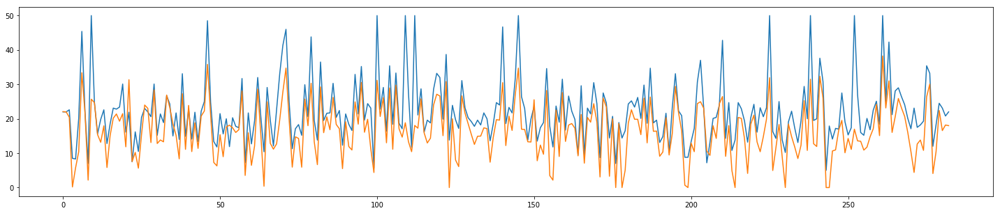

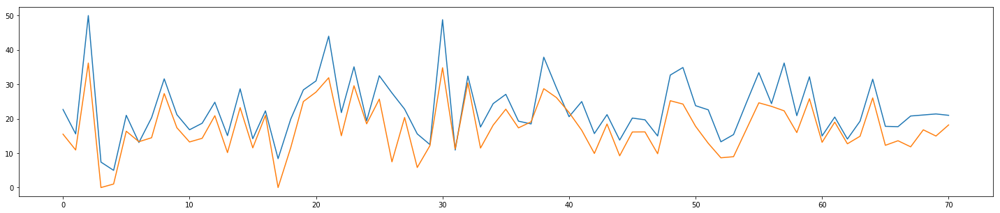

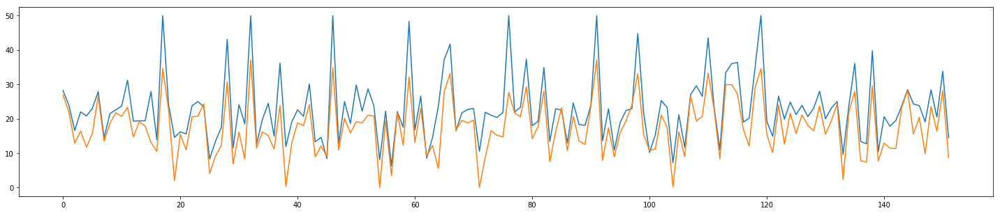

In [23]:
x = np.arange(0, len(y_train),1)
y_pred = model.predict(x_train)
plt.figure(figsize=(25, 5))
plt.plot(x, y_train, x , y_pred)

x = np.arange(0, len(y_val),1)
y_pred = model.predict(x_val)
plt.figure(figsize=(25, 5))
plt.plot(x, y_val, x , y_pred)

x = np.arange(0, len(y_test),1)
y_pred = model.predict(x_test)
plt.figure(figsize=(25, 5))
plt.plot(x, y_test, x , y_pred)

### Error of traindata = 57%, validation data =42% , testing data = 45%, for LR =0.01,Epochs=30000

### Therefore, we got our least error for the learnig rate = 0.001 and Epochs =20000, with and with error of traindata = 27.8%, validation data =16.2% , testing data = 17.5%. In the last example case where we used 0.01 and 30000 epochs, we got worse results than when we used 2500 epochs because of overshooting and over tuning.  